In [1]:
import os
import pandas as pd
import datetime
from matplotlib import pyplot
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import CuDNNLSTM
from keras.layers import CuDNNGRU
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.layers import Bidirectional
from keras.layers import Lambda
from keras.layers import Dropout
from keras.layers import SimpleRNN
from keras.utils import generic_utils
from keras.utils import Sequence
from keras import regularizers
from keras import optimizers
from keras.callbacks import ModelCheckpoint
import tensorflow as tf
import numpy as np
import scipy 
import math
import h5py
import time
import copy
import sys
import feather
from sklearn.metrics import mean_absolute_error
from numpy.random import seed
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
seed(123)
from tensorflow import set_random_seed
set_random_seed(456)
np.set_printoptions(threshold=sys.maxsize)

Using TensorFlow backend.


In [19]:
import keras
print(os.getcwd())
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
tf.keras.backend.set_session(tf.Session(config=config))
from tensorflow.python.client import device_lib
#print(device_lib.list_local_devices())

/home/whsu014/dev/mlrig/Experiments


In [20]:
view_1hot_df = feather.read_dataframe("/home/whsu014/data/view_1hot_nona_len29_float_age_impute_and_True_HG_100096inds.feather")

print(view_1hot_df.columns)
print(view_1hot_df.shape)

print(view_1hot_df['CVD_ISOSORBRIDE_DINITRATE'].unique())
view_1hot_df = view_1hot_df.drop(['CVD_ISOSORBRIDE_DINITRATE'], axis=1)
print(view_1hot_df.shape)

Index(['VSIMPLE_INDEX_MASTER', 'QUARTER', 'AGE', 'SEX', 'NZDEP', 'ETHN_1',
       'ETHN_2', 'ETHN_3', 'ETHN_4', 'ETHN_5',
       ...
       'PT_DIABETES_YR', 'PT_ATRIAL_FIBRILLATION', 'PT_IMP_FATAL_CVD',
       'TRUE_HDL', 'TRUE_LDL', 'TRUE_TRI', 'TRUE_TCL', 'TRUE_TCHDL',
       'TRUE_HBA1C', 'TRUE_EGFR'],
      dtype='object', length=191)
(2902784, 191)
[0.]
(2902784, 190)


In [21]:
view_1hot_df.describe()

,VSIMPLE_INDEX_MASTER,QUARTER,AGE,SEX,NZDEP,ETHN_1,ETHN_2,ETHN_3,ETHN_4,ETHN_5,TEST,HDL,LDL,TRI,TCL,TCHDL,TESTED,DIED,LL_SIMVASTATIN,LL_BEZAFIBRATE,LL_ATORVASTATIN,LL_EZETIMIBE,LL_NICOTINIC_ACID,LL_ACIPIMOX,LL_CHOLESTYRAMINE,LL_COLESTIPOL_HYDROCHLORIDE,LL_PRAVASTATIN,LL_EZETIMIBE_WITH_SIMVASTATIN,LL_GEMFIBROZIL,LL_PDC,CVD_FELODIPINE,CVD_QUINAPRIL,CVD_METOPROLOL_SUCCINATE,CVD_CILAZAPRIL,CVD_ATENOLOL,CVD_BENDROFLUMETHIAZIDE,CVD_WARFARIN_SODIUM,CVD_FUROSEMIDE,CVD_CELIPROLOL,CVD_DILTIAZEM_HYDROCHLORIDE,CVD_ASPIRIN,CVD_NIFEDIPINE,CVD_CAPTOPRIL,CVD_DIPYRIDAMOLE,CVD_CANDESARTAN_CILEXETIL,CVD_INDAPAMIDE,CVD_ENALAPRIL_MALEATE,CVD_SOTALOL,CVD_GLYCERYL_TRINITRATE,CVD_ISOSORBIDE_MONONITRATE,CVD_PINDOLOL,CVD_CARVEDILOL,CVD_METHYLDOPA,CVD_LOSARTAN_POTASSIUM,CVD_VERAPAMIL_HYDROCHLORIDE,CVD_AMILORIDE_HYDROCHLORIDE,CVD_CLONIDINE_HYDROCHLORIDE,CVD_CLONIDINE,CVD_NADOLOL,CVD_PROPRANOLOL,CVD_AMLODIPINE,CVD_LABETALOL,CVD_LISINOPRIL,CVD_TRIAMTERENE,CVD_TIMOLOL,CVD_METOPROLOL_TARTRATE,CVD_ACEBUTOLOL,CVD_PERHEXILINE_MALEATE,CVD_CHLORTALIDONE,CVD_BUMETANIDE,CVD_PERINDOPRIL,CVD_TRANDOLAPRIL,CVD_CLOPIDOGREL,CVD_ISRADIPINE,CVD_RIVAROXABAN,CVD_DABIGATRAN,CVD_BISOPROLOL_FUMARATE,CVD_PRASUGREL,CVD_NICORANDIL,CVD_METOLAZONE,CVD_TICAGRELOR,CVD_HYDRALAZINE_HYDROCHLORIDE,CVD_HYDROCHLOROTHIAZIDE,OTHER_TENOXICAM,OTHER_PANTOPRAZOLE,OTHER_OMEPRAZOLE,OTHER_NAPROXEN_SODIUM,OTHER_DICLOFENAC_SODIUM,OTHER_METFORMIN_HYDROCHLORIDE,OTHER_SULINDAC,OTHER_GLICLAZIDE,OTHER_GLIPIZIDE,OTHER_INSULIN_ISOPHANE,OTHER_INSULIN_NEUTRAL,OTHER_KETOPROFEN,OTHER_IBUPROFEN,OTHER_INSULIN_ASPART,OTHER_PREDNISONE,OTHER_INDOMETHACIN,OTHER_NAPROXEN,OTHER_GLIBENCLAMIDE,OTHER_RANITIDINE,OTHER_PIROXICAM,OTHER_INSULIN_LISPRO,OTHER_TIAPROFENIC_ACID,OTHER_PIOGLITAZONE,OTHER_DEXAMETHASONE,OTHER_INSULIN_ZINC_SUSPENSION,OTHER_HYDROCORTISONE,OTHER_PREDNISOLONE,OTHER_TOLBUTAMIDE,OTHER_MEFENAMIC_ACID,OTHER_LANSOPRAZOLE,OTHER_METHYLPREDNISOLONE,OTHER_INSULIN_GLARGINE,OTHER_INSULIND_GLULISINE,OTHER_AMOXYCILLIN,OTHER_CLARITHROMYCIN,OTHER_INSULIN_LISPRO_PROTAMINE,OTHER_INSULIN_ASPART_PROTAMINE,OTHER_VILDAGLIPTIN,NUMBER_OF_DAYS,ACUTE_ADM,hx_broad_cvd,hx_athero_cvd,hx_chd_diags,hx_acs,hx_mi,hx_unst_angina,hx_angina,hx_other_chd,hx_chd_procs,hx_pci,hx_cabg,hx_other_chd_procs,hx_pvd_diags,hx_pvd_procs,hx_haemorrhagic_stroke,hx_cevd,hx_ischaemic_stroke,hx_tia,hx_other_cevd,hx_heart_failure,hx_atrial_fibrillation,mortality_broad_cvd_with_other,mortality_other_related_cvd_deaths,out_broad_cvd,out_athero_cvd,out_chd,out_mi,out_acs,out_unst_angina,out_angina,out_other_chd,out_pvd_diags,out_pvd_procs,out_pci_cabg,out_haemorrhagic_stroke,out_cevd,out_ischaemic_stroke,out_tia,out_other_cevd,out_heart_failure,out_atrial_fibrillation,HBA1C,TEST_HBA1C,TESTED_HBA1C,EGFR,TEST_EGFR,TESTED_EGFR,PT_SBP,PT_SBP2,PT_DBP,PT_DBP2,PT_SMOKING,PT_EN_TCHDL,PT_DIABETES,PT_FAMILY_HISTORY,PT_GEN_LIPID,PT_RENAL,PT_DIABETES_YR,PT_ATRIAL_FIBRILLATION,PT_IMP_FATAL_CVD
count,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.902784e+06,2.

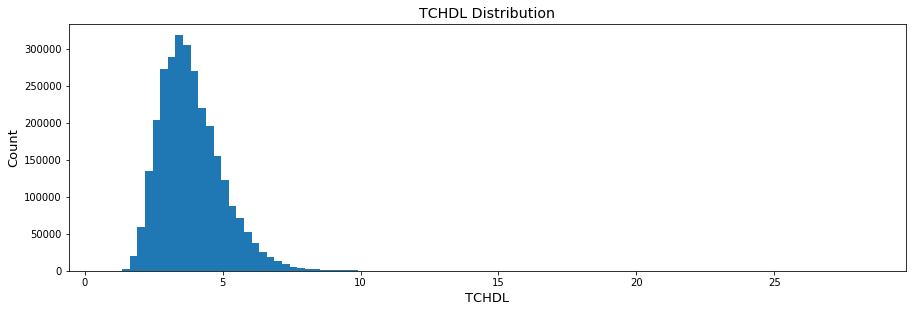

Max: 28.4
Min: 0.8


In [22]:
pyplot.figure(figsize=(15,10))
pyplot.subplot(211)
fs = 13
pyplot.title('TCHDL Distribution', fontsize=fs*1.1)
pyplot.xlabel('TCHDL', fontsize=fs)
pyplot.ylabel('Count', fontsize=fs)
pyplot.hist(view_1hot_df.TCHDL, bins=100)
#filename = "/home/whsu014/plots/TCHDL_Distribution.png"
#pyplot.savefig(filename)
pyplot.show()

print("Max:", max(view_1hot_df.TCHDL))
print("Min:", min(view_1hot_df.TCHDL))

In [23]:
print("Number of inds:", len(view_1hot_df['VSIMPLE_INDEX_MASTER'].unique()))
# set to length 28
print(view_1hot_df.shape[0]/29)
view_1hot_df = copy.deepcopy(view_1hot_df[view_1hot_df['QUARTER']!=0])
print(view_1hot_df.shape[0]/28)
# Take 90000 inds for train and validation set
# remove true values
# remove QUARTER
view_1hot_df = view_1hot_df.drop(['QUARTER'], axis=1)
train_v = copy.deepcopy(view_1hot_df.iloc[:(28*90000), :-7].values)
true_v = copy.deepcopy(view_1hot_df.iloc[:(28*90000), -7:].values)
print(train_v.shape)
print(train_v.shape[0]/28)
print(true_v.shape)
print(true_v.shape[0]/28)

Number of inds: 100096
100096.0
100096.0
(2520000, 182)
90000.0
(2520000, 7)
90000.0


In [24]:
print(view_1hot_df.columns.get_loc('TCHDL'))

14


In [25]:
mean_tchdl = []

num_of_inds = true_v.shape[0]//28

for i in range(num_of_inds):
    ################################
    # Use true TCHDL values
    ################################
    #ind_tchdl = []
    #ind_true_v = true_v[(i*28):((i+1)*28), :]
    # get prediction window
    #for j in range(8, 28):
    #    if len(ind_true_v[j, 4]) > 2:
    #        ind_tchdl.extend([float(x) for x in \
    #                          ind_true_v[j, 4][1:-1].split(', ')])
    #################################
    # Use interpolated TCHDL values
    #################################
    ind_v = train_v[(i*28):((i+1)*28), :]
    ind_tchdl = np.mean(ind_v[8:28, 14])
    mean_tchdl.append(ind_tchdl)
print(len(mean_tchdl))    

90000


In [26]:
print(mean_tchdl[-1])
mean_tchdl_v = np.array([mean_tchdl]).T
print(mean_tchdl_v.shape)

3.0537271938175388
(90000, 1)


In [27]:
idx = 89999
view_1hot_df.iloc[(idx*28):((idx+1)*28), -3]

2609972    []   
2609973    []   
2609974    [2.6]
2609975    []   
2609976    []   
2609977    [2.7]
2609978    []   
2609979    [2.7]
2609980    []   
2609981    [2.6]
2609982    []   
2609983    []   
2609984    []   
2609985    [2.9]
2609986    [2.8]
2609987    [3.1]
2609988    []   
2609989    []   
2609990    [3.5]
2609991    []   
2609992    []   
2609993    []   
2609994    [3.2]
2609995    []   
2609996    []   
2609997    []   
2609998    []   
2609999    []   
Name: TRUE_TCHDL, dtype: object

In [28]:
# standardise data
# z = (X - u)/s
# u is the mean of the training samples
# s is the standard devidation of the training samples
scaler_x = StandardScaler()
scaled_train = scaler_x.fit_transform(train_v) 
scaler_y = StandardScaler()
y_train = scaler_y.fit_transform(mean_tchdl_v)

In [29]:
num_of_inds = scaled_train.shape[0]//28
print("Number of individuals: ", num_of_inds)

x_train_list = []
start_time = time.time()
for i in range(num_of_inds): #num_of_inds[]
    ind_train = copy.deepcopy(scaled_train[(i*28):((i+1)*28), :])
    ind_train_x = copy.deepcopy(ind_train[0:8, :]) 
    x_train_list.append(ind_train_x)
print("Time to build train test data: ", time.time() - start_time)
x_train = np.array(x_train_list)
print(x_train.shape)
print(y_train.shape)

Number of individuals:  90000
Time to build train test data:  1.1531567573547363
(90000, 8, 182)
(90000, 1)


9000
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 13s - loss: 1.0200 - val_loss: 1.0044

Epoch 00001: val_loss improved from inf to 1.00442, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 0.9948 - val_loss: 0.9799

Epoch 00002: val_loss improved from 1.00442 to 0.97987, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9711 - val_loss: 0.9568

Epoch 00003: val_loss improved from 0.97987 to 0.95683, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9490 - val_loss: 0.9356

Epoch 00004: val_loss improved from 0.95683 to 0.93561, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.9285 - val_loss: 0.9162

Epoch 00005: val_loss improved from 0.93561 to 0.91617, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.9096 - val_loss: 0.8983

Epoch 00006: val_loss improved from 0.91617 to 0.89828, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.8923 - val_loss: 0.8818

Epoch 00007: val_loss improved from 0.

 - 1s - loss: 0.4844 - val_loss: 0.4879

Epoch 00058: val_loss improved from 0.48979 to 0.48788, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4825 - val_loss: 0.4862

Epoch 00059: val_loss improved from 0.48788 to 0.48621, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4807 - val_loss: 0.4844

Epoch 00060: val_loss improved from 0.48621 to 0.48439, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4789 - val_loss: 0.4827

Epoch 00061: val_loss improved from 0.48439 to 0.48272, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4771 - val_loss: 0.4811

Epoch 00062: val_loss improved from 0.48272 to 0.48108, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4754 - val_loss: 0.4796

Epoch 00063: val_loss improved from 0.48108 to 0.47955, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4738 - val_loss: 0.4779

Epoch 00064: val_loss improved from 0.47955 to 0.47791, saving model to val_weights1.hdf5
Epoch

 - 1s - loss: 0.4292 - val_loss: 0.4354

Epoch 00115: val_loss improved from 0.43590 to 0.43544, saving model to val_weights1.hdf5
Epoch 116/500
 - 1s - loss: 0.4288 - val_loss: 0.4350

Epoch 00116: val_loss improved from 0.43544 to 0.43501, saving model to val_weights1.hdf5
Epoch 117/500
 - 1s - loss: 0.4284 - val_loss: 0.4346

Epoch 00117: val_loss improved from 0.43501 to 0.43464, saving model to val_weights1.hdf5
Epoch 118/500
 - 1s - loss: 0.4280 - val_loss: 0.4343

Epoch 00118: val_loss improved from 0.43464 to 0.43435, saving model to val_weights1.hdf5
Epoch 119/500
 - 1s - loss: 0.4276 - val_loss: 0.4339

Epoch 00119: val_loss improved from 0.43435 to 0.43386, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.4273 - val_loss: 0.4335

Epoch 00120: val_loss improved from 0.43386 to 0.43352, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.4269 - val_loss: 0.4332

Epoch 00121: val_loss improved from 0.43352 to 0.43317, saving model to val_weights1.hdf5

 - 1s - loss: 0.4151 - val_loss: 0.4208

Epoch 00172: val_loss improved from 0.42107 to 0.42085, saving model to val_weights1.hdf5
Epoch 173/500
 - 1s - loss: 0.4149 - val_loss: 0.4208

Epoch 00173: val_loss improved from 0.42085 to 0.42083, saving model to val_weights1.hdf5
Epoch 174/500
 - 1s - loss: 0.4147 - val_loss: 0.4205

Epoch 00174: val_loss improved from 0.42083 to 0.42055, saving model to val_weights1.hdf5
Epoch 175/500
 - 1s - loss: 0.4146 - val_loss: 0.4204

Epoch 00175: val_loss improved from 0.42055 to 0.42039, saving model to val_weights1.hdf5
Epoch 176/500
 - 1s - loss: 0.4144 - val_loss: 0.4202

Epoch 00176: val_loss improved from 0.42039 to 0.42023, saving model to val_weights1.hdf5
Epoch 177/500
 - 1s - loss: 0.4142 - val_loss: 0.4201

Epoch 00177: val_loss improved from 0.42023 to 0.42008, saving model to val_weights1.hdf5
Epoch 178/500
 - 1s - loss: 0.4141 - val_loss: 0.4199

Epoch 00178: val_loss improved from 0.42008 to 0.41988, saving model to val_weights1.hdf5

 - 1s - loss: 0.4074 - val_loss: 0.4131

Epoch 00231: val_loss improved from 0.41325 to 0.41313, saving model to val_weights1.hdf5
Epoch 232/500
 - 1s - loss: 0.4073 - val_loss: 0.4131

Epoch 00232: val_loss improved from 0.41313 to 0.41305, saving model to val_weights1.hdf5
Epoch 233/500
 - 1s - loss: 0.4072 - val_loss: 0.4131

Epoch 00233: val_loss did not improve from 0.41305
Epoch 234/500
 - 1s - loss: 0.4072 - val_loss: 0.4130

Epoch 00234: val_loss improved from 0.41305 to 0.41297, saving model to val_weights1.hdf5
Epoch 235/500
 - 1s - loss: 0.4070 - val_loss: 0.4128

Epoch 00235: val_loss improved from 0.41297 to 0.41284, saving model to val_weights1.hdf5
Epoch 236/500
 - 1s - loss: 0.4070 - val_loss: 0.4128

Epoch 00236: val_loss improved from 0.41284 to 0.41278, saving model to val_weights1.hdf5
Epoch 237/500
 - 1s - loss: 0.4069 - val_loss: 0.4126

Epoch 00237: val_loss improved from 0.41278 to 0.41258, saving model to val_weights1.hdf5
Epoch 238/500
 - 1s - loss: 0.4068 - v


Epoch 00294: val_loss did not improve from 0.40900
Epoch 295/500
 - 1s - loss: 0.4031 - val_loss: 0.4090

Epoch 00295: val_loss did not improve from 0.40900
Epoch 296/500
 - 1s - loss: 0.4031 - val_loss: 0.4086

Epoch 00296: val_loss improved from 0.40900 to 0.40863, saving model to val_weights1.hdf5
Epoch 297/500
 - 1s - loss: 0.4031 - val_loss: 0.4088

Epoch 00297: val_loss did not improve from 0.40863
Epoch 298/500
 - 1s - loss: 0.4031 - val_loss: 0.4087

Epoch 00298: val_loss did not improve from 0.40863
Epoch 299/500
 - 1s - loss: 0.4029 - val_loss: 0.4088

Epoch 00299: val_loss did not improve from 0.40863
Epoch 300/500
 - 1s - loss: 0.4028 - val_loss: 0.4086

Epoch 00300: val_loss improved from 0.40863 to 0.40860, saving model to val_weights1.hdf5
Epoch 301/500
 - 1s - loss: 0.4029 - val_loss: 0.4086

Epoch 00301: val_loss did not improve from 0.40860
Epoch 302/500
 - 1s - loss: 0.4028 - val_loss: 0.4086

Epoch 00302: val_loss improved from 0.40860 to 0.40856, saving model to v

 - 1s - loss: 0.4004 - val_loss: 0.4057

Epoch 00359: val_loss improved from 0.40584 to 0.40569, saving model to val_weights1.hdf5
Epoch 360/500
 - 1s - loss: 0.4004 - val_loss: 0.4058

Epoch 00360: val_loss did not improve from 0.40569
Epoch 361/500
 - 1s - loss: 0.4003 - val_loss: 0.4057

Epoch 00361: val_loss did not improve from 0.40569
Epoch 362/500
 - 1s - loss: 0.4004 - val_loss: 0.4058

Epoch 00362: val_loss did not improve from 0.40569
Epoch 363/500
 - 1s - loss: 0.4003 - val_loss: 0.4057

Epoch 00363: val_loss did not improve from 0.40569
Epoch 364/500
 - 1s - loss: 0.4002 - val_loss: 0.4055

Epoch 00364: val_loss improved from 0.40569 to 0.40552, saving model to val_weights1.hdf5
Epoch 365/500
 - 1s - loss: 0.4002 - val_loss: 0.4055

Epoch 00365: val_loss improved from 0.40552 to 0.40546, saving model to val_weights1.hdf5
Epoch 366/500
 - 1s - loss: 0.4002 - val_loss: 0.4055

Epoch 00366: val_loss did not improve from 0.40546
Epoch 367/500
 - 1s - loss: 0.4001 - val_loss: 0.

 - 1s - loss: 0.3985 - val_loss: 0.4036

Epoch 00428: val_loss did not improve from 0.40345
Epoch 429/500
 - 1s - loss: 0.3985 - val_loss: 0.4038

Epoch 00429: val_loss did not improve from 0.40345
Epoch 430/500
 - 1s - loss: 0.3984 - val_loss: 0.4037

Epoch 00430: val_loss did not improve from 0.40345
Epoch 431/500
 - 1s - loss: 0.3985 - val_loss: 0.4034

Epoch 00431: val_loss improved from 0.40345 to 0.40345, saving model to val_weights1.hdf5
Epoch 432/500
 - 1s - loss: 0.3985 - val_loss: 0.4035

Epoch 00432: val_loss did not improve from 0.40345
Epoch 433/500
 - 1s - loss: 0.3985 - val_loss: 0.4035

Epoch 00433: val_loss did not improve from 0.40345
Epoch 434/500
 - 1s - loss: 0.3985 - val_loss: 0.4034

Epoch 00434: val_loss improved from 0.40345 to 0.40342, saving model to val_weights1.hdf5
Epoch 435/500
 - 1s - loss: 0.3985 - val_loss: 0.4034

Epoch 00435: val_loss improved from 0.40342 to 0.40340, saving model to val_weights1.hdf5
Epoch 436/500
 - 1s - loss: 0.3985 - val_loss: 0.

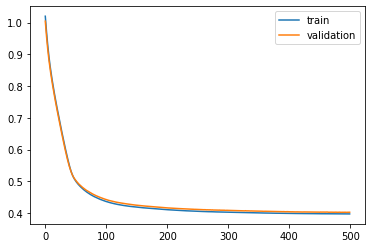

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 19s - loss: 0.8925 - val_loss: 0.8769

Epoch 00001: val_loss improved from inf to 0.87690, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 0.8678 - val_loss: 0.8534

Epoch 00002: val_loss improved from 0.87690 to 0.85338, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.8452 - val_loss: 0.8317

Epoch 00003: val_loss improved from 0.85338 to 0.83169, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.8239 - val_loss: 0.8113

Epoch 00004: val_loss improved from 0.83169 to 0.81132, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8038 - val_loss: 0.7921

Epoch 00005: val_loss improved from 0.81132 to 0.79206, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.7845 - val_loss: 0.7735

Epoch 00006: val_loss improved from 0.79206 to 0.77349, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7659 - val_loss: 0.7552

Epoch 00007: val_loss improved from 0.77349

 - 1s - loss: 0.4413 - val_loss: 0.4406

Epoch 00058: val_loss improved from 0.44149 to 0.44063, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4405 - val_loss: 0.4396

Epoch 00059: val_loss improved from 0.44063 to 0.43957, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4397 - val_loss: 0.4387

Epoch 00060: val_loss improved from 0.43957 to 0.43869, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4389 - val_loss: 0.4379

Epoch 00061: val_loss improved from 0.43869 to 0.43792, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4382 - val_loss: 0.4370

Epoch 00062: val_loss improved from 0.43792 to 0.43696, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4374 - val_loss: 0.4363

Epoch 00063: val_loss improved from 0.43696 to 0.43626, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4367 - val_loss: 0.4355

Epoch 00064: val_loss improved from 0.43626 to 0.43551, saving model to val_weights2.hdf5
Epoch


Epoch 00115: val_loss improved from 0.41629 to 0.41597, saving model to val_weights2.hdf5
Epoch 116/500
 - 1s - loss: 0.4185 - val_loss: 0.4159

Epoch 00116: val_loss improved from 0.41597 to 0.41594, saving model to val_weights2.hdf5
Epoch 117/500
 - 1s - loss: 0.4183 - val_loss: 0.4157

Epoch 00117: val_loss improved from 0.41594 to 0.41570, saving model to val_weights2.hdf5
Epoch 118/500
 - 1s - loss: 0.4181 - val_loss: 0.4154

Epoch 00118: val_loss improved from 0.41570 to 0.41542, saving model to val_weights2.hdf5
Epoch 119/500
 - 1s - loss: 0.4180 - val_loss: 0.4154

Epoch 00119: val_loss did not improve from 0.41542
Epoch 120/500
 - 1s - loss: 0.4178 - val_loss: 0.4152

Epoch 00120: val_loss improved from 0.41542 to 0.41521, saving model to val_weights2.hdf5
Epoch 121/500
 - 1s - loss: 0.4176 - val_loss: 0.4149

Epoch 00121: val_loss improved from 0.41521 to 0.41492, saving model to val_weights2.hdf5
Epoch 122/500
 - 1s - loss: 0.4174 - val_loss: 0.4150

Epoch 00122: val_loss d

 - 1s - loss: 0.4115 - val_loss: 0.4094

Epoch 00176: val_loss improved from 0.40946 to 0.40942, saving model to val_weights2.hdf5
Epoch 177/500
 - 1s - loss: 0.4115 - val_loss: 0.4096

Epoch 00177: val_loss did not improve from 0.40942
Epoch 178/500
 - 1s - loss: 0.4114 - val_loss: 0.4093

Epoch 00178: val_loss improved from 0.40942 to 0.40926, saving model to val_weights2.hdf5
Epoch 179/500
 - 1s - loss: 0.4113 - val_loss: 0.4093

Epoch 00179: val_loss did not improve from 0.40926
Epoch 180/500
 - 1s - loss: 0.4112 - val_loss: 0.4094

Epoch 00180: val_loss did not improve from 0.40926
Epoch 181/500
 - 1s - loss: 0.4112 - val_loss: 0.4092

Epoch 00181: val_loss improved from 0.40926 to 0.40924, saving model to val_weights2.hdf5
Epoch 182/500
 - 1s - loss: 0.4111 - val_loss: 0.4091

Epoch 00182: val_loss improved from 0.40924 to 0.40911, saving model to val_weights2.hdf5
Epoch 183/500
 - 1s - loss: 0.4111 - val_loss: 0.4091

Epoch 00183: val_loss improved from 0.40911 to 0.40909, savin

 - 1s - loss: 0.4084 - val_loss: 0.4069

Epoch 00239: val_loss did not improve from 0.40675
Epoch 240/500
 - 1s - loss: 0.4083 - val_loss: 0.4068

Epoch 00240: val_loss did not improve from 0.40675
Epoch 241/500
 - 1s - loss: 0.4083 - val_loss: 0.4068

Epoch 00241: val_loss did not improve from 0.40675
Epoch 242/500
 - 1s - loss: 0.4083 - val_loss: 0.4068

Epoch 00242: val_loss did not improve from 0.40675
Epoch 243/500
 - 1s - loss: 0.4082 - val_loss: 0.4066

Epoch 00243: val_loss improved from 0.40675 to 0.40663, saving model to val_weights2.hdf5
Epoch 244/500
 - 1s - loss: 0.4081 - val_loss: 0.4066

Epoch 00244: val_loss improved from 0.40663 to 0.40660, saving model to val_weights2.hdf5
Epoch 245/500
 - 1s - loss: 0.4081 - val_loss: 0.4067

Epoch 00245: val_loss did not improve from 0.40660
Epoch 246/500
 - 1s - loss: 0.4081 - val_loss: 0.4067

Epoch 00246: val_loss did not improve from 0.40660
Epoch 247/500
 - 1s - loss: 0.4080 - val_loss: 0.4066

Epoch 00247: val_loss improved fr


Epoch 00305: val_loss improved from 0.40445 to 0.40440, saving model to val_weights2.hdf5
Epoch 306/500
 - 1s - loss: 0.4057 - val_loss: 0.4044

Epoch 00306: val_loss did not improve from 0.40440
Epoch 307/500
 - 1s - loss: 0.4057 - val_loss: 0.4044

Epoch 00307: val_loss improved from 0.40440 to 0.40436, saving model to val_weights2.hdf5
Epoch 308/500
 - 1s - loss: 0.4056 - val_loss: 0.4042

Epoch 00308: val_loss improved from 0.40436 to 0.40418, saving model to val_weights2.hdf5
Epoch 309/500
 - 1s - loss: 0.4056 - val_loss: 0.4041

Epoch 00309: val_loss improved from 0.40418 to 0.40413, saving model to val_weights2.hdf5
Epoch 310/500
 - 1s - loss: 0.4056 - val_loss: 0.4041

Epoch 00310: val_loss did not improve from 0.40413
Epoch 311/500
 - 1s - loss: 0.4055 - val_loss: 0.4040

Epoch 00311: val_loss improved from 0.40413 to 0.40401, saving model to val_weights2.hdf5
Epoch 312/500
 - 1s - loss: 0.4054 - val_loss: 0.4040

Epoch 00312: val_loss improved from 0.40401 to 0.40395, saving

 - 1s - loss: 0.4023 - val_loss: 0.4003

Epoch 00369: val_loss did not improve from 0.40018
Epoch 370/500
 - 1s - loss: 0.4022 - val_loss: 0.3999

Epoch 00370: val_loss improved from 0.40018 to 0.39990, saving model to val_weights2.hdf5
Epoch 371/500
 - 1s - loss: 0.4021 - val_loss: 0.4001

Epoch 00371: val_loss did not improve from 0.39990
Epoch 372/500
 - 1s - loss: 0.4021 - val_loss: 0.3999

Epoch 00372: val_loss improved from 0.39990 to 0.39988, saving model to val_weights2.hdf5
Epoch 373/500
 - 1s - loss: 0.4021 - val_loss: 0.4000

Epoch 00373: val_loss did not improve from 0.39988
Epoch 374/500
 - 1s - loss: 0.4020 - val_loss: 0.3998

Epoch 00374: val_loss improved from 0.39988 to 0.39983, saving model to val_weights2.hdf5
Epoch 375/500
 - 1s - loss: 0.4020 - val_loss: 0.4000

Epoch 00375: val_loss did not improve from 0.39983
Epoch 376/500
 - 1s - loss: 0.4020 - val_loss: 0.3999

Epoch 00376: val_loss did not improve from 0.39983
Epoch 377/500
 - 1s - loss: 0.4019 - val_loss: 0.

 - 1s - loss: 0.4000 - val_loss: 0.3978

Epoch 00436: val_loss did not improve from 0.39746
Epoch 437/500
 - 1s - loss: 0.3999 - val_loss: 0.3975

Epoch 00437: val_loss did not improve from 0.39746
Epoch 438/500
 - 1s - loss: 0.3997 - val_loss: 0.3973

Epoch 00438: val_loss improved from 0.39746 to 0.39732, saving model to val_weights2.hdf5
Epoch 439/500
 - 1s - loss: 0.3998 - val_loss: 0.3972

Epoch 00439: val_loss improved from 0.39732 to 0.39724, saving model to val_weights2.hdf5
Epoch 440/500
 - 1s - loss: 0.3997 - val_loss: 0.3977

Epoch 00440: val_loss did not improve from 0.39724
Epoch 441/500
 - 1s - loss: 0.3997 - val_loss: 0.3975

Epoch 00441: val_loss did not improve from 0.39724
Epoch 442/500
 - 1s - loss: 0.3995 - val_loss: 0.3975

Epoch 00442: val_loss did not improve from 0.39724
Epoch 443/500
 - 1s - loss: 0.3996 - val_loss: 0.3972

Epoch 00443: val_loss improved from 0.39724 to 0.39719, saving model to val_weights2.hdf5
Epoch 444/500
 - 1s - loss: 0.3997 - val_loss: 0.

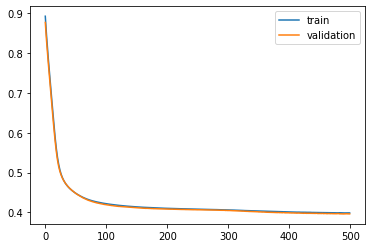

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 13s - loss: 1.0691 - val_loss: 1.0413

Epoch 00001: val_loss improved from inf to 1.04130, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0282 - val_loss: 1.0017

Epoch 00002: val_loss improved from 1.04130 to 1.00167, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9897 - val_loss: 0.9654

Epoch 00003: val_loss improved from 1.00167 to 0.96536, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9537 - val_loss: 0.9329

Epoch 00004: val_loss improved from 0.96536 to 0.93289, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.9209 - val_loss: 0.9036

Epoch 00005: val_loss improved from 0.93289 to 0.90364, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8913 - val_loss: 0.8762

Epoch 00006: val_loss improved from 0.90364 to 0.87622, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.8647 - val_loss: 0.8509

Epoch 00007: val_loss improved from 0.87622

 - 1s - loss: 0.4499 - val_loss: 0.4536

Epoch 00058: val_loss improved from 0.45452 to 0.45362, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4488 - val_loss: 0.4528

Epoch 00059: val_loss improved from 0.45362 to 0.45277, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4479 - val_loss: 0.4518

Epoch 00060: val_loss improved from 0.45277 to 0.45179, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4469 - val_loss: 0.4509

Epoch 00061: val_loss improved from 0.45179 to 0.45093, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4460 - val_loss: 0.4501

Epoch 00062: val_loss improved from 0.45093 to 0.45014, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4451 - val_loss: 0.4493

Epoch 00063: val_loss improved from 0.45014 to 0.44927, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4442 - val_loss: 0.4484

Epoch 00064: val_loss improved from 0.44927 to 0.44837, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.4161 - val_loss: 0.4227

Epoch 00115: val_loss improved from 0.42297 to 0.42270, saving model to val_weights3.hdf5
Epoch 116/500
 - 1s - loss: 0.4159 - val_loss: 0.4226

Epoch 00116: val_loss improved from 0.42270 to 0.42255, saving model to val_weights3.hdf5
Epoch 117/500
 - 1s - loss: 0.4157 - val_loss: 0.4223

Epoch 00117: val_loss improved from 0.42255 to 0.42234, saving model to val_weights3.hdf5
Epoch 118/500
 - 1s - loss: 0.4155 - val_loss: 0.4222

Epoch 00118: val_loss improved from 0.42234 to 0.42222, saving model to val_weights3.hdf5
Epoch 119/500
 - 1s - loss: 0.4153 - val_loss: 0.4221

Epoch 00119: val_loss improved from 0.42222 to 0.42205, saving model to val_weights3.hdf5
Epoch 120/500
 - 1s - loss: 0.4151 - val_loss: 0.4219

Epoch 00120: val_loss improved from 0.42205 to 0.42189, saving model to val_weights3.hdf5
Epoch 121/500
 - 1s - loss: 0.4149 - val_loss: 0.4215

Epoch 00121: val_loss improved from 0.42189 to 0.42155, saving model to val_weights3.hdf5


Epoch 00172: val_loss improved from 0.41673 to 0.41668, saving model to val_weights3.hdf5
Epoch 173/500
 - 1s - loss: 0.4095 - val_loss: 0.4167

Epoch 00173: val_loss improved from 0.41668 to 0.41666, saving model to val_weights3.hdf5
Epoch 174/500
 - 1s - loss: 0.4095 - val_loss: 0.4167

Epoch 00174: val_loss did not improve from 0.41666
Epoch 175/500
 - 1s - loss: 0.4094 - val_loss: 0.4165

Epoch 00175: val_loss improved from 0.41666 to 0.41652, saving model to val_weights3.hdf5
Epoch 176/500
 - 1s - loss: 0.4093 - val_loss: 0.4164

Epoch 00176: val_loss improved from 0.41652 to 0.41643, saving model to val_weights3.hdf5
Epoch 177/500
 - 1s - loss: 0.4093 - val_loss: 0.4164

Epoch 00177: val_loss did not improve from 0.41643
Epoch 178/500
 - 1s - loss: 0.4092 - val_loss: 0.4164

Epoch 00178: val_loss improved from 0.41643 to 0.41638, saving model to val_weights3.hdf5
Epoch 179/500
 - 1s - loss: 0.4091 - val_loss: 0.4162

Epoch 00179: val_loss improved from 0.41638 to 0.41624, saving


Epoch 00235: val_loss improved from 0.41351 to 0.41349, saving model to val_weights3.hdf5
Epoch 236/500
 - 1s - loss: 0.4064 - val_loss: 0.4134

Epoch 00236: val_loss improved from 0.41349 to 0.41342, saving model to val_weights3.hdf5
Epoch 237/500
 - 1s - loss: 0.4064 - val_loss: 0.4134

Epoch 00237: val_loss did not improve from 0.41342
Epoch 238/500
 - 1s - loss: 0.4063 - val_loss: 0.4135

Epoch 00238: val_loss did not improve from 0.41342
Epoch 239/500
 - 1s - loss: 0.4063 - val_loss: 0.4134

Epoch 00239: val_loss improved from 0.41342 to 0.41336, saving model to val_weights3.hdf5
Epoch 240/500
 - 1s - loss: 0.4062 - val_loss: 0.4132

Epoch 00240: val_loss improved from 0.41336 to 0.41321, saving model to val_weights3.hdf5
Epoch 241/500
 - 1s - loss: 0.4062 - val_loss: 0.4133

Epoch 00241: val_loss did not improve from 0.41321
Epoch 242/500
 - 1s - loss: 0.4062 - val_loss: 0.4133

Epoch 00242: val_loss did not improve from 0.41321
Epoch 243/500
 - 1s - loss: 0.4061 - val_loss: 0.4

 - 1s - loss: 0.4042 - val_loss: 0.4115

Epoch 00304: val_loss did not improve from 0.41149
Epoch 305/500
 - 1s - loss: 0.4043 - val_loss: 0.4116

Epoch 00305: val_loss did not improve from 0.41149
Epoch 306/500
 - 1s - loss: 0.4042 - val_loss: 0.4114

Epoch 00306: val_loss improved from 0.41149 to 0.41144, saving model to val_weights3.hdf5
Epoch 307/500
 - 1s - loss: 0.4042 - val_loss: 0.4115

Epoch 00307: val_loss did not improve from 0.41144
Epoch 308/500
 - 1s - loss: 0.4041 - val_loss: 0.4114

Epoch 00308: val_loss improved from 0.41144 to 0.41143, saving model to val_weights3.hdf5
Epoch 309/500
 - 1s - loss: 0.4041 - val_loss: 0.4114

Epoch 00309: val_loss improved from 0.41143 to 0.41141, saving model to val_weights3.hdf5
Epoch 310/500
 - 1s - loss: 0.4041 - val_loss: 0.4114

Epoch 00310: val_loss improved from 0.41141 to 0.41135, saving model to val_weights3.hdf5
Epoch 311/500
 - 1s - loss: 0.4041 - val_loss: 0.4113

Epoch 00311: val_loss improved from 0.41135 to 0.41129, savin

 - 1s - loss: 0.4028 - val_loss: 0.4102

Epoch 00371: val_loss did not improve from 0.40999
Epoch 372/500
 - 1s - loss: 0.4027 - val_loss: 0.4099

Epoch 00372: val_loss improved from 0.40999 to 0.40991, saving model to val_weights3.hdf5
Epoch 373/500
 - 1s - loss: 0.4026 - val_loss: 0.4099

Epoch 00373: val_loss did not improve from 0.40991
Epoch 374/500
 - 1s - loss: 0.4027 - val_loss: 0.4101

Epoch 00374: val_loss did not improve from 0.40991
Epoch 375/500
 - 1s - loss: 0.4026 - val_loss: 0.4101

Epoch 00375: val_loss did not improve from 0.40991
Epoch 376/500
 - 1s - loss: 0.4026 - val_loss: 0.4099

Epoch 00376: val_loss did not improve from 0.40991
Epoch 377/500
 - 1s - loss: 0.4026 - val_loss: 0.4099

Epoch 00377: val_loss improved from 0.40991 to 0.40991, saving model to val_weights3.hdf5
Epoch 378/500
 - 1s - loss: 0.4025 - val_loss: 0.4100

Epoch 00378: val_loss did not improve from 0.40991
Epoch 379/500
 - 1s - loss: 0.4025 - val_loss: 0.4101

Epoch 00379: val_loss did not imp


Epoch 00441: val_loss improved from 0.40879 to 0.40876, saving model to val_weights3.hdf5
Epoch 442/500
 - 1s - loss: 0.4013 - val_loss: 0.4087

Epoch 00442: val_loss improved from 0.40876 to 0.40872, saving model to val_weights3.hdf5
Epoch 443/500
 - 1s - loss: 0.4013 - val_loss: 0.4087

Epoch 00443: val_loss improved from 0.40872 to 0.40869, saving model to val_weights3.hdf5
Epoch 444/500
 - 1s - loss: 0.4013 - val_loss: 0.4089

Epoch 00444: val_loss did not improve from 0.40869
Epoch 445/500
 - 1s - loss: 0.4013 - val_loss: 0.4088

Epoch 00445: val_loss did not improve from 0.40869
Epoch 446/500
 - 1s - loss: 0.4013 - val_loss: 0.4087

Epoch 00446: val_loss did not improve from 0.40869
Epoch 447/500
 - 1s - loss: 0.4012 - val_loss: 0.4088

Epoch 00447: val_loss did not improve from 0.40869
Epoch 448/500
 - 1s - loss: 0.4012 - val_loss: 0.4086

Epoch 00448: val_loss improved from 0.40869 to 0.40858, saving model to val_weights3.hdf5
Epoch 449/500
 - 1s - loss: 0.4012 - val_loss: 0.4

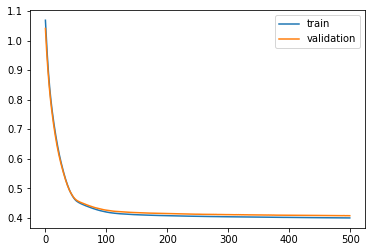

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 16s - loss: 0.9287 - val_loss: 0.9013

Epoch 00001: val_loss improved from inf to 0.90134, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 0.9025 - val_loss: 0.8770

Epoch 00002: val_loss improved from 0.90134 to 0.87696, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.8789 - val_loss: 0.8546

Epoch 00003: val_loss improved from 0.87696 to 0.85460, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.8573 - val_loss: 0.8337

Epoch 00004: val_loss improved from 0.85460 to 0.83371, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8372 - val_loss: 0.8139

Epoch 00005: val_loss improved from 0.83371 to 0.81391, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8179 - val_loss: 0.7949

Epoch 00006: val_loss improved from 0.81391 to 0.79488, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7991 - val_loss: 0.7763

Epoch 00007: val_loss improved from 0.79488

 - 1s - loss: 0.4400 - val_loss: 0.4331

Epoch 00058: val_loss improved from 0.43395 to 0.43308, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4392 - val_loss: 0.4323

Epoch 00059: val_loss improved from 0.43308 to 0.43230, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4384 - val_loss: 0.4316

Epoch 00060: val_loss improved from 0.43230 to 0.43161, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4377 - val_loss: 0.4309

Epoch 00061: val_loss improved from 0.43161 to 0.43087, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4370 - val_loss: 0.4302

Epoch 00062: val_loss improved from 0.43087 to 0.43020, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4363 - val_loss: 0.4295

Epoch 00063: val_loss improved from 0.43020 to 0.42950, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4356 - val_loss: 0.4289

Epoch 00064: val_loss improved from 0.42950 to 0.42886, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.4182 - val_loss: 0.4119

Epoch 00115: val_loss improved from 0.41213 to 0.41186, saving model to val_weights4.hdf5
Epoch 116/500
 - 1s - loss: 0.4180 - val_loss: 0.4117

Epoch 00116: val_loss improved from 0.41186 to 0.41169, saving model to val_weights4.hdf5
Epoch 117/500
 - 1s - loss: 0.4178 - val_loss: 0.4116

Epoch 00117: val_loss improved from 0.41169 to 0.41163, saving model to val_weights4.hdf5
Epoch 118/500
 - 1s - loss: 0.4177 - val_loss: 0.4114

Epoch 00118: val_loss improved from 0.41163 to 0.41139, saving model to val_weights4.hdf5
Epoch 119/500
 - 1s - loss: 0.4175 - val_loss: 0.4113

Epoch 00119: val_loss improved from 0.41139 to 0.41132, saving model to val_weights4.hdf5
Epoch 120/500
 - 1s - loss: 0.4173 - val_loss: 0.4112

Epoch 00120: val_loss improved from 0.41132 to 0.41115, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.4172 - val_loss: 0.4110

Epoch 00121: val_loss improved from 0.41115 to 0.41096, saving model to val_weights4.hdf5

 - 1s - loss: 0.4117 - val_loss: 0.4061

Epoch 00174: val_loss improved from 0.40620 to 0.40611, saving model to val_weights4.hdf5
Epoch 175/500
 - 1s - loss: 0.4117 - val_loss: 0.4061

Epoch 00175: val_loss improved from 0.40611 to 0.40607, saving model to val_weights4.hdf5
Epoch 176/500
 - 1s - loss: 0.4116 - val_loss: 0.4060

Epoch 00176: val_loss improved from 0.40607 to 0.40603, saving model to val_weights4.hdf5
Epoch 177/500
 - 1s - loss: 0.4115 - val_loss: 0.4059

Epoch 00177: val_loss improved from 0.40603 to 0.40591, saving model to val_weights4.hdf5
Epoch 178/500
 - 1s - loss: 0.4115 - val_loss: 0.4059

Epoch 00178: val_loss improved from 0.40591 to 0.40588, saving model to val_weights4.hdf5
Epoch 179/500
 - 1s - loss: 0.4114 - val_loss: 0.4058

Epoch 00179: val_loss improved from 0.40588 to 0.40581, saving model to val_weights4.hdf5
Epoch 180/500
 - 1s - loss: 0.4113 - val_loss: 0.4057

Epoch 00180: val_loss improved from 0.40581 to 0.40575, saving model to val_weights4.hdf5


Epoch 00237: val_loss did not improve from 0.40300
Epoch 238/500
 - 1s - loss: 0.4084 - val_loss: 0.4031

Epoch 00238: val_loss did not improve from 0.40300
Epoch 239/500
 - 1s - loss: 0.4083 - val_loss: 0.4031

Epoch 00239: val_loss did not improve from 0.40300
Epoch 240/500
 - 1s - loss: 0.4082 - val_loss: 0.4030

Epoch 00240: val_loss did not improve from 0.40300
Epoch 241/500
 - 1s - loss: 0.4082 - val_loss: 0.4028

Epoch 00241: val_loss improved from 0.40300 to 0.40277, saving model to val_weights4.hdf5
Epoch 242/500
 - 1s - loss: 0.4082 - val_loss: 0.4031

Epoch 00242: val_loss did not improve from 0.40277
Epoch 243/500
 - 1s - loss: 0.4081 - val_loss: 0.4030

Epoch 00243: val_loss did not improve from 0.40277
Epoch 244/500
 - 1s - loss: 0.4081 - val_loss: 0.4027

Epoch 00244: val_loss improved from 0.40277 to 0.40273, saving model to val_weights4.hdf5
Epoch 245/500
 - 1s - loss: 0.4081 - val_loss: 0.4026

Epoch 00245: val_loss improved from 0.40273 to 0.40259, saving model to v

 - 1s - loss: 0.4050 - val_loss: 0.4003

Epoch 00304: val_loss did not improve from 0.40027
Epoch 305/500
 - 1s - loss: 0.4050 - val_loss: 0.4001

Epoch 00305: val_loss improved from 0.40027 to 0.40014, saving model to val_weights4.hdf5
Epoch 306/500
 - 1s - loss: 0.4050 - val_loss: 0.4003

Epoch 00306: val_loss did not improve from 0.40014
Epoch 307/500
 - 1s - loss: 0.4049 - val_loss: 0.4001

Epoch 00307: val_loss did not improve from 0.40014
Epoch 308/500
 - 1s - loss: 0.4048 - val_loss: 0.4002

Epoch 00308: val_loss did not improve from 0.40014
Epoch 309/500
 - 1s - loss: 0.4048 - val_loss: 0.4002

Epoch 00309: val_loss did not improve from 0.40014
Epoch 310/500
 - 1s - loss: 0.4048 - val_loss: 0.4001

Epoch 00310: val_loss improved from 0.40014 to 0.40012, saving model to val_weights4.hdf5
Epoch 311/500
 - 1s - loss: 0.4047 - val_loss: 0.4000

Epoch 00311: val_loss improved from 0.40012 to 0.40004, saving model to val_weights4.hdf5
Epoch 312/500
 - 1s - loss: 0.4046 - val_loss: 0.

 - 1s - loss: 0.4022 - val_loss: 0.3979

Epoch 00371: val_loss did not improve from 0.39789
Epoch 372/500
 - 1s - loss: 0.4022 - val_loss: 0.3980

Epoch 00372: val_loss did not improve from 0.39789
Epoch 373/500
 - 1s - loss: 0.4022 - val_loss: 0.3982

Epoch 00373: val_loss did not improve from 0.39789
Epoch 374/500
 - 1s - loss: 0.4021 - val_loss: 0.3979

Epoch 00374: val_loss did not improve from 0.39789
Epoch 375/500
 - 1s - loss: 0.4021 - val_loss: 0.3978

Epoch 00375: val_loss improved from 0.39789 to 0.39782, saving model to val_weights4.hdf5
Epoch 376/500
 - 1s - loss: 0.4021 - val_loss: 0.3980

Epoch 00376: val_loss did not improve from 0.39782
Epoch 377/500
 - 1s - loss: 0.4021 - val_loss: 0.3979

Epoch 00377: val_loss did not improve from 0.39782
Epoch 378/500
 - 1s - loss: 0.4020 - val_loss: 0.3980

Epoch 00378: val_loss did not improve from 0.39782
Epoch 379/500
 - 1s - loss: 0.4019 - val_loss: 0.3979

Epoch 00379: val_loss did not improve from 0.39782
Epoch 380/500
 - 1s -

 - 1s - loss: 0.4001 - val_loss: 0.3966

Epoch 00442: val_loss did not improve from 0.39660
Epoch 443/500
 - 1s - loss: 0.4001 - val_loss: 0.3968

Epoch 00443: val_loss did not improve from 0.39660
Epoch 444/500
 - 1s - loss: 0.4000 - val_loss: 0.3966

Epoch 00444: val_loss did not improve from 0.39660
Epoch 445/500
 - 1s - loss: 0.4000 - val_loss: 0.3966

Epoch 00445: val_loss did not improve from 0.39660
Epoch 446/500
 - 1s - loss: 0.4000 - val_loss: 0.3964

Epoch 00446: val_loss improved from 0.39660 to 0.39640, saving model to val_weights4.hdf5
Epoch 447/500
 - 1s - loss: 0.4000 - val_loss: 0.3966

Epoch 00447: val_loss did not improve from 0.39640
Epoch 448/500
 - 1s - loss: 0.3999 - val_loss: 0.3967

Epoch 00448: val_loss did not improve from 0.39640
Epoch 449/500
 - 1s - loss: 0.3999 - val_loss: 0.3966

Epoch 00449: val_loss did not improve from 0.39640
Epoch 450/500
 - 1s - loss: 0.4000 - val_loss: 0.3967

Epoch 00450: val_loss did not improve from 0.39640
Epoch 451/500
 - 1s -

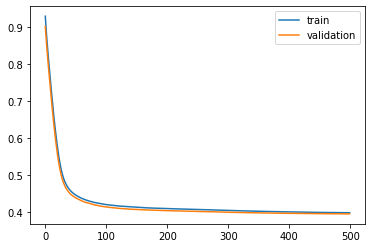

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 20s - loss: 0.9378 - val_loss: 0.9170

Epoch 00001: val_loss improved from inf to 0.91704, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 0.9217 - val_loss: 0.9014

Epoch 00002: val_loss improved from 0.91704 to 0.90144, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9063 - val_loss: 0.8866

Epoch 00003: val_loss improved from 0.90144 to 0.88661, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.8915 - val_loss: 0.8725

Epoch 00004: val_loss improved from 0.88661 to 0.87255, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8776 - val_loss: 0.8592

Epoch 00005: val_loss improved from 0.87255 to 0.85923, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8643 - val_loss: 0.8466

Epoch 00006: val_loss improved from 0.85923 to 0.84662, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.8518 - val_loss: 0.8346

Epoch 00007: val_loss improved from 0.84662

 - 1s - loss: 0.5191 - val_loss: 0.5144

Epoch 00058: val_loss improved from 0.51694 to 0.51435, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.5165 - val_loss: 0.5119

Epoch 00059: val_loss improved from 0.51435 to 0.51188, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.5139 - val_loss: 0.5094

Epoch 00060: val_loss improved from 0.51188 to 0.50936, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.5114 - val_loss: 0.5069

Epoch 00061: val_loss improved from 0.50936 to 0.50690, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.5090 - val_loss: 0.5045

Epoch 00062: val_loss improved from 0.50690 to 0.50455, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.5066 - val_loss: 0.5023

Epoch 00063: val_loss improved from 0.50455 to 0.50233, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.5042 - val_loss: 0.5002

Epoch 00064: val_loss improved from 0.50233 to 0.50019, saving model to val_weights5.hdf5
Epoch

 - 1s - loss: 0.4447 - val_loss: 0.4439

Epoch 00115: val_loss improved from 0.44451 to 0.44389, saving model to val_weights5.hdf5
Epoch 116/500
 - 1s - loss: 0.4441 - val_loss: 0.4433

Epoch 00116: val_loss improved from 0.44389 to 0.44332, saving model to val_weights5.hdf5
Epoch 117/500
 - 1s - loss: 0.4436 - val_loss: 0.4428

Epoch 00117: val_loss improved from 0.44332 to 0.44279, saving model to val_weights5.hdf5
Epoch 118/500
 - 1s - loss: 0.4430 - val_loss: 0.4422

Epoch 00118: val_loss improved from 0.44279 to 0.44224, saving model to val_weights5.hdf5
Epoch 119/500
 - 1s - loss: 0.4424 - val_loss: 0.4417

Epoch 00119: val_loss improved from 0.44224 to 0.44168, saving model to val_weights5.hdf5
Epoch 120/500
 - 1s - loss: 0.4419 - val_loss: 0.4411

Epoch 00120: val_loss improved from 0.44168 to 0.44112, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.4414 - val_loss: 0.4406

Epoch 00121: val_loss improved from 0.44112 to 0.44061, saving model to val_weights5.hdf5

 - 1s - loss: 0.4232 - val_loss: 0.4242

Epoch 00172: val_loss improved from 0.42434 to 0.42415, saving model to val_weights5.hdf5
Epoch 173/500
 - 1s - loss: 0.4230 - val_loss: 0.4239

Epoch 00173: val_loss improved from 0.42415 to 0.42394, saving model to val_weights5.hdf5
Epoch 174/500
 - 1s - loss: 0.4228 - val_loss: 0.4239

Epoch 00174: val_loss improved from 0.42394 to 0.42387, saving model to val_weights5.hdf5
Epoch 175/500
 - 1s - loss: 0.4226 - val_loss: 0.4236

Epoch 00175: val_loss improved from 0.42387 to 0.42362, saving model to val_weights5.hdf5
Epoch 176/500
 - 1s - loss: 0.4224 - val_loss: 0.4234

Epoch 00176: val_loss improved from 0.42362 to 0.42345, saving model to val_weights5.hdf5
Epoch 177/500
 - 1s - loss: 0.4222 - val_loss: 0.4233

Epoch 00177: val_loss improved from 0.42345 to 0.42328, saving model to val_weights5.hdf5
Epoch 178/500
 - 1s - loss: 0.4220 - val_loss: 0.4232

Epoch 00178: val_loss improved from 0.42328 to 0.42315, saving model to val_weights5.hdf5


Epoch 00229: val_loss improved from 0.41676 to 0.41664, saving model to val_weights5.hdf5
Epoch 230/500
 - 1s - loss: 0.4146 - val_loss: 0.4167

Epoch 00230: val_loss did not improve from 0.41664
Epoch 231/500
 - 1s - loss: 0.4144 - val_loss: 0.4166

Epoch 00231: val_loss did not improve from 0.41664
Epoch 232/500
 - 1s - loss: 0.4143 - val_loss: 0.4164

Epoch 00232: val_loss improved from 0.41664 to 0.41644, saving model to val_weights5.hdf5
Epoch 233/500
 - 1s - loss: 0.4143 - val_loss: 0.4164

Epoch 00233: val_loss improved from 0.41644 to 0.41643, saving model to val_weights5.hdf5
Epoch 234/500
 - 1s - loss: 0.4142 - val_loss: 0.4163

Epoch 00234: val_loss improved from 0.41643 to 0.41631, saving model to val_weights5.hdf5
Epoch 235/500
 - 1s - loss: 0.4140 - val_loss: 0.4163

Epoch 00235: val_loss improved from 0.41631 to 0.41628, saving model to val_weights5.hdf5
Epoch 236/500
 - 1s - loss: 0.4140 - val_loss: 0.4162

Epoch 00236: val_loss improved from 0.41628 to 0.41617, saving

 - 1s - loss: 0.4098 - val_loss: 0.4125

Epoch 00288: val_loss improved from 0.41264 to 0.41247, saving model to val_weights5.hdf5
Epoch 289/500
 - 1s - loss: 0.4097 - val_loss: 0.4124

Epoch 00289: val_loss improved from 0.41247 to 0.41241, saving model to val_weights5.hdf5
Epoch 290/500
 - 1s - loss: 0.4096 - val_loss: 0.4123

Epoch 00290: val_loss improved from 0.41241 to 0.41234, saving model to val_weights5.hdf5
Epoch 291/500
 - 1s - loss: 0.4095 - val_loss: 0.4123

Epoch 00291: val_loss improved from 0.41234 to 0.41232, saving model to val_weights5.hdf5
Epoch 292/500
 - 1s - loss: 0.4095 - val_loss: 0.4122

Epoch 00292: val_loss improved from 0.41232 to 0.41221, saving model to val_weights5.hdf5
Epoch 293/500
 - 1s - loss: 0.4094 - val_loss: 0.4122

Epoch 00293: val_loss did not improve from 0.41221
Epoch 294/500
 - 1s - loss: 0.4093 - val_loss: 0.4120

Epoch 00294: val_loss improved from 0.41221 to 0.41197, saving model to val_weights5.hdf5
Epoch 295/500
 - 1s - loss: 0.4092 - v

 - 1s - loss: 0.4057 - val_loss: 0.4081

Epoch 00353: val_loss did not improve from 0.40799
Epoch 354/500
 - 1s - loss: 0.4057 - val_loss: 0.4080

Epoch 00354: val_loss did not improve from 0.40799
Epoch 355/500
 - 1s - loss: 0.4057 - val_loss: 0.4081

Epoch 00355: val_loss did not improve from 0.40799
Epoch 356/500
 - 1s - loss: 0.4055 - val_loss: 0.4081

Epoch 00356: val_loss did not improve from 0.40799
Epoch 357/500
 - 1s - loss: 0.4055 - val_loss: 0.4078

Epoch 00357: val_loss improved from 0.40799 to 0.40781, saving model to val_weights5.hdf5
Epoch 358/500
 - 1s - loss: 0.4055 - val_loss: 0.4079

Epoch 00358: val_loss did not improve from 0.40781
Epoch 359/500
 - 1s - loss: 0.4054 - val_loss: 0.4078

Epoch 00359: val_loss improved from 0.40781 to 0.40777, saving model to val_weights5.hdf5
Epoch 360/500
 - 1s - loss: 0.4055 - val_loss: 0.4077

Epoch 00360: val_loss improved from 0.40777 to 0.40772, saving model to val_weights5.hdf5
Epoch 361/500
 - 1s - loss: 0.4054 - val_loss: 0.


Epoch 00419: val_loss did not improve from 0.40555
Epoch 420/500
 - 1s - loss: 0.4033 - val_loss: 0.4054

Epoch 00420: val_loss improved from 0.40555 to 0.40542, saving model to val_weights5.hdf5
Epoch 421/500
 - 1s - loss: 0.4033 - val_loss: 0.4054

Epoch 00421: val_loss improved from 0.40542 to 0.40541, saving model to val_weights5.hdf5
Epoch 422/500
 - 1s - loss: 0.4032 - val_loss: 0.4056

Epoch 00422: val_loss did not improve from 0.40541
Epoch 423/500
 - 1s - loss: 0.4031 - val_loss: 0.4054

Epoch 00423: val_loss improved from 0.40541 to 0.40539, saving model to val_weights5.hdf5
Epoch 424/500
 - 1s - loss: 0.4031 - val_loss: 0.4055

Epoch 00424: val_loss did not improve from 0.40539
Epoch 425/500
 - 1s - loss: 0.4032 - val_loss: 0.4054

Epoch 00425: val_loss did not improve from 0.40539
Epoch 426/500
 - 1s - loss: 0.4031 - val_loss: 0.4054

Epoch 00426: val_loss did not improve from 0.40539
Epoch 427/500
 - 1s - loss: 0.4031 - val_loss: 0.4054

Epoch 00427: val_loss improved fro

 - 1s - loss: 0.4017 - val_loss: 0.4041

Epoch 00488: val_loss did not improve from 0.40400
Epoch 489/500
 - 1s - loss: 0.4016 - val_loss: 0.4039

Epoch 00489: val_loss improved from 0.40400 to 0.40386, saving model to val_weights5.hdf5
Epoch 490/500
 - 1s - loss: 0.4015 - val_loss: 0.4040

Epoch 00490: val_loss did not improve from 0.40386
Epoch 491/500
 - 1s - loss: 0.4015 - val_loss: 0.4042

Epoch 00491: val_loss did not improve from 0.40386
Epoch 492/500
 - 1s - loss: 0.4015 - val_loss: 0.4040

Epoch 00492: val_loss did not improve from 0.40386
Epoch 493/500
 - 1s - loss: 0.4015 - val_loss: 0.4041

Epoch 00493: val_loss did not improve from 0.40386
Epoch 494/500
 - 1s - loss: 0.4016 - val_loss: 0.4041

Epoch 00494: val_loss did not improve from 0.40386
Epoch 495/500
 - 1s - loss: 0.4017 - val_loss: 0.4040

Epoch 00495: val_loss did not improve from 0.40386
Epoch 496/500
 - 1s - loss: 0.4016 - val_loss: 0.4038

Epoch 00496: val_loss improved from 0.40386 to 0.40382, saving model to 

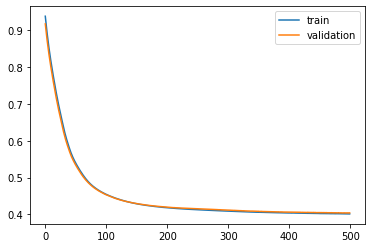

Time to train LSTM:  357.48703122138977
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 26s - loss: 1.0732 - val_loss: 1.0430

Epoch 00001: val_loss improved from inf to 1.04299, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0292 - val_loss: 1.0020

Epoch 00002: val_loss improved from 1.04299 to 1.00196, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9894 - val_loss: 0.9644

Epoch 00003: val_loss improved from 1.00196 to 0.96440, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9529 - val_loss: 0.9296

Epoch 00004: val_loss improved from 0.96440 to 0.92964, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.9188 - val_loss: 0.8974

Epoch 00005: val_loss improved from 0.92964 to 0.89735, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8870 - val_loss: 0.8671

Epoch 00006: val_loss improved from 0.89735 to 0.86710, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.8569 - val_loss: 0.8385

Epo


Epoch 00057: val_loss improved from 0.43465 to 0.43384, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4275 - val_loss: 0.4331

Epoch 00058: val_loss improved from 0.43384 to 0.43312, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4268 - val_loss: 0.4325

Epoch 00059: val_loss improved from 0.43312 to 0.43254, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4262 - val_loss: 0.4320

Epoch 00060: val_loss improved from 0.43254 to 0.43196, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4256 - val_loss: 0.4313

Epoch 00061: val_loss improved from 0.43196 to 0.43131, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4250 - val_loss: 0.4307

Epoch 00062: val_loss improved from 0.43131 to 0.43075, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4244 - val_loss: 0.4302

Epoch 00063: val_loss improved from 0.43075 to 0.43023, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4239 - val_loss:

 - 1s - loss: 0.4049 - val_loss: 0.4111

Epoch 00115: val_loss improved from 0.41129 to 0.41108, saving model to val_weights1.hdf5
Epoch 116/500
 - 1s - loss: 0.4047 - val_loss: 0.4111

Epoch 00116: val_loss did not improve from 0.41108
Epoch 117/500
 - 1s - loss: 0.4045 - val_loss: 0.4107

Epoch 00117: val_loss improved from 0.41108 to 0.41069, saving model to val_weights1.hdf5
Epoch 118/500
 - 1s - loss: 0.4043 - val_loss: 0.4106

Epoch 00118: val_loss improved from 0.41069 to 0.41060, saving model to val_weights1.hdf5
Epoch 119/500
 - 1s - loss: 0.4042 - val_loss: 0.4102

Epoch 00119: val_loss improved from 0.41060 to 0.41022, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.4039 - val_loss: 0.4101

Epoch 00120: val_loss improved from 0.41022 to 0.41009, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.4037 - val_loss: 0.4098

Epoch 00121: val_loss improved from 0.41009 to 0.40984, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.4034 - v

 - 1s - loss: 0.3972 - val_loss: 0.4023

Epoch 00178: val_loss improved from 0.40259 to 0.40231, saving model to val_weights1.hdf5
Epoch 179/500
 - 1s - loss: 0.3971 - val_loss: 0.4028

Epoch 00179: val_loss did not improve from 0.40231
Epoch 180/500
 - 1s - loss: 0.3970 - val_loss: 0.4026

Epoch 00180: val_loss did not improve from 0.40231
Epoch 181/500
 - 1s - loss: 0.3969 - val_loss: 0.4028

Epoch 00181: val_loss did not improve from 0.40231
Epoch 182/500
 - 1s - loss: 0.3969 - val_loss: 0.4025

Epoch 00182: val_loss did not improve from 0.40231
Epoch 183/500
 - 1s - loss: 0.3968 - val_loss: 0.4024

Epoch 00183: val_loss did not improve from 0.40231
Epoch 184/500
 - 1s - loss: 0.3967 - val_loss: 0.4020

Epoch 00184: val_loss improved from 0.40231 to 0.40203, saving model to val_weights1.hdf5
Epoch 185/500
 - 1s - loss: 0.3967 - val_loss: 0.4020

Epoch 00185: val_loss did not improve from 0.40203
Epoch 186/500
 - 1s - loss: 0.3967 - val_loss: 0.4018

Epoch 00186: val_loss improved fr


Epoch 00245: val_loss did not improve from 0.39858
Epoch 246/500
 - 1s - loss: 0.3934 - val_loss: 0.3989

Epoch 00246: val_loss did not improve from 0.39858
Epoch 247/500
 - 1s - loss: 0.3933 - val_loss: 0.3987

Epoch 00247: val_loss did not improve from 0.39858
Epoch 248/500
 - 1s - loss: 0.3933 - val_loss: 0.3986

Epoch 00248: val_loss did not improve from 0.39858
Epoch 249/500
 - 1s - loss: 0.3933 - val_loss: 0.3988

Epoch 00249: val_loss did not improve from 0.39858
Epoch 250/500
 - 1s - loss: 0.3934 - val_loss: 0.3986

Epoch 00250: val_loss did not improve from 0.39858
Epoch 251/500
 - 1s - loss: 0.3934 - val_loss: 0.3987

Epoch 00251: val_loss did not improve from 0.39858
Epoch 252/500
 - 1s - loss: 0.3932 - val_loss: 0.3985

Epoch 00252: val_loss improved from 0.39858 to 0.39851, saving model to val_weights1.hdf5
Epoch 253/500
 - 1s - loss: 0.3931 - val_loss: 0.3985

Epoch 00253: val_loss did not improve from 0.39851
Epoch 254/500
 - 1s - loss: 0.3931 - val_loss: 0.3986

Epoch 

 - 1s - loss: 0.3914 - val_loss: 0.3971

Epoch 00318: val_loss did not improve from 0.39705
Epoch 319/500
 - 1s - loss: 0.3913 - val_loss: 0.3971

Epoch 00319: val_loss did not improve from 0.39705
Epoch 320/500
 - 1s - loss: 0.3912 - val_loss: 0.3976

Epoch 00320: val_loss did not improve from 0.39705
Epoch 321/500
 - 1s - loss: 0.3913 - val_loss: 0.3972

Epoch 00321: val_loss did not improve from 0.39705
Epoch 322/500
 - 1s - loss: 0.3912 - val_loss: 0.3969

Epoch 00322: val_loss improved from 0.39705 to 0.39691, saving model to val_weights1.hdf5
Epoch 323/500
 - 1s - loss: 0.3911 - val_loss: 0.3970

Epoch 00323: val_loss did not improve from 0.39691
Epoch 324/500
 - 1s - loss: 0.3913 - val_loss: 0.3978

Epoch 00324: val_loss did not improve from 0.39691
Epoch 325/500
 - 1s - loss: 0.3914 - val_loss: 0.3977

Epoch 00325: val_loss did not improve from 0.39691
Epoch 326/500
 - 1s - loss: 0.3914 - val_loss: 0.3971

Epoch 00326: val_loss did not improve from 0.39691
Epoch 327/500
 - 1s -

 - 1s - loss: 0.3906 - val_loss: 0.3964

Epoch 00392: val_loss did not improve from 0.39587
Epoch 393/500
 - 1s - loss: 0.3906 - val_loss: 0.3961

Epoch 00393: val_loss did not improve from 0.39587
Epoch 394/500
 - 1s - loss: 0.3906 - val_loss: 0.3957

Epoch 00394: val_loss improved from 0.39587 to 0.39569, saving model to val_weights1.hdf5
Epoch 395/500
 - 1s - loss: 0.3906 - val_loss: 0.3961

Epoch 00395: val_loss did not improve from 0.39569
Epoch 396/500
 - 1s - loss: 0.3907 - val_loss: 0.3962

Epoch 00396: val_loss did not improve from 0.39569
Epoch 397/500
 - 1s - loss: 0.3905 - val_loss: 0.3961

Epoch 00397: val_loss did not improve from 0.39569
Epoch 398/500
 - 1s - loss: 0.3903 - val_loss: 0.3959

Epoch 00398: val_loss did not improve from 0.39569
Epoch 399/500
 - 1s - loss: 0.3902 - val_loss: 0.3960

Epoch 00399: val_loss did not improve from 0.39569
Epoch 400/500
 - 1s - loss: 0.3901 - val_loss: 0.3962

Epoch 00400: val_loss did not improve from 0.39569
Epoch 401/500
 - 1s -


Epoch 00468: val_loss did not improve from 0.39553
Epoch 469/500
 - 1s - loss: 0.3896 - val_loss: 0.3959

Epoch 00469: val_loss did not improve from 0.39553
Epoch 470/500
 - 1s - loss: 0.3896 - val_loss: 0.3962

Epoch 00470: val_loss did not improve from 0.39553
Epoch 471/500
 - 1s - loss: 0.3897 - val_loss: 0.3958

Epoch 00471: val_loss did not improve from 0.39553
Epoch 472/500
 - 1s - loss: 0.3897 - val_loss: 0.3959

Epoch 00472: val_loss did not improve from 0.39553
Epoch 473/500
 - 1s - loss: 0.3896 - val_loss: 0.3959

Epoch 00473: val_loss did not improve from 0.39553
Epoch 474/500
 - 1s - loss: 0.3896 - val_loss: 0.3962

Epoch 00474: val_loss did not improve from 0.39553
Epoch 475/500
 - 1s - loss: 0.3898 - val_loss: 0.3963

Epoch 00475: val_loss did not improve from 0.39553
Epoch 476/500
 - 1s - loss: 0.3898 - val_loss: 0.3961

Epoch 00476: val_loss did not improve from 0.39553
Epoch 477/500
 - 1s - loss: 0.3897 - val_loss: 0.3962

Epoch 00477: val_loss did not improve from 0.

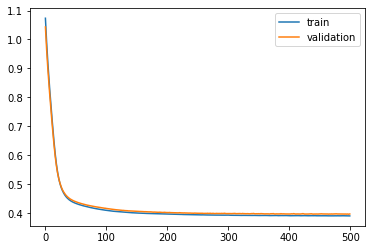

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 30s - loss: 1.0206 - val_loss: 0.9876

Epoch 00001: val_loss improved from inf to 0.98762, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 0.9765 - val_loss: 0.9456

Epoch 00002: val_loss improved from 0.98762 to 0.94561, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9355 - val_loss: 0.9070

Epoch 00003: val_loss improved from 0.94561 to 0.90696, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.8975 - val_loss: 0.8713

Epoch 00004: val_loss improved from 0.90696 to 0.87127, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8621 - val_loss: 0.8378

Epoch 00005: val_loss improved from 0.87127 to 0.83783, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8290 - val_loss: 0.8062

Epoch 00006: val_loss improved from 0.83783 to 0.80621, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7977 - val_loss: 0.7761

Epoch 00007: val_loss improved from 0.80621

 - 1s - loss: 0.4241 - val_loss: 0.4228

Epoch 00058: val_loss improved from 0.42329 to 0.42277, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4235 - val_loss: 0.4222

Epoch 00059: val_loss improved from 0.42277 to 0.42224, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4230 - val_loss: 0.4216

Epoch 00060: val_loss improved from 0.42224 to 0.42163, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4224 - val_loss: 0.4211

Epoch 00061: val_loss improved from 0.42163 to 0.42111, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4220 - val_loss: 0.4207

Epoch 00062: val_loss improved from 0.42111 to 0.42075, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4215 - val_loss: 0.4202

Epoch 00063: val_loss improved from 0.42075 to 0.42019, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4210 - val_loss: 0.4197

Epoch 00064: val_loss improved from 0.42019 to 0.41975, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.4057 - val_loss: 0.4058

Epoch 00116: val_loss improved from 0.40589 to 0.40581, saving model to val_weights2.hdf5
Epoch 117/500
 - 1s - loss: 0.4056 - val_loss: 0.4058

Epoch 00117: val_loss improved from 0.40581 to 0.40579, saving model to val_weights2.hdf5
Epoch 118/500
 - 1s - loss: 0.4054 - val_loss: 0.4056

Epoch 00118: val_loss improved from 0.40579 to 0.40563, saving model to val_weights2.hdf5
Epoch 119/500
 - 1s - loss: 0.4053 - val_loss: 0.4054

Epoch 00119: val_loss improved from 0.40563 to 0.40544, saving model to val_weights2.hdf5
Epoch 120/500
 - 1s - loss: 0.4051 - val_loss: 0.4054

Epoch 00120: val_loss improved from 0.40544 to 0.40538, saving model to val_weights2.hdf5
Epoch 121/500
 - 1s - loss: 0.4049 - val_loss: 0.4052

Epoch 00121: val_loss improved from 0.40538 to 0.40516, saving model to val_weights2.hdf5
Epoch 122/500
 - 1s - loss: 0.4048 - val_loss: 0.4050

Epoch 00122: val_loss improved from 0.40516 to 0.40502, saving model to val_weights2.hdf5


Epoch 00178: val_loss improved from 0.39830 to 0.39824, saving model to val_weights2.hdf5
Epoch 179/500
 - 1s - loss: 0.3979 - val_loss: 0.3982

Epoch 00179: val_loss improved from 0.39824 to 0.39817, saving model to val_weights2.hdf5
Epoch 180/500
 - 1s - loss: 0.3979 - val_loss: 0.3982

Epoch 00180: val_loss improved from 0.39817 to 0.39816, saving model to val_weights2.hdf5
Epoch 181/500
 - 1s - loss: 0.3978 - val_loss: 0.3983

Epoch 00181: val_loss did not improve from 0.39816
Epoch 182/500
 - 1s - loss: 0.3976 - val_loss: 0.3980

Epoch 00182: val_loss improved from 0.39816 to 0.39797, saving model to val_weights2.hdf5
Epoch 183/500
 - 1s - loss: 0.3975 - val_loss: 0.3980

Epoch 00183: val_loss did not improve from 0.39797
Epoch 184/500
 - 1s - loss: 0.3975 - val_loss: 0.3978

Epoch 00184: val_loss improved from 0.39797 to 0.39779, saving model to val_weights2.hdf5
Epoch 185/500
 - 1s - loss: 0.3974 - val_loss: 0.3974

Epoch 00185: val_loss improved from 0.39779 to 0.39736, saving

 - 1s - loss: 0.3941 - val_loss: 0.3945

Epoch 00247: val_loss improved from 0.39472 to 0.39451, saving model to val_weights2.hdf5
Epoch 248/500
 - 1s - loss: 0.3940 - val_loss: 0.3943

Epoch 00248: val_loss improved from 0.39451 to 0.39428, saving model to val_weights2.hdf5
Epoch 249/500
 - 1s - loss: 0.3940 - val_loss: 0.3946

Epoch 00249: val_loss did not improve from 0.39428
Epoch 250/500
 - 1s - loss: 0.3941 - val_loss: 0.3948

Epoch 00250: val_loss did not improve from 0.39428
Epoch 251/500
 - 1s - loss: 0.3942 - val_loss: 0.3948

Epoch 00251: val_loss did not improve from 0.39428
Epoch 252/500
 - 1s - loss: 0.3944 - val_loss: 0.3946

Epoch 00252: val_loss did not improve from 0.39428
Epoch 253/500
 - 1s - loss: 0.3943 - val_loss: 0.3943

Epoch 00253: val_loss did not improve from 0.39428
Epoch 254/500
 - 1s - loss: 0.3940 - val_loss: 0.3947

Epoch 00254: val_loss did not improve from 0.39428
Epoch 255/500
 - 1s - loss: 0.3939 - val_loss: 0.3948

Epoch 00255: val_loss did not imp

 - 1s - loss: 0.3930 - val_loss: 0.3935

Epoch 00320: val_loss did not improve from 0.39302
Epoch 321/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00321: val_loss did not improve from 0.39302
Epoch 322/500
 - 1s - loss: 0.3927 - val_loss: 0.3938

Epoch 00322: val_loss did not improve from 0.39302
Epoch 323/500
 - 1s - loss: 0.3926 - val_loss: 0.3937

Epoch 00323: val_loss did not improve from 0.39302
Epoch 324/500
 - 1s - loss: 0.3925 - val_loss: 0.3934

Epoch 00324: val_loss did not improve from 0.39302
Epoch 325/500
 - 1s - loss: 0.3925 - val_loss: 0.3932

Epoch 00325: val_loss did not improve from 0.39302
Epoch 326/500
 - 1s - loss: 0.3924 - val_loss: 0.3930

Epoch 00326: val_loss improved from 0.39302 to 0.39299, saving model to val_weights2.hdf5
Epoch 327/500
 - 1s - loss: 0.3925 - val_loss: 0.3931

Epoch 00327: val_loss did not improve from 0.39299
Epoch 328/500
 - 1s - loss: 0.3926 - val_loss: 0.3936

Epoch 00328: val_loss did not improve from 0.39299
Epoch 329/500
 - 1s -

 - 1s - loss: 0.3917 - val_loss: 0.3927

Epoch 00395: val_loss did not improve from 0.39240
Epoch 396/500
 - 1s - loss: 0.3917 - val_loss: 0.3927

Epoch 00396: val_loss did not improve from 0.39240
Epoch 397/500
 - 1s - loss: 0.3916 - val_loss: 0.3924

Epoch 00397: val_loss improved from 0.39240 to 0.39239, saving model to val_weights2.hdf5
Epoch 398/500
 - 1s - loss: 0.3916 - val_loss: 0.3926

Epoch 00398: val_loss did not improve from 0.39239
Epoch 399/500
 - 1s - loss: 0.3917 - val_loss: 0.3933

Epoch 00399: val_loss did not improve from 0.39239
Epoch 400/500
 - 1s - loss: 0.3918 - val_loss: 0.3927

Epoch 00400: val_loss did not improve from 0.39239
Epoch 401/500
 - 1s - loss: 0.3919 - val_loss: 0.3931

Epoch 00401: val_loss did not improve from 0.39239
Epoch 402/500
 - 1s - loss: 0.3920 - val_loss: 0.3929

Epoch 00402: val_loss did not improve from 0.39239
Epoch 403/500
 - 1s - loss: 0.3922 - val_loss: 0.3926

Epoch 00403: val_loss did not improve from 0.39239
Epoch 404/500
 - 1s -

 - 1s - loss: 0.3914 - val_loss: 0.3926

Epoch 00471: val_loss did not improve from 0.39199
Epoch 472/500
 - 1s - loss: 0.3912 - val_loss: 0.3928

Epoch 00472: val_loss did not improve from 0.39199
Epoch 473/500
 - 1s - loss: 0.3912 - val_loss: 0.3923

Epoch 00473: val_loss did not improve from 0.39199
Epoch 474/500
 - 1s - loss: 0.3912 - val_loss: 0.3926

Epoch 00474: val_loss did not improve from 0.39199
Epoch 475/500
 - 1s - loss: 0.3911 - val_loss: 0.3924

Epoch 00475: val_loss did not improve from 0.39199
Epoch 476/500
 - 1s - loss: 0.3910 - val_loss: 0.3920

Epoch 00476: val_loss improved from 0.39199 to 0.39197, saving model to val_weights2.hdf5
Epoch 477/500
 - 1s - loss: 0.3911 - val_loss: 0.3926

Epoch 00477: val_loss did not improve from 0.39197
Epoch 478/500
 - 1s - loss: 0.3912 - val_loss: 0.3926

Epoch 00478: val_loss did not improve from 0.39197
Epoch 479/500
 - 1s - loss: 0.3912 - val_loss: 0.3927

Epoch 00479: val_loss did not improve from 0.39197
Epoch 480/500
 - 1s -

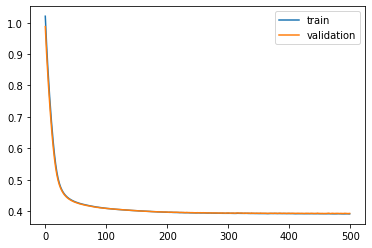

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 14s - loss: 1.0661 - val_loss: 1.0290

Epoch 00001: val_loss improved from inf to 1.02901, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0206 - val_loss: 0.9859

Epoch 00002: val_loss improved from 1.02901 to 0.98587, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9781 - val_loss: 0.9458

Epoch 00003: val_loss improved from 0.98587 to 0.94576, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9380 - val_loss: 0.9079

Epoch 00004: val_loss improved from 0.94576 to 0.90793, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8998 - val_loss: 0.8715

Epoch 00005: val_loss improved from 0.90793 to 0.87154, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8633 - val_loss: 0.8367

Epoch 00006: val_loss improved from 0.87154 to 0.83673, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.8287 - val_loss: 0.8037

Epoch 00007: val_loss improved from 0.83673

 - 1s - loss: 0.4188 - val_loss: 0.4271

Epoch 00058: val_loss improved from 0.42762 to 0.42706, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4183 - val_loss: 0.4263

Epoch 00059: val_loss improved from 0.42706 to 0.42634, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4178 - val_loss: 0.4259

Epoch 00060: val_loss improved from 0.42634 to 0.42589, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4173 - val_loss: 0.4256

Epoch 00061: val_loss improved from 0.42589 to 0.42557, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4168 - val_loss: 0.4249

Epoch 00062: val_loss improved from 0.42557 to 0.42490, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4164 - val_loss: 0.4245

Epoch 00063: val_loss improved from 0.42490 to 0.42454, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4159 - val_loss: 0.4243

Epoch 00064: val_loss improved from 0.42454 to 0.42426, saving model to val_weights3.hdf5
Epoch


Epoch 00115: val_loss improved from 0.41139 to 0.41115, saving model to val_weights3.hdf5
Epoch 116/500
 - 1s - loss: 0.4014 - val_loss: 0.4110

Epoch 00116: val_loss improved from 0.41115 to 0.41099, saving model to val_weights3.hdf5
Epoch 117/500
 - 1s - loss: 0.4011 - val_loss: 0.4106

Epoch 00117: val_loss improved from 0.41099 to 0.41065, saving model to val_weights3.hdf5
Epoch 118/500
 - 1s - loss: 0.4010 - val_loss: 0.4107

Epoch 00118: val_loss did not improve from 0.41065
Epoch 119/500
 - 1s - loss: 0.4010 - val_loss: 0.4106

Epoch 00119: val_loss improved from 0.41065 to 0.41065, saving model to val_weights3.hdf5
Epoch 120/500
 - 1s - loss: 0.4007 - val_loss: 0.4104

Epoch 00120: val_loss improved from 0.41065 to 0.41041, saving model to val_weights3.hdf5
Epoch 121/500
 - 1s - loss: 0.4005 - val_loss: 0.4103

Epoch 00121: val_loss improved from 0.41041 to 0.41025, saving model to val_weights3.hdf5
Epoch 122/500
 - 1s - loss: 0.4003 - val_loss: 0.4099

Epoch 00122: val_loss i

 - 1s - loss: 0.3949 - val_loss: 0.4053

Epoch 00179: val_loss did not improve from 0.40498
Epoch 180/500
 - 1s - loss: 0.3949 - val_loss: 0.4047

Epoch 00180: val_loss improved from 0.40498 to 0.40475, saving model to val_weights3.hdf5
Epoch 181/500
 - 1s - loss: 0.3947 - val_loss: 0.4051

Epoch 00181: val_loss did not improve from 0.40475
Epoch 182/500
 - 1s - loss: 0.3948 - val_loss: 0.4049

Epoch 00182: val_loss did not improve from 0.40475
Epoch 183/500
 - 1s - loss: 0.3946 - val_loss: 0.4050

Epoch 00183: val_loss did not improve from 0.40475
Epoch 184/500
 - 1s - loss: 0.3947 - val_loss: 0.4048

Epoch 00184: val_loss did not improve from 0.40475
Epoch 185/500
 - 1s - loss: 0.3947 - val_loss: 0.4049

Epoch 00185: val_loss did not improve from 0.40475
Epoch 186/500
 - 1s - loss: 0.3947 - val_loss: 0.4048

Epoch 00186: val_loss did not improve from 0.40475
Epoch 187/500
 - 1s - loss: 0.3947 - val_loss: 0.4047

Epoch 00187: val_loss improved from 0.40475 to 0.40467, saving model to 

 - 1s - loss: 0.3927 - val_loss: 0.4031

Epoch 00251: val_loss did not improve from 0.40262
Epoch 252/500
 - 1s - loss: 0.3929 - val_loss: 0.4028

Epoch 00252: val_loss did not improve from 0.40262
Epoch 253/500
 - 1s - loss: 0.3929 - val_loss: 0.4029

Epoch 00253: val_loss did not improve from 0.40262
Epoch 254/500
 - 1s - loss: 0.3928 - val_loss: 0.4027

Epoch 00254: val_loss did not improve from 0.40262
Epoch 255/500
 - 1s - loss: 0.3928 - val_loss: 0.4023

Epoch 00255: val_loss improved from 0.40262 to 0.40233, saving model to val_weights3.hdf5
Epoch 256/500
 - 1s - loss: 0.3927 - val_loss: 0.4026

Epoch 00256: val_loss did not improve from 0.40233
Epoch 257/500
 - 1s - loss: 0.3926 - val_loss: 0.4028

Epoch 00257: val_loss did not improve from 0.40233
Epoch 258/500
 - 1s - loss: 0.3925 - val_loss: 0.4026

Epoch 00258: val_loss did not improve from 0.40233
Epoch 259/500
 - 1s - loss: 0.3923 - val_loss: 0.4029

Epoch 00259: val_loss did not improve from 0.40233
Epoch 260/500
 - 1s -

 - 1s - loss: 0.3917 - val_loss: 0.4020

Epoch 00326: val_loss did not improve from 0.40175
Epoch 327/500
 - 1s - loss: 0.3917 - val_loss: 0.4017

Epoch 00327: val_loss improved from 0.40175 to 0.40172, saving model to val_weights3.hdf5
Epoch 328/500
 - 1s - loss: 0.3915 - val_loss: 0.4016

Epoch 00328: val_loss improved from 0.40172 to 0.40162, saving model to val_weights3.hdf5
Epoch 329/500
 - 1s - loss: 0.3916 - val_loss: 0.4016

Epoch 00329: val_loss did not improve from 0.40162
Epoch 330/500
 - 1s - loss: 0.3914 - val_loss: 0.4017

Epoch 00330: val_loss did not improve from 0.40162
Epoch 331/500
 - 1s - loss: 0.3913 - val_loss: 0.4020

Epoch 00331: val_loss did not improve from 0.40162
Epoch 332/500
 - 1s - loss: 0.3912 - val_loss: 0.4020

Epoch 00332: val_loss did not improve from 0.40162
Epoch 333/500
 - 1s - loss: 0.3912 - val_loss: 0.4018

Epoch 00333: val_loss did not improve from 0.40162
Epoch 334/500
 - 1s - loss: 0.3911 - val_loss: 0.4019

Epoch 00334: val_loss did not imp


Epoch 00400: val_loss did not improve from 0.40096
Epoch 401/500
 - 1s - loss: 0.3907 - val_loss: 0.4010

Epoch 00401: val_loss did not improve from 0.40096
Epoch 402/500
 - 1s - loss: 0.3906 - val_loss: 0.4011

Epoch 00402: val_loss did not improve from 0.40096
Epoch 403/500
 - 1s - loss: 0.3905 - val_loss: 0.4011

Epoch 00403: val_loss did not improve from 0.40096
Epoch 404/500
 - 1s - loss: 0.3904 - val_loss: 0.4014

Epoch 00404: val_loss did not improve from 0.40096
Epoch 405/500
 - 1s - loss: 0.3904 - val_loss: 0.4014

Epoch 00405: val_loss did not improve from 0.40096
Epoch 406/500
 - 1s - loss: 0.3904 - val_loss: 0.4010

Epoch 00406: val_loss did not improve from 0.40096
Epoch 407/500
 - 1s - loss: 0.3903 - val_loss: 0.4013

Epoch 00407: val_loss did not improve from 0.40096
Epoch 408/500
 - 1s - loss: 0.3904 - val_loss: 0.4009

Epoch 00408: val_loss improved from 0.40096 to 0.40085, saving model to val_weights3.hdf5
Epoch 409/500
 - 1s - loss: 0.3904 - val_loss: 0.4013

Epoch 

 - 1s - loss: 0.3900 - val_loss: 0.4009

Epoch 00475: val_loss did not improve from 0.40052
Epoch 476/500
 - 1s - loss: 0.3900 - val_loss: 0.4009

Epoch 00476: val_loss did not improve from 0.40052
Epoch 477/500
 - 1s - loss: 0.3900 - val_loss: 0.4007

Epoch 00477: val_loss did not improve from 0.40052
Epoch 478/500
 - 1s - loss: 0.3901 - val_loss: 0.4009

Epoch 00478: val_loss did not improve from 0.40052
Epoch 479/500
 - 1s - loss: 0.3900 - val_loss: 0.4003

Epoch 00479: val_loss improved from 0.40052 to 0.40030, saving model to val_weights3.hdf5
Epoch 480/500
 - 1s - loss: 0.3899 - val_loss: 0.4006

Epoch 00480: val_loss did not improve from 0.40030
Epoch 481/500
 - 1s - loss: 0.3898 - val_loss: 0.4005

Epoch 00481: val_loss did not improve from 0.40030
Epoch 482/500
 - 1s - loss: 0.3898 - val_loss: 0.4007

Epoch 00482: val_loss did not improve from 0.40030
Epoch 483/500
 - 1s - loss: 0.3896 - val_loss: 0.4007

Epoch 00483: val_loss did not improve from 0.40030
Epoch 484/500
 - 1s -

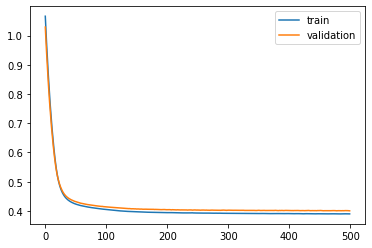

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 25s - loss: 1.0455 - val_loss: 1.0190

Epoch 00001: val_loss improved from inf to 1.01901, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0129 - val_loss: 0.9874

Epoch 00002: val_loss improved from 1.01901 to 0.98744, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9822 - val_loss: 0.9574

Epoch 00003: val_loss improved from 0.98744 to 0.95736, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9531 - val_loss: 0.9289

Epoch 00004: val_loss improved from 0.95736 to 0.92890, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.9255 - val_loss: 0.9017

Epoch 00005: val_loss improved from 0.92890 to 0.90169, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8991 - val_loss: 0.8756

Epoch 00006: val_loss improved from 0.90169 to 0.87556, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.8737 - val_loss: 0.8504

Epoch 00007: val_loss improved from 0.87556

 - 1s - loss: 0.4373 - val_loss: 0.4325

Epoch 00058: val_loss improved from 0.43324 to 0.43245, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4363 - val_loss: 0.4315

Epoch 00059: val_loss improved from 0.43245 to 0.43149, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4353 - val_loss: 0.4306

Epoch 00060: val_loss improved from 0.43149 to 0.43058, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4344 - val_loss: 0.4295

Epoch 00061: val_loss improved from 0.43058 to 0.42953, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4335 - val_loss: 0.4289

Epoch 00062: val_loss improved from 0.42953 to 0.42891, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4327 - val_loss: 0.4282

Epoch 00063: val_loss improved from 0.42891 to 0.42822, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4319 - val_loss: 0.4274

Epoch 00064: val_loss improved from 0.42822 to 0.42736, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.4110 - val_loss: 0.4089

Epoch 00115: val_loss improved from 0.40925 to 0.40886, saving model to val_weights4.hdf5
Epoch 116/500
 - 1s - loss: 0.4106 - val_loss: 0.4086

Epoch 00116: val_loss improved from 0.40886 to 0.40862, saving model to val_weights4.hdf5
Epoch 117/500
 - 1s - loss: 0.4104 - val_loss: 0.4082

Epoch 00117: val_loss improved from 0.40862 to 0.40821, saving model to val_weights4.hdf5
Epoch 118/500
 - 1s - loss: 0.4101 - val_loss: 0.4082

Epoch 00118: val_loss improved from 0.40821 to 0.40818, saving model to val_weights4.hdf5
Epoch 119/500
 - 1s - loss: 0.4099 - val_loss: 0.4079

Epoch 00119: val_loss improved from 0.40818 to 0.40792, saving model to val_weights4.hdf5
Epoch 120/500
 - 1s - loss: 0.4097 - val_loss: 0.4078

Epoch 00120: val_loss improved from 0.40792 to 0.40781, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.4095 - val_loss: 0.4073

Epoch 00121: val_loss improved from 0.40781 to 0.40733, saving model to val_weights4.hdf5

 - 1s - loss: 0.4011 - val_loss: 0.3990

Epoch 00175: val_loss improved from 0.39902 to 0.39900, saving model to val_weights4.hdf5
Epoch 176/500
 - 1s - loss: 0.4010 - val_loss: 0.3992

Epoch 00176: val_loss did not improve from 0.39900
Epoch 177/500
 - 1s - loss: 0.4010 - val_loss: 0.3994

Epoch 00177: val_loss did not improve from 0.39900
Epoch 178/500
 - 1s - loss: 0.4010 - val_loss: 0.3993

Epoch 00178: val_loss did not improve from 0.39900
Epoch 179/500
 - 1s - loss: 0.4009 - val_loss: 0.3990

Epoch 00179: val_loss did not improve from 0.39900
Epoch 180/500
 - 1s - loss: 0.4007 - val_loss: 0.3990

Epoch 00180: val_loss improved from 0.39900 to 0.39899, saving model to val_weights4.hdf5
Epoch 181/500
 - 1s - loss: 0.4006 - val_loss: 0.3985

Epoch 00181: val_loss improved from 0.39899 to 0.39850, saving model to val_weights4.hdf5
Epoch 182/500
 - 1s - loss: 0.4005 - val_loss: 0.3983

Epoch 00182: val_loss improved from 0.39850 to 0.39828, saving model to val_weights4.hdf5
Epoch 183/


Epoch 00245: val_loss improved from 0.39557 to 0.39551, saving model to val_weights4.hdf5
Epoch 246/500
 - 1s - loss: 0.3970 - val_loss: 0.3959

Epoch 00246: val_loss did not improve from 0.39551
Epoch 247/500
 - 1s - loss: 0.3969 - val_loss: 0.3959

Epoch 00247: val_loss did not improve from 0.39551
Epoch 248/500
 - 1s - loss: 0.3967 - val_loss: 0.3958

Epoch 00248: val_loss did not improve from 0.39551
Epoch 249/500
 - 1s - loss: 0.3967 - val_loss: 0.3959

Epoch 00249: val_loss did not improve from 0.39551
Epoch 250/500
 - 1s - loss: 0.3968 - val_loss: 0.3957

Epoch 00250: val_loss did not improve from 0.39551
Epoch 251/500
 - 1s - loss: 0.3968 - val_loss: 0.3959

Epoch 00251: val_loss did not improve from 0.39551
Epoch 252/500
 - 1s - loss: 0.3968 - val_loss: 0.3958

Epoch 00252: val_loss did not improve from 0.39551
Epoch 253/500
 - 1s - loss: 0.3968 - val_loss: 0.3958

Epoch 00253: val_loss did not improve from 0.39551
Epoch 254/500
 - 1s - loss: 0.3968 - val_loss: 0.3962

Epoch 

 - 1s - loss: 0.3955 - val_loss: 0.3949

Epoch 00318: val_loss did not improve from 0.39426
Epoch 319/500
 - 1s - loss: 0.3955 - val_loss: 0.3949

Epoch 00319: val_loss did not improve from 0.39426
Epoch 320/500
 - 1s - loss: 0.3956 - val_loss: 0.3952

Epoch 00320: val_loss did not improve from 0.39426
Epoch 321/500
 - 1s - loss: 0.3956 - val_loss: 0.3951

Epoch 00321: val_loss did not improve from 0.39426
Epoch 322/500
 - 1s - loss: 0.3955 - val_loss: 0.3953

Epoch 00322: val_loss did not improve from 0.39426
Epoch 323/500
 - 1s - loss: 0.3955 - val_loss: 0.3954

Epoch 00323: val_loss did not improve from 0.39426
Epoch 324/500
 - 1s - loss: 0.3956 - val_loss: 0.3952

Epoch 00324: val_loss did not improve from 0.39426
Epoch 325/500
 - 1s - loss: 0.3954 - val_loss: 0.3949

Epoch 00325: val_loss did not improve from 0.39426
Epoch 326/500
 - 1s - loss: 0.3953 - val_loss: 0.3948

Epoch 00326: val_loss did not improve from 0.39426
Epoch 327/500
 - 1s - loss: 0.3953 - val_loss: 0.3946

Epoch


Epoch 00392: val_loss improved from 0.39378 to 0.39373, saving model to val_weights4.hdf5
Epoch 393/500
 - 1s - loss: 0.3940 - val_loss: 0.3943

Epoch 00393: val_loss did not improve from 0.39373
Epoch 394/500
 - 1s - loss: 0.3940 - val_loss: 0.3938

Epoch 00394: val_loss did not improve from 0.39373
Epoch 395/500
 - 1s - loss: 0.3941 - val_loss: 0.3939

Epoch 00395: val_loss did not improve from 0.39373
Epoch 396/500
 - 1s - loss: 0.3941 - val_loss: 0.3940

Epoch 00396: val_loss did not improve from 0.39373
Epoch 397/500
 - 1s - loss: 0.3941 - val_loss: 0.3941

Epoch 00397: val_loss did not improve from 0.39373
Epoch 398/500
 - 1s - loss: 0.3940 - val_loss: 0.3937

Epoch 00398: val_loss improved from 0.39373 to 0.39371, saving model to val_weights4.hdf5
Epoch 399/500
 - 1s - loss: 0.3940 - val_loss: 0.3941

Epoch 00399: val_loss did not improve from 0.39371
Epoch 400/500
 - 1s - loss: 0.3940 - val_loss: 0.3939

Epoch 00400: val_loss did not improve from 0.39371
Epoch 401/500
 - 1s - 

 - 1s - loss: 0.3934 - val_loss: 0.3932

Epoch 00467: val_loss did not improve from 0.39321
Epoch 468/500
 - 1s - loss: 0.3935 - val_loss: 0.3941

Epoch 00468: val_loss did not improve from 0.39321
Epoch 469/500
 - 1s - loss: 0.3938 - val_loss: 0.3939

Epoch 00469: val_loss did not improve from 0.39321
Epoch 470/500
 - 1s - loss: 0.3934 - val_loss: 0.3932

Epoch 00470: val_loss improved from 0.39321 to 0.39315, saving model to val_weights4.hdf5
Epoch 471/500
 - 1s - loss: 0.3934 - val_loss: 0.3937

Epoch 00471: val_loss did not improve from 0.39315
Epoch 472/500
 - 1s - loss: 0.3931 - val_loss: 0.3933

Epoch 00472: val_loss did not improve from 0.39315
Epoch 473/500
 - 1s - loss: 0.3931 - val_loss: 0.3933

Epoch 00473: val_loss did not improve from 0.39315
Epoch 474/500
 - 1s - loss: 0.3932 - val_loss: 0.3933

Epoch 00474: val_loss did not improve from 0.39315
Epoch 475/500
 - 1s - loss: 0.3933 - val_loss: 0.3941

Epoch 00475: val_loss did not improve from 0.39315
Epoch 476/500
 - 1s -

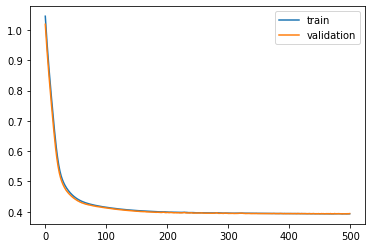

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 31s - loss: 1.1466 - val_loss: 1.1087

Epoch 00001: val_loss improved from inf to 1.10867, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0904 - val_loss: 1.0573

Epoch 00002: val_loss improved from 1.10867 to 1.05728, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0407 - val_loss: 1.0115

Epoch 00003: val_loss improved from 1.05728 to 1.01146, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9958 - val_loss: 0.9697

Epoch 00004: val_loss improved from 1.01146 to 0.96973, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.9548 - val_loss: 0.9314

Epoch 00005: val_loss improved from 0.96973 to 0.93139, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.9172 - val_loss: 0.8957

Epoch 00006: val_loss improved from 0.93139 to 0.89574, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.8822 - val_loss: 0.8624

Epoch 00007: val_loss improved from 0.89574

 - 1s - loss: 0.4196 - val_loss: 0.4219

Epoch 00058: val_loss improved from 0.42232 to 0.42190, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4191 - val_loss: 0.4214

Epoch 00059: val_loss improved from 0.42190 to 0.42142, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4186 - val_loss: 0.4211

Epoch 00060: val_loss improved from 0.42142 to 0.42110, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4182 - val_loss: 0.4208

Epoch 00061: val_loss improved from 0.42110 to 0.42082, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4178 - val_loss: 0.4204

Epoch 00062: val_loss improved from 0.42082 to 0.42036, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4174 - val_loss: 0.4201

Epoch 00063: val_loss improved from 0.42036 to 0.42007, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4170 - val_loss: 0.4197

Epoch 00064: val_loss improved from 0.42007 to 0.41972, saving model to val_weights5.hdf5
Epoch

 - 1s - loss: 0.4036 - val_loss: 0.4091

Epoch 00116: val_loss improved from 0.40922 to 0.40910, saving model to val_weights5.hdf5
Epoch 117/500
 - 1s - loss: 0.4035 - val_loss: 0.4091

Epoch 00117: val_loss did not improve from 0.40910
Epoch 118/500
 - 1s - loss: 0.4034 - val_loss: 0.4090

Epoch 00118: val_loss improved from 0.40910 to 0.40899, saving model to val_weights5.hdf5
Epoch 119/500
 - 1s - loss: 0.4033 - val_loss: 0.4088

Epoch 00119: val_loss improved from 0.40899 to 0.40884, saving model to val_weights5.hdf5
Epoch 120/500
 - 1s - loss: 0.4030 - val_loss: 0.4086

Epoch 00120: val_loss improved from 0.40884 to 0.40860, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.4028 - val_loss: 0.4087

Epoch 00121: val_loss did not improve from 0.40860
Epoch 122/500
 - 1s - loss: 0.4027 - val_loss: 0.4088

Epoch 00122: val_loss did not improve from 0.40860
Epoch 123/500
 - 1s - loss: 0.4026 - val_loss: 0.4082

Epoch 00123: val_loss improved from 0.40860 to 0.40824, savin


Epoch 00180: val_loss did not improve from 0.40354
Epoch 181/500
 - 1s - loss: 0.3966 - val_loss: 0.4034

Epoch 00181: val_loss improved from 0.40354 to 0.40337, saving model to val_weights5.hdf5
Epoch 182/500
 - 1s - loss: 0.3965 - val_loss: 0.4035

Epoch 00182: val_loss did not improve from 0.40337
Epoch 183/500
 - 1s - loss: 0.3963 - val_loss: 0.4035

Epoch 00183: val_loss did not improve from 0.40337
Epoch 184/500
 - 1s - loss: 0.3964 - val_loss: 0.4039

Epoch 00184: val_loss did not improve from 0.40337
Epoch 185/500
 - 1s - loss: 0.3966 - val_loss: 0.4038

Epoch 00185: val_loss did not improve from 0.40337
Epoch 186/500
 - 1s - loss: 0.3966 - val_loss: 0.4037

Epoch 00186: val_loss did not improve from 0.40337
Epoch 187/500
 - 1s - loss: 0.3966 - val_loss: 0.4032

Epoch 00187: val_loss improved from 0.40337 to 0.40325, saving model to val_weights5.hdf5
Epoch 188/500
 - 1s - loss: 0.3967 - val_loss: 0.4035

Epoch 00188: val_loss did not improve from 0.40325
Epoch 189/500
 - 1s - 


Epoch 00253: val_loss did not improve from 0.40105
Epoch 254/500
 - 1s - loss: 0.3946 - val_loss: 0.4012

Epoch 00254: val_loss did not improve from 0.40105
Epoch 255/500
 - 1s - loss: 0.3946 - val_loss: 0.4011

Epoch 00255: val_loss did not improve from 0.40105
Epoch 256/500
 - 1s - loss: 0.3945 - val_loss: 0.4014

Epoch 00256: val_loss did not improve from 0.40105
Epoch 257/500
 - 1s - loss: 0.3944 - val_loss: 0.4016

Epoch 00257: val_loss did not improve from 0.40105
Epoch 258/500
 - 1s - loss: 0.3943 - val_loss: 0.4018

Epoch 00258: val_loss did not improve from 0.40105
Epoch 259/500
 - 1s - loss: 0.3942 - val_loss: 0.4013

Epoch 00259: val_loss did not improve from 0.40105
Epoch 260/500
 - 1s - loss: 0.3941 - val_loss: 0.4010

Epoch 00260: val_loss improved from 0.40105 to 0.40095, saving model to val_weights5.hdf5
Epoch 261/500
 - 1s - loss: 0.3938 - val_loss: 0.4007

Epoch 00261: val_loss improved from 0.40095 to 0.40070, saving model to val_weights5.hdf5
Epoch 262/500
 - 1s - 

 - 1s - loss: 0.3931 - val_loss: 0.4000

Epoch 00327: val_loss improved from 0.40016 to 0.39998, saving model to val_weights5.hdf5
Epoch 328/500
 - 1s - loss: 0.3929 - val_loss: 0.4002

Epoch 00328: val_loss did not improve from 0.39998
Epoch 329/500
 - 1s - loss: 0.3928 - val_loss: 0.4003

Epoch 00329: val_loss did not improve from 0.39998
Epoch 330/500
 - 1s - loss: 0.3927 - val_loss: 0.4006

Epoch 00330: val_loss did not improve from 0.39998
Epoch 331/500
 - 1s - loss: 0.3927 - val_loss: 0.4008

Epoch 00331: val_loss did not improve from 0.39998
Epoch 332/500
 - 1s - loss: 0.3927 - val_loss: 0.4005

Epoch 00332: val_loss did not improve from 0.39998
Epoch 333/500
 - 1s - loss: 0.3928 - val_loss: 0.4010

Epoch 00333: val_loss did not improve from 0.39998
Epoch 334/500
 - 1s - loss: 0.3927 - val_loss: 0.4007

Epoch 00334: val_loss did not improve from 0.39998
Epoch 335/500
 - 1s - loss: 0.3928 - val_loss: 0.4002

Epoch 00335: val_loss did not improve from 0.39998
Epoch 336/500
 - 1s -


Epoch 00402: val_loss did not improve from 0.39930
Epoch 403/500
 - 1s - loss: 0.3920 - val_loss: 0.3998

Epoch 00403: val_loss did not improve from 0.39930
Epoch 404/500
 - 1s - loss: 0.3920 - val_loss: 0.3999

Epoch 00404: val_loss did not improve from 0.39930
Epoch 405/500
 - 1s - loss: 0.3921 - val_loss: 0.4000

Epoch 00405: val_loss did not improve from 0.39930
Epoch 406/500
 - 1s - loss: 0.3922 - val_loss: 0.4001

Epoch 00406: val_loss did not improve from 0.39930
Epoch 407/500
 - 1s - loss: 0.3924 - val_loss: 0.4000

Epoch 00407: val_loss did not improve from 0.39930
Epoch 408/500
 - 1s - loss: 0.3925 - val_loss: 0.3995

Epoch 00408: val_loss did not improve from 0.39930
Epoch 409/500
 - 1s - loss: 0.3926 - val_loss: 0.3997

Epoch 00409: val_loss did not improve from 0.39930
Epoch 410/500
 - 1s - loss: 0.3928 - val_loss: 0.3993

Epoch 00410: val_loss did not improve from 0.39930
Epoch 411/500
 - 1s - loss: 0.3926 - val_loss: 0.3993

Epoch 00411: val_loss improved from 0.39930 t


Epoch 00478: val_loss did not improve from 0.39873
Epoch 479/500
 - 1s - loss: 0.3917 - val_loss: 0.3991

Epoch 00479: val_loss did not improve from 0.39873
Epoch 480/500
 - 1s - loss: 0.3915 - val_loss: 0.3988

Epoch 00480: val_loss did not improve from 0.39873
Epoch 481/500
 - 1s - loss: 0.3914 - val_loss: 0.3988

Epoch 00481: val_loss did not improve from 0.39873
Epoch 482/500
 - 1s - loss: 0.3913 - val_loss: 0.3990

Epoch 00482: val_loss did not improve from 0.39873
Epoch 483/500
 - 1s - loss: 0.3914 - val_loss: 0.3994

Epoch 00483: val_loss did not improve from 0.39873
Epoch 484/500
 - 1s - loss: 0.3915 - val_loss: 0.3992

Epoch 00484: val_loss did not improve from 0.39873
Epoch 485/500
 - 1s - loss: 0.3914 - val_loss: 0.3996

Epoch 00485: val_loss did not improve from 0.39873
Epoch 486/500
 - 1s - loss: 0.3915 - val_loss: 0.3992

Epoch 00486: val_loss did not improve from 0.39873
Epoch 487/500
 - 1s - loss: 0.3916 - val_loss: 0.3991

Epoch 00487: val_loss did not improve from 0.

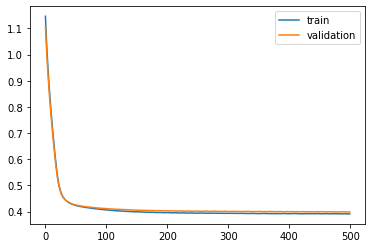

Time to train LSTM:  366.80675196647644
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 26s - loss: 1.2540 - val_loss: 1.2084

Epoch 00001: val_loss improved from inf to 1.20840, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.1820 - val_loss: 1.1393

Epoch 00002: val_loss improved from 1.20840 to 1.13926, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.1153 - val_loss: 1.0754

Epoch 00003: val_loss improved from 1.13926 to 1.07539, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 1.0535 - val_loss: 1.0162

Epoch 00004: val_loss improved from 1.07539 to 1.01620, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.9958 - val_loss: 0.9610

Epoch 00005: val_loss improved from 1.01620 to 0.96096, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.9418 - val_loss: 0.9091

Epoch 00006: val_loss improved from 0.96096 to 0.90914, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.8910 - val_loss: 0.8607

Epo


Epoch 00057: val_loss improved from 0.41273 to 0.41215, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4055 - val_loss: 0.4115

Epoch 00058: val_loss improved from 0.41215 to 0.41155, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4051 - val_loss: 0.4109

Epoch 00059: val_loss improved from 0.41155 to 0.41090, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4047 - val_loss: 0.4108

Epoch 00060: val_loss improved from 0.41090 to 0.41085, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4043 - val_loss: 0.4106

Epoch 00061: val_loss improved from 0.41085 to 0.41064, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4040 - val_loss: 0.4101

Epoch 00062: val_loss improved from 0.41064 to 0.41011, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4035 - val_loss: 0.4095

Epoch 00063: val_loss improved from 0.41011 to 0.40950, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4030 - val_loss:


Epoch 00123: val_loss did not improve from 0.40195
Epoch 124/500
 - 1s - loss: 0.3922 - val_loss: 0.4015

Epoch 00124: val_loss improved from 0.40195 to 0.40154, saving model to val_weights1.hdf5
Epoch 125/500
 - 1s - loss: 0.3922 - val_loss: 0.4019

Epoch 00125: val_loss did not improve from 0.40154
Epoch 126/500
 - 1s - loss: 0.3922 - val_loss: 0.4016

Epoch 00126: val_loss did not improve from 0.40154
Epoch 127/500
 - 1s - loss: 0.3922 - val_loss: 0.4024

Epoch 00127: val_loss did not improve from 0.40154
Epoch 128/500
 - 1s - loss: 0.3921 - val_loss: 0.4023

Epoch 00128: val_loss did not improve from 0.40154
Epoch 129/500
 - 1s - loss: 0.3922 - val_loss: 0.4022

Epoch 00129: val_loss did not improve from 0.40154
Epoch 130/500
 - 1s - loss: 0.3922 - val_loss: 0.4020

Epoch 00130: val_loss did not improve from 0.40154
Epoch 131/500
 - 1s - loss: 0.3919 - val_loss: 0.4013

Epoch 00131: val_loss improved from 0.40154 to 0.40128, saving model to val_weights1.hdf5
Epoch 132/500
 - 1s - 

 - 1s - loss: 0.3889 - val_loss: 0.4005

Epoch 00197: val_loss did not improve from 0.39957
Epoch 198/500
 - 1s - loss: 0.3888 - val_loss: 0.4002

Epoch 00198: val_loss did not improve from 0.39957
Epoch 199/500
 - 1s - loss: 0.3888 - val_loss: 0.3996

Epoch 00199: val_loss did not improve from 0.39957
Epoch 200/500
 - 1s - loss: 0.3888 - val_loss: 0.4000

Epoch 00200: val_loss did not improve from 0.39957
Epoch 201/500
 - 1s - loss: 0.3887 - val_loss: 0.4005

Epoch 00201: val_loss did not improve from 0.39957
Epoch 202/500
 - 1s - loss: 0.3888 - val_loss: 0.4011

Epoch 00202: val_loss did not improve from 0.39957
Epoch 203/500
 - 1s - loss: 0.3890 - val_loss: 0.4013

Epoch 00203: val_loss did not improve from 0.39957
Epoch 204/500
 - 1s - loss: 0.3890 - val_loss: 0.4004

Epoch 00204: val_loss did not improve from 0.39957
Epoch 205/500
 - 1s - loss: 0.3890 - val_loss: 0.3997

Epoch 00205: val_loss did not improve from 0.39957
Epoch 206/500
 - 1s - loss: 0.3889 - val_loss: 0.3997

Epoch


Epoch 00273: val_loss did not improve from 0.39883
Epoch 274/500
 - 1s - loss: 0.3874 - val_loss: 0.3990

Epoch 00274: val_loss did not improve from 0.39883
Epoch 275/500
 - 1s - loss: 0.3875 - val_loss: 0.3999

Epoch 00275: val_loss did not improve from 0.39883
Epoch 276/500
 - 1s - loss: 0.3875 - val_loss: 0.4001

Epoch 00276: val_loss did not improve from 0.39883
Epoch 277/500
 - 1s - loss: 0.3872 - val_loss: 0.3996

Epoch 00277: val_loss did not improve from 0.39883
Epoch 278/500
 - 1s - loss: 0.3870 - val_loss: 0.3991

Epoch 00278: val_loss did not improve from 0.39883
Epoch 279/500
 - 1s - loss: 0.3870 - val_loss: 0.3989

Epoch 00279: val_loss did not improve from 0.39883
Epoch 280/500
 - 1s - loss: 0.3870 - val_loss: 0.3994

Epoch 00280: val_loss did not improve from 0.39883
Epoch 281/500
 - 1s - loss: 0.3870 - val_loss: 0.3999

Epoch 00281: val_loss did not improve from 0.39883
Epoch 282/500
 - 1s - loss: 0.3873 - val_loss: 0.4004

Epoch 00282: val_loss did not improve from 0.


Epoch 00350: val_loss did not improve from 0.39871
Epoch 351/500
 - 1s - loss: 0.3863 - val_loss: 0.3993

Epoch 00351: val_loss did not improve from 0.39871
Epoch 352/500
 - 1s - loss: 0.3865 - val_loss: 0.4000

Epoch 00352: val_loss did not improve from 0.39871
Epoch 353/500
 - 1s - loss: 0.3868 - val_loss: 0.4003

Epoch 00353: val_loss did not improve from 0.39871
Epoch 354/500
 - 1s - loss: 0.3866 - val_loss: 0.3994

Epoch 00354: val_loss did not improve from 0.39871
Epoch 355/500
 - 1s - loss: 0.3867 - val_loss: 0.3986

Epoch 00355: val_loss improved from 0.39871 to 0.39863, saving model to val_weights1.hdf5
Epoch 356/500
 - 1s - loss: 0.3865 - val_loss: 0.3986

Epoch 00356: val_loss did not improve from 0.39863
Epoch 357/500
 - 1s - loss: 0.3865 - val_loss: 0.3996

Epoch 00357: val_loss did not improve from 0.39863
Epoch 358/500
 - 1s - loss: 0.3865 - val_loss: 0.3995

Epoch 00358: val_loss did not improve from 0.39863
Epoch 359/500
 - 1s - loss: 0.3863 - val_loss: 0.3996

Epoch 

 - 1s - loss: 0.3864 - val_loss: 0.3983

Epoch 00427: val_loss improved from 0.39845 to 0.39831, saving model to val_weights1.hdf5
Epoch 428/500
 - 1s - loss: 0.3860 - val_loss: 0.3988

Epoch 00428: val_loss did not improve from 0.39831
Epoch 429/500
 - 1s - loss: 0.3860 - val_loss: 0.3994

Epoch 00429: val_loss did not improve from 0.39831
Epoch 430/500
 - 1s - loss: 0.3863 - val_loss: 0.4001

Epoch 00430: val_loss did not improve from 0.39831
Epoch 431/500
 - 1s - loss: 0.3862 - val_loss: 0.3995

Epoch 00431: val_loss did not improve from 0.39831
Epoch 432/500
 - 1s - loss: 0.3858 - val_loss: 0.3983

Epoch 00432: val_loss did not improve from 0.39831
Epoch 433/500
 - 1s - loss: 0.3856 - val_loss: 0.3990

Epoch 00433: val_loss did not improve from 0.39831
Epoch 434/500
 - 1s - loss: 0.3858 - val_loss: 0.4000

Epoch 00434: val_loss did not improve from 0.39831
Epoch 435/500
 - 1s - loss: 0.3861 - val_loss: 0.4002

Epoch 00435: val_loss did not improve from 0.39831
Epoch 436/500
 - 1s -

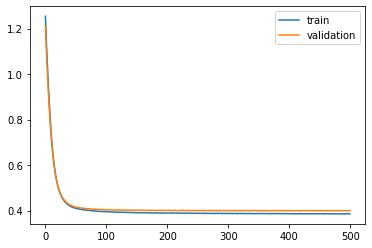

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 40s - loss: 1.3395 - val_loss: 1.2961

Epoch 00001: val_loss improved from inf to 1.29613, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.2628 - val_loss: 1.2236

Epoch 00002: val_loss improved from 1.29613 to 1.22357, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.1918 - val_loss: 1.1562

Epoch 00003: val_loss improved from 1.22357 to 1.15624, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 1.1260 - val_loss: 1.0936

Epoch 00004: val_loss improved from 1.15624 to 1.09362, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 1.0649 - val_loss: 1.0350

Epoch 00005: val_loss improved from 1.09362 to 1.03496, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 1.0080 - val_loss: 0.9798

Epoch 00006: val_loss improved from 1.03496 to 0.97983, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.9548 - val_loss: 0.9284

Epoch 00007: val_loss improved from 0.97983

 - 1s - loss: 0.4134 - val_loss: 0.4147

Epoch 00058: val_loss improved from 0.41544 to 0.41473, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4128 - val_loss: 0.4144

Epoch 00059: val_loss improved from 0.41473 to 0.41438, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4123 - val_loss: 0.4138

Epoch 00060: val_loss improved from 0.41438 to 0.41384, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4118 - val_loss: 0.4132

Epoch 00061: val_loss improved from 0.41384 to 0.41323, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4112 - val_loss: 0.4128

Epoch 00062: val_loss improved from 0.41323 to 0.41277, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4107 - val_loss: 0.4124

Epoch 00063: val_loss improved from 0.41277 to 0.41240, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4103 - val_loss: 0.4122

Epoch 00064: val_loss improved from 0.41240 to 0.41218, saving model to val_weights2.hdf5
Epoch


Epoch 00116: val_loss improved from 0.40111 to 0.40059, saving model to val_weights2.hdf5
Epoch 117/500
 - 1s - loss: 0.3977 - val_loss: 0.4005

Epoch 00117: val_loss improved from 0.40059 to 0.40051, saving model to val_weights2.hdf5
Epoch 118/500
 - 1s - loss: 0.3976 - val_loss: 0.4007

Epoch 00118: val_loss did not improve from 0.40051
Epoch 119/500
 - 1s - loss: 0.3976 - val_loss: 0.4007

Epoch 00119: val_loss did not improve from 0.40051
Epoch 120/500
 - 1s - loss: 0.3976 - val_loss: 0.4009

Epoch 00120: val_loss did not improve from 0.40051
Epoch 121/500
 - 1s - loss: 0.3976 - val_loss: 0.4003

Epoch 00121: val_loss improved from 0.40051 to 0.40034, saving model to val_weights2.hdf5
Epoch 122/500
 - 1s - loss: 0.3974 - val_loss: 0.3997

Epoch 00122: val_loss improved from 0.40034 to 0.39973, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3971 - val_loss: 0.4003

Epoch 00123: val_loss did not improve from 0.39973
Epoch 124/500
 - 1s - loss: 0.3970 - val_loss: 0.4

 - 1s - loss: 0.3921 - val_loss: 0.3958

Epoch 00185: val_loss did not improve from 0.39484
Epoch 186/500
 - 1s - loss: 0.3919 - val_loss: 0.3954

Epoch 00186: val_loss did not improve from 0.39484
Epoch 187/500
 - 1s - loss: 0.3915 - val_loss: 0.3950

Epoch 00187: val_loss did not improve from 0.39484
Epoch 188/500
 - 1s - loss: 0.3912 - val_loss: 0.3944

Epoch 00188: val_loss improved from 0.39484 to 0.39437, saving model to val_weights2.hdf5
Epoch 189/500
 - 1s - loss: 0.3910 - val_loss: 0.3944

Epoch 00189: val_loss did not improve from 0.39437
Epoch 190/500
 - 1s - loss: 0.3911 - val_loss: 0.3949

Epoch 00190: val_loss did not improve from 0.39437
Epoch 191/500
 - 1s - loss: 0.3911 - val_loss: 0.3947

Epoch 00191: val_loss did not improve from 0.39437
Epoch 192/500
 - 1s - loss: 0.3910 - val_loss: 0.3953

Epoch 00192: val_loss did not improve from 0.39437
Epoch 193/500
 - 1s - loss: 0.3912 - val_loss: 0.3950

Epoch 00193: val_loss did not improve from 0.39437
Epoch 194/500
 - 1s -

 - 1s - loss: 0.3886 - val_loss: 0.3936

Epoch 00258: val_loss did not improve from 0.39260
Epoch 259/500
 - 1s - loss: 0.3889 - val_loss: 0.3942

Epoch 00259: val_loss did not improve from 0.39260
Epoch 260/500
 - 1s - loss: 0.3892 - val_loss: 0.3937

Epoch 00260: val_loss did not improve from 0.39260
Epoch 261/500
 - 1s - loss: 0.3893 - val_loss: 0.3937

Epoch 00261: val_loss did not improve from 0.39260
Epoch 262/500
 - 1s - loss: 0.3892 - val_loss: 0.3929

Epoch 00262: val_loss did not improve from 0.39260
Epoch 263/500
 - 1s - loss: 0.3892 - val_loss: 0.3926

Epoch 00263: val_loss did not improve from 0.39260
Epoch 264/500
 - 1s - loss: 0.3893 - val_loss: 0.3930

Epoch 00264: val_loss did not improve from 0.39260
Epoch 265/500
 - 1s - loss: 0.3893 - val_loss: 0.3939

Epoch 00265: val_loss did not improve from 0.39260
Epoch 266/500
 - 1s - loss: 0.3891 - val_loss: 0.3935

Epoch 00266: val_loss did not improve from 0.39260
Epoch 267/500
 - 1s - loss: 0.3889 - val_loss: 0.3932

Epoch


Epoch 00333: val_loss did not improve from 0.39193
Epoch 334/500
 - 1s - loss: 0.3874 - val_loss: 0.3928

Epoch 00334: val_loss did not improve from 0.39193
Epoch 335/500
 - 1s - loss: 0.3874 - val_loss: 0.3926

Epoch 00335: val_loss did not improve from 0.39193
Epoch 336/500
 - 1s - loss: 0.3873 - val_loss: 0.3925

Epoch 00336: val_loss did not improve from 0.39193
Epoch 337/500
 - 1s - loss: 0.3874 - val_loss: 0.3926

Epoch 00337: val_loss did not improve from 0.39193
Epoch 338/500
 - 1s - loss: 0.3875 - val_loss: 0.3930

Epoch 00338: val_loss did not improve from 0.39193
Epoch 339/500
 - 1s - loss: 0.3876 - val_loss: 0.3932

Epoch 00339: val_loss did not improve from 0.39193
Epoch 340/500
 - 1s - loss: 0.3875 - val_loss: 0.3923

Epoch 00340: val_loss did not improve from 0.39193
Epoch 341/500
 - 1s - loss: 0.3872 - val_loss: 0.3922

Epoch 00341: val_loss did not improve from 0.39193
Epoch 342/500
 - 1s - loss: 0.3871 - val_loss: 0.3925

Epoch 00342: val_loss did not improve from 0.


Epoch 00410: val_loss did not improve from 0.39167
Epoch 411/500
 - 1s - loss: 0.3860 - val_loss: 0.3917

Epoch 00411: val_loss did not improve from 0.39167
Epoch 412/500
 - 1s - loss: 0.3860 - val_loss: 0.3919

Epoch 00412: val_loss did not improve from 0.39167
Epoch 413/500
 - 1s - loss: 0.3860 - val_loss: 0.3922

Epoch 00413: val_loss did not improve from 0.39167
Epoch 414/500
 - 1s - loss: 0.3862 - val_loss: 0.3931

Epoch 00414: val_loss did not improve from 0.39167
Epoch 415/500
 - 1s - loss: 0.3862 - val_loss: 0.3927

Epoch 00415: val_loss did not improve from 0.39167
Epoch 416/500
 - 1s - loss: 0.3864 - val_loss: 0.3925

Epoch 00416: val_loss did not improve from 0.39167
Epoch 417/500
 - 1s - loss: 0.3861 - val_loss: 0.3924

Epoch 00417: val_loss did not improve from 0.39167
Epoch 418/500
 - 1s - loss: 0.3862 - val_loss: 0.3925

Epoch 00418: val_loss did not improve from 0.39167
Epoch 419/500
 - 1s - loss: 0.3863 - val_loss: 0.3933

Epoch 00419: val_loss did not improve from 0.


Epoch 00487: val_loss did not improve from 0.39160
Epoch 488/500
 - 1s - loss: 0.3864 - val_loss: 0.3925

Epoch 00488: val_loss did not improve from 0.39160
Epoch 489/500
 - 1s - loss: 0.3862 - val_loss: 0.3916

Epoch 00489: val_loss improved from 0.39160 to 0.39159, saving model to val_weights2.hdf5
Epoch 490/500
 - 1s - loss: 0.3858 - val_loss: 0.3922

Epoch 00490: val_loss did not improve from 0.39159
Epoch 491/500
 - 1s - loss: 0.3859 - val_loss: 0.3926

Epoch 00491: val_loss did not improve from 0.39159
Epoch 492/500
 - 1s - loss: 0.3857 - val_loss: 0.3934

Epoch 00492: val_loss did not improve from 0.39159
Epoch 493/500
 - 1s - loss: 0.3858 - val_loss: 0.3928

Epoch 00493: val_loss did not improve from 0.39159
Epoch 494/500
 - 1s - loss: 0.3856 - val_loss: 0.3919

Epoch 00494: val_loss did not improve from 0.39159
Epoch 495/500
 - 1s - loss: 0.3854 - val_loss: 0.3919

Epoch 00495: val_loss did not improve from 0.39159
Epoch 496/500
 - 1s - loss: 0.3854 - val_loss: 0.3923

Epoch 

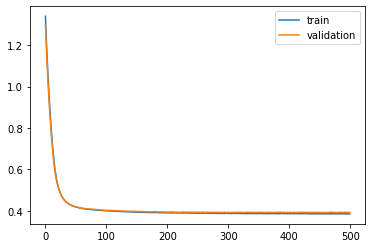

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 15s - loss: 1.4404 - val_loss: 1.3798

Epoch 00001: val_loss improved from inf to 1.37978, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.3527 - val_loss: 1.2986

Epoch 00002: val_loss improved from 1.37978 to 1.29858, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.2743 - val_loss: 1.2260

Epoch 00003: val_loss improved from 1.29858 to 1.22597, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 1.2040 - val_loss: 1.1602

Epoch 00004: val_loss improved from 1.22597 to 1.16023, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 1.1405 - val_loss: 1.1004

Epoch 00005: val_loss improved from 1.16023 to 1.10035, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 1.0825 - val_loss: 1.0455

Epoch 00006: val_loss improved from 1.10035 to 1.04549, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 1.0290 - val_loss: 0.9946

Epoch 00007: val_loss improved from 1.04549

 - 1s - loss: 0.4136 - val_loss: 0.4226

Epoch 00058: val_loss improved from 0.42320 to 0.42258, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4131 - val_loss: 0.4221

Epoch 00059: val_loss improved from 0.42258 to 0.42211, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4126 - val_loss: 0.4217

Epoch 00060: val_loss improved from 0.42211 to 0.42173, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4121 - val_loss: 0.4214

Epoch 00061: val_loss improved from 0.42173 to 0.42139, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4116 - val_loss: 0.4209

Epoch 00062: val_loss improved from 0.42139 to 0.42087, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4111 - val_loss: 0.4205

Epoch 00063: val_loss improved from 0.42087 to 0.42048, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4108 - val_loss: 0.4203

Epoch 00064: val_loss improved from 0.42048 to 0.42026, saving model to val_weights3.hdf5
Epoch


Epoch 00118: val_loss did not improve from 0.41077
Epoch 119/500
 - 1s - loss: 0.3972 - val_loss: 0.4112

Epoch 00119: val_loss did not improve from 0.41077
Epoch 120/500
 - 1s - loss: 0.3972 - val_loss: 0.4111

Epoch 00120: val_loss did not improve from 0.41077
Epoch 121/500
 - 1s - loss: 0.3969 - val_loss: 0.4108

Epoch 00121: val_loss did not improve from 0.41077
Epoch 122/500
 - 1s - loss: 0.3968 - val_loss: 0.4103

Epoch 00122: val_loss improved from 0.41077 to 0.41029, saving model to val_weights3.hdf5
Epoch 123/500
 - 1s - loss: 0.3965 - val_loss: 0.4103

Epoch 00123: val_loss did not improve from 0.41029
Epoch 124/500
 - 1s - loss: 0.3964 - val_loss: 0.4102

Epoch 00124: val_loss improved from 0.41029 to 0.41019, saving model to val_weights3.hdf5
Epoch 125/500
 - 1s - loss: 0.3963 - val_loss: 0.4101

Epoch 00125: val_loss improved from 0.41019 to 0.41005, saving model to val_weights3.hdf5
Epoch 126/500
 - 1s - loss: 0.3962 - val_loss: 0.4098

Epoch 00126: val_loss improved fro

 - 1s - loss: 0.3907 - val_loss: 0.4062

Epoch 00187: val_loss did not improve from 0.40508
Epoch 188/500
 - 1s - loss: 0.3907 - val_loss: 0.4054

Epoch 00188: val_loss did not improve from 0.40508
Epoch 189/500
 - 1s - loss: 0.3907 - val_loss: 0.4053

Epoch 00189: val_loss did not improve from 0.40508
Epoch 190/500
 - 1s - loss: 0.3903 - val_loss: 0.4052

Epoch 00190: val_loss did not improve from 0.40508
Epoch 191/500
 - 1s - loss: 0.3902 - val_loss: 0.4058

Epoch 00191: val_loss did not improve from 0.40508
Epoch 192/500
 - 1s - loss: 0.3901 - val_loss: 0.4053

Epoch 00192: val_loss did not improve from 0.40508
Epoch 193/500
 - 1s - loss: 0.3902 - val_loss: 0.4053

Epoch 00193: val_loss did not improve from 0.40508
Epoch 194/500
 - 1s - loss: 0.3903 - val_loss: 0.4048

Epoch 00194: val_loss improved from 0.40508 to 0.40485, saving model to val_weights3.hdf5
Epoch 195/500
 - 1s - loss: 0.3903 - val_loss: 0.4048

Epoch 00195: val_loss improved from 0.40485 to 0.40481, saving model to 

 - 1s - loss: 0.3882 - val_loss: 0.4039

Epoch 00261: val_loss did not improve from 0.40377
Epoch 262/500
 - 1s - loss: 0.3883 - val_loss: 0.4038

Epoch 00262: val_loss improved from 0.40377 to 0.40376, saving model to val_weights3.hdf5
Epoch 263/500
 - 1s - loss: 0.3881 - val_loss: 0.4040

Epoch 00263: val_loss did not improve from 0.40376
Epoch 264/500
 - 1s - loss: 0.3880 - val_loss: 0.4043

Epoch 00264: val_loss did not improve from 0.40376
Epoch 265/500
 - 1s - loss: 0.3881 - val_loss: 0.4046

Epoch 00265: val_loss did not improve from 0.40376
Epoch 266/500
 - 1s - loss: 0.3881 - val_loss: 0.4046

Epoch 00266: val_loss did not improve from 0.40376
Epoch 267/500
 - 1s - loss: 0.3883 - val_loss: 0.4040

Epoch 00267: val_loss did not improve from 0.40376
Epoch 268/500
 - 1s - loss: 0.3882 - val_loss: 0.4039

Epoch 00268: val_loss did not improve from 0.40376
Epoch 269/500
 - 1s - loss: 0.3880 - val_loss: 0.4038

Epoch 00269: val_loss did not improve from 0.40376
Epoch 270/500
 - 1s -


Epoch 00335: val_loss did not improve from 0.40299
Epoch 336/500
 - 1s - loss: 0.3869 - val_loss: 0.4031

Epoch 00336: val_loss did not improve from 0.40299
Epoch 337/500
 - 1s - loss: 0.3867 - val_loss: 0.4038

Epoch 00337: val_loss did not improve from 0.40299
Epoch 338/500
 - 1s - loss: 0.3867 - val_loss: 0.4038

Epoch 00338: val_loss did not improve from 0.40299
Epoch 339/500
 - 1s - loss: 0.3868 - val_loss: 0.4040

Epoch 00339: val_loss did not improve from 0.40299
Epoch 340/500
 - 1s - loss: 0.3869 - val_loss: 0.4035

Epoch 00340: val_loss did not improve from 0.40299
Epoch 341/500
 - 1s - loss: 0.3870 - val_loss: 0.4035

Epoch 00341: val_loss did not improve from 0.40299
Epoch 342/500
 - 1s - loss: 0.3869 - val_loss: 0.4029

Epoch 00342: val_loss improved from 0.40299 to 0.40290, saving model to val_weights3.hdf5
Epoch 343/500
 - 1s - loss: 0.3869 - val_loss: 0.4031

Epoch 00343: val_loss did not improve from 0.40290
Epoch 344/500
 - 1s - loss: 0.3869 - val_loss: 0.4029

Epoch 

 - 1s - loss: 0.3859 - val_loss: 0.4033

Epoch 00411: val_loss did not improve from 0.40233
Epoch 412/500
 - 1s - loss: 0.3860 - val_loss: 0.4034

Epoch 00412: val_loss did not improve from 0.40233
Epoch 413/500
 - 1s - loss: 0.3858 - val_loss: 0.4029

Epoch 00413: val_loss did not improve from 0.40233
Epoch 414/500
 - 1s - loss: 0.3858 - val_loss: 0.4028

Epoch 00414: val_loss did not improve from 0.40233
Epoch 415/500
 - 1s - loss: 0.3859 - val_loss: 0.4026

Epoch 00415: val_loss did not improve from 0.40233
Epoch 416/500
 - 1s - loss: 0.3860 - val_loss: 0.4028

Epoch 00416: val_loss did not improve from 0.40233
Epoch 417/500
 - 1s - loss: 0.3859 - val_loss: 0.4024

Epoch 00417: val_loss did not improve from 0.40233
Epoch 418/500
 - 1s - loss: 0.3860 - val_loss: 0.4033

Epoch 00418: val_loss did not improve from 0.40233
Epoch 419/500
 - 1s - loss: 0.3860 - val_loss: 0.4036

Epoch 00419: val_loss did not improve from 0.40233
Epoch 420/500
 - 1s - loss: 0.3863 - val_loss: 0.4039

Epoch

 - 1s - loss: 0.3851 - val_loss: 0.4025

Epoch 00486: val_loss did not improve from 0.40195
Epoch 487/500
 - 1s - loss: 0.3853 - val_loss: 0.4030

Epoch 00487: val_loss did not improve from 0.40195
Epoch 488/500
 - 1s - loss: 0.3854 - val_loss: 0.4032

Epoch 00488: val_loss did not improve from 0.40195
Epoch 489/500
 - 1s - loss: 0.3856 - val_loss: 0.4028

Epoch 00489: val_loss did not improve from 0.40195
Epoch 490/500
 - 1s - loss: 0.3855 - val_loss: 0.4022

Epoch 00490: val_loss did not improve from 0.40195
Epoch 491/500
 - 1s - loss: 0.3855 - val_loss: 0.4021

Epoch 00491: val_loss did not improve from 0.40195
Epoch 492/500
 - 1s - loss: 0.3853 - val_loss: 0.4020

Epoch 00492: val_loss did not improve from 0.40195
Epoch 493/500
 - 1s - loss: 0.3852 - val_loss: 0.4025

Epoch 00493: val_loss did not improve from 0.40195
Epoch 494/500
 - 1s - loss: 0.3850 - val_loss: 0.4026

Epoch 00494: val_loss did not improve from 0.40195
Epoch 495/500
 - 1s - loss: 0.3850 - val_loss: 0.4025

Epoch

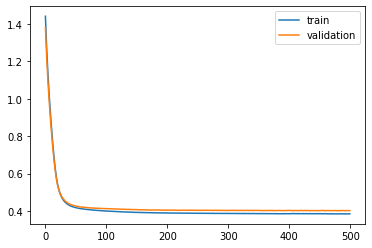

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 44s - loss: 1.3992 - val_loss: 1.3440

Epoch 00001: val_loss improved from inf to 1.34404, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.3104 - val_loss: 1.2628

Epoch 00002: val_loss improved from 1.34404 to 1.26284, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.2340 - val_loss: 1.1911

Epoch 00003: val_loss improved from 1.26284 to 1.19110, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 1.1660 - val_loss: 1.1254

Epoch 00004: val_loss improved from 1.19110 to 1.12541, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 1.1038 - val_loss: 1.0649

Epoch 00005: val_loss improved from 1.12541 to 1.06489, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 1.0464 - val_loss: 1.0088

Epoch 00006: val_loss improved from 1.06489 to 1.00877, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.9928 - val_loss: 0.9561

Epoch 00007: val_loss improved from 1.00877

 - 1s - loss: 0.4138 - val_loss: 0.4149

Epoch 00058: val_loss improved from 0.41541 to 0.41491, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4132 - val_loss: 0.4146

Epoch 00059: val_loss improved from 0.41491 to 0.41456, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4126 - val_loss: 0.4141

Epoch 00060: val_loss improved from 0.41456 to 0.41413, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4120 - val_loss: 0.4135

Epoch 00061: val_loss improved from 0.41413 to 0.41346, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4116 - val_loss: 0.4132

Epoch 00062: val_loss improved from 0.41346 to 0.41317, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4111 - val_loss: 0.4127

Epoch 00063: val_loss improved from 0.41317 to 0.41267, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4107 - val_loss: 0.4123

Epoch 00064: val_loss improved from 0.41267 to 0.41234, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.3971 - val_loss: 0.4000

Epoch 00119: val_loss did not improve from 0.39996
Epoch 120/500
 - 1s - loss: 0.3970 - val_loss: 0.3998

Epoch 00120: val_loss improved from 0.39996 to 0.39983, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.3968 - val_loss: 0.3997

Epoch 00121: val_loss improved from 0.39983 to 0.39966, saving model to val_weights4.hdf5
Epoch 122/500
 - 1s - loss: 0.3966 - val_loss: 0.3990

Epoch 00122: val_loss improved from 0.39966 to 0.39901, saving model to val_weights4.hdf5
Epoch 123/500
 - 1s - loss: 0.3966 - val_loss: 0.3992

Epoch 00123: val_loss did not improve from 0.39901
Epoch 124/500
 - 1s - loss: 0.3965 - val_loss: 0.3995

Epoch 00124: val_loss did not improve from 0.39901
Epoch 125/500
 - 1s - loss: 0.3964 - val_loss: 0.3993

Epoch 00125: val_loss did not improve from 0.39901
Epoch 126/500
 - 1s - loss: 0.3962 - val_loss: 0.3996

Epoch 00126: val_loss did not improve from 0.39901
Epoch 127/500
 - 1s - loss: 0.3963 - val_loss: 0.


Epoch 00189: val_loss did not improve from 0.39471
Epoch 190/500
 - 1s - loss: 0.3908 - val_loss: 0.3946

Epoch 00190: val_loss improved from 0.39471 to 0.39459, saving model to val_weights4.hdf5
Epoch 191/500
 - 1s - loss: 0.3908 - val_loss: 0.3949

Epoch 00191: val_loss did not improve from 0.39459
Epoch 192/500
 - 1s - loss: 0.3908 - val_loss: 0.3951

Epoch 00192: val_loss did not improve from 0.39459
Epoch 193/500
 - 1s - loss: 0.3908 - val_loss: 0.3956

Epoch 00193: val_loss did not improve from 0.39459
Epoch 194/500
 - 1s - loss: 0.3908 - val_loss: 0.3958

Epoch 00194: val_loss did not improve from 0.39459
Epoch 195/500
 - 1s - loss: 0.3909 - val_loss: 0.3958

Epoch 00195: val_loss did not improve from 0.39459
Epoch 196/500
 - 1s - loss: 0.3909 - val_loss: 0.3954

Epoch 00196: val_loss did not improve from 0.39459
Epoch 197/500
 - 1s - loss: 0.3909 - val_loss: 0.3959

Epoch 00197: val_loss did not improve from 0.39459
Epoch 198/500
 - 1s - loss: 0.3908 - val_loss: 0.3948

Epoch 

 - 1s - loss: 0.3884 - val_loss: 0.3943

Epoch 00265: val_loss did not improve from 0.39391
Epoch 266/500
 - 1s - loss: 0.3883 - val_loss: 0.3946

Epoch 00266: val_loss did not improve from 0.39391
Epoch 267/500
 - 1s - loss: 0.3883 - val_loss: 0.3941

Epoch 00267: val_loss did not improve from 0.39391
Epoch 268/500
 - 1s - loss: 0.3885 - val_loss: 0.3944

Epoch 00268: val_loss did not improve from 0.39391
Epoch 269/500
 - 1s - loss: 0.3885 - val_loss: 0.3943

Epoch 00269: val_loss did not improve from 0.39391
Epoch 270/500
 - 1s - loss: 0.3888 - val_loss: 0.3958

Epoch 00270: val_loss did not improve from 0.39391
Epoch 271/500
 - 1s - loss: 0.3892 - val_loss: 0.3958

Epoch 00271: val_loss did not improve from 0.39391
Epoch 272/500
 - 1s - loss: 0.3893 - val_loss: 0.3952

Epoch 00272: val_loss did not improve from 0.39391
Epoch 273/500
 - 1s - loss: 0.3890 - val_loss: 0.3941

Epoch 00273: val_loss did not improve from 0.39391
Epoch 274/500
 - 1s - loss: 0.3886 - val_loss: 0.3941

Epoch

 - 1s - loss: 0.3872 - val_loss: 0.3944

Epoch 00342: val_loss did not improve from 0.39343
Epoch 343/500
 - 1s - loss: 0.3873 - val_loss: 0.3938

Epoch 00343: val_loss did not improve from 0.39343
Epoch 344/500
 - 1s - loss: 0.3873 - val_loss: 0.3936

Epoch 00344: val_loss did not improve from 0.39343
Epoch 345/500
 - 1s - loss: 0.3873 - val_loss: 0.3941

Epoch 00345: val_loss did not improve from 0.39343
Epoch 346/500
 - 1s - loss: 0.3871 - val_loss: 0.3939

Epoch 00346: val_loss did not improve from 0.39343
Epoch 347/500
 - 1s - loss: 0.3872 - val_loss: 0.3940

Epoch 00347: val_loss did not improve from 0.39343
Epoch 348/500
 - 1s - loss: 0.3874 - val_loss: 0.3944

Epoch 00348: val_loss did not improve from 0.39343
Epoch 349/500
 - 1s - loss: 0.3877 - val_loss: 0.3948

Epoch 00349: val_loss did not improve from 0.39343
Epoch 350/500
 - 1s - loss: 0.3879 - val_loss: 0.3954

Epoch 00350: val_loss did not improve from 0.39343
Epoch 351/500
 - 1s - loss: 0.3878 - val_loss: 0.3949

Epoch

 - 1s - loss: 0.3869 - val_loss: 0.3950

Epoch 00419: val_loss did not improve from 0.39331
Epoch 420/500
 - 1s - loss: 0.3871 - val_loss: 0.3949

Epoch 00420: val_loss did not improve from 0.39331
Epoch 421/500
 - 1s - loss: 0.3871 - val_loss: 0.3945

Epoch 00421: val_loss did not improve from 0.39331
Epoch 422/500
 - 1s - loss: 0.3871 - val_loss: 0.3947

Epoch 00422: val_loss did not improve from 0.39331
Epoch 423/500
 - 1s - loss: 0.3871 - val_loss: 0.3943

Epoch 00423: val_loss did not improve from 0.39331
Epoch 424/500
 - 1s - loss: 0.3869 - val_loss: 0.3936

Epoch 00424: val_loss did not improve from 0.39331
Epoch 425/500
 - 1s - loss: 0.3867 - val_loss: 0.3936

Epoch 00425: val_loss did not improve from 0.39331
Epoch 426/500
 - 1s - loss: 0.3864 - val_loss: 0.3937

Epoch 00426: val_loss did not improve from 0.39331
Epoch 427/500
 - 1s - loss: 0.3862 - val_loss: 0.3938

Epoch 00427: val_loss did not improve from 0.39331
Epoch 428/500
 - 1s - loss: 0.3862 - val_loss: 0.3936

Epoch

 - 1s - loss: 0.3856 - val_loss: 0.3937

Epoch 00496: val_loss did not improve from 0.39316
Epoch 497/500
 - 1s - loss: 0.3857 - val_loss: 0.3935

Epoch 00497: val_loss did not improve from 0.39316
Epoch 498/500
 - 1s - loss: 0.3859 - val_loss: 0.3933

Epoch 00498: val_loss did not improve from 0.39316
Epoch 499/500
 - 1s - loss: 0.3860 - val_loss: 0.3942

Epoch 00499: val_loss did not improve from 0.39316
Epoch 500/500
 - 1s - loss: 0.3861 - val_loss: 0.3956

Epoch 00500: val_loss did not improve from 0.39316
#################################
Number of units: 8
Batch size: 16384
Fold: 3
best val loss: 0.3931550681591034
#################################


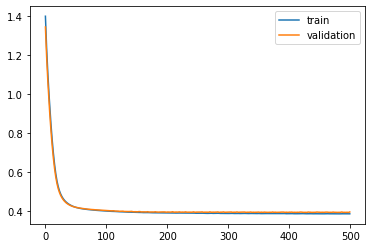

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 45s - loss: 1.3861 - val_loss: 1.3300

Epoch 00001: val_loss improved from inf to 1.33000, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.3090 - val_loss: 1.2581

Epoch 00002: val_loss improved from 1.33000 to 1.25808, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.2385 - val_loss: 1.1920

Epoch 00003: val_loss improved from 1.25808 to 1.19205, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 1.1735 - val_loss: 1.1308

Epoch 00004: val_loss improved from 1.19205 to 1.13077, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 1.1130 - val_loss: 1.0734

Epoch 00005: val_loss improved from 1.13077 to 1.07337, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 1.0563 - val_loss: 1.0191

Epoch 00006: val_loss improved from 1.07337 to 1.01907, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 1.0026 - val_loss: 0.9676

Epoch 00007: val_loss improved from 1.01907

 - 1s - loss: 0.4146 - val_loss: 0.4182

Epoch 00058: val_loss improved from 0.41872 to 0.41816, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4140 - val_loss: 0.4179

Epoch 00059: val_loss improved from 0.41816 to 0.41789, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4134 - val_loss: 0.4172

Epoch 00060: val_loss improved from 0.41789 to 0.41719, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4128 - val_loss: 0.4169

Epoch 00061: val_loss improved from 0.41719 to 0.41695, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4124 - val_loss: 0.4166

Epoch 00062: val_loss improved from 0.41695 to 0.41662, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4119 - val_loss: 0.4161

Epoch 00063: val_loss improved from 0.41662 to 0.41605, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4113 - val_loss: 0.4157

Epoch 00064: val_loss improved from 0.41605 to 0.41571, saving model to val_weights5.hdf5
Epoch


Epoch 00118: val_loss improved from 0.40405 to 0.40382, saving model to val_weights5.hdf5
Epoch 119/500
 - 1s - loss: 0.3954 - val_loss: 0.4035

Epoch 00119: val_loss improved from 0.40382 to 0.40352, saving model to val_weights5.hdf5
Epoch 120/500
 - 1s - loss: 0.3952 - val_loss: 0.4036

Epoch 00120: val_loss did not improve from 0.40352
Epoch 121/500
 - 1s - loss: 0.3954 - val_loss: 0.4033

Epoch 00121: val_loss improved from 0.40352 to 0.40325, saving model to val_weights5.hdf5
Epoch 122/500
 - 1s - loss: 0.3952 - val_loss: 0.4035

Epoch 00122: val_loss did not improve from 0.40325
Epoch 123/500
 - 1s - loss: 0.3949 - val_loss: 0.4031

Epoch 00123: val_loss improved from 0.40325 to 0.40313, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3949 - val_loss: 0.4035

Epoch 00124: val_loss did not improve from 0.40313
Epoch 125/500
 - 1s - loss: 0.3950 - val_loss: 0.4036

Epoch 00125: val_loss did not improve from 0.40313
Epoch 126/500
 - 1s - loss: 0.3950 - val_loss: 0.4

 - 1s - loss: 0.3894 - val_loss: 0.4017

Epoch 00190: val_loss did not improve from 0.40015
Epoch 191/500
 - 1s - loss: 0.3891 - val_loss: 0.4011

Epoch 00191: val_loss did not improve from 0.40015
Epoch 192/500
 - 1s - loss: 0.3893 - val_loss: 0.4005

Epoch 00192: val_loss did not improve from 0.40015
Epoch 193/500
 - 1s - loss: 0.3896 - val_loss: 0.4003

Epoch 00193: val_loss did not improve from 0.40015
Epoch 194/500
 - 1s - loss: 0.3896 - val_loss: 0.4002

Epoch 00194: val_loss did not improve from 0.40015
Epoch 195/500
 - 1s - loss: 0.3896 - val_loss: 0.4007

Epoch 00195: val_loss did not improve from 0.40015
Epoch 196/500
 - 1s - loss: 0.3896 - val_loss: 0.4008

Epoch 00196: val_loss did not improve from 0.40015
Epoch 197/500
 - 1s - loss: 0.3894 - val_loss: 0.3999

Epoch 00197: val_loss improved from 0.40015 to 0.39991, saving model to val_weights5.hdf5
Epoch 198/500
 - 1s - loss: 0.3890 - val_loss: 0.3999

Epoch 00198: val_loss improved from 0.39991 to 0.39990, saving model to 

 - 1s - loss: 0.3867 - val_loss: 0.3995

Epoch 00266: val_loss did not improve from 0.39878
Epoch 267/500
 - 1s - loss: 0.3871 - val_loss: 0.3994

Epoch 00267: val_loss did not improve from 0.39878
Epoch 268/500
 - 1s - loss: 0.3869 - val_loss: 0.3996

Epoch 00268: val_loss did not improve from 0.39878
Epoch 269/500
 - 1s - loss: 0.3867 - val_loss: 0.3995

Epoch 00269: val_loss did not improve from 0.39878
Epoch 270/500
 - 1s - loss: 0.3868 - val_loss: 0.3989

Epoch 00270: val_loss did not improve from 0.39878
Epoch 271/500
 - 1s - loss: 0.3871 - val_loss: 0.3987

Epoch 00271: val_loss improved from 0.39878 to 0.39869, saving model to val_weights5.hdf5
Epoch 272/500
 - 1s - loss: 0.3871 - val_loss: 0.3983

Epoch 00272: val_loss improved from 0.39869 to 0.39834, saving model to val_weights5.hdf5
Epoch 273/500
 - 1s - loss: 0.3871 - val_loss: 0.3994

Epoch 00273: val_loss did not improve from 0.39834
Epoch 274/500
 - 1s - loss: 0.3871 - val_loss: 0.4001

Epoch 00274: val_loss did not imp


Epoch 00341: val_loss improved from 0.39768 to 0.39734, saving model to val_weights5.hdf5
Epoch 342/500
 - 1s - loss: 0.3856 - val_loss: 0.3979

Epoch 00342: val_loss did not improve from 0.39734
Epoch 343/500
 - 1s - loss: 0.3853 - val_loss: 0.3986

Epoch 00343: val_loss did not improve from 0.39734
Epoch 344/500
 - 1s - loss: 0.3852 - val_loss: 0.3986

Epoch 00344: val_loss did not improve from 0.39734
Epoch 345/500
 - 1s - loss: 0.3855 - val_loss: 0.3984

Epoch 00345: val_loss did not improve from 0.39734
Epoch 346/500
 - 1s - loss: 0.3856 - val_loss: 0.3978

Epoch 00346: val_loss did not improve from 0.39734
Epoch 347/500
 - 1s - loss: 0.3856 - val_loss: 0.3979

Epoch 00347: val_loss did not improve from 0.39734
Epoch 348/500
 - 1s - loss: 0.3857 - val_loss: 0.3981

Epoch 00348: val_loss did not improve from 0.39734
Epoch 349/500
 - 1s - loss: 0.3858 - val_loss: 0.3981

Epoch 00349: val_loss did not improve from 0.39734
Epoch 350/500
 - 1s - loss: 0.3858 - val_loss: 0.3974

Epoch 


Epoch 00417: val_loss did not improve from 0.39705
Epoch 418/500
 - 1s - loss: 0.3851 - val_loss: 0.3971

Epoch 00418: val_loss improved from 0.39705 to 0.39705, saving model to val_weights5.hdf5
Epoch 419/500
 - 1s - loss: 0.3847 - val_loss: 0.3978

Epoch 00419: val_loss did not improve from 0.39705
Epoch 420/500
 - 1s - loss: 0.3847 - val_loss: 0.3986

Epoch 00420: val_loss did not improve from 0.39705
Epoch 421/500
 - 1s - loss: 0.3849 - val_loss: 0.3981

Epoch 00421: val_loss did not improve from 0.39705
Epoch 422/500
 - 1s - loss: 0.3850 - val_loss: 0.3974

Epoch 00422: val_loss did not improve from 0.39705
Epoch 423/500
 - 1s - loss: 0.3849 - val_loss: 0.3980

Epoch 00423: val_loss did not improve from 0.39705
Epoch 424/500
 - 1s - loss: 0.3849 - val_loss: 0.3975

Epoch 00424: val_loss did not improve from 0.39705
Epoch 425/500
 - 1s - loss: 0.3849 - val_loss: 0.3979

Epoch 00425: val_loss did not improve from 0.39705
Epoch 426/500
 - 1s - loss: 0.3849 - val_loss: 0.3970

Epoch 


Epoch 00493: val_loss did not improve from 0.39687
Epoch 494/500
 - 1s - loss: 0.3841 - val_loss: 0.3976

Epoch 00494: val_loss did not improve from 0.39687
Epoch 495/500
 - 1s - loss: 0.3841 - val_loss: 0.3977

Epoch 00495: val_loss did not improve from 0.39687
Epoch 496/500
 - 1s - loss: 0.3844 - val_loss: 0.3976

Epoch 00496: val_loss did not improve from 0.39687
Epoch 497/500
 - 1s - loss: 0.3845 - val_loss: 0.3972

Epoch 00497: val_loss did not improve from 0.39687
Epoch 498/500
 - 1s - loss: 0.3844 - val_loss: 0.3972

Epoch 00498: val_loss did not improve from 0.39687
Epoch 499/500
 - 1s - loss: 0.3839 - val_loss: 0.3979

Epoch 00499: val_loss did not improve from 0.39687
Epoch 500/500
 - 1s - loss: 0.3837 - val_loss: 0.3981

Epoch 00500: val_loss did not improve from 0.39687
#################################
Number of units: 8
Batch size: 16384
Fold: 4
best val loss: 0.3968653678894043
#################################
[[2, 16384, 0, 0.4023981988430023], [2, 16384, 1, 0.3960309

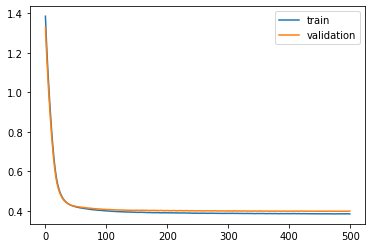

Time to train LSTM:  378.2032001018524
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 20s - loss: 1.8253 - val_loss: 1.7383

Epoch 00001: val_loss improved from inf to 1.73832, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.6850 - val_loss: 1.6072

Epoch 00002: val_loss improved from 1.73832 to 1.60724, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.5610 - val_loss: 1.4911

Epoch 00003: val_loss improved from 1.60724 to 1.49106, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 1.4500 - val_loss: 1.3874

Epoch 00004: val_loss improved from 1.49106 to 1.38740, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 1.3500 - val_loss: 1.2941

Epoch 00005: val_loss improved from 1.38740 to 1.29410, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 1.2594 - val_loss: 1.2087

Epoch 00006: val_loss improved from 1.29410 to 1.20869, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 1.1761 - val_loss: 1.1298

Epoc


Epoch 00057: val_loss improved from 0.41712 to 0.41651, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4079 - val_loss: 0.4164

Epoch 00058: val_loss improved from 0.41651 to 0.41640, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4074 - val_loss: 0.4157

Epoch 00059: val_loss improved from 0.41640 to 0.41567, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4070 - val_loss: 0.4148

Epoch 00060: val_loss improved from 0.41567 to 0.41475, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4063 - val_loss: 0.4144

Epoch 00061: val_loss improved from 0.41475 to 0.41442, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4058 - val_loss: 0.4144

Epoch 00062: val_loss improved from 0.41442 to 0.41437, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4053 - val_loss: 0.4138

Epoch 00063: val_loss improved from 0.41437 to 0.41379, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4047 - val_loss:


Epoch 00122: val_loss did not improve from 0.40265
Epoch 123/500
 - 1s - loss: 0.3915 - val_loss: 0.4037

Epoch 00123: val_loss did not improve from 0.40265
Epoch 124/500
 - 1s - loss: 0.3915 - val_loss: 0.4029

Epoch 00124: val_loss did not improve from 0.40265
Epoch 125/500
 - 1s - loss: 0.3913 - val_loss: 0.4027

Epoch 00125: val_loss did not improve from 0.40265
Epoch 126/500
 - 1s - loss: 0.3912 - val_loss: 0.4026

Epoch 00126: val_loss improved from 0.40265 to 0.40260, saving model to val_weights1.hdf5
Epoch 127/500
 - 1s - loss: 0.3909 - val_loss: 0.4030

Epoch 00127: val_loss did not improve from 0.40260
Epoch 128/500
 - 1s - loss: 0.3907 - val_loss: 0.4033

Epoch 00128: val_loss did not improve from 0.40260
Epoch 129/500
 - 1s - loss: 0.3907 - val_loss: 0.4035

Epoch 00129: val_loss did not improve from 0.40260
Epoch 130/500
 - 1s - loss: 0.3906 - val_loss: 0.4035

Epoch 00130: val_loss did not improve from 0.40260
Epoch 131/500
 - 1s - loss: 0.3906 - val_loss: 0.4023

Epoch 

 - 1s - loss: 0.3855 - val_loss: 0.4030

Epoch 00198: val_loss did not improve from 0.40168
Epoch 199/500
 - 1s - loss: 0.3858 - val_loss: 0.4021

Epoch 00199: val_loss did not improve from 0.40168
Epoch 200/500
 - 1s - loss: 0.3855 - val_loss: 0.4015

Epoch 00200: val_loss improved from 0.40168 to 0.40153, saving model to val_weights1.hdf5
Epoch 201/500
 - 1s - loss: 0.3850 - val_loss: 0.4020

Epoch 00201: val_loss did not improve from 0.40153
Epoch 202/500
 - 1s - loss: 0.3849 - val_loss: 0.4019

Epoch 00202: val_loss did not improve from 0.40153
Epoch 203/500
 - 1s - loss: 0.3846 - val_loss: 0.4023

Epoch 00203: val_loss did not improve from 0.40153
Epoch 204/500
 - 1s - loss: 0.3849 - val_loss: 0.4034

Epoch 00204: val_loss did not improve from 0.40153
Epoch 205/500
 - 1s - loss: 0.3853 - val_loss: 0.4024

Epoch 00205: val_loss did not improve from 0.40153
Epoch 206/500
 - 1s - loss: 0.3854 - val_loss: 0.4016

Epoch 00206: val_loss did not improve from 0.40153
Epoch 207/500
 - 1s -

 - 1s - loss: 0.3827 - val_loss: 0.4028

Epoch 00275: val_loss did not improve from 0.40153
Epoch 276/500
 - 1s - loss: 0.3827 - val_loss: 0.4034

Epoch 00276: val_loss did not improve from 0.40153
Epoch 277/500
 - 1s - loss: 0.3827 - val_loss: 0.4041

Epoch 00277: val_loss did not improve from 0.40153
Epoch 278/500
 - 1s - loss: 0.3829 - val_loss: 0.4033

Epoch 00278: val_loss did not improve from 0.40153
Epoch 279/500
 - 1s - loss: 0.3827 - val_loss: 0.4030

Epoch 00279: val_loss did not improve from 0.40153
Epoch 280/500
 - 1s - loss: 0.3824 - val_loss: 0.4025

Epoch 00280: val_loss did not improve from 0.40153
Epoch 281/500
 - 1s - loss: 0.3825 - val_loss: 0.4032

Epoch 00281: val_loss did not improve from 0.40153
Epoch 282/500
 - 1s - loss: 0.3825 - val_loss: 0.4047

Epoch 00282: val_loss did not improve from 0.40153
Epoch 283/500
 - 1s - loss: 0.3824 - val_loss: 0.4036

Epoch 00283: val_loss did not improve from 0.40153
Epoch 284/500
 - 1s - loss: 0.3826 - val_loss: 0.4033

Epoch


Epoch 00352: val_loss did not improve from 0.40153
Epoch 353/500
 - 1s - loss: 0.3804 - val_loss: 0.4046

Epoch 00353: val_loss did not improve from 0.40153
Epoch 354/500
 - 1s - loss: 0.3802 - val_loss: 0.4039

Epoch 00354: val_loss did not improve from 0.40153
Epoch 355/500
 - 1s - loss: 0.3805 - val_loss: 0.4044

Epoch 00355: val_loss did not improve from 0.40153
Epoch 356/500
 - 1s - loss: 0.3803 - val_loss: 0.4052

Epoch 00356: val_loss did not improve from 0.40153
Epoch 357/500
 - 1s - loss: 0.3809 - val_loss: 0.4053

Epoch 00357: val_loss did not improve from 0.40153
Epoch 358/500
 - 1s - loss: 0.3807 - val_loss: 0.4049

Epoch 00358: val_loss did not improve from 0.40153
Epoch 359/500
 - 1s - loss: 0.3806 - val_loss: 0.4052

Epoch 00359: val_loss did not improve from 0.40153
Epoch 360/500
 - 1s - loss: 0.3803 - val_loss: 0.4042

Epoch 00360: val_loss did not improve from 0.40153
Epoch 361/500
 - 1s - loss: 0.3805 - val_loss: 0.4048

Epoch 00361: val_loss did not improve from 0.

 - 1s - loss: 0.3792 - val_loss: 0.4066

Epoch 00430: val_loss did not improve from 0.40153
Epoch 431/500
 - 1s - loss: 0.3792 - val_loss: 0.4067

Epoch 00431: val_loss did not improve from 0.40153
Epoch 432/500
 - 1s - loss: 0.3790 - val_loss: 0.4058

Epoch 00432: val_loss did not improve from 0.40153
Epoch 433/500
 - 1s - loss: 0.3792 - val_loss: 0.4066

Epoch 00433: val_loss did not improve from 0.40153
Epoch 434/500
 - 1s - loss: 0.3793 - val_loss: 0.4065

Epoch 00434: val_loss did not improve from 0.40153
Epoch 435/500
 - 1s - loss: 0.3795 - val_loss: 0.4065

Epoch 00435: val_loss did not improve from 0.40153
Epoch 436/500
 - 1s - loss: 0.3790 - val_loss: 0.4065

Epoch 00436: val_loss did not improve from 0.40153
Epoch 437/500
 - 1s - loss: 0.3791 - val_loss: 0.4062

Epoch 00437: val_loss did not improve from 0.40153
Epoch 438/500
 - 1s - loss: 0.3787 - val_loss: 0.4066

Epoch 00438: val_loss did not improve from 0.40153
Epoch 439/500
 - 1s - loss: 0.3793 - val_loss: 0.4064

Epoch

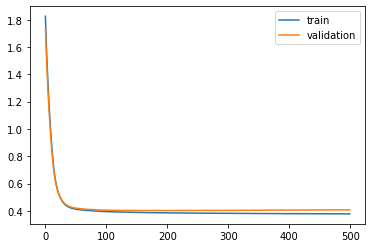

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 38s - loss: 1.6800 - val_loss: 1.6066

Epoch 00001: val_loss improved from inf to 1.60664, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.5518 - val_loss: 1.4838

Epoch 00002: val_loss improved from 1.60664 to 1.48378, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.4368 - val_loss: 1.3732

Epoch 00003: val_loss improved from 1.48378 to 1.37323, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 1.3330 - val_loss: 1.2734

Epoch 00004: val_loss improved from 1.37323 to 1.27338, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 1.2379 - val_loss: 1.1816

Epoch 00005: val_loss improved from 1.27338 to 1.18164, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 1.1501 - val_loss: 1.0977

Epoch 00006: val_loss improved from 1.18164 to 1.09768, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 1.0695 - val_loss: 1.0218

Epoch 00007: val_loss improved from 1.09768

 - 1s - loss: 0.4039 - val_loss: 0.4079

Epoch 00058: val_loss improved from 0.40865 to 0.40792, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4035 - val_loss: 0.4081

Epoch 00059: val_loss did not improve from 0.40792
Epoch 60/500
 - 1s - loss: 0.4032 - val_loss: 0.4080

Epoch 00060: val_loss did not improve from 0.40792
Epoch 61/500
 - 1s - loss: 0.4029 - val_loss: 0.4078

Epoch 00061: val_loss improved from 0.40792 to 0.40776, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4026 - val_loss: 0.4068

Epoch 00062: val_loss improved from 0.40776 to 0.40682, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4021 - val_loss: 0.4064

Epoch 00063: val_loss improved from 0.40682 to 0.40643, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4018 - val_loss: 0.4064

Epoch 00064: val_loss improved from 0.40643 to 0.40640, saving model to val_weights2.hdf5
Epoch 65/500
 - 1s - loss: 0.4013 - val_loss: 0.4068

Epoch 00065: val_loss did not


Epoch 00127: val_loss did not improve from 0.39897
Epoch 128/500
 - 1s - loss: 0.3905 - val_loss: 0.4008

Epoch 00128: val_loss did not improve from 0.39897
Epoch 129/500
 - 1s - loss: 0.3905 - val_loss: 0.4002

Epoch 00129: val_loss did not improve from 0.39897
Epoch 130/500
 - 1s - loss: 0.3905 - val_loss: 0.3995

Epoch 00130: val_loss did not improve from 0.39897
Epoch 131/500
 - 1s - loss: 0.3903 - val_loss: 0.3994

Epoch 00131: val_loss did not improve from 0.39897
Epoch 132/500
 - 1s - loss: 0.3900 - val_loss: 0.3999

Epoch 00132: val_loss did not improve from 0.39897
Epoch 133/500
 - 1s - loss: 0.3898 - val_loss: 0.3988

Epoch 00133: val_loss improved from 0.39897 to 0.39884, saving model to val_weights2.hdf5
Epoch 134/500
 - 1s - loss: 0.3897 - val_loss: 0.3996

Epoch 00134: val_loss did not improve from 0.39884
Epoch 135/500
 - 1s - loss: 0.3898 - val_loss: 0.4000

Epoch 00135: val_loss did not improve from 0.39884
Epoch 136/500
 - 1s - loss: 0.3900 - val_loss: 0.4008

Epoch 

 - 1s - loss: 0.3848 - val_loss: 0.4004

Epoch 00203: val_loss did not improve from 0.39838
Epoch 204/500
 - 1s - loss: 0.3850 - val_loss: 0.4005

Epoch 00204: val_loss did not improve from 0.39838
Epoch 205/500
 - 1s - loss: 0.3849 - val_loss: 0.4011

Epoch 00205: val_loss did not improve from 0.39838
Epoch 206/500
 - 1s - loss: 0.3852 - val_loss: 0.3995

Epoch 00206: val_loss did not improve from 0.39838
Epoch 207/500
 - 1s - loss: 0.3855 - val_loss: 0.3989

Epoch 00207: val_loss did not improve from 0.39838
Epoch 208/500
 - 1s - loss: 0.3855 - val_loss: 0.4001

Epoch 00208: val_loss did not improve from 0.39838
Epoch 209/500
 - 1s - loss: 0.3856 - val_loss: 0.3995

Epoch 00209: val_loss did not improve from 0.39838
Epoch 210/500
 - 1s - loss: 0.3857 - val_loss: 0.3993

Epoch 00210: val_loss did not improve from 0.39838
Epoch 211/500
 - 1s - loss: 0.3853 - val_loss: 0.4011

Epoch 00211: val_loss did not improve from 0.39838
Epoch 212/500
 - 1s - loss: 0.3854 - val_loss: 0.4010

Epoch


Epoch 00280: val_loss did not improve from 0.39838
Epoch 281/500
 - 1s - loss: 0.3827 - val_loss: 0.4003

Epoch 00281: val_loss did not improve from 0.39838
Epoch 282/500
 - 1s - loss: 0.3822 - val_loss: 0.4011

Epoch 00282: val_loss did not improve from 0.39838
Epoch 283/500
 - 1s - loss: 0.3822 - val_loss: 0.4010

Epoch 00283: val_loss did not improve from 0.39838
Epoch 284/500
 - 1s - loss: 0.3823 - val_loss: 0.4007

Epoch 00284: val_loss did not improve from 0.39838
Epoch 285/500
 - 1s - loss: 0.3819 - val_loss: 0.4023

Epoch 00285: val_loss did not improve from 0.39838
Epoch 286/500
 - 1s - loss: 0.3820 - val_loss: 0.4018

Epoch 00286: val_loss did not improve from 0.39838
Epoch 287/500
 - 1s - loss: 0.3826 - val_loss: 0.4003

Epoch 00287: val_loss did not improve from 0.39838
Epoch 288/500
 - 1s - loss: 0.3824 - val_loss: 0.4003

Epoch 00288: val_loss did not improve from 0.39838
Epoch 289/500
 - 1s - loss: 0.3821 - val_loss: 0.4015

Epoch 00289: val_loss did not improve from 0.

 - 1s - loss: 0.3804 - val_loss: 0.4020

Epoch 00358: val_loss did not improve from 0.39838
Epoch 359/500
 - 1s - loss: 0.3799 - val_loss: 0.4028

Epoch 00359: val_loss did not improve from 0.39838
Epoch 360/500
 - 1s - loss: 0.3808 - val_loss: 0.4011

Epoch 00360: val_loss did not improve from 0.39838
Epoch 361/500
 - 1s - loss: 0.3803 - val_loss: 0.4009

Epoch 00361: val_loss did not improve from 0.39838
Epoch 362/500
 - 1s - loss: 0.3801 - val_loss: 0.4023

Epoch 00362: val_loss did not improve from 0.39838
Epoch 363/500
 - 1s - loss: 0.3804 - val_loss: 0.4013

Epoch 00363: val_loss did not improve from 0.39838
Epoch 364/500
 - 1s - loss: 0.3798 - val_loss: 0.4024

Epoch 00364: val_loss did not improve from 0.39838
Epoch 365/500
 - 1s - loss: 0.3800 - val_loss: 0.4017

Epoch 00365: val_loss did not improve from 0.39838
Epoch 366/500
 - 1s - loss: 0.3804 - val_loss: 0.4008

Epoch 00366: val_loss did not improve from 0.39838
Epoch 367/500
 - 1s - loss: 0.3800 - val_loss: 0.4018

Epoch


Epoch 00435: val_loss did not improve from 0.39838
Epoch 436/500
 - 1s - loss: 0.3786 - val_loss: 0.4025

Epoch 00436: val_loss did not improve from 0.39838
Epoch 437/500
 - 1s - loss: 0.3788 - val_loss: 0.4029

Epoch 00437: val_loss did not improve from 0.39838
Epoch 438/500
 - 1s - loss: 0.3787 - val_loss: 0.4041

Epoch 00438: val_loss did not improve from 0.39838
Epoch 439/500
 - 1s - loss: 0.3787 - val_loss: 0.4032

Epoch 00439: val_loss did not improve from 0.39838
Epoch 440/500
 - 1s - loss: 0.3787 - val_loss: 0.4021

Epoch 00440: val_loss did not improve from 0.39838
Epoch 441/500
 - 1s - loss: 0.3784 - val_loss: 0.4025

Epoch 00441: val_loss did not improve from 0.39838
Epoch 442/500
 - 1s - loss: 0.3786 - val_loss: 0.4023

Epoch 00442: val_loss did not improve from 0.39838
Epoch 443/500
 - 1s - loss: 0.3783 - val_loss: 0.4030

Epoch 00443: val_loss did not improve from 0.39838
Epoch 444/500
 - 1s - loss: 0.3781 - val_loss: 0.4040

Epoch 00444: val_loss did not improve from 0.

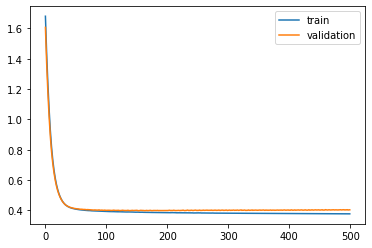

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 17s - loss: 1.6786 - val_loss: 1.5861

Epoch 00001: val_loss improved from inf to 1.58613, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.5537 - val_loss: 1.4702

Epoch 00002: val_loss improved from 1.58613 to 1.47019, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.4395 - val_loss: 1.3650

Epoch 00003: val_loss improved from 1.47019 to 1.36500, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 1.3354 - val_loss: 1.2695

Epoch 00004: val_loss improved from 1.36500 to 1.26953, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 1.2409 - val_loss: 1.1827

Epoch 00005: val_loss improved from 1.26953 to 1.18271, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 1.1550 - val_loss: 1.1031

Epoch 00006: val_loss improved from 1.18271 to 1.10305, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 1.0768 - val_loss: 1.0297

Epoch 00007: val_loss improved from 1.10305

 - 1s - loss: 0.4029 - val_loss: 0.4140

Epoch 00058: val_loss improved from 0.41432 to 0.41399, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4023 - val_loss: 0.4136

Epoch 00059: val_loss improved from 0.41399 to 0.41359, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4018 - val_loss: 0.4133

Epoch 00060: val_loss improved from 0.41359 to 0.41326, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4015 - val_loss: 0.4128

Epoch 00061: val_loss improved from 0.41326 to 0.41284, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4012 - val_loss: 0.4122

Epoch 00062: val_loss improved from 0.41284 to 0.41218, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4008 - val_loss: 0.4121

Epoch 00063: val_loss improved from 0.41218 to 0.41205, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4004 - val_loss: 0.4118

Epoch 00064: val_loss improved from 0.41205 to 0.41178, saving model to val_weights3.hdf5
Epoch


Epoch 00126: val_loss did not improve from 0.40654
Epoch 127/500
 - 1s - loss: 0.3894 - val_loss: 0.4077

Epoch 00127: val_loss did not improve from 0.40654
Epoch 128/500
 - 1s - loss: 0.3894 - val_loss: 0.4085

Epoch 00128: val_loss did not improve from 0.40654
Epoch 129/500
 - 1s - loss: 0.3897 - val_loss: 0.4077

Epoch 00129: val_loss did not improve from 0.40654
Epoch 130/500
 - 1s - loss: 0.3899 - val_loss: 0.4080

Epoch 00130: val_loss did not improve from 0.40654
Epoch 131/500
 - 1s - loss: 0.3899 - val_loss: 0.4064

Epoch 00131: val_loss improved from 0.40654 to 0.40641, saving model to val_weights3.hdf5
Epoch 132/500
 - 1s - loss: 0.3894 - val_loss: 0.4064

Epoch 00132: val_loss improved from 0.40641 to 0.40637, saving model to val_weights3.hdf5
Epoch 133/500
 - 1s - loss: 0.3892 - val_loss: 0.4069

Epoch 00133: val_loss did not improve from 0.40637
Epoch 134/500
 - 1s - loss: 0.3890 - val_loss: 0.4071

Epoch 00134: val_loss did not improve from 0.40637
Epoch 135/500
 - 1s - 

 - 1s - loss: 0.3845 - val_loss: 0.4081

Epoch 00203: val_loss did not improve from 0.40637
Epoch 204/500
 - 1s - loss: 0.3841 - val_loss: 0.4079

Epoch 00204: val_loss did not improve from 0.40637
Epoch 205/500
 - 1s - loss: 0.3839 - val_loss: 0.4073

Epoch 00205: val_loss did not improve from 0.40637
Epoch 206/500
 - 1s - loss: 0.3841 - val_loss: 0.4077

Epoch 00206: val_loss did not improve from 0.40637
Epoch 207/500
 - 1s - loss: 0.3843 - val_loss: 0.4083

Epoch 00207: val_loss did not improve from 0.40637
Epoch 208/500
 - 1s - loss: 0.3847 - val_loss: 0.4084

Epoch 00208: val_loss did not improve from 0.40637
Epoch 209/500
 - 1s - loss: 0.3846 - val_loss: 0.4083

Epoch 00209: val_loss did not improve from 0.40637
Epoch 210/500
 - 1s - loss: 0.3841 - val_loss: 0.4087

Epoch 00210: val_loss did not improve from 0.40637
Epoch 211/500
 - 1s - loss: 0.3840 - val_loss: 0.4079

Epoch 00211: val_loss did not improve from 0.40637
Epoch 212/500
 - 1s - loss: 0.3837 - val_loss: 0.4082

Epoch


Epoch 00280: val_loss did not improve from 0.40637
Epoch 281/500
 - 1s - loss: 0.3816 - val_loss: 0.4087

Epoch 00281: val_loss did not improve from 0.40637
Epoch 282/500
 - 1s - loss: 0.3818 - val_loss: 0.4093

Epoch 00282: val_loss did not improve from 0.40637
Epoch 283/500
 - 1s - loss: 0.3821 - val_loss: 0.4094

Epoch 00283: val_loss did not improve from 0.40637
Epoch 284/500
 - 1s - loss: 0.3821 - val_loss: 0.4100

Epoch 00284: val_loss did not improve from 0.40637
Epoch 285/500
 - 1s - loss: 0.3822 - val_loss: 0.4093

Epoch 00285: val_loss did not improve from 0.40637
Epoch 286/500
 - 1s - loss: 0.3816 - val_loss: 0.4097

Epoch 00286: val_loss did not improve from 0.40637
Epoch 287/500
 - 1s - loss: 0.3816 - val_loss: 0.4094

Epoch 00287: val_loss did not improve from 0.40637
Epoch 288/500
 - 1s - loss: 0.3820 - val_loss: 0.4091

Epoch 00288: val_loss did not improve from 0.40637
Epoch 289/500
 - 1s - loss: 0.3819 - val_loss: 0.4097

Epoch 00289: val_loss did not improve from 0.

 - 1s - loss: 0.3798 - val_loss: 0.4099

Epoch 00358: val_loss did not improve from 0.40637
Epoch 359/500
 - 1s - loss: 0.3795 - val_loss: 0.4103

Epoch 00359: val_loss did not improve from 0.40637
Epoch 360/500
 - 1s - loss: 0.3800 - val_loss: 0.4099

Epoch 00360: val_loss did not improve from 0.40637
Epoch 361/500
 - 1s - loss: 0.3798 - val_loss: 0.4102

Epoch 00361: val_loss did not improve from 0.40637
Epoch 362/500
 - 1s - loss: 0.3798 - val_loss: 0.4106

Epoch 00362: val_loss did not improve from 0.40637
Epoch 363/500
 - 1s - loss: 0.3798 - val_loss: 0.4101

Epoch 00363: val_loss did not improve from 0.40637
Epoch 364/500
 - 1s - loss: 0.3797 - val_loss: 0.4102

Epoch 00364: val_loss did not improve from 0.40637
Epoch 365/500
 - 1s - loss: 0.3798 - val_loss: 0.4103

Epoch 00365: val_loss did not improve from 0.40637
Epoch 366/500
 - 1s - loss: 0.3802 - val_loss: 0.4105

Epoch 00366: val_loss did not improve from 0.40637
Epoch 367/500
 - 1s - loss: 0.3797 - val_loss: 0.4104

Epoch


Epoch 00435: val_loss did not improve from 0.40637
Epoch 436/500
 - 1s - loss: 0.3786 - val_loss: 0.4112

Epoch 00436: val_loss did not improve from 0.40637
Epoch 437/500
 - 1s - loss: 0.3785 - val_loss: 0.4107

Epoch 00437: val_loss did not improve from 0.40637
Epoch 438/500
 - 1s - loss: 0.3784 - val_loss: 0.4108

Epoch 00438: val_loss did not improve from 0.40637
Epoch 439/500
 - 1s - loss: 0.3785 - val_loss: 0.4111

Epoch 00439: val_loss did not improve from 0.40637
Epoch 440/500
 - 1s - loss: 0.3787 - val_loss: 0.4111

Epoch 00440: val_loss did not improve from 0.40637
Epoch 441/500
 - 1s - loss: 0.3784 - val_loss: 0.4117

Epoch 00441: val_loss did not improve from 0.40637
Epoch 442/500
 - 1s - loss: 0.3786 - val_loss: 0.4106

Epoch 00442: val_loss did not improve from 0.40637
Epoch 443/500
 - 1s - loss: 0.3784 - val_loss: 0.4108

Epoch 00443: val_loss did not improve from 0.40637
Epoch 444/500
 - 1s - loss: 0.3782 - val_loss: 0.4108

Epoch 00444: val_loss did not improve from 0.

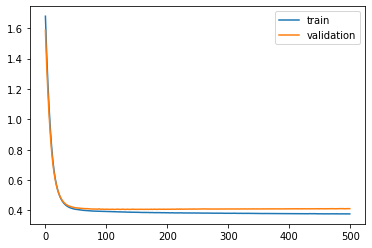

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 23s - loss: 1.6550 - val_loss: 1.5737

Epoch 00001: val_loss improved from inf to 1.57367, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.5301 - val_loss: 1.4561

Epoch 00002: val_loss improved from 1.57367 to 1.45615, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.4175 - val_loss: 1.3478

Epoch 00003: val_loss improved from 1.45615 to 1.34783, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 1.3133 - val_loss: 1.2482

Epoch 00004: val_loss improved from 1.34783 to 1.24815, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 1.2175 - val_loss: 1.1572

Epoch 00005: val_loss improved from 1.24815 to 1.15722, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 1.1301 - val_loss: 1.0747

Epoch 00006: val_loss improved from 1.15722 to 1.07465, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 1.0512 - val_loss: 1.0012

Epoch 00007: val_loss improved from 1.07465

 - 1s - loss: 0.4039 - val_loss: 0.4069

Epoch 00058: val_loss improved from 0.40825 to 0.40695, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4033 - val_loss: 0.4066

Epoch 00059: val_loss improved from 0.40695 to 0.40658, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4026 - val_loss: 0.4064

Epoch 00060: val_loss improved from 0.40658 to 0.40644, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4020 - val_loss: 0.4063

Epoch 00061: val_loss improved from 0.40644 to 0.40634, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4016 - val_loss: 0.4059

Epoch 00062: val_loss improved from 0.40634 to 0.40588, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4011 - val_loss: 0.4055

Epoch 00063: val_loss improved from 0.40588 to 0.40552, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4007 - val_loss: 0.4052

Epoch 00064: val_loss improved from 0.40552 to 0.40524, saving model to val_weights4.hdf5
Epoch


Epoch 00125: val_loss did not improve from 0.39807
Epoch 126/500
 - 1s - loss: 0.3901 - val_loss: 0.3991

Epoch 00126: val_loss did not improve from 0.39807
Epoch 127/500
 - 1s - loss: 0.3902 - val_loss: 0.3994

Epoch 00127: val_loss did not improve from 0.39807
Epoch 128/500
 - 1s - loss: 0.3907 - val_loss: 0.3983

Epoch 00128: val_loss did not improve from 0.39807
Epoch 129/500
 - 1s - loss: 0.3905 - val_loss: 0.3989

Epoch 00129: val_loss did not improve from 0.39807
Epoch 130/500
 - 1s - loss: 0.3900 - val_loss: 0.3983

Epoch 00130: val_loss did not improve from 0.39807
Epoch 131/500
 - 1s - loss: 0.3897 - val_loss: 0.3984

Epoch 00131: val_loss did not improve from 0.39807
Epoch 132/500
 - 1s - loss: 0.3896 - val_loss: 0.3984

Epoch 00132: val_loss did not improve from 0.39807
Epoch 133/500
 - 1s - loss: 0.3894 - val_loss: 0.3988

Epoch 00133: val_loss did not improve from 0.39807
Epoch 134/500
 - 1s - loss: 0.3897 - val_loss: 0.3990

Epoch 00134: val_loss did not improve from 0.


Epoch 00201: val_loss did not improve from 0.39780
Epoch 202/500
 - 1s - loss: 0.3851 - val_loss: 0.3991

Epoch 00202: val_loss did not improve from 0.39780
Epoch 203/500
 - 1s - loss: 0.3850 - val_loss: 0.3989

Epoch 00203: val_loss did not improve from 0.39780
Epoch 204/500
 - 1s - loss: 0.3854 - val_loss: 0.3987

Epoch 00204: val_loss did not improve from 0.39780
Epoch 205/500
 - 1s - loss: 0.3855 - val_loss: 0.3997

Epoch 00205: val_loss did not improve from 0.39780
Epoch 206/500
 - 1s - loss: 0.3850 - val_loss: 0.3995

Epoch 00206: val_loss did not improve from 0.39780
Epoch 207/500
 - 1s - loss: 0.3851 - val_loss: 0.3985

Epoch 00207: val_loss did not improve from 0.39780
Epoch 208/500
 - 1s - loss: 0.3849 - val_loss: 0.3985

Epoch 00208: val_loss did not improve from 0.39780
Epoch 209/500
 - 1s - loss: 0.3848 - val_loss: 0.3991

Epoch 00209: val_loss did not improve from 0.39780
Epoch 210/500
 - 1s - loss: 0.3850 - val_loss: 0.3987

Epoch 00210: val_loss did not improve from 0.

 - 1s - loss: 0.3829 - val_loss: 0.3994

Epoch 00279: val_loss did not improve from 0.39780
Epoch 280/500
 - 1s - loss: 0.3826 - val_loss: 0.3999

Epoch 00280: val_loss did not improve from 0.39780
Epoch 281/500
 - 1s - loss: 0.3823 - val_loss: 0.3999

Epoch 00281: val_loss did not improve from 0.39780
Epoch 282/500
 - 1s - loss: 0.3825 - val_loss: 0.3999

Epoch 00282: val_loss did not improve from 0.39780
Epoch 283/500
 - 1s - loss: 0.3829 - val_loss: 0.4001

Epoch 00283: val_loss did not improve from 0.39780
Epoch 284/500
 - 1s - loss: 0.3827 - val_loss: 0.4010

Epoch 00284: val_loss did not improve from 0.39780
Epoch 285/500
 - 1s - loss: 0.3825 - val_loss: 0.3993

Epoch 00285: val_loss did not improve from 0.39780
Epoch 286/500
 - 1s - loss: 0.3824 - val_loss: 0.3997

Epoch 00286: val_loss did not improve from 0.39780
Epoch 287/500
 - 1s - loss: 0.3820 - val_loss: 0.3996

Epoch 00287: val_loss did not improve from 0.39780
Epoch 288/500
 - 1s - loss: 0.3824 - val_loss: 0.3998

Epoch


Epoch 00356: val_loss did not improve from 0.39780
Epoch 357/500
 - 1s - loss: 0.3807 - val_loss: 0.4016

Epoch 00357: val_loss did not improve from 0.39780
Epoch 358/500
 - 1s - loss: 0.3810 - val_loss: 0.4012

Epoch 00358: val_loss did not improve from 0.39780
Epoch 359/500
 - 1s - loss: 0.3808 - val_loss: 0.4010

Epoch 00359: val_loss did not improve from 0.39780
Epoch 360/500
 - 1s - loss: 0.3807 - val_loss: 0.4008

Epoch 00360: val_loss did not improve from 0.39780
Epoch 361/500
 - 1s - loss: 0.3807 - val_loss: 0.4008

Epoch 00361: val_loss did not improve from 0.39780
Epoch 362/500
 - 1s - loss: 0.3810 - val_loss: 0.4009

Epoch 00362: val_loss did not improve from 0.39780
Epoch 363/500
 - 1s - loss: 0.3802 - val_loss: 0.4012

Epoch 00363: val_loss did not improve from 0.39780
Epoch 364/500
 - 1s - loss: 0.3803 - val_loss: 0.4015

Epoch 00364: val_loss did not improve from 0.39780
Epoch 365/500
 - 1s - loss: 0.3806 - val_loss: 0.4002

Epoch 00365: val_loss did not improve from 0.

 - 1s - loss: 0.3795 - val_loss: 0.4028

Epoch 00434: val_loss did not improve from 0.39780
Epoch 435/500
 - 1s - loss: 0.3789 - val_loss: 0.4019

Epoch 00435: val_loss did not improve from 0.39780
Epoch 436/500
 - 1s - loss: 0.3792 - val_loss: 0.4013

Epoch 00436: val_loss did not improve from 0.39780
Epoch 437/500
 - 1s - loss: 0.3794 - val_loss: 0.4019

Epoch 00437: val_loss did not improve from 0.39780
Epoch 438/500
 - 1s - loss: 0.3795 - val_loss: 0.4016

Epoch 00438: val_loss did not improve from 0.39780
Epoch 439/500
 - 1s - loss: 0.3795 - val_loss: 0.4025

Epoch 00439: val_loss did not improve from 0.39780
Epoch 440/500
 - 1s - loss: 0.3790 - val_loss: 0.4031

Epoch 00440: val_loss did not improve from 0.39780
Epoch 441/500
 - 1s - loss: 0.3789 - val_loss: 0.4017

Epoch 00441: val_loss did not improve from 0.39780
Epoch 442/500
 - 1s - loss: 0.3790 - val_loss: 0.4019

Epoch 00442: val_loss did not improve from 0.39780
Epoch 443/500
 - 1s - loss: 0.3790 - val_loss: 0.4021

Epoch

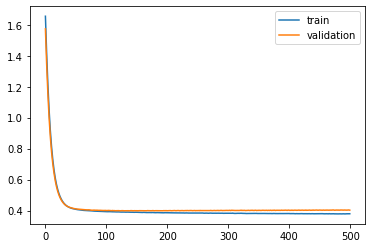

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 44s - loss: 1.7558 - val_loss: 1.6663

Epoch 00001: val_loss improved from inf to 1.66627, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.6162 - val_loss: 1.5350

Epoch 00002: val_loss improved from 1.66627 to 1.53502, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.4907 - val_loss: 1.4167

Epoch 00003: val_loss improved from 1.53502 to 1.41672, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 1.3781 - val_loss: 1.3120

Epoch 00004: val_loss improved from 1.41672 to 1.31195, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 1.2781 - val_loss: 1.2200

Epoch 00005: val_loss improved from 1.31195 to 1.22001, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 1.1895 - val_loss: 1.1385

Epoch 00006: val_loss improved from 1.22001 to 1.13850, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 1.1103 - val_loss: 1.0654

Epoch 00007: val_loss improved from 1.13850

 - 1s - loss: 0.4058 - val_loss: 0.4134

Epoch 00058: val_loss did not improve from 0.41331
Epoch 59/500
 - 1s - loss: 0.4053 - val_loss: 0.4137

Epoch 00059: val_loss did not improve from 0.41331
Epoch 60/500
 - 1s - loss: 0.4050 - val_loss: 0.4133

Epoch 00060: val_loss did not improve from 0.41331
Epoch 61/500
 - 1s - loss: 0.4047 - val_loss: 0.4137

Epoch 00061: val_loss did not improve from 0.41331
Epoch 62/500
 - 1s - loss: 0.4046 - val_loss: 0.4125

Epoch 00062: val_loss improved from 0.41331 to 0.41247, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4045 - val_loss: 0.4115

Epoch 00063: val_loss improved from 0.41247 to 0.41154, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4046 - val_loss: 0.4101

Epoch 00064: val_loss improved from 0.41154 to 0.41009, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4043 - val_loss: 0.4111

Epoch 00065: val_loss did not improve from 0.41009
Epoch 66/500
 - 1s - loss: 0.4039 - val_loss: 0.4123

Ep

 - 1s - loss: 0.3909 - val_loss: 0.4049

Epoch 00128: val_loss did not improve from 0.40287
Epoch 129/500
 - 1s - loss: 0.3911 - val_loss: 0.4053

Epoch 00129: val_loss did not improve from 0.40287
Epoch 130/500
 - 1s - loss: 0.3912 - val_loss: 0.4047

Epoch 00130: val_loss did not improve from 0.40287
Epoch 131/500
 - 1s - loss: 0.3912 - val_loss: 0.4041

Epoch 00131: val_loss did not improve from 0.40287
Epoch 132/500
 - 1s - loss: 0.3912 - val_loss: 0.4030

Epoch 00132: val_loss did not improve from 0.40287
Epoch 133/500
 - 1s - loss: 0.3914 - val_loss: 0.4025

Epoch 00133: val_loss improved from 0.40287 to 0.40252, saving model to val_weights5.hdf5
Epoch 134/500
 - 1s - loss: 0.3914 - val_loss: 0.4024

Epoch 00134: val_loss improved from 0.40252 to 0.40237, saving model to val_weights5.hdf5
Epoch 135/500
 - 1s - loss: 0.3915 - val_loss: 0.4045

Epoch 00135: val_loss did not improve from 0.40237
Epoch 136/500
 - 1s - loss: 0.3912 - val_loss: 0.4045

Epoch 00136: val_loss did not imp

 - 1s - loss: 0.3860 - val_loss: 0.4007

Epoch 00202: val_loss improved from 0.40117 to 0.40073, saving model to val_weights5.hdf5
Epoch 203/500
 - 1s - loss: 0.3856 - val_loss: 0.4013

Epoch 00203: val_loss did not improve from 0.40073
Epoch 204/500
 - 1s - loss: 0.3855 - val_loss: 0.4013

Epoch 00204: val_loss did not improve from 0.40073
Epoch 205/500
 - 1s - loss: 0.3855 - val_loss: 0.4021

Epoch 00205: val_loss did not improve from 0.40073
Epoch 206/500
 - 1s - loss: 0.3853 - val_loss: 0.4030

Epoch 00206: val_loss did not improve from 0.40073
Epoch 207/500
 - 1s - loss: 0.3857 - val_loss: 0.4035

Epoch 00207: val_loss did not improve from 0.40073
Epoch 208/500
 - 1s - loss: 0.3857 - val_loss: 0.4033

Epoch 00208: val_loss did not improve from 0.40073
Epoch 209/500
 - 1s - loss: 0.3859 - val_loss: 0.4032

Epoch 00209: val_loss did not improve from 0.40073
Epoch 210/500
 - 1s - loss: 0.3857 - val_loss: 0.4032

Epoch 00210: val_loss did not improve from 0.40073
Epoch 211/500
 - 1s -

 - 1s - loss: 0.3840 - val_loss: 0.4020

Epoch 00279: val_loss did not improve from 0.40073
Epoch 280/500
 - 1s - loss: 0.3841 - val_loss: 0.4019

Epoch 00280: val_loss did not improve from 0.40073
Epoch 281/500
 - 1s - loss: 0.3838 - val_loss: 0.4021

Epoch 00281: val_loss did not improve from 0.40073
Epoch 282/500
 - 1s - loss: 0.3842 - val_loss: 0.4028

Epoch 00282: val_loss did not improve from 0.40073
Epoch 283/500
 - 1s - loss: 0.3840 - val_loss: 0.4034

Epoch 00283: val_loss did not improve from 0.40073
Epoch 284/500
 - 1s - loss: 0.3840 - val_loss: 0.4026

Epoch 00284: val_loss did not improve from 0.40073
Epoch 285/500
 - 1s - loss: 0.3837 - val_loss: 0.4019

Epoch 00285: val_loss did not improve from 0.40073
Epoch 286/500
 - 1s - loss: 0.3831 - val_loss: 0.4016

Epoch 00286: val_loss did not improve from 0.40073
Epoch 287/500
 - 1s - loss: 0.3830 - val_loss: 0.4017

Epoch 00287: val_loss did not improve from 0.40073
Epoch 288/500
 - 1s - loss: 0.3830 - val_loss: 0.4025

Epoch


Epoch 00356: val_loss did not improve from 0.40073
Epoch 357/500
 - 1s - loss: 0.3823 - val_loss: 0.4043

Epoch 00357: val_loss did not improve from 0.40073
Epoch 358/500
 - 1s - loss: 0.3825 - val_loss: 0.4030

Epoch 00358: val_loss did not improve from 0.40073
Epoch 359/500
 - 1s - loss: 0.3824 - val_loss: 0.4033

Epoch 00359: val_loss did not improve from 0.40073
Epoch 360/500
 - 1s - loss: 0.3825 - val_loss: 0.4031

Epoch 00360: val_loss did not improve from 0.40073
Epoch 361/500
 - 1s - loss: 0.3827 - val_loss: 0.4035

Epoch 00361: val_loss did not improve from 0.40073
Epoch 362/500
 - 1s - loss: 0.3825 - val_loss: 0.4043

Epoch 00362: val_loss did not improve from 0.40073
Epoch 363/500
 - 1s - loss: 0.3823 - val_loss: 0.4022

Epoch 00363: val_loss did not improve from 0.40073
Epoch 364/500
 - 1s - loss: 0.3817 - val_loss: 0.4026

Epoch 00364: val_loss did not improve from 0.40073
Epoch 365/500
 - 1s - loss: 0.3815 - val_loss: 0.4027

Epoch 00365: val_loss did not improve from 0.

 - 1s - loss: 0.3802 - val_loss: 0.4036

Epoch 00434: val_loss did not improve from 0.40073
Epoch 435/500
 - 1s - loss: 0.3802 - val_loss: 0.4045

Epoch 00435: val_loss did not improve from 0.40073
Epoch 436/500
 - 1s - loss: 0.3803 - val_loss: 0.4041

Epoch 00436: val_loss did not improve from 0.40073
Epoch 437/500
 - 1s - loss: 0.3802 - val_loss: 0.4039

Epoch 00437: val_loss did not improve from 0.40073
Epoch 438/500
 - 1s - loss: 0.3797 - val_loss: 0.4041

Epoch 00438: val_loss did not improve from 0.40073
Epoch 439/500
 - 1s - loss: 0.3798 - val_loss: 0.4036

Epoch 00439: val_loss did not improve from 0.40073
Epoch 440/500
 - 1s - loss: 0.3796 - val_loss: 0.4042

Epoch 00440: val_loss did not improve from 0.40073
Epoch 441/500
 - 1s - loss: 0.3800 - val_loss: 0.4046

Epoch 00441: val_loss did not improve from 0.40073
Epoch 442/500
 - 1s - loss: 0.3806 - val_loss: 0.4042

Epoch 00442: val_loss did not improve from 0.40073
Epoch 443/500
 - 1s - loss: 0.3805 - val_loss: 0.4058

Epoch

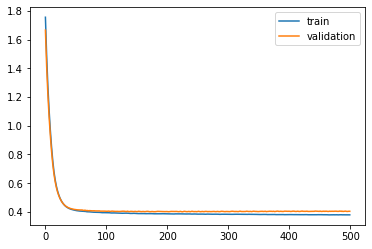

Time to train LSTM:  382.3545413017273
Entire process took:  7286.460901975632
Experiment record:
[[2, 16384, 0, 0.4023981988430023], [2, 16384, 1, 0.3960309326648712], [2, 16384, 2, 0.40780583024024963], [2, 16384, 3, 0.39581552147865295], [2, 16384, 4, 0.4038151800632477], [4, 16384, 0, 0.39536356925964355], [4, 16384, 1, 0.3919457197189331], [4, 16384, 2, 0.4002858102321625], [4, 16384, 3, 0.39295876026153564], [4, 16384, 4, 0.398652046918869], [8, 16384, 0, 0.3982013463973999], [8, 16384, 1, 0.3915925920009613], [8, 16384, 2, 0.4018445611000061], [8, 16384, 3, 0.3931550681591034], [8, 16384, 4, 0.3968653678894043], [16, 16384, 0, 0.40153276920318604], [16, 16384, 1, 0.39838308095932007], [16, 16384, 2, 0.4063693881034851], [16, 16384, 3, 0.3977952003479004], [16, 16384, 4, 0.40072834491729736]]


In [35]:
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)

num_per_fold = x_train.shape[0]//10
print(num_per_fold)

units_list = [2, 4, 8, 16] #[2, 4, 8, 16, 32] #[2, 4, 8] #[4, 8, 16, 32, 64] #[2, 4, 8, 16, 32] #
batch_size_list = [16384]#[2048, 4096, 8192]# [32768] #[4096, 8192, 16384] #[512, 1024, 2048, 4096, 8192] #, 16384] #[512, 1024, 2048] #[128, 256, 512, 1024, 2048] #[1024, 2048, 4096, 8192, 16384]#[128, 256, 512, 1024, 2048]

start_time = time.time()

exp_record = []

for units in units_list:
    for batch_s in batch_size_list:
        for f in range(5):#10
            #start = f*num_per_fold
            end = (f+1)*num_per_fold
            train1_x = x_train[:end, ]
            train2_x = x_train[end:, ]
            train_x_lstm = np.append(train2_x, train1_x, axis=0) 
            train1_y = y_train[:end, ]
            train2_y = y_train[end:, ]
            train_y_lstm = np.append(train2_y, train1_y, axis=0)

            start_time_inner = time.time()
            #config = tf.ConfigProto(log_device_placement = True)
            #config.gpu_options.visible_device_list='1'
            with tf.Session(config = tf.ConfigProto(log_device_placement = True)):
                model = Sequential()
                model.add(CuDNNLSTM(units, #CuDNNLSTM
                                    kernel_regularizer=regularizers.l2(0.01),
                                    #dropout=0.5, #recurrent_dropout=0.5,
                                    #recurrent_regularizer=regularizers.l2(0.01),
                                    #bias_regularizer=regularizers.l2(0.01),
                                    #activity_regularizer=regularizers.l2(0.01),
                                    #return_sequences=True, 
                                    input_shape=(8, 182))) #20 , 27
                model.add((Dense(1)))
                #adam = optimizers.Adam(lr=0.0015) #decay=1e-4
                #sgdm = optimizers.SGD(lr=0.001, momentum=0.9, decay=1e-7) 
                model.compile(loss='mae', optimizer='adam')#'adam'
                val_weight = "val_weights" + str(f+1) + ".hdf5"
                val_checkpointer = ModelCheckpoint(filepath=val_weight,
                                            monitor='val_loss', verbose=1,
                                            save_best_only=True)
                history = model.fit(train_x_lstm, train_y_lstm, batch_size=batch_s, 
                                    epochs=500, validation_split=0.1, 
                                    callbacks=[val_checkpointer], 
                                    verbose=2, 
                                    shuffle=False) 
                print("#################################")
                print("Number of units:", units)
                print("Batch size:", batch_s)
                print("Fold:", f)
                print("best val loss:", min(history.history['val_loss']))
                exp_record.append([units, batch_s, f, min(history.history['val_loss'])])
                print("#################################")
                if(f==4):
                    print(exp_record)
                pyplot.plot(history.history['loss'], label='train')
                pyplot.plot(history.history['val_loss'], label='validation')
                pyplot.legend()
                pyplot.show()
    end_time = time.time()
    print("Time to train LSTM: ", time.time() - start_time_inner)
print("Entire process took: ", time.time() - start_time)

print("Experiment record:")
print(exp_record)

In [7]:
exp_record = [[2, 16384, 0, 0.4023981988430023], [2, 16384, 1, 0.3960309326648712], [2, 16384, 2, 0.40780583024024963], [2, 16384, 3, 0.39581552147865295], [2, 16384, 4, 0.4038151800632477], [4, 16384, 0, 0.39536356925964355], [4, 16384, 1, 0.3919457197189331], [4, 16384, 2, 0.4002858102321625], [4, 16384, 3, 0.39295876026153564], [4, 16384, 4, 0.398652046918869], [8, 16384, 0, 0.3982013463973999], [8, 16384, 1, 0.3915925920009613], [8, 16384, 2, 0.4018445611000061], [8, 16384, 3, 0.3931550681591034], [8, 16384, 4, 0.3968653678894043], [16, 16384, 0, 0.40153276920318604], [16, 16384, 1, 0.39838308095932007], [16, 16384, 2, 0.4063693881034851], [16, 16384, 3, 0.3977952003479004], [16, 16384, 4, 0.40072834491729736]]

complete_v = np.array(exp_record)
print(complete_v.shape)

val_loss_list = []
for i in range(4):
    model_v = complete_v[(i*5):((i+1)*5), :]
    print("#######################")
    print("Units:\t\t", model_v[0, 0])
    print("Batch size:\t", model_v[0, 1])
    #print("Val loss (mean):", np.mean(model_v[:, 3]))
    #print("Val loss (Std): ", np.std(model_v[:, 3]))
    print("Val loss (mean):", np.round(np.mean(model_v[:, 3]), decimals=5))
    print("Val loss (Std): ", np.round(np.std(model_v[:, 3]), decimals=5))
    print("#######################")
    val_loss_list.append(np.mean(model_v[:, 3]))
print(min(val_loss_list))

(20, 4)
#######################
Units:		 2.0
Batch size:	 16384.0
Val loss (mean): 0.40117
Val loss (Std):  0.00464
#######################
#######################
Units:		 4.0
Batch size:	 16384.0
Val loss (mean): 0.39584
Val loss (Std):  0.00321
#######################
#######################
Units:		 8.0
Batch size:	 16384.0
Val loss (mean): 0.39633
Val loss (Std):  0.00365
#######################
#######################
Units:		 16.0
Batch size:	 16384.0
Val loss (mean): 0.40096
Val loss (Std):  0.00304
#######################
0.39584118127822876


In [37]:
###########################
# generate random numbers
# for layer 1 and 2 
# L2 search
###########################
from numpy.random import seed
seed(225) # seed 225 LSTM (0.005, 0.015) 25
          # extend lstm seed(225) (0.0, 0.005) 13
          # extend lstm seed(225) (0.0048, 0.00579) 2
          # seed 229 SimpleRNN (0.005, 0.015)
L2_list = []
for i in range(25):
    L2_list.append(np.random.uniform(0.005, 0.015))
print(min(L2_list))
print(max(L2_list))
print(L2_list)

0.005792049415665091
0.014947862817041108
[0.007921656789898646, 0.010351554082642968, 0.007298684687678438, 0.008736982766374824, 0.0109263667375467, 0.013953442360305133, 0.011012541013240673, 0.009237955848303489, 0.005792049415665091, 0.014527062799015618, 0.006325393784407547, 0.014616459026020441, 0.01342716544088697, 0.014795998368484085, 0.006583721691756861, 0.01322298542384515, 0.014340005807823544, 0.008100909893974786, 0.01019216730492731, 0.010538784320277803, 0.014947862817041108, 0.009120805423153206, 0.008560823792524312, 0.011033833681339, 0.008130816872120833]


9000
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 23s - loss: 1.1030 - val_loss: 1.0534

Epoch 00001: val_loss improved from inf to 1.05340, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0159 - val_loss: 0.9753

Epoch 00002: val_loss improved from 1.05340 to 0.97535, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9456 - val_loss: 0.9113

Epoch 00003: val_loss improved from 0.97535 to 0.91129, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.8865 - val_loss: 0.8563

Epoch 00004: val_loss improved from 0.91129 to 0.85625, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8334 - val_loss: 0.8052

Epoch 00005: val_loss improved from 0.85625 to 0.80522, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.7834 - val_loss: 0.7570

Epoch 00006: val_loss improved from 0.80522 to 0.75700, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7355 - val_loss: 0.7111

Epoch 00007: val_loss improved from 0.

 - 1s - loss: 0.4077 - val_loss: 0.4149

Epoch 00058: val_loss improved from 0.41542 to 0.41485, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4073 - val_loss: 0.4145

Epoch 00059: val_loss improved from 0.41485 to 0.41453, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4069 - val_loss: 0.4143

Epoch 00060: val_loss improved from 0.41453 to 0.41428, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4066 - val_loss: 0.4138

Epoch 00061: val_loss improved from 0.41428 to 0.41383, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4062 - val_loss: 0.4133

Epoch 00062: val_loss improved from 0.41383 to 0.41326, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4060 - val_loss: 0.4132

Epoch 00063: val_loss improved from 0.41326 to 0.41324, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4056 - val_loss: 0.4125

Epoch 00064: val_loss improved from 0.41324 to 0.41254, saving model to val_weights1.hdf5
Epoch

 - 1s - loss: 0.3968 - val_loss: 0.4029

Epoch 00118: val_loss did not improve from 0.40262
Epoch 119/500
 - 1s - loss: 0.3968 - val_loss: 0.4026

Epoch 00119: val_loss improved from 0.40262 to 0.40259, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.3967 - val_loss: 0.4025

Epoch 00120: val_loss improved from 0.40259 to 0.40254, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.3965 - val_loss: 0.4023

Epoch 00121: val_loss improved from 0.40254 to 0.40234, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3965 - val_loss: 0.4022

Epoch 00122: val_loss improved from 0.40234 to 0.40225, saving model to val_weights1.hdf5
Epoch 123/500
 - 1s - loss: 0.3964 - val_loss: 0.4023

Epoch 00123: val_loss did not improve from 0.40225
Epoch 124/500
 - 1s - loss: 0.3963 - val_loss: 0.4021

Epoch 00124: val_loss improved from 0.40225 to 0.40213, saving model to val_weights1.hdf5
Epoch 125/500
 - 1s - loss: 0.3962 - val_loss: 0.4019

Epoch 00125: val_loss 


Epoch 00184: val_loss did not improve from 0.39928
Epoch 185/500
 - 1s - loss: 0.3932 - val_loss: 0.3993

Epoch 00185: val_loss did not improve from 0.39928
Epoch 186/500
 - 1s - loss: 0.3933 - val_loss: 0.3995

Epoch 00186: val_loss did not improve from 0.39928
Epoch 187/500
 - 1s - loss: 0.3932 - val_loss: 0.3993

Epoch 00187: val_loss improved from 0.39928 to 0.39926, saving model to val_weights1.hdf5
Epoch 188/500
 - 1s - loss: 0.3930 - val_loss: 0.3992

Epoch 00188: val_loss improved from 0.39926 to 0.39924, saving model to val_weights1.hdf5
Epoch 189/500
 - 1s - loss: 0.3931 - val_loss: 0.3991

Epoch 00189: val_loss improved from 0.39924 to 0.39914, saving model to val_weights1.hdf5
Epoch 190/500
 - 1s - loss: 0.3931 - val_loss: 0.3991

Epoch 00190: val_loss improved from 0.39914 to 0.39909, saving model to val_weights1.hdf5
Epoch 191/500
 - 1s - loss: 0.3932 - val_loss: 0.3993

Epoch 00191: val_loss did not improve from 0.39909
Epoch 192/500
 - 1s - loss: 0.3930 - val_loss: 0.3

 - 1s - loss: 0.3921 - val_loss: 0.3978

Epoch 00258: val_loss improved from 0.39788 to 0.39784, saving model to val_weights1.hdf5
Epoch 259/500
 - 1s - loss: 0.3920 - val_loss: 0.3985

Epoch 00259: val_loss did not improve from 0.39784
Epoch 260/500
 - 1s - loss: 0.3921 - val_loss: 0.3980

Epoch 00260: val_loss did not improve from 0.39784
Epoch 261/500
 - 1s - loss: 0.3920 - val_loss: 0.3983

Epoch 00261: val_loss did not improve from 0.39784
Epoch 262/500
 - 1s - loss: 0.3920 - val_loss: 0.3982

Epoch 00262: val_loss did not improve from 0.39784
Epoch 263/500
 - 1s - loss: 0.3921 - val_loss: 0.3980

Epoch 00263: val_loss did not improve from 0.39784
Epoch 264/500
 - 1s - loss: 0.3920 - val_loss: 0.3980

Epoch 00264: val_loss did not improve from 0.39784
Epoch 265/500
 - 1s - loss: 0.3921 - val_loss: 0.3981

Epoch 00265: val_loss did not improve from 0.39784
Epoch 266/500
 - 1s - loss: 0.3919 - val_loss: 0.3979

Epoch 00266: val_loss did not improve from 0.39784
Epoch 267/500
 - 1s -

 - 1s - loss: 0.3914 - val_loss: 0.3973

Epoch 00332: val_loss improved from 0.39729 to 0.39726, saving model to val_weights1.hdf5
Epoch 333/500
 - 1s - loss: 0.3913 - val_loss: 0.3976

Epoch 00333: val_loss did not improve from 0.39726
Epoch 334/500
 - 1s - loss: 0.3913 - val_loss: 0.3976

Epoch 00334: val_loss did not improve from 0.39726
Epoch 335/500
 - 1s - loss: 0.3914 - val_loss: 0.3978

Epoch 00335: val_loss did not improve from 0.39726
Epoch 336/500
 - 1s - loss: 0.3915 - val_loss: 0.3975

Epoch 00336: val_loss did not improve from 0.39726
Epoch 337/500
 - 1s - loss: 0.3914 - val_loss: 0.3974

Epoch 00337: val_loss did not improve from 0.39726
Epoch 338/500
 - 1s - loss: 0.3913 - val_loss: 0.3975

Epoch 00338: val_loss did not improve from 0.39726
Epoch 339/500
 - 1s - loss: 0.3912 - val_loss: 0.3976

Epoch 00339: val_loss did not improve from 0.39726
Epoch 340/500
 - 1s - loss: 0.3913 - val_loss: 0.3978

Epoch 00340: val_loss did not improve from 0.39726
Epoch 341/500
 - 1s -

 - 1s - loss: 0.3905 - val_loss: 0.3975

Epoch 00408: val_loss did not improve from 0.39718
Epoch 409/500
 - 1s - loss: 0.3904 - val_loss: 0.3971

Epoch 00409: val_loss improved from 0.39718 to 0.39711, saving model to val_weights1.hdf5
Epoch 410/500
 - 1s - loss: 0.3904 - val_loss: 0.3977

Epoch 00410: val_loss did not improve from 0.39711
Epoch 411/500
 - 1s - loss: 0.3906 - val_loss: 0.3973

Epoch 00411: val_loss did not improve from 0.39711
Epoch 412/500
 - 1s - loss: 0.3905 - val_loss: 0.3972

Epoch 00412: val_loss did not improve from 0.39711
Epoch 413/500
 - 1s - loss: 0.3905 - val_loss: 0.3974

Epoch 00413: val_loss did not improve from 0.39711
Epoch 414/500
 - 1s - loss: 0.3904 - val_loss: 0.3974

Epoch 00414: val_loss did not improve from 0.39711
Epoch 415/500
 - 1s - loss: 0.3904 - val_loss: 0.3971

Epoch 00415: val_loss did not improve from 0.39711
Epoch 416/500
 - 1s - loss: 0.3903 - val_loss: 0.3974

Epoch 00416: val_loss did not improve from 0.39711
Epoch 417/500
 - 1s -

 - 1s - loss: 0.3898 - val_loss: 0.3966

Epoch 00482: val_loss improved from 0.39666 to 0.39655, saving model to val_weights1.hdf5
Epoch 483/500
 - 1s - loss: 0.3898 - val_loss: 0.3972

Epoch 00483: val_loss did not improve from 0.39655
Epoch 484/500
 - 1s - loss: 0.3897 - val_loss: 0.3966

Epoch 00484: val_loss did not improve from 0.39655
Epoch 485/500
 - 1s - loss: 0.3897 - val_loss: 0.3967

Epoch 00485: val_loss did not improve from 0.39655
Epoch 486/500
 - 1s - loss: 0.3896 - val_loss: 0.3970

Epoch 00486: val_loss did not improve from 0.39655
Epoch 487/500
 - 1s - loss: 0.3897 - val_loss: 0.3968

Epoch 00487: val_loss did not improve from 0.39655
Epoch 488/500
 - 1s - loss: 0.3897 - val_loss: 0.3970

Epoch 00488: val_loss did not improve from 0.39655
Epoch 489/500
 - 1s - loss: 0.3896 - val_loss: 0.3971

Epoch 00489: val_loss did not improve from 0.39655
Epoch 490/500
 - 1s - loss: 0.3897 - val_loss: 0.3970

Epoch 00490: val_loss did not improve from 0.39655
Epoch 491/500
 - 1s -

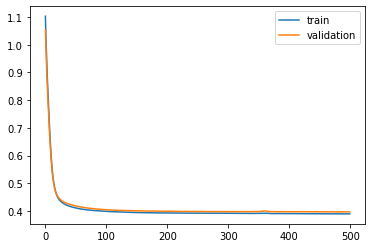

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7fa1719b9518>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 17s - loss: 1.1037 - val_loss: 1.0491

Epoch 00001: val_loss improved from inf to 1.04913, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0164 - val_loss: 0.9740

Epoch 00002: val_loss improved from 1.04913 to 0.97403, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9458 - val_loss: 0.9116

Epoch 00003: val_loss improved from 0.97403 to 0.91161, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.8865 - val_loss: 0.8565

Epoch 00004: val_loss improved from 0.91161 to 0.85648, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8332 - val_loss: 0.8048

Epoch 00005: val_loss improved from 0.85648 to 0.80476, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.7833 - val_loss: 0.7551

Epoch 00006: val_loss improved from 0.80476 to 0.75510, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7357 - val_loss: 0.7081

Epoch 00007: val_loss improved from 0.75510

 - 1s - loss: 0.4083 - val_loss: 0.4058

Epoch 00058: val_loss improved from 0.40626 to 0.40583, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4079 - val_loss: 0.4057

Epoch 00059: val_loss improved from 0.40583 to 0.40571, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4076 - val_loss: 0.4053

Epoch 00060: val_loss improved from 0.40571 to 0.40529, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4072 - val_loss: 0.4051

Epoch 00061: val_loss improved from 0.40529 to 0.40514, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4069 - val_loss: 0.4047

Epoch 00062: val_loss improved from 0.40514 to 0.40470, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4065 - val_loss: 0.4043

Epoch 00063: val_loss improved from 0.40470 to 0.40426, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4062 - val_loss: 0.4041

Epoch 00064: val_loss improved from 0.40426 to 0.40412, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3972 - val_loss: 0.3968

Epoch 00119: val_loss did not improve from 0.39661
Epoch 120/500
 - 1s - loss: 0.3972 - val_loss: 0.3967

Epoch 00120: val_loss did not improve from 0.39661
Epoch 121/500
 - 1s - loss: 0.3971 - val_loss: 0.3965

Epoch 00121: val_loss improved from 0.39661 to 0.39654, saving model to val_weights2.hdf5
Epoch 122/500
 - 1s - loss: 0.3970 - val_loss: 0.3967

Epoch 00122: val_loss did not improve from 0.39654
Epoch 123/500
 - 1s - loss: 0.3969 - val_loss: 0.3967

Epoch 00123: val_loss did not improve from 0.39654
Epoch 124/500
 - 1s - loss: 0.3969 - val_loss: 0.3963

Epoch 00124: val_loss improved from 0.39654 to 0.39627, saving model to val_weights2.hdf5
Epoch 125/500
 - 1s - loss: 0.3967 - val_loss: 0.3963

Epoch 00125: val_loss did not improve from 0.39627
Epoch 126/500
 - 1s - loss: 0.3966 - val_loss: 0.3964

Epoch 00126: val_loss did not improve from 0.39627
Epoch 127/500
 - 1s - loss: 0.3966 - val_loss: 0.3962

Epoch 00127: val_loss improved fr


Epoch 00187: val_loss improved from 0.39335 to 0.39332, saving model to val_weights2.hdf5
Epoch 188/500
 - 1s - loss: 0.3937 - val_loss: 0.3933

Epoch 00188: val_loss improved from 0.39332 to 0.39325, saving model to val_weights2.hdf5
Epoch 189/500
 - 1s - loss: 0.3937 - val_loss: 0.3933

Epoch 00189: val_loss did not improve from 0.39325
Epoch 190/500
 - 1s - loss: 0.3937 - val_loss: 0.3932

Epoch 00190: val_loss improved from 0.39325 to 0.39319, saving model to val_weights2.hdf5
Epoch 191/500
 - 1s - loss: 0.3936 - val_loss: 0.3933

Epoch 00191: val_loss did not improve from 0.39319
Epoch 192/500
 - 1s - loss: 0.3938 - val_loss: 0.3931

Epoch 00192: val_loss improved from 0.39319 to 0.39307, saving model to val_weights2.hdf5
Epoch 193/500
 - 1s - loss: 0.3937 - val_loss: 0.3938

Epoch 00193: val_loss did not improve from 0.39307
Epoch 194/500
 - 1s - loss: 0.3937 - val_loss: 0.3932

Epoch 00194: val_loss did not improve from 0.39307
Epoch 195/500
 - 1s - loss: 0.3937 - val_loss: 0.3

 - 1s - loss: 0.3926 - val_loss: 0.3927

Epoch 00260: val_loss did not improve from 0.39244
Epoch 261/500
 - 1s - loss: 0.3926 - val_loss: 0.3928

Epoch 00261: val_loss did not improve from 0.39244
Epoch 262/500
 - 1s - loss: 0.3925 - val_loss: 0.3926

Epoch 00262: val_loss did not improve from 0.39244
Epoch 263/500
 - 1s - loss: 0.3926 - val_loss: 0.3924

Epoch 00263: val_loss improved from 0.39244 to 0.39239, saving model to val_weights2.hdf5
Epoch 264/500
 - 1s - loss: 0.3925 - val_loss: 0.3930

Epoch 00264: val_loss did not improve from 0.39239
Epoch 265/500
 - 1s - loss: 0.3926 - val_loss: 0.3928

Epoch 00265: val_loss did not improve from 0.39239
Epoch 266/500
 - 1s - loss: 0.3924 - val_loss: 0.3927

Epoch 00266: val_loss did not improve from 0.39239
Epoch 267/500
 - 1s - loss: 0.3926 - val_loss: 0.3927

Epoch 00267: val_loss did not improve from 0.39239
Epoch 268/500
 - 1s - loss: 0.3924 - val_loss: 0.3927

Epoch 00268: val_loss did not improve from 0.39239
Epoch 269/500
 - 1s -


Epoch 00336: val_loss did not improve from 0.39226
Epoch 337/500
 - 1s - loss: 0.3915 - val_loss: 0.3924

Epoch 00337: val_loss did not improve from 0.39226
Epoch 338/500
 - 1s - loss: 0.3915 - val_loss: 0.3928

Epoch 00338: val_loss did not improve from 0.39226
Epoch 339/500
 - 1s - loss: 0.3916 - val_loss: 0.3924

Epoch 00339: val_loss did not improve from 0.39226
Epoch 340/500
 - 1s - loss: 0.3914 - val_loss: 0.3926

Epoch 00340: val_loss did not improve from 0.39226
Epoch 341/500
 - 1s - loss: 0.3914 - val_loss: 0.3924

Epoch 00341: val_loss did not improve from 0.39226
Epoch 342/500
 - 1s - loss: 0.3913 - val_loss: 0.3924

Epoch 00342: val_loss did not improve from 0.39226
Epoch 343/500
 - 1s - loss: 0.3916 - val_loss: 0.3927

Epoch 00343: val_loss did not improve from 0.39226
Epoch 344/500
 - 1s - loss: 0.3915 - val_loss: 0.3925

Epoch 00344: val_loss did not improve from 0.39226
Epoch 345/500
 - 1s - loss: 0.3916 - val_loss: 0.3924

Epoch 00345: val_loss did not improve from 0.


Epoch 00412: val_loss did not improve from 0.39198
Epoch 413/500
 - 1s - loss: 0.3908 - val_loss: 0.3920

Epoch 00413: val_loss did not improve from 0.39198
Epoch 414/500
 - 1s - loss: 0.3909 - val_loss: 0.3923

Epoch 00414: val_loss did not improve from 0.39198
Epoch 415/500
 - 1s - loss: 0.3907 - val_loss: 0.3921

Epoch 00415: val_loss did not improve from 0.39198
Epoch 416/500
 - 1s - loss: 0.3908 - val_loss: 0.3925

Epoch 00416: val_loss did not improve from 0.39198
Epoch 417/500
 - 1s - loss: 0.3907 - val_loss: 0.3922

Epoch 00417: val_loss did not improve from 0.39198
Epoch 418/500
 - 1s - loss: 0.3907 - val_loss: 0.3923

Epoch 00418: val_loss did not improve from 0.39198
Epoch 419/500
 - 1s - loss: 0.3907 - val_loss: 0.3922

Epoch 00419: val_loss did not improve from 0.39198
Epoch 420/500
 - 1s - loss: 0.3907 - val_loss: 0.3925

Epoch 00420: val_loss did not improve from 0.39198
Epoch 421/500
 - 1s - loss: 0.3906 - val_loss: 0.3923

Epoch 00421: val_loss did not improve from 0.


Epoch 00489: val_loss did not improve from 0.39190
Epoch 490/500
 - 1s - loss: 0.3902 - val_loss: 0.3919

Epoch 00490: val_loss did not improve from 0.39190
Epoch 491/500
 - 1s - loss: 0.3901 - val_loss: 0.3923

Epoch 00491: val_loss did not improve from 0.39190
Epoch 492/500
 - 1s - loss: 0.3900 - val_loss: 0.3922

Epoch 00492: val_loss did not improve from 0.39190
Epoch 493/500
 - 1s - loss: 0.3903 - val_loss: 0.3919

Epoch 00493: val_loss improved from 0.39190 to 0.39188, saving model to val_weights2.hdf5
Epoch 494/500
 - 1s - loss: 0.3902 - val_loss: 0.3923

Epoch 00494: val_loss did not improve from 0.39188
Epoch 495/500
 - 1s - loss: 0.3903 - val_loss: 0.3920

Epoch 00495: val_loss did not improve from 0.39188
Epoch 496/500
 - 1s - loss: 0.3904 - val_loss: 0.3922

Epoch 00496: val_loss did not improve from 0.39188
Epoch 497/500
 - 1s - loss: 0.3902 - val_loss: 0.3923

Epoch 00497: val_loss did not improve from 0.39188
Epoch 498/500
 - 1s - loss: 0.3904 - val_loss: 0.3921

Epoch 

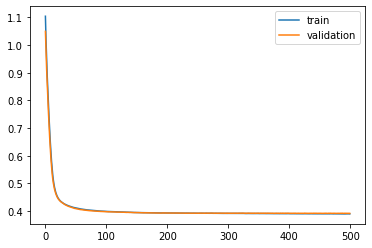

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 17s - loss: 1.1051 - val_loss: 1.0370

Epoch 00001: val_loss improved from inf to 1.03699, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0181 - val_loss: 0.9603

Epoch 00002: val_loss improved from 1.03699 to 0.96032, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9475 - val_loss: 0.8976

Epoch 00003: val_loss improved from 0.96032 to 0.89761, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.8881 - val_loss: 0.8434

Epoch 00004: val_loss improved from 0.89761 to 0.84342, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8347 - val_loss: 0.7934

Epoch 00005: val_loss improved from 0.84342 to 0.79345, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.7846 - val_loss: 0.7461

Epoch 00006: val_loss improved from 0.79345 to 0.74608, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7366 - val_loss: 0.7020

Epoch 00007: val_loss improved from 0.74608

 - 1s - loss: 0.4076 - val_loss: 0.4153

Epoch 00058: val_loss improved from 0.41567 to 0.41533, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4072 - val_loss: 0.4150

Epoch 00059: val_loss improved from 0.41533 to 0.41505, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4069 - val_loss: 0.4148

Epoch 00060: val_loss improved from 0.41505 to 0.41481, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4065 - val_loss: 0.4146

Epoch 00061: val_loss improved from 0.41481 to 0.41462, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4062 - val_loss: 0.4142

Epoch 00062: val_loss improved from 0.41462 to 0.41417, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4059 - val_loss: 0.4140

Epoch 00063: val_loss improved from 0.41417 to 0.41398, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4056 - val_loss: 0.4134

Epoch 00064: val_loss improved from 0.41398 to 0.41335, saving model to val_weights3.hdf5
Epoch


Epoch 00120: val_loss did not improve from 0.40640
Epoch 121/500
 - 1s - loss: 0.3963 - val_loss: 0.4062

Epoch 00121: val_loss improved from 0.40640 to 0.40623, saving model to val_weights3.hdf5
Epoch 122/500
 - 1s - loss: 0.3962 - val_loss: 0.4064

Epoch 00122: val_loss did not improve from 0.40623
Epoch 123/500
 - 1s - loss: 0.3960 - val_loss: 0.4060

Epoch 00123: val_loss improved from 0.40623 to 0.40595, saving model to val_weights3.hdf5
Epoch 124/500
 - 1s - loss: 0.3960 - val_loss: 0.4062

Epoch 00124: val_loss did not improve from 0.40595
Epoch 125/500
 - 1s - loss: 0.3959 - val_loss: 0.4060

Epoch 00125: val_loss did not improve from 0.40595
Epoch 126/500
 - 1s - loss: 0.3958 - val_loss: 0.4061

Epoch 00126: val_loss did not improve from 0.40595
Epoch 127/500
 - 1s - loss: 0.3959 - val_loss: 0.4062

Epoch 00127: val_loss did not improve from 0.40595
Epoch 128/500
 - 1s - loss: 0.3959 - val_loss: 0.4060

Epoch 00128: val_loss did not improve from 0.40595
Epoch 129/500
 - 1s - 


Epoch 00188: val_loss did not improve from 0.40328
Epoch 189/500
 - 1s - loss: 0.3931 - val_loss: 0.4032

Epoch 00189: val_loss improved from 0.40328 to 0.40321, saving model to val_weights3.hdf5
Epoch 190/500
 - 1s - loss: 0.3929 - val_loss: 0.4037

Epoch 00190: val_loss did not improve from 0.40321
Epoch 191/500
 - 1s - loss: 0.3928 - val_loss: 0.4031

Epoch 00191: val_loss improved from 0.40321 to 0.40308, saving model to val_weights3.hdf5
Epoch 192/500
 - 1s - loss: 0.3928 - val_loss: 0.4034

Epoch 00192: val_loss did not improve from 0.40308
Epoch 193/500
 - 1s - loss: 0.3928 - val_loss: 0.4034

Epoch 00193: val_loss did not improve from 0.40308
Epoch 194/500
 - 1s - loss: 0.3927 - val_loss: 0.4032

Epoch 00194: val_loss did not improve from 0.40308
Epoch 195/500
 - 1s - loss: 0.3927 - val_loss: 0.4034

Epoch 00195: val_loss did not improve from 0.40308
Epoch 196/500
 - 1s - loss: 0.3926 - val_loss: 0.4033

Epoch 00196: val_loss did not improve from 0.40308
Epoch 197/500
 - 1s - 


Epoch 00262: val_loss did not improve from 0.40224
Epoch 263/500
 - 1s - loss: 0.3917 - val_loss: 0.4022

Epoch 00263: val_loss did not improve from 0.40224
Epoch 264/500
 - 1s - loss: 0.3917 - val_loss: 0.4023

Epoch 00264: val_loss did not improve from 0.40224
Epoch 265/500
 - 1s - loss: 0.3918 - val_loss: 0.4025

Epoch 00265: val_loss did not improve from 0.40224
Epoch 266/500
 - 1s - loss: 0.3916 - val_loss: 0.4021

Epoch 00266: val_loss improved from 0.40224 to 0.40211, saving model to val_weights3.hdf5
Epoch 267/500
 - 1s - loss: 0.3916 - val_loss: 0.4023

Epoch 00267: val_loss did not improve from 0.40211
Epoch 268/500
 - 1s - loss: 0.3915 - val_loss: 0.4021

Epoch 00268: val_loss did not improve from 0.40211
Epoch 269/500
 - 1s - loss: 0.3916 - val_loss: 0.4021

Epoch 00269: val_loss did not improve from 0.40211
Epoch 270/500
 - 1s - loss: 0.3915 - val_loss: 0.4023

Epoch 00270: val_loss did not improve from 0.40211
Epoch 271/500
 - 1s - loss: 0.3917 - val_loss: 0.4022

Epoch 

 - 1s - loss: 0.3908 - val_loss: 0.4016

Epoch 00336: val_loss did not improve from 0.40135
Epoch 337/500
 - 1s - loss: 0.3908 - val_loss: 0.4014

Epoch 00337: val_loss did not improve from 0.40135
Epoch 338/500
 - 1s - loss: 0.3906 - val_loss: 0.4017

Epoch 00338: val_loss did not improve from 0.40135
Epoch 339/500
 - 1s - loss: 0.3906 - val_loss: 0.4015

Epoch 00339: val_loss did not improve from 0.40135
Epoch 340/500
 - 1s - loss: 0.3907 - val_loss: 0.4016

Epoch 00340: val_loss did not improve from 0.40135
Epoch 341/500
 - 1s - loss: 0.3907 - val_loss: 0.4016

Epoch 00341: val_loss did not improve from 0.40135
Epoch 342/500
 - 1s - loss: 0.3908 - val_loss: 0.4020

Epoch 00342: val_loss did not improve from 0.40135
Epoch 343/500
 - 1s - loss: 0.3907 - val_loss: 0.4013

Epoch 00343: val_loss improved from 0.40135 to 0.40133, saving model to val_weights3.hdf5
Epoch 344/500
 - 1s - loss: 0.3906 - val_loss: 0.4016

Epoch 00344: val_loss did not improve from 0.40133
Epoch 345/500
 - 1s -


Epoch 00411: val_loss did not improve from 0.40083
Epoch 412/500
 - 1s - loss: 0.3897 - val_loss: 0.4011

Epoch 00412: val_loss did not improve from 0.40083
Epoch 413/500
 - 1s - loss: 0.3900 - val_loss: 0.4013

Epoch 00413: val_loss did not improve from 0.40083
Epoch 414/500
 - 1s - loss: 0.3899 - val_loss: 0.4012

Epoch 00414: val_loss did not improve from 0.40083
Epoch 415/500
 - 1s - loss: 0.3899 - val_loss: 0.4011

Epoch 00415: val_loss did not improve from 0.40083
Epoch 416/500
 - 1s - loss: 0.3898 - val_loss: 0.4012

Epoch 00416: val_loss did not improve from 0.40083
Epoch 417/500
 - 1s - loss: 0.3899 - val_loss: 0.4011

Epoch 00417: val_loss did not improve from 0.40083
Epoch 418/500
 - 1s - loss: 0.3897 - val_loss: 0.4010

Epoch 00418: val_loss did not improve from 0.40083
Epoch 419/500
 - 1s - loss: 0.3898 - val_loss: 0.4011

Epoch 00419: val_loss did not improve from 0.40083
Epoch 420/500
 - 1s - loss: 0.3896 - val_loss: 0.4010

Epoch 00420: val_loss did not improve from 0.

 - 1s - loss: 0.3894 - val_loss: 0.4008

Epoch 00488: val_loss did not improve from 0.40051
Epoch 489/500
 - 1s - loss: 0.3892 - val_loss: 0.4009

Epoch 00489: val_loss did not improve from 0.40051
Epoch 490/500
 - 1s - loss: 0.3892 - val_loss: 0.4010

Epoch 00490: val_loss did not improve from 0.40051
Epoch 491/500
 - 1s - loss: 0.3893 - val_loss: 0.4011

Epoch 00491: val_loss did not improve from 0.40051
Epoch 492/500
 - 1s - loss: 0.3893 - val_loss: 0.4010

Epoch 00492: val_loss did not improve from 0.40051
Epoch 493/500
 - 1s - loss: 0.3891 - val_loss: 0.4008

Epoch 00493: val_loss did not improve from 0.40051
Epoch 494/500
 - 1s - loss: 0.3891 - val_loss: 0.4009

Epoch 00494: val_loss did not improve from 0.40051
Epoch 495/500
 - 1s - loss: 0.3893 - val_loss: 0.4010

Epoch 00495: val_loss did not improve from 0.40051
Epoch 496/500
 - 1s - loss: 0.3890 - val_loss: 0.4009

Epoch 00496: val_loss did not improve from 0.40051
Epoch 497/500
 - 1s - loss: 0.3893 - val_loss: 0.4011

Epoch

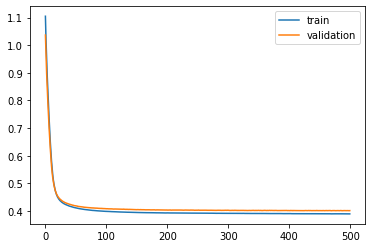

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 20s - loss: 1.1043 - val_loss: 1.0426

Epoch 00001: val_loss improved from inf to 1.04264, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0174 - val_loss: 0.9655

Epoch 00002: val_loss improved from 1.04264 to 0.96547, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9470 - val_loss: 0.9026

Epoch 00003: val_loss improved from 0.96547 to 0.90260, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.8876 - val_loss: 0.8476

Epoch 00004: val_loss improved from 0.90260 to 0.84757, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8343 - val_loss: 0.7961

Epoch 00005: val_loss improved from 0.84757 to 0.79607, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.7844 - val_loss: 0.7471

Epoch 00006: val_loss improved from 0.79607 to 0.74706, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7368 - val_loss: 0.7008

Epoch 00007: val_loss improved from 0.74706

 - 1s - loss: 0.4085 - val_loss: 0.4079

Epoch 00058: val_loss improved from 0.40807 to 0.40788, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4081 - val_loss: 0.4073

Epoch 00059: val_loss improved from 0.40788 to 0.40725, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4077 - val_loss: 0.4072

Epoch 00060: val_loss improved from 0.40725 to 0.40723, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4073 - val_loss: 0.4067

Epoch 00061: val_loss improved from 0.40723 to 0.40675, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4070 - val_loss: 0.4067

Epoch 00062: val_loss improved from 0.40675 to 0.40673, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4067 - val_loss: 0.4062

Epoch 00063: val_loss improved from 0.40673 to 0.40618, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4063 - val_loss: 0.4060

Epoch 00064: val_loss improved from 0.40618 to 0.40597, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.3973 - val_loss: 0.3966

Epoch 00118: val_loss did not improve from 0.39641
Epoch 119/500
 - 1s - loss: 0.3972 - val_loss: 0.3961

Epoch 00119: val_loss improved from 0.39641 to 0.39612, saving model to val_weights4.hdf5
Epoch 120/500
 - 1s - loss: 0.3971 - val_loss: 0.3963

Epoch 00120: val_loss did not improve from 0.39612
Epoch 121/500
 - 1s - loss: 0.3970 - val_loss: 0.3965

Epoch 00121: val_loss did not improve from 0.39612
Epoch 122/500
 - 1s - loss: 0.3970 - val_loss: 0.3964

Epoch 00122: val_loss did not improve from 0.39612
Epoch 123/500
 - 1s - loss: 0.3969 - val_loss: 0.3959

Epoch 00123: val_loss improved from 0.39612 to 0.39594, saving model to val_weights4.hdf5
Epoch 124/500
 - 1s - loss: 0.3969 - val_loss: 0.3961

Epoch 00124: val_loss did not improve from 0.39594
Epoch 125/500
 - 1s - loss: 0.3967 - val_loss: 0.3961

Epoch 00125: val_loss did not improve from 0.39594
Epoch 126/500
 - 1s - loss: 0.3967 - val_loss: 0.3964

Epoch 00126: val_loss did not imp


Epoch 00191: val_loss did not improve from 0.39435
Epoch 192/500
 - 1s - loss: 0.3940 - val_loss: 0.3947

Epoch 00192: val_loss did not improve from 0.39435
Epoch 193/500
 - 1s - loss: 0.3941 - val_loss: 0.3948

Epoch 00193: val_loss did not improve from 0.39435
Epoch 194/500
 - 1s - loss: 0.3941 - val_loss: 0.3948

Epoch 00194: val_loss did not improve from 0.39435
Epoch 195/500
 - 1s - loss: 0.3942 - val_loss: 0.3947

Epoch 00195: val_loss did not improve from 0.39435
Epoch 196/500
 - 1s - loss: 0.3943 - val_loss: 0.3949

Epoch 00196: val_loss did not improve from 0.39435
Epoch 197/500
 - 1s - loss: 0.3944 - val_loss: 0.3944

Epoch 00197: val_loss did not improve from 0.39435
Epoch 198/500
 - 1s - loss: 0.3944 - val_loss: 0.3946

Epoch 00198: val_loss did not improve from 0.39435
Epoch 199/500
 - 1s - loss: 0.3944 - val_loss: 0.3942

Epoch 00199: val_loss improved from 0.39435 to 0.39416, saving model to val_weights4.hdf5
Epoch 200/500
 - 1s - loss: 0.3944 - val_loss: 0.3943

Epoch 


Epoch 00266: val_loss did not improve from 0.39294
Epoch 267/500
 - 1s - loss: 0.3927 - val_loss: 0.3937

Epoch 00267: val_loss did not improve from 0.39294
Epoch 268/500
 - 1s - loss: 0.3927 - val_loss: 0.3939

Epoch 00268: val_loss did not improve from 0.39294
Epoch 269/500
 - 1s - loss: 0.3926 - val_loss: 0.3937

Epoch 00269: val_loss did not improve from 0.39294
Epoch 270/500
 - 1s - loss: 0.3926 - val_loss: 0.3938

Epoch 00270: val_loss did not improve from 0.39294
Epoch 271/500
 - 1s - loss: 0.3926 - val_loss: 0.3934

Epoch 00271: val_loss did not improve from 0.39294
Epoch 272/500
 - 1s - loss: 0.3926 - val_loss: 0.3937

Epoch 00272: val_loss did not improve from 0.39294
Epoch 273/500
 - 1s - loss: 0.3927 - val_loss: 0.3934

Epoch 00273: val_loss did not improve from 0.39294
Epoch 274/500
 - 1s - loss: 0.3926 - val_loss: 0.3936

Epoch 00274: val_loss did not improve from 0.39294
Epoch 275/500
 - 1s - loss: 0.3927 - val_loss: 0.3935

Epoch 00275: val_loss did not improve from 0.

 - 1s - loss: 0.3919 - val_loss: 0.3924

Epoch 00342: val_loss improved from 0.39248 to 0.39241, saving model to val_weights4.hdf5
Epoch 343/500
 - 1s - loss: 0.3919 - val_loss: 0.3925

Epoch 00343: val_loss did not improve from 0.39241
Epoch 344/500
 - 1s - loss: 0.3918 - val_loss: 0.3927

Epoch 00344: val_loss did not improve from 0.39241
Epoch 345/500
 - 1s - loss: 0.3918 - val_loss: 0.3926

Epoch 00345: val_loss did not improve from 0.39241
Epoch 346/500
 - 1s - loss: 0.3917 - val_loss: 0.3927

Epoch 00346: val_loss did not improve from 0.39241
Epoch 347/500
 - 1s - loss: 0.3919 - val_loss: 0.3929

Epoch 00347: val_loss did not improve from 0.39241
Epoch 348/500
 - 1s - loss: 0.3917 - val_loss: 0.3926

Epoch 00348: val_loss did not improve from 0.39241
Epoch 349/500
 - 1s - loss: 0.3917 - val_loss: 0.3929

Epoch 00349: val_loss did not improve from 0.39241
Epoch 350/500
 - 1s - loss: 0.3918 - val_loss: 0.3927

Epoch 00350: val_loss did not improve from 0.39241
Epoch 351/500
 - 1s -


Epoch 00418: val_loss did not improve from 0.39190
Epoch 419/500
 - 1s - loss: 0.3915 - val_loss: 0.3926

Epoch 00419: val_loss did not improve from 0.39190
Epoch 420/500
 - 1s - loss: 0.3915 - val_loss: 0.3927

Epoch 00420: val_loss did not improve from 0.39190
Epoch 421/500
 - 1s - loss: 0.3914 - val_loss: 0.3925

Epoch 00421: val_loss did not improve from 0.39190
Epoch 422/500
 - 1s - loss: 0.3913 - val_loss: 0.3924

Epoch 00422: val_loss did not improve from 0.39190
Epoch 423/500
 - 1s - loss: 0.3913 - val_loss: 0.3923

Epoch 00423: val_loss did not improve from 0.39190
Epoch 424/500
 - 1s - loss: 0.3911 - val_loss: 0.3925

Epoch 00424: val_loss did not improve from 0.39190
Epoch 425/500
 - 1s - loss: 0.3911 - val_loss: 0.3922

Epoch 00425: val_loss did not improve from 0.39190
Epoch 426/500
 - 1s - loss: 0.3910 - val_loss: 0.3923

Epoch 00426: val_loss did not improve from 0.39190
Epoch 427/500
 - 1s - loss: 0.3910 - val_loss: 0.3920

Epoch 00427: val_loss did not improve from 0.

 - 1s - loss: 0.3908 - val_loss: 0.3919

Epoch 00495: val_loss did not improve from 0.39154
Epoch 496/500
 - 1s - loss: 0.3909 - val_loss: 0.3920

Epoch 00496: val_loss did not improve from 0.39154
Epoch 497/500
 - 1s - loss: 0.3908 - val_loss: 0.3922

Epoch 00497: val_loss did not improve from 0.39154
Epoch 498/500
 - 1s - loss: 0.3908 - val_loss: 0.3917

Epoch 00498: val_loss did not improve from 0.39154
Epoch 499/500
 - 1s - loss: 0.3908 - val_loss: 0.3924

Epoch 00499: val_loss did not improve from 0.39154
Epoch 500/500
 - 1s - loss: 0.3907 - val_loss: 0.3917

Epoch 00500: val_loss did not improve from 0.39154
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.007921656789898646
best val loss: 0.3915418761041429
#################################


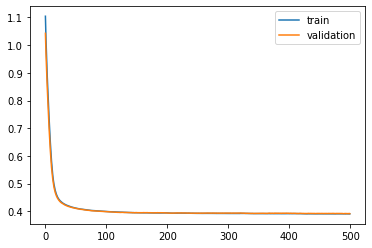

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 51s - loss: 1.1047 - val_loss: 1.0407

Epoch 00001: val_loss improved from inf to 1.04069, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0177 - val_loss: 0.9650

Epoch 00002: val_loss improved from 1.04069 to 0.96502, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9471 - val_loss: 0.9031

Epoch 00003: val_loss improved from 0.96502 to 0.90309, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.8878 - val_loss: 0.8486

Epoch 00004: val_loss improved from 0.90309 to 0.84861, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8344 - val_loss: 0.7987

Epoch 00005: val_loss improved from 0.84861 to 0.79870, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.7842 - val_loss: 0.7509

Epoch 00006: val_loss improved from 0.79870 to 0.75088, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7365 - val_loss: 0.7050

Epoch 00007: val_loss improved from 0.75088

 - 1s - loss: 0.4079 - val_loss: 0.4116

Epoch 00058: val_loss improved from 0.41209 to 0.41161, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4075 - val_loss: 0.4114

Epoch 00059: val_loss improved from 0.41161 to 0.41145, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4071 - val_loss: 0.4113

Epoch 00060: val_loss improved from 0.41145 to 0.41129, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4067 - val_loss: 0.4107

Epoch 00061: val_loss improved from 0.41129 to 0.41067, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4064 - val_loss: 0.4108

Epoch 00062: val_loss did not improve from 0.41067
Epoch 63/500
 - 1s - loss: 0.4061 - val_loss: 0.4103

Epoch 00063: val_loss improved from 0.41067 to 0.41033, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4059 - val_loss: 0.4101

Epoch 00064: val_loss improved from 0.41033 to 0.41013, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4055 - val_loss

 - 1s - loss: 0.3972 - val_loss: 0.4025

Epoch 00120: val_loss improved from 0.40260 to 0.40255, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.3971 - val_loss: 0.4028

Epoch 00121: val_loss did not improve from 0.40255
Epoch 122/500
 - 1s - loss: 0.3970 - val_loss: 0.4024

Epoch 00122: val_loss improved from 0.40255 to 0.40241, saving model to val_weights5.hdf5
Epoch 123/500
 - 1s - loss: 0.3969 - val_loss: 0.4023

Epoch 00123: val_loss improved from 0.40241 to 0.40234, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3967 - val_loss: 0.4019

Epoch 00124: val_loss improved from 0.40234 to 0.40190, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3968 - val_loss: 0.4020

Epoch 00125: val_loss did not improve from 0.40190
Epoch 126/500
 - 1s - loss: 0.3966 - val_loss: 0.4019

Epoch 00126: val_loss improved from 0.40190 to 0.40190, saving model to val_weights5.hdf5
Epoch 127/500
 - 1s - loss: 0.3965 - val_loss: 0.4019

Epoch 00127: val_loss 


Epoch 00186: val_loss did not improve from 0.39831
Epoch 187/500
 - 1s - loss: 0.3939 - val_loss: 0.3984

Epoch 00187: val_loss did not improve from 0.39831
Epoch 188/500
 - 1s - loss: 0.3940 - val_loss: 0.3985

Epoch 00188: val_loss did not improve from 0.39831
Epoch 189/500
 - 1s - loss: 0.3938 - val_loss: 0.3985

Epoch 00189: val_loss did not improve from 0.39831
Epoch 190/500
 - 1s - loss: 0.3938 - val_loss: 0.3986

Epoch 00190: val_loss did not improve from 0.39831
Epoch 191/500
 - 1s - loss: 0.3937 - val_loss: 0.3984

Epoch 00191: val_loss did not improve from 0.39831
Epoch 192/500
 - 1s - loss: 0.3937 - val_loss: 0.3981

Epoch 00192: val_loss improved from 0.39831 to 0.39805, saving model to val_weights5.hdf5
Epoch 193/500
 - 1s - loss: 0.3936 - val_loss: 0.3983

Epoch 00193: val_loss did not improve from 0.39805
Epoch 194/500
 - 1s - loss: 0.3936 - val_loss: 0.3986

Epoch 00194: val_loss did not improve from 0.39805
Epoch 195/500
 - 1s - loss: 0.3935 - val_loss: 0.3980

Epoch 


Epoch 00261: val_loss did not improve from 0.39757
Epoch 262/500
 - 1s - loss: 0.3921 - val_loss: 0.3977

Epoch 00262: val_loss did not improve from 0.39757
Epoch 263/500
 - 1s - loss: 0.3922 - val_loss: 0.3977

Epoch 00263: val_loss did not improve from 0.39757
Epoch 264/500
 - 1s - loss: 0.3921 - val_loss: 0.3976

Epoch 00264: val_loss did not improve from 0.39757
Epoch 265/500
 - 1s - loss: 0.3922 - val_loss: 0.3977

Epoch 00265: val_loss did not improve from 0.39757
Epoch 266/500
 - 1s - loss: 0.3924 - val_loss: 0.3978

Epoch 00266: val_loss did not improve from 0.39757
Epoch 267/500
 - 1s - loss: 0.3923 - val_loss: 0.3974

Epoch 00267: val_loss improved from 0.39757 to 0.39741, saving model to val_weights5.hdf5
Epoch 268/500
 - 1s - loss: 0.3924 - val_loss: 0.3977

Epoch 00268: val_loss did not improve from 0.39741
Epoch 269/500
 - 1s - loss: 0.3923 - val_loss: 0.3982

Epoch 00269: val_loss did not improve from 0.39741
Epoch 270/500
 - 1s - loss: 0.3922 - val_loss: 0.3975

Epoch 


Epoch 00336: val_loss did not improve from 0.39666
Epoch 337/500
 - 1s - loss: 0.3917 - val_loss: 0.3977

Epoch 00337: val_loss did not improve from 0.39666
Epoch 338/500
 - 1s - loss: 0.3917 - val_loss: 0.3972

Epoch 00338: val_loss did not improve from 0.39666
Epoch 339/500
 - 1s - loss: 0.3916 - val_loss: 0.3977

Epoch 00339: val_loss did not improve from 0.39666
Epoch 340/500
 - 1s - loss: 0.3916 - val_loss: 0.3977

Epoch 00340: val_loss did not improve from 0.39666
Epoch 341/500
 - 1s - loss: 0.3916 - val_loss: 0.3979

Epoch 00341: val_loss did not improve from 0.39666
Epoch 342/500
 - 1s - loss: 0.3917 - val_loss: 0.3975

Epoch 00342: val_loss did not improve from 0.39666
Epoch 343/500
 - 1s - loss: 0.3918 - val_loss: 0.3976

Epoch 00343: val_loss did not improve from 0.39666
Epoch 344/500
 - 1s - loss: 0.3917 - val_loss: 0.3978

Epoch 00344: val_loss did not improve from 0.39666
Epoch 345/500
 - 1s - loss: 0.3916 - val_loss: 0.3975

Epoch 00345: val_loss did not improve from 0.


Epoch 00411: val_loss did not improve from 0.39627
Epoch 412/500
 - 1s - loss: 0.3908 - val_loss: 0.3966

Epoch 00412: val_loss did not improve from 0.39627
Epoch 413/500
 - 1s - loss: 0.3907 - val_loss: 0.3967

Epoch 00413: val_loss did not improve from 0.39627
Epoch 414/500
 - 1s - loss: 0.3907 - val_loss: 0.3966

Epoch 00414: val_loss did not improve from 0.39627
Epoch 415/500
 - 1s - loss: 0.3907 - val_loss: 0.3967

Epoch 00415: val_loss did not improve from 0.39627
Epoch 416/500
 - 1s - loss: 0.3906 - val_loss: 0.3971

Epoch 00416: val_loss did not improve from 0.39627
Epoch 417/500
 - 1s - loss: 0.3908 - val_loss: 0.3967

Epoch 00417: val_loss did not improve from 0.39627
Epoch 418/500
 - 1s - loss: 0.3906 - val_loss: 0.3963

Epoch 00418: val_loss did not improve from 0.39627
Epoch 419/500
 - 1s - loss: 0.3907 - val_loss: 0.3964

Epoch 00419: val_loss did not improve from 0.39627
Epoch 420/500
 - 1s - loss: 0.3905 - val_loss: 0.3966

Epoch 00420: val_loss did not improve from 0.

 - 1s - loss: 0.3905 - val_loss: 0.3968

Epoch 00489: val_loss did not improve from 0.39627
Epoch 490/500
 - 1s - loss: 0.3905 - val_loss: 0.3966

Epoch 00490: val_loss did not improve from 0.39627
Epoch 491/500
 - 1s - loss: 0.3904 - val_loss: 0.3964

Epoch 00491: val_loss did not improve from 0.39627
Epoch 492/500
 - 1s - loss: 0.3903 - val_loss: 0.3966

Epoch 00492: val_loss did not improve from 0.39627
Epoch 493/500
 - 1s - loss: 0.3903 - val_loss: 0.3966

Epoch 00493: val_loss did not improve from 0.39627
Epoch 494/500
 - 1s - loss: 0.3901 - val_loss: 0.3965

Epoch 00494: val_loss did not improve from 0.39627
Epoch 495/500
 - 1s - loss: 0.3901 - val_loss: 0.3968

Epoch 00495: val_loss did not improve from 0.39627
Epoch 496/500
 - 1s - loss: 0.3900 - val_loss: 0.3964

Epoch 00496: val_loss did not improve from 0.39627
Epoch 497/500
 - 1s - loss: 0.3899 - val_loss: 0.3966

Epoch 00497: val_loss did not improve from 0.39627
Epoch 498/500
 - 1s - loss: 0.3898 - val_loss: 0.3967

Epoch

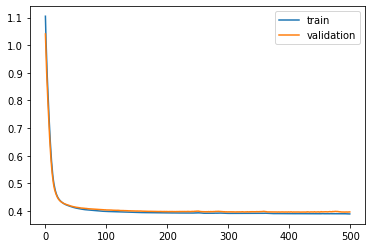

Time to train LSTM:  406.7116160392761
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 28s - loss: 1.1712 - val_loss: 1.1166

Epoch 00001: val_loss improved from inf to 1.11658, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0750 - val_loss: 1.0296

Epoch 00002: val_loss improved from 1.11658 to 1.02962, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9959 - val_loss: 0.9573

Epoch 00003: val_loss improved from 1.02962 to 0.95725, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9288 - val_loss: 0.8946

Epoch 00004: val_loss improved from 0.95725 to 0.89459, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8686 - val_loss: 0.8368

Epoch 00005: val_loss improved from 0.89459 to 0.83685, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8123 - val_loss: 0.7829

Epoch 00006: val_loss improved from 0.83685 to 0.78285, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7587 - val_loss: 0.7315

Epoc


Epoch 00057: val_loss improved from 0.41583 to 0.41541, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4082 - val_loss: 0.4149

Epoch 00058: val_loss improved from 0.41541 to 0.41495, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4078 - val_loss: 0.4145

Epoch 00059: val_loss improved from 0.41495 to 0.41454, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4077 - val_loss: 0.4141

Epoch 00060: val_loss improved from 0.41454 to 0.41407, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4071 - val_loss: 0.4139

Epoch 00061: val_loss improved from 0.41407 to 0.41388, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4069 - val_loss: 0.4132

Epoch 00062: val_loss improved from 0.41388 to 0.41320, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4064 - val_loss: 0.4130

Epoch 00063: val_loss improved from 0.41320 to 0.41302, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4063 - val_loss:

 - 1s - loss: 0.3975 - val_loss: 0.4029

Epoch 00118: val_loss did not improve from 0.40264
Epoch 119/500
 - 1s - loss: 0.3974 - val_loss: 0.4028

Epoch 00119: val_loss did not improve from 0.40264
Epoch 120/500
 - 1s - loss: 0.3974 - val_loss: 0.4028

Epoch 00120: val_loss did not improve from 0.40264
Epoch 121/500
 - 1s - loss: 0.3973 - val_loss: 0.4027

Epoch 00121: val_loss did not improve from 0.40264
Epoch 122/500
 - 1s - loss: 0.3972 - val_loss: 0.4028

Epoch 00122: val_loss did not improve from 0.40264
Epoch 123/500
 - 1s - loss: 0.3971 - val_loss: 0.4026

Epoch 00123: val_loss improved from 0.40264 to 0.40257, saving model to val_weights1.hdf5
Epoch 124/500
 - 1s - loss: 0.3970 - val_loss: 0.4024

Epoch 00124: val_loss improved from 0.40257 to 0.40238, saving model to val_weights1.hdf5
Epoch 125/500
 - 1s - loss: 0.3970 - val_loss: 0.4027

Epoch 00125: val_loss did not improve from 0.40238
Epoch 126/500
 - 1s - loss: 0.3969 - val_loss: 0.4022

Epoch 00126: val_loss improved fr

 - 1s - loss: 0.3940 - val_loss: 0.3993

Epoch 00186: val_loss improved from 0.39935 to 0.39933, saving model to val_weights1.hdf5
Epoch 187/500
 - 1s - loss: 0.3940 - val_loss: 0.3997

Epoch 00187: val_loss did not improve from 0.39933
Epoch 188/500
 - 1s - loss: 0.3940 - val_loss: 0.3993

Epoch 00188: val_loss improved from 0.39933 to 0.39926, saving model to val_weights1.hdf5
Epoch 189/500
 - 1s - loss: 0.3940 - val_loss: 0.3993

Epoch 00189: val_loss did not improve from 0.39926
Epoch 190/500
 - 1s - loss: 0.3940 - val_loss: 0.3995

Epoch 00190: val_loss did not improve from 0.39926
Epoch 191/500
 - 1s - loss: 0.3940 - val_loss: 0.3993

Epoch 00191: val_loss did not improve from 0.39926
Epoch 192/500
 - 1s - loss: 0.3939 - val_loss: 0.3994

Epoch 00192: val_loss did not improve from 0.39926
Epoch 193/500
 - 1s - loss: 0.3938 - val_loss: 0.3993

Epoch 00193: val_loss did not improve from 0.39926
Epoch 194/500
 - 1s - loss: 0.3938 - val_loss: 0.3994

Epoch 00194: val_loss did not imp

 - 1s - loss: 0.3928 - val_loss: 0.3984

Epoch 00259: val_loss did not improve from 0.39793
Epoch 260/500
 - 1s - loss: 0.3928 - val_loss: 0.3983

Epoch 00260: val_loss did not improve from 0.39793
Epoch 261/500
 - 1s - loss: 0.3929 - val_loss: 0.3984

Epoch 00261: val_loss did not improve from 0.39793
Epoch 262/500
 - 1s - loss: 0.3928 - val_loss: 0.3980

Epoch 00262: val_loss did not improve from 0.39793
Epoch 263/500
 - 1s - loss: 0.3929 - val_loss: 0.3982

Epoch 00263: val_loss did not improve from 0.39793
Epoch 264/500
 - 1s - loss: 0.3928 - val_loss: 0.3983

Epoch 00264: val_loss did not improve from 0.39793
Epoch 265/500
 - 1s - loss: 0.3929 - val_loss: 0.3987

Epoch 00265: val_loss did not improve from 0.39793
Epoch 266/500
 - 1s - loss: 0.3928 - val_loss: 0.3982

Epoch 00266: val_loss did not improve from 0.39793
Epoch 267/500
 - 1s - loss: 0.3928 - val_loss: 0.3980

Epoch 00267: val_loss did not improve from 0.39793
Epoch 268/500
 - 1s - loss: 0.3926 - val_loss: 0.3982

Epoch


Epoch 00334: val_loss improved from 0.39733 to 0.39721, saving model to val_weights1.hdf5
Epoch 335/500
 - 1s - loss: 0.3920 - val_loss: 0.3979

Epoch 00335: val_loss did not improve from 0.39721
Epoch 336/500
 - 1s - loss: 0.3920 - val_loss: 0.3973

Epoch 00336: val_loss did not improve from 0.39721
Epoch 337/500
 - 1s - loss: 0.3921 - val_loss: 0.3977

Epoch 00337: val_loss did not improve from 0.39721
Epoch 338/500
 - 1s - loss: 0.3922 - val_loss: 0.3978

Epoch 00338: val_loss did not improve from 0.39721
Epoch 339/500
 - 1s - loss: 0.3922 - val_loss: 0.3979

Epoch 00339: val_loss did not improve from 0.39721
Epoch 340/500
 - 1s - loss: 0.3923 - val_loss: 0.3977

Epoch 00340: val_loss did not improve from 0.39721
Epoch 341/500
 - 1s - loss: 0.3922 - val_loss: 0.3978

Epoch 00341: val_loss did not improve from 0.39721
Epoch 342/500
 - 1s - loss: 0.3920 - val_loss: 0.3974

Epoch 00342: val_loss did not improve from 0.39721
Epoch 343/500
 - 1s - loss: 0.3922 - val_loss: 0.3975

Epoch 

 - 1s - loss: 0.3914 - val_loss: 0.3971

Epoch 00410: val_loss did not improve from 0.39664
Epoch 411/500
 - 1s - loss: 0.3911 - val_loss: 0.3968

Epoch 00411: val_loss did not improve from 0.39664
Epoch 412/500
 - 1s - loss: 0.3912 - val_loss: 0.3968

Epoch 00412: val_loss did not improve from 0.39664
Epoch 413/500
 - 1s - loss: 0.3913 - val_loss: 0.3973

Epoch 00413: val_loss did not improve from 0.39664
Epoch 414/500
 - 1s - loss: 0.3913 - val_loss: 0.3971

Epoch 00414: val_loss did not improve from 0.39664
Epoch 415/500
 - 1s - loss: 0.3913 - val_loss: 0.3971

Epoch 00415: val_loss did not improve from 0.39664
Epoch 416/500
 - 1s - loss: 0.3912 - val_loss: 0.3972

Epoch 00416: val_loss did not improve from 0.39664
Epoch 417/500
 - 1s - loss: 0.3913 - val_loss: 0.3968

Epoch 00417: val_loss did not improve from 0.39664
Epoch 418/500
 - 1s - loss: 0.3911 - val_loss: 0.3970

Epoch 00418: val_loss did not improve from 0.39664
Epoch 419/500
 - 1s - loss: 0.3912 - val_loss: 0.3970

Epoch

 - 1s - loss: 0.3906 - val_loss: 0.3973

Epoch 00487: val_loss did not improve from 0.39634
Epoch 488/500
 - 1s - loss: 0.3907 - val_loss: 0.3968

Epoch 00488: val_loss did not improve from 0.39634
Epoch 489/500
 - 1s - loss: 0.3906 - val_loss: 0.3968

Epoch 00489: val_loss did not improve from 0.39634
Epoch 490/500
 - 1s - loss: 0.3905 - val_loss: 0.3971

Epoch 00490: val_loss did not improve from 0.39634
Epoch 491/500
 - 1s - loss: 0.3904 - val_loss: 0.3968

Epoch 00491: val_loss did not improve from 0.39634
Epoch 492/500
 - 1s - loss: 0.3905 - val_loss: 0.3970

Epoch 00492: val_loss did not improve from 0.39634
Epoch 493/500
 - 1s - loss: 0.3905 - val_loss: 0.3971

Epoch 00493: val_loss did not improve from 0.39634
Epoch 494/500
 - 1s - loss: 0.3905 - val_loss: 0.3966

Epoch 00494: val_loss did not improve from 0.39634
Epoch 495/500
 - 1s - loss: 0.3905 - val_loss: 0.3971

Epoch 00495: val_loss did not improve from 0.39634
Epoch 496/500
 - 1s - loss: 0.3906 - val_loss: 0.3968

Epoch

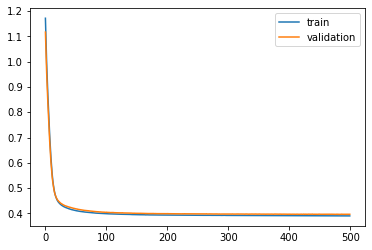

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 18s - loss: 1.1719 - val_loss: 1.1121

Epoch 00001: val_loss improved from inf to 1.11210, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0755 - val_loss: 1.0281

Epoch 00002: val_loss improved from 1.11210 to 1.02810, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9961 - val_loss: 0.9573

Epoch 00003: val_loss improved from 1.02810 to 0.95731, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9288 - val_loss: 0.8947

Epoch 00004: val_loss improved from 0.95731 to 0.89470, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8685 - val_loss: 0.8364

Epoch 00005: val_loss improved from 0.89470 to 0.83640, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8122 - val_loss: 0.7807

Epoch 00006: val_loss improved from 0.83640 to 0.78072, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7589 - val_loss: 0.7285

Epoch 00007: val_loss improved from 0.78072

 - 1s - loss: 0.4089 - val_loss: 0.4061

Epoch 00058: val_loss improved from 0.40626 to 0.40613, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4085 - val_loss: 0.4057

Epoch 00059: val_loss improved from 0.40613 to 0.40566, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4081 - val_loss: 0.4054

Epoch 00060: val_loss improved from 0.40566 to 0.40537, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4077 - val_loss: 0.4050

Epoch 00061: val_loss improved from 0.40537 to 0.40505, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4073 - val_loss: 0.4046

Epoch 00062: val_loss improved from 0.40505 to 0.40459, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4070 - val_loss: 0.4045

Epoch 00063: val_loss improved from 0.40459 to 0.40455, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4068 - val_loss: 0.4042

Epoch 00064: val_loss improved from 0.40455 to 0.40417, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3977 - val_loss: 0.3968

Epoch 00121: val_loss improved from 0.39694 to 0.39684, saving model to val_weights2.hdf5
Epoch 122/500
 - 1s - loss: 0.3975 - val_loss: 0.3969

Epoch 00122: val_loss did not improve from 0.39684
Epoch 123/500
 - 1s - loss: 0.3975 - val_loss: 0.3966

Epoch 00123: val_loss improved from 0.39684 to 0.39660, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3973 - val_loss: 0.3967

Epoch 00124: val_loss did not improve from 0.39660
Epoch 125/500
 - 1s - loss: 0.3974 - val_loss: 0.3968

Epoch 00125: val_loss did not improve from 0.39660
Epoch 126/500
 - 1s - loss: 0.3972 - val_loss: 0.3967

Epoch 00126: val_loss did not improve from 0.39660
Epoch 127/500
 - 1s - loss: 0.3973 - val_loss: 0.3964

Epoch 00127: val_loss improved from 0.39660 to 0.39639, saving model to val_weights2.hdf5
Epoch 128/500
 - 1s - loss: 0.3971 - val_loss: 0.3965

Epoch 00128: val_loss did not improve from 0.39639
Epoch 129/500
 - 1s - loss: 0.3971 - val_loss: 0.


Epoch 00190: val_loss did not improve from 0.39382
Epoch 191/500
 - 1s - loss: 0.3945 - val_loss: 0.3940

Epoch 00191: val_loss did not improve from 0.39382
Epoch 192/500
 - 1s - loss: 0.3945 - val_loss: 0.3938

Epoch 00192: val_loss improved from 0.39382 to 0.39376, saving model to val_weights2.hdf5
Epoch 193/500
 - 1s - loss: 0.3944 - val_loss: 0.3941

Epoch 00193: val_loss did not improve from 0.39376
Epoch 194/500
 - 1s - loss: 0.3946 - val_loss: 0.3940

Epoch 00194: val_loss did not improve from 0.39376
Epoch 195/500
 - 1s - loss: 0.3944 - val_loss: 0.3936

Epoch 00195: val_loss improved from 0.39376 to 0.39357, saving model to val_weights2.hdf5
Epoch 196/500
 - 1s - loss: 0.3944 - val_loss: 0.3935

Epoch 00196: val_loss improved from 0.39357 to 0.39348, saving model to val_weights2.hdf5
Epoch 197/500
 - 1s - loss: 0.3943 - val_loss: 0.3941

Epoch 00197: val_loss did not improve from 0.39348
Epoch 198/500
 - 1s - loss: 0.3944 - val_loss: 0.3936

Epoch 00198: val_loss did not impr

 - 1s - loss: 0.3936 - val_loss: 0.3927

Epoch 00263: val_loss did not improve from 0.39237
Epoch 264/500
 - 1s - loss: 0.3936 - val_loss: 0.3928

Epoch 00264: val_loss did not improve from 0.39237
Epoch 265/500
 - 1s - loss: 0.3934 - val_loss: 0.3925

Epoch 00265: val_loss did not improve from 0.39237
Epoch 266/500
 - 1s - loss: 0.3934 - val_loss: 0.3925

Epoch 00266: val_loss did not improve from 0.39237
Epoch 267/500
 - 1s - loss: 0.3934 - val_loss: 0.3930

Epoch 00267: val_loss did not improve from 0.39237
Epoch 268/500
 - 1s - loss: 0.3935 - val_loss: 0.3924

Epoch 00268: val_loss did not improve from 0.39237
Epoch 269/500
 - 1s - loss: 0.3934 - val_loss: 0.3926

Epoch 00269: val_loss did not improve from 0.39237
Epoch 270/500
 - 1s - loss: 0.3934 - val_loss: 0.3921

Epoch 00270: val_loss improved from 0.39237 to 0.39210, saving model to val_weights2.hdf5
Epoch 271/500
 - 1s - loss: 0.3932 - val_loss: 0.3929

Epoch 00271: val_loss did not improve from 0.39210
Epoch 272/500
 - 1s -


Epoch 00338: val_loss did not improve from 0.39177
Epoch 339/500
 - 1s - loss: 0.3927 - val_loss: 0.3921

Epoch 00339: val_loss did not improve from 0.39177
Epoch 340/500
 - 1s - loss: 0.3925 - val_loss: 0.3917

Epoch 00340: val_loss improved from 0.39177 to 0.39170, saving model to val_weights2.hdf5
Epoch 341/500
 - 1s - loss: 0.3924 - val_loss: 0.3919

Epoch 00341: val_loss did not improve from 0.39170
Epoch 342/500
 - 1s - loss: 0.3926 - val_loss: 0.3920

Epoch 00342: val_loss did not improve from 0.39170
Epoch 343/500
 - 1s - loss: 0.3925 - val_loss: 0.3918

Epoch 00343: val_loss did not improve from 0.39170
Epoch 344/500
 - 1s - loss: 0.3926 - val_loss: 0.3918

Epoch 00344: val_loss did not improve from 0.39170
Epoch 345/500
 - 1s - loss: 0.3924 - val_loss: 0.3916

Epoch 00345: val_loss improved from 0.39170 to 0.39164, saving model to val_weights2.hdf5
Epoch 346/500
 - 1s - loss: 0.3924 - val_loss: 0.3920

Epoch 00346: val_loss did not improve from 0.39164
Epoch 347/500
 - 1s - 

 - 1s - loss: 0.3918 - val_loss: 0.3923

Epoch 00415: val_loss did not improve from 0.39153
Epoch 416/500
 - 1s - loss: 0.3917 - val_loss: 0.3921

Epoch 00416: val_loss did not improve from 0.39153
Epoch 417/500
 - 1s - loss: 0.3919 - val_loss: 0.3922

Epoch 00417: val_loss did not improve from 0.39153
Epoch 418/500
 - 1s - loss: 0.3918 - val_loss: 0.3921

Epoch 00418: val_loss did not improve from 0.39153
Epoch 419/500
 - 1s - loss: 0.3919 - val_loss: 0.3924

Epoch 00419: val_loss did not improve from 0.39153
Epoch 420/500
 - 1s - loss: 0.3919 - val_loss: 0.3922

Epoch 00420: val_loss did not improve from 0.39153
Epoch 421/500
 - 1s - loss: 0.3921 - val_loss: 0.3923

Epoch 00421: val_loss did not improve from 0.39153
Epoch 422/500
 - 1s - loss: 0.3919 - val_loss: 0.3920

Epoch 00422: val_loss did not improve from 0.39153
Epoch 423/500
 - 1s - loss: 0.3918 - val_loss: 0.3923

Epoch 00423: val_loss did not improve from 0.39153
Epoch 424/500
 - 1s - loss: 0.3918 - val_loss: 0.3924

Epoch


Epoch 00492: val_loss did not improve from 0.39153
Epoch 493/500
 - 1s - loss: 0.3911 - val_loss: 0.3923

Epoch 00493: val_loss did not improve from 0.39153
Epoch 494/500
 - 1s - loss: 0.3911 - val_loss: 0.3922

Epoch 00494: val_loss did not improve from 0.39153
Epoch 495/500
 - 1s - loss: 0.3913 - val_loss: 0.3926

Epoch 00495: val_loss did not improve from 0.39153
Epoch 496/500
 - 1s - loss: 0.3913 - val_loss: 0.3921

Epoch 00496: val_loss did not improve from 0.39153
Epoch 497/500
 - 1s - loss: 0.3912 - val_loss: 0.3922

Epoch 00497: val_loss did not improve from 0.39153
Epoch 498/500
 - 1s - loss: 0.3912 - val_loss: 0.3922

Epoch 00498: val_loss did not improve from 0.39153
Epoch 499/500
 - 1s - loss: 0.3910 - val_loss: 0.3922

Epoch 00499: val_loss did not improve from 0.39153
Epoch 500/500
 - 1s - loss: 0.3911 - val_loss: 0.3922

Epoch 00500: val_loss did not improve from 0.39153
#################################
Number of units: 4
Batch size: 8192
Fold: 1
L2: 0.0103515540826429

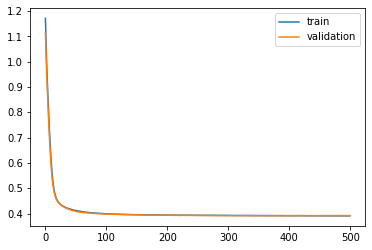

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 19s - loss: 1.1733 - val_loss: 1.1000

Epoch 00001: val_loss improved from inf to 1.10003, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0772 - val_loss: 1.0144

Epoch 00002: val_loss improved from 1.10003 to 1.01437, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9979 - val_loss: 0.9431

Epoch 00003: val_loss improved from 1.01437 to 0.94313, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9305 - val_loss: 0.8815

Epoch 00004: val_loss improved from 0.94313 to 0.88151, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8701 - val_loss: 0.8249

Epoch 00005: val_loss improved from 0.88151 to 0.82485, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8136 - val_loss: 0.7715

Epoch 00006: val_loss improved from 0.82485 to 0.77149, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7600 - val_loss: 0.7220

Epoch 00007: val_loss improved from 0.77149

 - 1s - loss: 0.4081 - val_loss: 0.4153

Epoch 00058: val_loss improved from 0.41560 to 0.41533, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4077 - val_loss: 0.4151

Epoch 00059: val_loss improved from 0.41533 to 0.41511, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4075 - val_loss: 0.4150

Epoch 00060: val_loss improved from 0.41511 to 0.41497, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4070 - val_loss: 0.4144

Epoch 00061: val_loss improved from 0.41497 to 0.41443, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4068 - val_loss: 0.4145

Epoch 00062: val_loss did not improve from 0.41443
Epoch 63/500
 - 1s - loss: 0.4065 - val_loss: 0.4140

Epoch 00063: val_loss improved from 0.41443 to 0.41403, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4061 - val_loss: 0.4137

Epoch 00064: val_loss improved from 0.41403 to 0.41369, saving model to val_weights3.hdf5
Epoch 65/500
 - 1s - loss: 0.4059 - val_loss

 - 1s - loss: 0.3971 - val_loss: 0.4066

Epoch 00120: val_loss did not improve from 0.40644
Epoch 121/500
 - 1s - loss: 0.3970 - val_loss: 0.4062

Epoch 00121: val_loss improved from 0.40644 to 0.40618, saving model to val_weights3.hdf5
Epoch 122/500
 - 1s - loss: 0.3970 - val_loss: 0.4064

Epoch 00122: val_loss did not improve from 0.40618
Epoch 123/500
 - 1s - loss: 0.3969 - val_loss: 0.4063

Epoch 00123: val_loss did not improve from 0.40618
Epoch 124/500
 - 1s - loss: 0.3967 - val_loss: 0.4064

Epoch 00124: val_loss did not improve from 0.40618
Epoch 125/500
 - 1s - loss: 0.3967 - val_loss: 0.4061

Epoch 00125: val_loss improved from 0.40618 to 0.40611, saving model to val_weights3.hdf5
Epoch 126/500
 - 1s - loss: 0.3965 - val_loss: 0.4062

Epoch 00126: val_loss did not improve from 0.40611
Epoch 127/500
 - 1s - loss: 0.3964 - val_loss: 0.4058

Epoch 00127: val_loss improved from 0.40611 to 0.40577, saving model to val_weights3.hdf5
Epoch 128/500
 - 1s - loss: 0.3963 - val_loss: 0.

 - 1s - loss: 0.3936 - val_loss: 0.4038

Epoch 00191: val_loss did not improve from 0.40378
Epoch 192/500
 - 1s - loss: 0.3936 - val_loss: 0.4036

Epoch 00192: val_loss improved from 0.40378 to 0.40355, saving model to val_weights3.hdf5
Epoch 193/500
 - 1s - loss: 0.3937 - val_loss: 0.4039

Epoch 00193: val_loss did not improve from 0.40355
Epoch 194/500
 - 1s - loss: 0.3937 - val_loss: 0.4035

Epoch 00194: val_loss improved from 0.40355 to 0.40347, saving model to val_weights3.hdf5
Epoch 195/500
 - 1s - loss: 0.3937 - val_loss: 0.4040

Epoch 00195: val_loss did not improve from 0.40347
Epoch 196/500
 - 1s - loss: 0.3936 - val_loss: 0.4037

Epoch 00196: val_loss did not improve from 0.40347
Epoch 197/500
 - 1s - loss: 0.3935 - val_loss: 0.4035

Epoch 00197: val_loss improved from 0.40347 to 0.40347, saving model to val_weights3.hdf5
Epoch 198/500
 - 1s - loss: 0.3935 - val_loss: 0.4040

Epoch 00198: val_loss did not improve from 0.40347
Epoch 199/500
 - 1s - loss: 0.3936 - val_loss: 0.

 - 1s - loss: 0.3924 - val_loss: 0.4030

Epoch 00264: val_loss did not improve from 0.40263
Epoch 265/500
 - 1s - loss: 0.3925 - val_loss: 0.4031

Epoch 00265: val_loss did not improve from 0.40263
Epoch 266/500
 - 1s - loss: 0.3924 - val_loss: 0.4028

Epoch 00266: val_loss did not improve from 0.40263
Epoch 267/500
 - 1s - loss: 0.3924 - val_loss: 0.4025

Epoch 00267: val_loss improved from 0.40263 to 0.40251, saving model to val_weights3.hdf5
Epoch 268/500
 - 1s - loss: 0.3925 - val_loss: 0.4027

Epoch 00268: val_loss did not improve from 0.40251
Epoch 269/500
 - 1s - loss: 0.3925 - val_loss: 0.4028

Epoch 00269: val_loss did not improve from 0.40251
Epoch 270/500
 - 1s - loss: 0.3925 - val_loss: 0.4025

Epoch 00270: val_loss improved from 0.40251 to 0.40248, saving model to val_weights3.hdf5
Epoch 271/500
 - 1s - loss: 0.3924 - val_loss: 0.4027

Epoch 00271: val_loss did not improve from 0.40248
Epoch 272/500
 - 1s - loss: 0.3924 - val_loss: 0.4027

Epoch 00272: val_loss did not imp

 - 1s - loss: 0.3918 - val_loss: 0.4016

Epoch 00338: val_loss improved from 0.40174 to 0.40162, saving model to val_weights3.hdf5
Epoch 339/500
 - 1s - loss: 0.3918 - val_loss: 0.4020

Epoch 00339: val_loss did not improve from 0.40162
Epoch 340/500
 - 1s - loss: 0.3917 - val_loss: 0.4019

Epoch 00340: val_loss did not improve from 0.40162
Epoch 341/500
 - 1s - loss: 0.3918 - val_loss: 0.4017

Epoch 00341: val_loss did not improve from 0.40162
Epoch 342/500
 - 1s - loss: 0.3918 - val_loss: 0.4018

Epoch 00342: val_loss did not improve from 0.40162
Epoch 343/500
 - 1s - loss: 0.3919 - val_loss: 0.4019

Epoch 00343: val_loss did not improve from 0.40162
Epoch 344/500
 - 1s - loss: 0.3916 - val_loss: 0.4015

Epoch 00344: val_loss improved from 0.40162 to 0.40147, saving model to val_weights3.hdf5
Epoch 345/500
 - 1s - loss: 0.3917 - val_loss: 0.4019

Epoch 00345: val_loss did not improve from 0.40147
Epoch 346/500
 - 1s - loss: 0.3918 - val_loss: 0.4016

Epoch 00346: val_loss did not imp


Epoch 00412: val_loss did not improve from 0.40101
Epoch 413/500
 - 1s - loss: 0.3911 - val_loss: 0.4015

Epoch 00413: val_loss did not improve from 0.40101
Epoch 414/500
 - 1s - loss: 0.3911 - val_loss: 0.4017

Epoch 00414: val_loss did not improve from 0.40101
Epoch 415/500
 - 1s - loss: 0.3910 - val_loss: 0.4015

Epoch 00415: val_loss did not improve from 0.40101
Epoch 416/500
 - 1s - loss: 0.3911 - val_loss: 0.4012

Epoch 00416: val_loss did not improve from 0.40101
Epoch 417/500
 - 1s - loss: 0.3911 - val_loss: 0.4012

Epoch 00417: val_loss did not improve from 0.40101
Epoch 418/500
 - 1s - loss: 0.3911 - val_loss: 0.4012

Epoch 00418: val_loss did not improve from 0.40101
Epoch 419/500
 - 1s - loss: 0.3911 - val_loss: 0.4016

Epoch 00419: val_loss did not improve from 0.40101
Epoch 420/500
 - 1s - loss: 0.3912 - val_loss: 0.4012

Epoch 00420: val_loss did not improve from 0.40101
Epoch 421/500
 - 1s - loss: 0.3910 - val_loss: 0.4012

Epoch 00421: val_loss did not improve from 0.


Epoch 00489: val_loss did not improve from 0.40057
Epoch 490/500
 - 1s - loss: 0.3904 - val_loss: 0.4013

Epoch 00490: val_loss did not improve from 0.40057
Epoch 491/500
 - 1s - loss: 0.3904 - val_loss: 0.4011

Epoch 00491: val_loss did not improve from 0.40057
Epoch 492/500
 - 1s - loss: 0.3905 - val_loss: 0.4013

Epoch 00492: val_loss did not improve from 0.40057
Epoch 493/500
 - 1s - loss: 0.3904 - val_loss: 0.4008

Epoch 00493: val_loss did not improve from 0.40057
Epoch 494/500
 - 1s - loss: 0.3905 - val_loss: 0.4008

Epoch 00494: val_loss did not improve from 0.40057
Epoch 495/500
 - 1s - loss: 0.3904 - val_loss: 0.4009

Epoch 00495: val_loss did not improve from 0.40057
Epoch 496/500
 - 1s - loss: 0.3902 - val_loss: 0.4009

Epoch 00496: val_loss did not improve from 0.40057
Epoch 497/500
 - 1s - loss: 0.3903 - val_loss: 0.4009

Epoch 00497: val_loss did not improve from 0.40057
Epoch 498/500
 - 1s - loss: 0.3905 - val_loss: 0.4014

Epoch 00498: val_loss did not improve from 0.

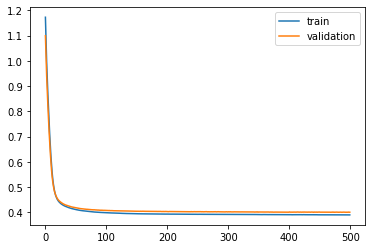

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 19s - loss: 1.1725 - val_loss: 1.1057

Epoch 00001: val_loss improved from inf to 1.10569, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0765 - val_loss: 1.0195

Epoch 00002: val_loss improved from 1.10569 to 1.01951, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9973 - val_loss: 0.9481

Epoch 00003: val_loss improved from 1.01951 to 0.94810, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9299 - val_loss: 0.8854

Epoch 00004: val_loss improved from 0.94810 to 0.88545, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8694 - val_loss: 0.8274

Epoch 00005: val_loss improved from 0.88545 to 0.82736, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8129 - val_loss: 0.7724

Epoch 00006: val_loss improved from 0.82736 to 0.77240, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7597 - val_loss: 0.7207

Epoch 00007: val_loss improved from 0.77240

 - 1s - loss: 0.4090 - val_loss: 0.4079

Epoch 00058: val_loss improved from 0.40863 to 0.40791, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4087 - val_loss: 0.4080

Epoch 00059: val_loss did not improve from 0.40791
Epoch 60/500
 - 1s - loss: 0.4083 - val_loss: 0.4073

Epoch 00060: val_loss improved from 0.40791 to 0.40728, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4080 - val_loss: 0.4070

Epoch 00061: val_loss improved from 0.40728 to 0.40702, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4076 - val_loss: 0.4065

Epoch 00062: val_loss improved from 0.40702 to 0.40647, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4074 - val_loss: 0.4063

Epoch 00063: val_loss improved from 0.40647 to 0.40627, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4069 - val_loss: 0.4059

Epoch 00064: val_loss improved from 0.40627 to 0.40593, saving model to val_weights4.hdf5
Epoch 65/500
 - 1s - loss: 0.4067 - val_loss

 - 1s - loss: 0.3979 - val_loss: 0.3967

Epoch 00119: val_loss did not improve from 0.39673
Epoch 120/500
 - 1s - loss: 0.3979 - val_loss: 0.3967

Epoch 00120: val_loss improved from 0.39673 to 0.39668, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.3977 - val_loss: 0.3966

Epoch 00121: val_loss improved from 0.39668 to 0.39655, saving model to val_weights4.hdf5
Epoch 122/500
 - 1s - loss: 0.3977 - val_loss: 0.3964

Epoch 00122: val_loss improved from 0.39655 to 0.39640, saving model to val_weights4.hdf5
Epoch 123/500
 - 1s - loss: 0.3975 - val_loss: 0.3967

Epoch 00123: val_loss did not improve from 0.39640
Epoch 124/500
 - 1s - loss: 0.3975 - val_loss: 0.3965

Epoch 00124: val_loss did not improve from 0.39640
Epoch 125/500
 - 1s - loss: 0.3974 - val_loss: 0.3966

Epoch 00125: val_loss did not improve from 0.39640
Epoch 126/500
 - 1s - loss: 0.3973 - val_loss: 0.3966

Epoch 00126: val_loss did not improve from 0.39640
Epoch 127/500
 - 1s - loss: 0.3972 - val_loss: 0.

 - 1s - loss: 0.3947 - val_loss: 0.3948

Epoch 00191: val_loss did not improve from 0.39446
Epoch 192/500
 - 1s - loss: 0.3946 - val_loss: 0.3944

Epoch 00192: val_loss improved from 0.39446 to 0.39439, saving model to val_weights4.hdf5
Epoch 193/500
 - 1s - loss: 0.3945 - val_loss: 0.3947

Epoch 00193: val_loss did not improve from 0.39439
Epoch 194/500
 - 1s - loss: 0.3945 - val_loss: 0.3946

Epoch 00194: val_loss did not improve from 0.39439
Epoch 195/500
 - 1s - loss: 0.3946 - val_loss: 0.3946

Epoch 00195: val_loss did not improve from 0.39439
Epoch 196/500
 - 1s - loss: 0.3945 - val_loss: 0.3945

Epoch 00196: val_loss did not improve from 0.39439
Epoch 197/500
 - 1s - loss: 0.3944 - val_loss: 0.3948

Epoch 00197: val_loss did not improve from 0.39439
Epoch 198/500
 - 1s - loss: 0.3944 - val_loss: 0.3945

Epoch 00198: val_loss did not improve from 0.39439
Epoch 199/500
 - 1s - loss: 0.3944 - val_loss: 0.3948

Epoch 00199: val_loss did not improve from 0.39439
Epoch 200/500
 - 1s -

 - 1s - loss: 0.3936 - val_loss: 0.3942

Epoch 00266: val_loss did not improve from 0.39366
Epoch 267/500
 - 1s - loss: 0.3936 - val_loss: 0.3941

Epoch 00267: val_loss did not improve from 0.39366
Epoch 268/500
 - 1s - loss: 0.3936 - val_loss: 0.3940

Epoch 00268: val_loss did not improve from 0.39366
Epoch 269/500
 - 1s - loss: 0.3936 - val_loss: 0.3943

Epoch 00269: val_loss did not improve from 0.39366
Epoch 270/500
 - 1s - loss: 0.3935 - val_loss: 0.3941

Epoch 00270: val_loss did not improve from 0.39366
Epoch 271/500
 - 1s - loss: 0.3935 - val_loss: 0.3941

Epoch 00271: val_loss did not improve from 0.39366
Epoch 272/500
 - 1s - loss: 0.3935 - val_loss: 0.3944

Epoch 00272: val_loss did not improve from 0.39366
Epoch 273/500
 - 1s - loss: 0.3935 - val_loss: 0.3938

Epoch 00273: val_loss did not improve from 0.39366
Epoch 274/500
 - 1s - loss: 0.3935 - val_loss: 0.3945

Epoch 00274: val_loss did not improve from 0.39366
Epoch 275/500
 - 1s - loss: 0.3937 - val_loss: 0.3938

Epoch

 - 1s - loss: 0.3929 - val_loss: 0.3935

Epoch 00341: val_loss did not improve from 0.39314
Epoch 342/500
 - 1s - loss: 0.3929 - val_loss: 0.3942

Epoch 00342: val_loss did not improve from 0.39314
Epoch 343/500
 - 1s - loss: 0.3931 - val_loss: 0.3933

Epoch 00343: val_loss did not improve from 0.39314
Epoch 344/500
 - 1s - loss: 0.3930 - val_loss: 0.3937

Epoch 00344: val_loss did not improve from 0.39314
Epoch 345/500
 - 1s - loss: 0.3929 - val_loss: 0.3938

Epoch 00345: val_loss did not improve from 0.39314
Epoch 346/500
 - 1s - loss: 0.3929 - val_loss: 0.3936

Epoch 00346: val_loss did not improve from 0.39314
Epoch 347/500
 - 1s - loss: 0.3929 - val_loss: 0.3937

Epoch 00347: val_loss did not improve from 0.39314
Epoch 348/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00348: val_loss did not improve from 0.39314
Epoch 349/500
 - 1s - loss: 0.3928 - val_loss: 0.3936

Epoch 00349: val_loss did not improve from 0.39314
Epoch 350/500
 - 1s - loss: 0.3928 - val_loss: 0.3930

Epoch

 - 1s - loss: 0.3920 - val_loss: 0.3932

Epoch 00417: val_loss did not improve from 0.39266
Epoch 418/500
 - 1s - loss: 0.3920 - val_loss: 0.3931

Epoch 00418: val_loss did not improve from 0.39266
Epoch 419/500
 - 1s - loss: 0.3920 - val_loss: 0.3929

Epoch 00419: val_loss did not improve from 0.39266
Epoch 420/500
 - 1s - loss: 0.3921 - val_loss: 0.3931

Epoch 00420: val_loss did not improve from 0.39266
Epoch 421/500
 - 1s - loss: 0.3920 - val_loss: 0.3930

Epoch 00421: val_loss did not improve from 0.39266
Epoch 422/500
 - 1s - loss: 0.3919 - val_loss: 0.3929

Epoch 00422: val_loss did not improve from 0.39266
Epoch 423/500
 - 1s - loss: 0.3921 - val_loss: 0.3935

Epoch 00423: val_loss did not improve from 0.39266
Epoch 424/500
 - 1s - loss: 0.3920 - val_loss: 0.3928

Epoch 00424: val_loss did not improve from 0.39266
Epoch 425/500
 - 1s - loss: 0.3921 - val_loss: 0.3932

Epoch 00425: val_loss did not improve from 0.39266
Epoch 426/500
 - 1s - loss: 0.3921 - val_loss: 0.3929

Epoch


Epoch 00493: val_loss did not improve from 0.39228
Epoch 494/500
 - 1s - loss: 0.3915 - val_loss: 0.3925

Epoch 00494: val_loss did not improve from 0.39228
Epoch 495/500
 - 1s - loss: 0.3915 - val_loss: 0.3927

Epoch 00495: val_loss did not improve from 0.39228
Epoch 496/500
 - 1s - loss: 0.3916 - val_loss: 0.3925

Epoch 00496: val_loss did not improve from 0.39228
Epoch 497/500
 - 1s - loss: 0.3916 - val_loss: 0.3929

Epoch 00497: val_loss did not improve from 0.39228
Epoch 498/500
 - 1s - loss: 0.3915 - val_loss: 0.3925

Epoch 00498: val_loss did not improve from 0.39228
Epoch 499/500
 - 1s - loss: 0.3916 - val_loss: 0.3928

Epoch 00499: val_loss did not improve from 0.39228
Epoch 500/500
 - 1s - loss: 0.3915 - val_loss: 0.3925

Epoch 00500: val_loss did not improve from 0.39228
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.010351554082642968
best val loss: 0.3922834428151449
#################################


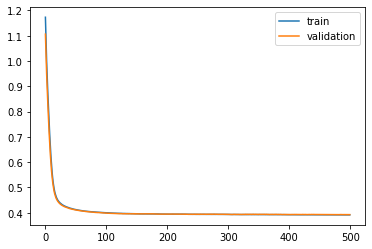

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 20s - loss: 1.1729 - val_loss: 1.1038

Epoch 00001: val_loss improved from inf to 1.10382, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0768 - val_loss: 1.0192

Epoch 00002: val_loss improved from 1.10382 to 1.01923, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9975 - val_loss: 0.9488

Epoch 00003: val_loss improved from 1.01923 to 0.94882, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9302 - val_loss: 0.8868

Epoch 00004: val_loss improved from 0.94882 to 0.88680, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8697 - val_loss: 0.8301

Epoch 00005: val_loss improved from 0.88680 to 0.83006, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8132 - val_loss: 0.7764

Epoch 00006: val_loss improved from 0.83006 to 0.77636, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7598 - val_loss: 0.7253

Epoch 00007: val_loss improved from 0.77636

 - 1s - loss: 0.4085 - val_loss: 0.4120

Epoch 00058: val_loss improved from 0.41224 to 0.41204, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4082 - val_loss: 0.4119

Epoch 00059: val_loss improved from 0.41204 to 0.41194, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4079 - val_loss: 0.4114

Epoch 00060: val_loss improved from 0.41194 to 0.41145, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4076 - val_loss: 0.4113

Epoch 00061: val_loss improved from 0.41145 to 0.41129, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4072 - val_loss: 0.4109

Epoch 00062: val_loss improved from 0.41129 to 0.41086, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4069 - val_loss: 0.4108

Epoch 00063: val_loss improved from 0.41086 to 0.41080, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4064 - val_loss: 0.4099

Epoch 00064: val_loss improved from 0.41080 to 0.40994, saving model to val_weights5.hdf5
Epoch

 - 1s - loss: 0.3974 - val_loss: 0.4020

Epoch 00122: val_loss did not improve from 0.40185
Epoch 123/500
 - 1s - loss: 0.3974 - val_loss: 0.4020

Epoch 00123: val_loss did not improve from 0.40185
Epoch 124/500
 - 1s - loss: 0.3972 - val_loss: 0.4019

Epoch 00124: val_loss did not improve from 0.40185
Epoch 125/500
 - 1s - loss: 0.3973 - val_loss: 0.4018

Epoch 00125: val_loss improved from 0.40185 to 0.40179, saving model to val_weights5.hdf5
Epoch 126/500
 - 1s - loss: 0.3969 - val_loss: 0.4013

Epoch 00126: val_loss improved from 0.40179 to 0.40129, saving model to val_weights5.hdf5
Epoch 127/500
 - 1s - loss: 0.3970 - val_loss: 0.4017

Epoch 00127: val_loss did not improve from 0.40129
Epoch 128/500
 - 1s - loss: 0.3969 - val_loss: 0.4014

Epoch 00128: val_loss did not improve from 0.40129
Epoch 129/500
 - 1s - loss: 0.3969 - val_loss: 0.4014

Epoch 00129: val_loss did not improve from 0.40129
Epoch 130/500
 - 1s - loss: 0.3968 - val_loss: 0.4014

Epoch 00130: val_loss did not imp

 - 1s - loss: 0.3943 - val_loss: 0.3988

Epoch 00192: val_loss did not improve from 0.39860
Epoch 193/500
 - 1s - loss: 0.3941 - val_loss: 0.3990

Epoch 00193: val_loss did not improve from 0.39860
Epoch 194/500
 - 1s - loss: 0.3941 - val_loss: 0.3987

Epoch 00194: val_loss did not improve from 0.39860
Epoch 195/500
 - 1s - loss: 0.3941 - val_loss: 0.3987

Epoch 00195: val_loss did not improve from 0.39860
Epoch 196/500
 - 1s - loss: 0.3940 - val_loss: 0.3983

Epoch 00196: val_loss improved from 0.39860 to 0.39829, saving model to val_weights5.hdf5
Epoch 197/500
 - 1s - loss: 0.3941 - val_loss: 0.3989

Epoch 00197: val_loss did not improve from 0.39829
Epoch 198/500
 - 1s - loss: 0.3940 - val_loss: 0.3987

Epoch 00198: val_loss did not improve from 0.39829
Epoch 199/500
 - 1s - loss: 0.3942 - val_loss: 0.3984

Epoch 00199: val_loss did not improve from 0.39829
Epoch 200/500
 - 1s - loss: 0.3939 - val_loss: 0.3982

Epoch 00200: val_loss improved from 0.39829 to 0.39824, saving model to 

 - 1s - loss: 0.3930 - val_loss: 0.3977

Epoch 00266: val_loss did not improve from 0.39733
Epoch 267/500
 - 1s - loss: 0.3930 - val_loss: 0.3979

Epoch 00267: val_loss did not improve from 0.39733
Epoch 268/500
 - 1s - loss: 0.3930 - val_loss: 0.3980

Epoch 00268: val_loss did not improve from 0.39733
Epoch 269/500
 - 1s - loss: 0.3929 - val_loss: 0.3978

Epoch 00269: val_loss did not improve from 0.39733
Epoch 270/500
 - 1s - loss: 0.3929 - val_loss: 0.3977

Epoch 00270: val_loss did not improve from 0.39733
Epoch 271/500
 - 1s - loss: 0.3928 - val_loss: 0.3977

Epoch 00271: val_loss did not improve from 0.39733
Epoch 272/500
 - 1s - loss: 0.3928 - val_loss: 0.3979

Epoch 00272: val_loss did not improve from 0.39733
Epoch 273/500
 - 1s - loss: 0.3930 - val_loss: 0.3979

Epoch 00273: val_loss did not improve from 0.39733
Epoch 274/500
 - 1s - loss: 0.3929 - val_loss: 0.3976

Epoch 00274: val_loss did not improve from 0.39733
Epoch 275/500
 - 1s - loss: 0.3928 - val_loss: 0.3983

Epoch


Epoch 00343: val_loss did not improve from 0.39733
Epoch 344/500
 - 1s - loss: 0.3926 - val_loss: 0.3992

Epoch 00344: val_loss did not improve from 0.39733
Epoch 345/500
 - 1s - loss: 0.3925 - val_loss: 0.3986

Epoch 00345: val_loss did not improve from 0.39733
Epoch 346/500
 - 1s - loss: 0.3926 - val_loss: 0.3990

Epoch 00346: val_loss did not improve from 0.39733
Epoch 347/500
 - 1s - loss: 0.3927 - val_loss: 0.3995

Epoch 00347: val_loss did not improve from 0.39733
Epoch 348/500
 - 1s - loss: 0.3928 - val_loss: 0.3994

Epoch 00348: val_loss did not improve from 0.39733
Epoch 349/500
 - 1s - loss: 0.3927 - val_loss: 0.3997

Epoch 00349: val_loss did not improve from 0.39733
Epoch 350/500
 - 1s - loss: 0.3930 - val_loss: 0.3998

Epoch 00350: val_loss did not improve from 0.39733
Epoch 351/500
 - 1s - loss: 0.3929 - val_loss: 0.3998

Epoch 00351: val_loss did not improve from 0.39733
Epoch 352/500
 - 1s - loss: 0.3930 - val_loss: 0.3995

Epoch 00352: val_loss did not improve from 0.


Epoch 00420: val_loss did not improve from 0.39720
Epoch 421/500
 - 1s - loss: 0.3916 - val_loss: 0.3976

Epoch 00421: val_loss did not improve from 0.39720
Epoch 422/500
 - 1s - loss: 0.3915 - val_loss: 0.3976

Epoch 00422: val_loss did not improve from 0.39720
Epoch 423/500
 - 1s - loss: 0.3916 - val_loss: 0.3976

Epoch 00423: val_loss did not improve from 0.39720
Epoch 424/500
 - 1s - loss: 0.3916 - val_loss: 0.3978

Epoch 00424: val_loss did not improve from 0.39720
Epoch 425/500
 - 1s - loss: 0.3917 - val_loss: 0.3975

Epoch 00425: val_loss did not improve from 0.39720
Epoch 426/500
 - 1s - loss: 0.3917 - val_loss: 0.3976

Epoch 00426: val_loss did not improve from 0.39720
Epoch 427/500
 - 1s - loss: 0.3916 - val_loss: 0.3978

Epoch 00427: val_loss did not improve from 0.39720
Epoch 428/500
 - 1s - loss: 0.3916 - val_loss: 0.3975

Epoch 00428: val_loss did not improve from 0.39720
Epoch 429/500
 - 1s - loss: 0.3917 - val_loss: 0.3974

Epoch 00429: val_loss did not improve from 0.

 - 1s - loss: 0.3911 - val_loss: 0.3983

Epoch 00498: val_loss did not improve from 0.39720
Epoch 499/500
 - 1s - loss: 0.3914 - val_loss: 0.3987

Epoch 00499: val_loss did not improve from 0.39720
Epoch 500/500
 - 1s - loss: 0.3913 - val_loss: 0.3979

Epoch 00500: val_loss did not improve from 0.39720
#################################
Number of units: 4
Batch size: 8192
Fold: 4
L2: 0.010351554082642968
best val loss: 0.3972017029391395
#################################
[[4, 8192, 0.007921656789898646, 0, 0.3964275896019406], [4, 8192, 0.007921656789898646, 1, 0.3918810964955224], [4, 8192, 0.007921656789898646, 2, 0.40050656101438736], [4, 8192, 0.007921656789898646, 3, 0.3915418761041429], [4, 8192, 0.007921656789898646, 4, 0.3962737381988102], [4, 8192, 0.010351554082642968, 0, 0.39633653055297], [4, 8192, 0.010351554082642968, 1, 0.3915295256773631], [4, 8192, 0.010351554082642968, 2, 0.40056833521525065], [4, 8192, 0.010351554082642968, 3, 0.3922834428151449], [4, 8192, 0.01035155

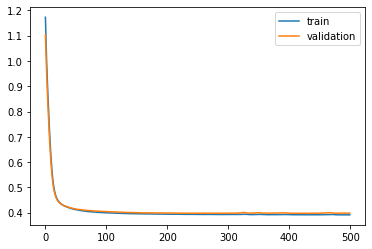

Time to train LSTM:  372.2148861885071
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 19s - loss: 1.0855 - val_loss: 1.0371

Epoch 00001: val_loss improved from inf to 1.03712, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0006 - val_loss: 0.9613

Epoch 00002: val_loss improved from 1.03712 to 0.96128, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9325 - val_loss: 0.8994

Epoch 00003: val_loss improved from 0.96128 to 0.89936, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.8755 - val_loss: 0.8463

Epoch 00004: val_loss improved from 0.89936 to 0.84627, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8242 - val_loss: 0.7970

Epoch 00005: val_loss improved from 0.84627 to 0.79699, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.7759 - val_loss: 0.7503

Epoch 00006: val_loss improved from 0.79699 to 0.75029, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7295 - val_loss: 0.7058

Epoc


Epoch 00057: val_loss improved from 0.41588 to 0.41531, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4076 - val_loss: 0.4149

Epoch 00058: val_loss improved from 0.41531 to 0.41495, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4072 - val_loss: 0.4146

Epoch 00059: val_loss improved from 0.41495 to 0.41456, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4068 - val_loss: 0.4144

Epoch 00060: val_loss improved from 0.41456 to 0.41436, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4065 - val_loss: 0.4137

Epoch 00061: val_loss improved from 0.41436 to 0.41371, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4061 - val_loss: 0.4134

Epoch 00062: val_loss improved from 0.41371 to 0.41344, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4058 - val_loss: 0.4130

Epoch 00063: val_loss improved from 0.41344 to 0.41305, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4054 - val_loss:


Epoch 00117: val_loss did not improve from 0.40281
Epoch 118/500
 - 1s - loss: 0.3967 - val_loss: 0.4028

Epoch 00118: val_loss improved from 0.40281 to 0.40278, saving model to val_weights1.hdf5
Epoch 119/500
 - 1s - loss: 0.3964 - val_loss: 0.4027

Epoch 00119: val_loss improved from 0.40278 to 0.40273, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.3965 - val_loss: 0.4024

Epoch 00120: val_loss improved from 0.40273 to 0.40240, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.3963 - val_loss: 0.4027

Epoch 00121: val_loss did not improve from 0.40240
Epoch 122/500
 - 1s - loss: 0.3964 - val_loss: 0.4025

Epoch 00122: val_loss did not improve from 0.40240
Epoch 123/500
 - 1s - loss: 0.3962 - val_loss: 0.4024

Epoch 00123: val_loss did not improve from 0.40240
Epoch 124/500
 - 1s - loss: 0.3962 - val_loss: 0.4025

Epoch 00124: val_loss did not improve from 0.40240
Epoch 125/500
 - 1s - loss: 0.3960 - val_loss: 0.4021

Epoch 00125: val_loss improved fro


Epoch 00186: val_loss did not improve from 0.39890
Epoch 187/500
 - 1s - loss: 0.3930 - val_loss: 0.3993

Epoch 00187: val_loss did not improve from 0.39890
Epoch 188/500
 - 1s - loss: 0.3930 - val_loss: 0.3994

Epoch 00188: val_loss did not improve from 0.39890
Epoch 189/500
 - 1s - loss: 0.3930 - val_loss: 0.3992

Epoch 00189: val_loss did not improve from 0.39890
Epoch 190/500
 - 1s - loss: 0.3930 - val_loss: 0.3987

Epoch 00190: val_loss improved from 0.39890 to 0.39868, saving model to val_weights1.hdf5
Epoch 191/500
 - 1s - loss: 0.3928 - val_loss: 0.3989

Epoch 00191: val_loss did not improve from 0.39868
Epoch 192/500
 - 1s - loss: 0.3928 - val_loss: 0.3991

Epoch 00192: val_loss did not improve from 0.39868
Epoch 193/500
 - 1s - loss: 0.3927 - val_loss: 0.3991

Epoch 00193: val_loss did not improve from 0.39868
Epoch 194/500
 - 1s - loss: 0.3929 - val_loss: 0.3989

Epoch 00194: val_loss did not improve from 0.39868
Epoch 195/500
 - 1s - loss: 0.3928 - val_loss: 0.3994

Epoch 

 - 1s - loss: 0.3920 - val_loss: 0.3979

Epoch 00262: val_loss did not improve from 0.39791
Epoch 263/500
 - 1s - loss: 0.3919 - val_loss: 0.3978

Epoch 00263: val_loss improved from 0.39791 to 0.39783, saving model to val_weights1.hdf5
Epoch 264/500
 - 1s - loss: 0.3920 - val_loss: 0.3983

Epoch 00264: val_loss did not improve from 0.39783
Epoch 265/500
 - 1s - loss: 0.3919 - val_loss: 0.3977

Epoch 00265: val_loss improved from 0.39783 to 0.39769, saving model to val_weights1.hdf5
Epoch 266/500
 - 1s - loss: 0.3919 - val_loss: 0.3979

Epoch 00266: val_loss did not improve from 0.39769
Epoch 267/500
 - 1s - loss: 0.3917 - val_loss: 0.3978

Epoch 00267: val_loss did not improve from 0.39769
Epoch 268/500
 - 1s - loss: 0.3918 - val_loss: 0.3978

Epoch 00268: val_loss did not improve from 0.39769
Epoch 269/500
 - 1s - loss: 0.3917 - val_loss: 0.3973

Epoch 00269: val_loss improved from 0.39769 to 0.39732, saving model to val_weights1.hdf5
Epoch 270/500
 - 1s - loss: 0.3918 - val_loss: 0.

 - 1s - loss: 0.3907 - val_loss: 0.3975

Epoch 00336: val_loss did not improve from 0.39696
Epoch 337/500
 - 1s - loss: 0.3908 - val_loss: 0.3970

Epoch 00337: val_loss did not improve from 0.39696
Epoch 338/500
 - 1s - loss: 0.3907 - val_loss: 0.3976

Epoch 00338: val_loss did not improve from 0.39696
Epoch 339/500
 - 1s - loss: 0.3907 - val_loss: 0.3969

Epoch 00339: val_loss improved from 0.39696 to 0.39693, saving model to val_weights1.hdf5
Epoch 340/500
 - 1s - loss: 0.3907 - val_loss: 0.3972

Epoch 00340: val_loss did not improve from 0.39693
Epoch 341/500
 - 1s - loss: 0.3907 - val_loss: 0.3973

Epoch 00341: val_loss did not improve from 0.39693
Epoch 342/500
 - 1s - loss: 0.3906 - val_loss: 0.3970

Epoch 00342: val_loss did not improve from 0.39693
Epoch 343/500
 - 1s - loss: 0.3907 - val_loss: 0.3971

Epoch 00343: val_loss did not improve from 0.39693
Epoch 344/500
 - 1s - loss: 0.3905 - val_loss: 0.3972

Epoch 00344: val_loss did not improve from 0.39693
Epoch 345/500
 - 1s -


Epoch 00410: val_loss did not improve from 0.39641
Epoch 411/500
 - 1s - loss: 0.3900 - val_loss: 0.3968

Epoch 00411: val_loss did not improve from 0.39641
Epoch 412/500
 - 1s - loss: 0.3898 - val_loss: 0.3963

Epoch 00412: val_loss improved from 0.39641 to 0.39631, saving model to val_weights1.hdf5
Epoch 413/500
 - 1s - loss: 0.3899 - val_loss: 0.3962

Epoch 00413: val_loss improved from 0.39631 to 0.39622, saving model to val_weights1.hdf5
Epoch 414/500
 - 1s - loss: 0.3898 - val_loss: 0.3967

Epoch 00414: val_loss did not improve from 0.39622
Epoch 415/500
 - 1s - loss: 0.3897 - val_loss: 0.3966

Epoch 00415: val_loss did not improve from 0.39622
Epoch 416/500
 - 1s - loss: 0.3897 - val_loss: 0.3965

Epoch 00416: val_loss did not improve from 0.39622
Epoch 417/500
 - 1s - loss: 0.3898 - val_loss: 0.3967

Epoch 00417: val_loss did not improve from 0.39622
Epoch 418/500
 - 1s - loss: 0.3898 - val_loss: 0.3967

Epoch 00418: val_loss did not improve from 0.39622
Epoch 419/500
 - 1s - 

 - 1s - loss: 0.3893 - val_loss: 0.3966

Epoch 00486: val_loss did not improve from 0.39609
Epoch 487/500
 - 1s - loss: 0.3894 - val_loss: 0.3965

Epoch 00487: val_loss did not improve from 0.39609
Epoch 488/500
 - 1s - loss: 0.3895 - val_loss: 0.3967

Epoch 00488: val_loss did not improve from 0.39609
Epoch 489/500
 - 1s - loss: 0.3893 - val_loss: 0.3962

Epoch 00489: val_loss did not improve from 0.39609
Epoch 490/500
 - 1s - loss: 0.3893 - val_loss: 0.3967

Epoch 00490: val_loss did not improve from 0.39609
Epoch 491/500
 - 1s - loss: 0.3893 - val_loss: 0.3964

Epoch 00491: val_loss did not improve from 0.39609
Epoch 492/500
 - 1s - loss: 0.3893 - val_loss: 0.3964

Epoch 00492: val_loss did not improve from 0.39609
Epoch 493/500
 - 1s - loss: 0.3891 - val_loss: 0.3964

Epoch 00493: val_loss did not improve from 0.39609
Epoch 494/500
 - 1s - loss: 0.3892 - val_loss: 0.3961

Epoch 00494: val_loss did not improve from 0.39609
Epoch 495/500
 - 1s - loss: 0.3893 - val_loss: 0.3967

Epoch

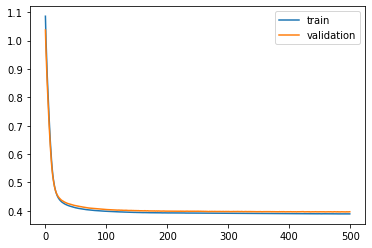

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 20s - loss: 1.0862 - val_loss: 1.0329

Epoch 00001: val_loss improved from inf to 1.03287, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0011 - val_loss: 0.9600

Epoch 00002: val_loss improved from 1.03287 to 0.95998, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9327 - val_loss: 0.8997

Epoch 00003: val_loss improved from 0.95998 to 0.89971, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.8755 - val_loss: 0.8465

Epoch 00004: val_loss improved from 0.89971 to 0.84655, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8240 - val_loss: 0.7966

Epoch 00005: val_loss improved from 0.84655 to 0.79663, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.7758 - val_loss: 0.7485

Epoch 00006: val_loss improved from 0.79663 to 0.74855, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7297 - val_loss: 0.7029

Epoch 00007: val_loss improved from 0.74855

 - 1s - loss: 0.4082 - val_loss: 0.4060

Epoch 00058: val_loss improved from 0.40644 to 0.40600, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4078 - val_loss: 0.4057

Epoch 00059: val_loss improved from 0.40600 to 0.40570, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4074 - val_loss: 0.4054

Epoch 00060: val_loss improved from 0.40570 to 0.40540, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4071 - val_loss: 0.4050

Epoch 00061: val_loss improved from 0.40540 to 0.40501, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4067 - val_loss: 0.4045

Epoch 00062: val_loss improved from 0.40501 to 0.40454, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4064 - val_loss: 0.4045

Epoch 00063: val_loss improved from 0.40454 to 0.40445, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4061 - val_loss: 0.4045

Epoch 00064: val_loss did not improve from 0.40445
Epoch 65/500
 - 1s - loss: 0.4057 - val_loss

 - 1s - loss: 0.3969 - val_loss: 0.3963

Epoch 00120: val_loss improved from 0.39660 to 0.39632, saving model to val_weights2.hdf5
Epoch 121/500
 - 1s - loss: 0.3969 - val_loss: 0.3967

Epoch 00121: val_loss did not improve from 0.39632
Epoch 122/500
 - 1s - loss: 0.3968 - val_loss: 0.3962

Epoch 00122: val_loss improved from 0.39632 to 0.39624, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3967 - val_loss: 0.3964

Epoch 00123: val_loss did not improve from 0.39624
Epoch 124/500
 - 1s - loss: 0.3966 - val_loss: 0.3965

Epoch 00124: val_loss did not improve from 0.39624
Epoch 125/500
 - 1s - loss: 0.3965 - val_loss: 0.3961

Epoch 00125: val_loss improved from 0.39624 to 0.39608, saving model to val_weights2.hdf5
Epoch 126/500
 - 1s - loss: 0.3964 - val_loss: 0.3961

Epoch 00126: val_loss improved from 0.39608 to 0.39606, saving model to val_weights2.hdf5
Epoch 127/500
 - 1s - loss: 0.3962 - val_loss: 0.3962

Epoch 00127: val_loss did not improve from 0.39606
Epoch 128/

 - 1s - loss: 0.3938 - val_loss: 0.3934

Epoch 00187: val_loss did not improve from 0.39334
Epoch 188/500
 - 1s - loss: 0.3937 - val_loss: 0.3935

Epoch 00188: val_loss did not improve from 0.39334
Epoch 189/500
 - 1s - loss: 0.3936 - val_loss: 0.3937

Epoch 00189: val_loss did not improve from 0.39334
Epoch 190/500
 - 1s - loss: 0.3936 - val_loss: 0.3933

Epoch 00190: val_loss improved from 0.39334 to 0.39331, saving model to val_weights2.hdf5
Epoch 191/500
 - 1s - loss: 0.3935 - val_loss: 0.3933

Epoch 00191: val_loss improved from 0.39331 to 0.39327, saving model to val_weights2.hdf5
Epoch 192/500
 - 1s - loss: 0.3934 - val_loss: 0.3933

Epoch 00192: val_loss did not improve from 0.39327
Epoch 193/500
 - 1s - loss: 0.3935 - val_loss: 0.3934

Epoch 00193: val_loss did not improve from 0.39327
Epoch 194/500
 - 1s - loss: 0.3934 - val_loss: 0.3933

Epoch 00194: val_loss did not improve from 0.39327
Epoch 195/500
 - 1s - loss: 0.3935 - val_loss: 0.3934

Epoch 00195: val_loss did not imp


Epoch 00260: val_loss did not improve from 0.39253
Epoch 261/500
 - 1s - loss: 0.3923 - val_loss: 0.3925

Epoch 00261: val_loss improved from 0.39253 to 0.39247, saving model to val_weights2.hdf5
Epoch 262/500
 - 1s - loss: 0.3921 - val_loss: 0.3930

Epoch 00262: val_loss did not improve from 0.39247
Epoch 263/500
 - 1s - loss: 0.3922 - val_loss: 0.3925

Epoch 00263: val_loss did not improve from 0.39247
Epoch 264/500
 - 1s - loss: 0.3922 - val_loss: 0.3928

Epoch 00264: val_loss did not improve from 0.39247
Epoch 265/500
 - 1s - loss: 0.3922 - val_loss: 0.3924

Epoch 00265: val_loss improved from 0.39247 to 0.39245, saving model to val_weights2.hdf5
Epoch 266/500
 - 1s - loss: 0.3922 - val_loss: 0.3929

Epoch 00266: val_loss did not improve from 0.39245
Epoch 267/500
 - 1s - loss: 0.3921 - val_loss: 0.3928

Epoch 00267: val_loss did not improve from 0.39245
Epoch 268/500
 - 1s - loss: 0.3921 - val_loss: 0.3924

Epoch 00268: val_loss improved from 0.39245 to 0.39244, saving model to v

 - 1s - loss: 0.3913 - val_loss: 0.3927

Epoch 00336: val_loss did not improve from 0.39225
Epoch 337/500
 - 1s - loss: 0.3912 - val_loss: 0.3928

Epoch 00337: val_loss did not improve from 0.39225
Epoch 338/500
 - 1s - loss: 0.3912 - val_loss: 0.3924

Epoch 00338: val_loss did not improve from 0.39225
Epoch 339/500
 - 1s - loss: 0.3911 - val_loss: 0.3924

Epoch 00339: val_loss did not improve from 0.39225
Epoch 340/500
 - 1s - loss: 0.3911 - val_loss: 0.3926

Epoch 00340: val_loss did not improve from 0.39225
Epoch 341/500
 - 1s - loss: 0.3913 - val_loss: 0.3927

Epoch 00341: val_loss did not improve from 0.39225
Epoch 342/500
 - 1s - loss: 0.3913 - val_loss: 0.3926

Epoch 00342: val_loss did not improve from 0.39225
Epoch 343/500
 - 1s - loss: 0.3913 - val_loss: 0.3925

Epoch 00343: val_loss did not improve from 0.39225
Epoch 344/500
 - 1s - loss: 0.3911 - val_loss: 0.3928

Epoch 00344: val_loss did not improve from 0.39225
Epoch 345/500
 - 1s - loss: 0.3913 - val_loss: 0.3925

Epoch


Epoch 00412: val_loss did not improve from 0.39202
Epoch 413/500
 - 1s - loss: 0.3904 - val_loss: 0.3925

Epoch 00413: val_loss did not improve from 0.39202
Epoch 414/500
 - 1s - loss: 0.3905 - val_loss: 0.3925

Epoch 00414: val_loss did not improve from 0.39202
Epoch 415/500
 - 1s - loss: 0.3905 - val_loss: 0.3924

Epoch 00415: val_loss did not improve from 0.39202
Epoch 416/500
 - 1s - loss: 0.3904 - val_loss: 0.3925

Epoch 00416: val_loss did not improve from 0.39202
Epoch 417/500
 - 1s - loss: 0.3904 - val_loss: 0.3923

Epoch 00417: val_loss did not improve from 0.39202
Epoch 418/500
 - 1s - loss: 0.3902 - val_loss: 0.3923

Epoch 00418: val_loss did not improve from 0.39202
Epoch 419/500
 - 1s - loss: 0.3905 - val_loss: 0.3926

Epoch 00419: val_loss did not improve from 0.39202
Epoch 420/500
 - 1s - loss: 0.3904 - val_loss: 0.3921

Epoch 00420: val_loss did not improve from 0.39202
Epoch 421/500
 - 1s - loss: 0.3905 - val_loss: 0.3925

Epoch 00421: val_loss did not improve from 0.


Epoch 00489: val_loss did not improve from 0.39197
Epoch 490/500
 - 1s - loss: 0.3903 - val_loss: 0.3925

Epoch 00490: val_loss did not improve from 0.39197
Epoch 491/500
 - 1s - loss: 0.3902 - val_loss: 0.3923

Epoch 00491: val_loss did not improve from 0.39197
Epoch 492/500
 - 1s - loss: 0.3902 - val_loss: 0.3922

Epoch 00492: val_loss did not improve from 0.39197
Epoch 493/500
 - 1s - loss: 0.3901 - val_loss: 0.3921

Epoch 00493: val_loss did not improve from 0.39197
Epoch 494/500
 - 1s - loss: 0.3900 - val_loss: 0.3923

Epoch 00494: val_loss did not improve from 0.39197
Epoch 495/500
 - 1s - loss: 0.3901 - val_loss: 0.3920

Epoch 00495: val_loss did not improve from 0.39197
Epoch 496/500
 - 1s - loss: 0.3900 - val_loss: 0.3924

Epoch 00496: val_loss did not improve from 0.39197
Epoch 497/500
 - 1s - loss: 0.3901 - val_loss: 0.3923

Epoch 00497: val_loss did not improve from 0.39197
Epoch 498/500
 - 1s - loss: 0.3900 - val_loss: 0.3921

Epoch 00498: val_loss did not improve from 0.

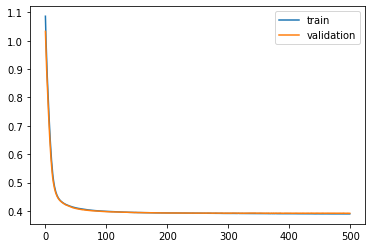

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 20s - loss: 1.0876 - val_loss: 1.0207

Epoch 00001: val_loss improved from inf to 1.02072, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0028 - val_loss: 0.9463

Epoch 00002: val_loss improved from 1.02072 to 0.94630, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9344 - val_loss: 0.8857

Epoch 00003: val_loss improved from 0.94630 to 0.88573, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.8771 - val_loss: 0.8335

Epoch 00004: val_loss improved from 0.88573 to 0.83346, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8255 - val_loss: 0.7853

Epoch 00005: val_loss improved from 0.83346 to 0.78527, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.7770 - val_loss: 0.7395

Epoch 00006: val_loss improved from 0.78527 to 0.73954, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7305 - val_loss: 0.6968

Epoch 00007: val_loss improved from 0.73954

 - 1s - loss: 0.4074 - val_loss: 0.4155

Epoch 00058: val_loss improved from 0.41567 to 0.41547, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4071 - val_loss: 0.4151

Epoch 00059: val_loss improved from 0.41547 to 0.41509, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4067 - val_loss: 0.4148

Epoch 00060: val_loss improved from 0.41509 to 0.41482, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4064 - val_loss: 0.4143

Epoch 00061: val_loss improved from 0.41482 to 0.41434, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4060 - val_loss: 0.4141

Epoch 00062: val_loss improved from 0.41434 to 0.41412, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4057 - val_loss: 0.4138

Epoch 00063: val_loss improved from 0.41412 to 0.41379, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4052 - val_loss: 0.4135

Epoch 00064: val_loss improved from 0.41379 to 0.41352, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.3961 - val_loss: 0.4066

Epoch 00120: val_loss did not improve from 0.40609
Epoch 121/500
 - 1s - loss: 0.3960 - val_loss: 0.4063

Epoch 00121: val_loss did not improve from 0.40609
Epoch 122/500
 - 1s - loss: 0.3960 - val_loss: 0.4067

Epoch 00122: val_loss did not improve from 0.40609
Epoch 123/500
 - 1s - loss: 0.3959 - val_loss: 0.4063

Epoch 00123: val_loss did not improve from 0.40609
Epoch 124/500
 - 1s - loss: 0.3958 - val_loss: 0.4062

Epoch 00124: val_loss did not improve from 0.40609
Epoch 125/500
 - 1s - loss: 0.3959 - val_loss: 0.4064

Epoch 00125: val_loss did not improve from 0.40609
Epoch 126/500
 - 1s - loss: 0.3957 - val_loss: 0.4059

Epoch 00126: val_loss improved from 0.40609 to 0.40595, saving model to val_weights3.hdf5
Epoch 127/500
 - 1s - loss: 0.3957 - val_loss: 0.4059

Epoch 00127: val_loss improved from 0.40595 to 0.40594, saving model to val_weights3.hdf5
Epoch 128/500
 - 1s - loss: 0.3955 - val_loss: 0.4053

Epoch 00128: val_loss improved fr

 - 1s - loss: 0.3926 - val_loss: 0.4034

Epoch 00191: val_loss did not improve from 0.40324
Epoch 192/500
 - 1s - loss: 0.3926 - val_loss: 0.4033

Epoch 00192: val_loss did not improve from 0.40324
Epoch 193/500
 - 1s - loss: 0.3927 - val_loss: 0.4036

Epoch 00193: val_loss did not improve from 0.40324
Epoch 194/500
 - 1s - loss: 0.3925 - val_loss: 0.4037

Epoch 00194: val_loss did not improve from 0.40324
Epoch 195/500
 - 1s - loss: 0.3925 - val_loss: 0.4033

Epoch 00195: val_loss did not improve from 0.40324
Epoch 196/500
 - 1s - loss: 0.3924 - val_loss: 0.4034

Epoch 00196: val_loss did not improve from 0.40324
Epoch 197/500
 - 1s - loss: 0.3924 - val_loss: 0.4031

Epoch 00197: val_loss improved from 0.40324 to 0.40308, saving model to val_weights3.hdf5
Epoch 198/500
 - 1s - loss: 0.3925 - val_loss: 0.4034

Epoch 00198: val_loss did not improve from 0.40308
Epoch 199/500
 - 1s - loss: 0.3925 - val_loss: 0.4032

Epoch 00199: val_loss did not improve from 0.40308
Epoch 200/500
 - 1s -


Epoch 00264: val_loss did not improve from 0.40209
Epoch 265/500
 - 1s - loss: 0.3913 - val_loss: 0.4022

Epoch 00265: val_loss did not improve from 0.40209
Epoch 266/500
 - 1s - loss: 0.3914 - val_loss: 0.4023

Epoch 00266: val_loss did not improve from 0.40209
Epoch 267/500
 - 1s - loss: 0.3912 - val_loss: 0.4021

Epoch 00267: val_loss improved from 0.40209 to 0.40208, saving model to val_weights3.hdf5
Epoch 268/500
 - 1s - loss: 0.3914 - val_loss: 0.4026

Epoch 00268: val_loss did not improve from 0.40208
Epoch 269/500
 - 1s - loss: 0.3913 - val_loss: 0.4021

Epoch 00269: val_loss improved from 0.40208 to 0.40207, saving model to val_weights3.hdf5
Epoch 270/500
 - 1s - loss: 0.3914 - val_loss: 0.4028

Epoch 00270: val_loss did not improve from 0.40207
Epoch 271/500
 - 1s - loss: 0.3913 - val_loss: 0.4021

Epoch 00271: val_loss did not improve from 0.40207
Epoch 272/500
 - 1s - loss: 0.3912 - val_loss: 0.4024

Epoch 00272: val_loss did not improve from 0.40207
Epoch 273/500
 - 1s - 

 - 1s - loss: 0.3903 - val_loss: 0.4018

Epoch 00338: val_loss did not improve from 0.40149
Epoch 339/500
 - 1s - loss: 0.3904 - val_loss: 0.4015

Epoch 00339: val_loss did not improve from 0.40149
Epoch 340/500
 - 1s - loss: 0.3902 - val_loss: 0.4017

Epoch 00340: val_loss did not improve from 0.40149
Epoch 341/500
 - 1s - loss: 0.3902 - val_loss: 0.4014

Epoch 00341: val_loss improved from 0.40149 to 0.40137, saving model to val_weights3.hdf5
Epoch 342/500
 - 1s - loss: 0.3902 - val_loss: 0.4019

Epoch 00342: val_loss did not improve from 0.40137
Epoch 343/500
 - 1s - loss: 0.3902 - val_loss: 0.4013

Epoch 00343: val_loss improved from 0.40137 to 0.40131, saving model to val_weights3.hdf5
Epoch 344/500
 - 1s - loss: 0.3901 - val_loss: 0.4018

Epoch 00344: val_loss did not improve from 0.40131
Epoch 345/500
 - 1s - loss: 0.3902 - val_loss: 0.4013

Epoch 00345: val_loss did not improve from 0.40131
Epoch 346/500
 - 1s - loss: 0.3902 - val_loss: 0.4019

Epoch 00346: val_loss did not imp


Epoch 00413: val_loss did not improve from 0.40083
Epoch 414/500
 - 1s - loss: 0.3895 - val_loss: 0.4017

Epoch 00414: val_loss did not improve from 0.40083
Epoch 415/500
 - 1s - loss: 0.3895 - val_loss: 0.4011

Epoch 00415: val_loss did not improve from 0.40083
Epoch 416/500
 - 1s - loss: 0.3893 - val_loss: 0.4011

Epoch 00416: val_loss did not improve from 0.40083
Epoch 417/500
 - 1s - loss: 0.3894 - val_loss: 0.4012

Epoch 00417: val_loss did not improve from 0.40083
Epoch 418/500
 - 1s - loss: 0.3894 - val_loss: 0.4012

Epoch 00418: val_loss did not improve from 0.40083
Epoch 419/500
 - 1s - loss: 0.3895 - val_loss: 0.4014

Epoch 00419: val_loss did not improve from 0.40083
Epoch 420/500
 - 1s - loss: 0.3895 - val_loss: 0.4012

Epoch 00420: val_loss did not improve from 0.40083
Epoch 421/500
 - 1s - loss: 0.3894 - val_loss: 0.4015

Epoch 00421: val_loss did not improve from 0.40083
Epoch 422/500
 - 1s - loss: 0.3894 - val_loss: 0.4010

Epoch 00422: val_loss did not improve from 0.


Epoch 00490: val_loss did not improve from 0.40077
Epoch 491/500
 - 1s - loss: 0.3888 - val_loss: 0.4012

Epoch 00491: val_loss did not improve from 0.40077
Epoch 492/500
 - 1s - loss: 0.3888 - val_loss: 0.4012

Epoch 00492: val_loss did not improve from 0.40077
Epoch 493/500
 - 1s - loss: 0.3889 - val_loss: 0.4010

Epoch 00493: val_loss did not improve from 0.40077
Epoch 494/500
 - 1s - loss: 0.3889 - val_loss: 0.4013

Epoch 00494: val_loss did not improve from 0.40077
Epoch 495/500
 - 1s - loss: 0.3889 - val_loss: 0.4006

Epoch 00495: val_loss improved from 0.40077 to 0.40063, saving model to val_weights3.hdf5
Epoch 496/500
 - 1s - loss: 0.3887 - val_loss: 0.4014

Epoch 00496: val_loss did not improve from 0.40063
Epoch 497/500
 - 1s - loss: 0.3888 - val_loss: 0.4011

Epoch 00497: val_loss did not improve from 0.40063
Epoch 498/500
 - 1s - loss: 0.3887 - val_loss: 0.4012

Epoch 00498: val_loss did not improve from 0.40063
Epoch 499/500
 - 1s - loss: 0.3888 - val_loss: 0.4015

Epoch 

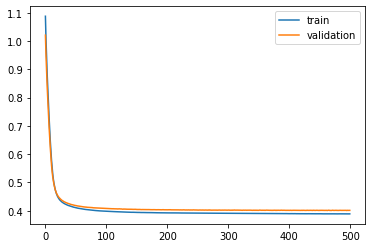

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 20s - loss: 1.0868 - val_loss: 1.0264

Epoch 00001: val_loss improved from inf to 1.02636, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0021 - val_loss: 0.9514

Epoch 00002: val_loss improved from 1.02636 to 0.95142, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9338 - val_loss: 0.8907

Epoch 00003: val_loss improved from 0.95142 to 0.89068, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.8765 - val_loss: 0.8375

Epoch 00004: val_loss improved from 0.89068 to 0.83753, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8251 - val_loss: 0.7877

Epoch 00005: val_loss improved from 0.83753 to 0.78772, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.7768 - val_loss: 0.7403

Epoch 00006: val_loss improved from 0.78772 to 0.74028, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7307 - val_loss: 0.6954

Epoch 00007: val_loss improved from 0.74028

 - 1s - loss: 0.4082 - val_loss: 0.4076

Epoch 00058: val_loss improved from 0.40807 to 0.40762, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4078 - val_loss: 0.4076

Epoch 00059: val_loss improved from 0.40762 to 0.40759, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4075 - val_loss: 0.4069

Epoch 00060: val_loss improved from 0.40759 to 0.40690, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4071 - val_loss: 0.4068

Epoch 00061: val_loss improved from 0.40690 to 0.40679, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4068 - val_loss: 0.4062

Epoch 00062: val_loss improved from 0.40679 to 0.40619, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4064 - val_loss: 0.4062

Epoch 00063: val_loss did not improve from 0.40619
Epoch 64/500
 - 1s - loss: 0.4061 - val_loss: 0.4057

Epoch 00064: val_loss improved from 0.40619 to 0.40566, saving model to val_weights4.hdf5
Epoch 65/500
 - 1s - loss: 0.4058 - val_loss

 - 1s - loss: 0.3971 - val_loss: 0.3968

Epoch 00120: val_loss did not improve from 0.39667
Epoch 121/500
 - 1s - loss: 0.3970 - val_loss: 0.3966

Epoch 00121: val_loss improved from 0.39667 to 0.39663, saving model to val_weights4.hdf5
Epoch 122/500
 - 1s - loss: 0.3969 - val_loss: 0.3966

Epoch 00122: val_loss improved from 0.39663 to 0.39656, saving model to val_weights4.hdf5
Epoch 123/500
 - 1s - loss: 0.3968 - val_loss: 0.3964

Epoch 00123: val_loss improved from 0.39656 to 0.39639, saving model to val_weights4.hdf5
Epoch 124/500
 - 1s - loss: 0.3967 - val_loss: 0.3965

Epoch 00124: val_loss did not improve from 0.39639
Epoch 125/500
 - 1s - loss: 0.3967 - val_loss: 0.3964

Epoch 00125: val_loss did not improve from 0.39639
Epoch 126/500
 - 1s - loss: 0.3966 - val_loss: 0.3965

Epoch 00126: val_loss did not improve from 0.39639
Epoch 127/500
 - 1s - loss: 0.3965 - val_loss: 0.3962

Epoch 00127: val_loss improved from 0.39639 to 0.39621, saving model to val_weights4.hdf5
Epoch 128/

 - 1s - loss: 0.3936 - val_loss: 0.3938

Epoch 00191: val_loss improved from 0.39385 to 0.39378, saving model to val_weights4.hdf5
Epoch 192/500
 - 1s - loss: 0.3935 - val_loss: 0.3940

Epoch 00192: val_loss did not improve from 0.39378
Epoch 193/500
 - 1s - loss: 0.3934 - val_loss: 0.3937

Epoch 00193: val_loss improved from 0.39378 to 0.39375, saving model to val_weights4.hdf5
Epoch 194/500
 - 1s - loss: 0.3934 - val_loss: 0.3937

Epoch 00194: val_loss improved from 0.39375 to 0.39374, saving model to val_weights4.hdf5
Epoch 195/500
 - 1s - loss: 0.3933 - val_loss: 0.3937

Epoch 00195: val_loss improved from 0.39374 to 0.39365, saving model to val_weights4.hdf5
Epoch 196/500
 - 1s - loss: 0.3933 - val_loss: 0.3937

Epoch 00196: val_loss did not improve from 0.39365
Epoch 197/500
 - 1s - loss: 0.3932 - val_loss: 0.3939

Epoch 00197: val_loss did not improve from 0.39365
Epoch 198/500
 - 1s - loss: 0.3933 - val_loss: 0.3942

Epoch 00198: val_loss did not improve from 0.39365
Epoch 199/

 - 1s - loss: 0.3923 - val_loss: 0.3936

Epoch 00265: val_loss did not improve from 0.39304
Epoch 266/500
 - 1s - loss: 0.3925 - val_loss: 0.3936

Epoch 00266: val_loss did not improve from 0.39304
Epoch 267/500
 - 1s - loss: 0.3925 - val_loss: 0.3934

Epoch 00267: val_loss did not improve from 0.39304
Epoch 268/500
 - 1s - loss: 0.3925 - val_loss: 0.3937

Epoch 00268: val_loss did not improve from 0.39304
Epoch 269/500
 - 1s - loss: 0.3925 - val_loss: 0.3933

Epoch 00269: val_loss did not improve from 0.39304
Epoch 270/500
 - 1s - loss: 0.3925 - val_loss: 0.3939

Epoch 00270: val_loss did not improve from 0.39304
Epoch 271/500
 - 1s - loss: 0.3924 - val_loss: 0.3934

Epoch 00271: val_loss did not improve from 0.39304
Epoch 272/500
 - 1s - loss: 0.3923 - val_loss: 0.3935

Epoch 00272: val_loss did not improve from 0.39304
Epoch 273/500
 - 1s - loss: 0.3924 - val_loss: 0.3933

Epoch 00273: val_loss did not improve from 0.39304
Epoch 274/500
 - 1s - loss: 0.3923 - val_loss: 0.3937

Epoch


Epoch 00341: val_loss did not improve from 0.39241
Epoch 342/500
 - 1s - loss: 0.3916 - val_loss: 0.3927

Epoch 00342: val_loss did not improve from 0.39241
Epoch 343/500
 - 1s - loss: 0.3917 - val_loss: 0.3931

Epoch 00343: val_loss did not improve from 0.39241
Epoch 344/500
 - 1s - loss: 0.3916 - val_loss: 0.3934

Epoch 00344: val_loss did not improve from 0.39241
Epoch 345/500
 - 1s - loss: 0.3917 - val_loss: 0.3930

Epoch 00345: val_loss did not improve from 0.39241
Epoch 346/500
 - 1s - loss: 0.3916 - val_loss: 0.3930

Epoch 00346: val_loss did not improve from 0.39241
Epoch 347/500
 - 1s - loss: 0.3916 - val_loss: 0.3932

Epoch 00347: val_loss did not improve from 0.39241
Epoch 348/500
 - 1s - loss: 0.3915 - val_loss: 0.3933

Epoch 00348: val_loss did not improve from 0.39241
Epoch 349/500
 - 1s - loss: 0.3916 - val_loss: 0.3932

Epoch 00349: val_loss did not improve from 0.39241
Epoch 350/500
 - 1s - loss: 0.3915 - val_loss: 0.3933

Epoch 00350: val_loss did not improve from 0.

 - 1s - loss: 0.3909 - val_loss: 0.3924

Epoch 00417: val_loss did not improve from 0.39187
Epoch 418/500
 - 1s - loss: 0.3910 - val_loss: 0.3930

Epoch 00418: val_loss did not improve from 0.39187
Epoch 419/500
 - 1s - loss: 0.3909 - val_loss: 0.3924

Epoch 00419: val_loss did not improve from 0.39187
Epoch 420/500
 - 1s - loss: 0.3910 - val_loss: 0.3928

Epoch 00420: val_loss did not improve from 0.39187
Epoch 421/500
 - 1s - loss: 0.3910 - val_loss: 0.3925

Epoch 00421: val_loss did not improve from 0.39187
Epoch 422/500
 - 1s - loss: 0.3910 - val_loss: 0.3930

Epoch 00422: val_loss did not improve from 0.39187
Epoch 423/500
 - 1s - loss: 0.3910 - val_loss: 0.3924

Epoch 00423: val_loss did not improve from 0.39187
Epoch 424/500
 - 1s - loss: 0.3910 - val_loss: 0.3925

Epoch 00424: val_loss did not improve from 0.39187
Epoch 425/500
 - 1s - loss: 0.3909 - val_loss: 0.3926

Epoch 00425: val_loss did not improve from 0.39187
Epoch 426/500
 - 1s - loss: 0.3909 - val_loss: 0.3927

Epoch

 - 1s - loss: 0.3903 - val_loss: 0.3921

Epoch 00493: val_loss did not improve from 0.39147
Epoch 494/500
 - 1s - loss: 0.3905 - val_loss: 0.3923

Epoch 00494: val_loss did not improve from 0.39147
Epoch 495/500
 - 1s - loss: 0.3904 - val_loss: 0.3923

Epoch 00495: val_loss did not improve from 0.39147
Epoch 496/500
 - 1s - loss: 0.3903 - val_loss: 0.3922

Epoch 00496: val_loss did not improve from 0.39147
Epoch 497/500
 - 1s - loss: 0.3903 - val_loss: 0.3921

Epoch 00497: val_loss did not improve from 0.39147
Epoch 498/500
 - 1s - loss: 0.3902 - val_loss: 0.3920

Epoch 00498: val_loss did not improve from 0.39147
Epoch 499/500
 - 1s - loss: 0.3902 - val_loss: 0.3920

Epoch 00499: val_loss did not improve from 0.39147
Epoch 500/500
 - 1s - loss: 0.3902 - val_loss: 0.3923

Epoch 00500: val_loss did not improve from 0.39147
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.007298684687678438
best val loss: 0.3914709494378832
#############################

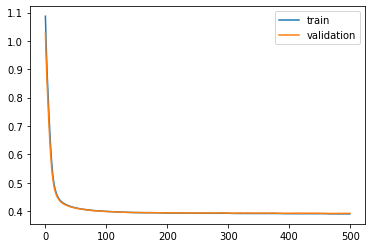

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 20s - loss: 1.0872 - val_loss: 1.0244

Epoch 00001: val_loss improved from inf to 1.02442, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0024 - val_loss: 0.9510

Epoch 00002: val_loss improved from 1.02442 to 0.95098, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9340 - val_loss: 0.8912

Epoch 00003: val_loss improved from 0.95098 to 0.89122, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.8767 - val_loss: 0.8387

Epoch 00004: val_loss improved from 0.89122 to 0.83873, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8252 - val_loss: 0.7906

Epoch 00005: val_loss improved from 0.83873 to 0.79063, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.7766 - val_loss: 0.7443

Epoch 00006: val_loss improved from 0.79063 to 0.74432, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7304 - val_loss: 0.6998

Epoch 00007: val_loss improved from 0.74432

 - 1s - loss: 0.4077 - val_loss: 0.4117

Epoch 00058: val_loss improved from 0.41222 to 0.41173, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4074 - val_loss: 0.4118

Epoch 00059: val_loss did not improve from 0.41173
Epoch 60/500
 - 1s - loss: 0.4070 - val_loss: 0.4110

Epoch 00060: val_loss improved from 0.41173 to 0.41101, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4066 - val_loss: 0.4111

Epoch 00061: val_loss did not improve from 0.41101
Epoch 62/500
 - 1s - loss: 0.4063 - val_loss: 0.4107

Epoch 00062: val_loss improved from 0.41101 to 0.41068, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4059 - val_loss: 0.4106

Epoch 00063: val_loss improved from 0.41068 to 0.41064, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4056 - val_loss: 0.4102

Epoch 00064: val_loss improved from 0.41064 to 0.41018, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4053 - val_loss: 0.4101

Epoch 00065: val_loss improve

 - 1s - loss: 0.3968 - val_loss: 0.4023

Epoch 00120: val_loss improved from 0.40244 to 0.40234, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.3967 - val_loss: 0.4026

Epoch 00121: val_loss did not improve from 0.40234
Epoch 122/500
 - 1s - loss: 0.3966 - val_loss: 0.4025

Epoch 00122: val_loss did not improve from 0.40234
Epoch 123/500
 - 1s - loss: 0.3966 - val_loss: 0.4022

Epoch 00123: val_loss improved from 0.40234 to 0.40223, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3965 - val_loss: 0.4023

Epoch 00124: val_loss did not improve from 0.40223
Epoch 125/500
 - 1s - loss: 0.3966 - val_loss: 0.4021

Epoch 00125: val_loss improved from 0.40223 to 0.40214, saving model to val_weights5.hdf5
Epoch 126/500
 - 1s - loss: 0.3964 - val_loss: 0.4023

Epoch 00126: val_loss did not improve from 0.40214
Epoch 127/500
 - 1s - loss: 0.3963 - val_loss: 0.4020

Epoch 00127: val_loss improved from 0.40214 to 0.40196, saving model to val_weights5.hdf5
Epoch 128/

 - 1s - loss: 0.3935 - val_loss: 0.3988

Epoch 00187: val_loss did not improve from 0.39853
Epoch 188/500
 - 1s - loss: 0.3935 - val_loss: 0.3989

Epoch 00188: val_loss did not improve from 0.39853
Epoch 189/500
 - 1s - loss: 0.3936 - val_loss: 0.3985

Epoch 00189: val_loss improved from 0.39853 to 0.39848, saving model to val_weights5.hdf5
Epoch 190/500
 - 1s - loss: 0.3934 - val_loss: 0.3989

Epoch 00190: val_loss did not improve from 0.39848
Epoch 191/500
 - 1s - loss: 0.3935 - val_loss: 0.3987

Epoch 00191: val_loss did not improve from 0.39848
Epoch 192/500
 - 1s - loss: 0.3933 - val_loss: 0.3987

Epoch 00192: val_loss did not improve from 0.39848
Epoch 193/500
 - 1s - loss: 0.3933 - val_loss: 0.3985

Epoch 00193: val_loss improved from 0.39848 to 0.39847, saving model to val_weights5.hdf5
Epoch 194/500
 - 1s - loss: 0.3933 - val_loss: 0.3986

Epoch 00194: val_loss did not improve from 0.39847
Epoch 195/500
 - 1s - loss: 0.3933 - val_loss: 0.3987

Epoch 00195: val_loss did not imp

 - 1s - loss: 0.3921 - val_loss: 0.3978

Epoch 00260: val_loss did not improve from 0.39722
Epoch 261/500
 - 1s - loss: 0.3921 - val_loss: 0.3974

Epoch 00261: val_loss did not improve from 0.39722
Epoch 262/500
 - 1s - loss: 0.3922 - val_loss: 0.3978

Epoch 00262: val_loss did not improve from 0.39722
Epoch 263/500
 - 1s - loss: 0.3922 - val_loss: 0.3978

Epoch 00263: val_loss did not improve from 0.39722
Epoch 264/500
 - 1s - loss: 0.3921 - val_loss: 0.3977

Epoch 00264: val_loss did not improve from 0.39722
Epoch 265/500
 - 1s - loss: 0.3921 - val_loss: 0.3978

Epoch 00265: val_loss did not improve from 0.39722
Epoch 266/500
 - 1s - loss: 0.3921 - val_loss: 0.3985

Epoch 00266: val_loss did not improve from 0.39722
Epoch 267/500
 - 1s - loss: 0.3923 - val_loss: 0.3981

Epoch 00267: val_loss did not improve from 0.39722
Epoch 268/500
 - 1s - loss: 0.3922 - val_loss: 0.3980

Epoch 00268: val_loss did not improve from 0.39722
Epoch 269/500
 - 1s - loss: 0.3923 - val_loss: 0.3983

Epoch


Epoch 00335: val_loss did not improve from 0.39663
Epoch 336/500
 - 1s - loss: 0.3921 - val_loss: 0.3981

Epoch 00336: val_loss did not improve from 0.39663
Epoch 337/500
 - 1s - loss: 0.3920 - val_loss: 0.3973

Epoch 00337: val_loss did not improve from 0.39663
Epoch 338/500
 - 1s - loss: 0.3920 - val_loss: 0.3973

Epoch 00338: val_loss did not improve from 0.39663
Epoch 339/500
 - 1s - loss: 0.3919 - val_loss: 0.3966

Epoch 00339: val_loss did not improve from 0.39663
Epoch 340/500
 - 1s - loss: 0.3917 - val_loss: 0.3968

Epoch 00340: val_loss did not improve from 0.39663
Epoch 341/500
 - 1s - loss: 0.3915 - val_loss: 0.3967

Epoch 00341: val_loss did not improve from 0.39663
Epoch 342/500
 - 1s - loss: 0.3913 - val_loss: 0.3966

Epoch 00342: val_loss improved from 0.39663 to 0.39663, saving model to val_weights5.hdf5
Epoch 343/500
 - 1s - loss: 0.3912 - val_loss: 0.3967

Epoch 00343: val_loss did not improve from 0.39663
Epoch 344/500
 - 1s - loss: 0.3910 - val_loss: 0.3963

Epoch 

 - 1s - loss: 0.3908 - val_loss: 0.3972

Epoch 00412: val_loss did not improve from 0.39626
Epoch 413/500
 - 1s - loss: 0.3907 - val_loss: 0.3966

Epoch 00413: val_loss did not improve from 0.39626
Epoch 414/500
 - 1s - loss: 0.3908 - val_loss: 0.3971

Epoch 00414: val_loss did not improve from 0.39626
Epoch 415/500
 - 1s - loss: 0.3907 - val_loss: 0.3974

Epoch 00415: val_loss did not improve from 0.39626
Epoch 416/500
 - 1s - loss: 0.3908 - val_loss: 0.3973

Epoch 00416: val_loss did not improve from 0.39626
Epoch 417/500
 - 1s - loss: 0.3908 - val_loss: 0.3971

Epoch 00417: val_loss did not improve from 0.39626
Epoch 418/500
 - 1s - loss: 0.3908 - val_loss: 0.3972

Epoch 00418: val_loss did not improve from 0.39626
Epoch 419/500
 - 1s - loss: 0.3909 - val_loss: 0.3980

Epoch 00419: val_loss did not improve from 0.39626
Epoch 420/500
 - 1s - loss: 0.3909 - val_loss: 0.3976

Epoch 00420: val_loss did not improve from 0.39626
Epoch 421/500
 - 1s - loss: 0.3909 - val_loss: 0.3974

Epoch

 - 1s - loss: 0.3899 - val_loss: 0.3965

Epoch 00489: val_loss did not improve from 0.39601
Epoch 490/500
 - 1s - loss: 0.3897 - val_loss: 0.3960

Epoch 00490: val_loss improved from 0.39601 to 0.39600, saving model to val_weights5.hdf5
Epoch 491/500
 - 1s - loss: 0.3898 - val_loss: 0.3962

Epoch 00491: val_loss did not improve from 0.39600
Epoch 492/500
 - 1s - loss: 0.3897 - val_loss: 0.3963

Epoch 00492: val_loss did not improve from 0.39600
Epoch 493/500
 - 1s - loss: 0.3897 - val_loss: 0.3969

Epoch 00493: val_loss did not improve from 0.39600
Epoch 494/500
 - 1s - loss: 0.3897 - val_loss: 0.3966

Epoch 00494: val_loss did not improve from 0.39600
Epoch 495/500
 - 1s - loss: 0.3898 - val_loss: 0.3960

Epoch 00495: val_loss improved from 0.39600 to 0.39597, saving model to val_weights5.hdf5
Epoch 496/500
 - 1s - loss: 0.3898 - val_loss: 0.3959

Epoch 00496: val_loss improved from 0.39597 to 0.39587, saving model to val_weights5.hdf5
Epoch 497/500
 - 1s - loss: 0.3897 - val_loss: 0.

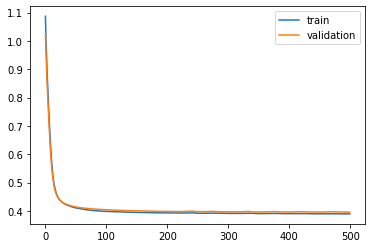

Time to train LSTM:  377.090345621109
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 54s - loss: 1.1259 - val_loss: 1.0747

Epoch 00001: val_loss improved from inf to 1.07466, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0358 - val_loss: 0.9937

Epoch 00002: val_loss improved from 1.07466 to 0.99368, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9626 - val_loss: 0.9268

Epoch 00003: val_loss improved from 0.99368 to 0.92685, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9008 - val_loss: 0.8693

Epoch 00004: val_loss improved from 0.92685 to 0.86926, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8454 - val_loss: 0.8160

Epoch 00005: val_loss improved from 0.86926 to 0.81598, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.7932 - val_loss: 0.7658

Epoch 00006: val_loss improved from 0.81598 to 0.76584, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7434 - val_loss: 0.7181

Epoch

 - 1s - loss: 0.4078 - val_loss: 0.4149

Epoch 00058: val_loss improved from 0.41544 to 0.41493, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4074 - val_loss: 0.4147

Epoch 00059: val_loss improved from 0.41493 to 0.41465, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4071 - val_loss: 0.4142

Epoch 00060: val_loss improved from 0.41465 to 0.41418, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4068 - val_loss: 0.4138

Epoch 00061: val_loss improved from 0.41418 to 0.41377, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4064 - val_loss: 0.4133

Epoch 00062: val_loss improved from 0.41377 to 0.41329, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4061 - val_loss: 0.4130

Epoch 00063: val_loss improved from 0.41329 to 0.41300, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4058 - val_loss: 0.4129

Epoch 00064: val_loss improved from 0.41300 to 0.41285, saving model to val_weights1.hdf5
Epoch


Epoch 00117: val_loss did not improve from 0.40256
Epoch 118/500
 - 1s - loss: 0.3971 - val_loss: 0.4030

Epoch 00118: val_loss did not improve from 0.40256
Epoch 119/500
 - 1s - loss: 0.3970 - val_loss: 0.4023

Epoch 00119: val_loss improved from 0.40256 to 0.40228, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.3970 - val_loss: 0.4026

Epoch 00120: val_loss did not improve from 0.40228
Epoch 121/500
 - 1s - loss: 0.3968 - val_loss: 0.4023

Epoch 00121: val_loss improved from 0.40228 to 0.40227, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3967 - val_loss: 0.4025

Epoch 00122: val_loss did not improve from 0.40227
Epoch 123/500
 - 1s - loss: 0.3966 - val_loss: 0.4020

Epoch 00123: val_loss improved from 0.40227 to 0.40203, saving model to val_weights1.hdf5
Epoch 124/500
 - 1s - loss: 0.3966 - val_loss: 0.4022

Epoch 00124: val_loss did not improve from 0.40203
Epoch 125/500
 - 1s - loss: 0.3965 - val_loss: 0.4020

Epoch 00125: val_loss improved fro

 - 1s - loss: 0.3934 - val_loss: 0.3992

Epoch 00186: val_loss did not improve from 0.39907
Epoch 187/500
 - 1s - loss: 0.3934 - val_loss: 0.3994

Epoch 00187: val_loss did not improve from 0.39907
Epoch 188/500
 - 1s - loss: 0.3934 - val_loss: 0.3989

Epoch 00188: val_loss improved from 0.39907 to 0.39894, saving model to val_weights1.hdf5
Epoch 189/500
 - 1s - loss: 0.3934 - val_loss: 0.3992

Epoch 00189: val_loss did not improve from 0.39894
Epoch 190/500
 - 1s - loss: 0.3933 - val_loss: 0.3992

Epoch 00190: val_loss did not improve from 0.39894
Epoch 191/500
 - 1s - loss: 0.3933 - val_loss: 0.3994

Epoch 00191: val_loss did not improve from 0.39894
Epoch 192/500
 - 1s - loss: 0.3934 - val_loss: 0.3991

Epoch 00192: val_loss did not improve from 0.39894
Epoch 193/500
 - 1s - loss: 0.3934 - val_loss: 0.3997

Epoch 00193: val_loss did not improve from 0.39894
Epoch 194/500
 - 1s - loss: 0.3935 - val_loss: 0.3992

Epoch 00194: val_loss did not improve from 0.39894
Epoch 195/500
 - 1s -

 - 1s - loss: 0.3924 - val_loss: 0.3980

Epoch 00260: val_loss did not improve from 0.39783
Epoch 261/500
 - 1s - loss: 0.3923 - val_loss: 0.3982

Epoch 00261: val_loss did not improve from 0.39783
Epoch 262/500
 - 1s - loss: 0.3923 - val_loss: 0.3981

Epoch 00262: val_loss did not improve from 0.39783
Epoch 263/500
 - 1s - loss: 0.3923 - val_loss: 0.3980

Epoch 00263: val_loss did not improve from 0.39783
Epoch 264/500
 - 1s - loss: 0.3922 - val_loss: 0.3982

Epoch 00264: val_loss did not improve from 0.39783
Epoch 265/500
 - 1s - loss: 0.3923 - val_loss: 0.3980

Epoch 00265: val_loss did not improve from 0.39783
Epoch 266/500
 - 1s - loss: 0.3924 - val_loss: 0.3980

Epoch 00266: val_loss did not improve from 0.39783
Epoch 267/500
 - 1s - loss: 0.3924 - val_loss: 0.3980

Epoch 00267: val_loss did not improve from 0.39783
Epoch 268/500
 - 1s - loss: 0.3922 - val_loss: 0.3979

Epoch 00268: val_loss did not improve from 0.39783
Epoch 269/500
 - 1s - loss: 0.3922 - val_loss: 0.3983

Epoch

 - 1s - loss: 0.3918 - val_loss: 0.3981

Epoch 00336: val_loss did not improve from 0.39725
Epoch 337/500
 - 1s - loss: 0.3920 - val_loss: 0.3982

Epoch 00337: val_loss did not improve from 0.39725
Epoch 338/500
 - 1s - loss: 0.3920 - val_loss: 0.3988

Epoch 00338: val_loss did not improve from 0.39725
Epoch 339/500
 - 1s - loss: 0.3922 - val_loss: 0.3987

Epoch 00339: val_loss did not improve from 0.39725
Epoch 340/500
 - 1s - loss: 0.3920 - val_loss: 0.3989

Epoch 00340: val_loss did not improve from 0.39725
Epoch 341/500
 - 1s - loss: 0.3922 - val_loss: 0.3995

Epoch 00341: val_loss did not improve from 0.39725
Epoch 342/500
 - 1s - loss: 0.3921 - val_loss: 0.3997

Epoch 00342: val_loss did not improve from 0.39725
Epoch 343/500
 - 1s - loss: 0.3924 - val_loss: 0.3999

Epoch 00343: val_loss did not improve from 0.39725
Epoch 344/500
 - 1s - loss: 0.3924 - val_loss: 0.4004

Epoch 00344: val_loss did not improve from 0.39725
Epoch 345/500
 - 1s - loss: 0.3924 - val_loss: 0.4003

Epoch


Epoch 00413: val_loss did not improve from 0.39725
Epoch 414/500
 - 1s - loss: 0.3908 - val_loss: 0.3977

Epoch 00414: val_loss did not improve from 0.39725
Epoch 415/500
 - 1s - loss: 0.3907 - val_loss: 0.3981

Epoch 00415: val_loss did not improve from 0.39725
Epoch 416/500
 - 1s - loss: 0.3908 - val_loss: 0.3974

Epoch 00416: val_loss did not improve from 0.39725
Epoch 417/500
 - 1s - loss: 0.3907 - val_loss: 0.3975

Epoch 00417: val_loss did not improve from 0.39725
Epoch 418/500
 - 1s - loss: 0.3906 - val_loss: 0.3975

Epoch 00418: val_loss did not improve from 0.39725
Epoch 419/500
 - 1s - loss: 0.3906 - val_loss: 0.3976

Epoch 00419: val_loss did not improve from 0.39725
Epoch 420/500
 - 1s - loss: 0.3907 - val_loss: 0.3981

Epoch 00420: val_loss did not improve from 0.39725
Epoch 421/500
 - 1s - loss: 0.3908 - val_loss: 0.3975

Epoch 00421: val_loss did not improve from 0.39725
Epoch 422/500
 - 1s - loss: 0.3906 - val_loss: 0.3975

Epoch 00422: val_loss did not improve from 0.


Epoch 00487: val_loss did not improve from 0.39653
Epoch 488/500
 - 1s - loss: 0.3899 - val_loss: 0.3967

Epoch 00488: val_loss did not improve from 0.39653
Epoch 489/500
 - 1s - loss: 0.3900 - val_loss: 0.3968

Epoch 00489: val_loss did not improve from 0.39653
Epoch 490/500
 - 1s - loss: 0.3899 - val_loss: 0.3967

Epoch 00490: val_loss did not improve from 0.39653
Epoch 491/500
 - 1s - loss: 0.3899 - val_loss: 0.3971

Epoch 00491: val_loss did not improve from 0.39653
Epoch 492/500
 - 1s - loss: 0.3899 - val_loss: 0.3966

Epoch 00492: val_loss did not improve from 0.39653
Epoch 493/500
 - 1s - loss: 0.3898 - val_loss: 0.3966

Epoch 00493: val_loss did not improve from 0.39653
Epoch 494/500
 - 1s - loss: 0.3899 - val_loss: 0.3969

Epoch 00494: val_loss did not improve from 0.39653
Epoch 495/500
 - 1s - loss: 0.3899 - val_loss: 0.3970

Epoch 00495: val_loss did not improve from 0.39653
Epoch 496/500
 - 1s - loss: 0.3899 - val_loss: 0.3967

Epoch 00496: val_loss did not improve from 0.

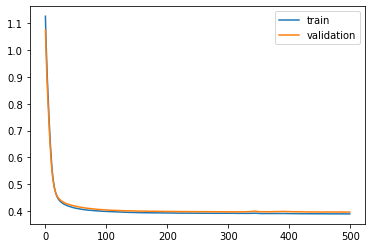

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 23s - loss: 1.1266 - val_loss: 1.0703

Epoch 00001: val_loss improved from inf to 1.07031, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0364 - val_loss: 0.9923

Epoch 00002: val_loss improved from 1.07031 to 0.99227, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9628 - val_loss: 0.9270

Epoch 00003: val_loss improved from 0.99227 to 0.92703, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9008 - val_loss: 0.8694

Epoch 00004: val_loss improved from 0.92703 to 0.86939, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8451 - val_loss: 0.8155

Epoch 00005: val_loss improved from 0.86939 to 0.81545, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.7930 - val_loss: 0.7637

Epoch 00006: val_loss improved from 0.81545 to 0.76375, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7435 - val_loss: 0.7150

Epoch 00007: val_loss improved from 0.76375

 - 1s - loss: 0.4085 - val_loss: 0.4062

Epoch 00058: val_loss improved from 0.40645 to 0.40616, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4081 - val_loss: 0.4057

Epoch 00059: val_loss improved from 0.40616 to 0.40571, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4078 - val_loss: 0.4054

Epoch 00060: val_loss improved from 0.40571 to 0.40535, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4074 - val_loss: 0.4051

Epoch 00061: val_loss improved from 0.40535 to 0.40512, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4070 - val_loss: 0.4047

Epoch 00062: val_loss improved from 0.40512 to 0.40468, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4067 - val_loss: 0.4046

Epoch 00063: val_loss improved from 0.40468 to 0.40457, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4064 - val_loss: 0.4041

Epoch 00064: val_loss improved from 0.40457 to 0.40412, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3974 - val_loss: 0.3968

Epoch 00120: val_loss did not improve from 0.39675
Epoch 121/500
 - 1s - loss: 0.3974 - val_loss: 0.3967

Epoch 00121: val_loss improved from 0.39675 to 0.39675, saving model to val_weights2.hdf5
Epoch 122/500
 - 1s - loss: 0.3972 - val_loss: 0.3967

Epoch 00122: val_loss improved from 0.39675 to 0.39672, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3972 - val_loss: 0.3967

Epoch 00123: val_loss improved from 0.39672 to 0.39665, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3971 - val_loss: 0.3966

Epoch 00124: val_loss improved from 0.39665 to 0.39660, saving model to val_weights2.hdf5
Epoch 125/500
 - 1s - loss: 0.3971 - val_loss: 0.3965

Epoch 00125: val_loss improved from 0.39660 to 0.39648, saving model to val_weights2.hdf5
Epoch 126/500
 - 1s - loss: 0.3970 - val_loss: 0.3962

Epoch 00126: val_loss improved from 0.39648 to 0.39623, saving model to val_weights2.hdf5
Epoch 127/500
 - 1s - loss: 0.3970 - v


Epoch 00187: val_loss did not improve from 0.39351
Epoch 188/500
 - 1s - loss: 0.3941 - val_loss: 0.3933

Epoch 00188: val_loss improved from 0.39351 to 0.39331, saving model to val_weights2.hdf5
Epoch 189/500
 - 1s - loss: 0.3940 - val_loss: 0.3937

Epoch 00189: val_loss did not improve from 0.39331
Epoch 190/500
 - 1s - loss: 0.3940 - val_loss: 0.3933

Epoch 00190: val_loss improved from 0.39331 to 0.39328, saving model to val_weights2.hdf5
Epoch 191/500
 - 1s - loss: 0.3939 - val_loss: 0.3936

Epoch 00191: val_loss did not improve from 0.39328
Epoch 192/500
 - 1s - loss: 0.3939 - val_loss: 0.3932

Epoch 00192: val_loss improved from 0.39328 to 0.39322, saving model to val_weights2.hdf5
Epoch 193/500
 - 1s - loss: 0.3939 - val_loss: 0.3934

Epoch 00193: val_loss did not improve from 0.39322
Epoch 194/500
 - 1s - loss: 0.3939 - val_loss: 0.3933

Epoch 00194: val_loss did not improve from 0.39322
Epoch 195/500
 - 1s - loss: 0.3940 - val_loss: 0.3935

Epoch 00195: val_loss did not impr

 - 1s - loss: 0.3929 - val_loss: 0.3925

Epoch 00260: val_loss did not improve from 0.39233
Epoch 261/500
 - 1s - loss: 0.3927 - val_loss: 0.3925

Epoch 00261: val_loss did not improve from 0.39233
Epoch 262/500
 - 1s - loss: 0.3928 - val_loss: 0.3924

Epoch 00262: val_loss did not improve from 0.39233
Epoch 263/500
 - 1s - loss: 0.3927 - val_loss: 0.3925

Epoch 00263: val_loss did not improve from 0.39233
Epoch 264/500
 - 1s - loss: 0.3928 - val_loss: 0.3926

Epoch 00264: val_loss did not improve from 0.39233
Epoch 265/500
 - 1s - loss: 0.3927 - val_loss: 0.3926

Epoch 00265: val_loss did not improve from 0.39233
Epoch 266/500
 - 1s - loss: 0.3928 - val_loss: 0.3928

Epoch 00266: val_loss did not improve from 0.39233
Epoch 267/500
 - 1s - loss: 0.3928 - val_loss: 0.3929

Epoch 00267: val_loss did not improve from 0.39233
Epoch 268/500
 - 1s - loss: 0.3928 - val_loss: 0.3924

Epoch 00268: val_loss did not improve from 0.39233
Epoch 269/500
 - 1s - loss: 0.3928 - val_loss: 0.3926

Epoch

 - 1s - loss: 0.3918 - val_loss: 0.3924

Epoch 00336: val_loss did not improve from 0.39211
Epoch 337/500
 - 1s - loss: 0.3918 - val_loss: 0.3922

Epoch 00337: val_loss did not improve from 0.39211
Epoch 338/500
 - 1s - loss: 0.3919 - val_loss: 0.3924

Epoch 00338: val_loss did not improve from 0.39211
Epoch 339/500
 - 1s - loss: 0.3919 - val_loss: 0.3924

Epoch 00339: val_loss did not improve from 0.39211
Epoch 340/500
 - 1s - loss: 0.3919 - val_loss: 0.3922

Epoch 00340: val_loss did not improve from 0.39211
Epoch 341/500
 - 1s - loss: 0.3917 - val_loss: 0.3925

Epoch 00341: val_loss did not improve from 0.39211
Epoch 342/500
 - 1s - loss: 0.3917 - val_loss: 0.3921

Epoch 00342: val_loss did not improve from 0.39211
Epoch 343/500
 - 1s - loss: 0.3918 - val_loss: 0.3922

Epoch 00343: val_loss did not improve from 0.39211
Epoch 344/500
 - 1s - loss: 0.3917 - val_loss: 0.3922

Epoch 00344: val_loss did not improve from 0.39211
Epoch 345/500
 - 1s - loss: 0.3919 - val_loss: 0.3921

Epoch

 - 1s - loss: 0.3912 - val_loss: 0.3924

Epoch 00413: val_loss did not improve from 0.39193
Epoch 414/500
 - 1s - loss: 0.3913 - val_loss: 0.3923

Epoch 00414: val_loss did not improve from 0.39193
Epoch 415/500
 - 1s - loss: 0.3913 - val_loss: 0.3926

Epoch 00415: val_loss did not improve from 0.39193
Epoch 416/500
 - 1s - loss: 0.3913 - val_loss: 0.3925

Epoch 00416: val_loss did not improve from 0.39193
Epoch 417/500
 - 1s - loss: 0.3913 - val_loss: 0.3924

Epoch 00417: val_loss did not improve from 0.39193
Epoch 418/500
 - 1s - loss: 0.3913 - val_loss: 0.3925

Epoch 00418: val_loss did not improve from 0.39193
Epoch 419/500
 - 1s - loss: 0.3911 - val_loss: 0.3923

Epoch 00419: val_loss did not improve from 0.39193
Epoch 420/500
 - 1s - loss: 0.3910 - val_loss: 0.3923

Epoch 00420: val_loss did not improve from 0.39193
Epoch 421/500
 - 1s - loss: 0.3911 - val_loss: 0.3925

Epoch 00421: val_loss did not improve from 0.39193
Epoch 422/500
 - 1s - loss: 0.3912 - val_loss: 0.3923

Epoch


Epoch 00490: val_loss did not improve from 0.39193
Epoch 491/500
 - 1s - loss: 0.3906 - val_loss: 0.3923

Epoch 00491: val_loss did not improve from 0.39193
Epoch 492/500
 - 1s - loss: 0.3905 - val_loss: 0.3922

Epoch 00492: val_loss did not improve from 0.39193
Epoch 493/500
 - 1s - loss: 0.3904 - val_loss: 0.3921

Epoch 00493: val_loss did not improve from 0.39193
Epoch 494/500
 - 1s - loss: 0.3905 - val_loss: 0.3922

Epoch 00494: val_loss did not improve from 0.39193
Epoch 495/500
 - 1s - loss: 0.3904 - val_loss: 0.3923

Epoch 00495: val_loss did not improve from 0.39193
Epoch 496/500
 - 1s - loss: 0.3906 - val_loss: 0.3924

Epoch 00496: val_loss did not improve from 0.39193
Epoch 497/500
 - 1s - loss: 0.3905 - val_loss: 0.3925

Epoch 00497: val_loss did not improve from 0.39193
Epoch 498/500
 - 1s - loss: 0.3905 - val_loss: 0.3924

Epoch 00498: val_loss did not improve from 0.39193
Epoch 499/500
 - 1s - loss: 0.3905 - val_loss: 0.3924

Epoch 00499: val_loss did not improve from 0.

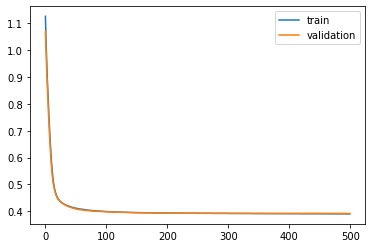

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 31s - loss: 1.1280 - val_loss: 1.0582

Epoch 00001: val_loss improved from inf to 1.05821, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0380 - val_loss: 0.9786

Epoch 00002: val_loss improved from 1.05821 to 0.97857, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9645 - val_loss: 0.9130

Epoch 00003: val_loss improved from 0.97857 to 0.91300, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9024 - val_loss: 0.8563

Epoch 00004: val_loss improved from 0.91300 to 0.85632, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8467 - val_loss: 0.8041

Epoch 00005: val_loss improved from 0.85632 to 0.80408, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.7944 - val_loss: 0.7547

Epoch 00006: val_loss improved from 0.80408 to 0.75467, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7445 - val_loss: 0.7087

Epoch 00007: val_loss improved from 0.75467

 - 1s - loss: 0.4079 - val_loss: 0.4152

Epoch 00058: val_loss improved from 0.41576 to 0.41520, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4074 - val_loss: 0.4149

Epoch 00059: val_loss improved from 0.41520 to 0.41491, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4071 - val_loss: 0.4148

Epoch 00060: val_loss improved from 0.41491 to 0.41477, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4067 - val_loss: 0.4144

Epoch 00061: val_loss improved from 0.41477 to 0.41435, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4063 - val_loss: 0.4143

Epoch 00062: val_loss improved from 0.41435 to 0.41425, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4060 - val_loss: 0.4140

Epoch 00063: val_loss improved from 0.41425 to 0.41395, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4057 - val_loss: 0.4134

Epoch 00064: val_loss improved from 0.41395 to 0.41339, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.3965 - val_loss: 0.4066

Epoch 00120: val_loss did not improve from 0.40644
Epoch 121/500
 - 1s - loss: 0.3964 - val_loss: 0.4059

Epoch 00121: val_loss improved from 0.40644 to 0.40586, saving model to val_weights3.hdf5
Epoch 122/500
 - 1s - loss: 0.3963 - val_loss: 0.4063

Epoch 00122: val_loss did not improve from 0.40586
Epoch 123/500
 - 1s - loss: 0.3963 - val_loss: 0.4061

Epoch 00123: val_loss did not improve from 0.40586
Epoch 124/500
 - 1s - loss: 0.3962 - val_loss: 0.4062

Epoch 00124: val_loss did not improve from 0.40586
Epoch 125/500
 - 1s - loss: 0.3960 - val_loss: 0.4061

Epoch 00125: val_loss did not improve from 0.40586
Epoch 126/500
 - 1s - loss: 0.3960 - val_loss: 0.4062

Epoch 00126: val_loss did not improve from 0.40586
Epoch 127/500
 - 1s - loss: 0.3960 - val_loss: 0.4059

Epoch 00127: val_loss did not improve from 0.40586
Epoch 128/500
 - 1s - loss: 0.3958 - val_loss: 0.4058

Epoch 00128: val_loss improved from 0.40586 to 0.40576, saving model to 

 - 1s - loss: 0.3931 - val_loss: 0.4034

Epoch 00189: val_loss did not improve from 0.40333
Epoch 190/500
 - 1s - loss: 0.3931 - val_loss: 0.4033

Epoch 00190: val_loss improved from 0.40333 to 0.40330, saving model to val_weights3.hdf5
Epoch 191/500
 - 1s - loss: 0.3932 - val_loss: 0.4036

Epoch 00191: val_loss did not improve from 0.40330
Epoch 192/500
 - 1s - loss: 0.3931 - val_loss: 0.4037

Epoch 00192: val_loss did not improve from 0.40330
Epoch 193/500
 - 1s - loss: 0.3930 - val_loss: 0.4033

Epoch 00193: val_loss did not improve from 0.40330
Epoch 194/500
 - 1s - loss: 0.3930 - val_loss: 0.4037

Epoch 00194: val_loss did not improve from 0.40330
Epoch 195/500
 - 1s - loss: 0.3929 - val_loss: 0.4032

Epoch 00195: val_loss improved from 0.40330 to 0.40325, saving model to val_weights3.hdf5
Epoch 196/500
 - 1s - loss: 0.3930 - val_loss: 0.4037

Epoch 00196: val_loss did not improve from 0.40325
Epoch 197/500
 - 1s - loss: 0.3929 - val_loss: 0.4034

Epoch 00197: val_loss did not imp


Epoch 00261: val_loss did not improve from 0.40226
Epoch 262/500
 - 1s - loss: 0.3919 - val_loss: 0.4027

Epoch 00262: val_loss did not improve from 0.40226
Epoch 263/500
 - 1s - loss: 0.3920 - val_loss: 0.4030

Epoch 00263: val_loss did not improve from 0.40226
Epoch 264/500
 - 1s - loss: 0.3919 - val_loss: 0.4024

Epoch 00264: val_loss did not improve from 0.40226
Epoch 265/500
 - 1s - loss: 0.3919 - val_loss: 0.4029

Epoch 00265: val_loss did not improve from 0.40226
Epoch 266/500
 - 1s - loss: 0.3919 - val_loss: 0.4025

Epoch 00266: val_loss did not improve from 0.40226
Epoch 267/500
 - 1s - loss: 0.3920 - val_loss: 0.4025

Epoch 00267: val_loss did not improve from 0.40226
Epoch 268/500
 - 1s - loss: 0.3919 - val_loss: 0.4027

Epoch 00268: val_loss did not improve from 0.40226
Epoch 269/500
 - 1s - loss: 0.3920 - val_loss: 0.4028

Epoch 00269: val_loss did not improve from 0.40226
Epoch 270/500
 - 1s - loss: 0.3919 - val_loss: 0.4023

Epoch 00270: val_loss did not improve from 0.

 - 1s - loss: 0.3911 - val_loss: 0.4018

Epoch 00336: val_loss did not improve from 0.40161
Epoch 337/500
 - 1s - loss: 0.3911 - val_loss: 0.4016

Epoch 00337: val_loss improved from 0.40161 to 0.40156, saving model to val_weights3.hdf5
Epoch 338/500
 - 1s - loss: 0.3910 - val_loss: 0.4016

Epoch 00338: val_loss did not improve from 0.40156
Epoch 339/500
 - 1s - loss: 0.3910 - val_loss: 0.4017

Epoch 00339: val_loss did not improve from 0.40156
Epoch 340/500
 - 1s - loss: 0.3909 - val_loss: 0.4017

Epoch 00340: val_loss did not improve from 0.40156
Epoch 341/500
 - 1s - loss: 0.3911 - val_loss: 0.4018

Epoch 00341: val_loss did not improve from 0.40156
Epoch 342/500
 - 1s - loss: 0.3910 - val_loss: 0.4016

Epoch 00342: val_loss did not improve from 0.40156
Epoch 343/500
 - 1s - loss: 0.3910 - val_loss: 0.4016

Epoch 00343: val_loss did not improve from 0.40156
Epoch 344/500
 - 1s - loss: 0.3910 - val_loss: 0.4019

Epoch 00344: val_loss did not improve from 0.40156
Epoch 345/500
 - 1s -

 - 1s - loss: 0.3903 - val_loss: 0.4008

Epoch 00411: val_loss did not improve from 0.40084
Epoch 412/500
 - 1s - loss: 0.3902 - val_loss: 0.4007

Epoch 00412: val_loss improved from 0.40084 to 0.40068, saving model to val_weights3.hdf5
Epoch 413/500
 - 1s - loss: 0.3903 - val_loss: 0.4011

Epoch 00413: val_loss did not improve from 0.40068
Epoch 414/500
 - 1s - loss: 0.3902 - val_loss: 0.4014

Epoch 00414: val_loss did not improve from 0.40068
Epoch 415/500
 - 1s - loss: 0.3902 - val_loss: 0.4011

Epoch 00415: val_loss did not improve from 0.40068
Epoch 416/500
 - 1s - loss: 0.3903 - val_loss: 0.4014

Epoch 00416: val_loss did not improve from 0.40068
Epoch 417/500
 - 1s - loss: 0.3902 - val_loss: 0.4010

Epoch 00417: val_loss did not improve from 0.40068
Epoch 418/500
 - 1s - loss: 0.3902 - val_loss: 0.4008

Epoch 00418: val_loss did not improve from 0.40068
Epoch 419/500
 - 1s - loss: 0.3901 - val_loss: 0.4009

Epoch 00419: val_loss did not improve from 0.40068
Epoch 420/500
 - 1s -

 - 1s - loss: 0.3898 - val_loss: 0.4010

Epoch 00487: val_loss did not improve from 0.40062
Epoch 488/500
 - 1s - loss: 0.3897 - val_loss: 0.4009

Epoch 00488: val_loss did not improve from 0.40062
Epoch 489/500
 - 1s - loss: 0.3896 - val_loss: 0.4009

Epoch 00489: val_loss did not improve from 0.40062
Epoch 490/500
 - 1s - loss: 0.3895 - val_loss: 0.4008

Epoch 00490: val_loss did not improve from 0.40062
Epoch 491/500
 - 1s - loss: 0.3894 - val_loss: 0.4011

Epoch 00491: val_loss did not improve from 0.40062
Epoch 492/500
 - 1s - loss: 0.3896 - val_loss: 0.4008

Epoch 00492: val_loss did not improve from 0.40062
Epoch 493/500
 - 1s - loss: 0.3895 - val_loss: 0.4009

Epoch 00493: val_loss did not improve from 0.40062
Epoch 494/500
 - 1s - loss: 0.3896 - val_loss: 0.4010

Epoch 00494: val_loss did not improve from 0.40062
Epoch 495/500
 - 1s - loss: 0.3896 - val_loss: 0.4008

Epoch 00495: val_loss did not improve from 0.40062
Epoch 496/500
 - 1s - loss: 0.3895 - val_loss: 0.4007

Epoch

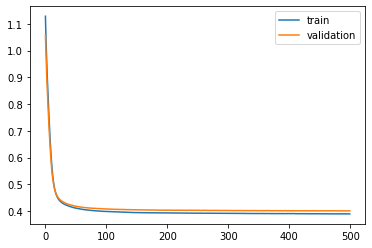

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 30s - loss: 1.1272 - val_loss: 1.0639

Epoch 00001: val_loss improved from inf to 1.06387, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0373 - val_loss: 0.9838

Epoch 00002: val_loss improved from 1.06387 to 0.98377, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9640 - val_loss: 0.9181

Epoch 00003: val_loss improved from 0.98377 to 0.91805, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9020 - val_loss: 0.8605

Epoch 00004: val_loss improved from 0.91805 to 0.86049, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8462 - val_loss: 0.8068

Epoch 00005: val_loss improved from 0.86049 to 0.80676, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.7941 - val_loss: 0.7558

Epoch 00006: val_loss improved from 0.80676 to 0.75575, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7446 - val_loss: 0.7076

Epoch 00007: val_loss improved from 0.75575

 - 1s - loss: 0.4087 - val_loss: 0.4080

Epoch 00058: val_loss improved from 0.40823 to 0.40802, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4083 - val_loss: 0.4077

Epoch 00059: val_loss improved from 0.40802 to 0.40768, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4080 - val_loss: 0.4076

Epoch 00060: val_loss improved from 0.40768 to 0.40756, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4076 - val_loss: 0.4068

Epoch 00061: val_loss improved from 0.40756 to 0.40675, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4073 - val_loss: 0.4069

Epoch 00062: val_loss did not improve from 0.40675
Epoch 63/500
 - 1s - loss: 0.4070 - val_loss: 0.4062

Epoch 00063: val_loss improved from 0.40675 to 0.40624, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4066 - val_loss: 0.4060

Epoch 00064: val_loss improved from 0.40624 to 0.40602, saving model to val_weights4.hdf5
Epoch 65/500
 - 1s - loss: 0.4064 - val_loss

 - 1s - loss: 0.3974 - val_loss: 0.3966

Epoch 00120: val_loss improved from 0.39665 to 0.39663, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.3973 - val_loss: 0.3966

Epoch 00121: val_loss did not improve from 0.39663
Epoch 122/500
 - 1s - loss: 0.3972 - val_loss: 0.3967

Epoch 00122: val_loss did not improve from 0.39663
Epoch 123/500
 - 1s - loss: 0.3971 - val_loss: 0.3963

Epoch 00123: val_loss improved from 0.39663 to 0.39632, saving model to val_weights4.hdf5
Epoch 124/500
 - 1s - loss: 0.3971 - val_loss: 0.3963

Epoch 00124: val_loss did not improve from 0.39632
Epoch 125/500
 - 1s - loss: 0.3970 - val_loss: 0.3965

Epoch 00125: val_loss did not improve from 0.39632
Epoch 126/500
 - 1s - loss: 0.3970 - val_loss: 0.3961

Epoch 00126: val_loss improved from 0.39632 to 0.39613, saving model to val_weights4.hdf5
Epoch 127/500
 - 1s - loss: 0.3968 - val_loss: 0.3963

Epoch 00127: val_loss did not improve from 0.39613
Epoch 128/500
 - 1s - loss: 0.3968 - val_loss: 0.

 - 1s - loss: 0.3942 - val_loss: 0.3941

Epoch 00190: val_loss did not improve from 0.39399
Epoch 191/500
 - 1s - loss: 0.3941 - val_loss: 0.3942

Epoch 00191: val_loss did not improve from 0.39399
Epoch 192/500
 - 1s - loss: 0.3940 - val_loss: 0.3940

Epoch 00192: val_loss improved from 0.39399 to 0.39395, saving model to val_weights4.hdf5
Epoch 193/500
 - 1s - loss: 0.3939 - val_loss: 0.3941

Epoch 00193: val_loss did not improve from 0.39395
Epoch 194/500
 - 1s - loss: 0.3940 - val_loss: 0.3942

Epoch 00194: val_loss did not improve from 0.39395
Epoch 195/500
 - 1s - loss: 0.3939 - val_loss: 0.3942

Epoch 00195: val_loss did not improve from 0.39395
Epoch 196/500
 - 1s - loss: 0.3940 - val_loss: 0.3944

Epoch 00196: val_loss did not improve from 0.39395
Epoch 197/500
 - 1s - loss: 0.3940 - val_loss: 0.3941

Epoch 00197: val_loss did not improve from 0.39395
Epoch 198/500
 - 1s - loss: 0.3939 - val_loss: 0.3943

Epoch 00198: val_loss did not improve from 0.39395
Epoch 199/500
 - 1s -

 - 1s - loss: 0.3931 - val_loss: 0.3937

Epoch 00266: val_loss did not improve from 0.39335
Epoch 267/500
 - 1s - loss: 0.3930 - val_loss: 0.3937

Epoch 00267: val_loss did not improve from 0.39335
Epoch 268/500
 - 1s - loss: 0.3930 - val_loss: 0.3937

Epoch 00268: val_loss did not improve from 0.39335
Epoch 269/500
 - 1s - loss: 0.3928 - val_loss: 0.3940

Epoch 00269: val_loss did not improve from 0.39335
Epoch 270/500
 - 1s - loss: 0.3929 - val_loss: 0.3934

Epoch 00270: val_loss did not improve from 0.39335
Epoch 271/500
 - 1s - loss: 0.3930 - val_loss: 0.3938

Epoch 00271: val_loss did not improve from 0.39335
Epoch 272/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00272: val_loss did not improve from 0.39335
Epoch 273/500
 - 1s - loss: 0.3928 - val_loss: 0.3938

Epoch 00273: val_loss did not improve from 0.39335
Epoch 274/500
 - 1s - loss: 0.3928 - val_loss: 0.3937

Epoch 00274: val_loss did not improve from 0.39335
Epoch 275/500
 - 1s - loss: 0.3930 - val_loss: 0.3935

Epoch


Epoch 00341: val_loss did not improve from 0.39252
Epoch 342/500
 - 1s - loss: 0.3922 - val_loss: 0.3930

Epoch 00342: val_loss did not improve from 0.39252
Epoch 343/500
 - 1s - loss: 0.3922 - val_loss: 0.3932

Epoch 00343: val_loss did not improve from 0.39252
Epoch 344/500
 - 1s - loss: 0.3922 - val_loss: 0.3933

Epoch 00344: val_loss did not improve from 0.39252
Epoch 345/500
 - 1s - loss: 0.3923 - val_loss: 0.3931

Epoch 00345: val_loss did not improve from 0.39252
Epoch 346/500
 - 1s - loss: 0.3923 - val_loss: 0.3933

Epoch 00346: val_loss did not improve from 0.39252
Epoch 347/500
 - 1s - loss: 0.3922 - val_loss: 0.3931

Epoch 00347: val_loss did not improve from 0.39252
Epoch 348/500
 - 1s - loss: 0.3924 - val_loss: 0.3934

Epoch 00348: val_loss did not improve from 0.39252
Epoch 349/500
 - 1s - loss: 0.3923 - val_loss: 0.3934

Epoch 00349: val_loss did not improve from 0.39252
Epoch 350/500
 - 1s - loss: 0.3925 - val_loss: 0.3933

Epoch 00350: val_loss did not improve from 0.


Epoch 00416: val_loss did not improve from 0.39204
Epoch 417/500
 - 1s - loss: 0.3916 - val_loss: 0.3924

Epoch 00417: val_loss did not improve from 0.39204
Epoch 418/500
 - 1s - loss: 0.3914 - val_loss: 0.3926

Epoch 00418: val_loss did not improve from 0.39204
Epoch 419/500
 - 1s - loss: 0.3915 - val_loss: 0.3924

Epoch 00419: val_loss did not improve from 0.39204
Epoch 420/500
 - 1s - loss: 0.3915 - val_loss: 0.3928

Epoch 00420: val_loss did not improve from 0.39204
Epoch 421/500
 - 1s - loss: 0.3915 - val_loss: 0.3930

Epoch 00421: val_loss did not improve from 0.39204
Epoch 422/500
 - 1s - loss: 0.3914 - val_loss: 0.3925

Epoch 00422: val_loss did not improve from 0.39204
Epoch 423/500
 - 1s - loss: 0.3914 - val_loss: 0.3925

Epoch 00423: val_loss did not improve from 0.39204
Epoch 424/500
 - 1s - loss: 0.3915 - val_loss: 0.3926

Epoch 00424: val_loss did not improve from 0.39204
Epoch 425/500
 - 1s - loss: 0.3914 - val_loss: 0.3929

Epoch 00425: val_loss did not improve from 0.

 - 1s - loss: 0.3910 - val_loss: 0.3925

Epoch 00494: val_loss did not improve from 0.39204
Epoch 495/500
 - 1s - loss: 0.3910 - val_loss: 0.3928

Epoch 00495: val_loss did not improve from 0.39204
Epoch 496/500
 - 1s - loss: 0.3913 - val_loss: 0.3926

Epoch 00496: val_loss did not improve from 0.39204
Epoch 497/500
 - 1s - loss: 0.3913 - val_loss: 0.3924

Epoch 00497: val_loss did not improve from 0.39204
Epoch 498/500
 - 1s - loss: 0.3912 - val_loss: 0.3923

Epoch 00498: val_loss did not improve from 0.39204
Epoch 499/500
 - 1s - loss: 0.3910 - val_loss: 0.3920

Epoch 00499: val_loss improved from 0.39204 to 0.39202, saving model to val_weights4.hdf5
Epoch 500/500
 - 1s - loss: 0.3910 - val_loss: 0.3923

Epoch 00500: val_loss did not improve from 0.39202
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.008736982766374824
best val loss: 0.39201896142959597
#################################


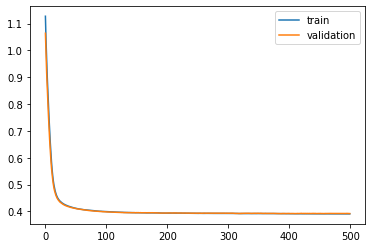

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 31s - loss: 1.1276 - val_loss: 1.0619

Epoch 00001: val_loss improved from inf to 1.06193, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0376 - val_loss: 0.9833

Epoch 00002: val_loss improved from 1.06193 to 0.98333, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9642 - val_loss: 0.9186

Epoch 00003: val_loss improved from 0.98333 to 0.91857, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9021 - val_loss: 0.8616

Epoch 00004: val_loss improved from 0.91857 to 0.86157, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8463 - val_loss: 0.8093

Epoch 00005: val_loss improved from 0.86157 to 0.80933, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.7940 - val_loss: 0.7595

Epoch 00006: val_loss improved from 0.80933 to 0.75953, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7444 - val_loss: 0.7118

Epoch 00007: val_loss improved from 0.75953

 - 1s - loss: 0.4082 - val_loss: 0.4118

Epoch 00058: val_loss improved from 0.41216 to 0.41183, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4078 - val_loss: 0.4117

Epoch 00059: val_loss improved from 0.41183 to 0.41165, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4074 - val_loss: 0.4114

Epoch 00060: val_loss improved from 0.41165 to 0.41137, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4070 - val_loss: 0.4113

Epoch 00061: val_loss improved from 0.41137 to 0.41129, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4067 - val_loss: 0.4109

Epoch 00062: val_loss improved from 0.41129 to 0.41086, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4063 - val_loss: 0.4106

Epoch 00063: val_loss improved from 0.41086 to 0.41060, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4060 - val_loss: 0.4099

Epoch 00064: val_loss improved from 0.41060 to 0.40987, saving model to val_weights5.hdf5
Epoch

 - 1s - loss: 0.3975 - val_loss: 0.4028

Epoch 00118: val_loss improved from 0.40286 to 0.40279, saving model to val_weights5.hdf5
Epoch 119/500
 - 1s - loss: 0.3973 - val_loss: 0.4024

Epoch 00119: val_loss improved from 0.40279 to 0.40242, saving model to val_weights5.hdf5
Epoch 120/500
 - 1s - loss: 0.3972 - val_loss: 0.4025

Epoch 00120: val_loss did not improve from 0.40242
Epoch 121/500
 - 1s - loss: 0.3972 - val_loss: 0.4024

Epoch 00121: val_loss did not improve from 0.40242
Epoch 122/500
 - 1s - loss: 0.3972 - val_loss: 0.4021

Epoch 00122: val_loss improved from 0.40242 to 0.40213, saving model to val_weights5.hdf5
Epoch 123/500
 - 1s - loss: 0.3970 - val_loss: 0.4021

Epoch 00123: val_loss improved from 0.40213 to 0.40212, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3969 - val_loss: 0.4019

Epoch 00124: val_loss improved from 0.40212 to 0.40190, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3968 - val_loss: 0.4020

Epoch 00125: val_loss 


Epoch 00185: val_loss did not improve from 0.39814
Epoch 186/500
 - 1s - loss: 0.3941 - val_loss: 0.3987

Epoch 00186: val_loss did not improve from 0.39814
Epoch 187/500
 - 1s - loss: 0.3942 - val_loss: 0.3983

Epoch 00187: val_loss did not improve from 0.39814
Epoch 188/500
 - 1s - loss: 0.3941 - val_loss: 0.3985

Epoch 00188: val_loss did not improve from 0.39814
Epoch 189/500
 - 1s - loss: 0.3939 - val_loss: 0.3986

Epoch 00189: val_loss did not improve from 0.39814
Epoch 190/500
 - 1s - loss: 0.3941 - val_loss: 0.3985

Epoch 00190: val_loss did not improve from 0.39814
Epoch 191/500
 - 1s - loss: 0.3939 - val_loss: 0.3986

Epoch 00191: val_loss did not improve from 0.39814
Epoch 192/500
 - 1s - loss: 0.3939 - val_loss: 0.3983

Epoch 00192: val_loss did not improve from 0.39814
Epoch 193/500
 - 1s - loss: 0.3938 - val_loss: 0.3984

Epoch 00193: val_loss did not improve from 0.39814
Epoch 194/500
 - 1s - loss: 0.3938 - val_loss: 0.3983

Epoch 00194: val_loss did not improve from 0.


Epoch 00261: val_loss did not improve from 0.39762
Epoch 262/500
 - 1s - loss: 0.3928 - val_loss: 0.3985

Epoch 00262: val_loss did not improve from 0.39762
Epoch 263/500
 - 1s - loss: 0.3929 - val_loss: 0.3984

Epoch 00263: val_loss did not improve from 0.39762
Epoch 264/500
 - 1s - loss: 0.3931 - val_loss: 0.3982

Epoch 00264: val_loss did not improve from 0.39762
Epoch 265/500
 - 1s - loss: 0.3929 - val_loss: 0.3984

Epoch 00265: val_loss did not improve from 0.39762
Epoch 266/500
 - 1s - loss: 0.3931 - val_loss: 0.3988

Epoch 00266: val_loss did not improve from 0.39762
Epoch 267/500
 - 1s - loss: 0.3930 - val_loss: 0.3986

Epoch 00267: val_loss did not improve from 0.39762
Epoch 268/500
 - 1s - loss: 0.3930 - val_loss: 0.3992

Epoch 00268: val_loss did not improve from 0.39762
Epoch 269/500
 - 1s - loss: 0.3933 - val_loss: 0.3992

Epoch 00269: val_loss did not improve from 0.39762
Epoch 270/500
 - 1s - loss: 0.3932 - val_loss: 0.3993

Epoch 00270: val_loss did not improve from 0.


Epoch 00337: val_loss did not improve from 0.39709
Epoch 338/500
 - 1s - loss: 0.3918 - val_loss: 0.3972

Epoch 00338: val_loss did not improve from 0.39709
Epoch 339/500
 - 1s - loss: 0.3918 - val_loss: 0.3972

Epoch 00339: val_loss did not improve from 0.39709
Epoch 340/500
 - 1s - loss: 0.3916 - val_loss: 0.3977

Epoch 00340: val_loss did not improve from 0.39709
Epoch 341/500
 - 1s - loss: 0.3918 - val_loss: 0.3973

Epoch 00341: val_loss did not improve from 0.39709
Epoch 342/500
 - 1s - loss: 0.3918 - val_loss: 0.3969

Epoch 00342: val_loss improved from 0.39709 to 0.39690, saving model to val_weights5.hdf5
Epoch 343/500
 - 1s - loss: 0.3917 - val_loss: 0.3974

Epoch 00343: val_loss did not improve from 0.39690
Epoch 344/500
 - 1s - loss: 0.3916 - val_loss: 0.3975

Epoch 00344: val_loss did not improve from 0.39690
Epoch 345/500
 - 1s - loss: 0.3918 - val_loss: 0.3976

Epoch 00345: val_loss did not improve from 0.39690
Epoch 346/500
 - 1s - loss: 0.3917 - val_loss: 0.3974

Epoch 

 - 1s - loss: 0.3909 - val_loss: 0.3973

Epoch 00414: val_loss did not improve from 0.39679
Epoch 415/500
 - 1s - loss: 0.3910 - val_loss: 0.3970

Epoch 00415: val_loss did not improve from 0.39679
Epoch 416/500
 - 1s - loss: 0.3910 - val_loss: 0.3973

Epoch 00416: val_loss did not improve from 0.39679
Epoch 417/500
 - 1s - loss: 0.3910 - val_loss: 0.3968

Epoch 00417: val_loss did not improve from 0.39679
Epoch 418/500
 - 1s - loss: 0.3910 - val_loss: 0.3968

Epoch 00418: val_loss did not improve from 0.39679
Epoch 419/500
 - 1s - loss: 0.3910 - val_loss: 0.3975

Epoch 00419: val_loss did not improve from 0.39679
Epoch 420/500
 - 1s - loss: 0.3910 - val_loss: 0.3971

Epoch 00420: val_loss did not improve from 0.39679
Epoch 421/500
 - 1s - loss: 0.3910 - val_loss: 0.3970

Epoch 00421: val_loss did not improve from 0.39679
Epoch 422/500
 - 1s - loss: 0.3909 - val_loss: 0.3972

Epoch 00422: val_loss did not improve from 0.39679
Epoch 423/500
 - 1s - loss: 0.3910 - val_loss: 0.3972

Epoch


Epoch 00491: val_loss did not improve from 0.39679
Epoch 492/500
 - 1s - loss: 0.3910 - val_loss: 0.3971

Epoch 00492: val_loss did not improve from 0.39679
Epoch 493/500
 - 1s - loss: 0.3909 - val_loss: 0.3973

Epoch 00493: val_loss did not improve from 0.39679
Epoch 494/500
 - 1s - loss: 0.3907 - val_loss: 0.3973

Epoch 00494: val_loss did not improve from 0.39679
Epoch 495/500
 - 1s - loss: 0.3907 - val_loss: 0.3975

Epoch 00495: val_loss did not improve from 0.39679
Epoch 496/500
 - 1s - loss: 0.3905 - val_loss: 0.3969

Epoch 00496: val_loss did not improve from 0.39679
Epoch 497/500
 - 1s - loss: 0.3905 - val_loss: 0.3973

Epoch 00497: val_loss did not improve from 0.39679
Epoch 498/500
 - 1s - loss: 0.3904 - val_loss: 0.3970

Epoch 00498: val_loss did not improve from 0.39679
Epoch 499/500
 - 1s - loss: 0.3903 - val_loss: 0.3973

Epoch 00499: val_loss did not improve from 0.39679
Epoch 500/500
 - 1s - loss: 0.3904 - val_loss: 0.3975

Epoch 00500: val_loss did not improve from 0.

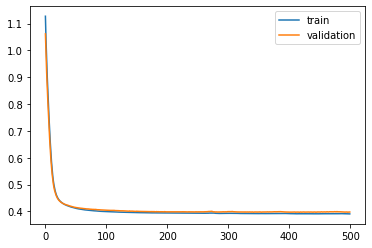

Time to train LSTM:  383.9903349876404
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 47s - loss: 1.1873 - val_loss: 1.1314

Epoch 00001: val_loss improved from inf to 1.13145, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0889 - val_loss: 1.0423

Epoch 00002: val_loss improved from 1.13145 to 1.04232, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.0077 - val_loss: 0.9680

Epoch 00003: val_loss improved from 1.04232 to 0.96798, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9387 - val_loss: 0.9035

Epoch 00004: val_loss improved from 0.96798 to 0.90351, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8768 - val_loss: 0.8442

Epoch 00005: val_loss improved from 0.90351 to 0.84422, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8190 - val_loss: 0.7888

Epoch 00006: val_loss improved from 0.84422 to 0.78885, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7641 - val_loss: 0.7363

Epoc


Epoch 00057: val_loss improved from 0.41583 to 0.41549, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4085 - val_loss: 0.4149

Epoch 00058: val_loss improved from 0.41549 to 0.41486, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4081 - val_loss: 0.4145

Epoch 00059: val_loss improved from 0.41486 to 0.41451, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4077 - val_loss: 0.4144

Epoch 00060: val_loss improved from 0.41451 to 0.41436, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4073 - val_loss: 0.4136

Epoch 00061: val_loss improved from 0.41436 to 0.41359, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4069 - val_loss: 0.4134

Epoch 00062: val_loss improved from 0.41359 to 0.41343, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4066 - val_loss: 0.4129

Epoch 00063: val_loss improved from 0.41343 to 0.41293, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4063 - val_loss:

 - 1s - loss: 0.3975 - val_loss: 0.4027

Epoch 00120: val_loss did not improve from 0.40252
Epoch 121/500
 - 1s - loss: 0.3974 - val_loss: 0.4026

Epoch 00121: val_loss did not improve from 0.40252
Epoch 122/500
 - 1s - loss: 0.3973 - val_loss: 0.4025

Epoch 00122: val_loss improved from 0.40252 to 0.40248, saving model to val_weights1.hdf5
Epoch 123/500
 - 1s - loss: 0.3972 - val_loss: 0.4027

Epoch 00123: val_loss did not improve from 0.40248
Epoch 124/500
 - 1s - loss: 0.3973 - val_loss: 0.4027

Epoch 00124: val_loss did not improve from 0.40248
Epoch 125/500
 - 1s - loss: 0.3971 - val_loss: 0.4025

Epoch 00125: val_loss did not improve from 0.40248
Epoch 126/500
 - 1s - loss: 0.3971 - val_loss: 0.4022

Epoch 00126: val_loss improved from 0.40248 to 0.40220, saving model to val_weights1.hdf5
Epoch 127/500
 - 1s - loss: 0.3971 - val_loss: 0.4027

Epoch 00127: val_loss did not improve from 0.40220
Epoch 128/500
 - 1s - loss: 0.3969 - val_loss: 0.4021

Epoch 00128: val_loss improved fr

 - 1s - loss: 0.3941 - val_loss: 0.3991

Epoch 00189: val_loss improved from 0.39917 to 0.39913, saving model to val_weights1.hdf5
Epoch 190/500
 - 1s - loss: 0.3941 - val_loss: 0.3995

Epoch 00190: val_loss did not improve from 0.39913
Epoch 191/500
 - 1s - loss: 0.3942 - val_loss: 0.3993

Epoch 00191: val_loss did not improve from 0.39913
Epoch 192/500
 - 1s - loss: 0.3940 - val_loss: 0.3992

Epoch 00192: val_loss did not improve from 0.39913
Epoch 193/500
 - 1s - loss: 0.3941 - val_loss: 0.3993

Epoch 00193: val_loss did not improve from 0.39913
Epoch 194/500
 - 1s - loss: 0.3941 - val_loss: 0.3993

Epoch 00194: val_loss did not improve from 0.39913
Epoch 195/500
 - 1s - loss: 0.3940 - val_loss: 0.3992

Epoch 00195: val_loss did not improve from 0.39913
Epoch 196/500
 - 1s - loss: 0.3940 - val_loss: 0.3993

Epoch 00196: val_loss did not improve from 0.39913
Epoch 197/500
 - 1s - loss: 0.3940 - val_loss: 0.3995

Epoch 00197: val_loss did not improve from 0.39913
Epoch 198/500
 - 1s -

 - 1s - loss: 0.3929 - val_loss: 0.3983

Epoch 00262: val_loss did not improve from 0.39779
Epoch 263/500
 - 1s - loss: 0.3930 - val_loss: 0.3988

Epoch 00263: val_loss did not improve from 0.39779
Epoch 264/500
 - 1s - loss: 0.3930 - val_loss: 0.3981

Epoch 00264: val_loss did not improve from 0.39779
Epoch 265/500
 - 1s - loss: 0.3931 - val_loss: 0.3984

Epoch 00265: val_loss did not improve from 0.39779
Epoch 266/500
 - 1s - loss: 0.3931 - val_loss: 0.3985

Epoch 00266: val_loss did not improve from 0.39779
Epoch 267/500
 - 1s - loss: 0.3930 - val_loss: 0.3981

Epoch 00267: val_loss did not improve from 0.39779
Epoch 268/500
 - 1s - loss: 0.3928 - val_loss: 0.3979

Epoch 00268: val_loss did not improve from 0.39779
Epoch 269/500
 - 1s - loss: 0.3929 - val_loss: 0.3984

Epoch 00269: val_loss did not improve from 0.39779
Epoch 270/500
 - 1s - loss: 0.3929 - val_loss: 0.3985

Epoch 00270: val_loss did not improve from 0.39779
Epoch 271/500
 - 1s - loss: 0.3930 - val_loss: 0.3982

Epoch


Epoch 00338: val_loss did not improve from 0.39723
Epoch 339/500
 - 1s - loss: 0.3924 - val_loss: 0.3977

Epoch 00339: val_loss did not improve from 0.39723
Epoch 340/500
 - 1s - loss: 0.3923 - val_loss: 0.3973

Epoch 00340: val_loss did not improve from 0.39723
Epoch 341/500
 - 1s - loss: 0.3923 - val_loss: 0.3975

Epoch 00341: val_loss did not improve from 0.39723
Epoch 342/500
 - 1s - loss: 0.3922 - val_loss: 0.3974

Epoch 00342: val_loss did not improve from 0.39723
Epoch 343/500
 - 1s - loss: 0.3923 - val_loss: 0.3977

Epoch 00343: val_loss did not improve from 0.39723
Epoch 344/500
 - 1s - loss: 0.3922 - val_loss: 0.3979

Epoch 00344: val_loss did not improve from 0.39723
Epoch 345/500
 - 1s - loss: 0.3923 - val_loss: 0.3973

Epoch 00345: val_loss did not improve from 0.39723
Epoch 346/500
 - 1s - loss: 0.3923 - val_loss: 0.3977

Epoch 00346: val_loss did not improve from 0.39723
Epoch 347/500
 - 1s - loss: 0.3923 - val_loss: 0.3974

Epoch 00347: val_loss did not improve from 0.

 - 1s - loss: 0.3915 - val_loss: 0.3972

Epoch 00415: val_loss did not improve from 0.39688
Epoch 416/500
 - 1s - loss: 0.3914 - val_loss: 0.3977

Epoch 00416: val_loss did not improve from 0.39688
Epoch 417/500
 - 1s - loss: 0.3913 - val_loss: 0.3974

Epoch 00417: val_loss did not improve from 0.39688
Epoch 418/500
 - 1s - loss: 0.3913 - val_loss: 0.3973

Epoch 00418: val_loss did not improve from 0.39688
Epoch 419/500
 - 1s - loss: 0.3914 - val_loss: 0.3972

Epoch 00419: val_loss did not improve from 0.39688
Epoch 420/500
 - 1s - loss: 0.3914 - val_loss: 0.3975

Epoch 00420: val_loss did not improve from 0.39688
Epoch 421/500
 - 1s - loss: 0.3914 - val_loss: 0.3975

Epoch 00421: val_loss did not improve from 0.39688
Epoch 422/500
 - 1s - loss: 0.3915 - val_loss: 0.3972

Epoch 00422: val_loss did not improve from 0.39688
Epoch 423/500
 - 1s - loss: 0.3917 - val_loss: 0.3972

Epoch 00423: val_loss did not improve from 0.39688
Epoch 424/500
 - 1s - loss: 0.3915 - val_loss: 0.3971

Epoch


Epoch 00491: val_loss did not improve from 0.39667
Epoch 492/500
 - 1s - loss: 0.3906 - val_loss: 0.3976

Epoch 00492: val_loss did not improve from 0.39667
Epoch 493/500
 - 1s - loss: 0.3907 - val_loss: 0.3962

Epoch 00493: val_loss improved from 0.39667 to 0.39621, saving model to val_weights1.hdf5
Epoch 494/500
 - 1s - loss: 0.3909 - val_loss: 0.3970

Epoch 00494: val_loss did not improve from 0.39621
Epoch 495/500
 - 1s - loss: 0.3908 - val_loss: 0.3971

Epoch 00495: val_loss did not improve from 0.39621
Epoch 496/500
 - 1s - loss: 0.3909 - val_loss: 0.3972

Epoch 00496: val_loss did not improve from 0.39621
Epoch 497/500
 - 1s - loss: 0.3907 - val_loss: 0.3971

Epoch 00497: val_loss did not improve from 0.39621
Epoch 498/500
 - 1s - loss: 0.3907 - val_loss: 0.3973

Epoch 00498: val_loss did not improve from 0.39621
Epoch 499/500
 - 1s - loss: 0.3907 - val_loss: 0.3968

Epoch 00499: val_loss did not improve from 0.39621
Epoch 500/500
 - 1s - loss: 0.3908 - val_loss: 0.3974

Epoch 

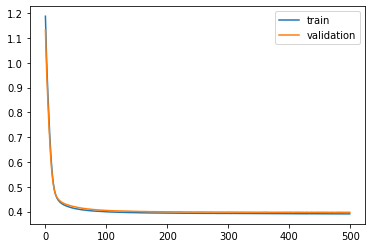

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7fa25eae2390>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 31s - loss: 1.1880 - val_loss: 1.1270

Epoch 00001: val_loss improved from inf to 1.12696, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0894 - val_loss: 1.0408

Epoch 00002: val_loss improved from 1.12696 to 1.04079, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.0079 - val_loss: 0.9680

Epoch 00003: val_loss improved from 1.04079 to 0.96802, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9387 - val_loss: 0.9037

Epoch 00004: val_loss improved from 0.96802 to 0.90369, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8768 - val_loss: 0.8439

Epoch 00005: val_loss improved from 0.90369 to 0.84392, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8190 - val_loss: 0.7869

Epoch 00006: val_loss improved from 0.84392 to 0.78687, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7644 - val_loss: 0.7334

Epoch 00007: val_loss improved from 0.78687

 - 1s - loss: 0.4089 - val_loss: 0.4059

Epoch 00058: val_loss improved from 0.40623 to 0.40594, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4086 - val_loss: 0.4057

Epoch 00059: val_loss improved from 0.40594 to 0.40567, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4081 - val_loss: 0.4051

Epoch 00060: val_loss improved from 0.40567 to 0.40513, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4078 - val_loss: 0.4051

Epoch 00061: val_loss improved from 0.40513 to 0.40506, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4075 - val_loss: 0.4047

Epoch 00062: val_loss improved from 0.40506 to 0.40466, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4072 - val_loss: 0.4045

Epoch 00063: val_loss improved from 0.40466 to 0.40449, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4068 - val_loss: 0.4042

Epoch 00064: val_loss improved from 0.40449 to 0.40422, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3978 - val_loss: 0.3971

Epoch 00119: val_loss did not improve from 0.39680
Epoch 120/500
 - 1s - loss: 0.3978 - val_loss: 0.3970

Epoch 00120: val_loss did not improve from 0.39680
Epoch 121/500
 - 1s - loss: 0.3977 - val_loss: 0.3971

Epoch 00121: val_loss did not improve from 0.39680
Epoch 122/500
 - 1s - loss: 0.3976 - val_loss: 0.3967

Epoch 00122: val_loss improved from 0.39680 to 0.39671, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3975 - val_loss: 0.3968

Epoch 00123: val_loss did not improve from 0.39671
Epoch 124/500
 - 1s - loss: 0.3974 - val_loss: 0.3968

Epoch 00124: val_loss did not improve from 0.39671
Epoch 125/500
 - 1s - loss: 0.3974 - val_loss: 0.3967

Epoch 00125: val_loss improved from 0.39671 to 0.39668, saving model to val_weights2.hdf5
Epoch 126/500
 - 1s - loss: 0.3973 - val_loss: 0.3965

Epoch 00126: val_loss improved from 0.39668 to 0.39645, saving model to val_weights2.hdf5
Epoch 127/500
 - 1s - loss: 0.3973 - val_loss: 0.


Epoch 00187: val_loss did not improve from 0.39413
Epoch 188/500
 - 1s - loss: 0.3948 - val_loss: 0.3943

Epoch 00188: val_loss did not improve from 0.39413
Epoch 189/500
 - 1s - loss: 0.3947 - val_loss: 0.3942

Epoch 00189: val_loss did not improve from 0.39413
Epoch 190/500
 - 1s - loss: 0.3946 - val_loss: 0.3942

Epoch 00190: val_loss did not improve from 0.39413
Epoch 191/500
 - 1s - loss: 0.3947 - val_loss: 0.3940

Epoch 00191: val_loss improved from 0.39413 to 0.39400, saving model to val_weights2.hdf5
Epoch 192/500
 - 1s - loss: 0.3947 - val_loss: 0.3938

Epoch 00192: val_loss improved from 0.39400 to 0.39385, saving model to val_weights2.hdf5
Epoch 193/500
 - 1s - loss: 0.3947 - val_loss: 0.3943

Epoch 00193: val_loss did not improve from 0.39385
Epoch 194/500
 - 1s - loss: 0.3947 - val_loss: 0.3940

Epoch 00194: val_loss did not improve from 0.39385
Epoch 195/500
 - 1s - loss: 0.3947 - val_loss: 0.3939

Epoch 00195: val_loss did not improve from 0.39385
Epoch 196/500
 - 1s - 

 - 1s - loss: 0.3937 - val_loss: 0.3932

Epoch 00260: val_loss did not improve from 0.39275
Epoch 261/500
 - 1s - loss: 0.3937 - val_loss: 0.3930

Epoch 00261: val_loss did not improve from 0.39275
Epoch 262/500
 - 1s - loss: 0.3936 - val_loss: 0.3928

Epoch 00262: val_loss did not improve from 0.39275
Epoch 263/500
 - 1s - loss: 0.3935 - val_loss: 0.3930

Epoch 00263: val_loss did not improve from 0.39275
Epoch 264/500
 - 1s - loss: 0.3935 - val_loss: 0.3929

Epoch 00264: val_loss did not improve from 0.39275
Epoch 265/500
 - 1s - loss: 0.3937 - val_loss: 0.3931

Epoch 00265: val_loss did not improve from 0.39275
Epoch 266/500
 - 1s - loss: 0.3936 - val_loss: 0.3930

Epoch 00266: val_loss did not improve from 0.39275
Epoch 267/500
 - 1s - loss: 0.3935 - val_loss: 0.3927

Epoch 00267: val_loss improved from 0.39275 to 0.39270, saving model to val_weights2.hdf5
Epoch 268/500
 - 1s - loss: 0.3935 - val_loss: 0.3928

Epoch 00268: val_loss did not improve from 0.39270
Epoch 269/500
 - 1s -

 - 1s - loss: 0.3927 - val_loss: 0.3926

Epoch 00336: val_loss did not improve from 0.39221
Epoch 337/500
 - 1s - loss: 0.3927 - val_loss: 0.3924

Epoch 00337: val_loss did not improve from 0.39221
Epoch 338/500
 - 1s - loss: 0.3928 - val_loss: 0.3923

Epoch 00338: val_loss did not improve from 0.39221
Epoch 339/500
 - 1s - loss: 0.3928 - val_loss: 0.3925

Epoch 00339: val_loss did not improve from 0.39221
Epoch 340/500
 - 1s - loss: 0.3927 - val_loss: 0.3924

Epoch 00340: val_loss did not improve from 0.39221
Epoch 341/500
 - 1s - loss: 0.3928 - val_loss: 0.3924

Epoch 00341: val_loss did not improve from 0.39221
Epoch 342/500
 - 1s - loss: 0.3927 - val_loss: 0.3926

Epoch 00342: val_loss did not improve from 0.39221
Epoch 343/500
 - 1s - loss: 0.3928 - val_loss: 0.3928

Epoch 00343: val_loss did not improve from 0.39221
Epoch 344/500
 - 1s - loss: 0.3928 - val_loss: 0.3928

Epoch 00344: val_loss did not improve from 0.39221
Epoch 345/500
 - 1s - loss: 0.3929 - val_loss: 0.3924

Epoch


Epoch 00413: val_loss did not improve from 0.39221
Epoch 414/500
 - 1s - loss: 0.3921 - val_loss: 0.3926

Epoch 00414: val_loss did not improve from 0.39221
Epoch 415/500
 - 1s - loss: 0.3921 - val_loss: 0.3924

Epoch 00415: val_loss did not improve from 0.39221
Epoch 416/500
 - 1s - loss: 0.3921 - val_loss: 0.3925

Epoch 00416: val_loss did not improve from 0.39221
Epoch 417/500
 - 1s - loss: 0.3921 - val_loss: 0.3926

Epoch 00417: val_loss did not improve from 0.39221
Epoch 418/500
 - 1s - loss: 0.3922 - val_loss: 0.3925

Epoch 00418: val_loss did not improve from 0.39221
Epoch 419/500
 - 1s - loss: 0.3921 - val_loss: 0.3926

Epoch 00419: val_loss did not improve from 0.39221
Epoch 420/500
 - 1s - loss: 0.3921 - val_loss: 0.3926

Epoch 00420: val_loss did not improve from 0.39221
Epoch 421/500
 - 1s - loss: 0.3920 - val_loss: 0.3924

Epoch 00421: val_loss did not improve from 0.39221
Epoch 422/500
 - 1s - loss: 0.3920 - val_loss: 0.3926

Epoch 00422: val_loss did not improve from 0.

 - 1s - loss: 0.3916 - val_loss: 0.3924

Epoch 00490: val_loss did not improve from 0.39211
Epoch 491/500
 - 1s - loss: 0.3917 - val_loss: 0.3925

Epoch 00491: val_loss did not improve from 0.39211
Epoch 492/500
 - 1s - loss: 0.3917 - val_loss: 0.3926

Epoch 00492: val_loss did not improve from 0.39211
Epoch 493/500
 - 1s - loss: 0.3918 - val_loss: 0.3929

Epoch 00493: val_loss did not improve from 0.39211
Epoch 494/500
 - 1s - loss: 0.3917 - val_loss: 0.3923

Epoch 00494: val_loss did not improve from 0.39211
Epoch 495/500
 - 1s - loss: 0.3916 - val_loss: 0.3927

Epoch 00495: val_loss did not improve from 0.39211
Epoch 496/500
 - 1s - loss: 0.3916 - val_loss: 0.3926

Epoch 00496: val_loss did not improve from 0.39211
Epoch 497/500
 - 1s - loss: 0.3917 - val_loss: 0.3930

Epoch 00497: val_loss did not improve from 0.39211
Epoch 498/500
 - 1s - loss: 0.3915 - val_loss: 0.3924

Epoch 00498: val_loss did not improve from 0.39211
Epoch 499/500
 - 1s - loss: 0.3916 - val_loss: 0.3926

Epoch

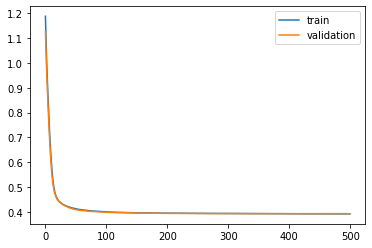

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 23s - loss: 1.1894 - val_loss: 1.1149

Epoch 00001: val_loss improved from inf to 1.11486, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0911 - val_loss: 1.0270

Epoch 00002: val_loss improved from 1.11486 to 1.02703, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.0097 - val_loss: 0.9538

Epoch 00003: val_loss improved from 1.02703 to 0.95376, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9404 - val_loss: 0.8904

Epoch 00004: val_loss improved from 0.95376 to 0.89037, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8783 - val_loss: 0.8322

Epoch 00005: val_loss improved from 0.89037 to 0.83215, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8203 - val_loss: 0.7774

Epoch 00006: val_loss improved from 0.83215 to 0.77739, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7654 - val_loss: 0.7267

Epoch 00007: val_loss improved from 0.77739

 - 1s - loss: 0.4083 - val_loss: 0.4154

Epoch 00058: val_loss improved from 0.41591 to 0.41542, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4080 - val_loss: 0.4154

Epoch 00059: val_loss improved from 0.41542 to 0.41539, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4076 - val_loss: 0.4149

Epoch 00060: val_loss improved from 0.41539 to 0.41488, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4073 - val_loss: 0.4148

Epoch 00061: val_loss improved from 0.41488 to 0.41477, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4069 - val_loss: 0.4143

Epoch 00062: val_loss improved from 0.41477 to 0.41431, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4066 - val_loss: 0.4140

Epoch 00063: val_loss improved from 0.41431 to 0.41399, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4062 - val_loss: 0.4137

Epoch 00064: val_loss improved from 0.41399 to 0.41370, saving model to val_weights3.hdf5
Epoch


Epoch 00120: val_loss improved from 0.40640 to 0.40609, saving model to val_weights3.hdf5
Epoch 121/500
 - 1s - loss: 0.3971 - val_loss: 0.4064

Epoch 00121: val_loss did not improve from 0.40609
Epoch 122/500
 - 1s - loss: 0.3970 - val_loss: 0.4062

Epoch 00122: val_loss did not improve from 0.40609
Epoch 123/500
 - 1s - loss: 0.3969 - val_loss: 0.4064

Epoch 00123: val_loss did not improve from 0.40609
Epoch 124/500
 - 1s - loss: 0.3969 - val_loss: 0.4059

Epoch 00124: val_loss improved from 0.40609 to 0.40593, saving model to val_weights3.hdf5
Epoch 125/500
 - 1s - loss: 0.3968 - val_loss: 0.4060

Epoch 00125: val_loss did not improve from 0.40593
Epoch 126/500
 - 1s - loss: 0.3967 - val_loss: 0.4060

Epoch 00126: val_loss did not improve from 0.40593
Epoch 127/500
 - 1s - loss: 0.3967 - val_loss: 0.4061

Epoch 00127: val_loss did not improve from 0.40593
Epoch 128/500
 - 1s - loss: 0.3965 - val_loss: 0.4060

Epoch 00128: val_loss did not improve from 0.40593
Epoch 129/500
 - 1s - 


Epoch 00191: val_loss improved from 0.40399 to 0.40390, saving model to val_weights3.hdf5
Epoch 192/500
 - 1s - loss: 0.3938 - val_loss: 0.4037

Epoch 00192: val_loss improved from 0.40390 to 0.40371, saving model to val_weights3.hdf5
Epoch 193/500
 - 1s - loss: 0.3937 - val_loss: 0.4039

Epoch 00193: val_loss did not improve from 0.40371
Epoch 194/500
 - 1s - loss: 0.3937 - val_loss: 0.4037

Epoch 00194: val_loss improved from 0.40371 to 0.40367, saving model to val_weights3.hdf5
Epoch 195/500
 - 1s - loss: 0.3938 - val_loss: 0.4041

Epoch 00195: val_loss did not improve from 0.40367
Epoch 196/500
 - 1s - loss: 0.3937 - val_loss: 0.4042

Epoch 00196: val_loss did not improve from 0.40367
Epoch 197/500
 - 1s - loss: 0.3937 - val_loss: 0.4041

Epoch 00197: val_loss did not improve from 0.40367
Epoch 198/500
 - 1s - loss: 0.3938 - val_loss: 0.4041

Epoch 00198: val_loss did not improve from 0.40367
Epoch 199/500
 - 1s - loss: 0.3936 - val_loss: 0.4039

Epoch 00199: val_loss did not impr

 - 1s - loss: 0.3928 - val_loss: 0.4031

Epoch 00264: val_loss did not improve from 0.40274
Epoch 265/500
 - 1s - loss: 0.3926 - val_loss: 0.4029

Epoch 00265: val_loss did not improve from 0.40274
Epoch 266/500
 - 1s - loss: 0.3927 - val_loss: 0.4031

Epoch 00266: val_loss did not improve from 0.40274
Epoch 267/500
 - 1s - loss: 0.3927 - val_loss: 0.4029

Epoch 00267: val_loss did not improve from 0.40274
Epoch 268/500
 - 1s - loss: 0.3925 - val_loss: 0.4028

Epoch 00268: val_loss did not improve from 0.40274
Epoch 269/500
 - 1s - loss: 0.3925 - val_loss: 0.4032

Epoch 00269: val_loss did not improve from 0.40274
Epoch 270/500
 - 1s - loss: 0.3926 - val_loss: 0.4028

Epoch 00270: val_loss did not improve from 0.40274
Epoch 271/500
 - 1s - loss: 0.3925 - val_loss: 0.4028

Epoch 00271: val_loss did not improve from 0.40274
Epoch 272/500
 - 1s - loss: 0.3926 - val_loss: 0.4029

Epoch 00272: val_loss did not improve from 0.40274
Epoch 273/500
 - 1s - loss: 0.3925 - val_loss: 0.4027

Epoch


Epoch 00337: val_loss did not improve from 0.40185
Epoch 338/500
 - 1s - loss: 0.3920 - val_loss: 0.4023

Epoch 00338: val_loss did not improve from 0.40185
Epoch 339/500
 - 1s - loss: 0.3919 - val_loss: 0.4024

Epoch 00339: val_loss did not improve from 0.40185
Epoch 340/500
 - 1s - loss: 0.3919 - val_loss: 0.4018

Epoch 00340: val_loss improved from 0.40185 to 0.40181, saving model to val_weights3.hdf5
Epoch 341/500
 - 1s - loss: 0.3918 - val_loss: 0.4021

Epoch 00341: val_loss did not improve from 0.40181
Epoch 342/500
 - 1s - loss: 0.3919 - val_loss: 0.4022

Epoch 00342: val_loss did not improve from 0.40181
Epoch 343/500
 - 1s - loss: 0.3918 - val_loss: 0.4022

Epoch 00343: val_loss did not improve from 0.40181
Epoch 344/500
 - 1s - loss: 0.3919 - val_loss: 0.4022

Epoch 00344: val_loss did not improve from 0.40181
Epoch 345/500
 - 1s - loss: 0.3917 - val_loss: 0.4023

Epoch 00345: val_loss did not improve from 0.40181
Epoch 346/500
 - 1s - loss: 0.3918 - val_loss: 0.4018

Epoch 


Epoch 00411: val_loss did not improve from 0.40111
Epoch 412/500
 - 1s - loss: 0.3914 - val_loss: 0.4016

Epoch 00412: val_loss did not improve from 0.40111
Epoch 413/500
 - 1s - loss: 0.3912 - val_loss: 0.4019

Epoch 00413: val_loss did not improve from 0.40111
Epoch 414/500
 - 1s - loss: 0.3913 - val_loss: 0.4015

Epoch 00414: val_loss did not improve from 0.40111
Epoch 415/500
 - 1s - loss: 0.3912 - val_loss: 0.4017

Epoch 00415: val_loss did not improve from 0.40111
Epoch 416/500
 - 1s - loss: 0.3913 - val_loss: 0.4014

Epoch 00416: val_loss did not improve from 0.40111
Epoch 417/500
 - 1s - loss: 0.3912 - val_loss: 0.4015

Epoch 00417: val_loss did not improve from 0.40111
Epoch 418/500
 - 1s - loss: 0.3912 - val_loss: 0.4016

Epoch 00418: val_loss did not improve from 0.40111
Epoch 419/500
 - 1s - loss: 0.3912 - val_loss: 0.4016

Epoch 00419: val_loss did not improve from 0.40111
Epoch 420/500
 - 1s - loss: 0.3913 - val_loss: 0.4019

Epoch 00420: val_loss did not improve from 0.

 - 1s - loss: 0.3907 - val_loss: 0.4012

Epoch 00488: val_loss did not improve from 0.40089
Epoch 489/500
 - 1s - loss: 0.3907 - val_loss: 0.4013

Epoch 00489: val_loss did not improve from 0.40089
Epoch 490/500
 - 1s - loss: 0.3908 - val_loss: 0.4013

Epoch 00490: val_loss did not improve from 0.40089
Epoch 491/500
 - 1s - loss: 0.3907 - val_loss: 0.4010

Epoch 00491: val_loss did not improve from 0.40089
Epoch 492/500
 - 1s - loss: 0.3907 - val_loss: 0.4011

Epoch 00492: val_loss did not improve from 0.40089
Epoch 493/500
 - 1s - loss: 0.3906 - val_loss: 0.4009

Epoch 00493: val_loss did not improve from 0.40089
Epoch 494/500
 - 1s - loss: 0.3906 - val_loss: 0.4012

Epoch 00494: val_loss did not improve from 0.40089
Epoch 495/500
 - 1s - loss: 0.3906 - val_loss: 0.4011

Epoch 00495: val_loss did not improve from 0.40089
Epoch 496/500
 - 1s - loss: 0.3906 - val_loss: 0.4013

Epoch 00496: val_loss did not improve from 0.40089
Epoch 497/500
 - 1s - loss: 0.3908 - val_loss: 0.4016

Epoch

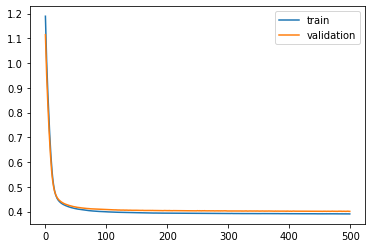

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 29s - loss: 1.1886 - val_loss: 1.1205

Epoch 00001: val_loss improved from inf to 1.12054, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0904 - val_loss: 1.0322

Epoch 00002: val_loss improved from 1.12054 to 1.03217, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.0091 - val_loss: 0.9588

Epoch 00003: val_loss improved from 1.03217 to 0.95877, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9398 - val_loss: 0.8944

Epoch 00004: val_loss improved from 0.95877 to 0.89440, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8776 - val_loss: 0.8348

Epoch 00005: val_loss improved from 0.89440 to 0.83484, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8198 - val_loss: 0.7785

Epoch 00006: val_loss improved from 0.83484 to 0.77852, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7652 - val_loss: 0.7256

Epoch 00007: val_loss improved from 0.77852

 - 1s - loss: 0.4092 - val_loss: 0.4082

Epoch 00058: val_loss improved from 0.40875 to 0.40819, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4089 - val_loss: 0.4080

Epoch 00059: val_loss improved from 0.40819 to 0.40799, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4085 - val_loss: 0.4073

Epoch 00060: val_loss improved from 0.40799 to 0.40725, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4081 - val_loss: 0.4071

Epoch 00061: val_loss improved from 0.40725 to 0.40712, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4078 - val_loss: 0.4066

Epoch 00062: val_loss improved from 0.40712 to 0.40659, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4075 - val_loss: 0.4065

Epoch 00063: val_loss improved from 0.40659 to 0.40649, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4072 - val_loss: 0.4059

Epoch 00064: val_loss improved from 0.40649 to 0.40592, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.3982 - val_loss: 0.3968

Epoch 00118: val_loss did not improve from 0.39678
Epoch 119/500
 - 1s - loss: 0.3980 - val_loss: 0.3967

Epoch 00119: val_loss improved from 0.39678 to 0.39670, saving model to val_weights4.hdf5
Epoch 120/500
 - 1s - loss: 0.3980 - val_loss: 0.3967

Epoch 00120: val_loss improved from 0.39670 to 0.39669, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.3979 - val_loss: 0.3966

Epoch 00121: val_loss improved from 0.39669 to 0.39656, saving model to val_weights4.hdf5
Epoch 122/500
 - 1s - loss: 0.3977 - val_loss: 0.3968

Epoch 00122: val_loss did not improve from 0.39656
Epoch 123/500
 - 1s - loss: 0.3977 - val_loss: 0.3964

Epoch 00123: val_loss improved from 0.39656 to 0.39645, saving model to val_weights4.hdf5
Epoch 124/500
 - 1s - loss: 0.3976 - val_loss: 0.3963

Epoch 00124: val_loss improved from 0.39645 to 0.39635, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3975 - val_loss: 0.3967

Epoch 00125: val_loss 

 - 1s - loss: 0.3948 - val_loss: 0.3950

Epoch 00188: val_loss did not improve from 0.39465
Epoch 189/500
 - 1s - loss: 0.3948 - val_loss: 0.3949

Epoch 00189: val_loss did not improve from 0.39465
Epoch 190/500
 - 1s - loss: 0.3949 - val_loss: 0.3951

Epoch 00190: val_loss did not improve from 0.39465
Epoch 191/500
 - 1s - loss: 0.3948 - val_loss: 0.3949

Epoch 00191: val_loss did not improve from 0.39465
Epoch 192/500
 - 1s - loss: 0.3947 - val_loss: 0.3949

Epoch 00192: val_loss did not improve from 0.39465
Epoch 193/500
 - 1s - loss: 0.3948 - val_loss: 0.3946

Epoch 00193: val_loss improved from 0.39465 to 0.39462, saving model to val_weights4.hdf5
Epoch 194/500
 - 1s - loss: 0.3948 - val_loss: 0.3951

Epoch 00194: val_loss did not improve from 0.39462
Epoch 195/500
 - 1s - loss: 0.3947 - val_loss: 0.3947

Epoch 00195: val_loss did not improve from 0.39462
Epoch 196/500
 - 1s - loss: 0.3948 - val_loss: 0.3950

Epoch 00196: val_loss did not improve from 0.39462
Epoch 197/500
 - 1s -


Epoch 00262: val_loss did not improve from 0.39369
Epoch 263/500
 - 1s - loss: 0.3939 - val_loss: 0.3942

Epoch 00263: val_loss did not improve from 0.39369
Epoch 264/500
 - 1s - loss: 0.3939 - val_loss: 0.3940

Epoch 00264: val_loss did not improve from 0.39369
Epoch 265/500
 - 1s - loss: 0.3940 - val_loss: 0.3943

Epoch 00265: val_loss did not improve from 0.39369
Epoch 266/500
 - 1s - loss: 0.3940 - val_loss: 0.3942

Epoch 00266: val_loss did not improve from 0.39369
Epoch 267/500
 - 1s - loss: 0.3939 - val_loss: 0.3940

Epoch 00267: val_loss did not improve from 0.39369
Epoch 268/500
 - 1s - loss: 0.3940 - val_loss: 0.3942

Epoch 00268: val_loss did not improve from 0.39369
Epoch 269/500
 - 1s - loss: 0.3940 - val_loss: 0.3938

Epoch 00269: val_loss did not improve from 0.39369
Epoch 270/500
 - 1s - loss: 0.3939 - val_loss: 0.3944

Epoch 00270: val_loss did not improve from 0.39369
Epoch 271/500
 - 1s - loss: 0.3939 - val_loss: 0.3939

Epoch 00271: val_loss did not improve from 0.


Epoch 00337: val_loss did not improve from 0.39305
Epoch 338/500
 - 1s - loss: 0.3930 - val_loss: 0.3934

Epoch 00338: val_loss did not improve from 0.39305
Epoch 339/500
 - 1s - loss: 0.3930 - val_loss: 0.3932

Epoch 00339: val_loss did not improve from 0.39305
Epoch 340/500
 - 1s - loss: 0.3930 - val_loss: 0.3936

Epoch 00340: val_loss did not improve from 0.39305
Epoch 341/500
 - 1s - loss: 0.3930 - val_loss: 0.3934

Epoch 00341: val_loss did not improve from 0.39305
Epoch 342/500
 - 1s - loss: 0.3929 - val_loss: 0.3935

Epoch 00342: val_loss did not improve from 0.39305
Epoch 343/500
 - 1s - loss: 0.3931 - val_loss: 0.3935

Epoch 00343: val_loss did not improve from 0.39305
Epoch 344/500
 - 1s - loss: 0.3930 - val_loss: 0.3931

Epoch 00344: val_loss did not improve from 0.39305
Epoch 345/500
 - 1s - loss: 0.3929 - val_loss: 0.3937

Epoch 00345: val_loss did not improve from 0.39305
Epoch 346/500
 - 1s - loss: 0.3930 - val_loss: 0.3933

Epoch 00346: val_loss did not improve from 0.


Epoch 00413: val_loss did not improve from 0.39265
Epoch 414/500
 - 1s - loss: 0.3925 - val_loss: 0.3929

Epoch 00414: val_loss did not improve from 0.39265
Epoch 415/500
 - 1s - loss: 0.3924 - val_loss: 0.3930

Epoch 00415: val_loss did not improve from 0.39265
Epoch 416/500
 - 1s - loss: 0.3925 - val_loss: 0.3932

Epoch 00416: val_loss did not improve from 0.39265
Epoch 417/500
 - 1s - loss: 0.3925 - val_loss: 0.3928

Epoch 00417: val_loss did not improve from 0.39265
Epoch 418/500
 - 1s - loss: 0.3924 - val_loss: 0.3933

Epoch 00418: val_loss did not improve from 0.39265
Epoch 419/500
 - 1s - loss: 0.3924 - val_loss: 0.3929

Epoch 00419: val_loss did not improve from 0.39265
Epoch 420/500
 - 1s - loss: 0.3924 - val_loss: 0.3932

Epoch 00420: val_loss did not improve from 0.39265
Epoch 421/500
 - 1s - loss: 0.3922 - val_loss: 0.3933

Epoch 00421: val_loss did not improve from 0.39265
Epoch 422/500
 - 1s - loss: 0.3924 - val_loss: 0.3928

Epoch 00422: val_loss did not improve from 0.

 - 1s - loss: 0.3919 - val_loss: 0.3926

Epoch 00491: val_loss improved from 0.39265 to 0.39255, saving model to val_weights4.hdf5
Epoch 492/500
 - 1s - loss: 0.3918 - val_loss: 0.3930

Epoch 00492: val_loss did not improve from 0.39255
Epoch 493/500
 - 1s - loss: 0.3917 - val_loss: 0.3928

Epoch 00493: val_loss did not improve from 0.39255
Epoch 494/500
 - 1s - loss: 0.3917 - val_loss: 0.3929

Epoch 00494: val_loss did not improve from 0.39255
Epoch 495/500
 - 1s - loss: 0.3918 - val_loss: 0.3929

Epoch 00495: val_loss did not improve from 0.39255
Epoch 496/500
 - 1s - loss: 0.3918 - val_loss: 0.3933

Epoch 00496: val_loss did not improve from 0.39255
Epoch 497/500
 - 1s - loss: 0.3918 - val_loss: 0.3929

Epoch 00497: val_loss did not improve from 0.39255
Epoch 498/500
 - 1s - loss: 0.3918 - val_loss: 0.3927

Epoch 00498: val_loss did not improve from 0.39255
Epoch 499/500
 - 1s - loss: 0.3916 - val_loss: 0.3930

Epoch 00499: val_loss did not improve from 0.39255
Epoch 500/500
 - 1s -

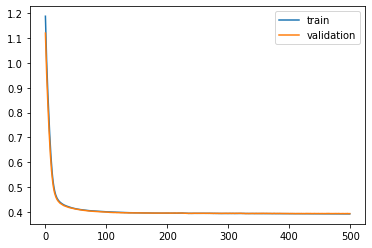

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 35s - loss: 1.1890 - val_loss: 1.1187

Epoch 00001: val_loss improved from inf to 1.11867, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0907 - val_loss: 1.0319

Epoch 00002: val_loss improved from 1.11867 to 1.03190, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0093 - val_loss: 0.9594

Epoch 00003: val_loss improved from 1.03190 to 0.95945, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9400 - val_loss: 0.8957

Epoch 00004: val_loss improved from 0.95945 to 0.89566, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8779 - val_loss: 0.8373

Epoch 00005: val_loss improved from 0.89566 to 0.83729, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8199 - val_loss: 0.7822

Epoch 00006: val_loss improved from 0.83729 to 0.78223, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7651 - val_loss: 0.7299

Epoch 00007: val_loss improved from 0.78223

 - 1s - loss: 0.4087 - val_loss: 0.4120

Epoch 00058: val_loss improved from 0.41239 to 0.41201, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4084 - val_loss: 0.4118

Epoch 00059: val_loss improved from 0.41201 to 0.41179, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4081 - val_loss: 0.4116

Epoch 00060: val_loss improved from 0.41179 to 0.41159, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4077 - val_loss: 0.4115

Epoch 00061: val_loss improved from 0.41159 to 0.41150, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4073 - val_loss: 0.4110

Epoch 00062: val_loss improved from 0.41150 to 0.41100, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4069 - val_loss: 0.4107

Epoch 00063: val_loss improved from 0.41100 to 0.41065, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4066 - val_loss: 0.4105

Epoch 00064: val_loss improved from 0.41065 to 0.41054, saving model to val_weights5.hdf5
Epoch

 - 1s - loss: 0.3977 - val_loss: 0.4024

Epoch 00119: val_loss improved from 0.40249 to 0.40235, saving model to val_weights5.hdf5
Epoch 120/500
 - 1s - loss: 0.3975 - val_loss: 0.4023

Epoch 00120: val_loss improved from 0.40235 to 0.40228, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.3974 - val_loss: 0.4021

Epoch 00121: val_loss improved from 0.40228 to 0.40211, saving model to val_weights5.hdf5
Epoch 122/500
 - 1s - loss: 0.3975 - val_loss: 0.4018

Epoch 00122: val_loss improved from 0.40211 to 0.40179, saving model to val_weights5.hdf5
Epoch 123/500
 - 1s - loss: 0.3974 - val_loss: 0.4020

Epoch 00123: val_loss did not improve from 0.40179
Epoch 124/500
 - 1s - loss: 0.3973 - val_loss: 0.4019

Epoch 00124: val_loss did not improve from 0.40179
Epoch 125/500
 - 1s - loss: 0.3973 - val_loss: 0.4019

Epoch 00125: val_loss did not improve from 0.40179
Epoch 126/500
 - 1s - loss: 0.3972 - val_loss: 0.4015

Epoch 00126: val_loss improved from 0.40179 to 0.40146, savin


Epoch 00187: val_loss did not improve from 0.39874
Epoch 188/500
 - 1s - loss: 0.3946 - val_loss: 0.3989

Epoch 00188: val_loss did not improve from 0.39874
Epoch 189/500
 - 1s - loss: 0.3944 - val_loss: 0.3993

Epoch 00189: val_loss did not improve from 0.39874
Epoch 190/500
 - 1s - loss: 0.3945 - val_loss: 0.3988

Epoch 00190: val_loss did not improve from 0.39874
Epoch 191/500
 - 1s - loss: 0.3944 - val_loss: 0.3990

Epoch 00191: val_loss did not improve from 0.39874
Epoch 192/500
 - 1s - loss: 0.3945 - val_loss: 0.3988

Epoch 00192: val_loss did not improve from 0.39874
Epoch 193/500
 - 1s - loss: 0.3943 - val_loss: 0.3990

Epoch 00193: val_loss did not improve from 0.39874
Epoch 194/500
 - 1s - loss: 0.3943 - val_loss: 0.3990

Epoch 00194: val_loss did not improve from 0.39874
Epoch 195/500
 - 1s - loss: 0.3943 - val_loss: 0.3987

Epoch 00195: val_loss did not improve from 0.39874
Epoch 196/500
 - 1s - loss: 0.3943 - val_loss: 0.3987

Epoch 00196: val_loss improved from 0.39874 t

 - 1s - loss: 0.3931 - val_loss: 0.3981

Epoch 00261: val_loss did not improve from 0.39763
Epoch 262/500
 - 1s - loss: 0.3931 - val_loss: 0.3981

Epoch 00262: val_loss did not improve from 0.39763
Epoch 263/500
 - 1s - loss: 0.3933 - val_loss: 0.3981

Epoch 00263: val_loss did not improve from 0.39763
Epoch 264/500
 - 1s - loss: 0.3933 - val_loss: 0.3979

Epoch 00264: val_loss did not improve from 0.39763
Epoch 265/500
 - 1s - loss: 0.3932 - val_loss: 0.3977

Epoch 00265: val_loss did not improve from 0.39763
Epoch 266/500
 - 1s - loss: 0.3932 - val_loss: 0.3979

Epoch 00266: val_loss did not improve from 0.39763
Epoch 267/500
 - 1s - loss: 0.3931 - val_loss: 0.3979

Epoch 00267: val_loss did not improve from 0.39763
Epoch 268/500
 - 1s - loss: 0.3930 - val_loss: 0.3982

Epoch 00268: val_loss did not improve from 0.39763
Epoch 269/500
 - 1s - loss: 0.3930 - val_loss: 0.3975

Epoch 00269: val_loss improved from 0.39763 to 0.39752, saving model to val_weights5.hdf5
Epoch 270/500
 - 1s -


Epoch 00337: val_loss did not improve from 0.39739
Epoch 338/500
 - 1s - loss: 0.3935 - val_loss: 0.4009

Epoch 00338: val_loss did not improve from 0.39739
Epoch 339/500
 - 1s - loss: 0.3937 - val_loss: 0.4010

Epoch 00339: val_loss did not improve from 0.39739
Epoch 340/500
 - 1s - loss: 0.3937 - val_loss: 0.4009

Epoch 00340: val_loss did not improve from 0.39739
Epoch 341/500
 - 1s - loss: 0.3939 - val_loss: 0.4006

Epoch 00341: val_loss did not improve from 0.39739
Epoch 342/500
 - 1s - loss: 0.3939 - val_loss: 0.4001

Epoch 00342: val_loss did not improve from 0.39739
Epoch 343/500
 - 1s - loss: 0.3937 - val_loss: 0.3992

Epoch 00343: val_loss did not improve from 0.39739
Epoch 344/500
 - 1s - loss: 0.3933 - val_loss: 0.3988

Epoch 00344: val_loss did not improve from 0.39739
Epoch 345/500
 - 1s - loss: 0.3929 - val_loss: 0.3986

Epoch 00345: val_loss did not improve from 0.39739
Epoch 346/500
 - 1s - loss: 0.3926 - val_loss: 0.3982

Epoch 00346: val_loss did not improve from 0.

 - 1s - loss: 0.3920 - val_loss: 0.3987

Epoch 00415: val_loss did not improve from 0.39739
Epoch 416/500
 - 1s - loss: 0.3920 - val_loss: 0.3981

Epoch 00416: val_loss did not improve from 0.39739
Epoch 417/500
 - 1s - loss: 0.3919 - val_loss: 0.3981

Epoch 00417: val_loss did not improve from 0.39739
Epoch 418/500
 - 1s - loss: 0.3918 - val_loss: 0.3985

Epoch 00418: val_loss did not improve from 0.39739
Epoch 419/500
 - 1s - loss: 0.3919 - val_loss: 0.3982

Epoch 00419: val_loss did not improve from 0.39739
Epoch 420/500
 - 1s - loss: 0.3918 - val_loss: 0.3976

Epoch 00420: val_loss did not improve from 0.39739
Epoch 421/500
 - 1s - loss: 0.3918 - val_loss: 0.3978

Epoch 00421: val_loss did not improve from 0.39739
Epoch 422/500
 - 1s - loss: 0.3917 - val_loss: 0.3979

Epoch 00422: val_loss did not improve from 0.39739
Epoch 423/500
 - 1s - loss: 0.3919 - val_loss: 0.3984

Epoch 00423: val_loss did not improve from 0.39739
Epoch 424/500
 - 1s - loss: 0.3919 - val_loss: 0.3976

Epoch

 - 1s - loss: 0.3915 - val_loss: 0.3984

Epoch 00492: val_loss did not improve from 0.39729
Epoch 493/500
 - 1s - loss: 0.3916 - val_loss: 0.3983

Epoch 00493: val_loss did not improve from 0.39729
Epoch 494/500
 - 1s - loss: 0.3916 - val_loss: 0.3975

Epoch 00494: val_loss did not improve from 0.39729
Epoch 495/500
 - 1s - loss: 0.3915 - val_loss: 0.3983

Epoch 00495: val_loss did not improve from 0.39729
Epoch 496/500
 - 1s - loss: 0.3916 - val_loss: 0.3978

Epoch 00496: val_loss did not improve from 0.39729
Epoch 497/500
 - 1s - loss: 0.3914 - val_loss: 0.3977

Epoch 00497: val_loss did not improve from 0.39729
Epoch 498/500
 - 1s - loss: 0.3914 - val_loss: 0.3978

Epoch 00498: val_loss did not improve from 0.39729
Epoch 499/500
 - 1s - loss: 0.3914 - val_loss: 0.3978

Epoch 00499: val_loss did not improve from 0.39729
Epoch 500/500
 - 1s - loss: 0.3913 - val_loss: 0.3981

Epoch 00500: val_loss did not improve from 0.39729
#################################
Number of units: 4
Batch s

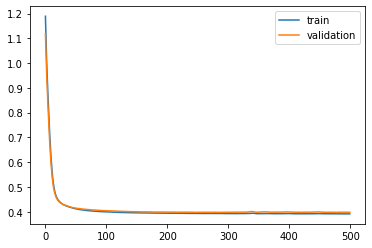

Time to train LSTM:  394.28837418556213
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 41s - loss: 1.2719 - val_loss: 1.2094

Epoch 00001: val_loss improved from inf to 1.20939, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.1616 - val_loss: 1.1087

Epoch 00002: val_loss improved from 1.20939 to 1.10868, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.0692 - val_loss: 1.0239

Epoch 00003: val_loss improved from 1.10868 to 1.02386, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9901 - val_loss: 0.9500

Epoch 00004: val_loss improved from 1.02386 to 0.94999, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.9195 - val_loss: 0.8827

Epoch 00005: val_loss improved from 0.94999 to 0.88267, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8540 - val_loss: 0.8201

Epoch 00006: val_loss improved from 0.88267 to 0.82012, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7923 - val_loss: 0.7612

Epo


Epoch 00057: val_loss improved from 0.41627 to 0.41569, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4091 - val_loss: 0.4152

Epoch 00058: val_loss improved from 0.41569 to 0.41519, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4087 - val_loss: 0.4146

Epoch 00059: val_loss improved from 0.41519 to 0.41462, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4084 - val_loss: 0.4145

Epoch 00060: val_loss improved from 0.41462 to 0.41451, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4080 - val_loss: 0.4139

Epoch 00061: val_loss improved from 0.41451 to 0.41392, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4077 - val_loss: 0.4137

Epoch 00062: val_loss improved from 0.41392 to 0.41366, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4074 - val_loss: 0.4135

Epoch 00063: val_loss improved from 0.41366 to 0.41353, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4070 - val_loss:


Epoch 00118: val_loss did not improve from 0.40275
Epoch 119/500
 - 1s - loss: 0.3982 - val_loss: 0.4032

Epoch 00119: val_loss did not improve from 0.40275
Epoch 120/500
 - 1s - loss: 0.3980 - val_loss: 0.4030

Epoch 00120: val_loss did not improve from 0.40275
Epoch 121/500
 - 1s - loss: 0.3980 - val_loss: 0.4024

Epoch 00121: val_loss improved from 0.40275 to 0.40243, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3978 - val_loss: 0.4024

Epoch 00122: val_loss improved from 0.40243 to 0.40235, saving model to val_weights1.hdf5
Epoch 123/500
 - 1s - loss: 0.3977 - val_loss: 0.4026

Epoch 00123: val_loss did not improve from 0.40235
Epoch 124/500
 - 1s - loss: 0.3978 - val_loss: 0.4023

Epoch 00124: val_loss improved from 0.40235 to 0.40229, saving model to val_weights1.hdf5
Epoch 125/500
 - 1s - loss: 0.3978 - val_loss: 0.4027

Epoch 00125: val_loss did not improve from 0.40229
Epoch 126/500
 - 1s - loss: 0.3975 - val_loss: 0.4022

Epoch 00126: val_loss improved fro


Epoch 00187: val_loss did not improve from 0.39902
Epoch 188/500
 - 1s - loss: 0.3949 - val_loss: 0.3990

Epoch 00188: val_loss improved from 0.39902 to 0.39895, saving model to val_weights1.hdf5
Epoch 189/500
 - 1s - loss: 0.3949 - val_loss: 0.3994

Epoch 00189: val_loss did not improve from 0.39895
Epoch 190/500
 - 1s - loss: 0.3950 - val_loss: 0.3990

Epoch 00190: val_loss did not improve from 0.39895
Epoch 191/500
 - 1s - loss: 0.3948 - val_loss: 0.3995

Epoch 00191: val_loss did not improve from 0.39895
Epoch 192/500
 - 1s - loss: 0.3950 - val_loss: 0.3990

Epoch 00192: val_loss did not improve from 0.39895
Epoch 193/500
 - 1s - loss: 0.3949 - val_loss: 0.3992

Epoch 00193: val_loss did not improve from 0.39895
Epoch 194/500
 - 1s - loss: 0.3949 - val_loss: 0.3993

Epoch 00194: val_loss did not improve from 0.39895
Epoch 195/500
 - 1s - loss: 0.3950 - val_loss: 0.3992

Epoch 00195: val_loss did not improve from 0.39895
Epoch 196/500
 - 1s - loss: 0.3948 - val_loss: 0.3989

Epoch 


Epoch 00259: val_loss did not improve from 0.39796
Epoch 260/500
 - 1s - loss: 0.3939 - val_loss: 0.3986

Epoch 00260: val_loss did not improve from 0.39796
Epoch 261/500
 - 1s - loss: 0.3937 - val_loss: 0.3984

Epoch 00261: val_loss did not improve from 0.39796
Epoch 262/500
 - 1s - loss: 0.3937 - val_loss: 0.3984

Epoch 00262: val_loss did not improve from 0.39796
Epoch 263/500
 - 1s - loss: 0.3938 - val_loss: 0.3985

Epoch 00263: val_loss did not improve from 0.39796
Epoch 264/500
 - 1s - loss: 0.3937 - val_loss: 0.3980

Epoch 00264: val_loss did not improve from 0.39796
Epoch 265/500
 - 1s - loss: 0.3938 - val_loss: 0.3981

Epoch 00265: val_loss did not improve from 0.39796
Epoch 266/500
 - 1s - loss: 0.3937 - val_loss: 0.3981

Epoch 00266: val_loss did not improve from 0.39796
Epoch 267/500
 - 1s - loss: 0.3937 - val_loss: 0.3982

Epoch 00267: val_loss did not improve from 0.39796
Epoch 268/500
 - 1s - loss: 0.3936 - val_loss: 0.3984

Epoch 00268: val_loss did not improve from 0.


Epoch 00335: val_loss did not improve from 0.39759
Epoch 336/500
 - 1s - loss: 0.3932 - val_loss: 0.3978

Epoch 00336: val_loss did not improve from 0.39759
Epoch 337/500
 - 1s - loss: 0.3931 - val_loss: 0.3979

Epoch 00337: val_loss did not improve from 0.39759
Epoch 338/500
 - 1s - loss: 0.3930 - val_loss: 0.3979

Epoch 00338: val_loss did not improve from 0.39759
Epoch 339/500
 - 1s - loss: 0.3930 - val_loss: 0.3979

Epoch 00339: val_loss did not improve from 0.39759
Epoch 340/500
 - 1s - loss: 0.3931 - val_loss: 0.3974

Epoch 00340: val_loss improved from 0.39759 to 0.39740, saving model to val_weights1.hdf5
Epoch 341/500
 - 1s - loss: 0.3931 - val_loss: 0.3978

Epoch 00341: val_loss did not improve from 0.39740
Epoch 342/500
 - 1s - loss: 0.3929 - val_loss: 0.3978

Epoch 00342: val_loss did not improve from 0.39740
Epoch 343/500
 - 1s - loss: 0.3930 - val_loss: 0.3979

Epoch 00343: val_loss did not improve from 0.39740
Epoch 344/500
 - 1s - loss: 0.3929 - val_loss: 0.3977

Epoch 

 - 1s - loss: 0.3927 - val_loss: 0.3977

Epoch 00412: val_loss did not improve from 0.39707
Epoch 413/500
 - 1s - loss: 0.3927 - val_loss: 0.3975

Epoch 00413: val_loss did not improve from 0.39707
Epoch 414/500
 - 1s - loss: 0.3926 - val_loss: 0.3979

Epoch 00414: val_loss did not improve from 0.39707
Epoch 415/500
 - 1s - loss: 0.3924 - val_loss: 0.3973

Epoch 00415: val_loss did not improve from 0.39707
Epoch 416/500
 - 1s - loss: 0.3925 - val_loss: 0.3975

Epoch 00416: val_loss did not improve from 0.39707
Epoch 417/500
 - 1s - loss: 0.3924 - val_loss: 0.3973

Epoch 00417: val_loss did not improve from 0.39707
Epoch 418/500
 - 1s - loss: 0.3926 - val_loss: 0.3977

Epoch 00418: val_loss did not improve from 0.39707
Epoch 419/500
 - 1s - loss: 0.3926 - val_loss: 0.3978

Epoch 00419: val_loss did not improve from 0.39707
Epoch 420/500
 - 1s - loss: 0.3926 - val_loss: 0.3976

Epoch 00420: val_loss did not improve from 0.39707
Epoch 421/500
 - 1s - loss: 0.3926 - val_loss: 0.3973

Epoch

 - 1s - loss: 0.3920 - val_loss: 0.3975

Epoch 00489: val_loss did not improve from 0.39694
Epoch 490/500
 - 1s - loss: 0.3921 - val_loss: 0.3972

Epoch 00490: val_loss did not improve from 0.39694
Epoch 491/500
 - 1s - loss: 0.3919 - val_loss: 0.3980

Epoch 00491: val_loss did not improve from 0.39694
Epoch 492/500
 - 1s - loss: 0.3921 - val_loss: 0.3976

Epoch 00492: val_loss did not improve from 0.39694
Epoch 493/500
 - 1s - loss: 0.3920 - val_loss: 0.3977

Epoch 00493: val_loss did not improve from 0.39694
Epoch 494/500
 - 1s - loss: 0.3920 - val_loss: 0.3972

Epoch 00494: val_loss did not improve from 0.39694
Epoch 495/500
 - 1s - loss: 0.3920 - val_loss: 0.3976

Epoch 00495: val_loss did not improve from 0.39694
Epoch 496/500
 - 1s - loss: 0.3919 - val_loss: 0.3973

Epoch 00496: val_loss did not improve from 0.39694
Epoch 497/500
 - 1s - loss: 0.3919 - val_loss: 0.3974

Epoch 00497: val_loss did not improve from 0.39694
Epoch 498/500
 - 1s - loss: 0.3919 - val_loss: 0.3969

Epoch

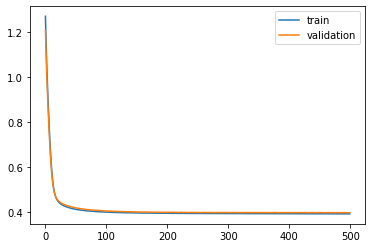

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 48s - loss: 1.2726 - val_loss: 1.2047

Epoch 00001: val_loss improved from inf to 1.20474, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.1621 - val_loss: 1.1070

Epoch 00002: val_loss improved from 1.20474 to 1.10695, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.0694 - val_loss: 1.0236

Epoch 00003: val_loss improved from 1.10695 to 1.02361, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9902 - val_loss: 0.9502

Epoch 00004: val_loss improved from 1.02361 to 0.95021, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.9195 - val_loss: 0.8823

Epoch 00005: val_loss improved from 0.95021 to 0.88233, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8542 - val_loss: 0.8181

Epoch 00006: val_loss improved from 0.88233 to 0.81813, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7927 - val_loss: 0.7583

Epoch 00007: val_loss improved from 0.81813

 - 1s - loss: 0.4096 - val_loss: 0.4065

Epoch 00058: val_loss did not improve from 0.40643
Epoch 59/500
 - 1s - loss: 0.4093 - val_loss: 0.4059

Epoch 00059: val_loss improved from 0.40643 to 0.40595, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4090 - val_loss: 0.4059

Epoch 00060: val_loss improved from 0.40595 to 0.40588, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4086 - val_loss: 0.4053

Epoch 00061: val_loss improved from 0.40588 to 0.40532, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4082 - val_loss: 0.4051

Epoch 00062: val_loss improved from 0.40532 to 0.40511, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4078 - val_loss: 0.4048

Epoch 00063: val_loss improved from 0.40511 to 0.40482, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4076 - val_loss: 0.4046

Epoch 00064: val_loss improved from 0.40482 to 0.40462, saving model to val_weights2.hdf5
Epoch 65/500
 - 1s - loss: 0.4072 - val_loss


Epoch 00120: val_loss did not improve from 0.39695
Epoch 121/500
 - 1s - loss: 0.3982 - val_loss: 0.3968

Epoch 00121: val_loss improved from 0.39695 to 0.39684, saving model to val_weights2.hdf5
Epoch 122/500
 - 1s - loss: 0.3981 - val_loss: 0.3968

Epoch 00122: val_loss improved from 0.39684 to 0.39682, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3982 - val_loss: 0.3968

Epoch 00123: val_loss improved from 0.39682 to 0.39675, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3980 - val_loss: 0.3970

Epoch 00124: val_loss did not improve from 0.39675
Epoch 125/500
 - 1s - loss: 0.3980 - val_loss: 0.3967

Epoch 00125: val_loss improved from 0.39675 to 0.39674, saving model to val_weights2.hdf5
Epoch 126/500
 - 1s - loss: 0.3978 - val_loss: 0.3968

Epoch 00126: val_loss did not improve from 0.39674
Epoch 127/500
 - 1s - loss: 0.3978 - val_loss: 0.3968

Epoch 00127: val_loss did not improve from 0.39674
Epoch 128/500
 - 1s - loss: 0.3977 - val_loss: 0.3

 - 1s - loss: 0.3955 - val_loss: 0.3945

Epoch 00189: val_loss did not improve from 0.39420
Epoch 190/500
 - 1s - loss: 0.3954 - val_loss: 0.3943

Epoch 00190: val_loss did not improve from 0.39420
Epoch 191/500
 - 1s - loss: 0.3954 - val_loss: 0.3942

Epoch 00191: val_loss did not improve from 0.39420
Epoch 192/500
 - 1s - loss: 0.3953 - val_loss: 0.3944

Epoch 00192: val_loss did not improve from 0.39420
Epoch 193/500
 - 1s - loss: 0.3954 - val_loss: 0.3942

Epoch 00193: val_loss did not improve from 0.39420
Epoch 194/500
 - 1s - loss: 0.3952 - val_loss: 0.3942

Epoch 00194: val_loss did not improve from 0.39420
Epoch 195/500
 - 1s - loss: 0.3954 - val_loss: 0.3942

Epoch 00195: val_loss did not improve from 0.39420
Epoch 196/500
 - 1s - loss: 0.3952 - val_loss: 0.3945

Epoch 00196: val_loss did not improve from 0.39420
Epoch 197/500
 - 1s - loss: 0.3953 - val_loss: 0.3944

Epoch 00197: val_loss did not improve from 0.39420
Epoch 198/500
 - 1s - loss: 0.3953 - val_loss: 0.3945

Epoch

 - 1s - loss: 0.3942 - val_loss: 0.3936

Epoch 00263: val_loss did not improve from 0.39331
Epoch 264/500
 - 1s - loss: 0.3941 - val_loss: 0.3934

Epoch 00264: val_loss did not improve from 0.39331
Epoch 265/500
 - 1s - loss: 0.3942 - val_loss: 0.3936

Epoch 00265: val_loss did not improve from 0.39331
Epoch 266/500
 - 1s - loss: 0.3942 - val_loss: 0.3935

Epoch 00266: val_loss did not improve from 0.39331
Epoch 267/500
 - 1s - loss: 0.3941 - val_loss: 0.3935

Epoch 00267: val_loss did not improve from 0.39331
Epoch 268/500
 - 1s - loss: 0.3941 - val_loss: 0.3932

Epoch 00268: val_loss improved from 0.39331 to 0.39316, saving model to val_weights2.hdf5
Epoch 269/500
 - 1s - loss: 0.3940 - val_loss: 0.3932

Epoch 00269: val_loss did not improve from 0.39316
Epoch 270/500
 - 1s - loss: 0.3941 - val_loss: 0.3937

Epoch 00270: val_loss did not improve from 0.39316
Epoch 271/500
 - 1s - loss: 0.3940 - val_loss: 0.3935

Epoch 00271: val_loss did not improve from 0.39316
Epoch 272/500
 - 1s -


Epoch 00338: val_loss improved from 0.39289 to 0.39274, saving model to val_weights2.hdf5
Epoch 339/500
 - 1s - loss: 0.3934 - val_loss: 0.3930

Epoch 00339: val_loss did not improve from 0.39274
Epoch 340/500
 - 1s - loss: 0.3933 - val_loss: 0.3930

Epoch 00340: val_loss did not improve from 0.39274
Epoch 341/500
 - 1s - loss: 0.3934 - val_loss: 0.3928

Epoch 00341: val_loss did not improve from 0.39274
Epoch 342/500
 - 1s - loss: 0.3933 - val_loss: 0.3932

Epoch 00342: val_loss did not improve from 0.39274
Epoch 343/500
 - 1s - loss: 0.3934 - val_loss: 0.3933

Epoch 00343: val_loss did not improve from 0.39274
Epoch 344/500
 - 1s - loss: 0.3933 - val_loss: 0.3928

Epoch 00344: val_loss did not improve from 0.39274
Epoch 345/500
 - 1s - loss: 0.3934 - val_loss: 0.3928

Epoch 00345: val_loss did not improve from 0.39274
Epoch 346/500
 - 1s - loss: 0.3933 - val_loss: 0.3929

Epoch 00346: val_loss did not improve from 0.39274
Epoch 347/500
 - 1s - loss: 0.3932 - val_loss: 0.3928

Epoch 


Epoch 00414: val_loss did not improve from 0.39246
Epoch 415/500
 - 1s - loss: 0.3929 - val_loss: 0.3924

Epoch 00415: val_loss improved from 0.39246 to 0.39244, saving model to val_weights2.hdf5
Epoch 416/500
 - 1s - loss: 0.3930 - val_loss: 0.3929

Epoch 00416: val_loss did not improve from 0.39244
Epoch 417/500
 - 1s - loss: 0.3929 - val_loss: 0.3927

Epoch 00417: val_loss did not improve from 0.39244
Epoch 418/500
 - 1s - loss: 0.3929 - val_loss: 0.3927

Epoch 00418: val_loss did not improve from 0.39244
Epoch 419/500
 - 1s - loss: 0.3929 - val_loss: 0.3927

Epoch 00419: val_loss did not improve from 0.39244
Epoch 420/500
 - 1s - loss: 0.3930 - val_loss: 0.3925

Epoch 00420: val_loss did not improve from 0.39244
Epoch 421/500
 - 1s - loss: 0.3929 - val_loss: 0.3928

Epoch 00421: val_loss did not improve from 0.39244
Epoch 422/500
 - 1s - loss: 0.3930 - val_loss: 0.3929

Epoch 00422: val_loss did not improve from 0.39244
Epoch 423/500
 - 1s - loss: 0.3927 - val_loss: 0.3928

Epoch 

 - 1s - loss: 0.3924 - val_loss: 0.3924

Epoch 00491: val_loss did not improve from 0.39213
Epoch 492/500
 - 1s - loss: 0.3924 - val_loss: 0.3923

Epoch 00492: val_loss did not improve from 0.39213
Epoch 493/500
 - 1s - loss: 0.3924 - val_loss: 0.3923

Epoch 00493: val_loss did not improve from 0.39213
Epoch 494/500
 - 1s - loss: 0.3924 - val_loss: 0.3928

Epoch 00494: val_loss did not improve from 0.39213
Epoch 495/500
 - 1s - loss: 0.3925 - val_loss: 0.3923

Epoch 00495: val_loss did not improve from 0.39213
Epoch 496/500
 - 1s - loss: 0.3925 - val_loss: 0.3925

Epoch 00496: val_loss did not improve from 0.39213
Epoch 497/500
 - 1s - loss: 0.3924 - val_loss: 0.3924

Epoch 00497: val_loss did not improve from 0.39213
Epoch 498/500
 - 1s - loss: 0.3923 - val_loss: 0.3925

Epoch 00498: val_loss did not improve from 0.39213
Epoch 499/500
 - 1s - loss: 0.3923 - val_loss: 0.3922

Epoch 00499: val_loss did not improve from 0.39213
Epoch 500/500
 - 1s - loss: 0.3923 - val_loss: 0.3927

Epoch

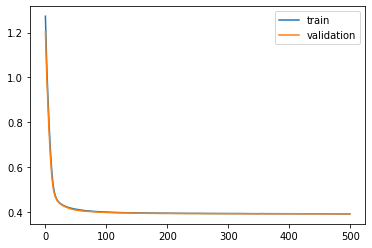

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 36s - loss: 1.2740 - val_loss: 1.1927

Epoch 00001: val_loss improved from inf to 1.19271, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.1638 - val_loss: 1.0933

Epoch 00002: val_loss improved from 1.19271 to 1.09328, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.0713 - val_loss: 1.0094

Epoch 00003: val_loss improved from 1.09328 to 1.00937, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9921 - val_loss: 0.9367

Epoch 00004: val_loss improved from 1.00937 to 0.93665, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.9213 - val_loss: 0.8703

Epoch 00005: val_loss improved from 0.93665 to 0.87026, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8556 - val_loss: 0.8084

Epoch 00006: val_loss improved from 0.87026 to 0.80838, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7939 - val_loss: 0.7513

Epoch 00007: val_loss improved from 0.80838

 - 1s - loss: 0.4090 - val_loss: 0.4157

Epoch 00058: val_loss did not improve from 0.41569
Epoch 59/500
 - 1s - loss: 0.4086 - val_loss: 0.4152

Epoch 00059: val_loss improved from 0.41569 to 0.41520, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4083 - val_loss: 0.4151

Epoch 00060: val_loss improved from 0.41520 to 0.41512, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4080 - val_loss: 0.4147

Epoch 00061: val_loss improved from 0.41512 to 0.41469, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4075 - val_loss: 0.4147

Epoch 00062: val_loss improved from 0.41469 to 0.41466, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4073 - val_loss: 0.4142

Epoch 00063: val_loss improved from 0.41466 to 0.41418, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4069 - val_loss: 0.4140

Epoch 00064: val_loss improved from 0.41418 to 0.41405, saving model to val_weights3.hdf5
Epoch 65/500
 - 1s - loss: 0.4067 - val_loss

 - 1s - loss: 0.3977 - val_loss: 0.4067

Epoch 00120: val_loss did not improve from 0.40666
Epoch 121/500
 - 1s - loss: 0.3975 - val_loss: 0.4068

Epoch 00121: val_loss did not improve from 0.40666
Epoch 122/500
 - 1s - loss: 0.3974 - val_loss: 0.4064

Epoch 00122: val_loss improved from 0.40666 to 0.40640, saving model to val_weights3.hdf5
Epoch 123/500
 - 1s - loss: 0.3974 - val_loss: 0.4063

Epoch 00123: val_loss improved from 0.40640 to 0.40626, saving model to val_weights3.hdf5
Epoch 124/500
 - 1s - loss: 0.3972 - val_loss: 0.4063

Epoch 00124: val_loss did not improve from 0.40626
Epoch 125/500
 - 1s - loss: 0.3973 - val_loss: 0.4061

Epoch 00125: val_loss improved from 0.40626 to 0.40613, saving model to val_weights3.hdf5
Epoch 126/500
 - 1s - loss: 0.3971 - val_loss: 0.4063

Epoch 00126: val_loss did not improve from 0.40613
Epoch 127/500
 - 1s - loss: 0.3971 - val_loss: 0.4064

Epoch 00127: val_loss did not improve from 0.40613
Epoch 128/500
 - 1s - loss: 0.3970 - val_loss: 0.


Epoch 00191: val_loss did not improve from 0.40412
Epoch 192/500
 - 1s - loss: 0.3945 - val_loss: 0.4042

Epoch 00192: val_loss did not improve from 0.40412
Epoch 193/500
 - 1s - loss: 0.3945 - val_loss: 0.4040

Epoch 00193: val_loss improved from 0.40412 to 0.40401, saving model to val_weights3.hdf5
Epoch 194/500
 - 1s - loss: 0.3944 - val_loss: 0.4042

Epoch 00194: val_loss did not improve from 0.40401
Epoch 195/500
 - 1s - loss: 0.3945 - val_loss: 0.4042

Epoch 00195: val_loss did not improve from 0.40401
Epoch 196/500
 - 1s - loss: 0.3945 - val_loss: 0.4041

Epoch 00196: val_loss did not improve from 0.40401
Epoch 197/500
 - 1s - loss: 0.3946 - val_loss: 0.4043

Epoch 00197: val_loss did not improve from 0.40401
Epoch 198/500
 - 1s - loss: 0.3944 - val_loss: 0.4042

Epoch 00198: val_loss did not improve from 0.40401
Epoch 199/500
 - 1s - loss: 0.3944 - val_loss: 0.4042

Epoch 00199: val_loss did not improve from 0.40401
Epoch 200/500
 - 1s - loss: 0.3943 - val_loss: 0.4039

Epoch 


Epoch 00264: val_loss did not improve from 0.40306
Epoch 265/500
 - 1s - loss: 0.3933 - val_loss: 0.4032

Epoch 00265: val_loss did not improve from 0.40306
Epoch 266/500
 - 1s - loss: 0.3933 - val_loss: 0.4031

Epoch 00266: val_loss did not improve from 0.40306
Epoch 267/500
 - 1s - loss: 0.3933 - val_loss: 0.4033

Epoch 00267: val_loss did not improve from 0.40306
Epoch 268/500
 - 1s - loss: 0.3932 - val_loss: 0.4033

Epoch 00268: val_loss did not improve from 0.40306
Epoch 269/500
 - 1s - loss: 0.3932 - val_loss: 0.4034

Epoch 00269: val_loss did not improve from 0.40306
Epoch 270/500
 - 1s - loss: 0.3931 - val_loss: 0.4030

Epoch 00270: val_loss improved from 0.40306 to 0.40295, saving model to val_weights3.hdf5
Epoch 271/500
 - 1s - loss: 0.3931 - val_loss: 0.4032

Epoch 00271: val_loss did not improve from 0.40295
Epoch 272/500
 - 1s - loss: 0.3933 - val_loss: 0.4030

Epoch 00272: val_loss did not improve from 0.40295
Epoch 273/500
 - 1s - loss: 0.3932 - val_loss: 0.4032

Epoch 

 - 1s - loss: 0.3926 - val_loss: 0.4024

Epoch 00338: val_loss did not improve from 0.40232
Epoch 339/500
 - 1s - loss: 0.3927 - val_loss: 0.4025

Epoch 00339: val_loss did not improve from 0.40232
Epoch 340/500
 - 1s - loss: 0.3926 - val_loss: 0.4024

Epoch 00340: val_loss did not improve from 0.40232
Epoch 341/500
 - 1s - loss: 0.3926 - val_loss: 0.4025

Epoch 00341: val_loss did not improve from 0.40232
Epoch 342/500
 - 1s - loss: 0.3927 - val_loss: 0.4023

Epoch 00342: val_loss did not improve from 0.40232
Epoch 343/500
 - 1s - loss: 0.3926 - val_loss: 0.4025

Epoch 00343: val_loss did not improve from 0.40232
Epoch 344/500
 - 1s - loss: 0.3926 - val_loss: 0.4024

Epoch 00344: val_loss did not improve from 0.40232
Epoch 345/500
 - 1s - loss: 0.3926 - val_loss: 0.4024

Epoch 00345: val_loss did not improve from 0.40232
Epoch 346/500
 - 1s - loss: 0.3926 - val_loss: 0.4023

Epoch 00346: val_loss did not improve from 0.40232
Epoch 347/500
 - 1s - loss: 0.3927 - val_loss: 0.4023

Epoch

 - 1s - loss: 0.3922 - val_loss: 0.4022

Epoch 00412: val_loss did not improve from 0.40145
Epoch 413/500
 - 1s - loss: 0.3921 - val_loss: 0.4014

Epoch 00413: val_loss improved from 0.40145 to 0.40140, saving model to val_weights3.hdf5
Epoch 414/500
 - 1s - loss: 0.3922 - val_loss: 0.4016

Epoch 00414: val_loss did not improve from 0.40140
Epoch 415/500
 - 1s - loss: 0.3923 - val_loss: 0.4017

Epoch 00415: val_loss did not improve from 0.40140
Epoch 416/500
 - 1s - loss: 0.3921 - val_loss: 0.4018

Epoch 00416: val_loss did not improve from 0.40140
Epoch 417/500
 - 1s - loss: 0.3922 - val_loss: 0.4018

Epoch 00417: val_loss did not improve from 0.40140
Epoch 418/500
 - 1s - loss: 0.3921 - val_loss: 0.4019

Epoch 00418: val_loss did not improve from 0.40140
Epoch 419/500
 - 1s - loss: 0.3922 - val_loss: 0.4019

Epoch 00419: val_loss did not improve from 0.40140
Epoch 420/500
 - 1s - loss: 0.3920 - val_loss: 0.4017

Epoch 00420: val_loss did not improve from 0.40140
Epoch 421/500
 - 1s -

 - 1s - loss: 0.3915 - val_loss: 0.4009

Epoch 00487: val_loss improved from 0.40092 to 0.40092, saving model to val_weights3.hdf5
Epoch 488/500
 - 1s - loss: 0.3915 - val_loss: 0.4017

Epoch 00488: val_loss did not improve from 0.40092
Epoch 489/500
 - 1s - loss: 0.3915 - val_loss: 0.4011

Epoch 00489: val_loss did not improve from 0.40092
Epoch 490/500
 - 1s - loss: 0.3916 - val_loss: 0.4018

Epoch 00490: val_loss did not improve from 0.40092
Epoch 491/500
 - 1s - loss: 0.3915 - val_loss: 0.4015

Epoch 00491: val_loss did not improve from 0.40092
Epoch 492/500
 - 1s - loss: 0.3916 - val_loss: 0.4015

Epoch 00492: val_loss did not improve from 0.40092
Epoch 493/500
 - 1s - loss: 0.3914 - val_loss: 0.4007

Epoch 00493: val_loss improved from 0.40092 to 0.40073, saving model to val_weights3.hdf5
Epoch 494/500
 - 1s - loss: 0.3915 - val_loss: 0.4012

Epoch 00494: val_loss did not improve from 0.40073
Epoch 495/500
 - 1s - loss: 0.3914 - val_loss: 0.4010

Epoch 00495: val_loss did not imp

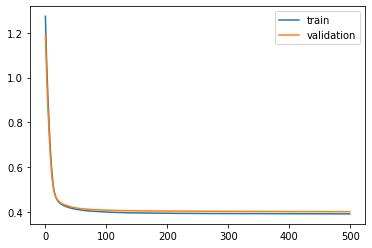

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 25s - loss: 1.2732 - val_loss: 1.1984

Epoch 00001: val_loss improved from inf to 1.19842, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.1631 - val_loss: 1.0985

Epoch 00002: val_loss improved from 1.19842 to 1.09847, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.0707 - val_loss: 1.0145

Epoch 00003: val_loss improved from 1.09847 to 1.01450, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9915 - val_loss: 0.9409

Epoch 00004: val_loss improved from 1.01450 to 0.94093, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.9206 - val_loss: 0.8735

Epoch 00005: val_loss improved from 0.94093 to 0.87351, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8551 - val_loss: 0.8102

Epoch 00006: val_loss improved from 0.87351 to 0.81018, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7937 - val_loss: 0.7509

Epoch 00007: val_loss improved from 0.81018

 - 1s - loss: 0.4101 - val_loss: 0.4087

Epoch 00058: val_loss improved from 0.40924 to 0.40875, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4096 - val_loss: 0.4080

Epoch 00059: val_loss improved from 0.40875 to 0.40801, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4092 - val_loss: 0.4077

Epoch 00060: val_loss improved from 0.40801 to 0.40767, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4088 - val_loss: 0.4074

Epoch 00061: val_loss improved from 0.40767 to 0.40743, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4085 - val_loss: 0.4073

Epoch 00062: val_loss improved from 0.40743 to 0.40731, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4082 - val_loss: 0.4068

Epoch 00063: val_loss improved from 0.40731 to 0.40684, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4079 - val_loss: 0.4062

Epoch 00064: val_loss improved from 0.40684 to 0.40625, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.3985 - val_loss: 0.3968

Epoch 00121: val_loss did not improve from 0.39665
Epoch 122/500
 - 1s - loss: 0.3983 - val_loss: 0.3970

Epoch 00122: val_loss did not improve from 0.39665
Epoch 123/500
 - 1s - loss: 0.3984 - val_loss: 0.3969

Epoch 00123: val_loss did not improve from 0.39665
Epoch 124/500
 - 1s - loss: 0.3982 - val_loss: 0.3965

Epoch 00124: val_loss improved from 0.39665 to 0.39653, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3980 - val_loss: 0.3968

Epoch 00125: val_loss did not improve from 0.39653
Epoch 126/500
 - 1s - loss: 0.3979 - val_loss: 0.3965

Epoch 00126: val_loss improved from 0.39653 to 0.39652, saving model to val_weights4.hdf5
Epoch 127/500
 - 1s - loss: 0.3980 - val_loss: 0.3968

Epoch 00127: val_loss did not improve from 0.39652
Epoch 128/500
 - 1s - loss: 0.3979 - val_loss: 0.3964

Epoch 00128: val_loss improved from 0.39652 to 0.39644, saving model to val_weights4.hdf5
Epoch 129/500
 - 1s - loss: 0.3979 - val_loss: 0.

 - 1s - loss: 0.3955 - val_loss: 0.3953

Epoch 00193: val_loss did not improve from 0.39490
Epoch 194/500
 - 1s - loss: 0.3956 - val_loss: 0.3951

Epoch 00194: val_loss did not improve from 0.39490
Epoch 195/500
 - 1s - loss: 0.3955 - val_loss: 0.3950

Epoch 00195: val_loss did not improve from 0.39490
Epoch 196/500
 - 1s - loss: 0.3953 - val_loss: 0.3953

Epoch 00196: val_loss did not improve from 0.39490
Epoch 197/500
 - 1s - loss: 0.3953 - val_loss: 0.3947

Epoch 00197: val_loss improved from 0.39490 to 0.39474, saving model to val_weights4.hdf5
Epoch 198/500
 - 1s - loss: 0.3954 - val_loss: 0.3952

Epoch 00198: val_loss did not improve from 0.39474
Epoch 199/500
 - 1s - loss: 0.3954 - val_loss: 0.3949

Epoch 00199: val_loss did not improve from 0.39474
Epoch 200/500
 - 1s - loss: 0.3954 - val_loss: 0.3951

Epoch 00200: val_loss did not improve from 0.39474
Epoch 201/500
 - 1s - loss: 0.3953 - val_loss: 0.3952

Epoch 00201: val_loss did not improve from 0.39474
Epoch 202/500
 - 1s -


Epoch 00268: val_loss did not improve from 0.39409
Epoch 269/500
 - 1s - loss: 0.3946 - val_loss: 0.3946

Epoch 00269: val_loss did not improve from 0.39409
Epoch 270/500
 - 1s - loss: 0.3947 - val_loss: 0.3943

Epoch 00270: val_loss did not improve from 0.39409
Epoch 271/500
 - 1s - loss: 0.3946 - val_loss: 0.3945

Epoch 00271: val_loss did not improve from 0.39409
Epoch 272/500
 - 1s - loss: 0.3946 - val_loss: 0.3942

Epoch 00272: val_loss did not improve from 0.39409
Epoch 273/500
 - 1s - loss: 0.3945 - val_loss: 0.3943

Epoch 00273: val_loss did not improve from 0.39409
Epoch 274/500
 - 1s - loss: 0.3946 - val_loss: 0.3947

Epoch 00274: val_loss did not improve from 0.39409
Epoch 275/500
 - 1s - loss: 0.3946 - val_loss: 0.3945

Epoch 00275: val_loss did not improve from 0.39409
Epoch 276/500
 - 1s - loss: 0.3946 - val_loss: 0.3947

Epoch 00276: val_loss did not improve from 0.39409
Epoch 277/500
 - 1s - loss: 0.3946 - val_loss: 0.3945

Epoch 00277: val_loss did not improve from 0.


Epoch 00343: val_loss improved from 0.39364 to 0.39347, saving model to val_weights4.hdf5
Epoch 344/500
 - 1s - loss: 0.3938 - val_loss: 0.3938

Epoch 00344: val_loss did not improve from 0.39347
Epoch 345/500
 - 1s - loss: 0.3939 - val_loss: 0.3935

Epoch 00345: val_loss did not improve from 0.39347
Epoch 346/500
 - 1s - loss: 0.3938 - val_loss: 0.3938

Epoch 00346: val_loss did not improve from 0.39347
Epoch 347/500
 - 1s - loss: 0.3939 - val_loss: 0.3935

Epoch 00347: val_loss did not improve from 0.39347
Epoch 348/500
 - 1s - loss: 0.3937 - val_loss: 0.3937

Epoch 00348: val_loss did not improve from 0.39347
Epoch 349/500
 - 1s - loss: 0.3937 - val_loss: 0.3937

Epoch 00349: val_loss did not improve from 0.39347
Epoch 350/500
 - 1s - loss: 0.3937 - val_loss: 0.3935

Epoch 00350: val_loss did not improve from 0.39347
Epoch 351/500
 - 1s - loss: 0.3938 - val_loss: 0.3936

Epoch 00351: val_loss did not improve from 0.39347
Epoch 352/500
 - 1s - loss: 0.3936 - val_loss: 0.3935

Epoch 

 - 1s - loss: 0.3932 - val_loss: 0.3937

Epoch 00419: val_loss did not improve from 0.39310
Epoch 420/500
 - 1s - loss: 0.3932 - val_loss: 0.3936

Epoch 00420: val_loss did not improve from 0.39310
Epoch 421/500
 - 1s - loss: 0.3932 - val_loss: 0.3936

Epoch 00421: val_loss did not improve from 0.39310
Epoch 422/500
 - 1s - loss: 0.3934 - val_loss: 0.3941

Epoch 00422: val_loss did not improve from 0.39310
Epoch 423/500
 - 1s - loss: 0.3933 - val_loss: 0.3938

Epoch 00423: val_loss did not improve from 0.39310
Epoch 424/500
 - 1s - loss: 0.3932 - val_loss: 0.3938

Epoch 00424: val_loss did not improve from 0.39310
Epoch 425/500
 - 1s - loss: 0.3932 - val_loss: 0.3937

Epoch 00425: val_loss did not improve from 0.39310
Epoch 426/500
 - 1s - loss: 0.3932 - val_loss: 0.3940

Epoch 00426: val_loss did not improve from 0.39310
Epoch 427/500
 - 1s - loss: 0.3931 - val_loss: 0.3936

Epoch 00427: val_loss did not improve from 0.39310
Epoch 428/500
 - 1s - loss: 0.3930 - val_loss: 0.3935

Epoch


Epoch 00495: val_loss did not improve from 0.39289
Epoch 496/500
 - 1s - loss: 0.3927 - val_loss: 0.3930

Epoch 00496: val_loss did not improve from 0.39289
Epoch 497/500
 - 1s - loss: 0.3927 - val_loss: 0.3933

Epoch 00497: val_loss did not improve from 0.39289
Epoch 498/500
 - 1s - loss: 0.3926 - val_loss: 0.3930

Epoch 00498: val_loss did not improve from 0.39289
Epoch 499/500
 - 1s - loss: 0.3927 - val_loss: 0.3931

Epoch 00499: val_loss did not improve from 0.39289
Epoch 500/500
 - 1s - loss: 0.3927 - val_loss: 0.3928

Epoch 00500: val_loss improved from 0.39289 to 0.39281, saving model to val_weights4.hdf5
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.013953442360305133
best val loss: 0.39281422633594937
#################################


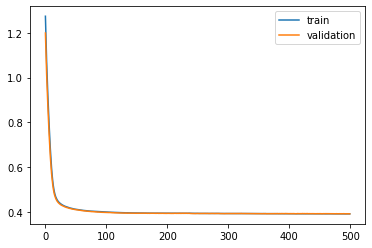

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 47s - loss: 1.2736 - val_loss: 1.1966

Epoch 00001: val_loss improved from inf to 1.19659, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.1633 - val_loss: 1.0983

Epoch 00002: val_loss improved from 1.19659 to 1.09829, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0709 - val_loss: 1.0153

Epoch 00003: val_loss improved from 1.09829 to 1.01529, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9916 - val_loss: 0.9422

Epoch 00004: val_loss improved from 1.01529 to 0.94221, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.9209 - val_loss: 0.8757

Epoch 00005: val_loss improved from 0.94221 to 0.87573, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8553 - val_loss: 0.8135

Epoch 00006: val_loss improved from 0.87573 to 0.81345, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7938 - val_loss: 0.7549

Epoch 00007: val_loss improved from 0.81345

 - 1s - loss: 0.4095 - val_loss: 0.4125

Epoch 00058: val_loss improved from 0.41254 to 0.41248, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4090 - val_loss: 0.4125

Epoch 00059: val_loss did not improve from 0.41248
Epoch 60/500
 - 1s - loss: 0.4088 - val_loss: 0.4121

Epoch 00060: val_loss improved from 0.41248 to 0.41212, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4084 - val_loss: 0.4117

Epoch 00061: val_loss improved from 0.41212 to 0.41169, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4081 - val_loss: 0.4114

Epoch 00062: val_loss improved from 0.41169 to 0.41142, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4076 - val_loss: 0.4111

Epoch 00063: val_loss improved from 0.41142 to 0.41108, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4074 - val_loss: 0.4110

Epoch 00064: val_loss improved from 0.41108 to 0.41098, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4070 - val_loss


Epoch 00117: val_loss did not improve from 0.40245
Epoch 118/500
 - 1s - loss: 0.3984 - val_loss: 0.4025

Epoch 00118: val_loss did not improve from 0.40245
Epoch 119/500
 - 1s - loss: 0.3983 - val_loss: 0.4026

Epoch 00119: val_loss did not improve from 0.40245
Epoch 120/500
 - 1s - loss: 0.3981 - val_loss: 0.4021

Epoch 00120: val_loss improved from 0.40245 to 0.40206, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.3981 - val_loss: 0.4025

Epoch 00121: val_loss did not improve from 0.40206
Epoch 122/500
 - 1s - loss: 0.3981 - val_loss: 0.4023

Epoch 00122: val_loss did not improve from 0.40206
Epoch 123/500
 - 1s - loss: 0.3980 - val_loss: 0.4023

Epoch 00123: val_loss did not improve from 0.40206
Epoch 124/500
 - 1s - loss: 0.3980 - val_loss: 0.4018

Epoch 00124: val_loss improved from 0.40206 to 0.40182, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3979 - val_loss: 0.4020

Epoch 00125: val_loss did not improve from 0.40182
Epoch 126/500
 - 1s - 


Epoch 00188: val_loss did not improve from 0.39924
Epoch 189/500
 - 1s - loss: 0.3951 - val_loss: 0.3990

Epoch 00189: val_loss improved from 0.39924 to 0.39900, saving model to val_weights5.hdf5
Epoch 190/500
 - 1s - loss: 0.3950 - val_loss: 0.3990

Epoch 00190: val_loss improved from 0.39900 to 0.39897, saving model to val_weights5.hdf5
Epoch 191/500
 - 1s - loss: 0.3950 - val_loss: 0.3994

Epoch 00191: val_loss did not improve from 0.39897
Epoch 192/500
 - 1s - loss: 0.3949 - val_loss: 0.3990

Epoch 00192: val_loss did not improve from 0.39897
Epoch 193/500
 - 1s - loss: 0.3949 - val_loss: 0.3990

Epoch 00193: val_loss did not improve from 0.39897
Epoch 194/500
 - 1s - loss: 0.3948 - val_loss: 0.3991

Epoch 00194: val_loss did not improve from 0.39897
Epoch 195/500
 - 1s - loss: 0.3947 - val_loss: 0.3989

Epoch 00195: val_loss improved from 0.39897 to 0.39890, saving model to val_weights5.hdf5
Epoch 196/500
 - 1s - loss: 0.3948 - val_loss: 0.3994

Epoch 00196: val_loss did not impr

 - 1s - loss: 0.3937 - val_loss: 0.3978

Epoch 00261: val_loss did not improve from 0.39755
Epoch 262/500
 - 1s - loss: 0.3936 - val_loss: 0.3982

Epoch 00262: val_loss did not improve from 0.39755
Epoch 263/500
 - 1s - loss: 0.3937 - val_loss: 0.3978

Epoch 00263: val_loss did not improve from 0.39755
Epoch 264/500
 - 1s - loss: 0.3937 - val_loss: 0.3977

Epoch 00264: val_loss did not improve from 0.39755
Epoch 265/500
 - 1s - loss: 0.3935 - val_loss: 0.3977

Epoch 00265: val_loss did not improve from 0.39755
Epoch 266/500
 - 1s - loss: 0.3936 - val_loss: 0.3978

Epoch 00266: val_loss did not improve from 0.39755
Epoch 267/500
 - 1s - loss: 0.3936 - val_loss: 0.3977

Epoch 00267: val_loss did not improve from 0.39755
Epoch 268/500
 - 1s - loss: 0.3936 - val_loss: 0.3978

Epoch 00268: val_loss did not improve from 0.39755
Epoch 269/500
 - 1s - loss: 0.3934 - val_loss: 0.3977

Epoch 00269: val_loss did not improve from 0.39755
Epoch 270/500
 - 1s - loss: 0.3936 - val_loss: 0.3981

Epoch

 - 1s - loss: 0.3929 - val_loss: 0.3971

Epoch 00335: val_loss did not improve from 0.39679
Epoch 336/500
 - 1s - loss: 0.3930 - val_loss: 0.3973

Epoch 00336: val_loss did not improve from 0.39679
Epoch 337/500
 - 1s - loss: 0.3929 - val_loss: 0.3967

Epoch 00337: val_loss improved from 0.39679 to 0.39669, saving model to val_weights5.hdf5
Epoch 338/500
 - 1s - loss: 0.3928 - val_loss: 0.3969

Epoch 00338: val_loss did not improve from 0.39669
Epoch 339/500
 - 1s - loss: 0.3928 - val_loss: 0.3973

Epoch 00339: val_loss did not improve from 0.39669
Epoch 340/500
 - 1s - loss: 0.3929 - val_loss: 0.3968

Epoch 00340: val_loss did not improve from 0.39669
Epoch 341/500
 - 1s - loss: 0.3928 - val_loss: 0.3968

Epoch 00341: val_loss did not improve from 0.39669
Epoch 342/500
 - 1s - loss: 0.3927 - val_loss: 0.3975

Epoch 00342: val_loss did not improve from 0.39669
Epoch 343/500
 - 1s - loss: 0.3928 - val_loss: 0.3970

Epoch 00343: val_loss did not improve from 0.39669
Epoch 344/500
 - 1s -

 - 1s - loss: 0.3924 - val_loss: 0.3972

Epoch 00411: val_loss did not improve from 0.39619
Epoch 412/500
 - 1s - loss: 0.3923 - val_loss: 0.3968

Epoch 00412: val_loss did not improve from 0.39619
Epoch 413/500
 - 1s - loss: 0.3923 - val_loss: 0.3968

Epoch 00413: val_loss did not improve from 0.39619
Epoch 414/500
 - 1s - loss: 0.3922 - val_loss: 0.3969

Epoch 00414: val_loss did not improve from 0.39619
Epoch 415/500
 - 1s - loss: 0.3923 - val_loss: 0.3972

Epoch 00415: val_loss did not improve from 0.39619
Epoch 416/500
 - 1s - loss: 0.3922 - val_loss: 0.3968

Epoch 00416: val_loss did not improve from 0.39619
Epoch 417/500
 - 1s - loss: 0.3924 - val_loss: 0.3967

Epoch 00417: val_loss did not improve from 0.39619
Epoch 418/500
 - 1s - loss: 0.3923 - val_loss: 0.3968

Epoch 00418: val_loss did not improve from 0.39619
Epoch 419/500
 - 1s - loss: 0.3921 - val_loss: 0.3969

Epoch 00419: val_loss did not improve from 0.39619
Epoch 420/500
 - 1s - loss: 0.3920 - val_loss: 0.3970

Epoch

 - 1s - loss: 0.3919 - val_loss: 0.3965

Epoch 00488: val_loss did not improve from 0.39606
Epoch 489/500
 - 1s - loss: 0.3919 - val_loss: 0.3967

Epoch 00489: val_loss did not improve from 0.39606
Epoch 490/500
 - 1s - loss: 0.3918 - val_loss: 0.3964

Epoch 00490: val_loss did not improve from 0.39606
Epoch 491/500
 - 1s - loss: 0.3918 - val_loss: 0.3967

Epoch 00491: val_loss did not improve from 0.39606
Epoch 492/500
 - 1s - loss: 0.3919 - val_loss: 0.3967

Epoch 00492: val_loss did not improve from 0.39606
Epoch 493/500
 - 1s - loss: 0.3917 - val_loss: 0.3962

Epoch 00493: val_loss did not improve from 0.39606
Epoch 494/500
 - 1s - loss: 0.3919 - val_loss: 0.3964

Epoch 00494: val_loss did not improve from 0.39606
Epoch 495/500
 - 1s - loss: 0.3917 - val_loss: 0.3969

Epoch 00495: val_loss did not improve from 0.39606
Epoch 496/500
 - 1s - loss: 0.3918 - val_loss: 0.3966

Epoch 00496: val_loss did not improve from 0.39606
Epoch 497/500
 - 1s - loss: 0.3918 - val_loss: 0.3966

Epoch

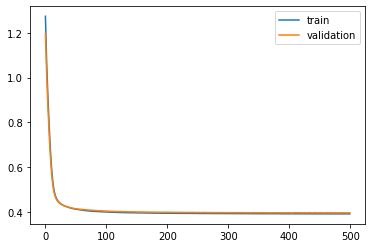

Time to train LSTM:  407.36797881126404
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 24s - loss: 1.1897 - val_loss: 1.1337

Epoch 00001: val_loss improved from inf to 1.13367, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0910 - val_loss: 1.0442

Epoch 00002: val_loss improved from 1.13367 to 1.04422, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.0094 - val_loss: 0.9696

Epoch 00003: val_loss improved from 1.04422 to 0.96958, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9401 - val_loss: 0.9048

Epoch 00004: val_loss improved from 0.96958 to 0.90485, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8780 - val_loss: 0.8453

Epoch 00005: val_loss improved from 0.90485 to 0.84534, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8200 - val_loss: 0.7897

Epoch 00006: val_loss improved from 0.84534 to 0.78975, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7649 - val_loss: 0.7370

Epo


Epoch 00057: val_loss improved from 0.41580 to 0.41529, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4084 - val_loss: 0.4150

Epoch 00058: val_loss improved from 0.41529 to 0.41502, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4081 - val_loss: 0.4145

Epoch 00059: val_loss improved from 0.41502 to 0.41445, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4077 - val_loss: 0.4142

Epoch 00060: val_loss improved from 0.41445 to 0.41417, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4074 - val_loss: 0.4139

Epoch 00061: val_loss improved from 0.41417 to 0.41387, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4070 - val_loss: 0.4135

Epoch 00062: val_loss improved from 0.41387 to 0.41345, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4067 - val_loss: 0.4133

Epoch 00063: val_loss improved from 0.41345 to 0.41327, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4064 - val_loss:

 - 1s - loss: 0.3976 - val_loss: 0.4024

Epoch 00119: val_loss improved from 0.40283 to 0.40238, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.3975 - val_loss: 0.4027

Epoch 00120: val_loss did not improve from 0.40238
Epoch 121/500
 - 1s - loss: 0.3974 - val_loss: 0.4022

Epoch 00121: val_loss improved from 0.40238 to 0.40216, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3973 - val_loss: 0.4026

Epoch 00122: val_loss did not improve from 0.40216
Epoch 123/500
 - 1s - loss: 0.3973 - val_loss: 0.4024

Epoch 00123: val_loss did not improve from 0.40216
Epoch 124/500
 - 1s - loss: 0.3972 - val_loss: 0.4027

Epoch 00124: val_loss did not improve from 0.40216
Epoch 125/500
 - 1s - loss: 0.3970 - val_loss: 0.4025

Epoch 00125: val_loss did not improve from 0.40216
Epoch 126/500
 - 1s - loss: 0.3972 - val_loss: 0.4022

Epoch 00126: val_loss improved from 0.40216 to 0.40215, saving model to val_weights1.hdf5
Epoch 127/500
 - 1s - loss: 0.3969 - val_loss: 0.


Epoch 00188: val_loss did not improve from 0.39906
Epoch 189/500
 - 1s - loss: 0.3942 - val_loss: 0.3996

Epoch 00189: val_loss did not improve from 0.39906
Epoch 190/500
 - 1s - loss: 0.3942 - val_loss: 0.3990

Epoch 00190: val_loss improved from 0.39906 to 0.39903, saving model to val_weights1.hdf5
Epoch 191/500
 - 1s - loss: 0.3941 - val_loss: 0.3998

Epoch 00191: val_loss did not improve from 0.39903
Epoch 192/500
 - 1s - loss: 0.3943 - val_loss: 0.3994

Epoch 00192: val_loss did not improve from 0.39903
Epoch 193/500
 - 1s - loss: 0.3942 - val_loss: 0.3992

Epoch 00193: val_loss did not improve from 0.39903
Epoch 194/500
 - 1s - loss: 0.3942 - val_loss: 0.3994

Epoch 00194: val_loss did not improve from 0.39903
Epoch 195/500
 - 1s - loss: 0.3942 - val_loss: 0.3994

Epoch 00195: val_loss did not improve from 0.39903
Epoch 196/500
 - 1s - loss: 0.3941 - val_loss: 0.3989

Epoch 00196: val_loss improved from 0.39903 to 0.39891, saving model to val_weights1.hdf5
Epoch 197/500
 - 1s - 


Epoch 00262: val_loss did not improve from 0.39805
Epoch 263/500
 - 1s - loss: 0.3931 - val_loss: 0.3984

Epoch 00263: val_loss did not improve from 0.39805
Epoch 264/500
 - 1s - loss: 0.3930 - val_loss: 0.3982

Epoch 00264: val_loss did not improve from 0.39805
Epoch 265/500
 - 1s - loss: 0.3930 - val_loss: 0.3981

Epoch 00265: val_loss did not improve from 0.39805
Epoch 266/500
 - 1s - loss: 0.3931 - val_loss: 0.3984

Epoch 00266: val_loss did not improve from 0.39805
Epoch 267/500
 - 1s - loss: 0.3929 - val_loss: 0.3982

Epoch 00267: val_loss did not improve from 0.39805
Epoch 268/500
 - 1s - loss: 0.3929 - val_loss: 0.3980

Epoch 00268: val_loss improved from 0.39805 to 0.39804, saving model to val_weights1.hdf5
Epoch 269/500
 - 1s - loss: 0.3929 - val_loss: 0.3983

Epoch 00269: val_loss did not improve from 0.39804
Epoch 270/500
 - 1s - loss: 0.3930 - val_loss: 0.3980

Epoch 00270: val_loss improved from 0.39804 to 0.39798, saving model to val_weights1.hdf5
Epoch 271/500
 - 1s - 

 - 1s - loss: 0.3923 - val_loss: 0.3979

Epoch 00336: val_loss did not improve from 0.39721
Epoch 337/500
 - 1s - loss: 0.3923 - val_loss: 0.3974

Epoch 00337: val_loss did not improve from 0.39721
Epoch 338/500
 - 1s - loss: 0.3924 - val_loss: 0.3980

Epoch 00338: val_loss did not improve from 0.39721
Epoch 339/500
 - 1s - loss: 0.3924 - val_loss: 0.3974

Epoch 00339: val_loss did not improve from 0.39721
Epoch 340/500
 - 1s - loss: 0.3922 - val_loss: 0.3975

Epoch 00340: val_loss did not improve from 0.39721
Epoch 341/500
 - 1s - loss: 0.3922 - val_loss: 0.3976

Epoch 00341: val_loss did not improve from 0.39721
Epoch 342/500
 - 1s - loss: 0.3923 - val_loss: 0.3974

Epoch 00342: val_loss did not improve from 0.39721
Epoch 343/500
 - 1s - loss: 0.3922 - val_loss: 0.3976

Epoch 00343: val_loss did not improve from 0.39721
Epoch 344/500
 - 1s - loss: 0.3922 - val_loss: 0.3978

Epoch 00344: val_loss did not improve from 0.39721
Epoch 345/500
 - 1s - loss: 0.3924 - val_loss: 0.3977

Epoch


Epoch 00412: val_loss did not improve from 0.39693
Epoch 413/500
 - 1s - loss: 0.3915 - val_loss: 0.3973

Epoch 00413: val_loss did not improve from 0.39693
Epoch 414/500
 - 1s - loss: 0.3915 - val_loss: 0.3972

Epoch 00414: val_loss did not improve from 0.39693
Epoch 415/500
 - 1s - loss: 0.3913 - val_loss: 0.3974

Epoch 00415: val_loss did not improve from 0.39693
Epoch 416/500
 - 1s - loss: 0.3915 - val_loss: 0.3974

Epoch 00416: val_loss did not improve from 0.39693
Epoch 417/500
 - 1s - loss: 0.3914 - val_loss: 0.3973

Epoch 00417: val_loss did not improve from 0.39693
Epoch 418/500
 - 1s - loss: 0.3917 - val_loss: 0.3974

Epoch 00418: val_loss did not improve from 0.39693
Epoch 419/500
 - 1s - loss: 0.3916 - val_loss: 0.3977

Epoch 00419: val_loss did not improve from 0.39693
Epoch 420/500
 - 1s - loss: 0.3916 - val_loss: 0.3971

Epoch 00420: val_loss did not improve from 0.39693
Epoch 421/500
 - 1s - loss: 0.3915 - val_loss: 0.3974

Epoch 00421: val_loss did not improve from 0.


Epoch 00489: val_loss did not improve from 0.39684
Epoch 490/500
 - 1s - loss: 0.3908 - val_loss: 0.3972

Epoch 00490: val_loss did not improve from 0.39684
Epoch 491/500
 - 1s - loss: 0.3907 - val_loss: 0.3970

Epoch 00491: val_loss did not improve from 0.39684
Epoch 492/500
 - 1s - loss: 0.3909 - val_loss: 0.3969

Epoch 00492: val_loss did not improve from 0.39684
Epoch 493/500
 - 1s - loss: 0.3910 - val_loss: 0.3971

Epoch 00493: val_loss did not improve from 0.39684
Epoch 494/500
 - 1s - loss: 0.3909 - val_loss: 0.3972

Epoch 00494: val_loss did not improve from 0.39684
Epoch 495/500
 - 1s - loss: 0.3910 - val_loss: 0.3973

Epoch 00495: val_loss did not improve from 0.39684
Epoch 496/500
 - 1s - loss: 0.3907 - val_loss: 0.3971

Epoch 00496: val_loss did not improve from 0.39684
Epoch 497/500
 - 1s - loss: 0.3907 - val_loss: 0.3971

Epoch 00497: val_loss did not improve from 0.39684
Epoch 498/500
 - 1s - loss: 0.3907 - val_loss: 0.3970

Epoch 00498: val_loss did not improve from 0.

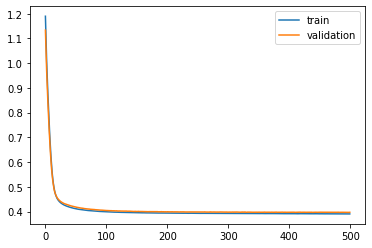

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 27s - loss: 1.1904 - val_loss: 1.1292

Epoch 00001: val_loss improved from inf to 1.12918, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0915 - val_loss: 1.0427

Epoch 00002: val_loss improved from 1.12918 to 1.04268, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.0097 - val_loss: 0.9696

Epoch 00003: val_loss improved from 1.04268 to 0.96961, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9402 - val_loss: 0.9050

Epoch 00004: val_loss improved from 0.96961 to 0.90502, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8780 - val_loss: 0.8450

Epoch 00005: val_loss improved from 0.90502 to 0.84499, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8200 - val_loss: 0.7877

Epoch 00006: val_loss improved from 0.84499 to 0.78768, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7652 - val_loss: 0.7340

Epoch 00007: val_loss improved from 0.78768

 - 1s - loss: 0.4090 - val_loss: 0.4059

Epoch 00058: val_loss improved from 0.40621 to 0.40595, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4086 - val_loss: 0.4059

Epoch 00059: val_loss improved from 0.40595 to 0.40587, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4082 - val_loss: 0.4053

Epoch 00060: val_loss improved from 0.40587 to 0.40535, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4080 - val_loss: 0.4049

Epoch 00061: val_loss improved from 0.40535 to 0.40488, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4075 - val_loss: 0.4049

Epoch 00062: val_loss improved from 0.40488 to 0.40488, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4073 - val_loss: 0.4045

Epoch 00063: val_loss improved from 0.40488 to 0.40446, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4069 - val_loss: 0.4043

Epoch 00064: val_loss improved from 0.40446 to 0.40433, saving model to val_weights2.hdf5
Epoch


Epoch 00123: val_loss improved from 0.39669 to 0.39661, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3975 - val_loss: 0.3968

Epoch 00124: val_loss did not improve from 0.39661
Epoch 125/500
 - 1s - loss: 0.3973 - val_loss: 0.3961

Epoch 00125: val_loss improved from 0.39661 to 0.39611, saving model to val_weights2.hdf5
Epoch 126/500
 - 1s - loss: 0.3973 - val_loss: 0.3966

Epoch 00126: val_loss did not improve from 0.39611
Epoch 127/500
 - 1s - loss: 0.3972 - val_loss: 0.3962

Epoch 00127: val_loss did not improve from 0.39611
Epoch 128/500
 - 1s - loss: 0.3971 - val_loss: 0.3966

Epoch 00128: val_loss did not improve from 0.39611
Epoch 129/500
 - 1s - loss: 0.3971 - val_loss: 0.3962

Epoch 00129: val_loss did not improve from 0.39611
Epoch 130/500
 - 1s - loss: 0.3971 - val_loss: 0.3962

Epoch 00130: val_loss did not improve from 0.39611
Epoch 131/500
 - 1s - loss: 0.3969 - val_loss: 0.3961

Epoch 00131: val_loss did not improve from 0.39611
Epoch 132/500
 - 1s - 

 - 1s - loss: 0.3947 - val_loss: 0.3937

Epoch 00193: val_loss did not improve from 0.39367
Epoch 194/500
 - 1s - loss: 0.3946 - val_loss: 0.3940

Epoch 00194: val_loss did not improve from 0.39367
Epoch 195/500
 - 1s - loss: 0.3947 - val_loss: 0.3937

Epoch 00195: val_loss did not improve from 0.39367
Epoch 196/500
 - 1s - loss: 0.3946 - val_loss: 0.3940

Epoch 00196: val_loss did not improve from 0.39367
Epoch 197/500
 - 1s - loss: 0.3946 - val_loss: 0.3937

Epoch 00197: val_loss improved from 0.39367 to 0.39365, saving model to val_weights2.hdf5
Epoch 198/500
 - 1s - loss: 0.3945 - val_loss: 0.3937

Epoch 00198: val_loss did not improve from 0.39365
Epoch 199/500
 - 1s - loss: 0.3945 - val_loss: 0.3936

Epoch 00199: val_loss improved from 0.39365 to 0.39360, saving model to val_weights2.hdf5
Epoch 200/500
 - 1s - loss: 0.3945 - val_loss: 0.3935

Epoch 00200: val_loss improved from 0.39360 to 0.39353, saving model to val_weights2.hdf5
Epoch 201/500
 - 1s - loss: 0.3945 - val_loss: 0.

 - 1s - loss: 0.3936 - val_loss: 0.3930

Epoch 00266: val_loss did not improve from 0.39232
Epoch 267/500
 - 1s - loss: 0.3935 - val_loss: 0.3929

Epoch 00267: val_loss did not improve from 0.39232
Epoch 268/500
 - 1s - loss: 0.3936 - val_loss: 0.3927

Epoch 00268: val_loss did not improve from 0.39232
Epoch 269/500
 - 1s - loss: 0.3936 - val_loss: 0.3928

Epoch 00269: val_loss did not improve from 0.39232
Epoch 270/500
 - 1s - loss: 0.3934 - val_loss: 0.3931

Epoch 00270: val_loss did not improve from 0.39232
Epoch 271/500
 - 1s - loss: 0.3934 - val_loss: 0.3929

Epoch 00271: val_loss did not improve from 0.39232
Epoch 272/500
 - 1s - loss: 0.3936 - val_loss: 0.3930

Epoch 00272: val_loss did not improve from 0.39232
Epoch 273/500
 - 1s - loss: 0.3934 - val_loss: 0.3926

Epoch 00273: val_loss did not improve from 0.39232
Epoch 274/500
 - 1s - loss: 0.3934 - val_loss: 0.3927

Epoch 00274: val_loss did not improve from 0.39232
Epoch 275/500
 - 1s - loss: 0.3935 - val_loss: 0.3925

Epoch

 - 1s - loss: 0.3928 - val_loss: 0.3927

Epoch 00342: val_loss did not improve from 0.39192
Epoch 343/500
 - 1s - loss: 0.3928 - val_loss: 0.3925

Epoch 00343: val_loss did not improve from 0.39192
Epoch 344/500
 - 1s - loss: 0.3929 - val_loss: 0.3923

Epoch 00344: val_loss did not improve from 0.39192
Epoch 345/500
 - 1s - loss: 0.3928 - val_loss: 0.3922

Epoch 00345: val_loss did not improve from 0.39192
Epoch 346/500
 - 1s - loss: 0.3927 - val_loss: 0.3922

Epoch 00346: val_loss did not improve from 0.39192
Epoch 347/500
 - 1s - loss: 0.3927 - val_loss: 0.3923

Epoch 00347: val_loss did not improve from 0.39192
Epoch 348/500
 - 1s - loss: 0.3927 - val_loss: 0.3923

Epoch 00348: val_loss did not improve from 0.39192
Epoch 349/500
 - 1s - loss: 0.3928 - val_loss: 0.3924

Epoch 00349: val_loss did not improve from 0.39192
Epoch 350/500
 - 1s - loss: 0.3928 - val_loss: 0.3924

Epoch 00350: val_loss did not improve from 0.39192
Epoch 351/500
 - 1s - loss: 0.3927 - val_loss: 0.3922

Epoch


Epoch 00419: val_loss did not improve from 0.39192
Epoch 420/500
 - 1s - loss: 0.3923 - val_loss: 0.3927

Epoch 00420: val_loss did not improve from 0.39192
Epoch 421/500
 - 1s - loss: 0.3922 - val_loss: 0.3926

Epoch 00421: val_loss did not improve from 0.39192
Epoch 422/500
 - 1s - loss: 0.3923 - val_loss: 0.3924

Epoch 00422: val_loss did not improve from 0.39192
Epoch 423/500
 - 1s - loss: 0.3921 - val_loss: 0.3922

Epoch 00423: val_loss did not improve from 0.39192
Epoch 424/500
 - 1s - loss: 0.3922 - val_loss: 0.3921

Epoch 00424: val_loss did not improve from 0.39192
Epoch 425/500
 - 1s - loss: 0.3922 - val_loss: 0.3925

Epoch 00425: val_loss did not improve from 0.39192
Epoch 426/500
 - 1s - loss: 0.3922 - val_loss: 0.3925

Epoch 00426: val_loss did not improve from 0.39192
Epoch 427/500
 - 1s - loss: 0.3922 - val_loss: 0.3921

Epoch 00427: val_loss did not improve from 0.39192
Epoch 428/500
 - 1s - loss: 0.3921 - val_loss: 0.3925

Epoch 00428: val_loss did not improve from 0.

 - 1s - loss: 0.3917 - val_loss: 0.3926

Epoch 00497: val_loss did not improve from 0.39192
Epoch 498/500
 - 1s - loss: 0.3918 - val_loss: 0.3930

Epoch 00498: val_loss did not improve from 0.39192
Epoch 499/500
 - 1s - loss: 0.3917 - val_loss: 0.3923

Epoch 00499: val_loss did not improve from 0.39192
Epoch 500/500
 - 1s - loss: 0.3916 - val_loss: 0.3925

Epoch 00500: val_loss did not improve from 0.39192
#################################
Number of units: 4
Batch size: 8192
Fold: 1
L2: 0.011012541013240673
best val loss: 0.39192313989003497
#################################


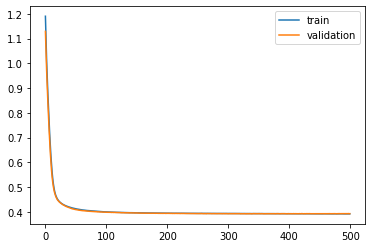

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 69s - loss: 1.1918 - val_loss: 1.1171

Epoch 00001: val_loss improved from inf to 1.11709, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0931 - val_loss: 1.0289

Epoch 00002: val_loss improved from 1.11709 to 1.02892, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.0114 - val_loss: 0.9554

Epoch 00003: val_loss improved from 1.02892 to 0.95536, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9419 - val_loss: 0.8917

Epoch 00004: val_loss improved from 0.95536 to 0.89170, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8795 - val_loss: 0.8332

Epoch 00005: val_loss improved from 0.89170 to 0.83324, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8214 - val_loss: 0.7783

Epoch 00006: val_loss improved from 0.83324 to 0.77828, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7662 - val_loss: 0.7274

Epoch 00007: val_loss improved from 0.77828

 - 1s - loss: 0.4083 - val_loss: 0.4156

Epoch 00058: val_loss did not improve from 0.41558
Epoch 59/500
 - 1s - loss: 0.4079 - val_loss: 0.4151

Epoch 00059: val_loss improved from 0.41558 to 0.41514, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4076 - val_loss: 0.4148

Epoch 00060: val_loss improved from 0.41514 to 0.41482, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4072 - val_loss: 0.4145

Epoch 00061: val_loss improved from 0.41482 to 0.41447, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4069 - val_loss: 0.4142

Epoch 00062: val_loss improved from 0.41447 to 0.41423, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4066 - val_loss: 0.4142

Epoch 00063: val_loss improved from 0.41423 to 0.41419, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4062 - val_loss: 0.4138

Epoch 00064: val_loss improved from 0.41419 to 0.41381, saving model to val_weights3.hdf5
Epoch 65/500
 - 1s - loss: 0.4060 - val_loss

 - 1s - loss: 0.3972 - val_loss: 0.4065

Epoch 00121: val_loss did not improve from 0.40639
Epoch 122/500
 - 1s - loss: 0.3970 - val_loss: 0.4062

Epoch 00122: val_loss improved from 0.40639 to 0.40621, saving model to val_weights3.hdf5
Epoch 123/500
 - 1s - loss: 0.3970 - val_loss: 0.4063

Epoch 00123: val_loss did not improve from 0.40621
Epoch 124/500
 - 1s - loss: 0.3968 - val_loss: 0.4060

Epoch 00124: val_loss improved from 0.40621 to 0.40598, saving model to val_weights3.hdf5
Epoch 125/500
 - 1s - loss: 0.3968 - val_loss: 0.4065

Epoch 00125: val_loss did not improve from 0.40598
Epoch 126/500
 - 1s - loss: 0.3968 - val_loss: 0.4062

Epoch 00126: val_loss did not improve from 0.40598
Epoch 127/500
 - 1s - loss: 0.3967 - val_loss: 0.4064

Epoch 00127: val_loss did not improve from 0.40598
Epoch 128/500
 - 1s - loss: 0.3966 - val_loss: 0.4061

Epoch 00128: val_loss did not improve from 0.40598
Epoch 129/500
 - 1s - loss: 0.3965 - val_loss: 0.4058

Epoch 00129: val_loss improved fr


Epoch 00190: val_loss did not improve from 0.40391
Epoch 191/500
 - 1s - loss: 0.3939 - val_loss: 0.4041

Epoch 00191: val_loss did not improve from 0.40391
Epoch 192/500
 - 1s - loss: 0.3938 - val_loss: 0.4042

Epoch 00192: val_loss did not improve from 0.40391
Epoch 193/500
 - 1s - loss: 0.3937 - val_loss: 0.4040

Epoch 00193: val_loss did not improve from 0.40391
Epoch 194/500
 - 1s - loss: 0.3937 - val_loss: 0.4041

Epoch 00194: val_loss did not improve from 0.40391
Epoch 195/500
 - 1s - loss: 0.3938 - val_loss: 0.4039

Epoch 00195: val_loss did not improve from 0.40391
Epoch 196/500
 - 1s - loss: 0.3938 - val_loss: 0.4039

Epoch 00196: val_loss did not improve from 0.40391
Epoch 197/500
 - 1s - loss: 0.3936 - val_loss: 0.4040

Epoch 00197: val_loss did not improve from 0.40391
Epoch 198/500
 - 1s - loss: 0.3936 - val_loss: 0.4039

Epoch 00198: val_loss did not improve from 0.40391
Epoch 199/500
 - 1s - loss: 0.3936 - val_loss: 0.4039

Epoch 00199: val_loss did not improve from 0.

 - 1s - loss: 0.3928 - val_loss: 0.4029

Epoch 00263: val_loss did not improve from 0.40273
Epoch 264/500
 - 1s - loss: 0.3927 - val_loss: 0.4031

Epoch 00264: val_loss did not improve from 0.40273
Epoch 265/500
 - 1s - loss: 0.3926 - val_loss: 0.4028

Epoch 00265: val_loss did not improve from 0.40273
Epoch 266/500
 - 1s - loss: 0.3926 - val_loss: 0.4031

Epoch 00266: val_loss did not improve from 0.40273
Epoch 267/500
 - 1s - loss: 0.3927 - val_loss: 0.4029

Epoch 00267: val_loss did not improve from 0.40273
Epoch 268/500
 - 1s - loss: 0.3926 - val_loss: 0.4025

Epoch 00268: val_loss improved from 0.40273 to 0.40252, saving model to val_weights3.hdf5
Epoch 269/500
 - 1s - loss: 0.3927 - val_loss: 0.4029

Epoch 00269: val_loss did not improve from 0.40252
Epoch 270/500
 - 1s - loss: 0.3927 - val_loss: 0.4029

Epoch 00270: val_loss did not improve from 0.40252
Epoch 271/500
 - 1s - loss: 0.3926 - val_loss: 0.4032

Epoch 00271: val_loss did not improve from 0.40252
Epoch 272/500
 - 1s -


Epoch 00338: val_loss improved from 0.40187 to 0.40176, saving model to val_weights3.hdf5
Epoch 339/500
 - 1s - loss: 0.3919 - val_loss: 0.4025

Epoch 00339: val_loss did not improve from 0.40176
Epoch 340/500
 - 1s - loss: 0.3917 - val_loss: 0.4021

Epoch 00340: val_loss did not improve from 0.40176
Epoch 341/500
 - 1s - loss: 0.3919 - val_loss: 0.4025

Epoch 00341: val_loss did not improve from 0.40176
Epoch 342/500
 - 1s - loss: 0.3919 - val_loss: 0.4021

Epoch 00342: val_loss did not improve from 0.40176
Epoch 343/500
 - 1s - loss: 0.3918 - val_loss: 0.4021

Epoch 00343: val_loss did not improve from 0.40176
Epoch 344/500
 - 1s - loss: 0.3917 - val_loss: 0.4022

Epoch 00344: val_loss did not improve from 0.40176
Epoch 345/500
 - 1s - loss: 0.3919 - val_loss: 0.4021

Epoch 00345: val_loss did not improve from 0.40176
Epoch 346/500
 - 1s - loss: 0.3918 - val_loss: 0.4018

Epoch 00346: val_loss did not improve from 0.40176
Epoch 347/500
 - 1s - loss: 0.3918 - val_loss: 0.4023

Epoch 

 - 1s - loss: 0.3914 - val_loss: 0.4017

Epoch 00413: val_loss did not improve from 0.40115
Epoch 414/500
 - 1s - loss: 0.3911 - val_loss: 0.4014

Epoch 00414: val_loss did not improve from 0.40115
Epoch 415/500
 - 1s - loss: 0.3912 - val_loss: 0.4016

Epoch 00415: val_loss did not improve from 0.40115
Epoch 416/500
 - 1s - loss: 0.3913 - val_loss: 0.4016

Epoch 00416: val_loss did not improve from 0.40115
Epoch 417/500
 - 1s - loss: 0.3913 - val_loss: 0.4017

Epoch 00417: val_loss did not improve from 0.40115
Epoch 418/500
 - 1s - loss: 0.3914 - val_loss: 0.4016

Epoch 00418: val_loss did not improve from 0.40115
Epoch 419/500
 - 1s - loss: 0.3913 - val_loss: 0.4012

Epoch 00419: val_loss did not improve from 0.40115
Epoch 420/500
 - 1s - loss: 0.3911 - val_loss: 0.4014

Epoch 00420: val_loss did not improve from 0.40115
Epoch 421/500
 - 1s - loss: 0.3910 - val_loss: 0.4016

Epoch 00421: val_loss did not improve from 0.40115
Epoch 422/500
 - 1s - loss: 0.3913 - val_loss: 0.4017

Epoch

 - 1s - loss: 0.3907 - val_loss: 0.4008

Epoch 00489: val_loss did not improve from 0.40075
Epoch 490/500
 - 1s - loss: 0.3906 - val_loss: 0.4009

Epoch 00490: val_loss did not improve from 0.40075
Epoch 491/500
 - 1s - loss: 0.3908 - val_loss: 0.4011

Epoch 00491: val_loss did not improve from 0.40075
Epoch 492/500
 - 1s - loss: 0.3906 - val_loss: 0.4010

Epoch 00492: val_loss did not improve from 0.40075
Epoch 493/500
 - 1s - loss: 0.3907 - val_loss: 0.4008

Epoch 00493: val_loss did not improve from 0.40075
Epoch 494/500
 - 1s - loss: 0.3905 - val_loss: 0.4012

Epoch 00494: val_loss did not improve from 0.40075
Epoch 495/500
 - 1s - loss: 0.3908 - val_loss: 0.4009

Epoch 00495: val_loss did not improve from 0.40075
Epoch 496/500
 - 1s - loss: 0.3906 - val_loss: 0.4012

Epoch 00496: val_loss did not improve from 0.40075
Epoch 497/500
 - 1s - loss: 0.3906 - val_loss: 0.4009

Epoch 00497: val_loss did not improve from 0.40075
Epoch 498/500
 - 1s - loss: 0.3906 - val_loss: 0.4015

Epoch

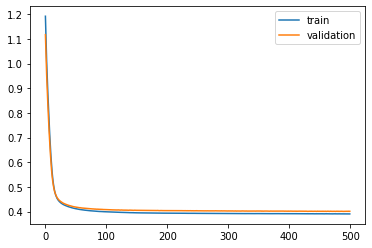

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 55s - loss: 1.1910 - val_loss: 1.1228

Epoch 00001: val_loss improved from inf to 1.12276, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0924 - val_loss: 1.0341

Epoch 00002: val_loss improved from 1.12276 to 1.03407, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.0108 - val_loss: 0.9604

Epoch 00003: val_loss improved from 1.03407 to 0.96035, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9413 - val_loss: 0.8957

Epoch 00004: val_loss improved from 0.96035 to 0.89571, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8789 - val_loss: 0.8359

Epoch 00005: val_loss improved from 0.89571 to 0.83591, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8207 - val_loss: 0.7794

Epoch 00006: val_loss improved from 0.83591 to 0.77939, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7659 - val_loss: 0.7263

Epoch 00007: val_loss improved from 0.77939

 - 1s - loss: 0.4092 - val_loss: 0.4082

Epoch 00058: val_loss improved from 0.40877 to 0.40816, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4089 - val_loss: 0.4077

Epoch 00059: val_loss improved from 0.40816 to 0.40771, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4085 - val_loss: 0.4075

Epoch 00060: val_loss improved from 0.40771 to 0.40745, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4082 - val_loss: 0.4070

Epoch 00061: val_loss improved from 0.40745 to 0.40696, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4078 - val_loss: 0.4069

Epoch 00062: val_loss improved from 0.40696 to 0.40688, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4075 - val_loss: 0.4065

Epoch 00063: val_loss improved from 0.40688 to 0.40650, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4072 - val_loss: 0.4061

Epoch 00064: val_loss improved from 0.40650 to 0.40610, saving model to val_weights4.hdf5
Epoch


Epoch 00121: val_loss did not improve from 0.39685
Epoch 122/500
 - 1s - loss: 0.3979 - val_loss: 0.3969

Epoch 00122: val_loss did not improve from 0.39685
Epoch 123/500
 - 1s - loss: 0.3978 - val_loss: 0.3967

Epoch 00123: val_loss improved from 0.39685 to 0.39668, saving model to val_weights4.hdf5
Epoch 124/500
 - 1s - loss: 0.3977 - val_loss: 0.3966

Epoch 00124: val_loss improved from 0.39668 to 0.39655, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3976 - val_loss: 0.3967

Epoch 00125: val_loss did not improve from 0.39655
Epoch 126/500
 - 1s - loss: 0.3975 - val_loss: 0.3965

Epoch 00126: val_loss improved from 0.39655 to 0.39646, saving model to val_weights4.hdf5
Epoch 127/500
 - 1s - loss: 0.3975 - val_loss: 0.3965

Epoch 00127: val_loss did not improve from 0.39646
Epoch 128/500
 - 1s - loss: 0.3973 - val_loss: 0.3962

Epoch 00128: val_loss improved from 0.39646 to 0.39624, saving model to val_weights4.hdf5
Epoch 129/500
 - 1s - loss: 0.3974 - val_loss: 0.3

 - 1s - loss: 0.3948 - val_loss: 0.3952

Epoch 00194: val_loss did not improve from 0.39481
Epoch 195/500
 - 1s - loss: 0.3950 - val_loss: 0.3953

Epoch 00195: val_loss did not improve from 0.39481
Epoch 196/500
 - 1s - loss: 0.3950 - val_loss: 0.3950

Epoch 00196: val_loss did not improve from 0.39481
Epoch 197/500
 - 1s - loss: 0.3949 - val_loss: 0.3952

Epoch 00197: val_loss did not improve from 0.39481
Epoch 198/500
 - 1s - loss: 0.3948 - val_loss: 0.3957

Epoch 00198: val_loss did not improve from 0.39481
Epoch 199/500
 - 1s - loss: 0.3950 - val_loss: 0.3949

Epoch 00199: val_loss did not improve from 0.39481
Epoch 200/500
 - 1s - loss: 0.3950 - val_loss: 0.3953

Epoch 00200: val_loss did not improve from 0.39481
Epoch 201/500
 - 1s - loss: 0.3948 - val_loss: 0.3950

Epoch 00201: val_loss did not improve from 0.39481
Epoch 202/500
 - 1s - loss: 0.3949 - val_loss: 0.3954

Epoch 00202: val_loss did not improve from 0.39481
Epoch 203/500
 - 1s - loss: 0.3950 - val_loss: 0.3948

Epoch


Epoch 00268: val_loss did not improve from 0.39382
Epoch 269/500
 - 1s - loss: 0.3939 - val_loss: 0.3941

Epoch 00269: val_loss did not improve from 0.39382
Epoch 270/500
 - 1s - loss: 0.3938 - val_loss: 0.3942

Epoch 00270: val_loss did not improve from 0.39382
Epoch 271/500
 - 1s - loss: 0.3938 - val_loss: 0.3938

Epoch 00271: val_loss did not improve from 0.39382
Epoch 272/500
 - 1s - loss: 0.3937 - val_loss: 0.3942

Epoch 00272: val_loss did not improve from 0.39382
Epoch 273/500
 - 1s - loss: 0.3937 - val_loss: 0.3941

Epoch 00273: val_loss did not improve from 0.39382
Epoch 274/500
 - 1s - loss: 0.3937 - val_loss: 0.3940

Epoch 00274: val_loss did not improve from 0.39382
Epoch 275/500
 - 1s - loss: 0.3937 - val_loss: 0.3941

Epoch 00275: val_loss did not improve from 0.39382
Epoch 276/500
 - 1s - loss: 0.3936 - val_loss: 0.3941

Epoch 00276: val_loss did not improve from 0.39382
Epoch 277/500
 - 1s - loss: 0.3936 - val_loss: 0.3943

Epoch 00277: val_loss did not improve from 0.

 - 1s - loss: 0.3930 - val_loss: 0.3936

Epoch 00344: val_loss did not improve from 0.39312
Epoch 345/500
 - 1s - loss: 0.3930 - val_loss: 0.3935

Epoch 00345: val_loss did not improve from 0.39312
Epoch 346/500
 - 1s - loss: 0.3930 - val_loss: 0.3933

Epoch 00346: val_loss did not improve from 0.39312
Epoch 347/500
 - 1s - loss: 0.3930 - val_loss: 0.3937

Epoch 00347: val_loss did not improve from 0.39312
Epoch 348/500
 - 1s - loss: 0.3931 - val_loss: 0.3939

Epoch 00348: val_loss did not improve from 0.39312
Epoch 349/500
 - 1s - loss: 0.3930 - val_loss: 0.3935

Epoch 00349: val_loss did not improve from 0.39312
Epoch 350/500
 - 1s - loss: 0.3931 - val_loss: 0.3938

Epoch 00350: val_loss did not improve from 0.39312
Epoch 351/500
 - 1s - loss: 0.3929 - val_loss: 0.3934

Epoch 00351: val_loss did not improve from 0.39312
Epoch 352/500
 - 1s - loss: 0.3930 - val_loss: 0.3937

Epoch 00352: val_loss did not improve from 0.39312
Epoch 353/500
 - 1s - loss: 0.3930 - val_loss: 0.3937

Epoch

 - 1s - loss: 0.3923 - val_loss: 0.3927

Epoch 00419: val_loss did not improve from 0.39260
Epoch 420/500
 - 1s - loss: 0.3923 - val_loss: 0.3932

Epoch 00420: val_loss did not improve from 0.39260
Epoch 421/500
 - 1s - loss: 0.3924 - val_loss: 0.3930

Epoch 00421: val_loss did not improve from 0.39260
Epoch 422/500
 - 1s - loss: 0.3922 - val_loss: 0.3931

Epoch 00422: val_loss did not improve from 0.39260
Epoch 423/500
 - 1s - loss: 0.3923 - val_loss: 0.3931

Epoch 00423: val_loss did not improve from 0.39260
Epoch 424/500
 - 1s - loss: 0.3923 - val_loss: 0.3933

Epoch 00424: val_loss did not improve from 0.39260
Epoch 425/500
 - 1s - loss: 0.3923 - val_loss: 0.3932

Epoch 00425: val_loss did not improve from 0.39260
Epoch 426/500
 - 1s - loss: 0.3923 - val_loss: 0.3932

Epoch 00426: val_loss did not improve from 0.39260
Epoch 427/500
 - 1s - loss: 0.3922 - val_loss: 0.3929

Epoch 00427: val_loss did not improve from 0.39260
Epoch 428/500
 - 1s - loss: 0.3922 - val_loss: 0.3932

Epoch

 - 1s - loss: 0.3917 - val_loss: 0.3928

Epoch 00496: val_loss did not improve from 0.39250
Epoch 497/500
 - 1s - loss: 0.3917 - val_loss: 0.3929

Epoch 00497: val_loss did not improve from 0.39250
Epoch 498/500
 - 1s - loss: 0.3919 - val_loss: 0.3929

Epoch 00498: val_loss did not improve from 0.39250
Epoch 499/500
 - 1s - loss: 0.3917 - val_loss: 0.3930

Epoch 00499: val_loss did not improve from 0.39250
Epoch 500/500
 - 1s - loss: 0.3918 - val_loss: 0.3926

Epoch 00500: val_loss did not improve from 0.39250
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.011012541013240673
best val loss: 0.392503053744634
#################################


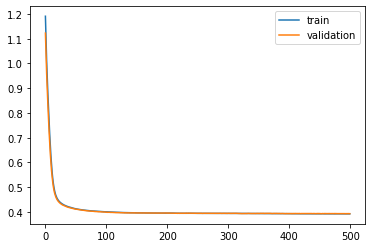

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 52s - loss: 1.1914 - val_loss: 1.1209

Epoch 00001: val_loss improved from inf to 1.12089, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0927 - val_loss: 1.0338

Epoch 00002: val_loss improved from 1.12089 to 1.03381, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0111 - val_loss: 0.9611

Epoch 00003: val_loss improved from 1.03381 to 0.96106, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9415 - val_loss: 0.8970

Epoch 00004: val_loss improved from 0.96106 to 0.89700, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8791 - val_loss: 0.8384

Epoch 00005: val_loss improved from 0.89700 to 0.83841, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8209 - val_loss: 0.7831

Epoch 00006: val_loss improved from 0.83841 to 0.78312, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7660 - val_loss: 0.7306

Epoch 00007: val_loss improved from 0.78312

 - 1s - loss: 0.4087 - val_loss: 0.4120

Epoch 00058: val_loss improved from 0.41238 to 0.41201, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4084 - val_loss: 0.4120

Epoch 00059: val_loss improved from 0.41201 to 0.41201, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4081 - val_loss: 0.4115

Epoch 00060: val_loss improved from 0.41201 to 0.41151, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4077 - val_loss: 0.4115

Epoch 00061: val_loss improved from 0.41151 to 0.41148, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4074 - val_loss: 0.4109

Epoch 00062: val_loss improved from 0.41148 to 0.41085, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4070 - val_loss: 0.4110

Epoch 00063: val_loss did not improve from 0.41085
Epoch 64/500
 - 1s - loss: 0.4067 - val_loss: 0.4104

Epoch 00064: val_loss improved from 0.41085 to 0.41038, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4064 - val_loss

 - 1s - loss: 0.3976 - val_loss: 0.4022

Epoch 00121: val_loss improved from 0.40236 to 0.40216, saving model to val_weights5.hdf5
Epoch 122/500
 - 1s - loss: 0.3976 - val_loss: 0.4022

Epoch 00122: val_loss did not improve from 0.40216
Epoch 123/500
 - 1s - loss: 0.3974 - val_loss: 0.4022

Epoch 00123: val_loss did not improve from 0.40216
Epoch 124/500
 - 1s - loss: 0.3974 - val_loss: 0.4020

Epoch 00124: val_loss improved from 0.40216 to 0.40200, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3973 - val_loss: 0.4021

Epoch 00125: val_loss did not improve from 0.40200
Epoch 126/500
 - 1s - loss: 0.3972 - val_loss: 0.4016

Epoch 00126: val_loss improved from 0.40200 to 0.40157, saving model to val_weights5.hdf5
Epoch 127/500
 - 1s - loss: 0.3971 - val_loss: 0.4017

Epoch 00127: val_loss did not improve from 0.40157
Epoch 128/500
 - 1s - loss: 0.3970 - val_loss: 0.4017

Epoch 00128: val_loss did not improve from 0.40157
Epoch 129/500
 - 1s - loss: 0.3971 - val_loss: 0.

 - 1s - loss: 0.3945 - val_loss: 0.3987

Epoch 00191: val_loss did not improve from 0.39856
Epoch 192/500
 - 1s - loss: 0.3944 - val_loss: 0.3986

Epoch 00192: val_loss did not improve from 0.39856
Epoch 193/500
 - 1s - loss: 0.3944 - val_loss: 0.3987

Epoch 00193: val_loss did not improve from 0.39856
Epoch 194/500
 - 1s - loss: 0.3943 - val_loss: 0.3986

Epoch 00194: val_loss did not improve from 0.39856
Epoch 195/500
 - 1s - loss: 0.3944 - val_loss: 0.3989

Epoch 00195: val_loss did not improve from 0.39856
Epoch 196/500
 - 1s - loss: 0.3943 - val_loss: 0.3985

Epoch 00196: val_loss improved from 0.39856 to 0.39849, saving model to val_weights5.hdf5
Epoch 197/500
 - 1s - loss: 0.3943 - val_loss: 0.3988

Epoch 00197: val_loss did not improve from 0.39849
Epoch 198/500
 - 1s - loss: 0.3941 - val_loss: 0.3986

Epoch 00198: val_loss did not improve from 0.39849
Epoch 199/500
 - 1s - loss: 0.3943 - val_loss: 0.3988

Epoch 00199: val_loss did not improve from 0.39849
Epoch 200/500
 - 1s -

 - 1s - loss: 0.3931 - val_loss: 0.3977

Epoch 00265: val_loss did not improve from 0.39760
Epoch 266/500
 - 1s - loss: 0.3930 - val_loss: 0.3978

Epoch 00266: val_loss did not improve from 0.39760
Epoch 267/500
 - 1s - loss: 0.3929 - val_loss: 0.3978

Epoch 00267: val_loss did not improve from 0.39760
Epoch 268/500
 - 1s - loss: 0.3930 - val_loss: 0.3978

Epoch 00268: val_loss did not improve from 0.39760
Epoch 269/500
 - 1s - loss: 0.3930 - val_loss: 0.3978

Epoch 00269: val_loss did not improve from 0.39760
Epoch 270/500
 - 1s - loss: 0.3930 - val_loss: 0.3978

Epoch 00270: val_loss did not improve from 0.39760
Epoch 271/500
 - 1s - loss: 0.3930 - val_loss: 0.3978

Epoch 00271: val_loss did not improve from 0.39760
Epoch 272/500
 - 1s - loss: 0.3930 - val_loss: 0.3978

Epoch 00272: val_loss did not improve from 0.39760
Epoch 273/500
 - 1s - loss: 0.3929 - val_loss: 0.3977

Epoch 00273: val_loss did not improve from 0.39760
Epoch 274/500
 - 1s - loss: 0.3930 - val_loss: 0.3977

Epoch

 - 1s - loss: 0.3923 - val_loss: 0.3977

Epoch 00342: val_loss did not improve from 0.39725
Epoch 343/500
 - 1s - loss: 0.3923 - val_loss: 0.3977

Epoch 00343: val_loss did not improve from 0.39725
Epoch 344/500
 - 1s - loss: 0.3923 - val_loss: 0.3974

Epoch 00344: val_loss did not improve from 0.39725
Epoch 345/500
 - 1s - loss: 0.3923 - val_loss: 0.3978

Epoch 00345: val_loss did not improve from 0.39725
Epoch 346/500
 - 1s - loss: 0.3922 - val_loss: 0.3976

Epoch 00346: val_loss did not improve from 0.39725
Epoch 347/500
 - 1s - loss: 0.3923 - val_loss: 0.3977

Epoch 00347: val_loss did not improve from 0.39725
Epoch 348/500
 - 1s - loss: 0.3923 - val_loss: 0.3978

Epoch 00348: val_loss did not improve from 0.39725
Epoch 349/500
 - 1s - loss: 0.3921 - val_loss: 0.3975

Epoch 00349: val_loss did not improve from 0.39725
Epoch 350/500
 - 1s - loss: 0.3923 - val_loss: 0.3975

Epoch 00350: val_loss did not improve from 0.39725
Epoch 351/500
 - 1s - loss: 0.3922 - val_loss: 0.3975

Epoch


Epoch 00419: val_loss did not improve from 0.39725
Epoch 420/500
 - 1s - loss: 0.3918 - val_loss: 0.3979

Epoch 00420: val_loss did not improve from 0.39725
Epoch 421/500
 - 1s - loss: 0.3919 - val_loss: 0.3979

Epoch 00421: val_loss did not improve from 0.39725
Epoch 422/500
 - 1s - loss: 0.3918 - val_loss: 0.3977

Epoch 00422: val_loss did not improve from 0.39725
Epoch 423/500
 - 1s - loss: 0.3917 - val_loss: 0.3981

Epoch 00423: val_loss did not improve from 0.39725
Epoch 424/500
 - 1s - loss: 0.3920 - val_loss: 0.3977

Epoch 00424: val_loss did not improve from 0.39725
Epoch 425/500
 - 1s - loss: 0.3919 - val_loss: 0.3979

Epoch 00425: val_loss did not improve from 0.39725
Epoch 426/500
 - 1s - loss: 0.3918 - val_loss: 0.3979

Epoch 00426: val_loss did not improve from 0.39725
Epoch 427/500
 - 1s - loss: 0.3919 - val_loss: 0.3976

Epoch 00427: val_loss did not improve from 0.39725
Epoch 428/500
 - 1s - loss: 0.3917 - val_loss: 0.3980

Epoch 00428: val_loss did not improve from 0.

 - 1s - loss: 0.3917 - val_loss: 0.3975

Epoch 00497: val_loss did not improve from 0.39725
Epoch 498/500
 - 1s - loss: 0.3915 - val_loss: 0.3981

Epoch 00498: val_loss did not improve from 0.39725
Epoch 499/500
 - 1s - loss: 0.3915 - val_loss: 0.3974

Epoch 00499: val_loss did not improve from 0.39725
Epoch 500/500
 - 1s - loss: 0.3915 - val_loss: 0.3976

Epoch 00500: val_loss did not improve from 0.39725
#################################
Number of units: 4
Batch size: 8192
Fold: 4
L2: 0.011012541013240673
best val loss: 0.39725025743908354
#################################
[[4, 8192, 0.007921656789898646, 0, 0.3964275896019406], [4, 8192, 0.007921656789898646, 1, 0.3918810964955224], [4, 8192, 0.007921656789898646, 2, 0.40050656101438736], [4, 8192, 0.007921656789898646, 3, 0.3915418761041429], [4, 8192, 0.007921656789898646, 4, 0.3962737381988102], [4, 8192, 0.010351554082642968, 0, 0.39633653055297], [4, 8192, 0.010351554082642968, 1, 0.3915295256773631], [4, 8192, 0.01035155408264

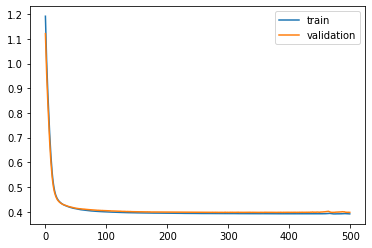

Time to train LSTM:  411.01674938201904
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 40s - loss: 1.1400 - val_loss: 1.0877

Epoch 00001: val_loss improved from inf to 1.08770, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0480 - val_loss: 1.0049

Epoch 00002: val_loss improved from 1.08770 to 1.00488, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9730 - val_loss: 0.9363

Epoch 00003: val_loss improved from 1.00488 to 0.93634, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9096 - val_loss: 0.8772

Epoch 00004: val_loss improved from 0.93634 to 0.87719, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8526 - val_loss: 0.8225

Epoch 00005: val_loss improved from 0.87719 to 0.82252, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.7992 - val_loss: 0.7712

Epoch 00006: val_loss improved from 0.82252 to 0.77119, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7482 - val_loss: 0.7223

Epo


Epoch 00057: val_loss improved from 0.41598 to 0.41526, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4080 - val_loss: 0.4150

Epoch 00058: val_loss improved from 0.41526 to 0.41501, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4076 - val_loss: 0.4146

Epoch 00059: val_loss improved from 0.41501 to 0.41458, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4074 - val_loss: 0.4141

Epoch 00060: val_loss improved from 0.41458 to 0.41406, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4070 - val_loss: 0.4138

Epoch 00061: val_loss improved from 0.41406 to 0.41376, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4066 - val_loss: 0.4134

Epoch 00062: val_loss improved from 0.41376 to 0.41341, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4063 - val_loss: 0.4130

Epoch 00063: val_loss improved from 0.41341 to 0.41300, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4060 - val_loss:

 - 1s - loss: 0.3972 - val_loss: 0.4025

Epoch 00119: val_loss improved from 0.40276 to 0.40255, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.3969 - val_loss: 0.4025

Epoch 00120: val_loss improved from 0.40255 to 0.40255, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.3970 - val_loss: 0.4026

Epoch 00121: val_loss did not improve from 0.40255
Epoch 122/500
 - 1s - loss: 0.3969 - val_loss: 0.4022

Epoch 00122: val_loss improved from 0.40255 to 0.40216, saving model to val_weights1.hdf5
Epoch 123/500
 - 1s - loss: 0.3968 - val_loss: 0.4026

Epoch 00123: val_loss did not improve from 0.40216
Epoch 124/500
 - 1s - loss: 0.3967 - val_loss: 0.4024

Epoch 00124: val_loss did not improve from 0.40216
Epoch 125/500
 - 1s - loss: 0.3966 - val_loss: 0.4025

Epoch 00125: val_loss did not improve from 0.40216
Epoch 126/500
 - 1s - loss: 0.3966 - val_loss: 0.4018

Epoch 00126: val_loss improved from 0.40216 to 0.40182, saving model to val_weights1.hdf5
Epoch 127/


Epoch 00187: val_loss improved from 0.39943 to 0.39928, saving model to val_weights1.hdf5
Epoch 188/500
 - 1s - loss: 0.3936 - val_loss: 0.3992

Epoch 00188: val_loss improved from 0.39928 to 0.39923, saving model to val_weights1.hdf5
Epoch 189/500
 - 1s - loss: 0.3936 - val_loss: 0.3994

Epoch 00189: val_loss did not improve from 0.39923
Epoch 190/500
 - 1s - loss: 0.3937 - val_loss: 0.3994

Epoch 00190: val_loss did not improve from 0.39923
Epoch 191/500
 - 1s - loss: 0.3937 - val_loss: 0.3993

Epoch 00191: val_loss did not improve from 0.39923
Epoch 192/500
 - 1s - loss: 0.3935 - val_loss: 0.3994

Epoch 00192: val_loss did not improve from 0.39923
Epoch 193/500
 - 1s - loss: 0.3934 - val_loss: 0.3992

Epoch 00193: val_loss improved from 0.39923 to 0.39922, saving model to val_weights1.hdf5
Epoch 194/500
 - 1s - loss: 0.3934 - val_loss: 0.3991

Epoch 00194: val_loss improved from 0.39922 to 0.39909, saving model to val_weights1.hdf5
Epoch 195/500
 - 1s - loss: 0.3934 - val_loss: 0.3

 - 1s - loss: 0.3925 - val_loss: 0.3985

Epoch 00259: val_loss did not improve from 0.39794
Epoch 260/500
 - 1s - loss: 0.3925 - val_loss: 0.3982

Epoch 00260: val_loss did not improve from 0.39794
Epoch 261/500
 - 1s - loss: 0.3924 - val_loss: 0.3983

Epoch 00261: val_loss did not improve from 0.39794
Epoch 262/500
 - 1s - loss: 0.3925 - val_loss: 0.3983

Epoch 00262: val_loss did not improve from 0.39794
Epoch 263/500
 - 1s - loss: 0.3925 - val_loss: 0.3979

Epoch 00263: val_loss improved from 0.39794 to 0.39794, saving model to val_weights1.hdf5
Epoch 264/500
 - 1s - loss: 0.3924 - val_loss: 0.3983

Epoch 00264: val_loss did not improve from 0.39794
Epoch 265/500
 - 1s - loss: 0.3923 - val_loss: 0.3980

Epoch 00265: val_loss did not improve from 0.39794
Epoch 266/500
 - 1s - loss: 0.3924 - val_loss: 0.3980

Epoch 00266: val_loss did not improve from 0.39794
Epoch 267/500
 - 1s - loss: 0.3924 - val_loss: 0.3978

Epoch 00267: val_loss improved from 0.39794 to 0.39779, saving model to 


Epoch 00333: val_loss did not improve from 0.39722
Epoch 334/500
 - 1s - loss: 0.3918 - val_loss: 0.3977

Epoch 00334: val_loss did not improve from 0.39722
Epoch 335/500
 - 1s - loss: 0.3918 - val_loss: 0.3977

Epoch 00335: val_loss did not improve from 0.39722
Epoch 336/500
 - 1s - loss: 0.3917 - val_loss: 0.3975

Epoch 00336: val_loss did not improve from 0.39722
Epoch 337/500
 - 1s - loss: 0.3917 - val_loss: 0.3973

Epoch 00337: val_loss did not improve from 0.39722
Epoch 338/500
 - 1s - loss: 0.3917 - val_loss: 0.3974

Epoch 00338: val_loss did not improve from 0.39722
Epoch 339/500
 - 1s - loss: 0.3919 - val_loss: 0.3973

Epoch 00339: val_loss did not improve from 0.39722
Epoch 340/500
 - 1s - loss: 0.3918 - val_loss: 0.3977

Epoch 00340: val_loss did not improve from 0.39722
Epoch 341/500
 - 1s - loss: 0.3918 - val_loss: 0.3977

Epoch 00341: val_loss did not improve from 0.39722
Epoch 342/500
 - 1s - loss: 0.3917 - val_loss: 0.3975

Epoch 00342: val_loss did not improve from 0.

 - 1s - loss: 0.3911 - val_loss: 0.3975

Epoch 00410: val_loss did not improve from 0.39712
Epoch 411/500
 - 1s - loss: 0.3911 - val_loss: 0.3978

Epoch 00411: val_loss did not improve from 0.39712
Epoch 412/500
 - 1s - loss: 0.3910 - val_loss: 0.3973

Epoch 00412: val_loss did not improve from 0.39712
Epoch 413/500
 - 1s - loss: 0.3909 - val_loss: 0.3974

Epoch 00413: val_loss did not improve from 0.39712
Epoch 414/500
 - 1s - loss: 0.3910 - val_loss: 0.3971

Epoch 00414: val_loss improved from 0.39712 to 0.39710, saving model to val_weights1.hdf5
Epoch 415/500
 - 1s - loss: 0.3909 - val_loss: 0.3973

Epoch 00415: val_loss did not improve from 0.39710
Epoch 416/500
 - 1s - loss: 0.3909 - val_loss: 0.3971

Epoch 00416: val_loss did not improve from 0.39710
Epoch 417/500
 - 1s - loss: 0.3909 - val_loss: 0.3975

Epoch 00417: val_loss did not improve from 0.39710
Epoch 418/500
 - 1s - loss: 0.3909 - val_loss: 0.3977

Epoch 00418: val_loss did not improve from 0.39710
Epoch 419/500
 - 1s -

 - 1s - loss: 0.3903 - val_loss: 0.3970

Epoch 00486: val_loss improved from 0.39699 to 0.39696, saving model to val_weights1.hdf5
Epoch 487/500
 - 1s - loss: 0.3903 - val_loss: 0.3970

Epoch 00487: val_loss did not improve from 0.39696
Epoch 488/500
 - 1s - loss: 0.3903 - val_loss: 0.3971

Epoch 00488: val_loss did not improve from 0.39696
Epoch 489/500
 - 1s - loss: 0.3903 - val_loss: 0.3972

Epoch 00489: val_loss did not improve from 0.39696
Epoch 490/500
 - 1s - loss: 0.3902 - val_loss: 0.3973

Epoch 00490: val_loss did not improve from 0.39696
Epoch 491/500
 - 1s - loss: 0.3903 - val_loss: 0.3973

Epoch 00491: val_loss did not improve from 0.39696
Epoch 492/500
 - 1s - loss: 0.3903 - val_loss: 0.3970

Epoch 00492: val_loss did not improve from 0.39696
Epoch 493/500
 - 1s - loss: 0.3904 - val_loss: 0.3969

Epoch 00493: val_loss improved from 0.39696 to 0.39694, saving model to val_weights1.hdf5
Epoch 494/500
 - 1s - loss: 0.3904 - val_loss: 0.3974

Epoch 00494: val_loss did not imp

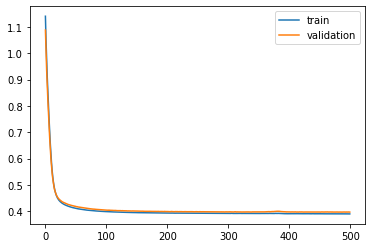

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 55s - loss: 1.1407 - val_loss: 1.0833

Epoch 00001: val_loss improved from inf to 1.08330, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0485 - val_loss: 1.0034

Epoch 00002: val_loss improved from 1.08330 to 1.00342, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9732 - val_loss: 0.9364

Epoch 00003: val_loss improved from 1.00342 to 0.93643, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9095 - val_loss: 0.8772

Epoch 00004: val_loss improved from 0.93643 to 0.87723, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8523 - val_loss: 0.8219

Epoch 00005: val_loss improved from 0.87723 to 0.82190, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.7989 - val_loss: 0.7689

Epoch 00006: val_loss improved from 0.82190 to 0.76895, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7482 - val_loss: 0.7191

Epoch 00007: val_loss improved from 0.76895

 - 1s - loss: 0.4086 - val_loss: 0.4062

Epoch 00058: val_loss improved from 0.40641 to 0.40624, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4082 - val_loss: 0.4057

Epoch 00059: val_loss improved from 0.40624 to 0.40572, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4079 - val_loss: 0.4051

Epoch 00060: val_loss improved from 0.40572 to 0.40514, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4074 - val_loss: 0.4051

Epoch 00061: val_loss improved from 0.40514 to 0.40508, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4071 - val_loss: 0.4045

Epoch 00062: val_loss improved from 0.40508 to 0.40447, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4068 - val_loss: 0.4045

Epoch 00063: val_loss did not improve from 0.40447
Epoch 64/500
 - 1s - loss: 0.4065 - val_loss: 0.4040

Epoch 00064: val_loss improved from 0.40447 to 0.40400, saving model to val_weights2.hdf5
Epoch 65/500
 - 1s - loss: 0.4061 - val_loss

 - 1s - loss: 0.3974 - val_loss: 0.3967

Epoch 00122: val_loss improved from 0.39689 to 0.39674, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3974 - val_loss: 0.3964

Epoch 00123: val_loss improved from 0.39674 to 0.39640, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3974 - val_loss: 0.3965

Epoch 00124: val_loss did not improve from 0.39640
Epoch 125/500
 - 1s - loss: 0.3972 - val_loss: 0.3966

Epoch 00125: val_loss did not improve from 0.39640
Epoch 126/500
 - 1s - loss: 0.3972 - val_loss: 0.3961

Epoch 00126: val_loss improved from 0.39640 to 0.39614, saving model to val_weights2.hdf5
Epoch 127/500
 - 1s - loss: 0.3970 - val_loss: 0.3963

Epoch 00127: val_loss did not improve from 0.39614
Epoch 128/500
 - 1s - loss: 0.3971 - val_loss: 0.3962

Epoch 00128: val_loss did not improve from 0.39614
Epoch 129/500
 - 1s - loss: 0.3968 - val_loss: 0.3962

Epoch 00129: val_loss did not improve from 0.39614
Epoch 130/500
 - 1s - loss: 0.3968 - val_loss: 0.

 - 1s - loss: 0.3943 - val_loss: 0.3937

Epoch 00190: val_loss did not improve from 0.39324
Epoch 191/500
 - 1s - loss: 0.3942 - val_loss: 0.3935

Epoch 00191: val_loss did not improve from 0.39324
Epoch 192/500
 - 1s - loss: 0.3940 - val_loss: 0.3938

Epoch 00192: val_loss did not improve from 0.39324
Epoch 193/500
 - 1s - loss: 0.3941 - val_loss: 0.3934

Epoch 00193: val_loss did not improve from 0.39324
Epoch 194/500
 - 1s - loss: 0.3940 - val_loss: 0.3935

Epoch 00194: val_loss did not improve from 0.39324
Epoch 195/500
 - 1s - loss: 0.3940 - val_loss: 0.3935

Epoch 00195: val_loss did not improve from 0.39324
Epoch 196/500
 - 1s - loss: 0.3940 - val_loss: 0.3936

Epoch 00196: val_loss did not improve from 0.39324
Epoch 197/500
 - 1s - loss: 0.3939 - val_loss: 0.3935

Epoch 00197: val_loss did not improve from 0.39324
Epoch 198/500
 - 1s - loss: 0.3940 - val_loss: 0.3935

Epoch 00198: val_loss did not improve from 0.39324
Epoch 199/500
 - 1s - loss: 0.3941 - val_loss: 0.3933

Epoch


Epoch 00263: val_loss did not improve from 0.39231
Epoch 264/500
 - 1s - loss: 0.3930 - val_loss: 0.3924

Epoch 00264: val_loss did not improve from 0.39231
Epoch 265/500
 - 1s - loss: 0.3930 - val_loss: 0.3926

Epoch 00265: val_loss did not improve from 0.39231
Epoch 266/500
 - 1s - loss: 0.3931 - val_loss: 0.3925

Epoch 00266: val_loss did not improve from 0.39231
Epoch 267/500
 - 1s - loss: 0.3930 - val_loss: 0.3924

Epoch 00267: val_loss did not improve from 0.39231
Epoch 268/500
 - 1s - loss: 0.3930 - val_loss: 0.3924

Epoch 00268: val_loss did not improve from 0.39231
Epoch 269/500
 - 1s - loss: 0.3929 - val_loss: 0.3924

Epoch 00269: val_loss did not improve from 0.39231
Epoch 270/500
 - 1s - loss: 0.3929 - val_loss: 0.3923

Epoch 00270: val_loss improved from 0.39231 to 0.39231, saving model to val_weights2.hdf5
Epoch 271/500
 - 1s - loss: 0.3929 - val_loss: 0.3923

Epoch 00271: val_loss did not improve from 0.39231
Epoch 272/500
 - 1s - loss: 0.3929 - val_loss: 0.3922

Epoch 

 - 1s - loss: 0.3922 - val_loss: 0.3921

Epoch 00339: val_loss did not improve from 0.39182
Epoch 340/500
 - 1s - loss: 0.3921 - val_loss: 0.3921

Epoch 00340: val_loss did not improve from 0.39182
Epoch 341/500
 - 1s - loss: 0.3920 - val_loss: 0.3922

Epoch 00341: val_loss did not improve from 0.39182
Epoch 342/500
 - 1s - loss: 0.3921 - val_loss: 0.3922

Epoch 00342: val_loss did not improve from 0.39182
Epoch 343/500
 - 1s - loss: 0.3923 - val_loss: 0.3918

Epoch 00343: val_loss did not improve from 0.39182
Epoch 344/500
 - 1s - loss: 0.3919 - val_loss: 0.3921

Epoch 00344: val_loss did not improve from 0.39182
Epoch 345/500
 - 1s - loss: 0.3920 - val_loss: 0.3923

Epoch 00345: val_loss did not improve from 0.39182
Epoch 346/500
 - 1s - loss: 0.3921 - val_loss: 0.3922

Epoch 00346: val_loss did not improve from 0.39182
Epoch 347/500
 - 1s - loss: 0.3920 - val_loss: 0.3921

Epoch 00347: val_loss did not improve from 0.39182
Epoch 348/500
 - 1s - loss: 0.3920 - val_loss: 0.3921

Epoch


Epoch 00416: val_loss did not improve from 0.39182
Epoch 417/500
 - 1s - loss: 0.3913 - val_loss: 0.3922

Epoch 00417: val_loss did not improve from 0.39182
Epoch 418/500
 - 1s - loss: 0.3913 - val_loss: 0.3926

Epoch 00418: val_loss did not improve from 0.39182
Epoch 419/500
 - 1s - loss: 0.3914 - val_loss: 0.3923

Epoch 00419: val_loss did not improve from 0.39182
Epoch 420/500
 - 1s - loss: 0.3913 - val_loss: 0.3925

Epoch 00420: val_loss did not improve from 0.39182
Epoch 421/500
 - 1s - loss: 0.3914 - val_loss: 0.3924

Epoch 00421: val_loss did not improve from 0.39182
Epoch 422/500
 - 1s - loss: 0.3913 - val_loss: 0.3925

Epoch 00422: val_loss did not improve from 0.39182
Epoch 423/500
 - 1s - loss: 0.3914 - val_loss: 0.3925

Epoch 00423: val_loss did not improve from 0.39182
Epoch 424/500
 - 1s - loss: 0.3913 - val_loss: 0.3927

Epoch 00424: val_loss did not improve from 0.39182
Epoch 425/500
 - 1s - loss: 0.3913 - val_loss: 0.3924

Epoch 00425: val_loss did not improve from 0.

 - 1s - loss: 0.3906 - val_loss: 0.3924

Epoch 00494: val_loss did not improve from 0.39182
Epoch 495/500
 - 1s - loss: 0.3907 - val_loss: 0.3923

Epoch 00495: val_loss did not improve from 0.39182
Epoch 496/500
 - 1s - loss: 0.3908 - val_loss: 0.3923

Epoch 00496: val_loss did not improve from 0.39182
Epoch 497/500
 - 1s - loss: 0.3907 - val_loss: 0.3922

Epoch 00497: val_loss did not improve from 0.39182
Epoch 498/500
 - 1s - loss: 0.3907 - val_loss: 0.3923

Epoch 00498: val_loss did not improve from 0.39182
Epoch 499/500
 - 1s - loss: 0.3908 - val_loss: 0.3924

Epoch 00499: val_loss did not improve from 0.39182
Epoch 500/500
 - 1s - loss: 0.3909 - val_loss: 0.3922

Epoch 00500: val_loss did not improve from 0.39182
#################################
Number of units: 4
Batch size: 8192
Fold: 1
L2: 0.009237955848303489
best val loss: 0.3918172685835097
#################################


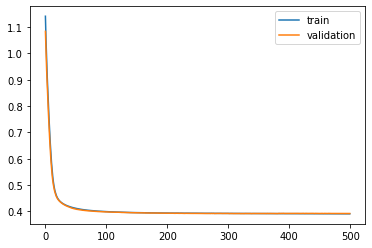

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 38s - loss: 1.1421 - val_loss: 1.0712

Epoch 00001: val_loss improved from inf to 1.07122, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0502 - val_loss: 0.9897

Epoch 00002: val_loss improved from 1.07122 to 0.98974, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9749 - val_loss: 0.9224

Epoch 00003: val_loss improved from 0.98974 to 0.92243, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9112 - val_loss: 0.8642

Epoch 00004: val_loss improved from 0.92243 to 0.86422, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8540 - val_loss: 0.8106

Epoch 00005: val_loss improved from 0.86422 to 0.81060, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8004 - val_loss: 0.7599

Epoch 00006: val_loss improved from 0.81060 to 0.75993, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7494 - val_loss: 0.7129

Epoch 00007: val_loss improved from 0.75993

 - 1s - loss: 0.4081 - val_loss: 0.4155

Epoch 00058: val_loss improved from 0.41574 to 0.41547, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4077 - val_loss: 0.4150

Epoch 00059: val_loss improved from 0.41547 to 0.41498, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4073 - val_loss: 0.4147

Epoch 00060: val_loss improved from 0.41498 to 0.41470, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4068 - val_loss: 0.4145

Epoch 00061: val_loss improved from 0.41470 to 0.41453, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4066 - val_loss: 0.4142

Epoch 00062: val_loss improved from 0.41453 to 0.41422, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4061 - val_loss: 0.4138

Epoch 00063: val_loss improved from 0.41422 to 0.41377, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4058 - val_loss: 0.4138

Epoch 00064: val_loss improved from 0.41377 to 0.41376, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.3966 - val_loss: 0.4065

Epoch 00121: val_loss did not improve from 0.40626
Epoch 122/500
 - 1s - loss: 0.3965 - val_loss: 0.4061

Epoch 00122: val_loss improved from 0.40626 to 0.40607, saving model to val_weights3.hdf5
Epoch 123/500
 - 1s - loss: 0.3964 - val_loss: 0.4063

Epoch 00123: val_loss did not improve from 0.40607
Epoch 124/500
 - 1s - loss: 0.3964 - val_loss: 0.4062

Epoch 00124: val_loss did not improve from 0.40607
Epoch 125/500
 - 1s - loss: 0.3963 - val_loss: 0.4062

Epoch 00125: val_loss did not improve from 0.40607
Epoch 126/500
 - 1s - loss: 0.3962 - val_loss: 0.4061

Epoch 00126: val_loss did not improve from 0.40607
Epoch 127/500
 - 1s - loss: 0.3961 - val_loss: 0.4059

Epoch 00127: val_loss improved from 0.40607 to 0.40594, saving model to val_weights3.hdf5
Epoch 128/500
 - 1s - loss: 0.3960 - val_loss: 0.4059

Epoch 00128: val_loss improved from 0.40594 to 0.40587, saving model to val_weights3.hdf5
Epoch 129/500
 - 1s - loss: 0.3960 - val_loss: 0.

 - 1s - loss: 0.3934 - val_loss: 0.4039

Epoch 00188: val_loss did not improve from 0.40342
Epoch 189/500
 - 1s - loss: 0.3933 - val_loss: 0.4037

Epoch 00189: val_loss did not improve from 0.40342
Epoch 190/500
 - 1s - loss: 0.3932 - val_loss: 0.4039

Epoch 00190: val_loss did not improve from 0.40342
Epoch 191/500
 - 1s - loss: 0.3932 - val_loss: 0.4035

Epoch 00191: val_loss did not improve from 0.40342
Epoch 192/500
 - 1s - loss: 0.3933 - val_loss: 0.4038

Epoch 00192: val_loss did not improve from 0.40342
Epoch 193/500
 - 1s - loss: 0.3931 - val_loss: 0.4035

Epoch 00193: val_loss did not improve from 0.40342
Epoch 194/500
 - 1s - loss: 0.3933 - val_loss: 0.4039

Epoch 00194: val_loss did not improve from 0.40342
Epoch 195/500
 - 1s - loss: 0.3932 - val_loss: 0.4036

Epoch 00195: val_loss did not improve from 0.40342
Epoch 196/500
 - 1s - loss: 0.3932 - val_loss: 0.4036

Epoch 00196: val_loss did not improve from 0.40342
Epoch 197/500
 - 1s - loss: 0.3930 - val_loss: 0.4033

Epoch

 - 1s - loss: 0.3923 - val_loss: 0.4026

Epoch 00262: val_loss did not improve from 0.40247
Epoch 263/500
 - 1s - loss: 0.3921 - val_loss: 0.4030

Epoch 00263: val_loss did not improve from 0.40247
Epoch 264/500
 - 1s - loss: 0.3922 - val_loss: 0.4025

Epoch 00264: val_loss improved from 0.40247 to 0.40246, saving model to val_weights3.hdf5
Epoch 265/500
 - 1s - loss: 0.3921 - val_loss: 0.4027

Epoch 00265: val_loss did not improve from 0.40246
Epoch 266/500
 - 1s - loss: 0.3922 - val_loss: 0.4026

Epoch 00266: val_loss did not improve from 0.40246
Epoch 267/500
 - 1s - loss: 0.3921 - val_loss: 0.4027

Epoch 00267: val_loss did not improve from 0.40246
Epoch 268/500
 - 1s - loss: 0.3922 - val_loss: 0.4025

Epoch 00268: val_loss did not improve from 0.40246
Epoch 269/500
 - 1s - loss: 0.3922 - val_loss: 0.4027

Epoch 00269: val_loss did not improve from 0.40246
Epoch 270/500
 - 1s - loss: 0.3921 - val_loss: 0.4027

Epoch 00270: val_loss did not improve from 0.40246
Epoch 271/500
 - 1s -

 - 1s - loss: 0.3914 - val_loss: 0.4018

Epoch 00336: val_loss did not improve from 0.40154
Epoch 337/500
 - 1s - loss: 0.3913 - val_loss: 0.4021

Epoch 00337: val_loss did not improve from 0.40154
Epoch 338/500
 - 1s - loss: 0.3912 - val_loss: 0.4016

Epoch 00338: val_loss did not improve from 0.40154
Epoch 339/500
 - 1s - loss: 0.3912 - val_loss: 0.4020

Epoch 00339: val_loss did not improve from 0.40154
Epoch 340/500
 - 1s - loss: 0.3913 - val_loss: 0.4020

Epoch 00340: val_loss did not improve from 0.40154
Epoch 341/500
 - 1s - loss: 0.3913 - val_loss: 0.4017

Epoch 00341: val_loss did not improve from 0.40154
Epoch 342/500
 - 1s - loss: 0.3913 - val_loss: 0.4018

Epoch 00342: val_loss did not improve from 0.40154
Epoch 343/500
 - 1s - loss: 0.3912 - val_loss: 0.4017

Epoch 00343: val_loss did not improve from 0.40154
Epoch 344/500
 - 1s - loss: 0.3913 - val_loss: 0.4019

Epoch 00344: val_loss did not improve from 0.40154
Epoch 345/500
 - 1s - loss: 0.3913 - val_loss: 0.4019

Epoch

 - 1s - loss: 0.3908 - val_loss: 0.4012

Epoch 00412: val_loss did not improve from 0.40104
Epoch 413/500
 - 1s - loss: 0.3906 - val_loss: 0.4015

Epoch 00413: val_loss did not improve from 0.40104
Epoch 414/500
 - 1s - loss: 0.3907 - val_loss: 0.4012

Epoch 00414: val_loss did not improve from 0.40104
Epoch 415/500
 - 1s - loss: 0.3906 - val_loss: 0.4014

Epoch 00415: val_loss did not improve from 0.40104
Epoch 416/500
 - 1s - loss: 0.3907 - val_loss: 0.4013

Epoch 00416: val_loss did not improve from 0.40104
Epoch 417/500
 - 1s - loss: 0.3907 - val_loss: 0.4013

Epoch 00417: val_loss did not improve from 0.40104
Epoch 418/500
 - 1s - loss: 0.3906 - val_loss: 0.4010

Epoch 00418: val_loss improved from 0.40104 to 0.40100, saving model to val_weights3.hdf5
Epoch 419/500
 - 1s - loss: 0.3906 - val_loss: 0.4011

Epoch 00419: val_loss did not improve from 0.40100
Epoch 420/500
 - 1s - loss: 0.3908 - val_loss: 0.4016

Epoch 00420: val_loss did not improve from 0.40100
Epoch 421/500
 - 1s -

 - 1s - loss: 0.3901 - val_loss: 0.4008

Epoch 00487: val_loss did not improve from 0.40055
Epoch 488/500
 - 1s - loss: 0.3900 - val_loss: 0.4009

Epoch 00488: val_loss did not improve from 0.40055
Epoch 489/500
 - 1s - loss: 0.3899 - val_loss: 0.4006

Epoch 00489: val_loss did not improve from 0.40055
Epoch 490/500
 - 1s - loss: 0.3900 - val_loss: 0.4011

Epoch 00490: val_loss did not improve from 0.40055
Epoch 491/500
 - 1s - loss: 0.3899 - val_loss: 0.4010

Epoch 00491: val_loss did not improve from 0.40055
Epoch 492/500
 - 1s - loss: 0.3900 - val_loss: 0.4011

Epoch 00492: val_loss did not improve from 0.40055
Epoch 493/500
 - 1s - loss: 0.3900 - val_loss: 0.4010

Epoch 00493: val_loss did not improve from 0.40055
Epoch 494/500
 - 1s - loss: 0.3901 - val_loss: 0.4006

Epoch 00494: val_loss did not improve from 0.40055
Epoch 495/500
 - 1s - loss: 0.3899 - val_loss: 0.4011

Epoch 00495: val_loss did not improve from 0.40055
Epoch 496/500
 - 1s - loss: 0.3899 - val_loss: 0.4006

Epoch

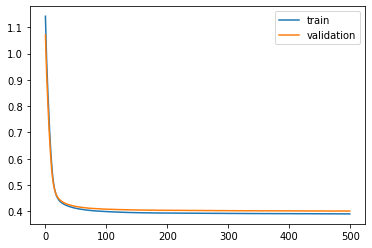

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 31s - loss: 1.1413 - val_loss: 1.0769

Epoch 00001: val_loss improved from inf to 1.07688, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0495 - val_loss: 0.9949

Epoch 00002: val_loss improved from 1.07688 to 0.99491, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9744 - val_loss: 0.9274

Epoch 00003: val_loss improved from 0.99491 to 0.92743, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9107 - val_loss: 0.8683

Epoch 00004: val_loss improved from 0.92743 to 0.86829, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8535 - val_loss: 0.8132

Epoch 00005: val_loss improved from 0.86829 to 0.81324, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8000 - val_loss: 0.7610

Epoch 00006: val_loss improved from 0.81324 to 0.76102, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7493 - val_loss: 0.7118

Epoch 00007: val_loss improved from 0.76102

 - 1s - loss: 0.4088 - val_loss: 0.4079

Epoch 00058: val_loss improved from 0.40823 to 0.40789, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4083 - val_loss: 0.4072

Epoch 00059: val_loss improved from 0.40789 to 0.40721, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4080 - val_loss: 0.4073

Epoch 00060: val_loss did not improve from 0.40721
Epoch 61/500
 - 1s - loss: 0.4077 - val_loss: 0.4068

Epoch 00061: val_loss improved from 0.40721 to 0.40677, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4074 - val_loss: 0.4064

Epoch 00062: val_loss improved from 0.40677 to 0.40641, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4070 - val_loss: 0.4062

Epoch 00063: val_loss improved from 0.40641 to 0.40624, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4066 - val_loss: 0.4058

Epoch 00064: val_loss improved from 0.40624 to 0.40580, saving model to val_weights4.hdf5
Epoch 65/500
 - 1s - loss: 0.4064 - val_loss

 - 1s - loss: 0.3976 - val_loss: 0.3968

Epoch 00119: val_loss did not improve from 0.39677
Epoch 120/500
 - 1s - loss: 0.3974 - val_loss: 0.3968

Epoch 00120: val_loss did not improve from 0.39677
Epoch 121/500
 - 1s - loss: 0.3974 - val_loss: 0.3965

Epoch 00121: val_loss improved from 0.39677 to 0.39646, saving model to val_weights4.hdf5
Epoch 122/500
 - 1s - loss: 0.3973 - val_loss: 0.3965

Epoch 00122: val_loss did not improve from 0.39646
Epoch 123/500
 - 1s - loss: 0.3973 - val_loss: 0.3965

Epoch 00123: val_loss did not improve from 0.39646
Epoch 124/500
 - 1s - loss: 0.3971 - val_loss: 0.3962

Epoch 00124: val_loss improved from 0.39646 to 0.39616, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3970 - val_loss: 0.3962

Epoch 00125: val_loss did not improve from 0.39616
Epoch 126/500
 - 1s - loss: 0.3970 - val_loss: 0.3963

Epoch 00126: val_loss did not improve from 0.39616
Epoch 127/500
 - 1s - loss: 0.3969 - val_loss: 0.3960

Epoch 00127: val_loss improved fr

 - 1s - loss: 0.3946 - val_loss: 0.3945

Epoch 00190: val_loss did not improve from 0.39435
Epoch 191/500
 - 1s - loss: 0.3946 - val_loss: 0.3944

Epoch 00191: val_loss did not improve from 0.39435
Epoch 192/500
 - 1s - loss: 0.3944 - val_loss: 0.3944

Epoch 00192: val_loss did not improve from 0.39435
Epoch 193/500
 - 1s - loss: 0.3943 - val_loss: 0.3945

Epoch 00193: val_loss did not improve from 0.39435
Epoch 194/500
 - 1s - loss: 0.3943 - val_loss: 0.3943

Epoch 00194: val_loss improved from 0.39435 to 0.39433, saving model to val_weights4.hdf5
Epoch 195/500
 - 1s - loss: 0.3941 - val_loss: 0.3940

Epoch 00195: val_loss improved from 0.39433 to 0.39399, saving model to val_weights4.hdf5
Epoch 196/500
 - 1s - loss: 0.3941 - val_loss: 0.3940

Epoch 00196: val_loss did not improve from 0.39399
Epoch 197/500
 - 1s - loss: 0.3940 - val_loss: 0.3942

Epoch 00197: val_loss did not improve from 0.39399
Epoch 198/500
 - 1s - loss: 0.3939 - val_loss: 0.3940

Epoch 00198: val_loss did not imp

 - 1s - loss: 0.3931 - val_loss: 0.3939

Epoch 00265: val_loss did not improve from 0.39350
Epoch 266/500
 - 1s - loss: 0.3931 - val_loss: 0.3936

Epoch 00266: val_loss did not improve from 0.39350
Epoch 267/500
 - 1s - loss: 0.3931 - val_loss: 0.3938

Epoch 00267: val_loss did not improve from 0.39350
Epoch 268/500
 - 1s - loss: 0.3932 - val_loss: 0.3937

Epoch 00268: val_loss did not improve from 0.39350
Epoch 269/500
 - 1s - loss: 0.3931 - val_loss: 0.3937

Epoch 00269: val_loss did not improve from 0.39350
Epoch 270/500
 - 1s - loss: 0.3931 - val_loss: 0.3934

Epoch 00270: val_loss improved from 0.39350 to 0.39344, saving model to val_weights4.hdf5
Epoch 271/500
 - 1s - loss: 0.3931 - val_loss: 0.3937

Epoch 00271: val_loss did not improve from 0.39344
Epoch 272/500
 - 1s - loss: 0.3932 - val_loss: 0.3939

Epoch 00272: val_loss did not improve from 0.39344
Epoch 273/500
 - 1s - loss: 0.3931 - val_loss: 0.3939

Epoch 00273: val_loss did not improve from 0.39344
Epoch 274/500
 - 1s -

 - 1s - loss: 0.3924 - val_loss: 0.3932

Epoch 00339: val_loss did not improve from 0.39264
Epoch 340/500
 - 1s - loss: 0.3925 - val_loss: 0.3932

Epoch 00340: val_loss did not improve from 0.39264
Epoch 341/500
 - 1s - loss: 0.3925 - val_loss: 0.3931

Epoch 00341: val_loss did not improve from 0.39264
Epoch 342/500
 - 1s - loss: 0.3924 - val_loss: 0.3933

Epoch 00342: val_loss did not improve from 0.39264
Epoch 343/500
 - 1s - loss: 0.3924 - val_loss: 0.3934

Epoch 00343: val_loss did not improve from 0.39264
Epoch 344/500
 - 1s - loss: 0.3925 - val_loss: 0.3933

Epoch 00344: val_loss did not improve from 0.39264
Epoch 345/500
 - 1s - loss: 0.3925 - val_loss: 0.3935

Epoch 00345: val_loss did not improve from 0.39264
Epoch 346/500
 - 1s - loss: 0.3924 - val_loss: 0.3934

Epoch 00346: val_loss did not improve from 0.39264
Epoch 347/500
 - 1s - loss: 0.3924 - val_loss: 0.3934

Epoch 00347: val_loss did not improve from 0.39264
Epoch 348/500
 - 1s - loss: 0.3924 - val_loss: 0.3932

Epoch

 - 1s - loss: 0.3918 - val_loss: 0.3927

Epoch 00415: val_loss did not improve from 0.39231
Epoch 416/500
 - 1s - loss: 0.3918 - val_loss: 0.3925

Epoch 00416: val_loss did not improve from 0.39231
Epoch 417/500
 - 1s - loss: 0.3917 - val_loss: 0.3927

Epoch 00417: val_loss did not improve from 0.39231
Epoch 418/500
 - 1s - loss: 0.3919 - val_loss: 0.3926

Epoch 00418: val_loss did not improve from 0.39231
Epoch 419/500
 - 1s - loss: 0.3918 - val_loss: 0.3926

Epoch 00419: val_loss did not improve from 0.39231
Epoch 420/500
 - 1s - loss: 0.3917 - val_loss: 0.3924

Epoch 00420: val_loss did not improve from 0.39231
Epoch 421/500
 - 1s - loss: 0.3916 - val_loss: 0.3925

Epoch 00421: val_loss did not improve from 0.39231
Epoch 422/500
 - 1s - loss: 0.3918 - val_loss: 0.3925

Epoch 00422: val_loss did not improve from 0.39231
Epoch 423/500
 - 1s - loss: 0.3917 - val_loss: 0.3925

Epoch 00423: val_loss did not improve from 0.39231
Epoch 424/500
 - 1s - loss: 0.3916 - val_loss: 0.3925

Epoch


Epoch 00491: val_loss did not improve from 0.39185
Epoch 492/500
 - 1s - loss: 0.3916 - val_loss: 0.3923

Epoch 00492: val_loss did not improve from 0.39185
Epoch 493/500
 - 1s - loss: 0.3913 - val_loss: 0.3927

Epoch 00493: val_loss did not improve from 0.39185
Epoch 494/500
 - 1s - loss: 0.3913 - val_loss: 0.3925

Epoch 00494: val_loss did not improve from 0.39185
Epoch 495/500
 - 1s - loss: 0.3915 - val_loss: 0.3928

Epoch 00495: val_loss did not improve from 0.39185
Epoch 496/500
 - 1s - loss: 0.3913 - val_loss: 0.3924

Epoch 00496: val_loss did not improve from 0.39185
Epoch 497/500
 - 1s - loss: 0.3914 - val_loss: 0.3926

Epoch 00497: val_loss did not improve from 0.39185
Epoch 498/500
 - 1s - loss: 0.3915 - val_loss: 0.3926

Epoch 00498: val_loss did not improve from 0.39185
Epoch 499/500
 - 1s - loss: 0.3913 - val_loss: 0.3923

Epoch 00499: val_loss did not improve from 0.39185
Epoch 500/500
 - 1s - loss: 0.3914 - val_loss: 0.3927

Epoch 00500: val_loss did not improve from 0.

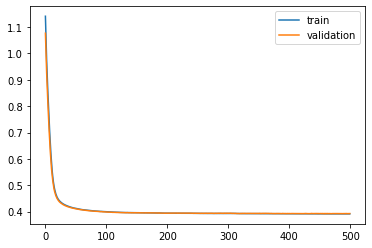

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 28s - loss: 1.1417 - val_loss: 1.0749

Epoch 00001: val_loss improved from inf to 1.07495, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0498 - val_loss: 0.9945

Epoch 00002: val_loss improved from 1.07495 to 0.99450, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9745 - val_loss: 0.9280

Epoch 00003: val_loss improved from 0.99450 to 0.92797, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9108 - val_loss: 0.8694

Epoch 00004: val_loss improved from 0.92797 to 0.86940, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8536 - val_loss: 0.8158

Epoch 00005: val_loss improved from 0.86940 to 0.81576, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8000 - val_loss: 0.7648

Epoch 00006: val_loss improved from 0.81576 to 0.76477, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7492 - val_loss: 0.7160

Epoch 00007: val_loss improved from 0.76477

 - 1s - loss: 0.4082 - val_loss: 0.4118

Epoch 00058: val_loss improved from 0.41203 to 0.41179, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4079 - val_loss: 0.4118

Epoch 00059: val_loss did not improve from 0.41179
Epoch 60/500
 - 1s - loss: 0.4075 - val_loss: 0.4112

Epoch 00060: val_loss improved from 0.41179 to 0.41120, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4072 - val_loss: 0.4107

Epoch 00061: val_loss improved from 0.41120 to 0.41072, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4068 - val_loss: 0.4108

Epoch 00062: val_loss did not improve from 0.41072
Epoch 63/500
 - 1s - loss: 0.4065 - val_loss: 0.4106

Epoch 00063: val_loss improved from 0.41072 to 0.41058, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4062 - val_loss: 0.4100

Epoch 00064: val_loss improved from 0.41058 to 0.41002, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4059 - val_loss: 0.4101

Epoch 00065: val_loss did not

 - 1s - loss: 0.3975 - val_loss: 0.4022

Epoch 00119: val_loss improved from 0.40238 to 0.40217, saving model to val_weights5.hdf5
Epoch 120/500
 - 1s - loss: 0.3973 - val_loss: 0.4024

Epoch 00120: val_loss did not improve from 0.40217
Epoch 121/500
 - 1s - loss: 0.3973 - val_loss: 0.4022

Epoch 00121: val_loss improved from 0.40217 to 0.40216, saving model to val_weights5.hdf5
Epoch 122/500
 - 1s - loss: 0.3971 - val_loss: 0.4024

Epoch 00122: val_loss did not improve from 0.40216
Epoch 123/500
 - 1s - loss: 0.3971 - val_loss: 0.4018

Epoch 00123: val_loss improved from 0.40216 to 0.40182, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3970 - val_loss: 0.4018

Epoch 00124: val_loss improved from 0.40182 to 0.40176, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3969 - val_loss: 0.4020

Epoch 00125: val_loss did not improve from 0.40176
Epoch 126/500
 - 1s - loss: 0.3969 - val_loss: 0.4016

Epoch 00126: val_loss improved from 0.40176 to 0.40160, savin

 - 1s - loss: 0.3943 - val_loss: 0.3985

Epoch 00185: val_loss improved from 0.39873 to 0.39850, saving model to val_weights5.hdf5
Epoch 186/500
 - 1s - loss: 0.3942 - val_loss: 0.3991

Epoch 00186: val_loss did not improve from 0.39850
Epoch 187/500
 - 1s - loss: 0.3944 - val_loss: 0.3988

Epoch 00187: val_loss did not improve from 0.39850
Epoch 188/500
 - 1s - loss: 0.3942 - val_loss: 0.3985

Epoch 00188: val_loss did not improve from 0.39850
Epoch 189/500
 - 1s - loss: 0.3942 - val_loss: 0.3987

Epoch 00189: val_loss did not improve from 0.39850
Epoch 190/500
 - 1s - loss: 0.3942 - val_loss: 0.3988

Epoch 00190: val_loss did not improve from 0.39850
Epoch 191/500
 - 1s - loss: 0.3941 - val_loss: 0.3989

Epoch 00191: val_loss did not improve from 0.39850
Epoch 192/500
 - 1s - loss: 0.3942 - val_loss: 0.3987

Epoch 00192: val_loss did not improve from 0.39850
Epoch 193/500
 - 1s - loss: 0.3941 - val_loss: 0.3987

Epoch 00193: val_loss did not improve from 0.39850
Epoch 194/500
 - 1s -

 - 1s - loss: 0.3928 - val_loss: 0.3981

Epoch 00260: val_loss did not improve from 0.39761
Epoch 261/500
 - 1s - loss: 0.3928 - val_loss: 0.3982

Epoch 00261: val_loss did not improve from 0.39761
Epoch 262/500
 - 1s - loss: 0.3929 - val_loss: 0.3982

Epoch 00262: val_loss did not improve from 0.39761
Epoch 263/500
 - 1s - loss: 0.3929 - val_loss: 0.3983

Epoch 00263: val_loss did not improve from 0.39761
Epoch 264/500
 - 1s - loss: 0.3928 - val_loss: 0.3987

Epoch 00264: val_loss did not improve from 0.39761
Epoch 265/500
 - 1s - loss: 0.3929 - val_loss: 0.3989

Epoch 00265: val_loss did not improve from 0.39761
Epoch 266/500
 - 1s - loss: 0.3930 - val_loss: 0.3985

Epoch 00266: val_loss did not improve from 0.39761
Epoch 267/500
 - 1s - loss: 0.3930 - val_loss: 0.3987

Epoch 00267: val_loss did not improve from 0.39761
Epoch 268/500
 - 1s - loss: 0.3930 - val_loss: 0.3989

Epoch 00268: val_loss did not improve from 0.39761
Epoch 269/500
 - 1s - loss: 0.3929 - val_loss: 0.3986

Epoch

 - 1s - loss: 0.3920 - val_loss: 0.3976

Epoch 00335: val_loss did not improve from 0.39697
Epoch 336/500
 - 1s - loss: 0.3921 - val_loss: 0.3973

Epoch 00336: val_loss did not improve from 0.39697
Epoch 337/500
 - 1s - loss: 0.3920 - val_loss: 0.3970

Epoch 00337: val_loss did not improve from 0.39697
Epoch 338/500
 - 1s - loss: 0.3920 - val_loss: 0.3973

Epoch 00338: val_loss did not improve from 0.39697
Epoch 339/500
 - 1s - loss: 0.3920 - val_loss: 0.3976

Epoch 00339: val_loss did not improve from 0.39697
Epoch 340/500
 - 1s - loss: 0.3920 - val_loss: 0.3975

Epoch 00340: val_loss did not improve from 0.39697
Epoch 341/500
 - 1s - loss: 0.3920 - val_loss: 0.3973

Epoch 00341: val_loss did not improve from 0.39697
Epoch 342/500
 - 1s - loss: 0.3919 - val_loss: 0.3978

Epoch 00342: val_loss did not improve from 0.39697
Epoch 343/500
 - 1s - loss: 0.3922 - val_loss: 0.3973

Epoch 00343: val_loss did not improve from 0.39697
Epoch 344/500
 - 1s - loss: 0.3919 - val_loss: 0.3972

Epoch

 - 1s - loss: 0.3913 - val_loss: 0.3972

Epoch 00412: val_loss did not improve from 0.39656
Epoch 413/500
 - 1s - loss: 0.3914 - val_loss: 0.3975

Epoch 00413: val_loss did not improve from 0.39656
Epoch 414/500
 - 1s - loss: 0.3913 - val_loss: 0.3973

Epoch 00414: val_loss did not improve from 0.39656
Epoch 415/500
 - 1s - loss: 0.3914 - val_loss: 0.3973

Epoch 00415: val_loss did not improve from 0.39656
Epoch 416/500
 - 1s - loss: 0.3912 - val_loss: 0.3971

Epoch 00416: val_loss did not improve from 0.39656
Epoch 417/500
 - 1s - loss: 0.3911 - val_loss: 0.3973

Epoch 00417: val_loss did not improve from 0.39656
Epoch 418/500
 - 1s - loss: 0.3912 - val_loss: 0.3976

Epoch 00418: val_loss did not improve from 0.39656
Epoch 419/500
 - 1s - loss: 0.3913 - val_loss: 0.3974

Epoch 00419: val_loss did not improve from 0.39656
Epoch 420/500
 - 1s - loss: 0.3913 - val_loss: 0.3973

Epoch 00420: val_loss did not improve from 0.39656
Epoch 421/500
 - 1s - loss: 0.3914 - val_loss: 0.3974

Epoch


Epoch 00489: val_loss did not improve from 0.39656
Epoch 490/500
 - 1s - loss: 0.3908 - val_loss: 0.3972

Epoch 00490: val_loss did not improve from 0.39656
Epoch 491/500
 - 1s - loss: 0.3908 - val_loss: 0.3980

Epoch 00491: val_loss did not improve from 0.39656
Epoch 492/500
 - 1s - loss: 0.3909 - val_loss: 0.3975

Epoch 00492: val_loss did not improve from 0.39656
Epoch 493/500
 - 1s - loss: 0.3909 - val_loss: 0.3972

Epoch 00493: val_loss did not improve from 0.39656
Epoch 494/500
 - 1s - loss: 0.3908 - val_loss: 0.3974

Epoch 00494: val_loss did not improve from 0.39656
Epoch 495/500
 - 1s - loss: 0.3908 - val_loss: 0.3980

Epoch 00495: val_loss did not improve from 0.39656
Epoch 496/500
 - 1s - loss: 0.3908 - val_loss: 0.3978

Epoch 00496: val_loss did not improve from 0.39656
Epoch 497/500
 - 1s - loss: 0.3909 - val_loss: 0.3977

Epoch 00497: val_loss did not improve from 0.39656
Epoch 498/500
 - 1s - loss: 0.3909 - val_loss: 0.3974

Epoch 00498: val_loss did not improve from 0.

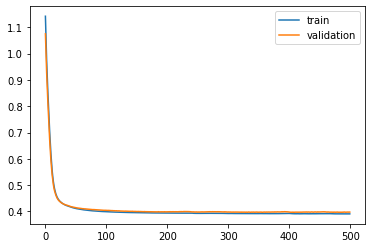

Time to train LSTM:  384.7709629535675
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 36s - loss: 1.0430 - val_loss: 0.9976

Epoch 00001: val_loss improved from inf to 0.99756, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 0.9634 - val_loss: 0.9269

Epoch 00002: val_loss improved from 0.99756 to 0.92689, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9005 - val_loss: 0.8700

Epoch 00003: val_loss improved from 0.92689 to 0.87004, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.8483 - val_loss: 0.8215

Epoch 00004: val_loss improved from 0.87004 to 0.82149, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8014 - val_loss: 0.7764

Epoch 00005: val_loss improved from 0.82149 to 0.77642, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.7571 - val_loss: 0.7334

Epoch 00006: val_loss improved from 0.77642 to 0.73344, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7143 - val_loss: 0.6924

Epoc

 - 1s - loss: 0.4072 - val_loss: 0.4152

Epoch 00058: val_loss improved from 0.41520 to 0.41519, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4068 - val_loss: 0.4145

Epoch 00059: val_loss improved from 0.41519 to 0.41452, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4065 - val_loss: 0.4143

Epoch 00060: val_loss improved from 0.41452 to 0.41433, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4061 - val_loss: 0.4137

Epoch 00061: val_loss improved from 0.41433 to 0.41372, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4059 - val_loss: 0.4136

Epoch 00062: val_loss improved from 0.41372 to 0.41365, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4055 - val_loss: 0.4130

Epoch 00063: val_loss improved from 0.41365 to 0.41298, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4051 - val_loss: 0.4127

Epoch 00064: val_loss improved from 0.41298 to 0.41270, saving model to val_weights1.hdf5
Epoch

 - 1s - loss: 0.3962 - val_loss: 0.4029

Epoch 00118: val_loss did not improve from 0.40266
Epoch 119/500
 - 1s - loss: 0.3962 - val_loss: 0.4028

Epoch 00119: val_loss did not improve from 0.40266
Epoch 120/500
 - 1s - loss: 0.3959 - val_loss: 0.4028

Epoch 00120: val_loss did not improve from 0.40266
Epoch 121/500
 - 1s - loss: 0.3960 - val_loss: 0.4023

Epoch 00121: val_loss improved from 0.40266 to 0.40235, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3957 - val_loss: 0.4024

Epoch 00122: val_loss did not improve from 0.40235
Epoch 123/500
 - 1s - loss: 0.3958 - val_loss: 0.4025

Epoch 00123: val_loss did not improve from 0.40235
Epoch 124/500
 - 1s - loss: 0.3956 - val_loss: 0.4023

Epoch 00124: val_loss improved from 0.40235 to 0.40225, saving model to val_weights1.hdf5
Epoch 125/500
 - 1s - loss: 0.3955 - val_loss: 0.4021

Epoch 00125: val_loss improved from 0.40225 to 0.40211, saving model to val_weights1.hdf5
Epoch 126/500
 - 1s - loss: 0.3955 - val_loss: 0.


Epoch 00185: val_loss did not improve from 0.39903
Epoch 186/500
 - 1s - loss: 0.3925 - val_loss: 0.3995

Epoch 00186: val_loss did not improve from 0.39903
Epoch 187/500
 - 1s - loss: 0.3924 - val_loss: 0.3993

Epoch 00187: val_loss did not improve from 0.39903
Epoch 188/500
 - 1s - loss: 0.3924 - val_loss: 0.3995

Epoch 00188: val_loss did not improve from 0.39903
Epoch 189/500
 - 1s - loss: 0.3923 - val_loss: 0.3990

Epoch 00189: val_loss did not improve from 0.39903
Epoch 190/500
 - 1s - loss: 0.3922 - val_loss: 0.3994

Epoch 00190: val_loss did not improve from 0.39903
Epoch 191/500
 - 1s - loss: 0.3923 - val_loss: 0.3994

Epoch 00191: val_loss did not improve from 0.39903
Epoch 192/500
 - 1s - loss: 0.3922 - val_loss: 0.3992

Epoch 00192: val_loss did not improve from 0.39903
Epoch 193/500
 - 1s - loss: 0.3921 - val_loss: 0.3990

Epoch 00193: val_loss did not improve from 0.39903
Epoch 194/500
 - 1s - loss: 0.3922 - val_loss: 0.3990

Epoch 00194: val_loss improved from 0.39903 t

 - 1s - loss: 0.3911 - val_loss: 0.3982

Epoch 00260: val_loss did not improve from 0.39786
Epoch 261/500
 - 1s - loss: 0.3911 - val_loss: 0.3985

Epoch 00261: val_loss did not improve from 0.39786
Epoch 262/500
 - 1s - loss: 0.3910 - val_loss: 0.3981

Epoch 00262: val_loss did not improve from 0.39786
Epoch 263/500
 - 1s - loss: 0.3909 - val_loss: 0.3981

Epoch 00263: val_loss did not improve from 0.39786
Epoch 264/500
 - 1s - loss: 0.3910 - val_loss: 0.3981

Epoch 00264: val_loss did not improve from 0.39786
Epoch 265/500
 - 1s - loss: 0.3909 - val_loss: 0.3980

Epoch 00265: val_loss did not improve from 0.39786
Epoch 266/500
 - 1s - loss: 0.3910 - val_loss: 0.3983

Epoch 00266: val_loss did not improve from 0.39786
Epoch 267/500
 - 1s - loss: 0.3910 - val_loss: 0.3978

Epoch 00267: val_loss improved from 0.39786 to 0.39781, saving model to val_weights1.hdf5
Epoch 268/500
 - 1s - loss: 0.3910 - val_loss: 0.3984

Epoch 00268: val_loss did not improve from 0.39781
Epoch 269/500
 - 1s -


Epoch 00334: val_loss did not improve from 0.39699
Epoch 335/500
 - 1s - loss: 0.3898 - val_loss: 0.3974

Epoch 00335: val_loss did not improve from 0.39699
Epoch 336/500
 - 1s - loss: 0.3898 - val_loss: 0.3970

Epoch 00336: val_loss did not improve from 0.39699
Epoch 337/500
 - 1s - loss: 0.3897 - val_loss: 0.3972

Epoch 00337: val_loss did not improve from 0.39699
Epoch 338/500
 - 1s - loss: 0.3900 - val_loss: 0.3970

Epoch 00338: val_loss did not improve from 0.39699
Epoch 339/500
 - 1s - loss: 0.3898 - val_loss: 0.3973

Epoch 00339: val_loss did not improve from 0.39699
Epoch 340/500
 - 1s - loss: 0.3899 - val_loss: 0.3972

Epoch 00340: val_loss did not improve from 0.39699
Epoch 341/500
 - 1s - loss: 0.3898 - val_loss: 0.3971

Epoch 00341: val_loss did not improve from 0.39699
Epoch 342/500
 - 1s - loss: 0.3897 - val_loss: 0.3970

Epoch 00342: val_loss did not improve from 0.39699
Epoch 343/500
 - 1s - loss: 0.3897 - val_loss: 0.3970

Epoch 00343: val_loss improved from 0.39699 t

 - 1s - loss: 0.3891 - val_loss: 0.3962

Epoch 00409: val_loss improved from 0.39623 to 0.39616, saving model to val_weights1.hdf5
Epoch 410/500
 - 1s - loss: 0.3890 - val_loss: 0.3965

Epoch 00410: val_loss did not improve from 0.39616
Epoch 411/500
 - 1s - loss: 0.3890 - val_loss: 0.3967

Epoch 00411: val_loss did not improve from 0.39616
Epoch 412/500
 - 1s - loss: 0.3890 - val_loss: 0.3963

Epoch 00412: val_loss did not improve from 0.39616
Epoch 413/500
 - 1s - loss: 0.3890 - val_loss: 0.3963

Epoch 00413: val_loss did not improve from 0.39616
Epoch 414/500
 - 1s - loss: 0.3890 - val_loss: 0.3966

Epoch 00414: val_loss did not improve from 0.39616
Epoch 415/500
 - 1s - loss: 0.3890 - val_loss: 0.3964

Epoch 00415: val_loss did not improve from 0.39616
Epoch 416/500
 - 1s - loss: 0.3889 - val_loss: 0.3963

Epoch 00416: val_loss did not improve from 0.39616
Epoch 417/500
 - 1s - loss: 0.3888 - val_loss: 0.3963

Epoch 00417: val_loss did not improve from 0.39616
Epoch 418/500
 - 1s -


Epoch 00485: val_loss did not improve from 0.39587
Epoch 486/500
 - 1s - loss: 0.3882 - val_loss: 0.3960

Epoch 00486: val_loss did not improve from 0.39587
Epoch 487/500
 - 1s - loss: 0.3883 - val_loss: 0.3961

Epoch 00487: val_loss did not improve from 0.39587
Epoch 488/500
 - 1s - loss: 0.3882 - val_loss: 0.3960

Epoch 00488: val_loss did not improve from 0.39587
Epoch 489/500
 - 1s - loss: 0.3884 - val_loss: 0.3959

Epoch 00489: val_loss did not improve from 0.39587
Epoch 490/500
 - 1s - loss: 0.3883 - val_loss: 0.3963

Epoch 00490: val_loss did not improve from 0.39587
Epoch 491/500
 - 1s - loss: 0.3883 - val_loss: 0.3963

Epoch 00491: val_loss did not improve from 0.39587
Epoch 492/500
 - 1s - loss: 0.3881 - val_loss: 0.3961

Epoch 00492: val_loss did not improve from 0.39587
Epoch 493/500
 - 1s - loss: 0.3882 - val_loss: 0.3961

Epoch 00493: val_loss did not improve from 0.39587
Epoch 494/500
 - 1s - loss: 0.3883 - val_loss: 0.3961

Epoch 00494: val_loss did not improve from 0.

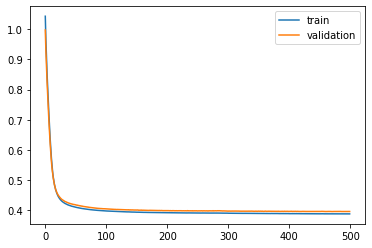

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 46s - loss: 1.0437 - val_loss: 0.9935

Epoch 00001: val_loss improved from inf to 0.99351, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 0.9640 - val_loss: 0.9258

Epoch 00002: val_loss improved from 0.99351 to 0.92579, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9007 - val_loss: 0.8706

Epoch 00003: val_loss improved from 0.92579 to 0.87063, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.8484 - val_loss: 0.8222

Epoch 00004: val_loss improved from 0.87063 to 0.82216, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8015 - val_loss: 0.7766

Epoch 00005: val_loss improved from 0.82216 to 0.77663, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.7573 - val_loss: 0.7324

Epoch 00006: val_loss improved from 0.77663 to 0.73240, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7149 - val_loss: 0.6901

Epoch 00007: val_loss improved from 0.73240

 - 1s - loss: 0.4077 - val_loss: 0.4063

Epoch 00058: val_loss improved from 0.40657 to 0.40633, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4073 - val_loss: 0.4059

Epoch 00059: val_loss improved from 0.40633 to 0.40586, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4069 - val_loss: 0.4054

Epoch 00060: val_loss improved from 0.40586 to 0.40545, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4066 - val_loss: 0.4052

Epoch 00061: val_loss improved from 0.40545 to 0.40525, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4062 - val_loss: 0.4048

Epoch 00062: val_loss improved from 0.40525 to 0.40482, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4060 - val_loss: 0.4046

Epoch 00063: val_loss improved from 0.40482 to 0.40455, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4057 - val_loss: 0.4042

Epoch 00064: val_loss improved from 0.40455 to 0.40424, saving model to val_weights2.hdf5
Epoch


Epoch 00118: val_loss improved from 0.39638 to 0.39626, saving model to val_weights2.hdf5
Epoch 119/500
 - 1s - loss: 0.3965 - val_loss: 0.3964

Epoch 00119: val_loss did not improve from 0.39626
Epoch 120/500
 - 1s - loss: 0.3964 - val_loss: 0.3962

Epoch 00120: val_loss improved from 0.39626 to 0.39615, saving model to val_weights2.hdf5
Epoch 121/500
 - 1s - loss: 0.3964 - val_loss: 0.3961

Epoch 00121: val_loss improved from 0.39615 to 0.39613, saving model to val_weights2.hdf5
Epoch 122/500
 - 1s - loss: 0.3962 - val_loss: 0.3961

Epoch 00122: val_loss improved from 0.39613 to 0.39613, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3963 - val_loss: 0.3960

Epoch 00123: val_loss improved from 0.39613 to 0.39602, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3961 - val_loss: 0.3962

Epoch 00124: val_loss did not improve from 0.39602
Epoch 125/500
 - 1s - loss: 0.3961 - val_loss: 0.3961

Epoch 00125: val_loss did not improve from 0.39602
Epoch 126/5


Epoch 00186: val_loss did not improve from 0.39323
Epoch 187/500
 - 1s - loss: 0.3930 - val_loss: 0.3934

Epoch 00187: val_loss did not improve from 0.39323
Epoch 188/500
 - 1s - loss: 0.3930 - val_loss: 0.3934

Epoch 00188: val_loss did not improve from 0.39323
Epoch 189/500
 - 1s - loss: 0.3929 - val_loss: 0.3931

Epoch 00189: val_loss improved from 0.39323 to 0.39312, saving model to val_weights2.hdf5
Epoch 190/500
 - 1s - loss: 0.3930 - val_loss: 0.3933

Epoch 00190: val_loss did not improve from 0.39312
Epoch 191/500
 - 1s - loss: 0.3929 - val_loss: 0.3934

Epoch 00191: val_loss did not improve from 0.39312
Epoch 192/500
 - 1s - loss: 0.3929 - val_loss: 0.3930

Epoch 00192: val_loss improved from 0.39312 to 0.39302, saving model to val_weights2.hdf5
Epoch 193/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00193: val_loss did not improve from 0.39302
Epoch 194/500
 - 1s - loss: 0.3928 - val_loss: 0.3929

Epoch 00194: val_loss improved from 0.39302 to 0.39292, saving model to v


Epoch 00261: val_loss improved from 0.39254 to 0.39249, saving model to val_weights2.hdf5
Epoch 262/500
 - 1s - loss: 0.3914 - val_loss: 0.3928

Epoch 00262: val_loss did not improve from 0.39249
Epoch 263/500
 - 1s - loss: 0.3913 - val_loss: 0.3926

Epoch 00263: val_loss did not improve from 0.39249
Epoch 264/500
 - 1s - loss: 0.3913 - val_loss: 0.3927

Epoch 00264: val_loss did not improve from 0.39249
Epoch 265/500
 - 1s - loss: 0.3913 - val_loss: 0.3926

Epoch 00265: val_loss did not improve from 0.39249
Epoch 266/500
 - 1s - loss: 0.3914 - val_loss: 0.3928

Epoch 00266: val_loss did not improve from 0.39249
Epoch 267/500
 - 1s - loss: 0.3914 - val_loss: 0.3927

Epoch 00267: val_loss did not improve from 0.39249
Epoch 268/500
 - 1s - loss: 0.3913 - val_loss: 0.3928

Epoch 00268: val_loss did not improve from 0.39249
Epoch 269/500
 - 1s - loss: 0.3914 - val_loss: 0.3927

Epoch 00269: val_loss did not improve from 0.39249
Epoch 270/500
 - 1s - loss: 0.3912 - val_loss: 0.3927

Epoch 

 - 1s - loss: 0.3902 - val_loss: 0.3925

Epoch 00336: val_loss did not improve from 0.39196
Epoch 337/500
 - 1s - loss: 0.3904 - val_loss: 0.3922

Epoch 00337: val_loss did not improve from 0.39196
Epoch 338/500
 - 1s - loss: 0.3902 - val_loss: 0.3925

Epoch 00338: val_loss did not improve from 0.39196
Epoch 339/500
 - 1s - loss: 0.3903 - val_loss: 0.3921

Epoch 00339: val_loss did not improve from 0.39196
Epoch 340/500
 - 1s - loss: 0.3901 - val_loss: 0.3926

Epoch 00340: val_loss did not improve from 0.39196
Epoch 341/500
 - 1s - loss: 0.3902 - val_loss: 0.3922

Epoch 00341: val_loss did not improve from 0.39196
Epoch 342/500
 - 1s - loss: 0.3902 - val_loss: 0.3922

Epoch 00342: val_loss did not improve from 0.39196
Epoch 343/500
 - 1s - loss: 0.3902 - val_loss: 0.3920

Epoch 00343: val_loss did not improve from 0.39196
Epoch 344/500
 - 1s - loss: 0.3902 - val_loss: 0.3925

Epoch 00344: val_loss did not improve from 0.39196
Epoch 345/500
 - 1s - loss: 0.3902 - val_loss: 0.3922

Epoch

 - 1s - loss: 0.3897 - val_loss: 0.3920

Epoch 00413: val_loss did not improve from 0.39177
Epoch 414/500
 - 1s - loss: 0.3896 - val_loss: 0.3923

Epoch 00414: val_loss did not improve from 0.39177
Epoch 415/500
 - 1s - loss: 0.3895 - val_loss: 0.3921

Epoch 00415: val_loss did not improve from 0.39177
Epoch 416/500
 - 1s - loss: 0.3895 - val_loss: 0.3922

Epoch 00416: val_loss did not improve from 0.39177
Epoch 417/500
 - 1s - loss: 0.3896 - val_loss: 0.3922

Epoch 00417: val_loss did not improve from 0.39177
Epoch 418/500
 - 1s - loss: 0.3895 - val_loss: 0.3921

Epoch 00418: val_loss did not improve from 0.39177
Epoch 419/500
 - 1s - loss: 0.3896 - val_loss: 0.3921

Epoch 00419: val_loss did not improve from 0.39177
Epoch 420/500
 - 1s - loss: 0.3893 - val_loss: 0.3919

Epoch 00420: val_loss did not improve from 0.39177
Epoch 421/500
 - 1s - loss: 0.3895 - val_loss: 0.3924

Epoch 00421: val_loss did not improve from 0.39177
Epoch 422/500
 - 1s - loss: 0.3894 - val_loss: 0.3921

Epoch

 - 1s - loss: 0.3889 - val_loss: 0.3919

Epoch 00490: val_loss did not improve from 0.39159
Epoch 491/500
 - 1s - loss: 0.3889 - val_loss: 0.3918

Epoch 00491: val_loss did not improve from 0.39159
Epoch 492/500
 - 1s - loss: 0.3889 - val_loss: 0.3920

Epoch 00492: val_loss did not improve from 0.39159
Epoch 493/500
 - 1s - loss: 0.3890 - val_loss: 0.3919

Epoch 00493: val_loss did not improve from 0.39159
Epoch 494/500
 - 1s - loss: 0.3888 - val_loss: 0.3921

Epoch 00494: val_loss did not improve from 0.39159
Epoch 495/500
 - 1s - loss: 0.3890 - val_loss: 0.3918

Epoch 00495: val_loss did not improve from 0.39159
Epoch 496/500
 - 1s - loss: 0.3888 - val_loss: 0.3924

Epoch 00496: val_loss did not improve from 0.39159
Epoch 497/500
 - 1s - loss: 0.3889 - val_loss: 0.3921

Epoch 00497: val_loss did not improve from 0.39159
Epoch 498/500
 - 1s - loss: 0.3887 - val_loss: 0.3922

Epoch 00498: val_loss did not improve from 0.39159
Epoch 499/500
 - 1s - loss: 0.3889 - val_loss: 0.3923

Epoch

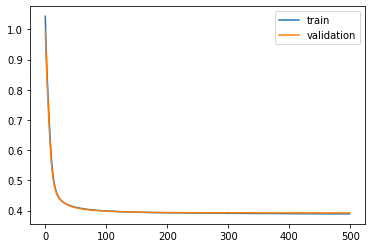

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 40s - loss: 1.0451 - val_loss: 0.9812

Epoch 00001: val_loss improved from inf to 0.98118, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 0.9656 - val_loss: 0.9120

Epoch 00002: val_loss improved from 0.98118 to 0.91203, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9023 - val_loss: 0.8566

Epoch 00003: val_loss improved from 0.91203 to 0.85655, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.8499 - val_loss: 0.8089

Epoch 00004: val_loss improved from 0.85655 to 0.80891, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8028 - val_loss: 0.7650

Epoch 00005: val_loss improved from 0.80891 to 0.76500, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.7583 - val_loss: 0.7232

Epoch 00006: val_loss improved from 0.76500 to 0.72323, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7154 - val_loss: 0.6839

Epoch 00007: val_loss improved from 0.72323

 - 1s - loss: 0.4071 - val_loss: 0.4156

Epoch 00058: val_loss improved from 0.41593 to 0.41561, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4067 - val_loss: 0.4153

Epoch 00059: val_loss improved from 0.41561 to 0.41529, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4063 - val_loss: 0.4149

Epoch 00060: val_loss improved from 0.41529 to 0.41491, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4060 - val_loss: 0.4147

Epoch 00061: val_loss improved from 0.41491 to 0.41471, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4057 - val_loss: 0.4144

Epoch 00062: val_loss improved from 0.41471 to 0.41445, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4053 - val_loss: 0.4140

Epoch 00063: val_loss improved from 0.41445 to 0.41398, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4050 - val_loss: 0.4138

Epoch 00064: val_loss improved from 0.41398 to 0.41376, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.3957 - val_loss: 0.4065

Epoch 00120: val_loss did not improve from 0.40640
Epoch 121/500
 - 1s - loss: 0.3956 - val_loss: 0.4062

Epoch 00121: val_loss improved from 0.40640 to 0.40622, saving model to val_weights3.hdf5
Epoch 122/500
 - 1s - loss: 0.3955 - val_loss: 0.4065

Epoch 00122: val_loss did not improve from 0.40622
Epoch 123/500
 - 1s - loss: 0.3954 - val_loss: 0.4063

Epoch 00123: val_loss did not improve from 0.40622
Epoch 124/500
 - 1s - loss: 0.3953 - val_loss: 0.4064

Epoch 00124: val_loss did not improve from 0.40622
Epoch 125/500
 - 1s - loss: 0.3952 - val_loss: 0.4062

Epoch 00125: val_loss did not improve from 0.40622
Epoch 126/500
 - 1s - loss: 0.3952 - val_loss: 0.4062

Epoch 00126: val_loss did not improve from 0.40622
Epoch 127/500
 - 1s - loss: 0.3951 - val_loss: 0.4060

Epoch 00127: val_loss improved from 0.40622 to 0.40600, saving model to val_weights3.hdf5
Epoch 128/500
 - 1s - loss: 0.3951 - val_loss: 0.4060

Epoch 00128: val_loss improved fr

 - 1s - loss: 0.3923 - val_loss: 0.4033

Epoch 00189: val_loss did not improve from 0.40309
Epoch 190/500
 - 1s - loss: 0.3920 - val_loss: 0.4032

Epoch 00190: val_loss did not improve from 0.40309
Epoch 191/500
 - 1s - loss: 0.3920 - val_loss: 0.4032

Epoch 00191: val_loss did not improve from 0.40309
Epoch 192/500
 - 1s - loss: 0.3920 - val_loss: 0.4030

Epoch 00192: val_loss improved from 0.40309 to 0.40300, saving model to val_weights3.hdf5
Epoch 193/500
 - 1s - loss: 0.3920 - val_loss: 0.4033

Epoch 00193: val_loss did not improve from 0.40300
Epoch 194/500
 - 1s - loss: 0.3919 - val_loss: 0.4029

Epoch 00194: val_loss improved from 0.40300 to 0.40292, saving model to val_weights3.hdf5
Epoch 195/500
 - 1s - loss: 0.3920 - val_loss: 0.4034

Epoch 00195: val_loss did not improve from 0.40292
Epoch 196/500
 - 1s - loss: 0.3919 - val_loss: 0.4032

Epoch 00196: val_loss did not improve from 0.40292
Epoch 197/500
 - 1s - loss: 0.3919 - val_loss: 0.4033

Epoch 00197: val_loss did not imp


Epoch 00262: val_loss did not improve from 0.40209
Epoch 263/500
 - 1s - loss: 0.3906 - val_loss: 0.4023

Epoch 00263: val_loss did not improve from 0.40209
Epoch 264/500
 - 1s - loss: 0.3907 - val_loss: 0.4023

Epoch 00264: val_loss did not improve from 0.40209
Epoch 265/500
 - 1s - loss: 0.3907 - val_loss: 0.4021

Epoch 00265: val_loss did not improve from 0.40209
Epoch 266/500
 - 1s - loss: 0.3907 - val_loss: 0.4022

Epoch 00266: val_loss did not improve from 0.40209
Epoch 267/500
 - 1s - loss: 0.3908 - val_loss: 0.4023

Epoch 00267: val_loss did not improve from 0.40209
Epoch 268/500
 - 1s - loss: 0.3906 - val_loss: 0.4023

Epoch 00268: val_loss did not improve from 0.40209
Epoch 269/500
 - 1s - loss: 0.3905 - val_loss: 0.4023

Epoch 00269: val_loss did not improve from 0.40209
Epoch 270/500
 - 1s - loss: 0.3905 - val_loss: 0.4021

Epoch 00270: val_loss did not improve from 0.40209
Epoch 271/500
 - 1s - loss: 0.3905 - val_loss: 0.4023

Epoch 00271: val_loss did not improve from 0.


Epoch 00336: val_loss did not improve from 0.40122
Epoch 337/500
 - 1s - loss: 0.3894 - val_loss: 0.4015

Epoch 00337: val_loss did not improve from 0.40122
Epoch 338/500
 - 1s - loss: 0.3894 - val_loss: 0.4017

Epoch 00338: val_loss did not improve from 0.40122
Epoch 339/500
 - 1s - loss: 0.3894 - val_loss: 0.4014

Epoch 00339: val_loss did not improve from 0.40122
Epoch 340/500
 - 1s - loss: 0.3893 - val_loss: 0.4014

Epoch 00340: val_loss did not improve from 0.40122
Epoch 341/500
 - 1s - loss: 0.3893 - val_loss: 0.4014

Epoch 00341: val_loss did not improve from 0.40122
Epoch 342/500
 - 1s - loss: 0.3893 - val_loss: 0.4016

Epoch 00342: val_loss did not improve from 0.40122
Epoch 343/500
 - 1s - loss: 0.3894 - val_loss: 0.4016

Epoch 00343: val_loss did not improve from 0.40122
Epoch 344/500
 - 1s - loss: 0.3893 - val_loss: 0.4017

Epoch 00344: val_loss did not improve from 0.40122
Epoch 345/500
 - 1s - loss: 0.3893 - val_loss: 0.4013

Epoch 00345: val_loss did not improve from 0.

 - 1s - loss: 0.3895 - val_loss: 0.4010

Epoch 00411: val_loss did not improve from 0.40085
Epoch 412/500
 - 1s - loss: 0.3898 - val_loss: 0.4018

Epoch 00412: val_loss did not improve from 0.40085
Epoch 413/500
 - 1s - loss: 0.3899 - val_loss: 0.4016

Epoch 00413: val_loss did not improve from 0.40085
Epoch 414/500
 - 1s - loss: 0.3898 - val_loss: 0.4020

Epoch 00414: val_loss did not improve from 0.40085
Epoch 415/500
 - 1s - loss: 0.3898 - val_loss: 0.4022

Epoch 00415: val_loss did not improve from 0.40085
Epoch 416/500
 - 1s - loss: 0.3893 - val_loss: 0.4021

Epoch 00416: val_loss did not improve from 0.40085
Epoch 417/500
 - 1s - loss: 0.3890 - val_loss: 0.4019

Epoch 00417: val_loss did not improve from 0.40085
Epoch 418/500
 - 1s - loss: 0.3888 - val_loss: 0.4017

Epoch 00418: val_loss did not improve from 0.40085
Epoch 419/500
 - 1s - loss: 0.3887 - val_loss: 0.4014

Epoch 00419: val_loss did not improve from 0.40085
Epoch 420/500
 - 1s - loss: 0.3885 - val_loss: 0.4013

Epoch

 - 1s - loss: 0.3880 - val_loss: 0.4013

Epoch 00487: val_loss did not improve from 0.40054
Epoch 488/500
 - 1s - loss: 0.3880 - val_loss: 0.4011

Epoch 00488: val_loss did not improve from 0.40054
Epoch 489/500
 - 1s - loss: 0.3880 - val_loss: 0.4010

Epoch 00489: val_loss did not improve from 0.40054
Epoch 490/500
 - 1s - loss: 0.3879 - val_loss: 0.4008

Epoch 00490: val_loss did not improve from 0.40054
Epoch 491/500
 - 1s - loss: 0.3878 - val_loss: 0.4011

Epoch 00491: val_loss did not improve from 0.40054
Epoch 492/500
 - 1s - loss: 0.3879 - val_loss: 0.4011

Epoch 00492: val_loss did not improve from 0.40054
Epoch 493/500
 - 1s - loss: 0.3879 - val_loss: 0.4009

Epoch 00493: val_loss did not improve from 0.40054
Epoch 494/500
 - 1s - loss: 0.3880 - val_loss: 0.4013

Epoch 00494: val_loss did not improve from 0.40054
Epoch 495/500
 - 1s - loss: 0.3881 - val_loss: 0.4011

Epoch 00495: val_loss did not improve from 0.40054
Epoch 496/500
 - 1s - loss: 0.3880 - val_loss: 0.4010

Epoch

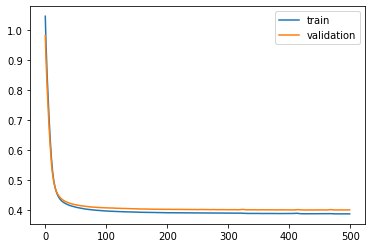

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 50s - loss: 1.0443 - val_loss: 0.9868

Epoch 00001: val_loss improved from inf to 0.98677, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 0.9648 - val_loss: 0.9170

Epoch 00002: val_loss improved from 0.98677 to 0.91704, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9017 - val_loss: 0.8614

Epoch 00003: val_loss improved from 0.91704 to 0.86137, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.8493 - val_loss: 0.8128

Epoch 00004: val_loss improved from 0.86137 to 0.81284, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8023 - val_loss: 0.7672

Epoch 00005: val_loss improved from 0.81284 to 0.76719, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.7582 - val_loss: 0.7235

Epoch 00006: val_loss improved from 0.76719 to 0.72355, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7157 - val_loss: 0.6822

Epoch 00007: val_loss improved from 0.72355

 - 1s - loss: 0.4078 - val_loss: 0.4072

Epoch 00058: val_loss improved from 0.40791 to 0.40718, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4074 - val_loss: 0.4071

Epoch 00059: val_loss improved from 0.40718 to 0.40709, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4071 - val_loss: 0.4066

Epoch 00060: val_loss improved from 0.40709 to 0.40665, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4067 - val_loss: 0.4066

Epoch 00061: val_loss improved from 0.40665 to 0.40665, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4063 - val_loss: 0.4061

Epoch 00062: val_loss improved from 0.40665 to 0.40609, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4060 - val_loss: 0.4056

Epoch 00063: val_loss improved from 0.40609 to 0.40557, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4056 - val_loss: 0.4057

Epoch 00064: val_loss did not improve from 0.40557
Epoch 65/500
 - 1s - loss: 0.4054 - val_loss

 - 1s - loss: 0.3968 - val_loss: 0.3971

Epoch 00119: val_loss improved from 0.39718 to 0.39708, saving model to val_weights4.hdf5
Epoch 120/500
 - 1s - loss: 0.3967 - val_loss: 0.3972

Epoch 00120: val_loss did not improve from 0.39708
Epoch 121/500
 - 1s - loss: 0.3966 - val_loss: 0.3970

Epoch 00121: val_loss improved from 0.39708 to 0.39702, saving model to val_weights4.hdf5
Epoch 122/500
 - 1s - loss: 0.3967 - val_loss: 0.3968

Epoch 00122: val_loss improved from 0.39702 to 0.39678, saving model to val_weights4.hdf5
Epoch 123/500
 - 1s - loss: 0.3964 - val_loss: 0.3963

Epoch 00123: val_loss improved from 0.39678 to 0.39628, saving model to val_weights4.hdf5
Epoch 124/500
 - 1s - loss: 0.3963 - val_loss: 0.3971

Epoch 00124: val_loss did not improve from 0.39628
Epoch 125/500
 - 1s - loss: 0.3962 - val_loss: 0.3965

Epoch 00125: val_loss did not improve from 0.39628
Epoch 126/500
 - 1s - loss: 0.3963 - val_loss: 0.3967

Epoch 00126: val_loss did not improve from 0.39628
Epoch 127/

 - 1s - loss: 0.3933 - val_loss: 0.3949

Epoch 00188: val_loss did not improve from 0.39431
Epoch 189/500
 - 1s - loss: 0.3933 - val_loss: 0.3946

Epoch 00189: val_loss did not improve from 0.39431
Epoch 190/500
 - 1s - loss: 0.3933 - val_loss: 0.3945

Epoch 00190: val_loss did not improve from 0.39431
Epoch 191/500
 - 1s - loss: 0.3932 - val_loss: 0.3945

Epoch 00191: val_loss did not improve from 0.39431
Epoch 192/500
 - 1s - loss: 0.3934 - val_loss: 0.3949

Epoch 00192: val_loss did not improve from 0.39431
Epoch 193/500
 - 1s - loss: 0.3933 - val_loss: 0.3945

Epoch 00193: val_loss did not improve from 0.39431
Epoch 194/500
 - 1s - loss: 0.3933 - val_loss: 0.3945

Epoch 00194: val_loss did not improve from 0.39431
Epoch 195/500
 - 1s - loss: 0.3933 - val_loss: 0.3947

Epoch 00195: val_loss did not improve from 0.39431
Epoch 196/500
 - 1s - loss: 0.3934 - val_loss: 0.3944

Epoch 00196: val_loss did not improve from 0.39431
Epoch 197/500
 - 1s - loss: 0.3933 - val_loss: 0.3945

Epoch


Epoch 00263: val_loss did not improve from 0.39314
Epoch 264/500
 - 1s - loss: 0.3920 - val_loss: 0.3937

Epoch 00264: val_loss did not improve from 0.39314
Epoch 265/500
 - 1s - loss: 0.3919 - val_loss: 0.3935

Epoch 00265: val_loss did not improve from 0.39314
Epoch 266/500
 - 1s - loss: 0.3921 - val_loss: 0.3935

Epoch 00266: val_loss did not improve from 0.39314
Epoch 267/500
 - 1s - loss: 0.3920 - val_loss: 0.3938

Epoch 00267: val_loss did not improve from 0.39314
Epoch 268/500
 - 1s - loss: 0.3920 - val_loss: 0.3936

Epoch 00268: val_loss did not improve from 0.39314
Epoch 269/500
 - 1s - loss: 0.3920 - val_loss: 0.3937

Epoch 00269: val_loss did not improve from 0.39314
Epoch 270/500
 - 1s - loss: 0.3922 - val_loss: 0.3935

Epoch 00270: val_loss did not improve from 0.39314
Epoch 271/500
 - 1s - loss: 0.3922 - val_loss: 0.3936

Epoch 00271: val_loss did not improve from 0.39314
Epoch 272/500
 - 1s - loss: 0.3923 - val_loss: 0.3929

Epoch 00272: val_loss improved from 0.39314 t

 - 1s - loss: 0.3907 - val_loss: 0.3932

Epoch 00339: val_loss did not improve from 0.39243
Epoch 340/500
 - 1s - loss: 0.3907 - val_loss: 0.3931

Epoch 00340: val_loss did not improve from 0.39243
Epoch 341/500
 - 1s - loss: 0.3908 - val_loss: 0.3928

Epoch 00341: val_loss did not improve from 0.39243
Epoch 342/500
 - 1s - loss: 0.3907 - val_loss: 0.3927

Epoch 00342: val_loss did not improve from 0.39243
Epoch 343/500
 - 1s - loss: 0.3907 - val_loss: 0.3930

Epoch 00343: val_loss did not improve from 0.39243
Epoch 344/500
 - 1s - loss: 0.3907 - val_loss: 0.3930

Epoch 00344: val_loss did not improve from 0.39243
Epoch 345/500
 - 1s - loss: 0.3907 - val_loss: 0.3931

Epoch 00345: val_loss did not improve from 0.39243
Epoch 346/500
 - 1s - loss: 0.3908 - val_loss: 0.3929

Epoch 00346: val_loss did not improve from 0.39243
Epoch 347/500
 - 1s - loss: 0.3908 - val_loss: 0.3928

Epoch 00347: val_loss did not improve from 0.39243
Epoch 348/500
 - 1s - loss: 0.3907 - val_loss: 0.3932

Epoch

 - 1s - loss: 0.3897 - val_loss: 0.3923

Epoch 00415: val_loss did not improve from 0.39178
Epoch 416/500
 - 1s - loss: 0.3898 - val_loss: 0.3925

Epoch 00416: val_loss did not improve from 0.39178
Epoch 417/500
 - 1s - loss: 0.3898 - val_loss: 0.3925

Epoch 00417: val_loss did not improve from 0.39178
Epoch 418/500
 - 1s - loss: 0.3899 - val_loss: 0.3923

Epoch 00418: val_loss did not improve from 0.39178
Epoch 419/500
 - 1s - loss: 0.3898 - val_loss: 0.3920

Epoch 00419: val_loss did not improve from 0.39178
Epoch 420/500
 - 1s - loss: 0.3897 - val_loss: 0.3923

Epoch 00420: val_loss did not improve from 0.39178
Epoch 421/500
 - 1s - loss: 0.3897 - val_loss: 0.3922

Epoch 00421: val_loss did not improve from 0.39178
Epoch 422/500
 - 1s - loss: 0.3897 - val_loss: 0.3924

Epoch 00422: val_loss did not improve from 0.39178
Epoch 423/500
 - 1s - loss: 0.3899 - val_loss: 0.3928

Epoch 00423: val_loss did not improve from 0.39178
Epoch 424/500
 - 1s - loss: 0.3898 - val_loss: 0.3922

Epoch

 - 1s - loss: 0.3891 - val_loss: 0.3924

Epoch 00492: val_loss did not improve from 0.39169
Epoch 493/500
 - 1s - loss: 0.3891 - val_loss: 0.3924

Epoch 00493: val_loss did not improve from 0.39169
Epoch 494/500
 - 1s - loss: 0.3892 - val_loss: 0.3925

Epoch 00494: val_loss did not improve from 0.39169
Epoch 495/500
 - 1s - loss: 0.3892 - val_loss: 0.3921

Epoch 00495: val_loss did not improve from 0.39169
Epoch 496/500
 - 1s - loss: 0.3892 - val_loss: 0.3922

Epoch 00496: val_loss did not improve from 0.39169
Epoch 497/500
 - 1s - loss: 0.3893 - val_loss: 0.3924

Epoch 00497: val_loss did not improve from 0.39169
Epoch 498/500
 - 1s - loss: 0.3892 - val_loss: 0.3923

Epoch 00498: val_loss did not improve from 0.39169
Epoch 499/500
 - 1s - loss: 0.3892 - val_loss: 0.3929

Epoch 00499: val_loss did not improve from 0.39169
Epoch 500/500
 - 1s - loss: 0.3894 - val_loss: 0.3927

Epoch 00500: val_loss did not improve from 0.39169
#################################
Number of units: 4
Batch s

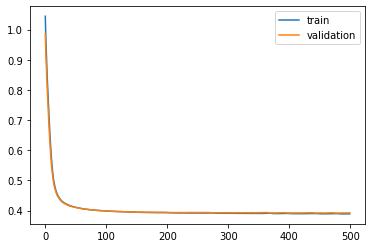

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 56s - loss: 1.0447 - val_loss: 0.9849

Epoch 00001: val_loss improved from inf to 0.98490, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 0.9651 - val_loss: 0.9166

Epoch 00002: val_loss improved from 0.98490 to 0.91664, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9019 - val_loss: 0.8619

Epoch 00003: val_loss improved from 0.91664 to 0.86192, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.8495 - val_loss: 0.8141

Epoch 00004: val_loss improved from 0.86192 to 0.81413, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8023 - val_loss: 0.7703

Epoch 00005: val_loss improved from 0.81413 to 0.77034, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.7578 - val_loss: 0.7278

Epoch 00006: val_loss improved from 0.77034 to 0.72775, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7153 - val_loss: 0.6866

Epoch 00007: val_loss improved from 0.72775

 - 1s - loss: 0.4074 - val_loss: 0.4123

Epoch 00058: val_loss improved from 0.41248 to 0.41227, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4070 - val_loss: 0.4119

Epoch 00059: val_loss improved from 0.41227 to 0.41193, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4067 - val_loss: 0.4118

Epoch 00060: val_loss improved from 0.41193 to 0.41177, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4063 - val_loss: 0.4115

Epoch 00061: val_loss improved from 0.41177 to 0.41154, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4060 - val_loss: 0.4112

Epoch 00062: val_loss improved from 0.41154 to 0.41123, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4056 - val_loss: 0.4109

Epoch 00063: val_loss improved from 0.41123 to 0.41093, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4053 - val_loss: 0.4105

Epoch 00064: val_loss improved from 0.41093 to 0.41053, saving model to val_weights5.hdf5
Epoch

 - 1s - loss: 0.3961 - val_loss: 0.4035

Epoch 00122: val_loss did not improve from 0.40328
Epoch 123/500
 - 1s - loss: 0.3960 - val_loss: 0.4030

Epoch 00123: val_loss improved from 0.40328 to 0.40303, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3959 - val_loss: 0.4032

Epoch 00124: val_loss did not improve from 0.40303
Epoch 125/500
 - 1s - loss: 0.3958 - val_loss: 0.4031

Epoch 00125: val_loss did not improve from 0.40303
Epoch 126/500
 - 1s - loss: 0.3959 - val_loss: 0.4030

Epoch 00126: val_loss improved from 0.40303 to 0.40298, saving model to val_weights5.hdf5
Epoch 127/500
 - 1s - loss: 0.3958 - val_loss: 0.4028

Epoch 00127: val_loss improved from 0.40298 to 0.40281, saving model to val_weights5.hdf5
Epoch 128/500
 - 1s - loss: 0.3958 - val_loss: 0.4030

Epoch 00128: val_loss did not improve from 0.40281
Epoch 129/500
 - 1s - loss: 0.3957 - val_loss: 0.4029

Epoch 00129: val_loss did not improve from 0.40281
Epoch 130/500
 - 1s - loss: 0.3957 - val_loss: 0.


Epoch 00191: val_loss did not improve from 0.39974
Epoch 192/500
 - 1s - loss: 0.3928 - val_loss: 0.4000

Epoch 00192: val_loss did not improve from 0.39974
Epoch 193/500
 - 1s - loss: 0.3928 - val_loss: 0.3995

Epoch 00193: val_loss improved from 0.39974 to 0.39947, saving model to val_weights5.hdf5
Epoch 194/500
 - 1s - loss: 0.3927 - val_loss: 0.3995

Epoch 00194: val_loss did not improve from 0.39947
Epoch 195/500
 - 1s - loss: 0.3928 - val_loss: 0.3996

Epoch 00195: val_loss did not improve from 0.39947
Epoch 196/500
 - 1s - loss: 0.3927 - val_loss: 0.3994

Epoch 00196: val_loss improved from 0.39947 to 0.39943, saving model to val_weights5.hdf5
Epoch 197/500
 - 1s - loss: 0.3927 - val_loss: 0.3994

Epoch 00197: val_loss improved from 0.39943 to 0.39935, saving model to val_weights5.hdf5
Epoch 198/500
 - 1s - loss: 0.3927 - val_loss: 0.3996

Epoch 00198: val_loss did not improve from 0.39935
Epoch 199/500
 - 1s - loss: 0.3926 - val_loss: 0.3995

Epoch 00199: val_loss did not impr

 - 1s - loss: 0.3913 - val_loss: 0.3980

Epoch 00264: val_loss did not improve from 0.39795
Epoch 265/500
 - 1s - loss: 0.3913 - val_loss: 0.3980

Epoch 00265: val_loss did not improve from 0.39795
Epoch 266/500
 - 1s - loss: 0.3913 - val_loss: 0.3976

Epoch 00266: val_loss improved from 0.39795 to 0.39764, saving model to val_weights5.hdf5
Epoch 267/500
 - 1s - loss: 0.3913 - val_loss: 0.3978

Epoch 00267: val_loss did not improve from 0.39764
Epoch 268/500
 - 1s - loss: 0.3913 - val_loss: 0.3974

Epoch 00268: val_loss improved from 0.39764 to 0.39739, saving model to val_weights5.hdf5
Epoch 269/500
 - 1s - loss: 0.3912 - val_loss: 0.3977

Epoch 00269: val_loss did not improve from 0.39739
Epoch 270/500
 - 1s - loss: 0.3911 - val_loss: 0.3975

Epoch 00270: val_loss did not improve from 0.39739
Epoch 271/500
 - 1s - loss: 0.3912 - val_loss: 0.3978

Epoch 00271: val_loss did not improve from 0.39739
Epoch 272/500
 - 1s - loss: 0.3912 - val_loss: 0.3974

Epoch 00272: val_loss improved fr


Epoch 00339: val_loss did not improve from 0.39714
Epoch 340/500
 - 1s - loss: 0.3904 - val_loss: 0.3970

Epoch 00340: val_loss improved from 0.39714 to 0.39699, saving model to val_weights5.hdf5
Epoch 341/500
 - 1s - loss: 0.3903 - val_loss: 0.3972

Epoch 00341: val_loss did not improve from 0.39699
Epoch 342/500
 - 1s - loss: 0.3903 - val_loss: 0.3969

Epoch 00342: val_loss improved from 0.39699 to 0.39693, saving model to val_weights5.hdf5
Epoch 343/500
 - 1s - loss: 0.3903 - val_loss: 0.3973

Epoch 00343: val_loss did not improve from 0.39693
Epoch 344/500
 - 1s - loss: 0.3904 - val_loss: 0.3970

Epoch 00344: val_loss did not improve from 0.39693
Epoch 345/500
 - 1s - loss: 0.3903 - val_loss: 0.3966

Epoch 00345: val_loss improved from 0.39693 to 0.39665, saving model to val_weights5.hdf5
Epoch 346/500
 - 1s - loss: 0.3902 - val_loss: 0.3972

Epoch 00346: val_loss did not improve from 0.39665
Epoch 347/500
 - 1s - loss: 0.3904 - val_loss: 0.3972

Epoch 00347: val_loss did not impr

 - 1s - loss: 0.3895 - val_loss: 0.3971

Epoch 00416: val_loss did not improve from 0.39665
Epoch 417/500
 - 1s - loss: 0.3895 - val_loss: 0.3972

Epoch 00417: val_loss did not improve from 0.39665
Epoch 418/500
 - 1s - loss: 0.3896 - val_loss: 0.3973

Epoch 00418: val_loss did not improve from 0.39665
Epoch 419/500
 - 1s - loss: 0.3897 - val_loss: 0.3979

Epoch 00419: val_loss did not improve from 0.39665
Epoch 420/500
 - 1s - loss: 0.3896 - val_loss: 0.3980

Epoch 00420: val_loss did not improve from 0.39665
Epoch 421/500
 - 1s - loss: 0.3897 - val_loss: 0.3975

Epoch 00421: val_loss did not improve from 0.39665
Epoch 422/500
 - 1s - loss: 0.3897 - val_loss: 0.3984

Epoch 00422: val_loss did not improve from 0.39665
Epoch 423/500
 - 1s - loss: 0.3899 - val_loss: 0.3978

Epoch 00423: val_loss did not improve from 0.39665
Epoch 424/500
 - 1s - loss: 0.3897 - val_loss: 0.3978

Epoch 00424: val_loss did not improve from 0.39665
Epoch 425/500
 - 1s - loss: 0.3897 - val_loss: 0.3975

Epoch


Epoch 00493: val_loss did not improve from 0.39665
Epoch 494/500
 - 1s - loss: 0.3888 - val_loss: 0.3976

Epoch 00494: val_loss did not improve from 0.39665
Epoch 495/500
 - 1s - loss: 0.3889 - val_loss: 0.3973

Epoch 00495: val_loss did not improve from 0.39665
Epoch 496/500
 - 1s - loss: 0.3889 - val_loss: 0.3971

Epoch 00496: val_loss did not improve from 0.39665
Epoch 497/500
 - 1s - loss: 0.3888 - val_loss: 0.3972

Epoch 00497: val_loss did not improve from 0.39665
Epoch 498/500
 - 1s - loss: 0.3890 - val_loss: 0.3973

Epoch 00498: val_loss did not improve from 0.39665
Epoch 499/500
 - 1s - loss: 0.3889 - val_loss: 0.3972

Epoch 00499: val_loss did not improve from 0.39665
Epoch 500/500
 - 1s - loss: 0.3890 - val_loss: 0.3974

Epoch 00500: val_loss did not improve from 0.39665
#################################
Number of units: 4
Batch size: 8192
Fold: 4
L2: 0.005792049415665091
best val loss: 0.396649735821618
#################################
[[4, 8192, 0.007921656789898646, 0, 

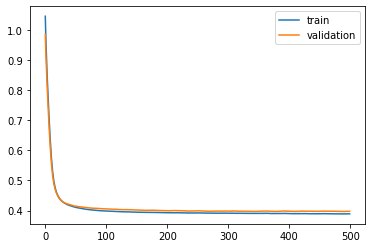

Time to train LSTM:  415.7540099620819
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 32s - loss: 1.2879 - val_loss: 1.2241

Epoch 00001: val_loss improved from inf to 1.22410, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.1753 - val_loss: 1.1212

Epoch 00002: val_loss improved from 1.22410 to 1.12119, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.0808 - val_loss: 1.0344

Epoch 00003: val_loss improved from 1.12119 to 1.03440, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9998 - val_loss: 0.9588

Epoch 00004: val_loss improved from 1.03440 to 0.95877, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.9275 - val_loss: 0.8899

Epoch 00005: val_loss improved from 0.95877 to 0.88992, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8607 - val_loss: 0.8260

Epoch 00006: val_loss improved from 0.88992 to 0.82604, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7977 - val_loss: 0.7659

Epoc


Epoch 00057: val_loss improved from 0.41634 to 0.41589, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4093 - val_loss: 0.4153

Epoch 00058: val_loss improved from 0.41589 to 0.41528, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4090 - val_loss: 0.4149

Epoch 00059: val_loss improved from 0.41528 to 0.41485, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4085 - val_loss: 0.4144

Epoch 00060: val_loss improved from 0.41485 to 0.41439, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4082 - val_loss: 0.4140

Epoch 00061: val_loss improved from 0.41439 to 0.41404, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4078 - val_loss: 0.4136

Epoch 00062: val_loss improved from 0.41404 to 0.41358, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4074 - val_loss: 0.4134

Epoch 00063: val_loss improved from 0.41358 to 0.41339, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4072 - val_loss:


Epoch 00119: val_loss did not improve from 0.40267
Epoch 120/500
 - 1s - loss: 0.3982 - val_loss: 0.4029

Epoch 00120: val_loss did not improve from 0.40267
Epoch 121/500
 - 1s - loss: 0.3981 - val_loss: 0.4026

Epoch 00121: val_loss improved from 0.40267 to 0.40259, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3980 - val_loss: 0.4024

Epoch 00122: val_loss improved from 0.40259 to 0.40241, saving model to val_weights1.hdf5
Epoch 123/500
 - 1s - loss: 0.3978 - val_loss: 0.4025

Epoch 00123: val_loss did not improve from 0.40241
Epoch 124/500
 - 1s - loss: 0.3978 - val_loss: 0.4020

Epoch 00124: val_loss improved from 0.40241 to 0.40205, saving model to val_weights1.hdf5
Epoch 125/500
 - 1s - loss: 0.3976 - val_loss: 0.4023

Epoch 00125: val_loss did not improve from 0.40205
Epoch 126/500
 - 1s - loss: 0.3976 - val_loss: 0.4020

Epoch 00126: val_loss improved from 0.40205 to 0.40197, saving model to val_weights1.hdf5
Epoch 127/500
 - 1s - loss: 0.3975 - val_loss: 0.4

 - 1s - loss: 0.3952 - val_loss: 0.3992

Epoch 00188: val_loss did not improve from 0.39914
Epoch 189/500
 - 1s - loss: 0.3951 - val_loss: 0.3992

Epoch 00189: val_loss did not improve from 0.39914
Epoch 190/500
 - 1s - loss: 0.3951 - val_loss: 0.3992

Epoch 00190: val_loss did not improve from 0.39914
Epoch 191/500
 - 1s - loss: 0.3951 - val_loss: 0.3992

Epoch 00191: val_loss did not improve from 0.39914
Epoch 192/500
 - 1s - loss: 0.3950 - val_loss: 0.3991

Epoch 00192: val_loss improved from 0.39914 to 0.39912, saving model to val_weights1.hdf5
Epoch 193/500
 - 1s - loss: 0.3949 - val_loss: 0.3996

Epoch 00193: val_loss did not improve from 0.39912
Epoch 194/500
 - 1s - loss: 0.3951 - val_loss: 0.3991

Epoch 00194: val_loss did not improve from 0.39912
Epoch 195/500
 - 1s - loss: 0.3949 - val_loss: 0.3992

Epoch 00195: val_loss did not improve from 0.39912
Epoch 196/500
 - 1s - loss: 0.3950 - val_loss: 0.3991

Epoch 00196: val_loss did not improve from 0.39912
Epoch 197/500
 - 1s -

 - 1s - loss: 0.3939 - val_loss: 0.3979

Epoch 00261: val_loss improved from 0.39803 to 0.39787, saving model to val_weights1.hdf5
Epoch 262/500
 - 1s - loss: 0.3939 - val_loss: 0.3981

Epoch 00262: val_loss did not improve from 0.39787
Epoch 263/500
 - 1s - loss: 0.3940 - val_loss: 0.3980

Epoch 00263: val_loss did not improve from 0.39787
Epoch 264/500
 - 1s - loss: 0.3939 - val_loss: 0.3982

Epoch 00264: val_loss did not improve from 0.39787
Epoch 265/500
 - 1s - loss: 0.3938 - val_loss: 0.3980

Epoch 00265: val_loss did not improve from 0.39787
Epoch 266/500
 - 1s - loss: 0.3938 - val_loss: 0.3981

Epoch 00266: val_loss did not improve from 0.39787
Epoch 267/500
 - 1s - loss: 0.3938 - val_loss: 0.3979

Epoch 00267: val_loss did not improve from 0.39787
Epoch 268/500
 - 1s - loss: 0.3938 - val_loss: 0.3979

Epoch 00268: val_loss did not improve from 0.39787
Epoch 269/500
 - 1s - loss: 0.3938 - val_loss: 0.3978

Epoch 00269: val_loss improved from 0.39787 to 0.39780, saving model to 

 - 1s - loss: 0.3932 - val_loss: 0.3978

Epoch 00336: val_loss did not improve from 0.39722
Epoch 337/500
 - 1s - loss: 0.3932 - val_loss: 0.3977

Epoch 00337: val_loss did not improve from 0.39722
Epoch 338/500
 - 1s - loss: 0.3932 - val_loss: 0.3976

Epoch 00338: val_loss did not improve from 0.39722
Epoch 339/500
 - 1s - loss: 0.3932 - val_loss: 0.3976

Epoch 00339: val_loss did not improve from 0.39722
Epoch 340/500
 - 1s - loss: 0.3931 - val_loss: 0.3972

Epoch 00340: val_loss did not improve from 0.39722
Epoch 341/500
 - 1s - loss: 0.3932 - val_loss: 0.3976

Epoch 00341: val_loss did not improve from 0.39722
Epoch 342/500
 - 1s - loss: 0.3930 - val_loss: 0.3974

Epoch 00342: val_loss did not improve from 0.39722
Epoch 343/500
 - 1s - loss: 0.3931 - val_loss: 0.3977

Epoch 00343: val_loss did not improve from 0.39722
Epoch 344/500
 - 1s - loss: 0.3931 - val_loss: 0.3976

Epoch 00344: val_loss did not improve from 0.39722
Epoch 345/500
 - 1s - loss: 0.3931 - val_loss: 0.3973

Epoch

 - 1s - loss: 0.3927 - val_loss: 0.3972

Epoch 00413: val_loss did not improve from 0.39693
Epoch 414/500
 - 1s - loss: 0.3928 - val_loss: 0.3972

Epoch 00414: val_loss did not improve from 0.39693
Epoch 415/500
 - 1s - loss: 0.3928 - val_loss: 0.3971

Epoch 00415: val_loss did not improve from 0.39693
Epoch 416/500
 - 1s - loss: 0.3925 - val_loss: 0.3976

Epoch 00416: val_loss did not improve from 0.39693
Epoch 417/500
 - 1s - loss: 0.3925 - val_loss: 0.3971

Epoch 00417: val_loss did not improve from 0.39693
Epoch 418/500
 - 1s - loss: 0.3925 - val_loss: 0.3972

Epoch 00418: val_loss did not improve from 0.39693
Epoch 419/500
 - 1s - loss: 0.3927 - val_loss: 0.3970

Epoch 00419: val_loss did not improve from 0.39693
Epoch 420/500
 - 1s - loss: 0.3928 - val_loss: 0.3972

Epoch 00420: val_loss did not improve from 0.39693
Epoch 421/500
 - 1s - loss: 0.3926 - val_loss: 0.3973

Epoch 00421: val_loss did not improve from 0.39693
Epoch 422/500
 - 1s - loss: 0.3926 - val_loss: 0.3973

Epoch

 - 1s - loss: 0.3923 - val_loss: 0.3968

Epoch 00490: val_loss did not improve from 0.39674
Epoch 491/500
 - 1s - loss: 0.3923 - val_loss: 0.3971

Epoch 00491: val_loss did not improve from 0.39674
Epoch 492/500
 - 1s - loss: 0.3923 - val_loss: 0.3969

Epoch 00492: val_loss did not improve from 0.39674
Epoch 493/500
 - 1s - loss: 0.3923 - val_loss: 0.3971

Epoch 00493: val_loss did not improve from 0.39674
Epoch 494/500
 - 1s - loss: 0.3921 - val_loss: 0.3971

Epoch 00494: val_loss did not improve from 0.39674
Epoch 495/500
 - 1s - loss: 0.3922 - val_loss: 0.3972

Epoch 00495: val_loss did not improve from 0.39674
Epoch 496/500
 - 1s - loss: 0.3920 - val_loss: 0.3969

Epoch 00496: val_loss did not improve from 0.39674
Epoch 497/500
 - 1s - loss: 0.3920 - val_loss: 0.3968

Epoch 00497: val_loss did not improve from 0.39674
Epoch 498/500
 - 1s - loss: 0.3921 - val_loss: 0.3972

Epoch 00498: val_loss did not improve from 0.39674
Epoch 499/500
 - 1s - loss: 0.3922 - val_loss: 0.3967

Epoch

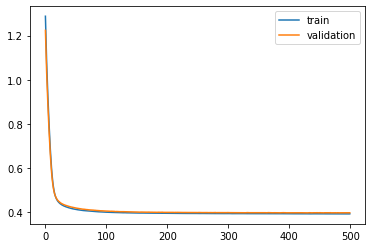

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7fa257762a58>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 45s - loss: 1.2886 - val_loss: 1.2194

Epoch 00001: val_loss improved from inf to 1.21944, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.1758 - val_loss: 1.1194

Epoch 00002: val_loss improved from 1.21944 to 1.11945, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.0810 - val_loss: 1.0341

Epoch 00003: val_loss improved from 1.11945 to 1.03410, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9999 - val_loss: 0.9590

Epoch 00004: val_loss improved from 1.03410 to 0.95898, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.9276 - val_loss: 0.8896

Epoch 00005: val_loss improved from 0.95898 to 0.88958, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8608 - val_loss: 0.8241

Epoch 00006: val_loss improved from 0.88958 to 0.82408, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7980 - val_loss: 0.7630

Epoch 00007: val_loss improved from 0.82408

 - 1s - loss: 0.4098 - val_loss: 0.4065

Epoch 00058: val_loss improved from 0.40680 to 0.40649, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4094 - val_loss: 0.4061

Epoch 00059: val_loss improved from 0.40649 to 0.40612, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4091 - val_loss: 0.4057

Epoch 00060: val_loss improved from 0.40612 to 0.40571, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4087 - val_loss: 0.4054

Epoch 00061: val_loss improved from 0.40571 to 0.40543, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4084 - val_loss: 0.4051

Epoch 00062: val_loss improved from 0.40543 to 0.40512, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4080 - val_loss: 0.4050

Epoch 00063: val_loss improved from 0.40512 to 0.40504, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4077 - val_loss: 0.4048

Epoch 00064: val_loss improved from 0.40504 to 0.40484, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3985 - val_loss: 0.3970

Epoch 00119: val_loss improved from 0.39719 to 0.39698, saving model to val_weights2.hdf5
Epoch 120/500
 - 1s - loss: 0.3985 - val_loss: 0.3971

Epoch 00120: val_loss did not improve from 0.39698
Epoch 121/500
 - 1s - loss: 0.3984 - val_loss: 0.3969

Epoch 00121: val_loss improved from 0.39698 to 0.39687, saving model to val_weights2.hdf5
Epoch 122/500
 - 1s - loss: 0.3984 - val_loss: 0.3973

Epoch 00122: val_loss did not improve from 0.39687
Epoch 123/500
 - 1s - loss: 0.3983 - val_loss: 0.3974

Epoch 00123: val_loss did not improve from 0.39687
Epoch 124/500
 - 1s - loss: 0.3983 - val_loss: 0.3969

Epoch 00124: val_loss did not improve from 0.39687
Epoch 125/500
 - 1s - loss: 0.3982 - val_loss: 0.3970

Epoch 00125: val_loss did not improve from 0.39687
Epoch 126/500
 - 1s - loss: 0.3982 - val_loss: 0.3965

Epoch 00126: val_loss improved from 0.39687 to 0.39654, saving model to val_weights2.hdf5
Epoch 127/500
 - 1s - loss: 0.3980 - val_loss: 0.

 - 1s - loss: 0.3955 - val_loss: 0.3945

Epoch 00189: val_loss did not improve from 0.39440
Epoch 190/500
 - 1s - loss: 0.3955 - val_loss: 0.3946

Epoch 00190: val_loss did not improve from 0.39440
Epoch 191/500
 - 1s - loss: 0.3955 - val_loss: 0.3945

Epoch 00191: val_loss did not improve from 0.39440
Epoch 192/500
 - 1s - loss: 0.3955 - val_loss: 0.3945

Epoch 00192: val_loss did not improve from 0.39440
Epoch 193/500
 - 1s - loss: 0.3955 - val_loss: 0.3944

Epoch 00193: val_loss improved from 0.39440 to 0.39436, saving model to val_weights2.hdf5
Epoch 194/500
 - 1s - loss: 0.3954 - val_loss: 0.3946

Epoch 00194: val_loss did not improve from 0.39436
Epoch 195/500
 - 1s - loss: 0.3955 - val_loss: 0.3946

Epoch 00195: val_loss did not improve from 0.39436
Epoch 196/500
 - 1s - loss: 0.3954 - val_loss: 0.3947

Epoch 00196: val_loss did not improve from 0.39436
Epoch 197/500
 - 1s - loss: 0.3955 - val_loss: 0.3942

Epoch 00197: val_loss improved from 0.39436 to 0.39417, saving model to 

 - 1s - loss: 0.3943 - val_loss: 0.3935

Epoch 00263: val_loss did not improve from 0.39331
Epoch 264/500
 - 1s - loss: 0.3943 - val_loss: 0.3933

Epoch 00264: val_loss improved from 0.39331 to 0.39325, saving model to val_weights2.hdf5
Epoch 265/500
 - 1s - loss: 0.3941 - val_loss: 0.3936

Epoch 00265: val_loss did not improve from 0.39325
Epoch 266/500
 - 1s - loss: 0.3943 - val_loss: 0.3936

Epoch 00266: val_loss did not improve from 0.39325
Epoch 267/500
 - 1s - loss: 0.3942 - val_loss: 0.3938

Epoch 00267: val_loss did not improve from 0.39325
Epoch 268/500
 - 1s - loss: 0.3944 - val_loss: 0.3934

Epoch 00268: val_loss did not improve from 0.39325
Epoch 269/500
 - 1s - loss: 0.3942 - val_loss: 0.3933

Epoch 00269: val_loss did not improve from 0.39325
Epoch 270/500
 - 1s - loss: 0.3942 - val_loss: 0.3937

Epoch 00270: val_loss did not improve from 0.39325
Epoch 271/500
 - 1s - loss: 0.3942 - val_loss: 0.3935

Epoch 00271: val_loss did not improve from 0.39325
Epoch 272/500
 - 1s -

 - 1s - loss: 0.3934 - val_loss: 0.3932

Epoch 00339: val_loss did not improve from 0.39258
Epoch 340/500
 - 1s - loss: 0.3935 - val_loss: 0.3932

Epoch 00340: val_loss did not improve from 0.39258
Epoch 341/500
 - 1s - loss: 0.3935 - val_loss: 0.3930

Epoch 00341: val_loss did not improve from 0.39258
Epoch 342/500
 - 1s - loss: 0.3934 - val_loss: 0.3932

Epoch 00342: val_loss did not improve from 0.39258
Epoch 343/500
 - 1s - loss: 0.3935 - val_loss: 0.3928

Epoch 00343: val_loss did not improve from 0.39258
Epoch 344/500
 - 1s - loss: 0.3934 - val_loss: 0.3930

Epoch 00344: val_loss did not improve from 0.39258
Epoch 345/500
 - 1s - loss: 0.3934 - val_loss: 0.3931

Epoch 00345: val_loss did not improve from 0.39258
Epoch 346/500
 - 1s - loss: 0.3934 - val_loss: 0.3930

Epoch 00346: val_loss did not improve from 0.39258
Epoch 347/500
 - 1s - loss: 0.3935 - val_loss: 0.3930

Epoch 00347: val_loss did not improve from 0.39258
Epoch 348/500
 - 1s - loss: 0.3933 - val_loss: 0.3931

Epoch

 - 1s - loss: 0.3930 - val_loss: 0.3925

Epoch 00416: val_loss did not improve from 0.39243
Epoch 417/500
 - 1s - loss: 0.3929 - val_loss: 0.3928

Epoch 00417: val_loss did not improve from 0.39243
Epoch 418/500
 - 1s - loss: 0.3929 - val_loss: 0.3929

Epoch 00418: val_loss did not improve from 0.39243
Epoch 419/500
 - 1s - loss: 0.3928 - val_loss: 0.3927

Epoch 00419: val_loss did not improve from 0.39243
Epoch 420/500
 - 1s - loss: 0.3929 - val_loss: 0.3926

Epoch 00420: val_loss did not improve from 0.39243
Epoch 421/500
 - 1s - loss: 0.3929 - val_loss: 0.3927

Epoch 00421: val_loss did not improve from 0.39243
Epoch 422/500
 - 1s - loss: 0.3930 - val_loss: 0.3930

Epoch 00422: val_loss did not improve from 0.39243
Epoch 423/500
 - 1s - loss: 0.3931 - val_loss: 0.3930

Epoch 00423: val_loss did not improve from 0.39243
Epoch 424/500
 - 1s - loss: 0.3931 - val_loss: 0.3926

Epoch 00424: val_loss did not improve from 0.39243
Epoch 425/500
 - 1s - loss: 0.3930 - val_loss: 0.3932

Epoch

 - 1s - loss: 0.3926 - val_loss: 0.3926

Epoch 00492: val_loss did not improve from 0.39223
Epoch 493/500
 - 1s - loss: 0.3926 - val_loss: 0.3925

Epoch 00493: val_loss did not improve from 0.39223
Epoch 494/500
 - 1s - loss: 0.3925 - val_loss: 0.3925

Epoch 00494: val_loss did not improve from 0.39223
Epoch 495/500
 - 1s - loss: 0.3925 - val_loss: 0.3928

Epoch 00495: val_loss did not improve from 0.39223
Epoch 496/500
 - 1s - loss: 0.3924 - val_loss: 0.3926

Epoch 00496: val_loss did not improve from 0.39223
Epoch 497/500
 - 1s - loss: 0.3926 - val_loss: 0.3926

Epoch 00497: val_loss did not improve from 0.39223
Epoch 498/500
 - 1s - loss: 0.3925 - val_loss: 0.3925

Epoch 00498: val_loss did not improve from 0.39223
Epoch 499/500
 - 1s - loss: 0.3926 - val_loss: 0.3926

Epoch 00499: val_loss did not improve from 0.39223
Epoch 500/500
 - 1s - loss: 0.3925 - val_loss: 0.3924

Epoch 00500: val_loss did not improve from 0.39223
#################################
Number of units: 4
Batch s

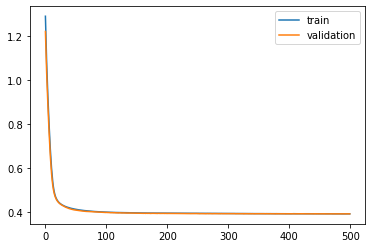

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 28s - loss: 1.2900 - val_loss: 1.2074

Epoch 00001: val_loss improved from inf to 1.20738, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.1774 - val_loss: 1.1057

Epoch 00002: val_loss improved from 1.20738 to 1.10574, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.0829 - val_loss: 1.0198

Epoch 00003: val_loss improved from 1.10574 to 1.01980, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 1.0018 - val_loss: 0.9453

Epoch 00004: val_loss improved from 1.01980 to 0.94531, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.9293 - val_loss: 0.8774

Epoch 00005: val_loss improved from 0.94531 to 0.87739, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8622 - val_loss: 0.8142

Epoch 00006: val_loss improved from 0.87739 to 0.81416, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7992 - val_loss: 0.7559

Epoch 00007: val_loss improved from 0.81416

 - 1s - loss: 0.4092 - val_loss: 0.4160

Epoch 00058: val_loss improved from 0.41622 to 0.41596, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4088 - val_loss: 0.4156

Epoch 00059: val_loss improved from 0.41596 to 0.41556, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4085 - val_loss: 0.4155

Epoch 00060: val_loss improved from 0.41556 to 0.41550, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4080 - val_loss: 0.4149

Epoch 00061: val_loss improved from 0.41550 to 0.41492, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4078 - val_loss: 0.4150

Epoch 00062: val_loss did not improve from 0.41492
Epoch 63/500
 - 1s - loss: 0.4075 - val_loss: 0.4147

Epoch 00063: val_loss improved from 0.41492 to 0.41466, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4071 - val_loss: 0.4142

Epoch 00064: val_loss improved from 0.41466 to 0.41421, saving model to val_weights3.hdf5
Epoch 65/500
 - 1s - loss: 0.4068 - val_loss


Epoch 00120: val_loss did not improve from 0.40668
Epoch 121/500
 - 1s - loss: 0.3976 - val_loss: 0.4064

Epoch 00121: val_loss improved from 0.40668 to 0.40640, saving model to val_weights3.hdf5
Epoch 122/500
 - 1s - loss: 0.3975 - val_loss: 0.4066

Epoch 00122: val_loss did not improve from 0.40640
Epoch 123/500
 - 1s - loss: 0.3975 - val_loss: 0.4064

Epoch 00123: val_loss improved from 0.40640 to 0.40637, saving model to val_weights3.hdf5
Epoch 124/500
 - 1s - loss: 0.3973 - val_loss: 0.4069

Epoch 00124: val_loss did not improve from 0.40637
Epoch 125/500
 - 1s - loss: 0.3974 - val_loss: 0.4063

Epoch 00125: val_loss improved from 0.40637 to 0.40631, saving model to val_weights3.hdf5
Epoch 126/500
 - 1s - loss: 0.3972 - val_loss: 0.4066

Epoch 00126: val_loss did not improve from 0.40631
Epoch 127/500
 - 1s - loss: 0.3971 - val_loss: 0.4064

Epoch 00127: val_loss did not improve from 0.40631
Epoch 128/500
 - 1s - loss: 0.3970 - val_loss: 0.4066

Epoch 00128: val_loss did not impr


Epoch 00189: val_loss improved from 0.40415 to 0.40408, saving model to val_weights3.hdf5
Epoch 190/500
 - 1s - loss: 0.3946 - val_loss: 0.4045

Epoch 00190: val_loss did not improve from 0.40408
Epoch 191/500
 - 1s - loss: 0.3946 - val_loss: 0.4043

Epoch 00191: val_loss did not improve from 0.40408
Epoch 192/500
 - 1s - loss: 0.3946 - val_loss: 0.4045

Epoch 00192: val_loss did not improve from 0.40408
Epoch 193/500
 - 1s - loss: 0.3946 - val_loss: 0.4042

Epoch 00193: val_loss did not improve from 0.40408
Epoch 194/500
 - 1s - loss: 0.3947 - val_loss: 0.4042

Epoch 00194: val_loss did not improve from 0.40408
Epoch 195/500
 - 1s - loss: 0.3944 - val_loss: 0.4042

Epoch 00195: val_loss did not improve from 0.40408
Epoch 196/500
 - 1s - loss: 0.3943 - val_loss: 0.4038

Epoch 00196: val_loss improved from 0.40408 to 0.40384, saving model to val_weights3.hdf5
Epoch 197/500
 - 1s - loss: 0.3945 - val_loss: 0.4042

Epoch 00197: val_loss did not improve from 0.40384
Epoch 198/500
 - 1s - 


Epoch 00264: val_loss improved from 0.40314 to 0.40312, saving model to val_weights3.hdf5
Epoch 265/500
 - 1s - loss: 0.3934 - val_loss: 0.4032

Epoch 00265: val_loss did not improve from 0.40312
Epoch 266/500
 - 1s - loss: 0.3934 - val_loss: 0.4034

Epoch 00266: val_loss did not improve from 0.40312
Epoch 267/500
 - 1s - loss: 0.3933 - val_loss: 0.4031

Epoch 00267: val_loss improved from 0.40312 to 0.40310, saving model to val_weights3.hdf5
Epoch 268/500
 - 1s - loss: 0.3933 - val_loss: 0.4034

Epoch 00268: val_loss did not improve from 0.40310
Epoch 269/500
 - 1s - loss: 0.3935 - val_loss: 0.4033

Epoch 00269: val_loss did not improve from 0.40310
Epoch 270/500
 - 1s - loss: 0.3933 - val_loss: 0.4030

Epoch 00270: val_loss improved from 0.40310 to 0.40296, saving model to val_weights3.hdf5
Epoch 271/500
 - 1s - loss: 0.3934 - val_loss: 0.4031

Epoch 00271: val_loss did not improve from 0.40296
Epoch 272/500
 - 1s - loss: 0.3934 - val_loss: 0.4031

Epoch 00272: val_loss did not impr


Epoch 00338: val_loss did not improve from 0.40233
Epoch 339/500
 - 1s - loss: 0.3929 - val_loss: 0.4021

Epoch 00339: val_loss improved from 0.40233 to 0.40214, saving model to val_weights3.hdf5
Epoch 340/500
 - 1s - loss: 0.3928 - val_loss: 0.4025

Epoch 00340: val_loss did not improve from 0.40214
Epoch 341/500
 - 1s - loss: 0.3928 - val_loss: 0.4025

Epoch 00341: val_loss did not improve from 0.40214
Epoch 342/500
 - 1s - loss: 0.3927 - val_loss: 0.4025

Epoch 00342: val_loss did not improve from 0.40214
Epoch 343/500
 - 1s - loss: 0.3927 - val_loss: 0.4024

Epoch 00343: val_loss did not improve from 0.40214
Epoch 344/500
 - 1s - loss: 0.3928 - val_loss: 0.4026

Epoch 00344: val_loss did not improve from 0.40214
Epoch 345/500
 - 1s - loss: 0.3928 - val_loss: 0.4026

Epoch 00345: val_loss did not improve from 0.40214
Epoch 346/500
 - 1s - loss: 0.3928 - val_loss: 0.4025

Epoch 00346: val_loss did not improve from 0.40214
Epoch 347/500
 - 1s - loss: 0.3928 - val_loss: 0.4023

Epoch 

 - 1s - loss: 0.3923 - val_loss: 0.4018

Epoch 00413: val_loss did not improve from 0.40124
Epoch 414/500
 - 1s - loss: 0.3921 - val_loss: 0.4015

Epoch 00414: val_loss did not improve from 0.40124
Epoch 415/500
 - 1s - loss: 0.3922 - val_loss: 0.4018

Epoch 00415: val_loss did not improve from 0.40124
Epoch 416/500
 - 1s - loss: 0.3922 - val_loss: 0.4019

Epoch 00416: val_loss did not improve from 0.40124
Epoch 417/500
 - 1s - loss: 0.3921 - val_loss: 0.4015

Epoch 00417: val_loss did not improve from 0.40124
Epoch 418/500
 - 1s - loss: 0.3921 - val_loss: 0.4018

Epoch 00418: val_loss did not improve from 0.40124
Epoch 419/500
 - 1s - loss: 0.3921 - val_loss: 0.4019

Epoch 00419: val_loss did not improve from 0.40124
Epoch 420/500
 - 1s - loss: 0.3922 - val_loss: 0.4015

Epoch 00420: val_loss did not improve from 0.40124
Epoch 421/500
 - 1s - loss: 0.3922 - val_loss: 0.4016

Epoch 00421: val_loss did not improve from 0.40124
Epoch 422/500
 - 1s - loss: 0.3921 - val_loss: 0.4014

Epoch

 - 1s - loss: 0.3918 - val_loss: 0.4010

Epoch 00490: val_loss improved from 0.40115 to 0.40099, saving model to val_weights3.hdf5
Epoch 491/500
 - 1s - loss: 0.3918 - val_loss: 0.4014

Epoch 00491: val_loss did not improve from 0.40099
Epoch 492/500
 - 1s - loss: 0.3918 - val_loss: 0.4014

Epoch 00492: val_loss did not improve from 0.40099
Epoch 493/500
 - 1s - loss: 0.3918 - val_loss: 0.4015

Epoch 00493: val_loss did not improve from 0.40099
Epoch 494/500
 - 1s - loss: 0.3916 - val_loss: 0.4016

Epoch 00494: val_loss did not improve from 0.40099
Epoch 495/500
 - 1s - loss: 0.3916 - val_loss: 0.4013

Epoch 00495: val_loss did not improve from 0.40099
Epoch 496/500
 - 1s - loss: 0.3917 - val_loss: 0.4016

Epoch 00496: val_loss did not improve from 0.40099
Epoch 497/500
 - 1s - loss: 0.3915 - val_loss: 0.4013

Epoch 00497: val_loss did not improve from 0.40099
Epoch 498/500
 - 1s - loss: 0.3917 - val_loss: 0.4016

Epoch 00498: val_loss did not improve from 0.40099
Epoch 499/500
 - 1s -

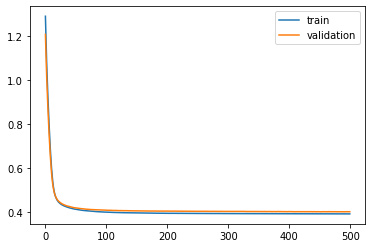

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 48s - loss: 1.2892 - val_loss: 1.2131

Epoch 00001: val_loss improved from inf to 1.21311, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.1768 - val_loss: 1.1110

Epoch 00002: val_loss improved from 1.21311 to 1.11095, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.0823 - val_loss: 1.0250

Epoch 00003: val_loss improved from 1.11095 to 1.02496, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 1.0011 - val_loss: 0.9496

Epoch 00004: val_loss improved from 1.02496 to 0.94965, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.9287 - val_loss: 0.8807

Epoch 00005: val_loss improved from 0.94965 to 0.88073, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8617 - val_loss: 0.8161

Epoch 00006: val_loss improved from 0.88073 to 0.81607, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7990 - val_loss: 0.7556

Epoch 00007: val_loss improved from 0.81607

 - 1s - loss: 0.4100 - val_loss: 0.4085

Epoch 00058: val_loss improved from 0.40906 to 0.40852, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4095 - val_loss: 0.4083

Epoch 00059: val_loss improved from 0.40852 to 0.40833, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4092 - val_loss: 0.4079

Epoch 00060: val_loss improved from 0.40833 to 0.40789, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4089 - val_loss: 0.4075

Epoch 00061: val_loss improved from 0.40789 to 0.40754, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4085 - val_loss: 0.4069

Epoch 00062: val_loss improved from 0.40754 to 0.40686, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4084 - val_loss: 0.4070

Epoch 00063: val_loss did not improve from 0.40686
Epoch 64/500
 - 1s - loss: 0.4080 - val_loss: 0.4066

Epoch 00064: val_loss improved from 0.40686 to 0.40663, saving model to val_weights4.hdf5
Epoch 65/500
 - 1s - loss: 0.4077 - val_loss

 - 1s - loss: 0.3985 - val_loss: 0.3969

Epoch 00122: val_loss did not improve from 0.39650
Epoch 123/500
 - 1s - loss: 0.3984 - val_loss: 0.3969

Epoch 00123: val_loss did not improve from 0.39650
Epoch 124/500
 - 1s - loss: 0.3983 - val_loss: 0.3962

Epoch 00124: val_loss improved from 0.39650 to 0.39618, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3982 - val_loss: 0.3970

Epoch 00125: val_loss did not improve from 0.39618
Epoch 126/500
 - 1s - loss: 0.3981 - val_loss: 0.3963

Epoch 00126: val_loss did not improve from 0.39618
Epoch 127/500
 - 1s - loss: 0.3982 - val_loss: 0.3967

Epoch 00127: val_loss did not improve from 0.39618
Epoch 128/500
 - 1s - loss: 0.3980 - val_loss: 0.3962

Epoch 00128: val_loss did not improve from 0.39618
Epoch 129/500
 - 1s - loss: 0.3979 - val_loss: 0.3964

Epoch 00129: val_loss did not improve from 0.39618
Epoch 130/500
 - 1s - loss: 0.3978 - val_loss: 0.3962

Epoch 00130: val_loss did not improve from 0.39618
Epoch 131/500
 - 1s -

 - 1s - loss: 0.3956 - val_loss: 0.3952

Epoch 00195: val_loss did not improve from 0.39492
Epoch 196/500
 - 1s - loss: 0.3956 - val_loss: 0.3952

Epoch 00196: val_loss did not improve from 0.39492
Epoch 197/500
 - 1s - loss: 0.3957 - val_loss: 0.3952

Epoch 00197: val_loss did not improve from 0.39492
Epoch 198/500
 - 1s - loss: 0.3956 - val_loss: 0.3949

Epoch 00198: val_loss improved from 0.39492 to 0.39488, saving model to val_weights4.hdf5
Epoch 199/500
 - 1s - loss: 0.3955 - val_loss: 0.3953

Epoch 00199: val_loss did not improve from 0.39488
Epoch 200/500
 - 1s - loss: 0.3955 - val_loss: 0.3949

Epoch 00200: val_loss did not improve from 0.39488
Epoch 201/500
 - 1s - loss: 0.3954 - val_loss: 0.3953

Epoch 00201: val_loss did not improve from 0.39488
Epoch 202/500
 - 1s - loss: 0.3954 - val_loss: 0.3948

Epoch 00202: val_loss improved from 0.39488 to 0.39479, saving model to val_weights4.hdf5
Epoch 203/500
 - 1s - loss: 0.3954 - val_loss: 0.3951

Epoch 00203: val_loss did not imp

 - 1s - loss: 0.3946 - val_loss: 0.3941

Epoch 00269: val_loss did not improve from 0.39384
Epoch 270/500
 - 1s - loss: 0.3945 - val_loss: 0.3942

Epoch 00270: val_loss did not improve from 0.39384
Epoch 271/500
 - 1s - loss: 0.3945 - val_loss: 0.3941

Epoch 00271: val_loss did not improve from 0.39384
Epoch 272/500
 - 1s - loss: 0.3945 - val_loss: 0.3942

Epoch 00272: val_loss did not improve from 0.39384
Epoch 273/500
 - 1s - loss: 0.3944 - val_loss: 0.3943

Epoch 00273: val_loss did not improve from 0.39384
Epoch 274/500
 - 1s - loss: 0.3945 - val_loss: 0.3944

Epoch 00274: val_loss did not improve from 0.39384
Epoch 275/500
 - 1s - loss: 0.3944 - val_loss: 0.3940

Epoch 00275: val_loss did not improve from 0.39384
Epoch 276/500
 - 1s - loss: 0.3944 - val_loss: 0.3945

Epoch 00276: val_loss did not improve from 0.39384
Epoch 277/500
 - 1s - loss: 0.3945 - val_loss: 0.3938

Epoch 00277: val_loss did not improve from 0.39384
Epoch 278/500
 - 1s - loss: 0.3946 - val_loss: 0.3944

Epoch


Epoch 00345: val_loss did not improve from 0.39369
Epoch 346/500
 - 1s - loss: 0.3940 - val_loss: 0.3937

Epoch 00346: val_loss did not improve from 0.39369
Epoch 347/500
 - 1s - loss: 0.3940 - val_loss: 0.3936

Epoch 00347: val_loss improved from 0.39369 to 0.39359, saving model to val_weights4.hdf5
Epoch 348/500
 - 1s - loss: 0.3939 - val_loss: 0.3934

Epoch 00348: val_loss improved from 0.39359 to 0.39340, saving model to val_weights4.hdf5
Epoch 349/500
 - 1s - loss: 0.3939 - val_loss: 0.3933

Epoch 00349: val_loss improved from 0.39340 to 0.39335, saving model to val_weights4.hdf5
Epoch 350/500
 - 1s - loss: 0.3939 - val_loss: 0.3935

Epoch 00350: val_loss did not improve from 0.39335
Epoch 351/500
 - 1s - loss: 0.3939 - val_loss: 0.3935

Epoch 00351: val_loss did not improve from 0.39335
Epoch 352/500
 - 1s - loss: 0.3939 - val_loss: 0.3938

Epoch 00352: val_loss did not improve from 0.39335
Epoch 353/500
 - 1s - loss: 0.3938 - val_loss: 0.3936

Epoch 00353: val_loss did not impr

 - 1s - loss: 0.3933 - val_loss: 0.3937

Epoch 00421: val_loss did not improve from 0.39326
Epoch 422/500
 - 1s - loss: 0.3933 - val_loss: 0.3942

Epoch 00422: val_loss did not improve from 0.39326
Epoch 423/500
 - 1s - loss: 0.3934 - val_loss: 0.3934

Epoch 00423: val_loss did not improve from 0.39326
Epoch 424/500
 - 1s - loss: 0.3934 - val_loss: 0.3939

Epoch 00424: val_loss did not improve from 0.39326
Epoch 425/500
 - 1s - loss: 0.3933 - val_loss: 0.3937

Epoch 00425: val_loss did not improve from 0.39326
Epoch 426/500
 - 1s - loss: 0.3932 - val_loss: 0.3941

Epoch 00426: val_loss did not improve from 0.39326
Epoch 427/500
 - 1s - loss: 0.3933 - val_loss: 0.3937

Epoch 00427: val_loss did not improve from 0.39326
Epoch 428/500
 - 1s - loss: 0.3931 - val_loss: 0.3933

Epoch 00428: val_loss did not improve from 0.39326
Epoch 429/500
 - 1s - loss: 0.3932 - val_loss: 0.3939

Epoch 00429: val_loss did not improve from 0.39326
Epoch 430/500
 - 1s - loss: 0.3933 - val_loss: 0.3937

Epoch

 - 1s - loss: 0.3928 - val_loss: 0.3930

Epoch 00498: val_loss improved from 0.39310 to 0.39298, saving model to val_weights4.hdf5
Epoch 499/500
 - 1s - loss: 0.3927 - val_loss: 0.3930

Epoch 00499: val_loss improved from 0.39298 to 0.39296, saving model to val_weights4.hdf5
Epoch 500/500
 - 1s - loss: 0.3927 - val_loss: 0.3935

Epoch 00500: val_loss did not improve from 0.39296
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.014527062799015618
best val loss: 0.39296411087777877
#################################


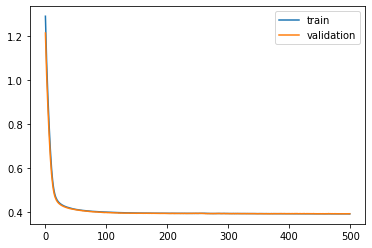

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 35s - loss: 1.2896 - val_loss: 1.2113

Epoch 00001: val_loss improved from inf to 1.21130, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.1770 - val_loss: 1.1108

Epoch 00002: val_loss improved from 1.21130 to 1.11079, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0825 - val_loss: 1.0258

Epoch 00003: val_loss improved from 1.11079 to 1.02578, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 1.0013 - val_loss: 0.9509

Epoch 00004: val_loss improved from 1.02578 to 0.95094, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.9290 - val_loss: 0.8829

Epoch 00005: val_loss improved from 0.95094 to 0.88293, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8620 - val_loss: 0.8193

Epoch 00006: val_loss improved from 0.88293 to 0.81932, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7991 - val_loss: 0.7596

Epoch 00007: val_loss improved from 0.81932

 - 1s - loss: 0.4096 - val_loss: 0.4124

Epoch 00058: val_loss improved from 0.41278 to 0.41241, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4093 - val_loss: 0.4125

Epoch 00059: val_loss did not improve from 0.41241
Epoch 60/500
 - 1s - loss: 0.4088 - val_loss: 0.4119

Epoch 00060: val_loss improved from 0.41241 to 0.41190, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4085 - val_loss: 0.4123

Epoch 00061: val_loss did not improve from 0.41190
Epoch 62/500
 - 1s - loss: 0.4082 - val_loss: 0.4114

Epoch 00062: val_loss improved from 0.41190 to 0.41137, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4079 - val_loss: 0.4116

Epoch 00063: val_loss did not improve from 0.41137
Epoch 64/500
 - 1s - loss: 0.4074 - val_loss: 0.4111

Epoch 00064: val_loss improved from 0.41137 to 0.41107, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4071 - val_loss: 0.4110

Epoch 00065: val_loss improved from 0.41107 to 0.41098, saving model

 - 1s - loss: 0.3983 - val_loss: 0.4023

Epoch 00121: val_loss did not improve from 0.40222
Epoch 122/500
 - 1s - loss: 0.3982 - val_loss: 0.4022

Epoch 00122: val_loss did not improve from 0.40222
Epoch 123/500
 - 1s - loss: 0.3983 - val_loss: 0.4023

Epoch 00123: val_loss did not improve from 0.40222
Epoch 124/500
 - 1s - loss: 0.3981 - val_loss: 0.4022

Epoch 00124: val_loss did not improve from 0.40222
Epoch 125/500
 - 1s - loss: 0.3980 - val_loss: 0.4023

Epoch 00125: val_loss did not improve from 0.40222
Epoch 126/500
 - 1s - loss: 0.3979 - val_loss: 0.4020

Epoch 00126: val_loss improved from 0.40222 to 0.40196, saving model to val_weights5.hdf5
Epoch 127/500
 - 1s - loss: 0.3978 - val_loss: 0.4016

Epoch 00127: val_loss improved from 0.40196 to 0.40164, saving model to val_weights5.hdf5
Epoch 128/500
 - 1s - loss: 0.3978 - val_loss: 0.4021

Epoch 00128: val_loss did not improve from 0.40164
Epoch 129/500
 - 1s - loss: 0.3977 - val_loss: 0.4020

Epoch 00129: val_loss did not imp

 - 1s - loss: 0.3953 - val_loss: 0.3991

Epoch 00191: val_loss improved from 0.39922 to 0.39912, saving model to val_weights5.hdf5
Epoch 192/500
 - 1s - loss: 0.3950 - val_loss: 0.3993

Epoch 00192: val_loss did not improve from 0.39912
Epoch 193/500
 - 1s - loss: 0.3952 - val_loss: 0.3993

Epoch 00193: val_loss did not improve from 0.39912
Epoch 194/500
 - 1s - loss: 0.3951 - val_loss: 0.3989

Epoch 00194: val_loss improved from 0.39912 to 0.39892, saving model to val_weights5.hdf5
Epoch 195/500
 - 1s - loss: 0.3949 - val_loss: 0.3992

Epoch 00195: val_loss did not improve from 0.39892
Epoch 196/500
 - 1s - loss: 0.3950 - val_loss: 0.3990

Epoch 00196: val_loss did not improve from 0.39892
Epoch 197/500
 - 1s - loss: 0.3951 - val_loss: 0.3991

Epoch 00197: val_loss did not improve from 0.39892
Epoch 198/500
 - 1s - loss: 0.3949 - val_loss: 0.3990

Epoch 00198: val_loss did not improve from 0.39892
Epoch 199/500
 - 1s - loss: 0.3949 - val_loss: 0.3992

Epoch 00199: val_loss did not imp

 - 1s - loss: 0.3938 - val_loss: 0.3980

Epoch 00264: val_loss did not improve from 0.39789
Epoch 265/500
 - 1s - loss: 0.3937 - val_loss: 0.3979

Epoch 00265: val_loss did not improve from 0.39789
Epoch 266/500
 - 1s - loss: 0.3938 - val_loss: 0.3980

Epoch 00266: val_loss did not improve from 0.39789
Epoch 267/500
 - 1s - loss: 0.3936 - val_loss: 0.3976

Epoch 00267: val_loss improved from 0.39789 to 0.39759, saving model to val_weights5.hdf5
Epoch 268/500
 - 1s - loss: 0.3938 - val_loss: 0.3981

Epoch 00268: val_loss did not improve from 0.39759
Epoch 269/500
 - 1s - loss: 0.3937 - val_loss: 0.3980

Epoch 00269: val_loss did not improve from 0.39759
Epoch 270/500
 - 1s - loss: 0.3939 - val_loss: 0.3978

Epoch 00270: val_loss did not improve from 0.39759
Epoch 271/500
 - 1s - loss: 0.3938 - val_loss: 0.3980

Epoch 00271: val_loss did not improve from 0.39759
Epoch 272/500
 - 1s - loss: 0.3936 - val_loss: 0.3979

Epoch 00272: val_loss did not improve from 0.39759
Epoch 273/500
 - 1s -

 - 1s - loss: 0.3930 - val_loss: 0.3973

Epoch 00338: val_loss did not improve from 0.39688
Epoch 339/500
 - 1s - loss: 0.3929 - val_loss: 0.3973

Epoch 00339: val_loss did not improve from 0.39688
Epoch 340/500
 - 1s - loss: 0.3929 - val_loss: 0.3970

Epoch 00340: val_loss did not improve from 0.39688
Epoch 341/500
 - 1s - loss: 0.3930 - val_loss: 0.3972

Epoch 00341: val_loss did not improve from 0.39688
Epoch 342/500
 - 1s - loss: 0.3930 - val_loss: 0.3972

Epoch 00342: val_loss did not improve from 0.39688
Epoch 343/500
 - 1s - loss: 0.3930 - val_loss: 0.3974

Epoch 00343: val_loss did not improve from 0.39688
Epoch 344/500
 - 1s - loss: 0.3930 - val_loss: 0.3973

Epoch 00344: val_loss did not improve from 0.39688
Epoch 345/500
 - 1s - loss: 0.3929 - val_loss: 0.3970

Epoch 00345: val_loss did not improve from 0.39688
Epoch 346/500
 - 1s - loss: 0.3929 - val_loss: 0.3968

Epoch 00346: val_loss improved from 0.39688 to 0.39678, saving model to val_weights5.hdf5
Epoch 347/500
 - 1s -

 - 1s - loss: 0.3925 - val_loss: 0.3970

Epoch 00414: val_loss did not improve from 0.39650
Epoch 415/500
 - 1s - loss: 0.3924 - val_loss: 0.3969

Epoch 00415: val_loss did not improve from 0.39650
Epoch 416/500
 - 1s - loss: 0.3923 - val_loss: 0.3971

Epoch 00416: val_loss did not improve from 0.39650
Epoch 417/500
 - 1s - loss: 0.3925 - val_loss: 0.3972

Epoch 00417: val_loss did not improve from 0.39650
Epoch 418/500
 - 1s - loss: 0.3923 - val_loss: 0.3972

Epoch 00418: val_loss did not improve from 0.39650
Epoch 419/500
 - 1s - loss: 0.3924 - val_loss: 0.3967

Epoch 00419: val_loss did not improve from 0.39650
Epoch 420/500
 - 1s - loss: 0.3923 - val_loss: 0.3968

Epoch 00420: val_loss did not improve from 0.39650
Epoch 421/500
 - 1s - loss: 0.3922 - val_loss: 0.3966

Epoch 00421: val_loss did not improve from 0.39650
Epoch 422/500
 - 1s - loss: 0.3922 - val_loss: 0.3974

Epoch 00422: val_loss did not improve from 0.39650
Epoch 423/500
 - 1s - loss: 0.3925 - val_loss: 0.3970

Epoch


Epoch 00490: val_loss did not improve from 0.39621
Epoch 491/500
 - 1s - loss: 0.3919 - val_loss: 0.3966

Epoch 00491: val_loss did not improve from 0.39621
Epoch 492/500
 - 1s - loss: 0.3920 - val_loss: 0.3966

Epoch 00492: val_loss did not improve from 0.39621
Epoch 493/500
 - 1s - loss: 0.3918 - val_loss: 0.3966

Epoch 00493: val_loss did not improve from 0.39621
Epoch 494/500
 - 1s - loss: 0.3920 - val_loss: 0.3967

Epoch 00494: val_loss did not improve from 0.39621
Epoch 495/500
 - 1s - loss: 0.3919 - val_loss: 0.3964

Epoch 00495: val_loss did not improve from 0.39621
Epoch 496/500
 - 1s - loss: 0.3918 - val_loss: 0.3964

Epoch 00496: val_loss did not improve from 0.39621
Epoch 497/500
 - 1s - loss: 0.3919 - val_loss: 0.3965

Epoch 00497: val_loss did not improve from 0.39621
Epoch 498/500
 - 1s - loss: 0.3920 - val_loss: 0.3969

Epoch 00498: val_loss did not improve from 0.39621
Epoch 499/500
 - 1s - loss: 0.3921 - val_loss: 0.3965

Epoch 00499: val_loss did not improve from 0.

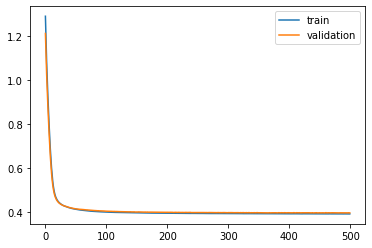

Time to train LSTM:  403.4103670120239
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 28s - loss: 1.0581 - val_loss: 1.0116

Epoch 00001: val_loss improved from inf to 1.01160, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 0.9766 - val_loss: 0.9391

Epoch 00002: val_loss improved from 1.01160 to 0.93913, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9119 - val_loss: 0.8805

Epoch 00003: val_loss improved from 0.93913 to 0.88050, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.8580 - val_loss: 0.8304

Epoch 00004: val_loss improved from 0.88050 to 0.83035, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8096 - val_loss: 0.7838

Epoch 00005: val_loss improved from 0.83035 to 0.78381, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.7638 - val_loss: 0.7395

Epoch 00006: val_loss improved from 0.78381 to 0.73950, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7198 - val_loss: 0.6972

Epoc


Epoch 00057: val_loss improved from 0.41591 to 0.41554, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4073 - val_loss: 0.4149

Epoch 00058: val_loss improved from 0.41554 to 0.41487, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4069 - val_loss: 0.4145

Epoch 00059: val_loss improved from 0.41487 to 0.41453, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4066 - val_loss: 0.4143

Epoch 00060: val_loss improved from 0.41453 to 0.41430, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4062 - val_loss: 0.4137

Epoch 00061: val_loss improved from 0.41430 to 0.41366, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4059 - val_loss: 0.4134

Epoch 00062: val_loss improved from 0.41366 to 0.41345, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4055 - val_loss: 0.4131

Epoch 00063: val_loss improved from 0.41345 to 0.41308, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4052 - val_loss:

 - 1s - loss: 0.3965 - val_loss: 0.4028

Epoch 00117: val_loss improved from 0.40293 to 0.40284, saving model to val_weights1.hdf5
Epoch 118/500
 - 1s - loss: 0.3963 - val_loss: 0.4029

Epoch 00118: val_loss did not improve from 0.40284
Epoch 119/500
 - 1s - loss: 0.3962 - val_loss: 0.4026

Epoch 00119: val_loss improved from 0.40284 to 0.40262, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.3962 - val_loss: 0.4028

Epoch 00120: val_loss did not improve from 0.40262
Epoch 121/500
 - 1s - loss: 0.3961 - val_loss: 0.4026

Epoch 00121: val_loss did not improve from 0.40262
Epoch 122/500
 - 1s - loss: 0.3959 - val_loss: 0.4023

Epoch 00122: val_loss improved from 0.40262 to 0.40225, saving model to val_weights1.hdf5
Epoch 123/500
 - 1s - loss: 0.3959 - val_loss: 0.4023

Epoch 00123: val_loss did not improve from 0.40225
Epoch 124/500
 - 1s - loss: 0.3958 - val_loss: 0.4023

Epoch 00124: val_loss did not improve from 0.40225
Epoch 125/500
 - 1s - loss: 0.3958 - val_loss: 0.


Epoch 00185: val_loss did not improve from 0.39917
Epoch 186/500
 - 1s - loss: 0.3926 - val_loss: 0.3995

Epoch 00186: val_loss did not improve from 0.39917
Epoch 187/500
 - 1s - loss: 0.3924 - val_loss: 0.3993

Epoch 00187: val_loss did not improve from 0.39917
Epoch 188/500
 - 1s - loss: 0.3924 - val_loss: 0.3994

Epoch 00188: val_loss did not improve from 0.39917
Epoch 189/500
 - 1s - loss: 0.3925 - val_loss: 0.3993

Epoch 00189: val_loss did not improve from 0.39917
Epoch 190/500
 - 1s - loss: 0.3926 - val_loss: 0.3993

Epoch 00190: val_loss did not improve from 0.39917
Epoch 191/500
 - 1s - loss: 0.3924 - val_loss: 0.3993

Epoch 00191: val_loss did not improve from 0.39917
Epoch 192/500
 - 1s - loss: 0.3925 - val_loss: 0.3991

Epoch 00192: val_loss improved from 0.39917 to 0.39906, saving model to val_weights1.hdf5
Epoch 193/500
 - 1s - loss: 0.3923 - val_loss: 0.3994

Epoch 00193: val_loss did not improve from 0.39906
Epoch 194/500
 - 1s - loss: 0.3923 - val_loss: 0.3993

Epoch 

 - 1s - loss: 0.3914 - val_loss: 0.3978

Epoch 00259: val_loss improved from 0.39811 to 0.39785, saving model to val_weights1.hdf5
Epoch 260/500
 - 1s - loss: 0.3915 - val_loss: 0.3982

Epoch 00260: val_loss did not improve from 0.39785
Epoch 261/500
 - 1s - loss: 0.3912 - val_loss: 0.3979

Epoch 00261: val_loss did not improve from 0.39785
Epoch 262/500
 - 1s - loss: 0.3914 - val_loss: 0.3979

Epoch 00262: val_loss did not improve from 0.39785
Epoch 263/500
 - 1s - loss: 0.3912 - val_loss: 0.3975

Epoch 00263: val_loss improved from 0.39785 to 0.39753, saving model to val_weights1.hdf5
Epoch 264/500
 - 1s - loss: 0.3913 - val_loss: 0.3980

Epoch 00264: val_loss did not improve from 0.39753
Epoch 265/500
 - 1s - loss: 0.3913 - val_loss: 0.3975

Epoch 00265: val_loss improved from 0.39753 to 0.39746, saving model to val_weights1.hdf5
Epoch 266/500
 - 1s - loss: 0.3912 - val_loss: 0.3979

Epoch 00266: val_loss did not improve from 0.39746
Epoch 267/500
 - 1s - loss: 0.3912 - val_loss: 0.

 - 1s - loss: 0.3903 - val_loss: 0.3973

Epoch 00333: val_loss did not improve from 0.39675
Epoch 334/500
 - 1s - loss: 0.3901 - val_loss: 0.3971

Epoch 00334: val_loss did not improve from 0.39675
Epoch 335/500
 - 1s - loss: 0.3903 - val_loss: 0.3969

Epoch 00335: val_loss did not improve from 0.39675
Epoch 336/500
 - 1s - loss: 0.3901 - val_loss: 0.3973

Epoch 00336: val_loss did not improve from 0.39675
Epoch 337/500
 - 1s - loss: 0.3902 - val_loss: 0.3971

Epoch 00337: val_loss did not improve from 0.39675
Epoch 338/500
 - 1s - loss: 0.3903 - val_loss: 0.3968

Epoch 00338: val_loss did not improve from 0.39675
Epoch 339/500
 - 1s - loss: 0.3902 - val_loss: 0.3972

Epoch 00339: val_loss did not improve from 0.39675
Epoch 340/500
 - 1s - loss: 0.3903 - val_loss: 0.3973

Epoch 00340: val_loss did not improve from 0.39675
Epoch 341/500
 - 1s - loss: 0.3901 - val_loss: 0.3971

Epoch 00341: val_loss did not improve from 0.39675
Epoch 342/500
 - 1s - loss: 0.3901 - val_loss: 0.3969

Epoch


Epoch 00409: val_loss did not improve from 0.39606
Epoch 410/500
 - 1s - loss: 0.3895 - val_loss: 0.3965

Epoch 00410: val_loss did not improve from 0.39606
Epoch 411/500
 - 1s - loss: 0.3894 - val_loss: 0.3965

Epoch 00411: val_loss did not improve from 0.39606
Epoch 412/500
 - 1s - loss: 0.3893 - val_loss: 0.3964

Epoch 00412: val_loss did not improve from 0.39606
Epoch 413/500
 - 1s - loss: 0.3890 - val_loss: 0.3965

Epoch 00413: val_loss did not improve from 0.39606
Epoch 414/500
 - 1s - loss: 0.3891 - val_loss: 0.3965

Epoch 00414: val_loss did not improve from 0.39606
Epoch 415/500
 - 1s - loss: 0.3891 - val_loss: 0.3966

Epoch 00415: val_loss did not improve from 0.39606
Epoch 416/500
 - 1s - loss: 0.3892 - val_loss: 0.3963

Epoch 00416: val_loss did not improve from 0.39606
Epoch 417/500
 - 1s - loss: 0.3893 - val_loss: 0.3965

Epoch 00417: val_loss did not improve from 0.39606
Epoch 418/500
 - 1s - loss: 0.3893 - val_loss: 0.3964

Epoch 00418: val_loss did not improve from 0.

 - 1s - loss: 0.3887 - val_loss: 0.3963

Epoch 00486: val_loss did not improve from 0.39600
Epoch 487/500
 - 1s - loss: 0.3887 - val_loss: 0.3969

Epoch 00487: val_loss did not improve from 0.39600
Epoch 488/500
 - 1s - loss: 0.3888 - val_loss: 0.3965

Epoch 00488: val_loss did not improve from 0.39600
Epoch 489/500
 - 1s - loss: 0.3887 - val_loss: 0.3960

Epoch 00489: val_loss did not improve from 0.39600
Epoch 490/500
 - 1s - loss: 0.3885 - val_loss: 0.3964

Epoch 00490: val_loss did not improve from 0.39600
Epoch 491/500
 - 1s - loss: 0.3888 - val_loss: 0.3963

Epoch 00491: val_loss did not improve from 0.39600
Epoch 492/500
 - 1s - loss: 0.3887 - val_loss: 0.3964

Epoch 00492: val_loss did not improve from 0.39600
Epoch 493/500
 - 1s - loss: 0.3886 - val_loss: 0.3963

Epoch 00493: val_loss did not improve from 0.39600
Epoch 494/500
 - 1s - loss: 0.3886 - val_loss: 0.3960

Epoch 00494: val_loss improved from 0.39600 to 0.39597, saving model to val_weights1.hdf5
Epoch 495/500
 - 1s -

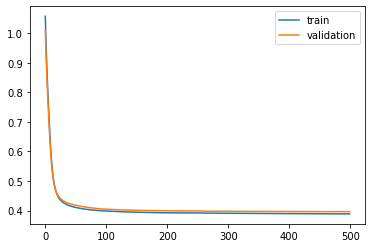

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 29s - loss: 1.0588 - val_loss: 1.0075

Epoch 00001: val_loss improved from inf to 1.00747, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 0.9772 - val_loss: 0.9380

Epoch 00002: val_loss improved from 1.00747 to 0.93797, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9121 - val_loss: 0.8810

Epoch 00003: val_loss improved from 0.93797 to 0.88103, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.8581 - val_loss: 0.8309

Epoch 00004: val_loss improved from 0.88103 to 0.83092, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8096 - val_loss: 0.7839

Epoch 00005: val_loss improved from 0.83092 to 0.78388, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.7640 - val_loss: 0.7383

Epoch 00006: val_loss improved from 0.78388 to 0.73830, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7202 - val_loss: 0.6948

Epoch 00007: val_loss improved from 0.73830

 - 1s - loss: 0.4080 - val_loss: 0.4061

Epoch 00058: val_loss improved from 0.40653 to 0.40614, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4075 - val_loss: 0.4059

Epoch 00059: val_loss improved from 0.40614 to 0.40588, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4071 - val_loss: 0.4055

Epoch 00060: val_loss improved from 0.40588 to 0.40549, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4068 - val_loss: 0.4053

Epoch 00061: val_loss improved from 0.40549 to 0.40526, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4065 - val_loss: 0.4050

Epoch 00062: val_loss improved from 0.40526 to 0.40505, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4062 - val_loss: 0.4048

Epoch 00063: val_loss improved from 0.40505 to 0.40483, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4058 - val_loss: 0.4043

Epoch 00064: val_loss improved from 0.40483 to 0.40425, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3968 - val_loss: 0.3964

Epoch 00119: val_loss did not improve from 0.39636
Epoch 120/500
 - 1s - loss: 0.3967 - val_loss: 0.3962

Epoch 00120: val_loss improved from 0.39636 to 0.39619, saving model to val_weights2.hdf5
Epoch 121/500
 - 1s - loss: 0.3967 - val_loss: 0.3964

Epoch 00121: val_loss did not improve from 0.39619
Epoch 122/500
 - 1s - loss: 0.3966 - val_loss: 0.3960

Epoch 00122: val_loss improved from 0.39619 to 0.39601, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3965 - val_loss: 0.3965

Epoch 00123: val_loss did not improve from 0.39601
Epoch 124/500
 - 1s - loss: 0.3964 - val_loss: 0.3960

Epoch 00124: val_loss did not improve from 0.39601
Epoch 125/500
 - 1s - loss: 0.3963 - val_loss: 0.3962

Epoch 00125: val_loss did not improve from 0.39601
Epoch 126/500
 - 1s - loss: 0.3963 - val_loss: 0.3961

Epoch 00126: val_loss did not improve from 0.39601
Epoch 127/500
 - 1s - loss: 0.3961 - val_loss: 0.3962

Epoch 00127: val_loss did not imp

 - 1s - loss: 0.3932 - val_loss: 0.3932

Epoch 00186: val_loss improved from 0.39326 to 0.39323, saving model to val_weights2.hdf5
Epoch 187/500
 - 1s - loss: 0.3931 - val_loss: 0.3933

Epoch 00187: val_loss did not improve from 0.39323
Epoch 188/500
 - 1s - loss: 0.3932 - val_loss: 0.3934

Epoch 00188: val_loss did not improve from 0.39323
Epoch 189/500
 - 1s - loss: 0.3931 - val_loss: 0.3935

Epoch 00189: val_loss did not improve from 0.39323
Epoch 190/500
 - 1s - loss: 0.3931 - val_loss: 0.3934

Epoch 00190: val_loss did not improve from 0.39323
Epoch 191/500
 - 1s - loss: 0.3931 - val_loss: 0.3934

Epoch 00191: val_loss did not improve from 0.39323
Epoch 192/500
 - 1s - loss: 0.3931 - val_loss: 0.3935

Epoch 00192: val_loss did not improve from 0.39323
Epoch 193/500
 - 1s - loss: 0.3931 - val_loss: 0.3934

Epoch 00193: val_loss did not improve from 0.39323
Epoch 194/500
 - 1s - loss: 0.3931 - val_loss: 0.3930

Epoch 00194: val_loss improved from 0.39323 to 0.39304, saving model to 

 - 1s - loss: 0.3917 - val_loss: 0.3929

Epoch 00261: val_loss did not improve from 0.39246
Epoch 262/500
 - 1s - loss: 0.3918 - val_loss: 0.3929

Epoch 00262: val_loss did not improve from 0.39246
Epoch 263/500
 - 1s - loss: 0.3916 - val_loss: 0.3926

Epoch 00263: val_loss did not improve from 0.39246
Epoch 264/500
 - 1s - loss: 0.3917 - val_loss: 0.3927

Epoch 00264: val_loss did not improve from 0.39246
Epoch 265/500
 - 1s - loss: 0.3917 - val_loss: 0.3929

Epoch 00265: val_loss did not improve from 0.39246
Epoch 266/500
 - 1s - loss: 0.3919 - val_loss: 0.3928

Epoch 00266: val_loss did not improve from 0.39246
Epoch 267/500
 - 1s - loss: 0.3916 - val_loss: 0.3929

Epoch 00267: val_loss did not improve from 0.39246
Epoch 268/500
 - 1s - loss: 0.3916 - val_loss: 0.3930

Epoch 00268: val_loss did not improve from 0.39246
Epoch 269/500
 - 1s - loss: 0.3915 - val_loss: 0.3929

Epoch 00269: val_loss did not improve from 0.39246
Epoch 270/500
 - 1s - loss: 0.3915 - val_loss: 0.3927

Epoch

 - 1s - loss: 0.3908 - val_loss: 0.3927

Epoch 00338: val_loss did not improve from 0.39242
Epoch 339/500
 - 1s - loss: 0.3907 - val_loss: 0.3923

Epoch 00339: val_loss improved from 0.39242 to 0.39232, saving model to val_weights2.hdf5
Epoch 340/500
 - 1s - loss: 0.3907 - val_loss: 0.3925

Epoch 00340: val_loss did not improve from 0.39232
Epoch 341/500
 - 1s - loss: 0.3908 - val_loss: 0.3926

Epoch 00341: val_loss did not improve from 0.39232
Epoch 342/500
 - 1s - loss: 0.3908 - val_loss: 0.3924

Epoch 00342: val_loss did not improve from 0.39232
Epoch 343/500
 - 1s - loss: 0.3908 - val_loss: 0.3929

Epoch 00343: val_loss did not improve from 0.39232
Epoch 344/500
 - 1s - loss: 0.3908 - val_loss: 0.3924

Epoch 00344: val_loss did not improve from 0.39232
Epoch 345/500
 - 1s - loss: 0.3908 - val_loss: 0.3923

Epoch 00345: val_loss improved from 0.39232 to 0.39227, saving model to val_weights2.hdf5
Epoch 346/500
 - 1s - loss: 0.3906 - val_loss: 0.3924

Epoch 00346: val_loss did not imp

 - 1s - loss: 0.3898 - val_loss: 0.3924

Epoch 00414: val_loss did not improve from 0.39196
Epoch 415/500
 - 1s - loss: 0.3899 - val_loss: 0.3923

Epoch 00415: val_loss did not improve from 0.39196
Epoch 416/500
 - 1s - loss: 0.3897 - val_loss: 0.3923

Epoch 00416: val_loss did not improve from 0.39196
Epoch 417/500
 - 1s - loss: 0.3898 - val_loss: 0.3923

Epoch 00417: val_loss did not improve from 0.39196
Epoch 418/500
 - 1s - loss: 0.3899 - val_loss: 0.3924

Epoch 00418: val_loss did not improve from 0.39196
Epoch 419/500
 - 1s - loss: 0.3898 - val_loss: 0.3923

Epoch 00419: val_loss did not improve from 0.39196
Epoch 420/500
 - 1s - loss: 0.3898 - val_loss: 0.3925

Epoch 00420: val_loss did not improve from 0.39196
Epoch 421/500
 - 1s - loss: 0.3897 - val_loss: 0.3924

Epoch 00421: val_loss did not improve from 0.39196
Epoch 422/500
 - 1s - loss: 0.3897 - val_loss: 0.3923

Epoch 00422: val_loss did not improve from 0.39196
Epoch 423/500
 - 1s - loss: 0.3897 - val_loss: 0.3923

Epoch


Epoch 00491: val_loss did not improve from 0.39196
Epoch 492/500
 - 1s - loss: 0.3895 - val_loss: 0.3925

Epoch 00492: val_loss did not improve from 0.39196
Epoch 493/500
 - 1s - loss: 0.3894 - val_loss: 0.3926

Epoch 00493: val_loss did not improve from 0.39196
Epoch 494/500
 - 1s - loss: 0.3896 - val_loss: 0.3928

Epoch 00494: val_loss did not improve from 0.39196
Epoch 495/500
 - 1s - loss: 0.3895 - val_loss: 0.3922

Epoch 00495: val_loss did not improve from 0.39196
Epoch 496/500
 - 1s - loss: 0.3895 - val_loss: 0.3925

Epoch 00496: val_loss did not improve from 0.39196
Epoch 497/500
 - 1s - loss: 0.3896 - val_loss: 0.3923

Epoch 00497: val_loss did not improve from 0.39196
Epoch 498/500
 - 1s - loss: 0.3897 - val_loss: 0.3925

Epoch 00498: val_loss did not improve from 0.39196
Epoch 499/500
 - 1s - loss: 0.3896 - val_loss: 0.3925

Epoch 00499: val_loss did not improve from 0.39196
Epoch 500/500
 - 1s - loss: 0.3896 - val_loss: 0.3926

Epoch 00500: val_loss did not improve from 0.

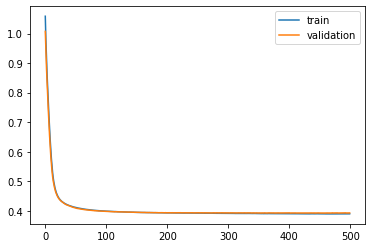

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 43s - loss: 1.0602 - val_loss: 0.9952

Epoch 00001: val_loss improved from inf to 0.99521, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 0.9788 - val_loss: 0.9242

Epoch 00002: val_loss improved from 0.99521 to 0.92422, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9138 - val_loss: 0.8669

Epoch 00003: val_loss improved from 0.92422 to 0.86694, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.8596 - val_loss: 0.8177

Epoch 00004: val_loss improved from 0.86694 to 0.81767, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8109 - val_loss: 0.7722

Epoch 00005: val_loss improved from 0.81767 to 0.77220, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.7649 - val_loss: 0.7290

Epoch 00006: val_loss improved from 0.77220 to 0.72901, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7207 - val_loss: 0.6885

Epoch 00007: val_loss improved from 0.72901

 - 1s - loss: 0.4072 - val_loss: 0.4155

Epoch 00058: val_loss improved from 0.41577 to 0.41554, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4069 - val_loss: 0.4151

Epoch 00059: val_loss improved from 0.41554 to 0.41505, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4064 - val_loss: 0.4148

Epoch 00060: val_loss improved from 0.41505 to 0.41485, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4061 - val_loss: 0.4145

Epoch 00061: val_loss improved from 0.41485 to 0.41451, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4057 - val_loss: 0.4144

Epoch 00062: val_loss improved from 0.41451 to 0.41439, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4054 - val_loss: 0.4138

Epoch 00063: val_loss improved from 0.41439 to 0.41377, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4050 - val_loss: 0.4138

Epoch 00064: val_loss did not improve from 0.41377
Epoch 65/500
 - 1s - loss: 0.4048 - val_loss

 - 1s - loss: 0.3959 - val_loss: 0.4063

Epoch 00120: val_loss improved from 0.40658 to 0.40633, saving model to val_weights3.hdf5
Epoch 121/500
 - 1s - loss: 0.3958 - val_loss: 0.4064

Epoch 00121: val_loss did not improve from 0.40633
Epoch 122/500
 - 1s - loss: 0.3957 - val_loss: 0.4066

Epoch 00122: val_loss did not improve from 0.40633
Epoch 123/500
 - 1s - loss: 0.3956 - val_loss: 0.4063

Epoch 00123: val_loss improved from 0.40633 to 0.40633, saving model to val_weights3.hdf5
Epoch 124/500
 - 1s - loss: 0.3955 - val_loss: 0.4064

Epoch 00124: val_loss did not improve from 0.40633
Epoch 125/500
 - 1s - loss: 0.3955 - val_loss: 0.4062

Epoch 00125: val_loss improved from 0.40633 to 0.40622, saving model to val_weights3.hdf5
Epoch 126/500
 - 1s - loss: 0.3953 - val_loss: 0.4064

Epoch 00126: val_loss did not improve from 0.40622
Epoch 127/500
 - 1s - loss: 0.3954 - val_loss: 0.4062

Epoch 00127: val_loss improved from 0.40622 to 0.40621, saving model to val_weights3.hdf5
Epoch 128/

 - 1s - loss: 0.3923 - val_loss: 0.4034

Epoch 00190: val_loss did not improve from 0.40318
Epoch 191/500
 - 1s - loss: 0.3922 - val_loss: 0.4030

Epoch 00191: val_loss improved from 0.40318 to 0.40298, saving model to val_weights3.hdf5
Epoch 192/500
 - 1s - loss: 0.3922 - val_loss: 0.4030

Epoch 00192: val_loss did not improve from 0.40298
Epoch 193/500
 - 1s - loss: 0.3921 - val_loss: 0.4031

Epoch 00193: val_loss did not improve from 0.40298
Epoch 194/500
 - 1s - loss: 0.3921 - val_loss: 0.4031

Epoch 00194: val_loss did not improve from 0.40298
Epoch 195/500
 - 1s - loss: 0.3921 - val_loss: 0.4031

Epoch 00195: val_loss did not improve from 0.40298
Epoch 196/500
 - 1s - loss: 0.3920 - val_loss: 0.4031

Epoch 00196: val_loss did not improve from 0.40298
Epoch 197/500
 - 1s - loss: 0.3919 - val_loss: 0.4030

Epoch 00197: val_loss did not improve from 0.40298
Epoch 198/500
 - 1s - loss: 0.3920 - val_loss: 0.4032

Epoch 00198: val_loss did not improve from 0.40298
Epoch 199/500
 - 1s -

 - 1s - loss: 0.3909 - val_loss: 0.4026

Epoch 00265: val_loss did not improve from 0.40209
Epoch 266/500
 - 1s - loss: 0.3909 - val_loss: 0.4020

Epoch 00266: val_loss improved from 0.40209 to 0.40203, saving model to val_weights3.hdf5
Epoch 267/500
 - 1s - loss: 0.3908 - val_loss: 0.4023

Epoch 00267: val_loss did not improve from 0.40203
Epoch 268/500
 - 1s - loss: 0.3908 - val_loss: 0.4020

Epoch 00268: val_loss improved from 0.40203 to 0.40201, saving model to val_weights3.hdf5
Epoch 269/500
 - 1s - loss: 0.3906 - val_loss: 0.4021

Epoch 00269: val_loss did not improve from 0.40201
Epoch 270/500
 - 1s - loss: 0.3907 - val_loss: 0.4021

Epoch 00270: val_loss did not improve from 0.40201
Epoch 271/500
 - 1s - loss: 0.3908 - val_loss: 0.4021

Epoch 00271: val_loss did not improve from 0.40201
Epoch 272/500
 - 1s - loss: 0.3908 - val_loss: 0.4024

Epoch 00272: val_loss did not improve from 0.40201
Epoch 273/500
 - 1s - loss: 0.3908 - val_loss: 0.4025

Epoch 00273: val_loss did not imp


Epoch 00339: val_loss did not improve from 0.40128
Epoch 340/500
 - 1s - loss: 0.3899 - val_loss: 0.4012

Epoch 00340: val_loss improved from 0.40128 to 0.40123, saving model to val_weights3.hdf5
Epoch 341/500
 - 1s - loss: 0.3897 - val_loss: 0.4016

Epoch 00341: val_loss did not improve from 0.40123
Epoch 342/500
 - 1s - loss: 0.3897 - val_loss: 0.4013

Epoch 00342: val_loss did not improve from 0.40123
Epoch 343/500
 - 1s - loss: 0.3897 - val_loss: 0.4017

Epoch 00343: val_loss did not improve from 0.40123
Epoch 344/500
 - 1s - loss: 0.3897 - val_loss: 0.4017

Epoch 00344: val_loss did not improve from 0.40123
Epoch 345/500
 - 1s - loss: 0.3897 - val_loss: 0.4016

Epoch 00345: val_loss did not improve from 0.40123
Epoch 346/500
 - 1s - loss: 0.3896 - val_loss: 0.4017

Epoch 00346: val_loss did not improve from 0.40123
Epoch 347/500
 - 1s - loss: 0.3896 - val_loss: 0.4018

Epoch 00347: val_loss did not improve from 0.40123
Epoch 348/500
 - 1s - loss: 0.3896 - val_loss: 0.4019

Epoch 


Epoch 00415: val_loss did not improve from 0.40088
Epoch 416/500
 - 1s - loss: 0.3889 - val_loss: 0.4010

Epoch 00416: val_loss did not improve from 0.40088
Epoch 417/500
 - 1s - loss: 0.3889 - val_loss: 0.4012

Epoch 00417: val_loss did not improve from 0.40088
Epoch 418/500
 - 1s - loss: 0.3889 - val_loss: 0.4013

Epoch 00418: val_loss did not improve from 0.40088
Epoch 419/500
 - 1s - loss: 0.3888 - val_loss: 0.4009

Epoch 00419: val_loss did not improve from 0.40088
Epoch 420/500
 - 1s - loss: 0.3887 - val_loss: 0.4014

Epoch 00420: val_loss did not improve from 0.40088
Epoch 421/500
 - 1s - loss: 0.3889 - val_loss: 0.4013

Epoch 00421: val_loss did not improve from 0.40088
Epoch 422/500
 - 1s - loss: 0.3888 - val_loss: 0.4011

Epoch 00422: val_loss did not improve from 0.40088
Epoch 423/500
 - 1s - loss: 0.3888 - val_loss: 0.4013

Epoch 00423: val_loss did not improve from 0.40088
Epoch 424/500
 - 1s - loss: 0.3890 - val_loss: 0.4014

Epoch 00424: val_loss did not improve from 0.

 - 1s - loss: 0.3884 - val_loss: 0.4013

Epoch 00492: val_loss did not improve from 0.40065
Epoch 493/500
 - 1s - loss: 0.3884 - val_loss: 0.4013

Epoch 00493: val_loss did not improve from 0.40065
Epoch 494/500
 - 1s - loss: 0.3886 - val_loss: 0.4017

Epoch 00494: val_loss did not improve from 0.40065
Epoch 495/500
 - 1s - loss: 0.3887 - val_loss: 0.4014

Epoch 00495: val_loss did not improve from 0.40065
Epoch 496/500
 - 1s - loss: 0.3885 - val_loss: 0.4013

Epoch 00496: val_loss did not improve from 0.40065
Epoch 497/500
 - 1s - loss: 0.3884 - val_loss: 0.4015

Epoch 00497: val_loss did not improve from 0.40065
Epoch 498/500
 - 1s - loss: 0.3886 - val_loss: 0.4018

Epoch 00498: val_loss did not improve from 0.40065
Epoch 499/500
 - 1s - loss: 0.3887 - val_loss: 0.4020

Epoch 00499: val_loss did not improve from 0.40065
Epoch 500/500
 - 1s - loss: 0.3885 - val_loss: 0.4014

Epoch 00500: val_loss did not improve from 0.40065
#################################
Number of units: 4
Batch s

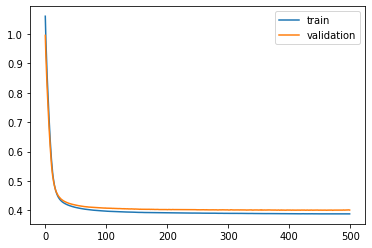

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 33s - loss: 1.0594 - val_loss: 1.0008

Epoch 00001: val_loss improved from inf to 1.00082, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 0.9781 - val_loss: 0.9293

Epoch 00002: val_loss improved from 1.00082 to 0.92928, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9131 - val_loss: 0.8718

Epoch 00003: val_loss improved from 0.92928 to 0.87183, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.8590 - val_loss: 0.8217

Epoch 00004: val_loss improved from 0.87183 to 0.82167, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8104 - val_loss: 0.7745

Epoch 00005: val_loss improved from 0.82167 to 0.77455, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.7648 - val_loss: 0.7296

Epoch 00006: val_loss improved from 0.77455 to 0.72958, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7211 - val_loss: 0.6870

Epoch 00007: val_loss improved from 0.72958


Epoch 00058: val_loss improved from 0.40796 to 0.40758, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4075 - val_loss: 0.4069

Epoch 00059: val_loss improved from 0.40758 to 0.40685, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4072 - val_loss: 0.4070

Epoch 00060: val_loss did not improve from 0.40685
Epoch 61/500
 - 1s - loss: 0.4068 - val_loss: 0.4064

Epoch 00061: val_loss improved from 0.40685 to 0.40637, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4064 - val_loss: 0.4063

Epoch 00062: val_loss improved from 0.40637 to 0.40628, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4062 - val_loss: 0.4057

Epoch 00063: val_loss improved from 0.40628 to 0.40570, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4059 - val_loss: 0.4059

Epoch 00064: val_loss did not improve from 0.40570
Epoch 65/500
 - 1s - loss: 0.4056 - val_loss: 0.4054

Epoch 00065: val_loss improved from 0.40570 to 0.40540, saving model 

 - 1s - loss: 0.3970 - val_loss: 0.3973

Epoch 00119: val_loss did not improve from 0.39715
Epoch 120/500
 - 1s - loss: 0.3969 - val_loss: 0.3970

Epoch 00120: val_loss improved from 0.39715 to 0.39698, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.3969 - val_loss: 0.3969

Epoch 00121: val_loss improved from 0.39698 to 0.39695, saving model to val_weights4.hdf5
Epoch 122/500
 - 1s - loss: 0.3968 - val_loss: 0.3965

Epoch 00122: val_loss improved from 0.39695 to 0.39649, saving model to val_weights4.hdf5
Epoch 123/500
 - 1s - loss: 0.3966 - val_loss: 0.3965

Epoch 00123: val_loss did not improve from 0.39649
Epoch 124/500
 - 1s - loss: 0.3965 - val_loss: 0.3965

Epoch 00124: val_loss did not improve from 0.39649
Epoch 125/500
 - 1s - loss: 0.3964 - val_loss: 0.3964

Epoch 00125: val_loss improved from 0.39649 to 0.39642, saving model to val_weights4.hdf5
Epoch 126/500
 - 1s - loss: 0.3964 - val_loss: 0.3963

Epoch 00126: val_loss improved from 0.39642 to 0.39629, savin

 - 1s - loss: 0.3933 - val_loss: 0.3946

Epoch 00189: val_loss did not improve from 0.39449
Epoch 190/500
 - 1s - loss: 0.3933 - val_loss: 0.3944

Epoch 00190: val_loss improved from 0.39449 to 0.39442, saving model to val_weights4.hdf5
Epoch 191/500
 - 1s - loss: 0.3933 - val_loss: 0.3944

Epoch 00191: val_loss did not improve from 0.39442
Epoch 192/500
 - 1s - loss: 0.3933 - val_loss: 0.3945

Epoch 00192: val_loss did not improve from 0.39442
Epoch 193/500
 - 1s - loss: 0.3932 - val_loss: 0.3945

Epoch 00193: val_loss did not improve from 0.39442
Epoch 194/500
 - 1s - loss: 0.3933 - val_loss: 0.3946

Epoch 00194: val_loss did not improve from 0.39442
Epoch 195/500
 - 1s - loss: 0.3932 - val_loss: 0.3947

Epoch 00195: val_loss did not improve from 0.39442
Epoch 196/500
 - 1s - loss: 0.3933 - val_loss: 0.3946

Epoch 00196: val_loss did not improve from 0.39442
Epoch 197/500
 - 1s - loss: 0.3932 - val_loss: 0.3944

Epoch 00197: val_loss did not improve from 0.39442
Epoch 198/500
 - 1s -

 - 1s - loss: 0.3925 - val_loss: 0.3929

Epoch 00263: val_loss improved from 0.39297 to 0.39291, saving model to val_weights4.hdf5
Epoch 264/500
 - 1s - loss: 0.3925 - val_loss: 0.3931

Epoch 00264: val_loss did not improve from 0.39291
Epoch 265/500
 - 1s - loss: 0.3924 - val_loss: 0.3928

Epoch 00265: val_loss improved from 0.39291 to 0.39285, saving model to val_weights4.hdf5
Epoch 266/500
 - 1s - loss: 0.3923 - val_loss: 0.3929

Epoch 00266: val_loss did not improve from 0.39285
Epoch 267/500
 - 1s - loss: 0.3922 - val_loss: 0.3930

Epoch 00267: val_loss did not improve from 0.39285
Epoch 268/500
 - 1s - loss: 0.3920 - val_loss: 0.3930

Epoch 00268: val_loss did not improve from 0.39285
Epoch 269/500
 - 1s - loss: 0.3919 - val_loss: 0.3931

Epoch 00269: val_loss did not improve from 0.39285
Epoch 270/500
 - 1s - loss: 0.3918 - val_loss: 0.3928

Epoch 00270: val_loss improved from 0.39285 to 0.39285, saving model to val_weights4.hdf5
Epoch 271/500
 - 1s - loss: 0.3917 - val_loss: 0.

 - 1s - loss: 0.3917 - val_loss: 0.3931

Epoch 00339: val_loss did not improve from 0.39271
Epoch 340/500
 - 1s - loss: 0.3918 - val_loss: 0.3930

Epoch 00340: val_loss did not improve from 0.39271
Epoch 341/500
 - 1s - loss: 0.3918 - val_loss: 0.3926

Epoch 00341: val_loss improved from 0.39271 to 0.39264, saving model to val_weights4.hdf5
Epoch 342/500
 - 1s - loss: 0.3917 - val_loss: 0.3926

Epoch 00342: val_loss improved from 0.39264 to 0.39258, saving model to val_weights4.hdf5
Epoch 343/500
 - 1s - loss: 0.3918 - val_loss: 0.3924

Epoch 00343: val_loss improved from 0.39258 to 0.39242, saving model to val_weights4.hdf5
Epoch 344/500
 - 1s - loss: 0.3917 - val_loss: 0.3925

Epoch 00344: val_loss did not improve from 0.39242
Epoch 345/500
 - 1s - loss: 0.3914 - val_loss: 0.3923

Epoch 00345: val_loss improved from 0.39242 to 0.39227, saving model to val_weights4.hdf5
Epoch 346/500
 - 1s - loss: 0.3912 - val_loss: 0.3926

Epoch 00346: val_loss did not improve from 0.39227
Epoch 347/


Epoch 00413: val_loss did not improve from 0.39198
Epoch 414/500
 - 1s - loss: 0.3905 - val_loss: 0.3929

Epoch 00414: val_loss did not improve from 0.39198
Epoch 415/500
 - 1s - loss: 0.3905 - val_loss: 0.3929

Epoch 00415: val_loss did not improve from 0.39198
Epoch 416/500
 - 1s - loss: 0.3905 - val_loss: 0.3927

Epoch 00416: val_loss did not improve from 0.39198
Epoch 417/500
 - 1s - loss: 0.3906 - val_loss: 0.3930

Epoch 00417: val_loss did not improve from 0.39198
Epoch 418/500
 - 1s - loss: 0.3905 - val_loss: 0.3925

Epoch 00418: val_loss did not improve from 0.39198
Epoch 419/500
 - 1s - loss: 0.3904 - val_loss: 0.3932

Epoch 00419: val_loss did not improve from 0.39198
Epoch 420/500
 - 1s - loss: 0.3905 - val_loss: 0.3927

Epoch 00420: val_loss did not improve from 0.39198
Epoch 421/500
 - 1s - loss: 0.3905 - val_loss: 0.3928

Epoch 00421: val_loss did not improve from 0.39198
Epoch 422/500
 - 1s - loss: 0.3905 - val_loss: 0.3926

Epoch 00422: val_loss did not improve from 0.


Epoch 00489: val_loss did not improve from 0.39168
Epoch 490/500
 - 1s - loss: 0.3895 - val_loss: 0.3923

Epoch 00490: val_loss did not improve from 0.39168
Epoch 491/500
 - 1s - loss: 0.3897 - val_loss: 0.3923

Epoch 00491: val_loss did not improve from 0.39168
Epoch 492/500
 - 1s - loss: 0.3897 - val_loss: 0.3922

Epoch 00492: val_loss did not improve from 0.39168
Epoch 493/500
 - 1s - loss: 0.3896 - val_loss: 0.3924

Epoch 00493: val_loss did not improve from 0.39168
Epoch 494/500
 - 1s - loss: 0.3898 - val_loss: 0.3924

Epoch 00494: val_loss did not improve from 0.39168
Epoch 495/500
 - 1s - loss: 0.3898 - val_loss: 0.3925

Epoch 00495: val_loss did not improve from 0.39168
Epoch 496/500
 - 1s - loss: 0.3899 - val_loss: 0.3925

Epoch 00496: val_loss did not improve from 0.39168
Epoch 497/500
 - 1s - loss: 0.3901 - val_loss: 0.3925

Epoch 00497: val_loss did not improve from 0.39168
Epoch 498/500
 - 1s - loss: 0.3900 - val_loss: 0.3926

Epoch 00498: val_loss did not improve from 0.

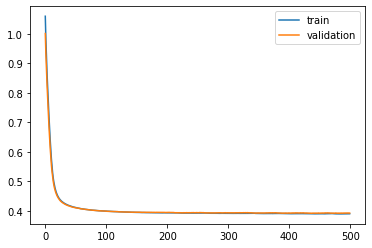

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 29s - loss: 1.0598 - val_loss: 0.9989

Epoch 00001: val_loss improved from inf to 0.99892, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 0.9784 - val_loss: 0.9288

Epoch 00002: val_loss improved from 0.99892 to 0.92883, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9133 - val_loss: 0.8723

Epoch 00003: val_loss improved from 0.92883 to 0.87233, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.8592 - val_loss: 0.8229

Epoch 00004: val_loss improved from 0.87233 to 0.82287, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8105 - val_loss: 0.7775

Epoch 00005: val_loss improved from 0.82287 to 0.77751, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.7645 - val_loss: 0.7336

Epoch 00006: val_loss improved from 0.77751 to 0.73361, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7207 - val_loss: 0.6912

Epoch 00007: val_loss improved from 0.73361

 - 1s - loss: 0.4076 - val_loss: 0.4119

Epoch 00058: val_loss improved from 0.41235 to 0.41195, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4072 - val_loss: 0.4119

Epoch 00059: val_loss improved from 0.41195 to 0.41191, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4068 - val_loss: 0.4115

Epoch 00060: val_loss improved from 0.41191 to 0.41149, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4064 - val_loss: 0.4114

Epoch 00061: val_loss improved from 0.41149 to 0.41143, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4062 - val_loss: 0.4111

Epoch 00062: val_loss improved from 0.41143 to 0.41111, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4058 - val_loss: 0.4106

Epoch 00063: val_loss improved from 0.41111 to 0.41061, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4054 - val_loss: 0.4105

Epoch 00064: val_loss improved from 0.41061 to 0.41051, saving model to val_weights5.hdf5
Epoch

 - 1s - loss: 0.3965 - val_loss: 0.4031

Epoch 00119: val_loss improved from 0.40317 to 0.40306, saving model to val_weights5.hdf5
Epoch 120/500
 - 1s - loss: 0.3965 - val_loss: 0.4030

Epoch 00120: val_loss improved from 0.40306 to 0.40303, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.3964 - val_loss: 0.4027

Epoch 00121: val_loss improved from 0.40303 to 0.40274, saving model to val_weights5.hdf5
Epoch 122/500
 - 1s - loss: 0.3962 - val_loss: 0.4030

Epoch 00122: val_loss did not improve from 0.40274
Epoch 123/500
 - 1s - loss: 0.3962 - val_loss: 0.4026

Epoch 00123: val_loss improved from 0.40274 to 0.40260, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3961 - val_loss: 0.4028

Epoch 00124: val_loss did not improve from 0.40260
Epoch 125/500
 - 1s - loss: 0.3960 - val_loss: 0.4026

Epoch 00125: val_loss did not improve from 0.40260
Epoch 126/500
 - 1s - loss: 0.3959 - val_loss: 0.4026

Epoch 00126: val_loss improved from 0.40260 to 0.40258, savin


Epoch 00186: val_loss did not improve from 0.39923
Epoch 187/500
 - 1s - loss: 0.3932 - val_loss: 0.3993

Epoch 00187: val_loss did not improve from 0.39923
Epoch 188/500
 - 1s - loss: 0.3932 - val_loss: 0.3993

Epoch 00188: val_loss did not improve from 0.39923
Epoch 189/500
 - 1s - loss: 0.3931 - val_loss: 0.3993

Epoch 00189: val_loss did not improve from 0.39923
Epoch 190/500
 - 1s - loss: 0.3931 - val_loss: 0.3990

Epoch 00190: val_loss improved from 0.39923 to 0.39897, saving model to val_weights5.hdf5
Epoch 191/500
 - 1s - loss: 0.3931 - val_loss: 0.3990

Epoch 00191: val_loss did not improve from 0.39897
Epoch 192/500
 - 1s - loss: 0.3931 - val_loss: 0.3992

Epoch 00192: val_loss did not improve from 0.39897
Epoch 193/500
 - 1s - loss: 0.3930 - val_loss: 0.3992

Epoch 00193: val_loss did not improve from 0.39897
Epoch 194/500
 - 1s - loss: 0.3930 - val_loss: 0.3991

Epoch 00194: val_loss did not improve from 0.39897
Epoch 195/500
 - 1s - loss: 0.3929 - val_loss: 0.3990

Epoch 


Epoch 00259: val_loss did not improve from 0.39783
Epoch 260/500
 - 1s - loss: 0.3920 - val_loss: 0.3985

Epoch 00260: val_loss did not improve from 0.39783
Epoch 261/500
 - 1s - loss: 0.3920 - val_loss: 0.3985

Epoch 00261: val_loss did not improve from 0.39783
Epoch 262/500
 - 1s - loss: 0.3918 - val_loss: 0.3982

Epoch 00262: val_loss did not improve from 0.39783
Epoch 263/500
 - 1s - loss: 0.3918 - val_loss: 0.3981

Epoch 00263: val_loss did not improve from 0.39783
Epoch 264/500
 - 1s - loss: 0.3916 - val_loss: 0.3980

Epoch 00264: val_loss did not improve from 0.39783
Epoch 265/500
 - 1s - loss: 0.3916 - val_loss: 0.3978

Epoch 00265: val_loss did not improve from 0.39783
Epoch 266/500
 - 1s - loss: 0.3915 - val_loss: 0.3980

Epoch 00266: val_loss did not improve from 0.39783
Epoch 267/500
 - 1s - loss: 0.3914 - val_loss: 0.3975

Epoch 00267: val_loss improved from 0.39783 to 0.39752, saving model to val_weights5.hdf5
Epoch 268/500
 - 1s - loss: 0.3915 - val_loss: 0.3978

Epoch 


Epoch 00334: val_loss did not improve from 0.39677
Epoch 335/500
 - 1s - loss: 0.3907 - val_loss: 0.3975

Epoch 00335: val_loss did not improve from 0.39677
Epoch 336/500
 - 1s - loss: 0.3907 - val_loss: 0.3972

Epoch 00336: val_loss did not improve from 0.39677
Epoch 337/500
 - 1s - loss: 0.3909 - val_loss: 0.3976

Epoch 00337: val_loss did not improve from 0.39677
Epoch 338/500
 - 1s - loss: 0.3909 - val_loss: 0.3974

Epoch 00338: val_loss did not improve from 0.39677
Epoch 339/500
 - 1s - loss: 0.3908 - val_loss: 0.3974

Epoch 00339: val_loss did not improve from 0.39677
Epoch 340/500
 - 1s - loss: 0.3908 - val_loss: 0.3975

Epoch 00340: val_loss did not improve from 0.39677
Epoch 341/500
 - 1s - loss: 0.3907 - val_loss: 0.3977

Epoch 00341: val_loss did not improve from 0.39677
Epoch 342/500
 - 1s - loss: 0.3907 - val_loss: 0.3973

Epoch 00342: val_loss did not improve from 0.39677
Epoch 343/500
 - 1s - loss: 0.3908 - val_loss: 0.3979

Epoch 00343: val_loss did not improve from 0.

 - 1s - loss: 0.3898 - val_loss: 0.3970

Epoch 00411: val_loss did not improve from 0.39646
Epoch 412/500
 - 1s - loss: 0.3898 - val_loss: 0.3968

Epoch 00412: val_loss did not improve from 0.39646
Epoch 413/500
 - 1s - loss: 0.3898 - val_loss: 0.3970

Epoch 00413: val_loss did not improve from 0.39646
Epoch 414/500
 - 1s - loss: 0.3899 - val_loss: 0.3971

Epoch 00414: val_loss did not improve from 0.39646
Epoch 415/500
 - 1s - loss: 0.3897 - val_loss: 0.3969

Epoch 00415: val_loss did not improve from 0.39646
Epoch 416/500
 - 1s - loss: 0.3896 - val_loss: 0.3966

Epoch 00416: val_loss did not improve from 0.39646
Epoch 417/500
 - 1s - loss: 0.3896 - val_loss: 0.3969

Epoch 00417: val_loss did not improve from 0.39646
Epoch 418/500
 - 1s - loss: 0.3896 - val_loss: 0.3964

Epoch 00418: val_loss improved from 0.39646 to 0.39642, saving model to val_weights5.hdf5
Epoch 419/500
 - 1s - loss: 0.3896 - val_loss: 0.3966

Epoch 00419: val_loss did not improve from 0.39642
Epoch 420/500
 - 1s -

 - 1s - loss: 0.3894 - val_loss: 0.3972

Epoch 00488: val_loss did not improve from 0.39642
Epoch 489/500
 - 1s - loss: 0.3893 - val_loss: 0.3973

Epoch 00489: val_loss did not improve from 0.39642
Epoch 490/500
 - 1s - loss: 0.3892 - val_loss: 0.3973

Epoch 00490: val_loss did not improve from 0.39642
Epoch 491/500
 - 1s - loss: 0.3893 - val_loss: 0.3971

Epoch 00491: val_loss did not improve from 0.39642
Epoch 492/500
 - 1s - loss: 0.3893 - val_loss: 0.3971

Epoch 00492: val_loss did not improve from 0.39642
Epoch 493/500
 - 1s - loss: 0.3891 - val_loss: 0.3978

Epoch 00493: val_loss did not improve from 0.39642
Epoch 494/500
 - 1s - loss: 0.3893 - val_loss: 0.3968

Epoch 00494: val_loss did not improve from 0.39642
Epoch 495/500
 - 1s - loss: 0.3891 - val_loss: 0.3969

Epoch 00495: val_loss did not improve from 0.39642
Epoch 496/500
 - 1s - loss: 0.3891 - val_loss: 0.3973

Epoch 00496: val_loss did not improve from 0.39642
Epoch 497/500
 - 1s - loss: 0.3892 - val_loss: 0.3972

Epoch

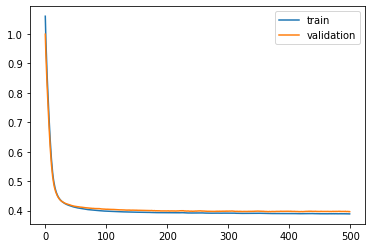

Time to train LSTM:  394.3948724269867
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 44s - loss: 1.2904 - val_loss: 1.2264

Epoch 00001: val_loss improved from inf to 1.22639, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.1774 - val_loss: 1.1231

Epoch 00002: val_loss improved from 1.22639 to 1.12313, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.0826 - val_loss: 1.0360

Epoch 00003: val_loss improved from 1.12313 to 1.03604, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 1.0013 - val_loss: 0.9601

Epoch 00004: val_loss improved from 1.03604 to 0.96014, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.9288 - val_loss: 0.8911

Epoch 00005: val_loss improved from 0.96014 to 0.89106, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8617 - val_loss: 0.8270

Epoch 00006: val_loss improved from 0.89106 to 0.82697, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7985 - val_loss: 0.7667

Epoc


Epoch 00057: val_loss improved from 0.41626 to 0.41600, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4092 - val_loss: 0.4152

Epoch 00058: val_loss improved from 0.41600 to 0.41515, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4089 - val_loss: 0.4150

Epoch 00059: val_loss improved from 0.41515 to 0.41503, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4085 - val_loss: 0.4143

Epoch 00060: val_loss improved from 0.41503 to 0.41430, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4082 - val_loss: 0.4141

Epoch 00061: val_loss improved from 0.41430 to 0.41410, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4078 - val_loss: 0.4141

Epoch 00062: val_loss improved from 0.41410 to 0.41406, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4075 - val_loss: 0.4133

Epoch 00063: val_loss improved from 0.41406 to 0.41329, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4071 - val_loss:

 - 1s - loss: 0.3984 - val_loss: 0.4030

Epoch 00118: val_loss did not improve from 0.40290
Epoch 119/500
 - 1s - loss: 0.3983 - val_loss: 0.4029

Epoch 00119: val_loss did not improve from 0.40290
Epoch 120/500
 - 1s - loss: 0.3982 - val_loss: 0.4027

Epoch 00120: val_loss improved from 0.40290 to 0.40265, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.3980 - val_loss: 0.4027

Epoch 00121: val_loss did not improve from 0.40265
Epoch 122/500
 - 1s - loss: 0.3980 - val_loss: 0.4029

Epoch 00122: val_loss did not improve from 0.40265
Epoch 123/500
 - 1s - loss: 0.3979 - val_loss: 0.4027

Epoch 00123: val_loss did not improve from 0.40265
Epoch 124/500
 - 1s - loss: 0.3978 - val_loss: 0.4025

Epoch 00124: val_loss improved from 0.40265 to 0.40246, saving model to val_weights1.hdf5
Epoch 125/500
 - 1s - loss: 0.3978 - val_loss: 0.4022

Epoch 00125: val_loss improved from 0.40246 to 0.40220, saving model to val_weights1.hdf5
Epoch 126/500
 - 1s - loss: 0.3977 - val_loss: 0.

 - 1s - loss: 0.3951 - val_loss: 0.3994

Epoch 00188: val_loss did not improve from 0.39909
Epoch 189/500
 - 1s - loss: 0.3950 - val_loss: 0.3990

Epoch 00189: val_loss improved from 0.39909 to 0.39902, saving model to val_weights1.hdf5
Epoch 190/500
 - 1s - loss: 0.3951 - val_loss: 0.3994

Epoch 00190: val_loss did not improve from 0.39902
Epoch 191/500
 - 1s - loss: 0.3951 - val_loss: 0.3993

Epoch 00191: val_loss did not improve from 0.39902
Epoch 192/500
 - 1s - loss: 0.3951 - val_loss: 0.3992

Epoch 00192: val_loss did not improve from 0.39902
Epoch 193/500
 - 1s - loss: 0.3952 - val_loss: 0.3992

Epoch 00193: val_loss did not improve from 0.39902
Epoch 194/500
 - 1s - loss: 0.3950 - val_loss: 0.3989

Epoch 00194: val_loss improved from 0.39902 to 0.39886, saving model to val_weights1.hdf5
Epoch 195/500
 - 1s - loss: 0.3950 - val_loss: 0.3994

Epoch 00195: val_loss did not improve from 0.39886
Epoch 196/500
 - 1s - loss: 0.3951 - val_loss: 0.3991

Epoch 00196: val_loss did not imp

 - 1s - loss: 0.3940 - val_loss: 0.3983

Epoch 00261: val_loss did not improve from 0.39798
Epoch 262/500
 - 1s - loss: 0.3940 - val_loss: 0.3980

Epoch 00262: val_loss did not improve from 0.39798
Epoch 263/500
 - 1s - loss: 0.3940 - val_loss: 0.3984

Epoch 00263: val_loss did not improve from 0.39798
Epoch 264/500
 - 1s - loss: 0.3938 - val_loss: 0.3980

Epoch 00264: val_loss did not improve from 0.39798
Epoch 265/500
 - 1s - loss: 0.3938 - val_loss: 0.3978

Epoch 00265: val_loss improved from 0.39798 to 0.39784, saving model to val_weights1.hdf5
Epoch 266/500
 - 1s - loss: 0.3939 - val_loss: 0.3982

Epoch 00266: val_loss did not improve from 0.39784
Epoch 267/500
 - 1s - loss: 0.3938 - val_loss: 0.3982

Epoch 00267: val_loss did not improve from 0.39784
Epoch 268/500
 - 1s - loss: 0.3940 - val_loss: 0.3980

Epoch 00268: val_loss did not improve from 0.39784
Epoch 269/500
 - 1s - loss: 0.3940 - val_loss: 0.3983

Epoch 00269: val_loss did not improve from 0.39784
Epoch 270/500
 - 1s -

 - 1s - loss: 0.3933 - val_loss: 0.3977

Epoch 00335: val_loss did not improve from 0.39725
Epoch 336/500
 - 1s - loss: 0.3932 - val_loss: 0.3978

Epoch 00336: val_loss did not improve from 0.39725
Epoch 337/500
 - 1s - loss: 0.3933 - val_loss: 0.3976

Epoch 00337: val_loss did not improve from 0.39725
Epoch 338/500
 - 1s - loss: 0.3931 - val_loss: 0.3971

Epoch 00338: val_loss improved from 0.39725 to 0.39713, saving model to val_weights1.hdf5
Epoch 339/500
 - 1s - loss: 0.3931 - val_loss: 0.3977

Epoch 00339: val_loss did not improve from 0.39713
Epoch 340/500
 - 1s - loss: 0.3932 - val_loss: 0.3970

Epoch 00340: val_loss improved from 0.39713 to 0.39702, saving model to val_weights1.hdf5
Epoch 341/500
 - 1s - loss: 0.3932 - val_loss: 0.3978

Epoch 00341: val_loss did not improve from 0.39702
Epoch 342/500
 - 1s - loss: 0.3933 - val_loss: 0.3974

Epoch 00342: val_loss did not improve from 0.39702
Epoch 343/500
 - 1s - loss: 0.3931 - val_loss: 0.3973

Epoch 00343: val_loss did not imp

 - 1s - loss: 0.3927 - val_loss: 0.3976

Epoch 00411: val_loss did not improve from 0.39694
Epoch 412/500
 - 1s - loss: 0.3928 - val_loss: 0.3967

Epoch 00412: val_loss improved from 0.39694 to 0.39668, saving model to val_weights1.hdf5
Epoch 413/500
 - 1s - loss: 0.3927 - val_loss: 0.3974

Epoch 00413: val_loss did not improve from 0.39668
Epoch 414/500
 - 1s - loss: 0.3928 - val_loss: 0.3970

Epoch 00414: val_loss did not improve from 0.39668
Epoch 415/500
 - 1s - loss: 0.3927 - val_loss: 0.3973

Epoch 00415: val_loss did not improve from 0.39668
Epoch 416/500
 - 1s - loss: 0.3925 - val_loss: 0.3968

Epoch 00416: val_loss did not improve from 0.39668
Epoch 417/500
 - 1s - loss: 0.3926 - val_loss: 0.3971

Epoch 00417: val_loss did not improve from 0.39668
Epoch 418/500
 - 1s - loss: 0.3928 - val_loss: 0.3972

Epoch 00418: val_loss did not improve from 0.39668
Epoch 419/500
 - 1s - loss: 0.3928 - val_loss: 0.3972

Epoch 00419: val_loss did not improve from 0.39668
Epoch 420/500
 - 1s -

 - 1s - loss: 0.3923 - val_loss: 0.3975

Epoch 00488: val_loss did not improve from 0.39668
Epoch 489/500
 - 1s - loss: 0.3923 - val_loss: 0.3971

Epoch 00489: val_loss did not improve from 0.39668
Epoch 490/500
 - 1s - loss: 0.3921 - val_loss: 0.3974

Epoch 00490: val_loss did not improve from 0.39668
Epoch 491/500
 - 1s - loss: 0.3923 - val_loss: 0.3970

Epoch 00491: val_loss did not improve from 0.39668
Epoch 492/500
 - 1s - loss: 0.3924 - val_loss: 0.3970

Epoch 00492: val_loss did not improve from 0.39668
Epoch 493/500
 - 1s - loss: 0.3922 - val_loss: 0.3972

Epoch 00493: val_loss did not improve from 0.39668
Epoch 494/500
 - 1s - loss: 0.3923 - val_loss: 0.3972

Epoch 00494: val_loss did not improve from 0.39668
Epoch 495/500
 - 1s - loss: 0.3922 - val_loss: 0.3968

Epoch 00495: val_loss did not improve from 0.39668
Epoch 496/500
 - 1s - loss: 0.3921 - val_loss: 0.3970

Epoch 00496: val_loss did not improve from 0.39668
Epoch 497/500
 - 1s - loss: 0.3921 - val_loss: 0.3970

Epoch

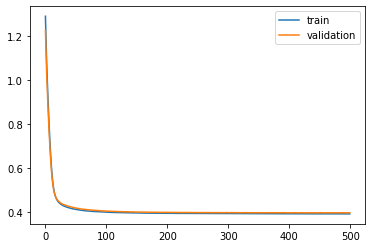

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 31s - loss: 1.2911 - val_loss: 1.2217

Epoch 00001: val_loss improved from inf to 1.22172, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.1779 - val_loss: 1.1214

Epoch 00002: val_loss improved from 1.22172 to 1.12138, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.0828 - val_loss: 1.0357

Epoch 00003: val_loss improved from 1.12138 to 1.03573, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 1.0014 - val_loss: 0.9603

Epoch 00004: val_loss improved from 1.03573 to 0.96033, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.9289 - val_loss: 0.8907

Epoch 00005: val_loss improved from 0.96033 to 0.89069, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8618 - val_loss: 0.8250

Epoch 00006: val_loss improved from 0.89069 to 0.82499, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7989 - val_loss: 0.7637

Epoch 00007: val_loss improved from 0.82499

 - 1s - loss: 0.4098 - val_loss: 0.4064

Epoch 00058: val_loss improved from 0.40669 to 0.40638, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4094 - val_loss: 0.4059

Epoch 00059: val_loss improved from 0.40638 to 0.40594, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4091 - val_loss: 0.4058

Epoch 00060: val_loss improved from 0.40594 to 0.40579, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4087 - val_loss: 0.4056

Epoch 00061: val_loss improved from 0.40579 to 0.40556, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4084 - val_loss: 0.4053

Epoch 00062: val_loss improved from 0.40556 to 0.40530, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4081 - val_loss: 0.4047

Epoch 00063: val_loss improved from 0.40530 to 0.40475, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4076 - val_loss: 0.4047

Epoch 00064: val_loss improved from 0.40475 to 0.40473, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3985 - val_loss: 0.3972

Epoch 00121: val_loss improved from 0.39728 to 0.39716, saving model to val_weights2.hdf5
Epoch 122/500
 - 1s - loss: 0.3984 - val_loss: 0.3966

Epoch 00122: val_loss improved from 0.39716 to 0.39661, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3983 - val_loss: 0.3973

Epoch 00123: val_loss did not improve from 0.39661
Epoch 124/500
 - 1s - loss: 0.3984 - val_loss: 0.3971

Epoch 00124: val_loss did not improve from 0.39661
Epoch 125/500
 - 1s - loss: 0.3982 - val_loss: 0.3970

Epoch 00125: val_loss did not improve from 0.39661
Epoch 126/500
 - 1s - loss: 0.3982 - val_loss: 0.3968

Epoch 00126: val_loss did not improve from 0.39661
Epoch 127/500
 - 1s - loss: 0.3981 - val_loss: 0.3971

Epoch 00127: val_loss did not improve from 0.39661
Epoch 128/500
 - 1s - loss: 0.3981 - val_loss: 0.3969

Epoch 00128: val_loss did not improve from 0.39661
Epoch 129/500
 - 1s - loss: 0.3980 - val_loss: 0.3968

Epoch 00129: val_loss did not imp

 - 1s - loss: 0.3955 - val_loss: 0.3942

Epoch 00193: val_loss did not improve from 0.39412
Epoch 194/500
 - 1s - loss: 0.3954 - val_loss: 0.3944

Epoch 00194: val_loss did not improve from 0.39412
Epoch 195/500
 - 1s - loss: 0.3954 - val_loss: 0.3944

Epoch 00195: val_loss did not improve from 0.39412
Epoch 196/500
 - 1s - loss: 0.3954 - val_loss: 0.3947

Epoch 00196: val_loss did not improve from 0.39412
Epoch 197/500
 - 1s - loss: 0.3953 - val_loss: 0.3943

Epoch 00197: val_loss did not improve from 0.39412
Epoch 198/500
 - 1s - loss: 0.3953 - val_loss: 0.3947

Epoch 00198: val_loss did not improve from 0.39412
Epoch 199/500
 - 1s - loss: 0.3954 - val_loss: 0.3941

Epoch 00199: val_loss improved from 0.39412 to 0.39411, saving model to val_weights2.hdf5
Epoch 200/500
 - 1s - loss: 0.3953 - val_loss: 0.3944

Epoch 00200: val_loss did not improve from 0.39411
Epoch 201/500
 - 1s - loss: 0.3953 - val_loss: 0.3943

Epoch 00201: val_loss did not improve from 0.39411
Epoch 202/500
 - 1s -

 - 1s - loss: 0.3942 - val_loss: 0.3937

Epoch 00266: val_loss did not improve from 0.39320
Epoch 267/500
 - 1s - loss: 0.3943 - val_loss: 0.3935

Epoch 00267: val_loss did not improve from 0.39320
Epoch 268/500
 - 1s - loss: 0.3944 - val_loss: 0.3934

Epoch 00268: val_loss did not improve from 0.39320
Epoch 269/500
 - 1s - loss: 0.3943 - val_loss: 0.3934

Epoch 00269: val_loss did not improve from 0.39320
Epoch 270/500
 - 1s - loss: 0.3943 - val_loss: 0.3934

Epoch 00270: val_loss did not improve from 0.39320
Epoch 271/500
 - 1s - loss: 0.3941 - val_loss: 0.3937

Epoch 00271: val_loss did not improve from 0.39320
Epoch 272/500
 - 1s - loss: 0.3943 - val_loss: 0.3936

Epoch 00272: val_loss did not improve from 0.39320
Epoch 273/500
 - 1s - loss: 0.3942 - val_loss: 0.3931

Epoch 00273: val_loss improved from 0.39320 to 0.39309, saving model to val_weights2.hdf5
Epoch 274/500
 - 1s - loss: 0.3942 - val_loss: 0.3935

Epoch 00274: val_loss did not improve from 0.39309
Epoch 275/500
 - 1s -

 - 1s - loss: 0.3937 - val_loss: 0.3932

Epoch 00342: val_loss did not improve from 0.39273
Epoch 343/500
 - 1s - loss: 0.3935 - val_loss: 0.3933

Epoch 00343: val_loss did not improve from 0.39273
Epoch 344/500
 - 1s - loss: 0.3934 - val_loss: 0.3932

Epoch 00344: val_loss did not improve from 0.39273
Epoch 345/500
 - 1s - loss: 0.3935 - val_loss: 0.3929

Epoch 00345: val_loss did not improve from 0.39273
Epoch 346/500
 - 1s - loss: 0.3934 - val_loss: 0.3929

Epoch 00346: val_loss did not improve from 0.39273
Epoch 347/500
 - 1s - loss: 0.3935 - val_loss: 0.3929

Epoch 00347: val_loss did not improve from 0.39273
Epoch 348/500
 - 1s - loss: 0.3934 - val_loss: 0.3930

Epoch 00348: val_loss did not improve from 0.39273
Epoch 349/500
 - 1s - loss: 0.3936 - val_loss: 0.3932

Epoch 00349: val_loss did not improve from 0.39273
Epoch 350/500
 - 1s - loss: 0.3935 - val_loss: 0.3931

Epoch 00350: val_loss did not improve from 0.39273
Epoch 351/500
 - 1s - loss: 0.3936 - val_loss: 0.3930

Epoch

 - 1s - loss: 0.3929 - val_loss: 0.3927

Epoch 00418: val_loss did not improve from 0.39223
Epoch 419/500
 - 1s - loss: 0.3928 - val_loss: 0.3924

Epoch 00419: val_loss did not improve from 0.39223
Epoch 420/500
 - 1s - loss: 0.3931 - val_loss: 0.3926

Epoch 00420: val_loss did not improve from 0.39223
Epoch 421/500
 - 1s - loss: 0.3929 - val_loss: 0.3927

Epoch 00421: val_loss did not improve from 0.39223
Epoch 422/500
 - 1s - loss: 0.3931 - val_loss: 0.3927

Epoch 00422: val_loss did not improve from 0.39223
Epoch 423/500
 - 1s - loss: 0.3930 - val_loss: 0.3928

Epoch 00423: val_loss did not improve from 0.39223
Epoch 424/500
 - 1s - loss: 0.3930 - val_loss: 0.3923

Epoch 00424: val_loss did not improve from 0.39223
Epoch 425/500
 - 1s - loss: 0.3930 - val_loss: 0.3927

Epoch 00425: val_loss did not improve from 0.39223
Epoch 426/500
 - 1s - loss: 0.3930 - val_loss: 0.3927

Epoch 00426: val_loss did not improve from 0.39223
Epoch 427/500
 - 1s - loss: 0.3928 - val_loss: 0.3927

Epoch

 - 1s - loss: 0.3926 - val_loss: 0.3924

Epoch 00495: val_loss did not improve from 0.39189
Epoch 496/500
 - 1s - loss: 0.3927 - val_loss: 0.3921

Epoch 00496: val_loss did not improve from 0.39189
Epoch 497/500
 - 1s - loss: 0.3926 - val_loss: 0.3925

Epoch 00497: val_loss did not improve from 0.39189
Epoch 498/500
 - 1s - loss: 0.3927 - val_loss: 0.3924

Epoch 00498: val_loss did not improve from 0.39189
Epoch 499/500
 - 1s - loss: 0.3924 - val_loss: 0.3926

Epoch 00499: val_loss did not improve from 0.39189
Epoch 500/500
 - 1s - loss: 0.3924 - val_loss: 0.3924

Epoch 00500: val_loss did not improve from 0.39189
#################################
Number of units: 4
Batch size: 8192
Fold: 1
L2: 0.014616459026020441
best val loss: 0.39189422149128383
#################################


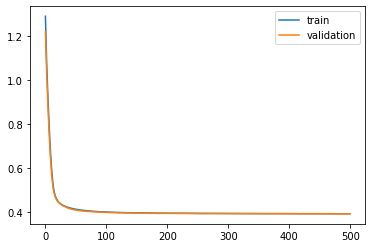

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 53s - loss: 1.2925 - val_loss: 1.2097

Epoch 00001: val_loss improved from inf to 1.20967, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.1796 - val_loss: 1.1077

Epoch 00002: val_loss improved from 1.20967 to 1.10769, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.0847 - val_loss: 1.0214

Epoch 00003: val_loss improved from 1.10769 to 1.02144, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 1.0033 - val_loss: 0.9467

Epoch 00004: val_loss improved from 1.02144 to 0.94667, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.9305 - val_loss: 0.8785

Epoch 00005: val_loss improved from 0.94667 to 0.87853, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8633 - val_loss: 0.8151

Epoch 00006: val_loss improved from 0.87853 to 0.81510, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.8001 - val_loss: 0.7567

Epoch 00007: val_loss improved from 0.81510

 - 1s - loss: 0.4094 - val_loss: 0.4159

Epoch 00058: val_loss improved from 0.41628 to 0.41589, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4089 - val_loss: 0.4155

Epoch 00059: val_loss improved from 0.41589 to 0.41551, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4084 - val_loss: 0.4153

Epoch 00060: val_loss improved from 0.41551 to 0.41534, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4080 - val_loss: 0.4150

Epoch 00061: val_loss improved from 0.41534 to 0.41501, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4078 - val_loss: 0.4147

Epoch 00062: val_loss improved from 0.41501 to 0.41467, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4074 - val_loss: 0.4145

Epoch 00063: val_loss improved from 0.41467 to 0.41455, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4071 - val_loss: 0.4140

Epoch 00064: val_loss improved from 0.41455 to 0.41401, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.3976 - val_loss: 0.4065

Epoch 00122: val_loss did not improve from 0.40626
Epoch 123/500
 - 1s - loss: 0.3975 - val_loss: 0.4065

Epoch 00123: val_loss did not improve from 0.40626
Epoch 124/500
 - 1s - loss: 0.3975 - val_loss: 0.4069

Epoch 00124: val_loss did not improve from 0.40626
Epoch 125/500
 - 1s - loss: 0.3974 - val_loss: 0.4066

Epoch 00125: val_loss did not improve from 0.40626
Epoch 126/500
 - 1s - loss: 0.3975 - val_loss: 0.4064

Epoch 00126: val_loss did not improve from 0.40626
Epoch 127/500
 - 1s - loss: 0.3973 - val_loss: 0.4063

Epoch 00127: val_loss did not improve from 0.40626
Epoch 128/500
 - 1s - loss: 0.3971 - val_loss: 0.4064

Epoch 00128: val_loss did not improve from 0.40626
Epoch 129/500
 - 1s - loss: 0.3971 - val_loss: 0.4060

Epoch 00129: val_loss improved from 0.40626 to 0.40602, saving model to val_weights3.hdf5
Epoch 130/500
 - 1s - loss: 0.3969 - val_loss: 0.4063

Epoch 00130: val_loss did not improve from 0.40602
Epoch 131/500
 - 1s -

 - 1s - loss: 0.3946 - val_loss: 0.4039

Epoch 00194: val_loss improved from 0.40392 to 0.40392, saving model to val_weights3.hdf5
Epoch 195/500
 - 1s - loss: 0.3946 - val_loss: 0.4043

Epoch 00195: val_loss did not improve from 0.40392
Epoch 196/500
 - 1s - loss: 0.3947 - val_loss: 0.4044

Epoch 00196: val_loss did not improve from 0.40392
Epoch 197/500
 - 1s - loss: 0.3946 - val_loss: 0.4045

Epoch 00197: val_loss did not improve from 0.40392
Epoch 198/500
 - 1s - loss: 0.3944 - val_loss: 0.4044

Epoch 00198: val_loss did not improve from 0.40392
Epoch 199/500
 - 1s - loss: 0.3945 - val_loss: 0.4040

Epoch 00199: val_loss did not improve from 0.40392
Epoch 200/500
 - 1s - loss: 0.3944 - val_loss: 0.4042

Epoch 00200: val_loss did not improve from 0.40392
Epoch 201/500
 - 1s - loss: 0.3945 - val_loss: 0.4044

Epoch 00201: val_loss did not improve from 0.40392
Epoch 202/500
 - 1s - loss: 0.3944 - val_loss: 0.4041

Epoch 00202: val_loss did not improve from 0.40392
Epoch 203/500
 - 1s -

 - 1s - loss: 0.3934 - val_loss: 0.4032

Epoch 00268: val_loss did not improve from 0.40302
Epoch 269/500
 - 1s - loss: 0.3934 - val_loss: 0.4035

Epoch 00269: val_loss did not improve from 0.40302
Epoch 270/500
 - 1s - loss: 0.3934 - val_loss: 0.4032

Epoch 00270: val_loss did not improve from 0.40302
Epoch 271/500
 - 1s - loss: 0.3933 - val_loss: 0.4034

Epoch 00271: val_loss did not improve from 0.40302
Epoch 272/500
 - 1s - loss: 0.3933 - val_loss: 0.4032

Epoch 00272: val_loss did not improve from 0.40302
Epoch 273/500
 - 1s - loss: 0.3933 - val_loss: 0.4032

Epoch 00273: val_loss did not improve from 0.40302
Epoch 274/500
 - 1s - loss: 0.3933 - val_loss: 0.4036

Epoch 00274: val_loss did not improve from 0.40302
Epoch 275/500
 - 1s - loss: 0.3935 - val_loss: 0.4034

Epoch 00275: val_loss did not improve from 0.40302
Epoch 276/500
 - 1s - loss: 0.3934 - val_loss: 0.4032

Epoch 00276: val_loss did not improve from 0.40302
Epoch 277/500
 - 1s - loss: 0.3934 - val_loss: 0.4033

Epoch

 - 1s - loss: 0.3927 - val_loss: 0.4026

Epoch 00344: val_loss did not improve from 0.40219
Epoch 345/500
 - 1s - loss: 0.3928 - val_loss: 0.4029

Epoch 00345: val_loss did not improve from 0.40219
Epoch 346/500
 - 1s - loss: 0.3927 - val_loss: 0.4025

Epoch 00346: val_loss did not improve from 0.40219
Epoch 347/500
 - 1s - loss: 0.3927 - val_loss: 0.4023

Epoch 00347: val_loss did not improve from 0.40219
Epoch 348/500
 - 1s - loss: 0.3927 - val_loss: 0.4024

Epoch 00348: val_loss did not improve from 0.40219
Epoch 349/500
 - 1s - loss: 0.3927 - val_loss: 0.4025

Epoch 00349: val_loss did not improve from 0.40219
Epoch 350/500
 - 1s - loss: 0.3927 - val_loss: 0.4025

Epoch 00350: val_loss did not improve from 0.40219
Epoch 351/500
 - 1s - loss: 0.3928 - val_loss: 0.4021

Epoch 00351: val_loss improved from 0.40219 to 0.40209, saving model to val_weights3.hdf5
Epoch 352/500
 - 1s - loss: 0.3928 - val_loss: 0.4027

Epoch 00352: val_loss did not improve from 0.40209
Epoch 353/500
 - 1s -

 - 1s - loss: 0.3921 - val_loss: 0.4016

Epoch 00418: val_loss did not improve from 0.40148
Epoch 419/500
 - 1s - loss: 0.3923 - val_loss: 0.4020

Epoch 00419: val_loss did not improve from 0.40148
Epoch 420/500
 - 1s - loss: 0.3924 - val_loss: 0.4017

Epoch 00420: val_loss did not improve from 0.40148
Epoch 421/500
 - 1s - loss: 0.3923 - val_loss: 0.4021

Epoch 00421: val_loss did not improve from 0.40148
Epoch 422/500
 - 1s - loss: 0.3922 - val_loss: 0.4015

Epoch 00422: val_loss did not improve from 0.40148
Epoch 423/500
 - 1s - loss: 0.3923 - val_loss: 0.4016

Epoch 00423: val_loss did not improve from 0.40148
Epoch 424/500
 - 1s - loss: 0.3922 - val_loss: 0.4016

Epoch 00424: val_loss did not improve from 0.40148
Epoch 425/500
 - 1s - loss: 0.3922 - val_loss: 0.4017

Epoch 00425: val_loss did not improve from 0.40148
Epoch 426/500
 - 1s - loss: 0.3922 - val_loss: 0.4019

Epoch 00426: val_loss did not improve from 0.40148
Epoch 427/500
 - 1s - loss: 0.3922 - val_loss: 0.4017

Epoch


Epoch 00493: val_loss did not improve from 0.40089
Epoch 494/500
 - 1s - loss: 0.3917 - val_loss: 0.4015

Epoch 00494: val_loss did not improve from 0.40089
Epoch 495/500
 - 1s - loss: 0.3915 - val_loss: 0.4015

Epoch 00495: val_loss did not improve from 0.40089
Epoch 496/500
 - 1s - loss: 0.3918 - val_loss: 0.4012

Epoch 00496: val_loss did not improve from 0.40089
Epoch 497/500
 - 1s - loss: 0.3916 - val_loss: 0.4018

Epoch 00497: val_loss did not improve from 0.40089
Epoch 498/500
 - 1s - loss: 0.3920 - val_loss: 0.4013

Epoch 00498: val_loss did not improve from 0.40089
Epoch 499/500
 - 1s - loss: 0.3917 - val_loss: 0.4015

Epoch 00499: val_loss did not improve from 0.40089
Epoch 500/500
 - 1s - loss: 0.3919 - val_loss: 0.4014

Epoch 00500: val_loss did not improve from 0.40089
#################################
Number of units: 4
Batch size: 8192
Fold: 2
L2: 0.014616459026020441
best val loss: 0.40089438377486336
#################################


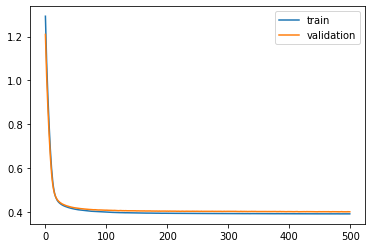

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 35s - loss: 1.2917 - val_loss: 1.2154

Epoch 00001: val_loss improved from inf to 1.21540, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.1789 - val_loss: 1.1129

Epoch 00002: val_loss improved from 1.21540 to 1.11289, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.0841 - val_loss: 1.0266

Epoch 00003: val_loss improved from 1.11289 to 1.02658, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 1.0026 - val_loss: 0.9510

Epoch 00004: val_loss improved from 1.02658 to 0.95097, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.9299 - val_loss: 0.8818

Epoch 00005: val_loss improved from 0.95097 to 0.88180, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8627 - val_loss: 0.8169

Epoch 00006: val_loss improved from 0.88180 to 0.81690, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7998 - val_loss: 0.7562

Epoch 00007: val_loss improved from 0.81690

 - 1s - loss: 0.4100 - val_loss: 0.4090

Epoch 00058: val_loss did not improve from 0.40878
Epoch 59/500
 - 1s - loss: 0.4096 - val_loss: 0.4082

Epoch 00059: val_loss improved from 0.40878 to 0.40819, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4093 - val_loss: 0.4082

Epoch 00060: val_loss did not improve from 0.40819
Epoch 61/500
 - 1s - loss: 0.4090 - val_loss: 0.4073

Epoch 00061: val_loss improved from 0.40819 to 0.40725, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4086 - val_loss: 0.4073

Epoch 00062: val_loss did not improve from 0.40725
Epoch 63/500
 - 1s - loss: 0.4083 - val_loss: 0.4065

Epoch 00063: val_loss improved from 0.40725 to 0.40655, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4079 - val_loss: 0.4068

Epoch 00064: val_loss did not improve from 0.40655
Epoch 65/500
 - 1s - loss: 0.4077 - val_loss: 0.4062

Epoch 00065: val_loss improved from 0.40655 to 0.40618, saving model to val_weights4.hdf5
Epoch 66/500
 - 1


Epoch 00119: val_loss improved from 0.39690 to 0.39680, saving model to val_weights4.hdf5
Epoch 120/500
 - 1s - loss: 0.3987 - val_loss: 0.3969

Epoch 00120: val_loss did not improve from 0.39680
Epoch 121/500
 - 1s - loss: 0.3985 - val_loss: 0.3970

Epoch 00121: val_loss did not improve from 0.39680
Epoch 122/500
 - 1s - loss: 0.3985 - val_loss: 0.3969

Epoch 00122: val_loss did not improve from 0.39680
Epoch 123/500
 - 1s - loss: 0.3985 - val_loss: 0.3967

Epoch 00123: val_loss improved from 0.39680 to 0.39673, saving model to val_weights4.hdf5
Epoch 124/500
 - 1s - loss: 0.3984 - val_loss: 0.3967

Epoch 00124: val_loss improved from 0.39673 to 0.39671, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3982 - val_loss: 0.3966

Epoch 00125: val_loss improved from 0.39671 to 0.39663, saving model to val_weights4.hdf5
Epoch 126/500
 - 1s - loss: 0.3982 - val_loss: 0.3964

Epoch 00126: val_loss improved from 0.39663 to 0.39643, saving model to val_weights4.hdf5
Epoch 127/5

 - 1s - loss: 0.3957 - val_loss: 0.3952

Epoch 00191: val_loss improved from 0.39521 to 0.39518, saving model to val_weights4.hdf5
Epoch 192/500
 - 1s - loss: 0.3956 - val_loss: 0.3951

Epoch 00192: val_loss improved from 0.39518 to 0.39512, saving model to val_weights4.hdf5
Epoch 193/500
 - 1s - loss: 0.3957 - val_loss: 0.3953

Epoch 00193: val_loss did not improve from 0.39512
Epoch 194/500
 - 1s - loss: 0.3956 - val_loss: 0.3951

Epoch 00194: val_loss did not improve from 0.39512
Epoch 195/500
 - 1s - loss: 0.3955 - val_loss: 0.3952

Epoch 00195: val_loss did not improve from 0.39512
Epoch 196/500
 - 1s - loss: 0.3956 - val_loss: 0.3951

Epoch 00196: val_loss did not improve from 0.39512
Epoch 197/500
 - 1s - loss: 0.3956 - val_loss: 0.3949

Epoch 00197: val_loss improved from 0.39512 to 0.39487, saving model to val_weights4.hdf5
Epoch 198/500
 - 1s - loss: 0.3955 - val_loss: 0.3949

Epoch 00198: val_loss improved from 0.39487 to 0.39486, saving model to val_weights4.hdf5
Epoch 199/

 - 1s - loss: 0.3946 - val_loss: 0.3941

Epoch 00265: val_loss did not improve from 0.39377
Epoch 266/500
 - 1s - loss: 0.3945 - val_loss: 0.3943

Epoch 00266: val_loss did not improve from 0.39377
Epoch 267/500
 - 1s - loss: 0.3945 - val_loss: 0.3944

Epoch 00267: val_loss did not improve from 0.39377
Epoch 268/500
 - 1s - loss: 0.3946 - val_loss: 0.3944

Epoch 00268: val_loss did not improve from 0.39377
Epoch 269/500
 - 1s - loss: 0.3947 - val_loss: 0.3943

Epoch 00269: val_loss did not improve from 0.39377
Epoch 270/500
 - 1s - loss: 0.3945 - val_loss: 0.3941

Epoch 00270: val_loss did not improve from 0.39377
Epoch 271/500
 - 1s - loss: 0.3945 - val_loss: 0.3943

Epoch 00271: val_loss did not improve from 0.39377
Epoch 272/500
 - 1s - loss: 0.3946 - val_loss: 0.3945

Epoch 00272: val_loss did not improve from 0.39377
Epoch 273/500
 - 1s - loss: 0.3946 - val_loss: 0.3944

Epoch 00273: val_loss did not improve from 0.39377
Epoch 274/500
 - 1s - loss: 0.3945 - val_loss: 0.3947

Epoch

 - 1s - loss: 0.3939 - val_loss: 0.3940

Epoch 00341: val_loss did not improve from 0.39343
Epoch 342/500
 - 1s - loss: 0.3939 - val_loss: 0.3935

Epoch 00342: val_loss did not improve from 0.39343
Epoch 343/500
 - 1s - loss: 0.3939 - val_loss: 0.3938

Epoch 00343: val_loss did not improve from 0.39343
Epoch 344/500
 - 1s - loss: 0.3938 - val_loss: 0.3937

Epoch 00344: val_loss did not improve from 0.39343
Epoch 345/500
 - 1s - loss: 0.3938 - val_loss: 0.3937

Epoch 00345: val_loss did not improve from 0.39343
Epoch 346/500
 - 1s - loss: 0.3939 - val_loss: 0.3935

Epoch 00346: val_loss did not improve from 0.39343
Epoch 347/500
 - 1s - loss: 0.3938 - val_loss: 0.3940

Epoch 00347: val_loss did not improve from 0.39343
Epoch 348/500
 - 1s - loss: 0.3940 - val_loss: 0.3937

Epoch 00348: val_loss did not improve from 0.39343
Epoch 349/500
 - 1s - loss: 0.3939 - val_loss: 0.3938

Epoch 00349: val_loss did not improve from 0.39343
Epoch 350/500
 - 1s - loss: 0.3938 - val_loss: 0.3941

Epoch


Epoch 00418: val_loss improved from 0.39343 to 0.39332, saving model to val_weights4.hdf5
Epoch 419/500
 - 1s - loss: 0.3934 - val_loss: 0.3939

Epoch 00419: val_loss did not improve from 0.39332
Epoch 420/500
 - 1s - loss: 0.3934 - val_loss: 0.3938

Epoch 00420: val_loss did not improve from 0.39332
Epoch 421/500
 - 1s - loss: 0.3934 - val_loss: 0.3939

Epoch 00421: val_loss did not improve from 0.39332
Epoch 422/500
 - 1s - loss: 0.3936 - val_loss: 0.3939

Epoch 00422: val_loss did not improve from 0.39332
Epoch 423/500
 - 1s - loss: 0.3935 - val_loss: 0.3943

Epoch 00423: val_loss did not improve from 0.39332
Epoch 424/500
 - 1s - loss: 0.3935 - val_loss: 0.3939

Epoch 00424: val_loss did not improve from 0.39332
Epoch 425/500
 - 1s - loss: 0.3935 - val_loss: 0.3942

Epoch 00425: val_loss did not improve from 0.39332
Epoch 426/500
 - 1s - loss: 0.3935 - val_loss: 0.3936

Epoch 00426: val_loss did not improve from 0.39332
Epoch 427/500
 - 1s - loss: 0.3934 - val_loss: 0.3939

Epoch 

 - 1s - loss: 0.3928 - val_loss: 0.3938

Epoch 00495: val_loss did not improve from 0.39318
Epoch 496/500
 - 1s - loss: 0.3929 - val_loss: 0.3934

Epoch 00496: val_loss did not improve from 0.39318
Epoch 497/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00497: val_loss did not improve from 0.39318
Epoch 498/500
 - 1s - loss: 0.3928 - val_loss: 0.3932

Epoch 00498: val_loss did not improve from 0.39318
Epoch 499/500
 - 1s - loss: 0.3928 - val_loss: 0.3937

Epoch 00499: val_loss did not improve from 0.39318
Epoch 500/500
 - 1s - loss: 0.3927 - val_loss: 0.3935

Epoch 00500: val_loss did not improve from 0.39318
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.014616459026020441
best val loss: 0.3931774905787574
#################################


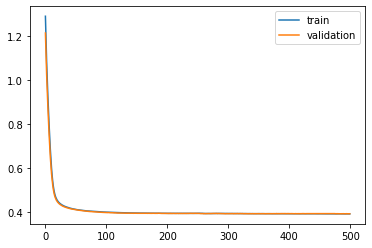

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 43s - loss: 1.2921 - val_loss: 1.2136

Epoch 00001: val_loss improved from inf to 1.21359, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.1792 - val_loss: 1.1127

Epoch 00002: val_loss improved from 1.21359 to 1.11274, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0843 - val_loss: 1.0274

Epoch 00003: val_loss improved from 1.11274 to 1.02742, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 1.0029 - val_loss: 0.9523

Epoch 00004: val_loss improved from 1.02742 to 0.95229, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.9302 - val_loss: 0.8840

Epoch 00005: val_loss improved from 0.95229 to 0.88405, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8630 - val_loss: 0.8202

Epoch 00006: val_loss improved from 0.88405 to 0.82022, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.8000 - val_loss: 0.7604

Epoch 00007: val_loss improved from 0.82022

 - 1s - loss: 0.4096 - val_loss: 0.4126

Epoch 00058: val_loss improved from 0.41289 to 0.41263, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4093 - val_loss: 0.4124

Epoch 00059: val_loss improved from 0.41263 to 0.41244, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4089 - val_loss: 0.4124

Epoch 00060: val_loss improved from 0.41244 to 0.41237, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4085 - val_loss: 0.4118

Epoch 00061: val_loss improved from 0.41237 to 0.41184, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4081 - val_loss: 0.4119

Epoch 00062: val_loss did not improve from 0.41184
Epoch 63/500
 - 1s - loss: 0.4079 - val_loss: 0.4112

Epoch 00063: val_loss improved from 0.41184 to 0.41125, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4076 - val_loss: 0.4113

Epoch 00064: val_loss did not improve from 0.41125
Epoch 65/500
 - 1s - loss: 0.4072 - val_loss: 0.4106

Epoch 00065: val_loss improve

 - 1s - loss: 0.3984 - val_loss: 0.4026

Epoch 00119: val_loss improved from 0.40274 to 0.40257, saving model to val_weights5.hdf5
Epoch 120/500
 - 1s - loss: 0.3983 - val_loss: 0.4022

Epoch 00120: val_loss improved from 0.40257 to 0.40223, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.3984 - val_loss: 0.4025

Epoch 00121: val_loss did not improve from 0.40223
Epoch 122/500
 - 1s - loss: 0.3984 - val_loss: 0.4025

Epoch 00122: val_loss did not improve from 0.40223
Epoch 123/500
 - 1s - loss: 0.3983 - val_loss: 0.4025

Epoch 00123: val_loss did not improve from 0.40223
Epoch 124/500
 - 1s - loss: 0.3981 - val_loss: 0.4022

Epoch 00124: val_loss improved from 0.40223 to 0.40220, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3981 - val_loss: 0.4023

Epoch 00125: val_loss did not improve from 0.40220
Epoch 126/500
 - 1s - loss: 0.3979 - val_loss: 0.4018

Epoch 00126: val_loss improved from 0.40220 to 0.40181, saving model to val_weights5.hdf5
Epoch 127/

 - 1s - loss: 0.3953 - val_loss: 0.3994

Epoch 00188: val_loss did not improve from 0.39906
Epoch 189/500
 - 1s - loss: 0.3951 - val_loss: 0.3991

Epoch 00189: val_loss did not improve from 0.39906
Epoch 190/500
 - 1s - loss: 0.3951 - val_loss: 0.3995

Epoch 00190: val_loss did not improve from 0.39906
Epoch 191/500
 - 1s - loss: 0.3951 - val_loss: 0.3995

Epoch 00191: val_loss did not improve from 0.39906
Epoch 192/500
 - 1s - loss: 0.3952 - val_loss: 0.3993

Epoch 00192: val_loss did not improve from 0.39906
Epoch 193/500
 - 1s - loss: 0.3951 - val_loss: 0.3991

Epoch 00193: val_loss did not improve from 0.39906
Epoch 194/500
 - 1s - loss: 0.3951 - val_loss: 0.3994

Epoch 00194: val_loss did not improve from 0.39906
Epoch 195/500
 - 1s - loss: 0.3950 - val_loss: 0.3990

Epoch 00195: val_loss improved from 0.39906 to 0.39897, saving model to val_weights5.hdf5
Epoch 196/500
 - 1s - loss: 0.3950 - val_loss: 0.3995

Epoch 00196: val_loss did not improve from 0.39897
Epoch 197/500
 - 1s -

 - 1s - loss: 0.3938 - val_loss: 0.3982

Epoch 00261: val_loss did not improve from 0.39774
Epoch 262/500
 - 1s - loss: 0.3939 - val_loss: 0.3978

Epoch 00262: val_loss did not improve from 0.39774
Epoch 263/500
 - 1s - loss: 0.3938 - val_loss: 0.3977

Epoch 00263: val_loss improved from 0.39774 to 0.39766, saving model to val_weights5.hdf5
Epoch 264/500
 - 1s - loss: 0.3937 - val_loss: 0.3980

Epoch 00264: val_loss did not improve from 0.39766
Epoch 265/500
 - 1s - loss: 0.3937 - val_loss: 0.3979

Epoch 00265: val_loss did not improve from 0.39766
Epoch 266/500
 - 1s - loss: 0.3937 - val_loss: 0.3979

Epoch 00266: val_loss did not improve from 0.39766
Epoch 267/500
 - 1s - loss: 0.3938 - val_loss: 0.3975

Epoch 00267: val_loss improved from 0.39766 to 0.39746, saving model to val_weights5.hdf5
Epoch 268/500
 - 1s - loss: 0.3937 - val_loss: 0.3978

Epoch 00268: val_loss did not improve from 0.39746
Epoch 269/500
 - 1s - loss: 0.3938 - val_loss: 0.3978

Epoch 00269: val_loss did not imp

 - 1s - loss: 0.3933 - val_loss: 0.3971

Epoch 00337: val_loss did not improve from 0.39694
Epoch 338/500
 - 1s - loss: 0.3932 - val_loss: 0.3971

Epoch 00338: val_loss did not improve from 0.39694
Epoch 339/500
 - 1s - loss: 0.3931 - val_loss: 0.3970

Epoch 00339: val_loss did not improve from 0.39694
Epoch 340/500
 - 1s - loss: 0.3930 - val_loss: 0.3973

Epoch 00340: val_loss did not improve from 0.39694
Epoch 341/500
 - 1s - loss: 0.3929 - val_loss: 0.3972

Epoch 00341: val_loss did not improve from 0.39694
Epoch 342/500
 - 1s - loss: 0.3930 - val_loss: 0.3972

Epoch 00342: val_loss did not improve from 0.39694
Epoch 343/500
 - 1s - loss: 0.3930 - val_loss: 0.3970

Epoch 00343: val_loss did not improve from 0.39694
Epoch 344/500
 - 1s - loss: 0.3929 - val_loss: 0.3971

Epoch 00344: val_loss did not improve from 0.39694
Epoch 345/500
 - 1s - loss: 0.3930 - val_loss: 0.3973

Epoch 00345: val_loss did not improve from 0.39694
Epoch 346/500
 - 1s - loss: 0.3928 - val_loss: 0.3971

Epoch


Epoch 00413: val_loss did not improve from 0.39637
Epoch 414/500
 - 1s - loss: 0.3924 - val_loss: 0.3966

Epoch 00414: val_loss did not improve from 0.39637
Epoch 415/500
 - 1s - loss: 0.3924 - val_loss: 0.3970

Epoch 00415: val_loss did not improve from 0.39637
Epoch 416/500
 - 1s - loss: 0.3924 - val_loss: 0.3970

Epoch 00416: val_loss did not improve from 0.39637
Epoch 417/500
 - 1s - loss: 0.3924 - val_loss: 0.3966

Epoch 00417: val_loss did not improve from 0.39637
Epoch 418/500
 - 1s - loss: 0.3923 - val_loss: 0.3970

Epoch 00418: val_loss did not improve from 0.39637
Epoch 419/500
 - 1s - loss: 0.3923 - val_loss: 0.3968

Epoch 00419: val_loss did not improve from 0.39637
Epoch 420/500
 - 1s - loss: 0.3924 - val_loss: 0.3970

Epoch 00420: val_loss did not improve from 0.39637
Epoch 421/500
 - 1s - loss: 0.3923 - val_loss: 0.3965

Epoch 00421: val_loss did not improve from 0.39637
Epoch 422/500
 - 1s - loss: 0.3923 - val_loss: 0.3967

Epoch 00422: val_loss did not improve from 0.

 - 1s - loss: 0.3919 - val_loss: 0.3969

Epoch 00490: val_loss did not improve from 0.39605
Epoch 491/500
 - 1s - loss: 0.3921 - val_loss: 0.3969

Epoch 00491: val_loss did not improve from 0.39605
Epoch 492/500
 - 1s - loss: 0.3920 - val_loss: 0.3963

Epoch 00492: val_loss did not improve from 0.39605
Epoch 493/500
 - 1s - loss: 0.3918 - val_loss: 0.3966

Epoch 00493: val_loss did not improve from 0.39605
Epoch 494/500
 - 1s - loss: 0.3921 - val_loss: 0.3965

Epoch 00494: val_loss did not improve from 0.39605
Epoch 495/500
 - 1s - loss: 0.3920 - val_loss: 0.3968

Epoch 00495: val_loss did not improve from 0.39605
Epoch 496/500
 - 1s - loss: 0.3919 - val_loss: 0.3965

Epoch 00496: val_loss did not improve from 0.39605
Epoch 497/500
 - 1s - loss: 0.3920 - val_loss: 0.3968

Epoch 00497: val_loss did not improve from 0.39605
Epoch 498/500
 - 1s - loss: 0.3920 - val_loss: 0.3961

Epoch 00498: val_loss did not improve from 0.39605
Epoch 499/500
 - 1s - loss: 0.3918 - val_loss: 0.3964

Epoch

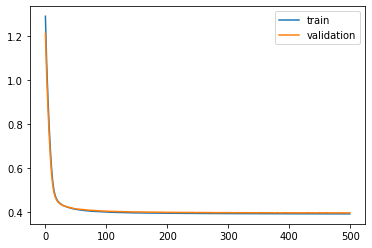

Time to train LSTM:  405.1862840652466
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 44s - loss: 1.2572 - val_loss: 1.1959

Epoch 00001: val_loss improved from inf to 1.19588, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.1490 - val_loss: 1.0972

Epoch 00002: val_loss improved from 1.19588 to 1.09719, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.0586 - val_loss: 1.0142

Epoch 00003: val_loss improved from 1.09719 to 1.01417, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9812 - val_loss: 0.9419

Epoch 00004: val_loss improved from 1.01417 to 0.94191, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.9121 - val_loss: 0.8760

Epoch 00005: val_loss improved from 0.94191 to 0.87598, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8479 - val_loss: 0.8147

Epoch 00006: val_loss improved from 0.87598 to 0.81466, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7873 - val_loss: 0.7568

Epoc


Epoch 00057: val_loss improved from 0.41621 to 0.41552, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4090 - val_loss: 0.4155

Epoch 00058: val_loss improved from 0.41552 to 0.41552, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4087 - val_loss: 0.4148

Epoch 00059: val_loss improved from 0.41552 to 0.41479, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4082 - val_loss: 0.4143

Epoch 00060: val_loss improved from 0.41479 to 0.41431, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4079 - val_loss: 0.4139

Epoch 00061: val_loss improved from 0.41431 to 0.41389, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4076 - val_loss: 0.4137

Epoch 00062: val_loss improved from 0.41389 to 0.41369, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4073 - val_loss: 0.4133

Epoch 00063: val_loss improved from 0.41369 to 0.41334, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4069 - val_loss:

 - 1s - loss: 0.3980 - val_loss: 0.4027

Epoch 00119: val_loss improved from 0.40282 to 0.40273, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.3980 - val_loss: 0.4029

Epoch 00120: val_loss did not improve from 0.40273
Epoch 121/500
 - 1s - loss: 0.3979 - val_loss: 0.4027

Epoch 00121: val_loss improved from 0.40273 to 0.40266, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3978 - val_loss: 0.4029

Epoch 00122: val_loss did not improve from 0.40266
Epoch 123/500
 - 1s - loss: 0.3977 - val_loss: 0.4025

Epoch 00123: val_loss improved from 0.40266 to 0.40247, saving model to val_weights1.hdf5
Epoch 124/500
 - 1s - loss: 0.3975 - val_loss: 0.4026

Epoch 00124: val_loss did not improve from 0.40247
Epoch 125/500
 - 1s - loss: 0.3976 - val_loss: 0.4021

Epoch 00125: val_loss improved from 0.40247 to 0.40215, saving model to val_weights1.hdf5
Epoch 126/500
 - 1s - loss: 0.3974 - val_loss: 0.4020

Epoch 00126: val_loss improved from 0.40215 to 0.40205, savin

 - 1s - loss: 0.3948 - val_loss: 0.3994

Epoch 00187: val_loss did not improve from 0.39907
Epoch 188/500
 - 1s - loss: 0.3948 - val_loss: 0.3991

Epoch 00188: val_loss did not improve from 0.39907
Epoch 189/500
 - 1s - loss: 0.3949 - val_loss: 0.3996

Epoch 00189: val_loss did not improve from 0.39907
Epoch 190/500
 - 1s - loss: 0.3950 - val_loss: 0.3990

Epoch 00190: val_loss improved from 0.39907 to 0.39900, saving model to val_weights1.hdf5
Epoch 191/500
 - 1s - loss: 0.3948 - val_loss: 0.3992

Epoch 00191: val_loss did not improve from 0.39900
Epoch 192/500
 - 1s - loss: 0.3947 - val_loss: 0.3988

Epoch 00192: val_loss improved from 0.39900 to 0.39884, saving model to val_weights1.hdf5
Epoch 193/500
 - 1s - loss: 0.3947 - val_loss: 0.3993

Epoch 00193: val_loss did not improve from 0.39884
Epoch 194/500
 - 1s - loss: 0.3947 - val_loss: 0.3990

Epoch 00194: val_loss did not improve from 0.39884
Epoch 195/500
 - 1s - loss: 0.3948 - val_loss: 0.3991

Epoch 00195: val_loss did not imp

 - 1s - loss: 0.3935 - val_loss: 0.3987

Epoch 00261: val_loss did not improve from 0.39798
Epoch 262/500
 - 1s - loss: 0.3936 - val_loss: 0.3983

Epoch 00262: val_loss did not improve from 0.39798
Epoch 263/500
 - 1s - loss: 0.3936 - val_loss: 0.3983

Epoch 00263: val_loss did not improve from 0.39798
Epoch 264/500
 - 1s - loss: 0.3936 - val_loss: 0.3986

Epoch 00264: val_loss did not improve from 0.39798
Epoch 265/500
 - 1s - loss: 0.3937 - val_loss: 0.3984

Epoch 00265: val_loss did not improve from 0.39798
Epoch 266/500
 - 1s - loss: 0.3937 - val_loss: 0.3984

Epoch 00266: val_loss did not improve from 0.39798
Epoch 267/500
 - 1s - loss: 0.3936 - val_loss: 0.3985

Epoch 00267: val_loss did not improve from 0.39798
Epoch 268/500
 - 1s - loss: 0.3936 - val_loss: 0.3984

Epoch 00268: val_loss did not improve from 0.39798
Epoch 269/500
 - 1s - loss: 0.3935 - val_loss: 0.3982

Epoch 00269: val_loss did not improve from 0.39798
Epoch 270/500
 - 1s - loss: 0.3935 - val_loss: 0.3981

Epoch

 - 1s - loss: 0.3930 - val_loss: 0.3977

Epoch 00337: val_loss improved from 0.39775 to 0.39773, saving model to val_weights1.hdf5
Epoch 338/500
 - 1s - loss: 0.3930 - val_loss: 0.3982

Epoch 00338: val_loss did not improve from 0.39773
Epoch 339/500
 - 1s - loss: 0.3931 - val_loss: 0.3979

Epoch 00339: val_loss did not improve from 0.39773
Epoch 340/500
 - 1s - loss: 0.3930 - val_loss: 0.3981

Epoch 00340: val_loss did not improve from 0.39773
Epoch 341/500
 - 1s - loss: 0.3929 - val_loss: 0.3979

Epoch 00341: val_loss did not improve from 0.39773
Epoch 342/500
 - 1s - loss: 0.3930 - val_loss: 0.3980

Epoch 00342: val_loss did not improve from 0.39773
Epoch 343/500
 - 1s - loss: 0.3930 - val_loss: 0.3979

Epoch 00343: val_loss did not improve from 0.39773
Epoch 344/500
 - 1s - loss: 0.3929 - val_loss: 0.3976

Epoch 00344: val_loss improved from 0.39773 to 0.39757, saving model to val_weights1.hdf5
Epoch 345/500
 - 1s - loss: 0.3930 - val_loss: 0.3984

Epoch 00345: val_loss did not imp

 - 1s - loss: 0.3924 - val_loss: 0.3977

Epoch 00412: val_loss did not improve from 0.39703
Epoch 413/500
 - 1s - loss: 0.3923 - val_loss: 0.3972

Epoch 00413: val_loss did not improve from 0.39703
Epoch 414/500
 - 1s - loss: 0.3924 - val_loss: 0.3977

Epoch 00414: val_loss did not improve from 0.39703
Epoch 415/500
 - 1s - loss: 0.3923 - val_loss: 0.3972

Epoch 00415: val_loss did not improve from 0.39703
Epoch 416/500
 - 1s - loss: 0.3923 - val_loss: 0.3979

Epoch 00416: val_loss did not improve from 0.39703
Epoch 417/500
 - 1s - loss: 0.3922 - val_loss: 0.3970

Epoch 00417: val_loss improved from 0.39703 to 0.39697, saving model to val_weights1.hdf5
Epoch 418/500
 - 1s - loss: 0.3922 - val_loss: 0.3973

Epoch 00418: val_loss did not improve from 0.39697
Epoch 419/500
 - 1s - loss: 0.3922 - val_loss: 0.3972

Epoch 00419: val_loss did not improve from 0.39697
Epoch 420/500
 - 1s - loss: 0.3925 - val_loss: 0.3972

Epoch 00420: val_loss did not improve from 0.39697
Epoch 421/500
 - 1s -

 - 1s - loss: 0.3919 - val_loss: 0.3975

Epoch 00489: val_loss did not improve from 0.39697
Epoch 490/500
 - 1s - loss: 0.3917 - val_loss: 0.3976

Epoch 00490: val_loss did not improve from 0.39697
Epoch 491/500
 - 1s - loss: 0.3918 - val_loss: 0.3974

Epoch 00491: val_loss did not improve from 0.39697
Epoch 492/500
 - 1s - loss: 0.3916 - val_loss: 0.3970

Epoch 00492: val_loss did not improve from 0.39697
Epoch 493/500
 - 1s - loss: 0.3917 - val_loss: 0.3975

Epoch 00493: val_loss did not improve from 0.39697
Epoch 494/500
 - 1s - loss: 0.3916 - val_loss: 0.3972

Epoch 00494: val_loss did not improve from 0.39697
Epoch 495/500
 - 1s - loss: 0.3916 - val_loss: 0.3975

Epoch 00495: val_loss did not improve from 0.39697
Epoch 496/500
 - 1s - loss: 0.3916 - val_loss: 0.3973

Epoch 00496: val_loss did not improve from 0.39697
Epoch 497/500
 - 1s - loss: 0.3916 - val_loss: 0.3972

Epoch 00497: val_loss did not improve from 0.39697
Epoch 498/500
 - 1s - loss: 0.3917 - val_loss: 0.3973

Epoch

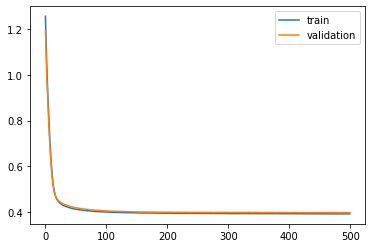

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 44s - loss: 1.2579 - val_loss: 1.1912

Epoch 00001: val_loss improved from inf to 1.19125, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.1495 - val_loss: 1.0955

Epoch 00002: val_loss improved from 1.19125 to 1.09549, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.0588 - val_loss: 1.0140

Epoch 00003: val_loss improved from 1.09549 to 1.01399, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9813 - val_loss: 0.9422

Epoch 00004: val_loss improved from 1.01399 to 0.94219, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.9121 - val_loss: 0.8757

Epoch 00005: val_loss improved from 0.94219 to 0.87569, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8481 - val_loss: 0.8127

Epoch 00006: val_loss improved from 0.87569 to 0.81269, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7878 - val_loss: 0.7539

Epoch 00007: val_loss improved from 0.81269

 - 1s - loss: 0.4095 - val_loss: 0.4061

Epoch 00058: val_loss improved from 0.40672 to 0.40609, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4091 - val_loss: 0.4059

Epoch 00059: val_loss improved from 0.40609 to 0.40592, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4088 - val_loss: 0.4056

Epoch 00060: val_loss improved from 0.40592 to 0.40557, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4085 - val_loss: 0.4053

Epoch 00061: val_loss improved from 0.40557 to 0.40530, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4081 - val_loss: 0.4050

Epoch 00062: val_loss improved from 0.40530 to 0.40498, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4078 - val_loss: 0.4045

Epoch 00063: val_loss improved from 0.40498 to 0.40451, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4074 - val_loss: 0.4047

Epoch 00064: val_loss did not improve from 0.40451
Epoch 65/500
 - 1s - loss: 0.4072 - val_loss


Epoch 00120: val_loss did not improve from 0.39674
Epoch 121/500
 - 1s - loss: 0.3983 - val_loss: 0.3969

Epoch 00121: val_loss did not improve from 0.39674
Epoch 122/500
 - 1s - loss: 0.3982 - val_loss: 0.3970

Epoch 00122: val_loss did not improve from 0.39674
Epoch 123/500
 - 1s - loss: 0.3981 - val_loss: 0.3966

Epoch 00123: val_loss improved from 0.39674 to 0.39660, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3978 - val_loss: 0.3970

Epoch 00124: val_loss did not improve from 0.39660
Epoch 125/500
 - 1s - loss: 0.3979 - val_loss: 0.3965

Epoch 00125: val_loss improved from 0.39660 to 0.39648, saving model to val_weights2.hdf5
Epoch 126/500
 - 1s - loss: 0.3978 - val_loss: 0.3966

Epoch 00126: val_loss did not improve from 0.39648
Epoch 127/500
 - 1s - loss: 0.3977 - val_loss: 0.3963

Epoch 00127: val_loss improved from 0.39648 to 0.39627, saving model to val_weights2.hdf5
Epoch 128/500
 - 1s - loss: 0.3976 - val_loss: 0.3967

Epoch 00128: val_loss did not impr


Epoch 00190: val_loss did not improve from 0.39420
Epoch 191/500
 - 1s - loss: 0.3952 - val_loss: 0.3945

Epoch 00191: val_loss did not improve from 0.39420
Epoch 192/500
 - 1s - loss: 0.3952 - val_loss: 0.3942

Epoch 00192: val_loss improved from 0.39420 to 0.39416, saving model to val_weights2.hdf5
Epoch 193/500
 - 1s - loss: 0.3952 - val_loss: 0.3940

Epoch 00193: val_loss improved from 0.39416 to 0.39398, saving model to val_weights2.hdf5
Epoch 194/500
 - 1s - loss: 0.3951 - val_loss: 0.3944

Epoch 00194: val_loss did not improve from 0.39398
Epoch 195/500
 - 1s - loss: 0.3952 - val_loss: 0.3944

Epoch 00195: val_loss did not improve from 0.39398
Epoch 196/500
 - 1s - loss: 0.3953 - val_loss: 0.3943

Epoch 00196: val_loss did not improve from 0.39398
Epoch 197/500
 - 1s - loss: 0.3953 - val_loss: 0.3941

Epoch 00197: val_loss did not improve from 0.39398
Epoch 198/500
 - 1s - loss: 0.3952 - val_loss: 0.3941

Epoch 00198: val_loss did not improve from 0.39398
Epoch 199/500
 - 1s - 

 - 1s - loss: 0.3941 - val_loss: 0.3935

Epoch 00265: val_loss did not improve from 0.39313
Epoch 266/500
 - 1s - loss: 0.3940 - val_loss: 0.3934

Epoch 00266: val_loss did not improve from 0.39313
Epoch 267/500
 - 1s - loss: 0.3941 - val_loss: 0.3933

Epoch 00267: val_loss did not improve from 0.39313
Epoch 268/500
 - 1s - loss: 0.3940 - val_loss: 0.3933

Epoch 00268: val_loss did not improve from 0.39313
Epoch 269/500
 - 1s - loss: 0.3941 - val_loss: 0.3934

Epoch 00269: val_loss did not improve from 0.39313
Epoch 270/500
 - 1s - loss: 0.3941 - val_loss: 0.3934

Epoch 00270: val_loss did not improve from 0.39313
Epoch 271/500
 - 1s - loss: 0.3941 - val_loss: 0.3934

Epoch 00271: val_loss did not improve from 0.39313
Epoch 272/500
 - 1s - loss: 0.3940 - val_loss: 0.3932

Epoch 00272: val_loss did not improve from 0.39313
Epoch 273/500
 - 1s - loss: 0.3939 - val_loss: 0.3936

Epoch 00273: val_loss did not improve from 0.39313
Epoch 274/500
 - 1s - loss: 0.3939 - val_loss: 0.3936

Epoch

 - 1s - loss: 0.3933 - val_loss: 0.3932

Epoch 00340: val_loss did not improve from 0.39272
Epoch 341/500
 - 1s - loss: 0.3932 - val_loss: 0.3930

Epoch 00341: val_loss did not improve from 0.39272
Epoch 342/500
 - 1s - loss: 0.3933 - val_loss: 0.3931

Epoch 00342: val_loss did not improve from 0.39272
Epoch 343/500
 - 1s - loss: 0.3933 - val_loss: 0.3931

Epoch 00343: val_loss did not improve from 0.39272
Epoch 344/500
 - 1s - loss: 0.3933 - val_loss: 0.3931

Epoch 00344: val_loss did not improve from 0.39272
Epoch 345/500
 - 1s - loss: 0.3933 - val_loss: 0.3928

Epoch 00345: val_loss did not improve from 0.39272
Epoch 346/500
 - 1s - loss: 0.3934 - val_loss: 0.3931

Epoch 00346: val_loss did not improve from 0.39272
Epoch 347/500
 - 1s - loss: 0.3932 - val_loss: 0.3930

Epoch 00347: val_loss did not improve from 0.39272
Epoch 348/500
 - 1s - loss: 0.3933 - val_loss: 0.3932

Epoch 00348: val_loss did not improve from 0.39272
Epoch 349/500
 - 1s - loss: 0.3933 - val_loss: 0.3930

Epoch


Epoch 00416: val_loss did not improve from 0.39258
Epoch 417/500
 - 1s - loss: 0.3927 - val_loss: 0.3928

Epoch 00417: val_loss did not improve from 0.39258
Epoch 418/500
 - 1s - loss: 0.3929 - val_loss: 0.3927

Epoch 00418: val_loss did not improve from 0.39258
Epoch 419/500
 - 1s - loss: 0.3928 - val_loss: 0.3931

Epoch 00419: val_loss did not improve from 0.39258
Epoch 420/500
 - 1s - loss: 0.3928 - val_loss: 0.3927

Epoch 00420: val_loss did not improve from 0.39258
Epoch 421/500
 - 1s - loss: 0.3928 - val_loss: 0.3926

Epoch 00421: val_loss did not improve from 0.39258
Epoch 422/500
 - 1s - loss: 0.3927 - val_loss: 0.3924

Epoch 00422: val_loss improved from 0.39258 to 0.39243, saving model to val_weights2.hdf5
Epoch 423/500
 - 1s - loss: 0.3928 - val_loss: 0.3930

Epoch 00423: val_loss did not improve from 0.39243
Epoch 424/500
 - 1s - loss: 0.3927 - val_loss: 0.3927

Epoch 00424: val_loss did not improve from 0.39243
Epoch 425/500
 - 1s - loss: 0.3928 - val_loss: 0.3927

Epoch 

 - 1s - loss: 0.3924 - val_loss: 0.3928

Epoch 00493: val_loss did not improve from 0.39236
Epoch 494/500
 - 1s - loss: 0.3923 - val_loss: 0.3926

Epoch 00494: val_loss did not improve from 0.39236
Epoch 495/500
 - 1s - loss: 0.3922 - val_loss: 0.3927

Epoch 00495: val_loss did not improve from 0.39236
Epoch 496/500
 - 1s - loss: 0.3925 - val_loss: 0.3927

Epoch 00496: val_loss did not improve from 0.39236
Epoch 497/500
 - 1s - loss: 0.3923 - val_loss: 0.3927

Epoch 00497: val_loss did not improve from 0.39236
Epoch 498/500
 - 1s - loss: 0.3923 - val_loss: 0.3929

Epoch 00498: val_loss did not improve from 0.39236
Epoch 499/500
 - 1s - loss: 0.3923 - val_loss: 0.3925

Epoch 00499: val_loss did not improve from 0.39236
Epoch 500/500
 - 1s - loss: 0.3923 - val_loss: 0.3929

Epoch 00500: val_loss did not improve from 0.39236
#################################
Number of units: 4
Batch size: 8192
Fold: 1
L2: 0.01342716544088697
best val loss: 0.3923648895157708
##############################

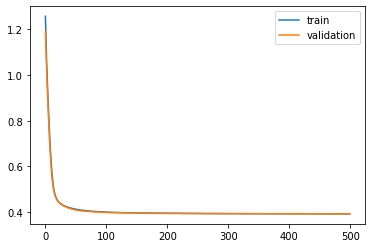

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 47s - loss: 1.2593 - val_loss: 1.1792

Epoch 00001: val_loss improved from inf to 1.17923, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.1512 - val_loss: 1.0818

Epoch 00002: val_loss improved from 1.17923 to 1.08183, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.0606 - val_loss: 0.9998

Epoch 00003: val_loss improved from 1.08183 to 0.99978, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9832 - val_loss: 0.9287

Epoch 00004: val_loss improved from 0.99978 to 0.92869, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.9139 - val_loss: 0.8637

Epoch 00005: val_loss improved from 0.92869 to 0.86370, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8496 - val_loss: 0.8031

Epoch 00006: val_loss improved from 0.86370 to 0.80307, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7890 - val_loss: 0.7470

Epoch 00007: val_loss improved from 0.80307

 - 1s - loss: 0.4090 - val_loss: 0.4159

Epoch 00058: val_loss improved from 0.41606 to 0.41590, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4086 - val_loss: 0.4154

Epoch 00059: val_loss improved from 0.41590 to 0.41541, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4082 - val_loss: 0.4149

Epoch 00060: val_loss improved from 0.41541 to 0.41493, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4079 - val_loss: 0.4150

Epoch 00061: val_loss did not improve from 0.41493
Epoch 62/500
 - 1s - loss: 0.4075 - val_loss: 0.4143

Epoch 00062: val_loss improved from 0.41493 to 0.41431, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4072 - val_loss: 0.4143

Epoch 00063: val_loss improved from 0.41431 to 0.41431, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4067 - val_loss: 0.4138

Epoch 00064: val_loss improved from 0.41431 to 0.41383, saving model to val_weights3.hdf5
Epoch 65/500
 - 1s - loss: 0.4065 - val_loss

 - 1s - loss: 0.3973 - val_loss: 0.4066

Epoch 00122: val_loss did not improve from 0.40651
Epoch 123/500
 - 1s - loss: 0.3972 - val_loss: 0.4065

Epoch 00123: val_loss improved from 0.40651 to 0.40649, saving model to val_weights3.hdf5
Epoch 124/500
 - 1s - loss: 0.3972 - val_loss: 0.4065

Epoch 00124: val_loss did not improve from 0.40649
Epoch 125/500
 - 1s - loss: 0.3971 - val_loss: 0.4060

Epoch 00125: val_loss improved from 0.40649 to 0.40599, saving model to val_weights3.hdf5
Epoch 126/500
 - 1s - loss: 0.3971 - val_loss: 0.4061

Epoch 00126: val_loss did not improve from 0.40599
Epoch 127/500
 - 1s - loss: 0.3970 - val_loss: 0.4065

Epoch 00127: val_loss did not improve from 0.40599
Epoch 128/500
 - 1s - loss: 0.3968 - val_loss: 0.4060

Epoch 00128: val_loss did not improve from 0.40599
Epoch 129/500
 - 1s - loss: 0.3968 - val_loss: 0.4064

Epoch 00129: val_loss did not improve from 0.40599
Epoch 130/500
 - 1s - loss: 0.3967 - val_loss: 0.4059

Epoch 00130: val_loss improved fr

 - 1s - loss: 0.3943 - val_loss: 0.4042

Epoch 00192: val_loss did not improve from 0.40389
Epoch 193/500
 - 1s - loss: 0.3944 - val_loss: 0.4040

Epoch 00193: val_loss did not improve from 0.40389
Epoch 194/500
 - 1s - loss: 0.3943 - val_loss: 0.4043

Epoch 00194: val_loss did not improve from 0.40389
Epoch 195/500
 - 1s - loss: 0.3942 - val_loss: 0.4039

Epoch 00195: val_loss improved from 0.40389 to 0.40387, saving model to val_weights3.hdf5
Epoch 196/500
 - 1s - loss: 0.3943 - val_loss: 0.4041

Epoch 00196: val_loss did not improve from 0.40387
Epoch 197/500
 - 1s - loss: 0.3944 - val_loss: 0.4038

Epoch 00197: val_loss improved from 0.40387 to 0.40382, saving model to val_weights3.hdf5
Epoch 198/500
 - 1s - loss: 0.3943 - val_loss: 0.4043

Epoch 00198: val_loss did not improve from 0.40382
Epoch 199/500
 - 1s - loss: 0.3943 - val_loss: 0.4040

Epoch 00199: val_loss did not improve from 0.40382
Epoch 200/500
 - 1s - loss: 0.3941 - val_loss: 0.4040

Epoch 00200: val_loss did not imp


Epoch 00263: val_loss did not improve from 0.40306
Epoch 264/500
 - 1s - loss: 0.3932 - val_loss: 0.4037

Epoch 00264: val_loss did not improve from 0.40306
Epoch 265/500
 - 1s - loss: 0.3933 - val_loss: 0.4031

Epoch 00265: val_loss did not improve from 0.40306
Epoch 266/500
 - 1s - loss: 0.3932 - val_loss: 0.4031

Epoch 00266: val_loss did not improve from 0.40306
Epoch 267/500
 - 1s - loss: 0.3933 - val_loss: 0.4029

Epoch 00267: val_loss improved from 0.40306 to 0.40293, saving model to val_weights3.hdf5
Epoch 268/500
 - 1s - loss: 0.3933 - val_loss: 0.4035

Epoch 00268: val_loss did not improve from 0.40293
Epoch 269/500
 - 1s - loss: 0.3932 - val_loss: 0.4030

Epoch 00269: val_loss did not improve from 0.40293
Epoch 270/500
 - 1s - loss: 0.3933 - val_loss: 0.4034

Epoch 00270: val_loss did not improve from 0.40293
Epoch 271/500
 - 1s - loss: 0.3931 - val_loss: 0.4030

Epoch 00271: val_loss did not improve from 0.40293
Epoch 272/500
 - 1s - loss: 0.3932 - val_loss: 0.4032

Epoch 


Epoch 00337: val_loss did not improve from 0.40224
Epoch 338/500
 - 1s - loss: 0.3925 - val_loss: 0.4025

Epoch 00338: val_loss did not improve from 0.40224
Epoch 339/500
 - 1s - loss: 0.3925 - val_loss: 0.4028

Epoch 00339: val_loss did not improve from 0.40224
Epoch 340/500
 - 1s - loss: 0.3925 - val_loss: 0.4021

Epoch 00340: val_loss improved from 0.40224 to 0.40211, saving model to val_weights3.hdf5
Epoch 341/500
 - 1s - loss: 0.3926 - val_loss: 0.4024

Epoch 00341: val_loss did not improve from 0.40211
Epoch 342/500
 - 1s - loss: 0.3923 - val_loss: 0.4020

Epoch 00342: val_loss improved from 0.40211 to 0.40204, saving model to val_weights3.hdf5
Epoch 343/500
 - 1s - loss: 0.3924 - val_loss: 0.4024

Epoch 00343: val_loss did not improve from 0.40204
Epoch 344/500
 - 1s - loss: 0.3924 - val_loss: 0.4020

Epoch 00344: val_loss improved from 0.40204 to 0.40204, saving model to val_weights3.hdf5
Epoch 345/500
 - 1s - loss: 0.3925 - val_loss: 0.4024

Epoch 00345: val_loss did not impr


Epoch 00410: val_loss did not improve from 0.40120
Epoch 411/500
 - 1s - loss: 0.3920 - val_loss: 0.4016

Epoch 00411: val_loss did not improve from 0.40120
Epoch 412/500
 - 1s - loss: 0.3918 - val_loss: 0.4019

Epoch 00412: val_loss did not improve from 0.40120
Epoch 413/500
 - 1s - loss: 0.3921 - val_loss: 0.4016

Epoch 00413: val_loss did not improve from 0.40120
Epoch 414/500
 - 1s - loss: 0.3919 - val_loss: 0.4013

Epoch 00414: val_loss did not improve from 0.40120
Epoch 415/500
 - 1s - loss: 0.3919 - val_loss: 0.4019

Epoch 00415: val_loss did not improve from 0.40120
Epoch 416/500
 - 1s - loss: 0.3920 - val_loss: 0.4018

Epoch 00416: val_loss did not improve from 0.40120
Epoch 417/500
 - 1s - loss: 0.3919 - val_loss: 0.4017

Epoch 00417: val_loss did not improve from 0.40120
Epoch 418/500
 - 1s - loss: 0.3920 - val_loss: 0.4013

Epoch 00418: val_loss did not improve from 0.40120
Epoch 419/500
 - 1s - loss: 0.3919 - val_loss: 0.4014

Epoch 00419: val_loss did not improve from 0.

 - 1s - loss: 0.3915 - val_loss: 0.4014

Epoch 00487: val_loss did not improve from 0.40094
Epoch 488/500
 - 1s - loss: 0.3916 - val_loss: 0.4019

Epoch 00488: val_loss did not improve from 0.40094
Epoch 489/500
 - 1s - loss: 0.3915 - val_loss: 0.4016

Epoch 00489: val_loss did not improve from 0.40094
Epoch 490/500
 - 1s - loss: 0.3916 - val_loss: 0.4014

Epoch 00490: val_loss did not improve from 0.40094
Epoch 491/500
 - 1s - loss: 0.3914 - val_loss: 0.4009

Epoch 00491: val_loss improved from 0.40094 to 0.40088, saving model to val_weights3.hdf5
Epoch 492/500
 - 1s - loss: 0.3914 - val_loss: 0.4014

Epoch 00492: val_loss did not improve from 0.40088
Epoch 493/500
 - 1s - loss: 0.3913 - val_loss: 0.4010

Epoch 00493: val_loss did not improve from 0.40088
Epoch 494/500
 - 1s - loss: 0.3914 - val_loss: 0.4021

Epoch 00494: val_loss did not improve from 0.40088
Epoch 495/500
 - 1s - loss: 0.3914 - val_loss: 0.4014

Epoch 00495: val_loss did not improve from 0.40088
Epoch 496/500
 - 1s -

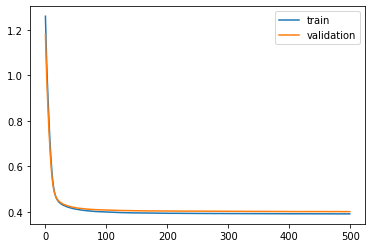

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 57s - loss: 1.2585 - val_loss: 1.1849

Epoch 00001: val_loss improved from inf to 1.18492, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.1505 - val_loss: 1.0870

Epoch 00002: val_loss improved from 1.18492 to 1.08700, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.0600 - val_loss: 1.0049

Epoch 00003: val_loss improved from 1.08700 to 1.00486, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9825 - val_loss: 0.9329

Epoch 00004: val_loss improved from 1.00486 to 0.93288, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.9132 - val_loss: 0.8669

Epoch 00005: val_loss improved from 0.93288 to 0.86686, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8491 - val_loss: 0.8047

Epoch 00006: val_loss improved from 0.86686 to 0.80474, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7888 - val_loss: 0.7466

Epoch 00007: val_loss improved from 0.80474

 - 1s - loss: 0.4098 - val_loss: 0.4085

Epoch 00058: val_loss improved from 0.40897 to 0.40855, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4094 - val_loss: 0.4082

Epoch 00059: val_loss improved from 0.40855 to 0.40822, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4091 - val_loss: 0.4079

Epoch 00060: val_loss improved from 0.40822 to 0.40791, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4087 - val_loss: 0.4076

Epoch 00061: val_loss improved from 0.40791 to 0.40763, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4084 - val_loss: 0.4067

Epoch 00062: val_loss improved from 0.40763 to 0.40674, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4080 - val_loss: 0.4067

Epoch 00063: val_loss improved from 0.40674 to 0.40670, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4078 - val_loss: 0.4064

Epoch 00064: val_loss improved from 0.40670 to 0.40639, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.3986 - val_loss: 0.3969

Epoch 00119: val_loss improved from 0.39727 to 0.39687, saving model to val_weights4.hdf5
Epoch 120/500
 - 1s - loss: 0.3985 - val_loss: 0.3971

Epoch 00120: val_loss did not improve from 0.39687
Epoch 121/500
 - 1s - loss: 0.3985 - val_loss: 0.3969

Epoch 00121: val_loss did not improve from 0.39687
Epoch 122/500
 - 1s - loss: 0.3983 - val_loss: 0.3969

Epoch 00122: val_loss did not improve from 0.39687
Epoch 123/500
 - 1s - loss: 0.3981 - val_loss: 0.3970

Epoch 00123: val_loss did not improve from 0.39687
Epoch 124/500
 - 1s - loss: 0.3981 - val_loss: 0.3965

Epoch 00124: val_loss improved from 0.39687 to 0.39654, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3981 - val_loss: 0.3971

Epoch 00125: val_loss did not improve from 0.39654
Epoch 126/500
 - 1s - loss: 0.3980 - val_loss: 0.3967

Epoch 00126: val_loss did not improve from 0.39654
Epoch 127/500
 - 1s - loss: 0.3978 - val_loss: 0.3969

Epoch 00127: val_loss did not imp

 - 1s - loss: 0.3954 - val_loss: 0.3950

Epoch 00193: val_loss did not improve from 0.39500
Epoch 194/500
 - 1s - loss: 0.3953 - val_loss: 0.3952

Epoch 00194: val_loss did not improve from 0.39500
Epoch 195/500
 - 1s - loss: 0.3954 - val_loss: 0.3949

Epoch 00195: val_loss improved from 0.39500 to 0.39487, saving model to val_weights4.hdf5
Epoch 196/500
 - 1s - loss: 0.3953 - val_loss: 0.3952

Epoch 00196: val_loss did not improve from 0.39487
Epoch 197/500
 - 1s - loss: 0.3953 - val_loss: 0.3949

Epoch 00197: val_loss did not improve from 0.39487
Epoch 198/500
 - 1s - loss: 0.3953 - val_loss: 0.3953

Epoch 00198: val_loss did not improve from 0.39487
Epoch 199/500
 - 1s - loss: 0.3953 - val_loss: 0.3951

Epoch 00199: val_loss did not improve from 0.39487
Epoch 200/500
 - 1s - loss: 0.3953 - val_loss: 0.3948

Epoch 00200: val_loss improved from 0.39487 to 0.39484, saving model to val_weights4.hdf5
Epoch 201/500
 - 1s - loss: 0.3953 - val_loss: 0.3951

Epoch 00201: val_loss did not imp

 - 1s - loss: 0.3946 - val_loss: 0.3943

Epoch 00268: val_loss did not improve from 0.39383
Epoch 269/500
 - 1s - loss: 0.3946 - val_loss: 0.3943

Epoch 00269: val_loss did not improve from 0.39383
Epoch 270/500
 - 1s - loss: 0.3945 - val_loss: 0.3943

Epoch 00270: val_loss did not improve from 0.39383
Epoch 271/500
 - 1s - loss: 0.3945 - val_loss: 0.3943

Epoch 00271: val_loss did not improve from 0.39383
Epoch 272/500
 - 1s - loss: 0.3944 - val_loss: 0.3945

Epoch 00272: val_loss did not improve from 0.39383
Epoch 273/500
 - 1s - loss: 0.3944 - val_loss: 0.3938

Epoch 00273: val_loss improved from 0.39383 to 0.39382, saving model to val_weights4.hdf5
Epoch 274/500
 - 1s - loss: 0.3943 - val_loss: 0.3943

Epoch 00274: val_loss did not improve from 0.39382
Epoch 275/500
 - 1s - loss: 0.3942 - val_loss: 0.3943

Epoch 00275: val_loss did not improve from 0.39382
Epoch 276/500
 - 1s - loss: 0.3943 - val_loss: 0.3943

Epoch 00276: val_loss did not improve from 0.39382
Epoch 277/500
 - 1s -

 - 1s - loss: 0.3936 - val_loss: 0.3938

Epoch 00343: val_loss did not improve from 0.39336
Epoch 344/500
 - 1s - loss: 0.3936 - val_loss: 0.3935

Epoch 00344: val_loss did not improve from 0.39336
Epoch 345/500
 - 1s - loss: 0.3936 - val_loss: 0.3939

Epoch 00345: val_loss did not improve from 0.39336
Epoch 346/500
 - 1s - loss: 0.3937 - val_loss: 0.3933

Epoch 00346: val_loss improved from 0.39336 to 0.39334, saving model to val_weights4.hdf5
Epoch 347/500
 - 1s - loss: 0.3937 - val_loss: 0.3939

Epoch 00347: val_loss did not improve from 0.39334
Epoch 348/500
 - 1s - loss: 0.3936 - val_loss: 0.3936

Epoch 00348: val_loss did not improve from 0.39334
Epoch 349/500
 - 1s - loss: 0.3936 - val_loss: 0.3936

Epoch 00349: val_loss did not improve from 0.39334
Epoch 350/500
 - 1s - loss: 0.3935 - val_loss: 0.3934

Epoch 00350: val_loss did not improve from 0.39334
Epoch 351/500
 - 1s - loss: 0.3935 - val_loss: 0.3937

Epoch 00351: val_loss did not improve from 0.39334
Epoch 352/500
 - 1s -

 - 1s - loss: 0.3931 - val_loss: 0.3936

Epoch 00420: val_loss did not improve from 0.39328
Epoch 421/500
 - 1s - loss: 0.3931 - val_loss: 0.3940

Epoch 00421: val_loss did not improve from 0.39328
Epoch 422/500
 - 1s - loss: 0.3933 - val_loss: 0.3938

Epoch 00422: val_loss did not improve from 0.39328
Epoch 423/500
 - 1s - loss: 0.3933 - val_loss: 0.3936

Epoch 00423: val_loss did not improve from 0.39328
Epoch 424/500
 - 1s - loss: 0.3933 - val_loss: 0.3937

Epoch 00424: val_loss did not improve from 0.39328
Epoch 425/500
 - 1s - loss: 0.3932 - val_loss: 0.3934

Epoch 00425: val_loss did not improve from 0.39328
Epoch 426/500
 - 1s - loss: 0.3931 - val_loss: 0.3939

Epoch 00426: val_loss did not improve from 0.39328
Epoch 427/500
 - 1s - loss: 0.3931 - val_loss: 0.3939

Epoch 00427: val_loss did not improve from 0.39328
Epoch 428/500
 - 1s - loss: 0.3931 - val_loss: 0.3935

Epoch 00428: val_loss did not improve from 0.39328
Epoch 429/500
 - 1s - loss: 0.3930 - val_loss: 0.3939

Epoch

 - 1s - loss: 0.3926 - val_loss: 0.3936

Epoch 00495: val_loss did not improve from 0.39290
Epoch 496/500
 - 1s - loss: 0.3925 - val_loss: 0.3932

Epoch 00496: val_loss did not improve from 0.39290
Epoch 497/500
 - 1s - loss: 0.3927 - val_loss: 0.3933

Epoch 00497: val_loss did not improve from 0.39290
Epoch 498/500
 - 1s - loss: 0.3926 - val_loss: 0.3931

Epoch 00498: val_loss did not improve from 0.39290
Epoch 499/500
 - 1s - loss: 0.3924 - val_loss: 0.3932

Epoch 00499: val_loss did not improve from 0.39290
Epoch 500/500
 - 1s - loss: 0.3925 - val_loss: 0.3931

Epoch 00500: val_loss did not improve from 0.39290
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.01342716544088697
best val loss: 0.3928974098364512
#################################


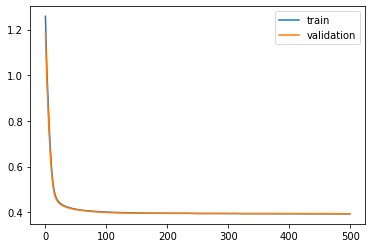

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 36s - loss: 1.2589 - val_loss: 1.1831

Epoch 00001: val_loss improved from inf to 1.18308, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.1507 - val_loss: 1.0868

Epoch 00002: val_loss improved from 1.18308 to 1.08680, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0602 - val_loss: 1.0056

Epoch 00003: val_loss improved from 1.08680 to 1.00564, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9827 - val_loss: 0.9342

Epoch 00004: val_loss improved from 1.00564 to 0.93416, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.9135 - val_loss: 0.8691

Epoch 00005: val_loss improved from 0.93416 to 0.86909, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8492 - val_loss: 0.8081

Epoch 00006: val_loss improved from 0.86909 to 0.80806, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7888 - val_loss: 0.7506

Epoch 00007: val_loss improved from 0.80806


Epoch 00058: val_loss improved from 0.41266 to 0.41222, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4090 - val_loss: 0.4123

Epoch 00059: val_loss did not improve from 0.41222
Epoch 60/500
 - 1s - loss: 0.4087 - val_loss: 0.4120

Epoch 00060: val_loss improved from 0.41222 to 0.41203, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4083 - val_loss: 0.4119

Epoch 00061: val_loss improved from 0.41203 to 0.41194, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4079 - val_loss: 0.4115

Epoch 00062: val_loss improved from 0.41194 to 0.41148, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4076 - val_loss: 0.4113

Epoch 00063: val_loss improved from 0.41148 to 0.41133, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4072 - val_loss: 0.4109

Epoch 00064: val_loss improved from 0.41133 to 0.41087, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4069 - val_loss: 0.4107

Epoch 00065: val_loss improved

 - 1s - loss: 0.3984 - val_loss: 0.4023

Epoch 00119: val_loss did not improve from 0.40226
Epoch 120/500
 - 1s - loss: 0.3983 - val_loss: 0.4026

Epoch 00120: val_loss did not improve from 0.40226
Epoch 121/500
 - 1s - loss: 0.3982 - val_loss: 0.4024

Epoch 00121: val_loss did not improve from 0.40226
Epoch 122/500
 - 1s - loss: 0.3981 - val_loss: 0.4022

Epoch 00122: val_loss improved from 0.40226 to 0.40217, saving model to val_weights5.hdf5
Epoch 123/500
 - 1s - loss: 0.3979 - val_loss: 0.4022

Epoch 00123: val_loss did not improve from 0.40217
Epoch 124/500
 - 1s - loss: 0.3979 - val_loss: 0.4020

Epoch 00124: val_loss improved from 0.40217 to 0.40200, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3978 - val_loss: 0.4019

Epoch 00125: val_loss improved from 0.40200 to 0.40193, saving model to val_weights5.hdf5
Epoch 126/500
 - 1s - loss: 0.3978 - val_loss: 0.4016

Epoch 00126: val_loss improved from 0.40193 to 0.40163, saving model to val_weights5.hdf5
Epoch 127/

 - 1s - loss: 0.3950 - val_loss: 0.3990

Epoch 00187: val_loss improved from 0.39905 to 0.39902, saving model to val_weights5.hdf5
Epoch 188/500
 - 1s - loss: 0.3950 - val_loss: 0.3993

Epoch 00188: val_loss did not improve from 0.39902
Epoch 189/500
 - 1s - loss: 0.3951 - val_loss: 0.3993

Epoch 00189: val_loss did not improve from 0.39902
Epoch 190/500
 - 1s - loss: 0.3951 - val_loss: 0.3988

Epoch 00190: val_loss improved from 0.39902 to 0.39880, saving model to val_weights5.hdf5
Epoch 191/500
 - 1s - loss: 0.3949 - val_loss: 0.3990

Epoch 00191: val_loss did not improve from 0.39880
Epoch 192/500
 - 1s - loss: 0.3949 - val_loss: 0.3990

Epoch 00192: val_loss did not improve from 0.39880
Epoch 193/500
 - 1s - loss: 0.3949 - val_loss: 0.3990

Epoch 00193: val_loss did not improve from 0.39880
Epoch 194/500
 - 1s - loss: 0.3949 - val_loss: 0.3991

Epoch 00194: val_loss did not improve from 0.39880
Epoch 195/500
 - 1s - loss: 0.3948 - val_loss: 0.3992

Epoch 00195: val_loss did not imp


Epoch 00259: val_loss did not improve from 0.39765
Epoch 260/500
 - 1s - loss: 0.3938 - val_loss: 0.3979

Epoch 00260: val_loss did not improve from 0.39765
Epoch 261/500
 - 1s - loss: 0.3938 - val_loss: 0.3980

Epoch 00261: val_loss did not improve from 0.39765
Epoch 262/500
 - 1s - loss: 0.3937 - val_loss: 0.3978

Epoch 00262: val_loss did not improve from 0.39765
Epoch 263/500
 - 1s - loss: 0.3937 - val_loss: 0.3981

Epoch 00263: val_loss did not improve from 0.39765
Epoch 264/500
 - 1s - loss: 0.3936 - val_loss: 0.3979

Epoch 00264: val_loss did not improve from 0.39765
Epoch 265/500
 - 1s - loss: 0.3937 - val_loss: 0.3978

Epoch 00265: val_loss did not improve from 0.39765
Epoch 266/500
 - 1s - loss: 0.3937 - val_loss: 0.3981

Epoch 00266: val_loss did not improve from 0.39765
Epoch 267/500
 - 1s - loss: 0.3937 - val_loss: 0.3977

Epoch 00267: val_loss did not improve from 0.39765
Epoch 268/500
 - 1s - loss: 0.3936 - val_loss: 0.3979

Epoch 00268: val_loss did not improve from 0.

 - 1s - loss: 0.3929 - val_loss: 0.3977

Epoch 00336: val_loss did not improve from 0.39746
Epoch 337/500
 - 1s - loss: 0.3928 - val_loss: 0.3978

Epoch 00337: val_loss did not improve from 0.39746
Epoch 338/500
 - 1s - loss: 0.3929 - val_loss: 0.3977

Epoch 00338: val_loss did not improve from 0.39746
Epoch 339/500
 - 1s - loss: 0.3928 - val_loss: 0.3979

Epoch 00339: val_loss did not improve from 0.39746
Epoch 340/500
 - 1s - loss: 0.3930 - val_loss: 0.3977

Epoch 00340: val_loss did not improve from 0.39746
Epoch 341/500
 - 1s - loss: 0.3927 - val_loss: 0.3976

Epoch 00341: val_loss did not improve from 0.39746
Epoch 342/500
 - 1s - loss: 0.3928 - val_loss: 0.3979

Epoch 00342: val_loss did not improve from 0.39746
Epoch 343/500
 - 1s - loss: 0.3927 - val_loss: 0.3975

Epoch 00343: val_loss did not improve from 0.39746
Epoch 344/500
 - 1s - loss: 0.3928 - val_loss: 0.3978

Epoch 00344: val_loss did not improve from 0.39746
Epoch 345/500
 - 1s - loss: 0.3928 - val_loss: 0.3978

Epoch

 - 1s - loss: 0.3924 - val_loss: 0.3973

Epoch 00412: val_loss did not improve from 0.39706
Epoch 413/500
 - 1s - loss: 0.3923 - val_loss: 0.3974

Epoch 00413: val_loss did not improve from 0.39706
Epoch 414/500
 - 1s - loss: 0.3922 - val_loss: 0.3976

Epoch 00414: val_loss did not improve from 0.39706
Epoch 415/500
 - 1s - loss: 0.3924 - val_loss: 0.3979

Epoch 00415: val_loss did not improve from 0.39706
Epoch 416/500
 - 1s - loss: 0.3924 - val_loss: 0.3973

Epoch 00416: val_loss did not improve from 0.39706
Epoch 417/500
 - 1s - loss: 0.3922 - val_loss: 0.3975

Epoch 00417: val_loss did not improve from 0.39706
Epoch 418/500
 - 1s - loss: 0.3922 - val_loss: 0.3974

Epoch 00418: val_loss did not improve from 0.39706
Epoch 419/500
 - 1s - loss: 0.3922 - val_loss: 0.3976

Epoch 00419: val_loss did not improve from 0.39706
Epoch 420/500
 - 1s - loss: 0.3924 - val_loss: 0.3973

Epoch 00420: val_loss did not improve from 0.39706
Epoch 421/500
 - 1s - loss: 0.3924 - val_loss: 0.3973

Epoch


Epoch 00488: val_loss did not improve from 0.39666
Epoch 489/500
 - 1s - loss: 0.3918 - val_loss: 0.3975

Epoch 00489: val_loss did not improve from 0.39666
Epoch 490/500
 - 1s - loss: 0.3919 - val_loss: 0.3975

Epoch 00490: val_loss did not improve from 0.39666
Epoch 491/500
 - 1s - loss: 0.3918 - val_loss: 0.3973

Epoch 00491: val_loss did not improve from 0.39666
Epoch 492/500
 - 1s - loss: 0.3918 - val_loss: 0.3974

Epoch 00492: val_loss did not improve from 0.39666
Epoch 493/500
 - 1s - loss: 0.3918 - val_loss: 0.3979

Epoch 00493: val_loss did not improve from 0.39666
Epoch 494/500
 - 1s - loss: 0.3917 - val_loss: 0.3972

Epoch 00494: val_loss did not improve from 0.39666
Epoch 495/500
 - 1s - loss: 0.3919 - val_loss: 0.3973

Epoch 00495: val_loss did not improve from 0.39666
Epoch 496/500
 - 1s - loss: 0.3919 - val_loss: 0.3972

Epoch 00496: val_loss did not improve from 0.39666
Epoch 497/500
 - 1s - loss: 0.3919 - val_loss: 0.3972

Epoch 00497: val_loss did not improve from 0.

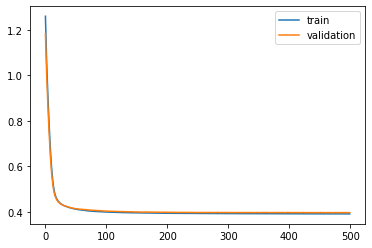

Time to train LSTM:  404.5768973827362
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 35s - loss: 1.2954 - val_loss: 1.2310

Epoch 00001: val_loss improved from inf to 1.23099, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.1817 - val_loss: 1.1270

Epoch 00002: val_loss improved from 1.23099 to 1.12705, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.0862 - val_loss: 1.0393

Epoch 00003: val_loss improved from 1.12705 to 1.03934, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 1.0044 - val_loss: 0.9629

Epoch 00004: val_loss improved from 1.03934 to 0.96289, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.9313 - val_loss: 0.8933

Epoch 00005: val_loss improved from 0.96289 to 0.89334, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8638 - val_loss: 0.8288

Epoch 00006: val_loss improved from 0.89334 to 0.82885, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.8002 - val_loss: 0.7682

Epoc


Epoch 00057: val_loss improved from 0.41605 to 0.41582, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4093 - val_loss: 0.4152

Epoch 00058: val_loss improved from 0.41582 to 0.41520, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4090 - val_loss: 0.4153

Epoch 00059: val_loss did not improve from 0.41520
Epoch 60/500
 - 1s - loss: 0.4086 - val_loss: 0.4145

Epoch 00060: val_loss improved from 0.41520 to 0.41450, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4084 - val_loss: 0.4141

Epoch 00061: val_loss improved from 0.41450 to 0.41413, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4079 - val_loss: 0.4137

Epoch 00062: val_loss improved from 0.41413 to 0.41366, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4077 - val_loss: 0.4134

Epoch 00063: val_loss improved from 0.41366 to 0.41343, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4073 - val_loss: 0.4131

Epoch 00064: val_loss improved

 - 1s - loss: 0.3981 - val_loss: 0.4030

Epoch 00120: val_loss did not improve from 0.40287
Epoch 121/500
 - 1s - loss: 0.3981 - val_loss: 0.4026

Epoch 00121: val_loss improved from 0.40287 to 0.40256, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3979 - val_loss: 0.4028

Epoch 00122: val_loss did not improve from 0.40256
Epoch 123/500
 - 1s - loss: 0.3980 - val_loss: 0.4024

Epoch 00123: val_loss improved from 0.40256 to 0.40243, saving model to val_weights1.hdf5
Epoch 124/500
 - 1s - loss: 0.3979 - val_loss: 0.4025

Epoch 00124: val_loss did not improve from 0.40243
Epoch 125/500
 - 1s - loss: 0.3979 - val_loss: 0.4029

Epoch 00125: val_loss did not improve from 0.40243
Epoch 126/500
 - 1s - loss: 0.3977 - val_loss: 0.4023

Epoch 00126: val_loss improved from 0.40243 to 0.40227, saving model to val_weights1.hdf5
Epoch 127/500
 - 1s - loss: 0.3976 - val_loss: 0.4024

Epoch 00127: val_loss did not improve from 0.40227
Epoch 128/500
 - 1s - loss: 0.3975 - val_loss: 0.

 - 1s - loss: 0.3950 - val_loss: 0.3995

Epoch 00190: val_loss did not improve from 0.39919
Epoch 191/500
 - 1s - loss: 0.3950 - val_loss: 0.3992

Epoch 00191: val_loss did not improve from 0.39919
Epoch 192/500
 - 1s - loss: 0.3952 - val_loss: 0.3991

Epoch 00192: val_loss improved from 0.39919 to 0.39906, saving model to val_weights1.hdf5
Epoch 193/500
 - 1s - loss: 0.3951 - val_loss: 0.3994

Epoch 00193: val_loss did not improve from 0.39906
Epoch 194/500
 - 1s - loss: 0.3950 - val_loss: 0.3992

Epoch 00194: val_loss did not improve from 0.39906
Epoch 195/500
 - 1s - loss: 0.3950 - val_loss: 0.3997

Epoch 00195: val_loss did not improve from 0.39906
Epoch 196/500
 - 1s - loss: 0.3949 - val_loss: 0.3992

Epoch 00196: val_loss did not improve from 0.39906
Epoch 197/500
 - 1s - loss: 0.3949 - val_loss: 0.3995

Epoch 00197: val_loss did not improve from 0.39906
Epoch 198/500
 - 1s - loss: 0.3950 - val_loss: 0.3991

Epoch 00198: val_loss did not improve from 0.39906
Epoch 199/500
 - 1s -


Epoch 00264: val_loss did not improve from 0.39822
Epoch 265/500
 - 1s - loss: 0.3938 - val_loss: 0.3984

Epoch 00265: val_loss did not improve from 0.39822
Epoch 266/500
 - 1s - loss: 0.3939 - val_loss: 0.3984

Epoch 00266: val_loss did not improve from 0.39822
Epoch 267/500
 - 1s - loss: 0.3938 - val_loss: 0.3984

Epoch 00267: val_loss did not improve from 0.39822
Epoch 268/500
 - 1s - loss: 0.3938 - val_loss: 0.3985

Epoch 00268: val_loss did not improve from 0.39822
Epoch 269/500
 - 1s - loss: 0.3938 - val_loss: 0.3987

Epoch 00269: val_loss did not improve from 0.39822
Epoch 270/500
 - 1s - loss: 0.3938 - val_loss: 0.3983

Epoch 00270: val_loss did not improve from 0.39822
Epoch 271/500
 - 1s - loss: 0.3937 - val_loss: 0.3984

Epoch 00271: val_loss did not improve from 0.39822
Epoch 272/500
 - 1s - loss: 0.3937 - val_loss: 0.3983

Epoch 00272: val_loss did not improve from 0.39822
Epoch 273/500
 - 1s - loss: 0.3938 - val_loss: 0.3984

Epoch 00273: val_loss did not improve from 0.

 - 1s - loss: 0.3933 - val_loss: 0.3979

Epoch 00341: val_loss did not improve from 0.39782
Epoch 342/500
 - 1s - loss: 0.3934 - val_loss: 0.3985

Epoch 00342: val_loss did not improve from 0.39782
Epoch 343/500
 - 1s - loss: 0.3933 - val_loss: 0.3982

Epoch 00343: val_loss did not improve from 0.39782
Epoch 344/500
 - 1s - loss: 0.3933 - val_loss: 0.3981

Epoch 00344: val_loss did not improve from 0.39782
Epoch 345/500
 - 1s - loss: 0.3932 - val_loss: 0.3978

Epoch 00345: val_loss improved from 0.39782 to 0.39779, saving model to val_weights1.hdf5
Epoch 346/500
 - 1s - loss: 0.3931 - val_loss: 0.3983

Epoch 00346: val_loss did not improve from 0.39779
Epoch 347/500
 - 1s - loss: 0.3931 - val_loss: 0.3981

Epoch 00347: val_loss did not improve from 0.39779
Epoch 348/500
 - 1s - loss: 0.3933 - val_loss: 0.3978

Epoch 00348: val_loss did not improve from 0.39779
Epoch 349/500
 - 1s - loss: 0.3931 - val_loss: 0.3983

Epoch 00349: val_loss did not improve from 0.39779
Epoch 350/500
 - 1s -


Epoch 00415: val_loss did not improve from 0.39721
Epoch 416/500
 - 1s - loss: 0.3926 - val_loss: 0.3975

Epoch 00416: val_loss did not improve from 0.39721
Epoch 417/500
 - 1s - loss: 0.3928 - val_loss: 0.3975

Epoch 00417: val_loss did not improve from 0.39721
Epoch 418/500
 - 1s - loss: 0.3927 - val_loss: 0.3975

Epoch 00418: val_loss did not improve from 0.39721
Epoch 419/500
 - 1s - loss: 0.3927 - val_loss: 0.3977

Epoch 00419: val_loss did not improve from 0.39721
Epoch 420/500
 - 1s - loss: 0.3927 - val_loss: 0.3978

Epoch 00420: val_loss did not improve from 0.39721
Epoch 421/500
 - 1s - loss: 0.3928 - val_loss: 0.3981

Epoch 00421: val_loss did not improve from 0.39721
Epoch 422/500
 - 1s - loss: 0.3929 - val_loss: 0.3974

Epoch 00422: val_loss did not improve from 0.39721
Epoch 423/500
 - 1s - loss: 0.3927 - val_loss: 0.3978

Epoch 00423: val_loss did not improve from 0.39721
Epoch 424/500
 - 1s - loss: 0.3925 - val_loss: 0.3974

Epoch 00424: val_loss did not improve from 0.


Epoch 00492: val_loss did not improve from 0.39701
Epoch 493/500
 - 1s - loss: 0.3920 - val_loss: 0.3972

Epoch 00493: val_loss did not improve from 0.39701
Epoch 494/500
 - 1s - loss: 0.3920 - val_loss: 0.3974

Epoch 00494: val_loss did not improve from 0.39701
Epoch 495/500
 - 1s - loss: 0.3921 - val_loss: 0.3975

Epoch 00495: val_loss did not improve from 0.39701
Epoch 496/500
 - 1s - loss: 0.3920 - val_loss: 0.3976

Epoch 00496: val_loss did not improve from 0.39701
Epoch 497/500
 - 1s - loss: 0.3921 - val_loss: 0.3971

Epoch 00497: val_loss did not improve from 0.39701
Epoch 498/500
 - 1s - loss: 0.3920 - val_loss: 0.3978

Epoch 00498: val_loss did not improve from 0.39701
Epoch 499/500
 - 1s - loss: 0.3922 - val_loss: 0.3973

Epoch 00499: val_loss did not improve from 0.39701
Epoch 500/500
 - 1s - loss: 0.3921 - val_loss: 0.3973

Epoch 00500: val_loss did not improve from 0.39701
#################################
Number of units: 4
Batch size: 8192
Fold: 0
L2: 0.0147959983684840

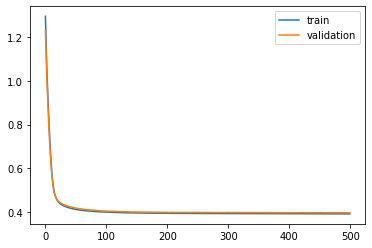

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 35s - loss: 1.2961 - val_loss: 1.2263

Epoch 00001: val_loss improved from inf to 1.22633, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.1822 - val_loss: 1.1253

Epoch 00002: val_loss improved from 1.22633 to 1.12529, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.0864 - val_loss: 1.0390

Epoch 00003: val_loss improved from 1.12529 to 1.03901, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 1.0044 - val_loss: 0.9631

Epoch 00004: val_loss improved from 1.03901 to 0.96307, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.9314 - val_loss: 0.8930

Epoch 00005: val_loss improved from 0.96307 to 0.89295, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8639 - val_loss: 0.8268

Epoch 00006: val_loss improved from 0.89295 to 0.82685, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.8005 - val_loss: 0.7652

Epoch 00007: val_loss improved from 0.82685

 - 1s - loss: 0.4099 - val_loss: 0.4064

Epoch 00058: val_loss improved from 0.40685 to 0.40644, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4095 - val_loss: 0.4062

Epoch 00059: val_loss improved from 0.40644 to 0.40616, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4091 - val_loss: 0.4057

Epoch 00060: val_loss improved from 0.40616 to 0.40572, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4088 - val_loss: 0.4058

Epoch 00061: val_loss did not improve from 0.40572
Epoch 62/500
 - 1s - loss: 0.4084 - val_loss: 0.4053

Epoch 00062: val_loss improved from 0.40572 to 0.40530, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4082 - val_loss: 0.4051

Epoch 00063: val_loss improved from 0.40530 to 0.40507, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4078 - val_loss: 0.4050

Epoch 00064: val_loss improved from 0.40507 to 0.40502, saving model to val_weights2.hdf5
Epoch 65/500
 - 1s - loss: 0.4075 - val_loss


Epoch 00122: val_loss did not improve from 0.39710
Epoch 123/500
 - 1s - loss: 0.3984 - val_loss: 0.3969

Epoch 00123: val_loss improved from 0.39710 to 0.39695, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3982 - val_loss: 0.3968

Epoch 00124: val_loss improved from 0.39695 to 0.39681, saving model to val_weights2.hdf5
Epoch 125/500
 - 1s - loss: 0.3981 - val_loss: 0.3972

Epoch 00125: val_loss did not improve from 0.39681
Epoch 126/500
 - 1s - loss: 0.3981 - val_loss: 0.3968

Epoch 00126: val_loss improved from 0.39681 to 0.39680, saving model to val_weights2.hdf5
Epoch 127/500
 - 1s - loss: 0.3982 - val_loss: 0.3969

Epoch 00127: val_loss did not improve from 0.39680
Epoch 128/500
 - 1s - loss: 0.3980 - val_loss: 0.3970

Epoch 00128: val_loss did not improve from 0.39680
Epoch 129/500
 - 1s - loss: 0.3980 - val_loss: 0.3967

Epoch 00129: val_loss improved from 0.39680 to 0.39666, saving model to val_weights2.hdf5
Epoch 130/500
 - 1s - loss: 0.3979 - val_loss: 0.3

 - 1s - loss: 0.3955 - val_loss: 0.3943

Epoch 00194: val_loss improved from 0.39436 to 0.39430, saving model to val_weights2.hdf5
Epoch 195/500
 - 1s - loss: 0.3955 - val_loss: 0.3944

Epoch 00195: val_loss did not improve from 0.39430
Epoch 196/500
 - 1s - loss: 0.3954 - val_loss: 0.3949

Epoch 00196: val_loss did not improve from 0.39430
Epoch 197/500
 - 1s - loss: 0.3954 - val_loss: 0.3944

Epoch 00197: val_loss did not improve from 0.39430
Epoch 198/500
 - 1s - loss: 0.3954 - val_loss: 0.3945

Epoch 00198: val_loss did not improve from 0.39430
Epoch 199/500
 - 1s - loss: 0.3955 - val_loss: 0.3943

Epoch 00199: val_loss did not improve from 0.39430
Epoch 200/500
 - 1s - loss: 0.3953 - val_loss: 0.3943

Epoch 00200: val_loss improved from 0.39430 to 0.39426, saving model to val_weights2.hdf5
Epoch 201/500
 - 1s - loss: 0.3954 - val_loss: 0.3940

Epoch 00201: val_loss improved from 0.39426 to 0.39405, saving model to val_weights2.hdf5
Epoch 202/500
 - 1s - loss: 0.3953 - val_loss: 0.

 - 1s - loss: 0.3943 - val_loss: 0.3934

Epoch 00269: val_loss improved from 0.39343 to 0.39338, saving model to val_weights2.hdf5
Epoch 270/500
 - 1s - loss: 0.3944 - val_loss: 0.3934

Epoch 00270: val_loss did not improve from 0.39338
Epoch 271/500
 - 1s - loss: 0.3943 - val_loss: 0.3936

Epoch 00271: val_loss did not improve from 0.39338
Epoch 272/500
 - 1s - loss: 0.3941 - val_loss: 0.3935

Epoch 00272: val_loss did not improve from 0.39338
Epoch 273/500
 - 1s - loss: 0.3943 - val_loss: 0.3938

Epoch 00273: val_loss did not improve from 0.39338
Epoch 274/500
 - 1s - loss: 0.3942 - val_loss: 0.3935

Epoch 00274: val_loss did not improve from 0.39338
Epoch 275/500
 - 1s - loss: 0.3942 - val_loss: 0.3937

Epoch 00275: val_loss did not improve from 0.39338
Epoch 276/500
 - 1s - loss: 0.3943 - val_loss: 0.3937

Epoch 00276: val_loss did not improve from 0.39338
Epoch 277/500
 - 1s - loss: 0.3943 - val_loss: 0.3933

Epoch 00277: val_loss improved from 0.39338 to 0.39334, saving model to 


Epoch 00344: val_loss did not improve from 0.39291
Epoch 345/500
 - 1s - loss: 0.3936 - val_loss: 0.3931

Epoch 00345: val_loss did not improve from 0.39291
Epoch 346/500
 - 1s - loss: 0.3935 - val_loss: 0.3929

Epoch 00346: val_loss improved from 0.39291 to 0.39286, saving model to val_weights2.hdf5
Epoch 347/500
 - 1s - loss: 0.3936 - val_loss: 0.3931

Epoch 00347: val_loss did not improve from 0.39286
Epoch 348/500
 - 1s - loss: 0.3934 - val_loss: 0.3933

Epoch 00348: val_loss did not improve from 0.39286
Epoch 349/500
 - 1s - loss: 0.3936 - val_loss: 0.3934

Epoch 00349: val_loss did not improve from 0.39286
Epoch 350/500
 - 1s - loss: 0.3935 - val_loss: 0.3931

Epoch 00350: val_loss did not improve from 0.39286
Epoch 351/500
 - 1s - loss: 0.3936 - val_loss: 0.3932

Epoch 00351: val_loss did not improve from 0.39286
Epoch 352/500
 - 1s - loss: 0.3934 - val_loss: 0.3931

Epoch 00352: val_loss did not improve from 0.39286
Epoch 353/500
 - 1s - loss: 0.3934 - val_loss: 0.3931

Epoch 


Epoch 00419: val_loss did not improve from 0.39240
Epoch 420/500
 - 1s - loss: 0.3930 - val_loss: 0.3928

Epoch 00420: val_loss did not improve from 0.39240
Epoch 421/500
 - 1s - loss: 0.3930 - val_loss: 0.3926

Epoch 00421: val_loss did not improve from 0.39240
Epoch 422/500
 - 1s - loss: 0.3929 - val_loss: 0.3929

Epoch 00422: val_loss did not improve from 0.39240
Epoch 423/500
 - 1s - loss: 0.3929 - val_loss: 0.3927

Epoch 00423: val_loss did not improve from 0.39240
Epoch 424/500
 - 1s - loss: 0.3928 - val_loss: 0.3925

Epoch 00424: val_loss did not improve from 0.39240
Epoch 425/500
 - 1s - loss: 0.3930 - val_loss: 0.3930

Epoch 00425: val_loss did not improve from 0.39240
Epoch 426/500
 - 1s - loss: 0.3930 - val_loss: 0.3928

Epoch 00426: val_loss did not improve from 0.39240
Epoch 427/500
 - 1s - loss: 0.3931 - val_loss: 0.3926

Epoch 00427: val_loss did not improve from 0.39240
Epoch 428/500
 - 1s - loss: 0.3928 - val_loss: 0.3928

Epoch 00428: val_loss did not improve from 0.

 - 1s - loss: 0.3926 - val_loss: 0.3924

Epoch 00495: val_loss did not improve from 0.39212
Epoch 496/500
 - 1s - loss: 0.3924 - val_loss: 0.3924

Epoch 00496: val_loss did not improve from 0.39212
Epoch 497/500
 - 1s - loss: 0.3925 - val_loss: 0.3926

Epoch 00497: val_loss did not improve from 0.39212
Epoch 498/500
 - 1s - loss: 0.3924 - val_loss: 0.3923

Epoch 00498: val_loss did not improve from 0.39212
Epoch 499/500
 - 1s - loss: 0.3926 - val_loss: 0.3924

Epoch 00499: val_loss did not improve from 0.39212
Epoch 500/500
 - 1s - loss: 0.3925 - val_loss: 0.3924

Epoch 00500: val_loss did not improve from 0.39212
#################################
Number of units: 4
Batch size: 8192
Fold: 1
L2: 0.014795998368484085
best val loss: 0.3921171017752753
#################################


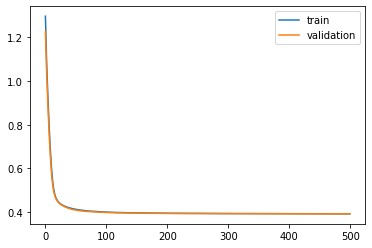

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 59s - loss: 1.2975 - val_loss: 1.2143

Epoch 00001: val_loss improved from inf to 1.21426, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.1839 - val_loss: 1.1116

Epoch 00002: val_loss improved from 1.21426 to 1.11158, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.0883 - val_loss: 1.0247

Epoch 00003: val_loss improved from 1.11158 to 1.02469, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 1.0063 - val_loss: 0.9494

Epoch 00004: val_loss improved from 1.02469 to 0.94938, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.9330 - val_loss: 0.8808

Epoch 00005: val_loss improved from 0.94938 to 0.88076, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8653 - val_loss: 0.8169

Epoch 00006: val_loss improved from 0.88076 to 0.81690, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.8017 - val_loss: 0.7581

Epoch 00007: val_loss improved from 0.81690

 - 1s - loss: 0.4092 - val_loss: 0.4157

Epoch 00058: val_loss improved from 0.41635 to 0.41575, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4088 - val_loss: 0.4158

Epoch 00059: val_loss did not improve from 0.41575
Epoch 60/500
 - 1s - loss: 0.4085 - val_loss: 0.4152

Epoch 00060: val_loss improved from 0.41575 to 0.41521, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4081 - val_loss: 0.4153

Epoch 00061: val_loss did not improve from 0.41521
Epoch 62/500
 - 1s - loss: 0.4078 - val_loss: 0.4146

Epoch 00062: val_loss improved from 0.41521 to 0.41462, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4074 - val_loss: 0.4146

Epoch 00063: val_loss improved from 0.41462 to 0.41457, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4072 - val_loss: 0.4141

Epoch 00064: val_loss improved from 0.41457 to 0.41411, saving model to val_weights3.hdf5
Epoch 65/500
 - 1s - loss: 0.4069 - val_loss: 0.4137

Epoch 00065: val_loss improve


Epoch 00121: val_loss did not improve from 0.40670
Epoch 122/500
 - 1s - loss: 0.3976 - val_loss: 0.4068

Epoch 00122: val_loss did not improve from 0.40670
Epoch 123/500
 - 1s - loss: 0.3976 - val_loss: 0.4066

Epoch 00123: val_loss improved from 0.40670 to 0.40663, saving model to val_weights3.hdf5
Epoch 124/500
 - 1s - loss: 0.3975 - val_loss: 0.4064

Epoch 00124: val_loss improved from 0.40663 to 0.40643, saving model to val_weights3.hdf5
Epoch 125/500
 - 1s - loss: 0.3975 - val_loss: 0.4067

Epoch 00125: val_loss did not improve from 0.40643
Epoch 126/500
 - 1s - loss: 0.3975 - val_loss: 0.4066

Epoch 00126: val_loss did not improve from 0.40643
Epoch 127/500
 - 1s - loss: 0.3974 - val_loss: 0.4067

Epoch 00127: val_loss did not improve from 0.40643
Epoch 128/500
 - 1s - loss: 0.3972 - val_loss: 0.4064

Epoch 00128: val_loss improved from 0.40643 to 0.40636, saving model to val_weights3.hdf5
Epoch 129/500
 - 1s - loss: 0.3971 - val_loss: 0.4065

Epoch 00129: val_loss did not impr

 - 1s - loss: 0.3947 - val_loss: 0.4044

Epoch 00191: val_loss did not improve from 0.40415
Epoch 192/500
 - 1s - loss: 0.3946 - val_loss: 0.4043

Epoch 00192: val_loss did not improve from 0.40415
Epoch 193/500
 - 1s - loss: 0.3945 - val_loss: 0.4042

Epoch 00193: val_loss did not improve from 0.40415
Epoch 194/500
 - 1s - loss: 0.3945 - val_loss: 0.4042

Epoch 00194: val_loss did not improve from 0.40415
Epoch 195/500
 - 1s - loss: 0.3946 - val_loss: 0.4045

Epoch 00195: val_loss did not improve from 0.40415
Epoch 196/500
 - 1s - loss: 0.3947 - val_loss: 0.4042

Epoch 00196: val_loss did not improve from 0.40415
Epoch 197/500
 - 1s - loss: 0.3946 - val_loss: 0.4041

Epoch 00197: val_loss improved from 0.40415 to 0.40411, saving model to val_weights3.hdf5
Epoch 198/500
 - 1s - loss: 0.3945 - val_loss: 0.4046

Epoch 00198: val_loss did not improve from 0.40411
Epoch 199/500
 - 1s - loss: 0.3945 - val_loss: 0.4044

Epoch 00199: val_loss did not improve from 0.40411
Epoch 200/500
 - 1s -

 - 1s - loss: 0.3935 - val_loss: 0.4034

Epoch 00265: val_loss did not improve from 0.40308
Epoch 266/500
 - 1s - loss: 0.3935 - val_loss: 0.4033

Epoch 00266: val_loss did not improve from 0.40308
Epoch 267/500
 - 1s - loss: 0.3936 - val_loss: 0.4035

Epoch 00267: val_loss did not improve from 0.40308
Epoch 268/500
 - 1s - loss: 0.3935 - val_loss: 0.4033

Epoch 00268: val_loss did not improve from 0.40308
Epoch 269/500
 - 1s - loss: 0.3934 - val_loss: 0.4037

Epoch 00269: val_loss did not improve from 0.40308
Epoch 270/500
 - 1s - loss: 0.3934 - val_loss: 0.4033

Epoch 00270: val_loss did not improve from 0.40308
Epoch 271/500
 - 1s - loss: 0.3935 - val_loss: 0.4032

Epoch 00271: val_loss did not improve from 0.40308
Epoch 272/500
 - 1s - loss: 0.3934 - val_loss: 0.4032

Epoch 00272: val_loss did not improve from 0.40308
Epoch 273/500
 - 1s - loss: 0.3934 - val_loss: 0.4034

Epoch 00273: val_loss did not improve from 0.40308
Epoch 274/500
 - 1s - loss: 0.3934 - val_loss: 0.4033

Epoch

 - 1s - loss: 0.3929 - val_loss: 0.4028

Epoch 00341: val_loss did not improve from 0.40226
Epoch 342/500
 - 1s - loss: 0.3928 - val_loss: 0.4027

Epoch 00342: val_loss did not improve from 0.40226
Epoch 343/500
 - 1s - loss: 0.3929 - val_loss: 0.4027

Epoch 00343: val_loss did not improve from 0.40226
Epoch 344/500
 - 1s - loss: 0.3928 - val_loss: 0.4025

Epoch 00344: val_loss did not improve from 0.40226
Epoch 345/500
 - 1s - loss: 0.3928 - val_loss: 0.4027

Epoch 00345: val_loss did not improve from 0.40226
Epoch 346/500
 - 1s - loss: 0.3928 - val_loss: 0.4025

Epoch 00346: val_loss did not improve from 0.40226
Epoch 347/500
 - 1s - loss: 0.3927 - val_loss: 0.4024

Epoch 00347: val_loss did not improve from 0.40226
Epoch 348/500
 - 1s - loss: 0.3927 - val_loss: 0.4023

Epoch 00348: val_loss improved from 0.40226 to 0.40226, saving model to val_weights3.hdf5
Epoch 349/500
 - 1s - loss: 0.3928 - val_loss: 0.4024

Epoch 00349: val_loss did not improve from 0.40226
Epoch 350/500
 - 1s -

 - 1s - loss: 0.3924 - val_loss: 0.4014

Epoch 00415: val_loss improved from 0.40150 to 0.40145, saving model to val_weights3.hdf5
Epoch 416/500
 - 1s - loss: 0.3922 - val_loss: 0.4017

Epoch 00416: val_loss did not improve from 0.40145
Epoch 417/500
 - 1s - loss: 0.3923 - val_loss: 0.4020

Epoch 00417: val_loss did not improve from 0.40145
Epoch 418/500
 - 1s - loss: 0.3922 - val_loss: 0.4018

Epoch 00418: val_loss did not improve from 0.40145
Epoch 419/500
 - 1s - loss: 0.3922 - val_loss: 0.4019

Epoch 00419: val_loss did not improve from 0.40145
Epoch 420/500
 - 1s - loss: 0.3923 - val_loss: 0.4016

Epoch 00420: val_loss did not improve from 0.40145
Epoch 421/500
 - 1s - loss: 0.3922 - val_loss: 0.4018

Epoch 00421: val_loss did not improve from 0.40145
Epoch 422/500
 - 1s - loss: 0.3923 - val_loss: 0.4017

Epoch 00422: val_loss did not improve from 0.40145
Epoch 423/500
 - 1s - loss: 0.3922 - val_loss: 0.4021

Epoch 00423: val_loss did not improve from 0.40145
Epoch 424/500
 - 1s -


Epoch 00490: val_loss did not improve from 0.40110
Epoch 491/500
 - 1s - loss: 0.3918 - val_loss: 0.4013

Epoch 00491: val_loss did not improve from 0.40110
Epoch 492/500
 - 1s - loss: 0.3919 - val_loss: 0.4016

Epoch 00492: val_loss did not improve from 0.40110
Epoch 493/500
 - 1s - loss: 0.3916 - val_loss: 0.4012

Epoch 00493: val_loss did not improve from 0.40110
Epoch 494/500
 - 1s - loss: 0.3919 - val_loss: 0.4019

Epoch 00494: val_loss did not improve from 0.40110
Epoch 495/500
 - 1s - loss: 0.3916 - val_loss: 0.4016

Epoch 00495: val_loss did not improve from 0.40110
Epoch 496/500
 - 1s - loss: 0.3919 - val_loss: 0.4016

Epoch 00496: val_loss did not improve from 0.40110
Epoch 497/500
 - 1s - loss: 0.3917 - val_loss: 0.4017

Epoch 00497: val_loss did not improve from 0.40110
Epoch 498/500
 - 1s - loss: 0.3918 - val_loss: 0.4017

Epoch 00498: val_loss did not improve from 0.40110
Epoch 499/500
 - 1s - loss: 0.3916 - val_loss: 0.4013

Epoch 00499: val_loss did not improve from 0.

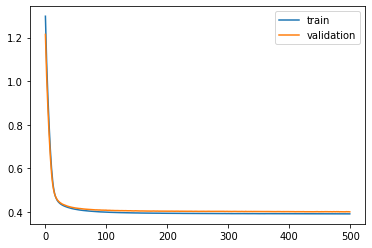

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 86s - loss: 1.2967 - val_loss: 1.2200

Epoch 00001: val_loss improved from inf to 1.22000, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.1832 - val_loss: 1.1168

Epoch 00002: val_loss improved from 1.22000 to 1.11679, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.0877 - val_loss: 1.0298

Epoch 00003: val_loss improved from 1.11679 to 1.02985, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 1.0057 - val_loss: 0.9537

Epoch 00004: val_loss improved from 1.02985 to 0.95369, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.9324 - val_loss: 0.8840

Epoch 00005: val_loss improved from 0.95369 to 0.88405, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8648 - val_loss: 0.8187

Epoch 00006: val_loss improved from 0.88405 to 0.81875, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.8014 - val_loss: 0.7577

Epoch 00007: val_loss improved from 0.81875

 - 1s - loss: 0.4100 - val_loss: 0.4088

Epoch 00058: val_loss improved from 0.40902 to 0.40879, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4097 - val_loss: 0.4084

Epoch 00059: val_loss improved from 0.40879 to 0.40839, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4095 - val_loss: 0.4080

Epoch 00060: val_loss improved from 0.40839 to 0.40802, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4091 - val_loss: 0.4078

Epoch 00061: val_loss improved from 0.40802 to 0.40780, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4086 - val_loss: 0.4072

Epoch 00062: val_loss improved from 0.40780 to 0.40725, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4082 - val_loss: 0.4069

Epoch 00063: val_loss improved from 0.40725 to 0.40688, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4079 - val_loss: 0.4064

Epoch 00064: val_loss improved from 0.40688 to 0.40637, saving model to val_weights4.hdf5
Epoch


Epoch 00120: val_loss did not improve from 0.39688
Epoch 121/500
 - 1s - loss: 0.3987 - val_loss: 0.3969

Epoch 00121: val_loss did not improve from 0.39688
Epoch 122/500
 - 1s - loss: 0.3986 - val_loss: 0.3970

Epoch 00122: val_loss did not improve from 0.39688
Epoch 123/500
 - 1s - loss: 0.3985 - val_loss: 0.3969

Epoch 00123: val_loss did not improve from 0.39688
Epoch 124/500
 - 1s - loss: 0.3984 - val_loss: 0.3968

Epoch 00124: val_loss improved from 0.39688 to 0.39677, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3983 - val_loss: 0.3964

Epoch 00125: val_loss improved from 0.39677 to 0.39636, saving model to val_weights4.hdf5
Epoch 126/500
 - 1s - loss: 0.3983 - val_loss: 0.3966

Epoch 00126: val_loss did not improve from 0.39636
Epoch 127/500
 - 1s - loss: 0.3981 - val_loss: 0.3960

Epoch 00127: val_loss improved from 0.39636 to 0.39598, saving model to val_weights4.hdf5
Epoch 128/500
 - 1s - loss: 0.3981 - val_loss: 0.3966

Epoch 00128: val_loss did not impr

 - 1s - loss: 0.3957 - val_loss: 0.3952

Epoch 00194: val_loss improved from 0.39516 to 0.39515, saving model to val_weights4.hdf5
Epoch 195/500
 - 1s - loss: 0.3957 - val_loss: 0.3955

Epoch 00195: val_loss did not improve from 0.39515
Epoch 196/500
 - 1s - loss: 0.3956 - val_loss: 0.3952

Epoch 00196: val_loss did not improve from 0.39515
Epoch 197/500
 - 1s - loss: 0.3956 - val_loss: 0.3949

Epoch 00197: val_loss improved from 0.39515 to 0.39488, saving model to val_weights4.hdf5
Epoch 198/500
 - 1s - loss: 0.3955 - val_loss: 0.3950

Epoch 00198: val_loss did not improve from 0.39488
Epoch 199/500
 - 1s - loss: 0.3955 - val_loss: 0.3951

Epoch 00199: val_loss did not improve from 0.39488
Epoch 200/500
 - 1s - loss: 0.3955 - val_loss: 0.3952

Epoch 00200: val_loss did not improve from 0.39488
Epoch 201/500
 - 1s - loss: 0.3955 - val_loss: 0.3951

Epoch 00201: val_loss did not improve from 0.39488
Epoch 202/500
 - 1s - loss: 0.3954 - val_loss: 0.3947

Epoch 00202: val_loss improved fr

 - 1s - loss: 0.3951 - val_loss: 0.3954

Epoch 00268: val_loss did not improve from 0.39437
Epoch 269/500
 - 1s - loss: 0.3953 - val_loss: 0.3952

Epoch 00269: val_loss did not improve from 0.39437
Epoch 270/500
 - 1s - loss: 0.3954 - val_loss: 0.3951

Epoch 00270: val_loss did not improve from 0.39437
Epoch 271/500
 - 1s - loss: 0.3954 - val_loss: 0.3951

Epoch 00271: val_loss did not improve from 0.39437
Epoch 272/500
 - 1s - loss: 0.3955 - val_loss: 0.3951

Epoch 00272: val_loss did not improve from 0.39437
Epoch 273/500
 - 1s - loss: 0.3955 - val_loss: 0.3946

Epoch 00273: val_loss did not improve from 0.39437
Epoch 274/500
 - 1s - loss: 0.3956 - val_loss: 0.3944

Epoch 00274: val_loss did not improve from 0.39437
Epoch 275/500
 - 1s - loss: 0.3953 - val_loss: 0.3940

Epoch 00275: val_loss improved from 0.39437 to 0.39400, saving model to val_weights4.hdf5
Epoch 276/500
 - 1s - loss: 0.3954 - val_loss: 0.3940

Epoch 00276: val_loss did not improve from 0.39400
Epoch 277/500
 - 1s -


Epoch 00342: val_loss did not improve from 0.39345
Epoch 343/500
 - 1s - loss: 0.3940 - val_loss: 0.3937

Epoch 00343: val_loss did not improve from 0.39345
Epoch 344/500
 - 1s - loss: 0.3939 - val_loss: 0.3937

Epoch 00344: val_loss did not improve from 0.39345
Epoch 345/500
 - 1s - loss: 0.3941 - val_loss: 0.3935

Epoch 00345: val_loss did not improve from 0.39345
Epoch 346/500
 - 1s - loss: 0.3939 - val_loss: 0.3938

Epoch 00346: val_loss did not improve from 0.39345
Epoch 347/500
 - 1s - loss: 0.3940 - val_loss: 0.3936

Epoch 00347: val_loss did not improve from 0.39345
Epoch 348/500
 - 1s - loss: 0.3939 - val_loss: 0.3938

Epoch 00348: val_loss did not improve from 0.39345
Epoch 349/500
 - 1s - loss: 0.3939 - val_loss: 0.3936

Epoch 00349: val_loss did not improve from 0.39345
Epoch 350/500
 - 1s - loss: 0.3939 - val_loss: 0.3940

Epoch 00350: val_loss did not improve from 0.39345
Epoch 351/500
 - 1s - loss: 0.3940 - val_loss: 0.3935

Epoch 00351: val_loss did not improve from 0.


Epoch 00419: val_loss did not improve from 0.39343
Epoch 420/500
 - 1s - loss: 0.3934 - val_loss: 0.3938

Epoch 00420: val_loss did not improve from 0.39343
Epoch 421/500
 - 1s - loss: 0.3933 - val_loss: 0.3939

Epoch 00421: val_loss did not improve from 0.39343
Epoch 422/500
 - 1s - loss: 0.3934 - val_loss: 0.3940

Epoch 00422: val_loss did not improve from 0.39343
Epoch 423/500
 - 1s - loss: 0.3934 - val_loss: 0.3938

Epoch 00423: val_loss did not improve from 0.39343
Epoch 424/500
 - 1s - loss: 0.3934 - val_loss: 0.3939

Epoch 00424: val_loss did not improve from 0.39343
Epoch 425/500
 - 1s - loss: 0.3933 - val_loss: 0.3941

Epoch 00425: val_loss did not improve from 0.39343
Epoch 426/500
 - 1s - loss: 0.3934 - val_loss: 0.3939

Epoch 00426: val_loss did not improve from 0.39343
Epoch 427/500
 - 1s - loss: 0.3933 - val_loss: 0.3936

Epoch 00427: val_loss did not improve from 0.39343
Epoch 428/500
 - 1s - loss: 0.3935 - val_loss: 0.3937

Epoch 00428: val_loss did not improve from 0.

 - 1s - loss: 0.3927 - val_loss: 0.3931

Epoch 00495: val_loss did not improve from 0.39288
Epoch 496/500
 - 1s - loss: 0.3928 - val_loss: 0.3928

Epoch 00496: val_loss improved from 0.39288 to 0.39279, saving model to val_weights4.hdf5
Epoch 497/500
 - 1s - loss: 0.3927 - val_loss: 0.3931

Epoch 00497: val_loss did not improve from 0.39279
Epoch 498/500
 - 1s - loss: 0.3929 - val_loss: 0.3929

Epoch 00498: val_loss did not improve from 0.39279
Epoch 499/500
 - 1s - loss: 0.3928 - val_loss: 0.3932

Epoch 00499: val_loss did not improve from 0.39279
Epoch 500/500
 - 1s - loss: 0.3928 - val_loss: 0.3931

Epoch 00500: val_loss did not improve from 0.39279
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.014795998368484085
best val loss: 0.39278732954131235
#################################


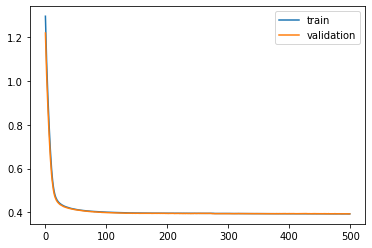

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 40s - loss: 1.2971 - val_loss: 1.2182

Epoch 00001: val_loss improved from inf to 1.21820, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.1835 - val_loss: 1.1166

Epoch 00002: val_loss improved from 1.21820 to 1.11665, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0879 - val_loss: 1.0307

Epoch 00003: val_loss improved from 1.11665 to 1.03069, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 1.0059 - val_loss: 0.9550

Epoch 00004: val_loss improved from 1.03069 to 0.95500, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.9327 - val_loss: 0.8863

Epoch 00005: val_loss improved from 0.95500 to 0.88626, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8651 - val_loss: 0.8220

Epoch 00006: val_loss improved from 0.88626 to 0.82205, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.8016 - val_loss: 0.7618

Epoch 00007: val_loss improved from 0.82205

 - 1s - loss: 0.4097 - val_loss: 0.4128

Epoch 00058: val_loss improved from 0.41331 to 0.41279, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4094 - val_loss: 0.4125

Epoch 00059: val_loss improved from 0.41279 to 0.41251, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4090 - val_loss: 0.4124

Epoch 00060: val_loss improved from 0.41251 to 0.41242, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4086 - val_loss: 0.4120

Epoch 00061: val_loss improved from 0.41242 to 0.41198, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4083 - val_loss: 0.4118

Epoch 00062: val_loss improved from 0.41198 to 0.41177, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4079 - val_loss: 0.4113

Epoch 00063: val_loss improved from 0.41177 to 0.41129, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4075 - val_loss: 0.4112

Epoch 00064: val_loss improved from 0.41129 to 0.41115, saving model to val_weights5.hdf5
Epoch

 - 1s - loss: 0.3984 - val_loss: 0.4022

Epoch 00120: val_loss improved from 0.40259 to 0.40215, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.3984 - val_loss: 0.4024

Epoch 00121: val_loss did not improve from 0.40215
Epoch 122/500
 - 1s - loss: 0.3983 - val_loss: 0.4021

Epoch 00122: val_loss improved from 0.40215 to 0.40210, saving model to val_weights5.hdf5
Epoch 123/500
 - 1s - loss: 0.3982 - val_loss: 0.4024

Epoch 00123: val_loss did not improve from 0.40210
Epoch 124/500
 - 1s - loss: 0.3980 - val_loss: 0.4019

Epoch 00124: val_loss improved from 0.40210 to 0.40188, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3980 - val_loss: 0.4022

Epoch 00125: val_loss did not improve from 0.40188
Epoch 126/500
 - 1s - loss: 0.3980 - val_loss: 0.4022

Epoch 00126: val_loss did not improve from 0.40188
Epoch 127/500
 - 1s - loss: 0.3980 - val_loss: 0.4020

Epoch 00127: val_loss did not improve from 0.40188
Epoch 128/500
 - 1s - loss: 0.3978 - val_loss: 0.


Epoch 00190: val_loss did not improve from 0.39930
Epoch 191/500
 - 1s - loss: 0.3953 - val_loss: 0.3995

Epoch 00191: val_loss did not improve from 0.39930
Epoch 192/500
 - 1s - loss: 0.3953 - val_loss: 0.3992

Epoch 00192: val_loss improved from 0.39930 to 0.39921, saving model to val_weights5.hdf5
Epoch 193/500
 - 1s - loss: 0.3952 - val_loss: 0.3992

Epoch 00193: val_loss improved from 0.39921 to 0.39918, saving model to val_weights5.hdf5
Epoch 194/500
 - 1s - loss: 0.3950 - val_loss: 0.3993

Epoch 00194: val_loss did not improve from 0.39918
Epoch 195/500
 - 1s - loss: 0.3951 - val_loss: 0.3994

Epoch 00195: val_loss did not improve from 0.39918
Epoch 196/500
 - 1s - loss: 0.3950 - val_loss: 0.3992

Epoch 00196: val_loss did not improve from 0.39918
Epoch 197/500
 - 1s - loss: 0.3949 - val_loss: 0.3994

Epoch 00197: val_loss did not improve from 0.39918
Epoch 198/500
 - 1s - loss: 0.3950 - val_loss: 0.3994

Epoch 00198: val_loss did not improve from 0.39918
Epoch 199/500
 - 1s - 

 - 1s - loss: 0.3938 - val_loss: 0.3979

Epoch 00264: val_loss did not improve from 0.39783
Epoch 265/500
 - 1s - loss: 0.3938 - val_loss: 0.3980

Epoch 00265: val_loss did not improve from 0.39783
Epoch 266/500
 - 1s - loss: 0.3938 - val_loss: 0.3978

Epoch 00266: val_loss did not improve from 0.39783
Epoch 267/500
 - 1s - loss: 0.3938 - val_loss: 0.3979

Epoch 00267: val_loss did not improve from 0.39783
Epoch 268/500
 - 1s - loss: 0.3939 - val_loss: 0.3983

Epoch 00268: val_loss did not improve from 0.39783
Epoch 269/500
 - 1s - loss: 0.3938 - val_loss: 0.3976

Epoch 00269: val_loss improved from 0.39783 to 0.39755, saving model to val_weights5.hdf5
Epoch 270/500
 - 1s - loss: 0.3938 - val_loss: 0.3979

Epoch 00270: val_loss did not improve from 0.39755
Epoch 271/500
 - 1s - loss: 0.3937 - val_loss: 0.3978

Epoch 00271: val_loss did not improve from 0.39755
Epoch 272/500
 - 1s - loss: 0.3937 - val_loss: 0.3978

Epoch 00272: val_loss did not improve from 0.39755
Epoch 273/500
 - 1s -

 - 1s - loss: 0.3929 - val_loss: 0.3971

Epoch 00339: val_loss did not improve from 0.39693
Epoch 340/500
 - 1s - loss: 0.3930 - val_loss: 0.3971

Epoch 00340: val_loss did not improve from 0.39693
Epoch 341/500
 - 1s - loss: 0.3929 - val_loss: 0.3970

Epoch 00341: val_loss did not improve from 0.39693
Epoch 342/500
 - 1s - loss: 0.3930 - val_loss: 0.3975

Epoch 00342: val_loss did not improve from 0.39693
Epoch 343/500
 - 1s - loss: 0.3931 - val_loss: 0.3973

Epoch 00343: val_loss did not improve from 0.39693
Epoch 344/500
 - 1s - loss: 0.3931 - val_loss: 0.3968

Epoch 00344: val_loss improved from 0.39693 to 0.39678, saving model to val_weights5.hdf5
Epoch 345/500
 - 1s - loss: 0.3929 - val_loss: 0.3971

Epoch 00345: val_loss did not improve from 0.39678
Epoch 346/500
 - 1s - loss: 0.3930 - val_loss: 0.3972

Epoch 00346: val_loss did not improve from 0.39678
Epoch 347/500
 - 1s - loss: 0.3929 - val_loss: 0.3975

Epoch 00347: val_loss did not improve from 0.39678
Epoch 348/500
 - 1s -


Epoch 00414: val_loss did not improve from 0.39644
Epoch 415/500
 - 1s - loss: 0.3924 - val_loss: 0.3972

Epoch 00415: val_loss did not improve from 0.39644
Epoch 416/500
 - 1s - loss: 0.3925 - val_loss: 0.3967

Epoch 00416: val_loss did not improve from 0.39644
Epoch 417/500
 - 1s - loss: 0.3926 - val_loss: 0.3969

Epoch 00417: val_loss did not improve from 0.39644
Epoch 418/500
 - 1s - loss: 0.3924 - val_loss: 0.3967

Epoch 00418: val_loss did not improve from 0.39644
Epoch 419/500
 - 1s - loss: 0.3924 - val_loss: 0.3970

Epoch 00419: val_loss did not improve from 0.39644
Epoch 420/500
 - 1s - loss: 0.3923 - val_loss: 0.3969

Epoch 00420: val_loss did not improve from 0.39644
Epoch 421/500
 - 1s - loss: 0.3927 - val_loss: 0.3969

Epoch 00421: val_loss did not improve from 0.39644
Epoch 422/500
 - 1s - loss: 0.3924 - val_loss: 0.3965

Epoch 00422: val_loss did not improve from 0.39644
Epoch 423/500
 - 1s - loss: 0.3925 - val_loss: 0.3965

Epoch 00423: val_loss did not improve from 0.


Epoch 00491: val_loss did not improve from 0.39626
Epoch 492/500
 - 1s - loss: 0.3919 - val_loss: 0.3969

Epoch 00492: val_loss did not improve from 0.39626
Epoch 493/500
 - 1s - loss: 0.3918 - val_loss: 0.3966

Epoch 00493: val_loss did not improve from 0.39626
Epoch 494/500
 - 1s - loss: 0.3920 - val_loss: 0.3965

Epoch 00494: val_loss did not improve from 0.39626
Epoch 495/500
 - 1s - loss: 0.3919 - val_loss: 0.3965

Epoch 00495: val_loss did not improve from 0.39626
Epoch 496/500
 - 1s - loss: 0.3919 - val_loss: 0.3972

Epoch 00496: val_loss did not improve from 0.39626
Epoch 497/500
 - 1s - loss: 0.3920 - val_loss: 0.3966

Epoch 00497: val_loss did not improve from 0.39626
Epoch 498/500
 - 1s - loss: 0.3918 - val_loss: 0.3966

Epoch 00498: val_loss did not improve from 0.39626
Epoch 499/500
 - 1s - loss: 0.3919 - val_loss: 0.3967

Epoch 00499: val_loss did not improve from 0.39626
Epoch 500/500
 - 1s - loss: 0.3918 - val_loss: 0.3967

Epoch 00500: val_loss did not improve from 0.

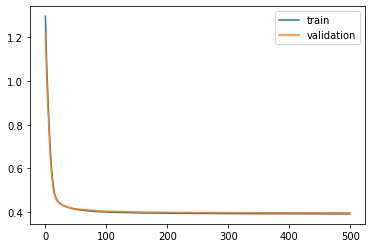

Time to train LSTM:  406.7861752510071
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 77s - loss: 1.0654 - val_loss: 1.0184

Epoch 00001: val_loss improved from inf to 1.01839, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 0.9830 - val_loss: 0.9450

Epoch 00002: val_loss improved from 1.01839 to 0.94503, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9174 - val_loss: 0.8855

Epoch 00003: val_loss improved from 0.94503 to 0.88553, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.8627 - val_loss: 0.8346

Epoch 00004: val_loss improved from 0.88553 to 0.83461, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8135 - val_loss: 0.7874

Epoch 00005: val_loss improved from 0.83461 to 0.78736, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.7671 - val_loss: 0.7424

Epoch 00006: val_loss improved from 0.78736 to 0.74241, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7224 - val_loss: 0.6995

Epoc


Epoch 00057: val_loss improved from 0.41583 to 0.41512, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4074 - val_loss: 0.4152

Epoch 00058: val_loss did not improve from 0.41512
Epoch 59/500
 - 1s - loss: 0.4071 - val_loss: 0.4144

Epoch 00059: val_loss improved from 0.41512 to 0.41444, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4066 - val_loss: 0.4142

Epoch 00060: val_loss improved from 0.41444 to 0.41425, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4063 - val_loss: 0.4138

Epoch 00061: val_loss improved from 0.41425 to 0.41380, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4060 - val_loss: 0.4132

Epoch 00062: val_loss improved from 0.41380 to 0.41316, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4057 - val_loss: 0.4131

Epoch 00063: val_loss improved from 0.41316 to 0.41311, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4053 - val_loss: 0.4126

Epoch 00064: val_loss improved

 - 1s - loss: 0.3964 - val_loss: 0.4026

Epoch 00118: val_loss improved from 0.40289 to 0.40261, saving model to val_weights1.hdf5
Epoch 119/500
 - 1s - loss: 0.3964 - val_loss: 0.4030

Epoch 00119: val_loss did not improve from 0.40261
Epoch 120/500
 - 1s - loss: 0.3963 - val_loss: 0.4026

Epoch 00120: val_loss did not improve from 0.40261
Epoch 121/500
 - 1s - loss: 0.3963 - val_loss: 0.4025

Epoch 00121: val_loss improved from 0.40261 to 0.40252, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3962 - val_loss: 0.4025

Epoch 00122: val_loss did not improve from 0.40252
Epoch 123/500
 - 1s - loss: 0.3962 - val_loss: 0.4023

Epoch 00123: val_loss improved from 0.40252 to 0.40235, saving model to val_weights1.hdf5
Epoch 124/500
 - 1s - loss: 0.3959 - val_loss: 0.4025

Epoch 00124: val_loss did not improve from 0.40235
Epoch 125/500
 - 1s - loss: 0.3959 - val_loss: 0.4020

Epoch 00125: val_loss improved from 0.40235 to 0.40202, saving model to val_weights1.hdf5
Epoch 126/

 - 1s - loss: 0.3927 - val_loss: 0.3994

Epoch 00186: val_loss did not improve from 0.39903
Epoch 187/500
 - 1s - loss: 0.3927 - val_loss: 0.3994

Epoch 00187: val_loss did not improve from 0.39903
Epoch 188/500
 - 1s - loss: 0.3926 - val_loss: 0.3995

Epoch 00188: val_loss did not improve from 0.39903
Epoch 189/500
 - 1s - loss: 0.3927 - val_loss: 0.3995

Epoch 00189: val_loss did not improve from 0.39903
Epoch 190/500
 - 1s - loss: 0.3925 - val_loss: 0.3992

Epoch 00190: val_loss did not improve from 0.39903
Epoch 191/500
 - 1s - loss: 0.3926 - val_loss: 0.3992

Epoch 00191: val_loss did not improve from 0.39903
Epoch 192/500
 - 1s - loss: 0.3924 - val_loss: 0.3995

Epoch 00192: val_loss did not improve from 0.39903
Epoch 193/500
 - 1s - loss: 0.3925 - val_loss: 0.3991

Epoch 00193: val_loss did not improve from 0.39903
Epoch 194/500
 - 1s - loss: 0.3925 - val_loss: 0.3989

Epoch 00194: val_loss improved from 0.39903 to 0.39894, saving model to val_weights1.hdf5
Epoch 195/500
 - 1s -

 - 1s - loss: 0.3915 - val_loss: 0.3982

Epoch 00259: val_loss did not improve from 0.39791
Epoch 260/500
 - 1s - loss: 0.3914 - val_loss: 0.3982

Epoch 00260: val_loss did not improve from 0.39791
Epoch 261/500
 - 1s - loss: 0.3915 - val_loss: 0.3981

Epoch 00261: val_loss did not improve from 0.39791
Epoch 262/500
 - 1s - loss: 0.3915 - val_loss: 0.3983

Epoch 00262: val_loss did not improve from 0.39791
Epoch 263/500
 - 1s - loss: 0.3915 - val_loss: 0.3979

Epoch 00263: val_loss improved from 0.39791 to 0.39785, saving model to val_weights1.hdf5
Epoch 264/500
 - 1s - loss: 0.3915 - val_loss: 0.3982

Epoch 00264: val_loss did not improve from 0.39785
Epoch 265/500
 - 1s - loss: 0.3914 - val_loss: 0.3983

Epoch 00265: val_loss did not improve from 0.39785
Epoch 266/500
 - 1s - loss: 0.3915 - val_loss: 0.3982

Epoch 00266: val_loss did not improve from 0.39785
Epoch 267/500
 - 1s - loss: 0.3915 - val_loss: 0.3982

Epoch 00267: val_loss did not improve from 0.39785
Epoch 268/500
 - 1s -


Epoch 00333: val_loss did not improve from 0.39683
Epoch 334/500
 - 1s - loss: 0.3904 - val_loss: 0.3968

Epoch 00334: val_loss improved from 0.39683 to 0.39678, saving model to val_weights1.hdf5
Epoch 335/500
 - 1s - loss: 0.3902 - val_loss: 0.3971

Epoch 00335: val_loss did not improve from 0.39678
Epoch 336/500
 - 1s - loss: 0.3903 - val_loss: 0.3970

Epoch 00336: val_loss did not improve from 0.39678
Epoch 337/500
 - 1s - loss: 0.3902 - val_loss: 0.3968

Epoch 00337: val_loss did not improve from 0.39678
Epoch 338/500
 - 1s - loss: 0.3903 - val_loss: 0.3969

Epoch 00338: val_loss did not improve from 0.39678
Epoch 339/500
 - 1s - loss: 0.3903 - val_loss: 0.3970

Epoch 00339: val_loss did not improve from 0.39678
Epoch 340/500
 - 1s - loss: 0.3903 - val_loss: 0.3972

Epoch 00340: val_loss did not improve from 0.39678
Epoch 341/500
 - 1s - loss: 0.3903 - val_loss: 0.3968

Epoch 00341: val_loss did not improve from 0.39678
Epoch 342/500
 - 1s - loss: 0.3903 - val_loss: 0.3972

Epoch 

 - 1s - loss: 0.3895 - val_loss: 0.3965

Epoch 00407: val_loss did not improve from 0.39624
Epoch 408/500
 - 1s - loss: 0.3895 - val_loss: 0.3966

Epoch 00408: val_loss did not improve from 0.39624
Epoch 409/500
 - 1s - loss: 0.3895 - val_loss: 0.3964

Epoch 00409: val_loss did not improve from 0.39624
Epoch 410/500
 - 1s - loss: 0.3896 - val_loss: 0.3964

Epoch 00410: val_loss did not improve from 0.39624
Epoch 411/500
 - 1s - loss: 0.3895 - val_loss: 0.3966

Epoch 00411: val_loss did not improve from 0.39624
Epoch 412/500
 - 1s - loss: 0.3897 - val_loss: 0.3963

Epoch 00412: val_loss did not improve from 0.39624
Epoch 413/500
 - 1s - loss: 0.3896 - val_loss: 0.3966

Epoch 00413: val_loss did not improve from 0.39624
Epoch 414/500
 - 1s - loss: 0.3895 - val_loss: 0.3966

Epoch 00414: val_loss did not improve from 0.39624
Epoch 415/500
 - 1s - loss: 0.3893 - val_loss: 0.3965

Epoch 00415: val_loss did not improve from 0.39624
Epoch 416/500
 - 1s - loss: 0.3894 - val_loss: 0.3966

Epoch

 - 1s - loss: 0.3889 - val_loss: 0.3963

Epoch 00484: val_loss did not improve from 0.39570
Epoch 485/500
 - 1s - loss: 0.3890 - val_loss: 0.3961

Epoch 00485: val_loss did not improve from 0.39570
Epoch 486/500
 - 1s - loss: 0.3888 - val_loss: 0.3961

Epoch 00486: val_loss did not improve from 0.39570
Epoch 487/500
 - 1s - loss: 0.3888 - val_loss: 0.3964

Epoch 00487: val_loss did not improve from 0.39570
Epoch 488/500
 - 1s - loss: 0.3889 - val_loss: 0.3961

Epoch 00488: val_loss did not improve from 0.39570
Epoch 489/500
 - 1s - loss: 0.3889 - val_loss: 0.3960

Epoch 00489: val_loss did not improve from 0.39570
Epoch 490/500
 - 1s - loss: 0.3891 - val_loss: 0.3966

Epoch 00490: val_loss did not improve from 0.39570
Epoch 491/500
 - 1s - loss: 0.3890 - val_loss: 0.3965

Epoch 00491: val_loss did not improve from 0.39570
Epoch 492/500
 - 1s - loss: 0.3888 - val_loss: 0.3961

Epoch 00492: val_loss did not improve from 0.39570
Epoch 493/500
 - 1s - loss: 0.3888 - val_loss: 0.3961

Epoch

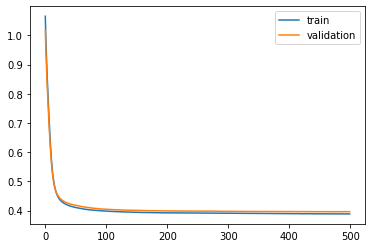

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 40s - loss: 1.0661 - val_loss: 1.0142

Epoch 00001: val_loss improved from inf to 1.01422, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 0.9836 - val_loss: 0.9438

Epoch 00002: val_loss improved from 1.01422 to 0.94382, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9176 - val_loss: 0.8860

Epoch 00003: val_loss improved from 0.94382 to 0.88599, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.8627 - val_loss: 0.8351

Epoch 00004: val_loss improved from 0.88599 to 0.83507, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8134 - val_loss: 0.7872

Epoch 00005: val_loss improved from 0.83507 to 0.78724, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.7671 - val_loss: 0.7410

Epoch 00006: val_loss improved from 0.78724 to 0.74100, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7227 - val_loss: 0.6970

Epoch 00007: val_loss improved from 0.74100

 - 1s - loss: 0.4080 - val_loss: 0.4063

Epoch 00058: val_loss improved from 0.40651 to 0.40627, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4076 - val_loss: 0.4059

Epoch 00059: val_loss improved from 0.40627 to 0.40590, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4072 - val_loss: 0.4055

Epoch 00060: val_loss improved from 0.40590 to 0.40554, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4069 - val_loss: 0.4050

Epoch 00061: val_loss improved from 0.40554 to 0.40497, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4065 - val_loss: 0.4048

Epoch 00062: val_loss improved from 0.40497 to 0.40480, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4062 - val_loss: 0.4044

Epoch 00063: val_loss improved from 0.40480 to 0.40438, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4059 - val_loss: 0.4042

Epoch 00064: val_loss improved from 0.40438 to 0.40419, saving model to val_weights2.hdf5
Epoch


Epoch 00119: val_loss did not improve from 0.39640
Epoch 120/500
 - 1s - loss: 0.3968 - val_loss: 0.3962

Epoch 00120: val_loss improved from 0.39640 to 0.39623, saving model to val_weights2.hdf5
Epoch 121/500
 - 1s - loss: 0.3967 - val_loss: 0.3962

Epoch 00121: val_loss did not improve from 0.39623
Epoch 122/500
 - 1s - loss: 0.3967 - val_loss: 0.3961

Epoch 00122: val_loss improved from 0.39623 to 0.39613, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3965 - val_loss: 0.3962

Epoch 00123: val_loss did not improve from 0.39613
Epoch 124/500
 - 1s - loss: 0.3965 - val_loss: 0.3963

Epoch 00124: val_loss did not improve from 0.39613
Epoch 125/500
 - 1s - loss: 0.3963 - val_loss: 0.3962

Epoch 00125: val_loss did not improve from 0.39613
Epoch 126/500
 - 1s - loss: 0.3962 - val_loss: 0.3962

Epoch 00126: val_loss did not improve from 0.39613
Epoch 127/500
 - 1s - loss: 0.3962 - val_loss: 0.3961

Epoch 00127: val_loss improved from 0.39613 to 0.39605, saving model to v

 - 1s - loss: 0.3933 - val_loss: 0.3936

Epoch 00188: val_loss did not improve from 0.39320
Epoch 189/500
 - 1s - loss: 0.3932 - val_loss: 0.3932

Epoch 00189: val_loss did not improve from 0.39320
Epoch 190/500
 - 1s - loss: 0.3932 - val_loss: 0.3931

Epoch 00190: val_loss improved from 0.39320 to 0.39314, saving model to val_weights2.hdf5
Epoch 191/500
 - 1s - loss: 0.3932 - val_loss: 0.3933

Epoch 00191: val_loss did not improve from 0.39314
Epoch 192/500
 - 1s - loss: 0.3932 - val_loss: 0.3935

Epoch 00192: val_loss did not improve from 0.39314
Epoch 193/500
 - 1s - loss: 0.3932 - val_loss: 0.3933

Epoch 00193: val_loss did not improve from 0.39314
Epoch 194/500
 - 1s - loss: 0.3932 - val_loss: 0.3935

Epoch 00194: val_loss did not improve from 0.39314
Epoch 195/500
 - 1s - loss: 0.3932 - val_loss: 0.3934

Epoch 00195: val_loss did not improve from 0.39314
Epoch 196/500
 - 1s - loss: 0.3930 - val_loss: 0.3934

Epoch 00196: val_loss did not improve from 0.39314
Epoch 197/500
 - 1s -

 - 1s - loss: 0.3918 - val_loss: 0.3932

Epoch 00263: val_loss did not improve from 0.39262
Epoch 264/500
 - 1s - loss: 0.3917 - val_loss: 0.3928

Epoch 00264: val_loss did not improve from 0.39262
Epoch 265/500
 - 1s - loss: 0.3918 - val_loss: 0.3930

Epoch 00265: val_loss did not improve from 0.39262
Epoch 266/500
 - 1s - loss: 0.3920 - val_loss: 0.3927

Epoch 00266: val_loss did not improve from 0.39262
Epoch 267/500
 - 1s - loss: 0.3918 - val_loss: 0.3931

Epoch 00267: val_loss did not improve from 0.39262
Epoch 268/500
 - 1s - loss: 0.3918 - val_loss: 0.3928

Epoch 00268: val_loss did not improve from 0.39262
Epoch 269/500
 - 1s - loss: 0.3916 - val_loss: 0.3931

Epoch 00269: val_loss did not improve from 0.39262
Epoch 270/500
 - 1s - loss: 0.3917 - val_loss: 0.3927

Epoch 00270: val_loss did not improve from 0.39262
Epoch 271/500
 - 1s - loss: 0.3916 - val_loss: 0.3928

Epoch 00271: val_loss did not improve from 0.39262
Epoch 272/500
 - 1s - loss: 0.3916 - val_loss: 0.3923

Epoch

 - 1s - loss: 0.3908 - val_loss: 0.3930

Epoch 00340: val_loss did not improve from 0.39231
Epoch 341/500
 - 1s - loss: 0.3907 - val_loss: 0.3928

Epoch 00341: val_loss did not improve from 0.39231
Epoch 342/500
 - 1s - loss: 0.3908 - val_loss: 0.3929

Epoch 00342: val_loss did not improve from 0.39231
Epoch 343/500
 - 1s - loss: 0.3907 - val_loss: 0.3928

Epoch 00343: val_loss did not improve from 0.39231
Epoch 344/500
 - 1s - loss: 0.3908 - val_loss: 0.3928

Epoch 00344: val_loss did not improve from 0.39231
Epoch 345/500
 - 1s - loss: 0.3906 - val_loss: 0.3929

Epoch 00345: val_loss did not improve from 0.39231
Epoch 346/500
 - 1s - loss: 0.3907 - val_loss: 0.3925

Epoch 00346: val_loss did not improve from 0.39231
Epoch 347/500
 - 1s - loss: 0.3908 - val_loss: 0.3927

Epoch 00347: val_loss did not improve from 0.39231
Epoch 348/500
 - 1s - loss: 0.3907 - val_loss: 0.3929

Epoch 00348: val_loss did not improve from 0.39231
Epoch 349/500
 - 1s - loss: 0.3906 - val_loss: 0.3928

Epoch


Epoch 00416: val_loss did not improve from 0.39214
Epoch 417/500
 - 1s - loss: 0.3901 - val_loss: 0.3926

Epoch 00417: val_loss did not improve from 0.39214
Epoch 418/500
 - 1s - loss: 0.3901 - val_loss: 0.3927

Epoch 00418: val_loss did not improve from 0.39214
Epoch 419/500
 - 1s - loss: 0.3899 - val_loss: 0.3927

Epoch 00419: val_loss did not improve from 0.39214
Epoch 420/500
 - 1s - loss: 0.3898 - val_loss: 0.3928

Epoch 00420: val_loss did not improve from 0.39214
Epoch 421/500
 - 1s - loss: 0.3898 - val_loss: 0.3926

Epoch 00421: val_loss did not improve from 0.39214
Epoch 422/500
 - 1s - loss: 0.3898 - val_loss: 0.3927

Epoch 00422: val_loss did not improve from 0.39214
Epoch 423/500
 - 1s - loss: 0.3900 - val_loss: 0.3928

Epoch 00423: val_loss did not improve from 0.39214
Epoch 424/500
 - 1s - loss: 0.3901 - val_loss: 0.3928

Epoch 00424: val_loss did not improve from 0.39214
Epoch 425/500
 - 1s - loss: 0.3900 - val_loss: 0.3926

Epoch 00425: val_loss did not improve from 0.


Epoch 00493: val_loss did not improve from 0.39180
Epoch 494/500
 - 1s - loss: 0.3894 - val_loss: 0.3921

Epoch 00494: val_loss did not improve from 0.39180
Epoch 495/500
 - 1s - loss: 0.3894 - val_loss: 0.3922

Epoch 00495: val_loss did not improve from 0.39180
Epoch 496/500
 - 1s - loss: 0.3894 - val_loss: 0.3923

Epoch 00496: val_loss did not improve from 0.39180
Epoch 497/500
 - 1s - loss: 0.3894 - val_loss: 0.3925

Epoch 00497: val_loss did not improve from 0.39180
Epoch 498/500
 - 1s - loss: 0.3892 - val_loss: 0.3925

Epoch 00498: val_loss did not improve from 0.39180
Epoch 499/500
 - 1s - loss: 0.3894 - val_loss: 0.3923

Epoch 00499: val_loss did not improve from 0.39180
Epoch 500/500
 - 1s - loss: 0.3893 - val_loss: 0.3929

Epoch 00500: val_loss did not improve from 0.39180
#################################
Number of units: 4
Batch size: 8192
Fold: 1
L2: 0.006583721691756861
best val loss: 0.39180413638220896
#################################


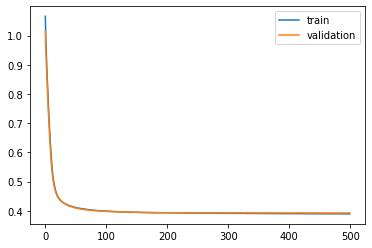

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 36s - loss: 1.0675 - val_loss: 1.0020

Epoch 00001: val_loss improved from inf to 1.00199, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 0.9852 - val_loss: 0.9301

Epoch 00002: val_loss improved from 1.00199 to 0.93010, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9193 - val_loss: 0.8720

Epoch 00003: val_loss improved from 0.93010 to 0.87197, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.8643 - val_loss: 0.8219

Epoch 00004: val_loss improved from 0.87197 to 0.82190, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8148 - val_loss: 0.7757

Epoch 00005: val_loss improved from 0.82190 to 0.77569, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.7682 - val_loss: 0.7318

Epoch 00006: val_loss improved from 0.77569 to 0.73183, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7234 - val_loss: 0.6907

Epoch 00007: val_loss improved from 0.73183

 - 1s - loss: 0.4073 - val_loss: 0.4152

Epoch 00058: val_loss improved from 0.41599 to 0.41524, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4069 - val_loss: 0.4151

Epoch 00059: val_loss improved from 0.41524 to 0.41511, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4065 - val_loss: 0.4147

Epoch 00060: val_loss improved from 0.41511 to 0.41465, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4061 - val_loss: 0.4145

Epoch 00061: val_loss improved from 0.41465 to 0.41454, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4058 - val_loss: 0.4143

Epoch 00062: val_loss improved from 0.41454 to 0.41432, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4054 - val_loss: 0.4140

Epoch 00063: val_loss improved from 0.41432 to 0.41397, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4051 - val_loss: 0.4136

Epoch 00064: val_loss improved from 0.41397 to 0.41355, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.3959 - val_loss: 0.4066

Epoch 00121: val_loss did not improve from 0.40656
Epoch 122/500
 - 1s - loss: 0.3958 - val_loss: 0.4063

Epoch 00122: val_loss improved from 0.40656 to 0.40626, saving model to val_weights3.hdf5
Epoch 123/500
 - 1s - loss: 0.3957 - val_loss: 0.4067

Epoch 00123: val_loss did not improve from 0.40626
Epoch 124/500
 - 1s - loss: 0.3957 - val_loss: 0.4064

Epoch 00124: val_loss did not improve from 0.40626
Epoch 125/500
 - 1s - loss: 0.3956 - val_loss: 0.4064

Epoch 00125: val_loss did not improve from 0.40626
Epoch 126/500
 - 1s - loss: 0.3955 - val_loss: 0.4062

Epoch 00126: val_loss improved from 0.40626 to 0.40618, saving model to val_weights3.hdf5
Epoch 127/500
 - 1s - loss: 0.3954 - val_loss: 0.4064

Epoch 00127: val_loss did not improve from 0.40618
Epoch 128/500
 - 1s - loss: 0.3953 - val_loss: 0.4060

Epoch 00128: val_loss improved from 0.40618 to 0.40600, saving model to val_weights3.hdf5
Epoch 129/500
 - 1s - loss: 0.3953 - val_loss: 0.

 - 1s - loss: 0.3923 - val_loss: 0.4031

Epoch 00191: val_loss improved from 0.40315 to 0.40310, saving model to val_weights3.hdf5
Epoch 192/500
 - 1s - loss: 0.3923 - val_loss: 0.4033

Epoch 00192: val_loss did not improve from 0.40310
Epoch 193/500
 - 1s - loss: 0.3923 - val_loss: 0.4030

Epoch 00193: val_loss improved from 0.40310 to 0.40304, saving model to val_weights3.hdf5
Epoch 194/500
 - 1s - loss: 0.3922 - val_loss: 0.4033

Epoch 00194: val_loss did not improve from 0.40304
Epoch 195/500
 - 1s - loss: 0.3922 - val_loss: 0.4030

Epoch 00195: val_loss did not improve from 0.40304
Epoch 196/500
 - 1s - loss: 0.3921 - val_loss: 0.4032

Epoch 00196: val_loss did not improve from 0.40304
Epoch 197/500
 - 1s - loss: 0.3923 - val_loss: 0.4031

Epoch 00197: val_loss did not improve from 0.40304
Epoch 198/500
 - 1s - loss: 0.3921 - val_loss: 0.4032

Epoch 00198: val_loss did not improve from 0.40304
Epoch 199/500
 - 1s - loss: 0.3921 - val_loss: 0.4031

Epoch 00199: val_loss did not imp

 - 1s - loss: 0.3910 - val_loss: 0.4021

Epoch 00265: val_loss improved from 0.40223 to 0.40211, saving model to val_weights3.hdf5
Epoch 266/500
 - 1s - loss: 0.3911 - val_loss: 0.4025

Epoch 00266: val_loss did not improve from 0.40211
Epoch 267/500
 - 1s - loss: 0.3910 - val_loss: 0.4020

Epoch 00267: val_loss improved from 0.40211 to 0.40204, saving model to val_weights3.hdf5
Epoch 268/500
 - 1s - loss: 0.3911 - val_loss: 0.4025

Epoch 00268: val_loss did not improve from 0.40204
Epoch 269/500
 - 1s - loss: 0.3910 - val_loss: 0.4021

Epoch 00269: val_loss did not improve from 0.40204
Epoch 270/500
 - 1s - loss: 0.3910 - val_loss: 0.4022

Epoch 00270: val_loss did not improve from 0.40204
Epoch 271/500
 - 1s - loss: 0.3909 - val_loss: 0.4019

Epoch 00271: val_loss improved from 0.40204 to 0.40188, saving model to val_weights3.hdf5
Epoch 272/500
 - 1s - loss: 0.3910 - val_loss: 0.4022

Epoch 00272: val_loss did not improve from 0.40188
Epoch 273/500
 - 1s - loss: 0.3910 - val_loss: 0.

 - 1s - loss: 0.3899 - val_loss: 0.4013

Epoch 00340: val_loss improved from 0.40140 to 0.40129, saving model to val_weights3.hdf5
Epoch 341/500
 - 1s - loss: 0.3899 - val_loss: 0.4016

Epoch 00341: val_loss did not improve from 0.40129
Epoch 342/500
 - 1s - loss: 0.3899 - val_loss: 0.4017

Epoch 00342: val_loss did not improve from 0.40129
Epoch 343/500
 - 1s - loss: 0.3899 - val_loss: 0.4015

Epoch 00343: val_loss did not improve from 0.40129
Epoch 344/500
 - 1s - loss: 0.3899 - val_loss: 0.4015

Epoch 00344: val_loss did not improve from 0.40129
Epoch 345/500
 - 1s - loss: 0.3899 - val_loss: 0.4015

Epoch 00345: val_loss did not improve from 0.40129
Epoch 346/500
 - 1s - loss: 0.3899 - val_loss: 0.4016

Epoch 00346: val_loss did not improve from 0.40129
Epoch 347/500
 - 1s - loss: 0.3899 - val_loss: 0.4014

Epoch 00347: val_loss did not improve from 0.40129
Epoch 348/500
 - 1s - loss: 0.3900 - val_loss: 0.4018

Epoch 00348: val_loss did not improve from 0.40129
Epoch 349/500
 - 1s -


Epoch 00415: val_loss did not improve from 0.40076
Epoch 416/500
 - 1s - loss: 0.3890 - val_loss: 0.4010

Epoch 00416: val_loss did not improve from 0.40076
Epoch 417/500
 - 1s - loss: 0.3890 - val_loss: 0.4012

Epoch 00417: val_loss did not improve from 0.40076
Epoch 418/500
 - 1s - loss: 0.3890 - val_loss: 0.4010

Epoch 00418: val_loss did not improve from 0.40076
Epoch 419/500
 - 1s - loss: 0.3891 - val_loss: 0.4011

Epoch 00419: val_loss did not improve from 0.40076
Epoch 420/500
 - 1s - loss: 0.3891 - val_loss: 0.4012

Epoch 00420: val_loss did not improve from 0.40076
Epoch 421/500
 - 1s - loss: 0.3890 - val_loss: 0.4006

Epoch 00421: val_loss improved from 0.40076 to 0.40063, saving model to val_weights3.hdf5
Epoch 422/500
 - 1s - loss: 0.3890 - val_loss: 0.4011

Epoch 00422: val_loss did not improve from 0.40063
Epoch 423/500
 - 1s - loss: 0.3891 - val_loss: 0.4008

Epoch 00423: val_loss did not improve from 0.40063
Epoch 424/500
 - 1s - loss: 0.3890 - val_loss: 0.4012

Epoch 

 - 1s - loss: 0.3890 - val_loss: 0.4008

Epoch 00492: val_loss did not improve from 0.40041
Epoch 493/500
 - 1s - loss: 0.3889 - val_loss: 0.4009

Epoch 00493: val_loss did not improve from 0.40041
Epoch 494/500
 - 1s - loss: 0.3891 - val_loss: 0.4012

Epoch 00494: val_loss did not improve from 0.40041
Epoch 495/500
 - 1s - loss: 0.3891 - val_loss: 0.4005

Epoch 00495: val_loss did not improve from 0.40041
Epoch 496/500
 - 1s - loss: 0.3893 - val_loss: 0.4011

Epoch 00496: val_loss did not improve from 0.40041
Epoch 497/500
 - 1s - loss: 0.3892 - val_loss: 0.4006

Epoch 00497: val_loss did not improve from 0.40041
Epoch 498/500
 - 1s - loss: 0.3895 - val_loss: 0.4008

Epoch 00498: val_loss did not improve from 0.40041
Epoch 499/500
 - 1s - loss: 0.3896 - val_loss: 0.4009

Epoch 00499: val_loss did not improve from 0.40041
Epoch 500/500
 - 1s - loss: 0.3897 - val_loss: 0.4015

Epoch 00500: val_loss did not improve from 0.40041
#################################
Number of units: 4
Batch s

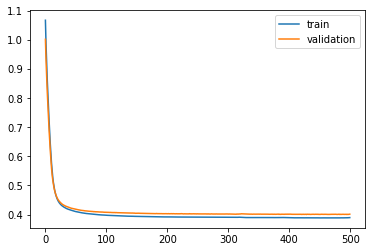

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 37s - loss: 1.0667 - val_loss: 1.0076

Epoch 00001: val_loss improved from inf to 1.00762, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 0.9845 - val_loss: 0.9352

Epoch 00002: val_loss improved from 1.00762 to 0.93518, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9186 - val_loss: 0.8769

Epoch 00003: val_loss improved from 0.93518 to 0.87685, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.8637 - val_loss: 0.8259

Epoch 00004: val_loss improved from 0.87685 to 0.82590, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8143 - val_loss: 0.7781

Epoch 00005: val_loss improved from 0.82590 to 0.77806, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.7680 - val_loss: 0.7324

Epoch 00006: val_loss improved from 0.77806 to 0.73243, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7236 - val_loss: 0.6892

Epoch 00007: val_loss improved from 0.73243

 - 1s - loss: 0.4081 - val_loss: 0.4076

Epoch 00058: val_loss improved from 0.40812 to 0.40760, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4077 - val_loss: 0.4072

Epoch 00059: val_loss improved from 0.40760 to 0.40723, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4074 - val_loss: 0.4070

Epoch 00060: val_loss improved from 0.40723 to 0.40703, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4069 - val_loss: 0.4066

Epoch 00061: val_loss improved from 0.40703 to 0.40656, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4067 - val_loss: 0.4062

Epoch 00062: val_loss improved from 0.40656 to 0.40616, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4062 - val_loss: 0.4059

Epoch 00063: val_loss improved from 0.40616 to 0.40593, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4059 - val_loss: 0.4056

Epoch 00064: val_loss improved from 0.40593 to 0.40563, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.3970 - val_loss: 0.3969

Epoch 00119: val_loss did not improve from 0.39681
Epoch 120/500
 - 1s - loss: 0.3970 - val_loss: 0.3967

Epoch 00120: val_loss improved from 0.39681 to 0.39673, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.3970 - val_loss: 0.3969

Epoch 00121: val_loss did not improve from 0.39673
Epoch 122/500
 - 1s - loss: 0.3968 - val_loss: 0.3965

Epoch 00122: val_loss improved from 0.39673 to 0.39652, saving model to val_weights4.hdf5
Epoch 123/500
 - 1s - loss: 0.3967 - val_loss: 0.3962

Epoch 00123: val_loss improved from 0.39652 to 0.39619, saving model to val_weights4.hdf5
Epoch 124/500
 - 1s - loss: 0.3965 - val_loss: 0.3963

Epoch 00124: val_loss did not improve from 0.39619
Epoch 125/500
 - 1s - loss: 0.3965 - val_loss: 0.3962

Epoch 00125: val_loss did not improve from 0.39619
Epoch 126/500
 - 1s - loss: 0.3966 - val_loss: 0.3963

Epoch 00126: val_loss did not improve from 0.39619
Epoch 127/500
 - 1s - loss: 0.3965 - val_loss: 0.


Epoch 00190: val_loss did not improve from 0.39469
Epoch 191/500
 - 1s - loss: 0.3939 - val_loss: 0.3945

Epoch 00191: val_loss improved from 0.39469 to 0.39452, saving model to val_weights4.hdf5
Epoch 192/500
 - 1s - loss: 0.3939 - val_loss: 0.3942

Epoch 00192: val_loss improved from 0.39452 to 0.39425, saving model to val_weights4.hdf5
Epoch 193/500
 - 1s - loss: 0.3938 - val_loss: 0.3943

Epoch 00193: val_loss did not improve from 0.39425
Epoch 194/500
 - 1s - loss: 0.3938 - val_loss: 0.3942

Epoch 00194: val_loss improved from 0.39425 to 0.39416, saving model to val_weights4.hdf5
Epoch 195/500
 - 1s - loss: 0.3937 - val_loss: 0.3937

Epoch 00195: val_loss improved from 0.39416 to 0.39370, saving model to val_weights4.hdf5
Epoch 196/500
 - 1s - loss: 0.3936 - val_loss: 0.3943

Epoch 00196: val_loss did not improve from 0.39370
Epoch 197/500
 - 1s - loss: 0.3935 - val_loss: 0.3935

Epoch 00197: val_loss improved from 0.39370 to 0.39352, saving model to val_weights4.hdf5
Epoch 198/5

 - 1s - loss: 0.3920 - val_loss: 0.3934

Epoch 00264: val_loss did not improve from 0.39293
Epoch 265/500
 - 1s - loss: 0.3921 - val_loss: 0.3933

Epoch 00265: val_loss did not improve from 0.39293
Epoch 266/500
 - 1s - loss: 0.3921 - val_loss: 0.3934

Epoch 00266: val_loss did not improve from 0.39293
Epoch 267/500
 - 1s - loss: 0.3921 - val_loss: 0.3934

Epoch 00267: val_loss did not improve from 0.39293
Epoch 268/500
 - 1s - loss: 0.3920 - val_loss: 0.3933

Epoch 00268: val_loss did not improve from 0.39293
Epoch 269/500
 - 1s - loss: 0.3920 - val_loss: 0.3931

Epoch 00269: val_loss did not improve from 0.39293
Epoch 270/500
 - 1s - loss: 0.3919 - val_loss: 0.3934

Epoch 00270: val_loss did not improve from 0.39293
Epoch 271/500
 - 1s - loss: 0.3920 - val_loss: 0.3933

Epoch 00271: val_loss did not improve from 0.39293
Epoch 272/500
 - 1s - loss: 0.3919 - val_loss: 0.3933

Epoch 00272: val_loss did not improve from 0.39293
Epoch 273/500
 - 1s - loss: 0.3920 - val_loss: 0.3934

Epoch

 - 1s - loss: 0.3912 - val_loss: 0.3928

Epoch 00340: val_loss did not improve from 0.39221
Epoch 341/500
 - 1s - loss: 0.3912 - val_loss: 0.3929

Epoch 00341: val_loss did not improve from 0.39221
Epoch 342/500
 - 1s - loss: 0.3911 - val_loss: 0.3927

Epoch 00342: val_loss did not improve from 0.39221
Epoch 343/500
 - 1s - loss: 0.3911 - val_loss: 0.3925

Epoch 00343: val_loss did not improve from 0.39221
Epoch 344/500
 - 1s - loss: 0.3911 - val_loss: 0.3927

Epoch 00344: val_loss did not improve from 0.39221
Epoch 345/500
 - 1s - loss: 0.3912 - val_loss: 0.3927

Epoch 00345: val_loss did not improve from 0.39221
Epoch 346/500
 - 1s - loss: 0.3910 - val_loss: 0.3929

Epoch 00346: val_loss did not improve from 0.39221
Epoch 347/500
 - 1s - loss: 0.3912 - val_loss: 0.3927

Epoch 00347: val_loss did not improve from 0.39221
Epoch 348/500
 - 1s - loss: 0.3912 - val_loss: 0.3929

Epoch 00348: val_loss did not improve from 0.39221
Epoch 349/500
 - 1s - loss: 0.3911 - val_loss: 0.3926

Epoch

 - 1s - loss: 0.3906 - val_loss: 0.3928

Epoch 00416: val_loss did not improve from 0.39176
Epoch 417/500
 - 1s - loss: 0.3905 - val_loss: 0.3924

Epoch 00417: val_loss did not improve from 0.39176
Epoch 418/500
 - 1s - loss: 0.3905 - val_loss: 0.3925

Epoch 00418: val_loss did not improve from 0.39176
Epoch 419/500
 - 1s - loss: 0.3905 - val_loss: 0.3925

Epoch 00419: val_loss did not improve from 0.39176
Epoch 420/500
 - 1s - loss: 0.3905 - val_loss: 0.3928

Epoch 00420: val_loss did not improve from 0.39176
Epoch 421/500
 - 1s - loss: 0.3906 - val_loss: 0.3927

Epoch 00421: val_loss did not improve from 0.39176
Epoch 422/500
 - 1s - loss: 0.3906 - val_loss: 0.3927

Epoch 00422: val_loss did not improve from 0.39176
Epoch 423/500
 - 1s - loss: 0.3906 - val_loss: 0.3927

Epoch 00423: val_loss did not improve from 0.39176
Epoch 424/500
 - 1s - loss: 0.3907 - val_loss: 0.3925

Epoch 00424: val_loss did not improve from 0.39176
Epoch 425/500
 - 1s - loss: 0.3905 - val_loss: 0.3927

Epoch


Epoch 00493: val_loss did not improve from 0.39176
Epoch 494/500
 - 1s - loss: 0.3903 - val_loss: 0.3923

Epoch 00494: val_loss did not improve from 0.39176
Epoch 495/500
 - 1s - loss: 0.3904 - val_loss: 0.3921

Epoch 00495: val_loss did not improve from 0.39176
Epoch 496/500
 - 1s - loss: 0.3904 - val_loss: 0.3920

Epoch 00496: val_loss did not improve from 0.39176
Epoch 497/500
 - 1s - loss: 0.3905 - val_loss: 0.3921

Epoch 00497: val_loss did not improve from 0.39176
Epoch 498/500
 - 1s - loss: 0.3903 - val_loss: 0.3920

Epoch 00498: val_loss did not improve from 0.39176
Epoch 499/500
 - 1s - loss: 0.3903 - val_loss: 0.3924

Epoch 00499: val_loss did not improve from 0.39176
Epoch 500/500
 - 1s - loss: 0.3902 - val_loss: 0.3922

Epoch 00500: val_loss did not improve from 0.39176
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.006583721691756861
best val loss: 0.3917619598441654
#################################


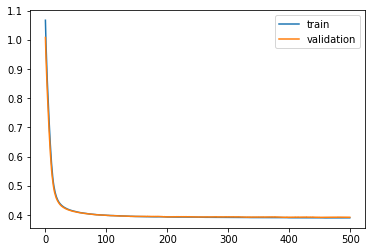

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 37s - loss: 1.0671 - val_loss: 1.0057

Epoch 00001: val_loss improved from inf to 1.00569, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 0.9848 - val_loss: 0.9347

Epoch 00002: val_loss improved from 1.00569 to 0.93471, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9188 - val_loss: 0.8773

Epoch 00003: val_loss improved from 0.93471 to 0.87735, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.8639 - val_loss: 0.8271

Epoch 00004: val_loss improved from 0.87735 to 0.82709, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8144 - val_loss: 0.7810

Epoch 00005: val_loss improved from 0.82709 to 0.78101, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.7678 - val_loss: 0.7365

Epoch 00006: val_loss improved from 0.78101 to 0.73647, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7233 - val_loss: 0.6935

Epoch 00007: val_loss improved from 0.73647

 - 1s - loss: 0.4077 - val_loss: 0.4119

Epoch 00058: val_loss improved from 0.41264 to 0.41195, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4073 - val_loss: 0.4118

Epoch 00059: val_loss improved from 0.41195 to 0.41181, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4070 - val_loss: 0.4117

Epoch 00060: val_loss improved from 0.41181 to 0.41167, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4066 - val_loss: 0.4115

Epoch 00061: val_loss improved from 0.41167 to 0.41145, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4062 - val_loss: 0.4111

Epoch 00062: val_loss improved from 0.41145 to 0.41113, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4058 - val_loss: 0.4109

Epoch 00063: val_loss improved from 0.41113 to 0.41088, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4056 - val_loss: 0.4103

Epoch 00064: val_loss improved from 0.41088 to 0.41031, saving model to val_weights5.hdf5
Epoch

 - 1s - loss: 0.3965 - val_loss: 0.4030

Epoch 00120: val_loss did not improve from 0.40301
Epoch 121/500
 - 1s - loss: 0.3965 - val_loss: 0.4028

Epoch 00121: val_loss improved from 0.40301 to 0.40279, saving model to val_weights5.hdf5
Epoch 122/500
 - 1s - loss: 0.3966 - val_loss: 0.4031

Epoch 00122: val_loss did not improve from 0.40279
Epoch 123/500
 - 1s - loss: 0.3964 - val_loss: 0.4027

Epoch 00123: val_loss improved from 0.40279 to 0.40271, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3963 - val_loss: 0.4028

Epoch 00124: val_loss did not improve from 0.40271
Epoch 125/500
 - 1s - loss: 0.3962 - val_loss: 0.4025

Epoch 00125: val_loss improved from 0.40271 to 0.40248, saving model to val_weights5.hdf5
Epoch 126/500
 - 1s - loss: 0.3962 - val_loss: 0.4026

Epoch 00126: val_loss did not improve from 0.40248
Epoch 127/500
 - 1s - loss: 0.3961 - val_loss: 0.4024

Epoch 00127: val_loss improved from 0.40248 to 0.40236, saving model to val_weights5.hdf5
Epoch 128/

 - 1s - loss: 0.3931 - val_loss: 0.3991

Epoch 00189: val_loss did not improve from 0.39892
Epoch 190/500
 - 1s - loss: 0.3931 - val_loss: 0.3987

Epoch 00190: val_loss improved from 0.39892 to 0.39866, saving model to val_weights5.hdf5
Epoch 191/500
 - 1s - loss: 0.3932 - val_loss: 0.3990

Epoch 00191: val_loss did not improve from 0.39866
Epoch 192/500
 - 1s - loss: 0.3931 - val_loss: 0.3987

Epoch 00192: val_loss did not improve from 0.39866
Epoch 193/500
 - 1s - loss: 0.3932 - val_loss: 0.3991

Epoch 00193: val_loss did not improve from 0.39866
Epoch 194/500
 - 1s - loss: 0.3930 - val_loss: 0.3987

Epoch 00194: val_loss did not improve from 0.39866
Epoch 195/500
 - 1s - loss: 0.3930 - val_loss: 0.3986

Epoch 00195: val_loss improved from 0.39866 to 0.39863, saving model to val_weights5.hdf5
Epoch 196/500
 - 1s - loss: 0.3929 - val_loss: 0.3984

Epoch 00196: val_loss improved from 0.39863 to 0.39842, saving model to val_weights5.hdf5
Epoch 197/500
 - 1s - loss: 0.3931 - val_loss: 0.

 - 1s - loss: 0.3916 - val_loss: 0.3979

Epoch 00263: val_loss did not improve from 0.39743
Epoch 264/500
 - 1s - loss: 0.3917 - val_loss: 0.3977

Epoch 00264: val_loss did not improve from 0.39743
Epoch 265/500
 - 1s - loss: 0.3917 - val_loss: 0.3978

Epoch 00265: val_loss did not improve from 0.39743
Epoch 266/500
 - 1s - loss: 0.3917 - val_loss: 0.3977

Epoch 00266: val_loss did not improve from 0.39743
Epoch 267/500
 - 1s - loss: 0.3917 - val_loss: 0.3980

Epoch 00267: val_loss did not improve from 0.39743
Epoch 268/500
 - 1s - loss: 0.3917 - val_loss: 0.3978

Epoch 00268: val_loss did not improve from 0.39743
Epoch 269/500
 - 1s - loss: 0.3917 - val_loss: 0.3979

Epoch 00269: val_loss did not improve from 0.39743
Epoch 270/500
 - 1s - loss: 0.3916 - val_loss: 0.3978

Epoch 00270: val_loss did not improve from 0.39743
Epoch 271/500
 - 1s - loss: 0.3917 - val_loss: 0.3980

Epoch 00271: val_loss did not improve from 0.39743
Epoch 272/500
 - 1s - loss: 0.3918 - val_loss: 0.3980

Epoch

 - 1s - loss: 0.3906 - val_loss: 0.3969

Epoch 00339: val_loss did not improve from 0.39677
Epoch 340/500
 - 1s - loss: 0.3905 - val_loss: 0.3969

Epoch 00340: val_loss did not improve from 0.39677
Epoch 341/500
 - 1s - loss: 0.3905 - val_loss: 0.3967

Epoch 00341: val_loss improved from 0.39677 to 0.39665, saving model to val_weights5.hdf5
Epoch 342/500
 - 1s - loss: 0.3905 - val_loss: 0.3969

Epoch 00342: val_loss did not improve from 0.39665
Epoch 343/500
 - 1s - loss: 0.3905 - val_loss: 0.3968

Epoch 00343: val_loss did not improve from 0.39665
Epoch 344/500
 - 1s - loss: 0.3906 - val_loss: 0.3969

Epoch 00344: val_loss did not improve from 0.39665
Epoch 345/500
 - 1s - loss: 0.3906 - val_loss: 0.3970

Epoch 00345: val_loss did not improve from 0.39665
Epoch 346/500
 - 1s - loss: 0.3908 - val_loss: 0.3966

Epoch 00346: val_loss improved from 0.39665 to 0.39659, saving model to val_weights5.hdf5
Epoch 347/500
 - 1s - loss: 0.3907 - val_loss: 0.3968

Epoch 00347: val_loss did not imp


Epoch 00415: val_loss did not improve from 0.39647
Epoch 416/500
 - 1s - loss: 0.3904 - val_loss: 0.3972

Epoch 00416: val_loss did not improve from 0.39647
Epoch 417/500
 - 1s - loss: 0.3902 - val_loss: 0.3968

Epoch 00417: val_loss did not improve from 0.39647
Epoch 418/500
 - 1s - loss: 0.3900 - val_loss: 0.3968

Epoch 00418: val_loss did not improve from 0.39647
Epoch 419/500
 - 1s - loss: 0.3900 - val_loss: 0.3965

Epoch 00419: val_loss did not improve from 0.39647
Epoch 420/500
 - 1s - loss: 0.3898 - val_loss: 0.3971

Epoch 00420: val_loss did not improve from 0.39647
Epoch 421/500
 - 1s - loss: 0.3898 - val_loss: 0.3966

Epoch 00421: val_loss did not improve from 0.39647
Epoch 422/500
 - 1s - loss: 0.3897 - val_loss: 0.3968

Epoch 00422: val_loss did not improve from 0.39647
Epoch 423/500
 - 1s - loss: 0.3897 - val_loss: 0.3967

Epoch 00423: val_loss did not improve from 0.39647
Epoch 424/500
 - 1s - loss: 0.3896 - val_loss: 0.3966

Epoch 00424: val_loss did not improve from 0.

 - 1s - loss: 0.3892 - val_loss: 0.3970

Epoch 00492: val_loss did not improve from 0.39641
Epoch 493/500
 - 1s - loss: 0.3892 - val_loss: 0.3971

Epoch 00493: val_loss did not improve from 0.39641
Epoch 494/500
 - 1s - loss: 0.3892 - val_loss: 0.3972

Epoch 00494: val_loss did not improve from 0.39641
Epoch 495/500
 - 1s - loss: 0.3892 - val_loss: 0.3971

Epoch 00495: val_loss did not improve from 0.39641
Epoch 496/500
 - 1s - loss: 0.3892 - val_loss: 0.3972

Epoch 00496: val_loss did not improve from 0.39641
Epoch 497/500
 - 1s - loss: 0.3893 - val_loss: 0.3972

Epoch 00497: val_loss did not improve from 0.39641
Epoch 498/500
 - 1s - loss: 0.3892 - val_loss: 0.3971

Epoch 00498: val_loss did not improve from 0.39641
Epoch 499/500
 - 1s - loss: 0.3892 - val_loss: 0.3977

Epoch 00499: val_loss did not improve from 0.39641
Epoch 500/500
 - 1s - loss: 0.3893 - val_loss: 0.3972

Epoch 00500: val_loss did not improve from 0.39641
#################################
Number of units: 4
Batch s

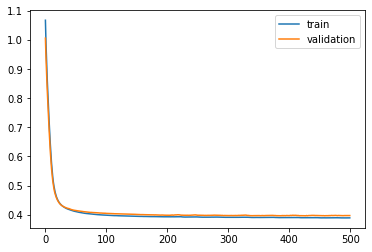

Time to train LSTM:  398.7255687713623
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 36s - loss: 1.2515 - val_loss: 1.1906

Epoch 00001: val_loss improved from inf to 1.19064, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.1441 - val_loss: 1.0927

Epoch 00002: val_loss improved from 1.19064 to 1.09274, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.0544 - val_loss: 1.0104

Epoch 00003: val_loss improved from 1.09274 to 1.01043, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9777 - val_loss: 0.9388

Epoch 00004: val_loss improved from 1.01043 to 0.93880, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.9092 - val_loss: 0.8734

Epoch 00005: val_loss improved from 0.93880 to 0.87341, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8456 - val_loss: 0.8126

Epoch 00006: val_loss improved from 0.87341 to 0.81256, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7854 - val_loss: 0.7551

Epoc


Epoch 00057: val_loss improved from 0.41619 to 0.41561, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4090 - val_loss: 0.4151

Epoch 00058: val_loss improved from 0.41561 to 0.41508, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4086 - val_loss: 0.4148

Epoch 00059: val_loss improved from 0.41508 to 0.41478, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4083 - val_loss: 0.4147

Epoch 00060: val_loss improved from 0.41478 to 0.41469, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4078 - val_loss: 0.4138

Epoch 00061: val_loss improved from 0.41469 to 0.41378, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4076 - val_loss: 0.4139

Epoch 00062: val_loss did not improve from 0.41378
Epoch 63/500
 - 1s - loss: 0.4071 - val_loss: 0.4132

Epoch 00063: val_loss improved from 0.41378 to 0.41318, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4069 - val_loss: 0.4131

Epoch 00064: val_loss improved


Epoch 00119: val_loss improved from 0.40293 to 0.40289, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.3979 - val_loss: 0.4026

Epoch 00120: val_loss improved from 0.40289 to 0.40265, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.3978 - val_loss: 0.4027

Epoch 00121: val_loss did not improve from 0.40265
Epoch 122/500
 - 1s - loss: 0.3978 - val_loss: 0.4029

Epoch 00122: val_loss did not improve from 0.40265
Epoch 123/500
 - 1s - loss: 0.3977 - val_loss: 0.4026

Epoch 00123: val_loss improved from 0.40265 to 0.40259, saving model to val_weights1.hdf5
Epoch 124/500
 - 1s - loss: 0.3976 - val_loss: 0.4026

Epoch 00124: val_loss improved from 0.40259 to 0.40258, saving model to val_weights1.hdf5
Epoch 125/500
 - 1s - loss: 0.3975 - val_loss: 0.4024

Epoch 00125: val_loss improved from 0.40258 to 0.40242, saving model to val_weights1.hdf5
Epoch 126/500
 - 1s - loss: 0.3974 - val_loss: 0.4026

Epoch 00126: val_loss did not improve from 0.40242
Epoch 127/5

 - 1s - loss: 0.3946 - val_loss: 0.3993

Epoch 00188: val_loss did not improve from 0.39892
Epoch 189/500
 - 1s - loss: 0.3948 - val_loss: 0.3990

Epoch 00189: val_loss did not improve from 0.39892
Epoch 190/500
 - 1s - loss: 0.3946 - val_loss: 0.3993

Epoch 00190: val_loss did not improve from 0.39892
Epoch 191/500
 - 1s - loss: 0.3948 - val_loss: 0.3992

Epoch 00191: val_loss did not improve from 0.39892
Epoch 192/500
 - 1s - loss: 0.3947 - val_loss: 0.3993

Epoch 00192: val_loss did not improve from 0.39892
Epoch 193/500
 - 1s - loss: 0.3948 - val_loss: 0.3995

Epoch 00193: val_loss did not improve from 0.39892
Epoch 194/500
 - 1s - loss: 0.3948 - val_loss: 0.3993

Epoch 00194: val_loss did not improve from 0.39892
Epoch 195/500
 - 1s - loss: 0.3947 - val_loss: 0.3991

Epoch 00195: val_loss did not improve from 0.39892
Epoch 196/500
 - 1s - loss: 0.3946 - val_loss: 0.3991

Epoch 00196: val_loss did not improve from 0.39892
Epoch 197/500
 - 1s - loss: 0.3947 - val_loss: 0.3989

Epoch


Epoch 00262: val_loss did not improve from 0.39815
Epoch 263/500
 - 1s - loss: 0.3936 - val_loss: 0.3984

Epoch 00263: val_loss did not improve from 0.39815
Epoch 264/500
 - 1s - loss: 0.3936 - val_loss: 0.3983

Epoch 00264: val_loss did not improve from 0.39815
Epoch 265/500
 - 1s - loss: 0.3934 - val_loss: 0.3980

Epoch 00265: val_loss improved from 0.39815 to 0.39803, saving model to val_weights1.hdf5
Epoch 266/500
 - 1s - loss: 0.3936 - val_loss: 0.3983

Epoch 00266: val_loss did not improve from 0.39803
Epoch 267/500
 - 1s - loss: 0.3936 - val_loss: 0.3982

Epoch 00267: val_loss did not improve from 0.39803
Epoch 268/500
 - 1s - loss: 0.3935 - val_loss: 0.3985

Epoch 00268: val_loss did not improve from 0.39803
Epoch 269/500
 - 1s - loss: 0.3935 - val_loss: 0.3985

Epoch 00269: val_loss did not improve from 0.39803
Epoch 270/500
 - 1s - loss: 0.3935 - val_loss: 0.3983

Epoch 00270: val_loss did not improve from 0.39803
Epoch 271/500
 - 1s - loss: 0.3934 - val_loss: 0.3985

Epoch 

 - 1s - loss: 0.3928 - val_loss: 0.3978

Epoch 00338: val_loss did not improve from 0.39767
Epoch 339/500
 - 1s - loss: 0.3929 - val_loss: 0.3978

Epoch 00339: val_loss did not improve from 0.39767
Epoch 340/500
 - 1s - loss: 0.3931 - val_loss: 0.3982

Epoch 00340: val_loss did not improve from 0.39767
Epoch 341/500
 - 1s - loss: 0.3929 - val_loss: 0.3979

Epoch 00341: val_loss did not improve from 0.39767
Epoch 342/500
 - 1s - loss: 0.3930 - val_loss: 0.3983

Epoch 00342: val_loss did not improve from 0.39767
Epoch 343/500
 - 1s - loss: 0.3930 - val_loss: 0.3979

Epoch 00343: val_loss did not improve from 0.39767
Epoch 344/500
 - 1s - loss: 0.3929 - val_loss: 0.3978

Epoch 00344: val_loss did not improve from 0.39767
Epoch 345/500
 - 1s - loss: 0.3929 - val_loss: 0.3975

Epoch 00345: val_loss improved from 0.39767 to 0.39746, saving model to val_weights1.hdf5
Epoch 346/500
 - 1s - loss: 0.3928 - val_loss: 0.3979

Epoch 00346: val_loss did not improve from 0.39746
Epoch 347/500
 - 1s -


Epoch 00413: val_loss did not improve from 0.39692
Epoch 414/500
 - 1s - loss: 0.3923 - val_loss: 0.3976

Epoch 00414: val_loss did not improve from 0.39692
Epoch 415/500
 - 1s - loss: 0.3923 - val_loss: 0.3976

Epoch 00415: val_loss did not improve from 0.39692
Epoch 416/500
 - 1s - loss: 0.3922 - val_loss: 0.3975

Epoch 00416: val_loss did not improve from 0.39692
Epoch 417/500
 - 1s - loss: 0.3923 - val_loss: 0.3975

Epoch 00417: val_loss did not improve from 0.39692
Epoch 418/500
 - 1s - loss: 0.3923 - val_loss: 0.3976

Epoch 00418: val_loss did not improve from 0.39692
Epoch 419/500
 - 1s - loss: 0.3924 - val_loss: 0.3975

Epoch 00419: val_loss did not improve from 0.39692
Epoch 420/500
 - 1s - loss: 0.3924 - val_loss: 0.3976

Epoch 00420: val_loss did not improve from 0.39692
Epoch 421/500
 - 1s - loss: 0.3923 - val_loss: 0.3975

Epoch 00421: val_loss did not improve from 0.39692
Epoch 422/500
 - 1s - loss: 0.3923 - val_loss: 0.3972

Epoch 00422: val_loss did not improve from 0.

 - 1s - loss: 0.3914 - val_loss: 0.3973

Epoch 00491: val_loss did not improve from 0.39692
Epoch 492/500
 - 1s - loss: 0.3916 - val_loss: 0.3971

Epoch 00492: val_loss did not improve from 0.39692
Epoch 493/500
 - 1s - loss: 0.3915 - val_loss: 0.3974

Epoch 00493: val_loss did not improve from 0.39692
Epoch 494/500
 - 1s - loss: 0.3917 - val_loss: 0.3970

Epoch 00494: val_loss did not improve from 0.39692
Epoch 495/500
 - 1s - loss: 0.3918 - val_loss: 0.3974

Epoch 00495: val_loss did not improve from 0.39692
Epoch 496/500
 - 1s - loss: 0.3916 - val_loss: 0.3973

Epoch 00496: val_loss did not improve from 0.39692
Epoch 497/500
 - 1s - loss: 0.3915 - val_loss: 0.3972

Epoch 00497: val_loss did not improve from 0.39692
Epoch 498/500
 - 1s - loss: 0.3915 - val_loss: 0.3973

Epoch 00498: val_loss did not improve from 0.39692
Epoch 499/500
 - 1s - loss: 0.3915 - val_loss: 0.3973

Epoch 00499: val_loss did not improve from 0.39692
Epoch 500/500
 - 1s - loss: 0.3916 - val_loss: 0.3971

Epoch

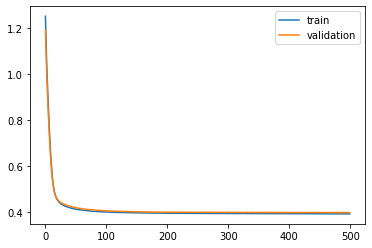

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7fa24e550ef0>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 38s - loss: 1.2522 - val_loss: 1.1860

Epoch 00001: val_loss improved from inf to 1.18600, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.1446 - val_loss: 1.0910

Epoch 00002: val_loss improved from 1.18600 to 1.09103, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.0546 - val_loss: 1.0102

Epoch 00003: val_loss improved from 1.09103 to 1.01024, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9778 - val_loss: 0.9390

Epoch 00004: val_loss improved from 1.01024 to 0.93902, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.9092 - val_loss: 0.8731

Epoch 00005: val_loss improved from 0.93902 to 0.87307, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8457 - val_loss: 0.8105

Epoch 00006: val_loss improved from 0.87307 to 0.81054, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7858 - val_loss: 0.7522

Epoch 00007: val_loss improved from 0.81054

 - 1s - loss: 0.4095 - val_loss: 0.4062

Epoch 00058: val_loss improved from 0.40656 to 0.40620, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4092 - val_loss: 0.4059

Epoch 00059: val_loss improved from 0.40620 to 0.40593, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4087 - val_loss: 0.4055

Epoch 00060: val_loss improved from 0.40593 to 0.40550, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4084 - val_loss: 0.4053

Epoch 00061: val_loss improved from 0.40550 to 0.40535, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4079 - val_loss: 0.4049

Epoch 00062: val_loss improved from 0.40535 to 0.40489, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4078 - val_loss: 0.4048

Epoch 00063: val_loss improved from 0.40489 to 0.40481, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4073 - val_loss: 0.4043

Epoch 00064: val_loss improved from 0.40481 to 0.40429, saving model to val_weights2.hdf5
Epoch


Epoch 00120: val_loss did not improve from 0.39701
Epoch 121/500
 - 1s - loss: 0.3982 - val_loss: 0.3971

Epoch 00121: val_loss did not improve from 0.39701
Epoch 122/500
 - 1s - loss: 0.3980 - val_loss: 0.3970

Epoch 00122: val_loss did not improve from 0.39701
Epoch 123/500
 - 1s - loss: 0.3979 - val_loss: 0.3969

Epoch 00123: val_loss improved from 0.39701 to 0.39691, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3979 - val_loss: 0.3966

Epoch 00124: val_loss improved from 0.39691 to 0.39658, saving model to val_weights2.hdf5
Epoch 125/500
 - 1s - loss: 0.3979 - val_loss: 0.3970

Epoch 00125: val_loss did not improve from 0.39658
Epoch 126/500
 - 1s - loss: 0.3979 - val_loss: 0.3968

Epoch 00126: val_loss did not improve from 0.39658
Epoch 127/500
 - 1s - loss: 0.3978 - val_loss: 0.3968

Epoch 00127: val_loss did not improve from 0.39658
Epoch 128/500
 - 1s - loss: 0.3978 - val_loss: 0.3967

Epoch 00128: val_loss did not improve from 0.39658
Epoch 129/500
 - 1s - 


Epoch 00189: val_loss did not improve from 0.39407
Epoch 190/500
 - 1s - loss: 0.3953 - val_loss: 0.3944

Epoch 00190: val_loss did not improve from 0.39407
Epoch 191/500
 - 1s - loss: 0.3952 - val_loss: 0.3940

Epoch 00191: val_loss improved from 0.39407 to 0.39401, saving model to val_weights2.hdf5
Epoch 192/500
 - 1s - loss: 0.3952 - val_loss: 0.3946

Epoch 00192: val_loss did not improve from 0.39401
Epoch 193/500
 - 1s - loss: 0.3952 - val_loss: 0.3941

Epoch 00193: val_loss did not improve from 0.39401
Epoch 194/500
 - 1s - loss: 0.3952 - val_loss: 0.3941

Epoch 00194: val_loss did not improve from 0.39401
Epoch 195/500
 - 1s - loss: 0.3950 - val_loss: 0.3940

Epoch 00195: val_loss improved from 0.39401 to 0.39400, saving model to val_weights2.hdf5
Epoch 196/500
 - 1s - loss: 0.3951 - val_loss: 0.3942

Epoch 00196: val_loss did not improve from 0.39400
Epoch 197/500
 - 1s - loss: 0.3950 - val_loss: 0.3941

Epoch 00197: val_loss did not improve from 0.39400
Epoch 198/500
 - 1s - 


Epoch 00264: val_loss did not improve from 0.39295
Epoch 265/500
 - 1s - loss: 0.3940 - val_loss: 0.3932

Epoch 00265: val_loss did not improve from 0.39295
Epoch 266/500
 - 1s - loss: 0.3940 - val_loss: 0.3935

Epoch 00266: val_loss did not improve from 0.39295
Epoch 267/500
 - 1s - loss: 0.3939 - val_loss: 0.3935

Epoch 00267: val_loss did not improve from 0.39295
Epoch 268/500
 - 1s - loss: 0.3940 - val_loss: 0.3932

Epoch 00268: val_loss did not improve from 0.39295
Epoch 269/500
 - 1s - loss: 0.3940 - val_loss: 0.3934

Epoch 00269: val_loss did not improve from 0.39295
Epoch 270/500
 - 1s - loss: 0.3941 - val_loss: 0.3932

Epoch 00270: val_loss did not improve from 0.39295
Epoch 271/500
 - 1s - loss: 0.3939 - val_loss: 0.3936

Epoch 00271: val_loss did not improve from 0.39295
Epoch 272/500
 - 1s - loss: 0.3941 - val_loss: 0.3931

Epoch 00272: val_loss did not improve from 0.39295
Epoch 273/500
 - 1s - loss: 0.3940 - val_loss: 0.3932

Epoch 00273: val_loss did not improve from 0.


Epoch 00340: val_loss did not improve from 0.39269
Epoch 341/500
 - 1s - loss: 0.3931 - val_loss: 0.3929

Epoch 00341: val_loss did not improve from 0.39269
Epoch 342/500
 - 1s - loss: 0.3932 - val_loss: 0.3930

Epoch 00342: val_loss did not improve from 0.39269
Epoch 343/500
 - 1s - loss: 0.3932 - val_loss: 0.3930

Epoch 00343: val_loss did not improve from 0.39269
Epoch 344/500
 - 1s - loss: 0.3934 - val_loss: 0.3929

Epoch 00344: val_loss did not improve from 0.39269
Epoch 345/500
 - 1s - loss: 0.3932 - val_loss: 0.3927

Epoch 00345: val_loss did not improve from 0.39269
Epoch 346/500
 - 1s - loss: 0.3932 - val_loss: 0.3932

Epoch 00346: val_loss did not improve from 0.39269
Epoch 347/500
 - 1s - loss: 0.3932 - val_loss: 0.3930

Epoch 00347: val_loss did not improve from 0.39269
Epoch 348/500
 - 1s - loss: 0.3932 - val_loss: 0.3930

Epoch 00348: val_loss did not improve from 0.39269
Epoch 349/500
 - 1s - loss: 0.3932 - val_loss: 0.3932

Epoch 00349: val_loss did not improve from 0.

 - 1s - loss: 0.3927 - val_loss: 0.3925

Epoch 00416: val_loss did not improve from 0.39238
Epoch 417/500
 - 1s - loss: 0.3926 - val_loss: 0.3928

Epoch 00417: val_loss did not improve from 0.39238
Epoch 418/500
 - 1s - loss: 0.3928 - val_loss: 0.3925

Epoch 00418: val_loss did not improve from 0.39238
Epoch 419/500
 - 1s - loss: 0.3927 - val_loss: 0.3924

Epoch 00419: val_loss did not improve from 0.39238
Epoch 420/500
 - 1s - loss: 0.3927 - val_loss: 0.3928

Epoch 00420: val_loss did not improve from 0.39238
Epoch 421/500
 - 1s - loss: 0.3927 - val_loss: 0.3929

Epoch 00421: val_loss did not improve from 0.39238
Epoch 422/500
 - 1s - loss: 0.3927 - val_loss: 0.3925

Epoch 00422: val_loss did not improve from 0.39238
Epoch 423/500
 - 1s - loss: 0.3926 - val_loss: 0.3926

Epoch 00423: val_loss did not improve from 0.39238
Epoch 424/500
 - 1s - loss: 0.3926 - val_loss: 0.3927

Epoch 00424: val_loss did not improve from 0.39238
Epoch 425/500
 - 1s - loss: 0.3927 - val_loss: 0.3924

Epoch

 - 1s - loss: 0.3923 - val_loss: 0.3925

Epoch 00493: val_loss did not improve from 0.39224
Epoch 494/500
 - 1s - loss: 0.3923 - val_loss: 0.3928

Epoch 00494: val_loss did not improve from 0.39224
Epoch 495/500
 - 1s - loss: 0.3923 - val_loss: 0.3925

Epoch 00495: val_loss did not improve from 0.39224
Epoch 496/500
 - 1s - loss: 0.3922 - val_loss: 0.3925

Epoch 00496: val_loss did not improve from 0.39224
Epoch 497/500
 - 1s - loss: 0.3921 - val_loss: 0.3923

Epoch 00497: val_loss did not improve from 0.39224
Epoch 498/500
 - 1s - loss: 0.3923 - val_loss: 0.3927

Epoch 00498: val_loss did not improve from 0.39224
Epoch 499/500
 - 1s - loss: 0.3921 - val_loss: 0.3926

Epoch 00499: val_loss did not improve from 0.39224
Epoch 500/500
 - 1s - loss: 0.3922 - val_loss: 0.3924

Epoch 00500: val_loss did not improve from 0.39224
#################################
Number of units: 4
Batch size: 8192
Fold: 1
L2: 0.01322298542384515
best val loss: 0.3922437456183963
##############################

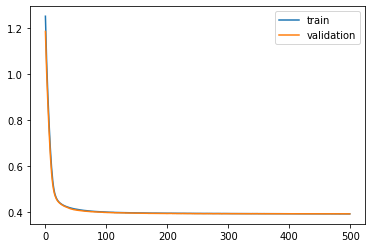

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 37s - loss: 1.2536 - val_loss: 1.1740

Epoch 00001: val_loss improved from inf to 1.17397, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.1463 - val_loss: 1.0774

Epoch 00002: val_loss improved from 1.17397 to 1.07735, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.0565 - val_loss: 0.9960

Epoch 00003: val_loss improved from 1.07735 to 0.99600, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9796 - val_loss: 0.9255

Epoch 00004: val_loss improved from 0.99600 to 0.92552, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.9109 - val_loss: 0.8611

Epoch 00005: val_loss improved from 0.92552 to 0.86107, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8471 - val_loss: 0.8009

Epoch 00006: val_loss improved from 0.86107 to 0.80090, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7870 - val_loss: 0.7453

Epoch 00007: val_loss improved from 0.80090

 - 1s - loss: 0.4088 - val_loss: 0.4156

Epoch 00058: val_loss improved from 0.41591 to 0.41563, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4085 - val_loss: 0.4154

Epoch 00059: val_loss improved from 0.41563 to 0.41540, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4081 - val_loss: 0.4153

Epoch 00060: val_loss improved from 0.41540 to 0.41535, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4079 - val_loss: 0.4148

Epoch 00061: val_loss improved from 0.41535 to 0.41478, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4074 - val_loss: 0.4148

Epoch 00062: val_loss did not improve from 0.41478
Epoch 63/500
 - 1s - loss: 0.4072 - val_loss: 0.4142

Epoch 00063: val_loss improved from 0.41478 to 0.41421, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4067 - val_loss: 0.4139

Epoch 00064: val_loss improved from 0.41421 to 0.41385, saving model to val_weights3.hdf5
Epoch 65/500
 - 1s - loss: 0.4065 - val_loss

 - 1s - loss: 0.3973 - val_loss: 0.4067

Epoch 00121: val_loss did not improve from 0.40657
Epoch 122/500
 - 1s - loss: 0.3973 - val_loss: 0.4063

Epoch 00122: val_loss improved from 0.40657 to 0.40628, saving model to val_weights3.hdf5
Epoch 123/500
 - 1s - loss: 0.3972 - val_loss: 0.4065

Epoch 00123: val_loss did not improve from 0.40628
Epoch 124/500
 - 1s - loss: 0.3972 - val_loss: 0.4061

Epoch 00124: val_loss improved from 0.40628 to 0.40607, saving model to val_weights3.hdf5
Epoch 125/500
 - 1s - loss: 0.3971 - val_loss: 0.4063

Epoch 00125: val_loss did not improve from 0.40607
Epoch 126/500
 - 1s - loss: 0.3971 - val_loss: 0.4064

Epoch 00126: val_loss did not improve from 0.40607
Epoch 127/500
 - 1s - loss: 0.3970 - val_loss: 0.4061

Epoch 00127: val_loss did not improve from 0.40607
Epoch 128/500
 - 1s - loss: 0.3971 - val_loss: 0.4061

Epoch 00128: val_loss did not improve from 0.40607
Epoch 129/500
 - 1s - loss: 0.3969 - val_loss: 0.4061

Epoch 00129: val_loss did not imp


Epoch 00189: val_loss did not improve from 0.40389
Epoch 190/500
 - 1s - loss: 0.3944 - val_loss: 0.4042

Epoch 00190: val_loss did not improve from 0.40389
Epoch 191/500
 - 1s - loss: 0.3943 - val_loss: 0.4042

Epoch 00191: val_loss did not improve from 0.40389
Epoch 192/500
 - 1s - loss: 0.3943 - val_loss: 0.4039

Epoch 00192: val_loss did not improve from 0.40389
Epoch 193/500
 - 1s - loss: 0.3944 - val_loss: 0.4045

Epoch 00193: val_loss did not improve from 0.40389
Epoch 194/500
 - 1s - loss: 0.3945 - val_loss: 0.4042

Epoch 00194: val_loss did not improve from 0.40389
Epoch 195/500
 - 1s - loss: 0.3943 - val_loss: 0.4040

Epoch 00195: val_loss did not improve from 0.40389
Epoch 196/500
 - 1s - loss: 0.3942 - val_loss: 0.4038

Epoch 00196: val_loss improved from 0.40389 to 0.40375, saving model to val_weights3.hdf5
Epoch 197/500
 - 1s - loss: 0.3942 - val_loss: 0.4042

Epoch 00197: val_loss did not improve from 0.40375
Epoch 198/500
 - 1s - loss: 0.3942 - val_loss: 0.4040

Epoch 

 - 1s - loss: 0.3932 - val_loss: 0.4029

Epoch 00264: val_loss improved from 0.40299 to 0.40289, saving model to val_weights3.hdf5
Epoch 265/500
 - 1s - loss: 0.3931 - val_loss: 0.4032

Epoch 00265: val_loss did not improve from 0.40289
Epoch 266/500
 - 1s - loss: 0.3933 - val_loss: 0.4033

Epoch 00266: val_loss did not improve from 0.40289
Epoch 267/500
 - 1s - loss: 0.3932 - val_loss: 0.4033

Epoch 00267: val_loss did not improve from 0.40289
Epoch 268/500
 - 1s - loss: 0.3933 - val_loss: 0.4033

Epoch 00268: val_loss did not improve from 0.40289
Epoch 269/500
 - 1s - loss: 0.3931 - val_loss: 0.4031

Epoch 00269: val_loss did not improve from 0.40289
Epoch 270/500
 - 1s - loss: 0.3931 - val_loss: 0.4035

Epoch 00270: val_loss did not improve from 0.40289
Epoch 271/500
 - 1s - loss: 0.3932 - val_loss: 0.4031

Epoch 00271: val_loss did not improve from 0.40289
Epoch 272/500
 - 1s - loss: 0.3932 - val_loss: 0.4033

Epoch 00272: val_loss did not improve from 0.40289
Epoch 273/500
 - 1s -

 - 1s - loss: 0.3925 - val_loss: 0.4025

Epoch 00338: val_loss did not improve from 0.40226
Epoch 339/500
 - 1s - loss: 0.3925 - val_loss: 0.4025

Epoch 00339: val_loss did not improve from 0.40226
Epoch 340/500
 - 1s - loss: 0.3925 - val_loss: 0.4022

Epoch 00340: val_loss improved from 0.40226 to 0.40217, saving model to val_weights3.hdf5
Epoch 341/500
 - 1s - loss: 0.3925 - val_loss: 0.4026

Epoch 00341: val_loss did not improve from 0.40217
Epoch 342/500
 - 1s - loss: 0.3925 - val_loss: 0.4020

Epoch 00342: val_loss improved from 0.40217 to 0.40195, saving model to val_weights3.hdf5
Epoch 343/500
 - 1s - loss: 0.3925 - val_loss: 0.4028

Epoch 00343: val_loss did not improve from 0.40195
Epoch 344/500
 - 1s - loss: 0.3925 - val_loss: 0.4021

Epoch 00344: val_loss did not improve from 0.40195
Epoch 345/500
 - 1s - loss: 0.3925 - val_loss: 0.4024

Epoch 00345: val_loss did not improve from 0.40195
Epoch 346/500
 - 1s - loss: 0.3924 - val_loss: 0.4023

Epoch 00346: val_loss did not imp

 - 1s - loss: 0.3919 - val_loss: 0.4016

Epoch 00411: val_loss did not improve from 0.40144
Epoch 412/500
 - 1s - loss: 0.3919 - val_loss: 0.4019

Epoch 00412: val_loss did not improve from 0.40144
Epoch 413/500
 - 1s - loss: 0.3920 - val_loss: 0.4017

Epoch 00413: val_loss did not improve from 0.40144
Epoch 414/500
 - 1s - loss: 0.3918 - val_loss: 0.4014

Epoch 00414: val_loss improved from 0.40144 to 0.40141, saving model to val_weights3.hdf5
Epoch 415/500
 - 1s - loss: 0.3920 - val_loss: 0.4019

Epoch 00415: val_loss did not improve from 0.40141
Epoch 416/500
 - 1s - loss: 0.3919 - val_loss: 0.4014

Epoch 00416: val_loss improved from 0.40141 to 0.40138, saving model to val_weights3.hdf5
Epoch 417/500
 - 1s - loss: 0.3919 - val_loss: 0.4018

Epoch 00417: val_loss did not improve from 0.40138
Epoch 418/500
 - 1s - loss: 0.3919 - val_loss: 0.4016

Epoch 00418: val_loss did not improve from 0.40138
Epoch 419/500
 - 1s - loss: 0.3918 - val_loss: 0.4019

Epoch 00419: val_loss did not imp

 - 1s - loss: 0.3913 - val_loss: 0.4015

Epoch 00487: val_loss did not improve from 0.40100
Epoch 488/500
 - 1s - loss: 0.3914 - val_loss: 0.4015

Epoch 00488: val_loss did not improve from 0.40100
Epoch 489/500
 - 1s - loss: 0.3915 - val_loss: 0.4014

Epoch 00489: val_loss did not improve from 0.40100
Epoch 490/500
 - 1s - loss: 0.3913 - val_loss: 0.4014

Epoch 00490: val_loss did not improve from 0.40100
Epoch 491/500
 - 1s - loss: 0.3915 - val_loss: 0.4019

Epoch 00491: val_loss did not improve from 0.40100
Epoch 492/500
 - 1s - loss: 0.3914 - val_loss: 0.4012

Epoch 00492: val_loss did not improve from 0.40100
Epoch 493/500
 - 1s - loss: 0.3913 - val_loss: 0.4013

Epoch 00493: val_loss did not improve from 0.40100
Epoch 494/500
 - 1s - loss: 0.3914 - val_loss: 0.4010

Epoch 00494: val_loss improved from 0.40100 to 0.40097, saving model to val_weights3.hdf5
Epoch 495/500
 - 1s - loss: 0.3912 - val_loss: 0.4013

Epoch 00495: val_loss did not improve from 0.40097
Epoch 496/500
 - 1s -

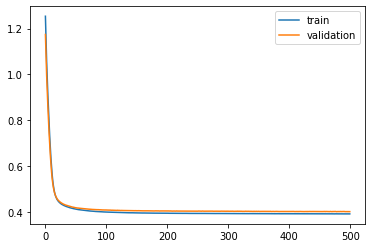

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 37s - loss: 1.2528 - val_loss: 1.1797

Epoch 00001: val_loss improved from inf to 1.17967, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.1456 - val_loss: 1.0825

Epoch 00002: val_loss improved from 1.17967 to 1.08252, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.0559 - val_loss: 1.0011

Epoch 00003: val_loss improved from 1.08252 to 1.00108, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9790 - val_loss: 0.9297

Epoch 00004: val_loss improved from 1.00108 to 0.92969, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.9103 - val_loss: 0.8642

Epoch 00005: val_loss improved from 0.92969 to 0.86419, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8466 - val_loss: 0.8025

Epoch 00006: val_loss improved from 0.86419 to 0.80249, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7868 - val_loss: 0.7447

Epoch 00007: val_loss improved from 0.80249

 - 1s - loss: 0.4097 - val_loss: 0.4087

Epoch 00058: val_loss improved from 0.40895 to 0.40868, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4093 - val_loss: 0.4081

Epoch 00059: val_loss improved from 0.40868 to 0.40812, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4091 - val_loss: 0.4076

Epoch 00060: val_loss improved from 0.40812 to 0.40760, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4086 - val_loss: 0.4075

Epoch 00061: val_loss improved from 0.40760 to 0.40748, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4084 - val_loss: 0.4070

Epoch 00062: val_loss improved from 0.40748 to 0.40704, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4080 - val_loss: 0.4067

Epoch 00063: val_loss improved from 0.40704 to 0.40668, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4076 - val_loss: 0.4062

Epoch 00064: val_loss improved from 0.40668 to 0.40623, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.3984 - val_loss: 0.3969

Epoch 00120: val_loss did not improve from 0.39693
Epoch 121/500
 - 1s - loss: 0.3983 - val_loss: 0.3970

Epoch 00121: val_loss did not improve from 0.39693
Epoch 122/500
 - 1s - loss: 0.3981 - val_loss: 0.3968

Epoch 00122: val_loss improved from 0.39693 to 0.39684, saving model to val_weights4.hdf5
Epoch 123/500
 - 1s - loss: 0.3981 - val_loss: 0.3968

Epoch 00123: val_loss improved from 0.39684 to 0.39678, saving model to val_weights4.hdf5
Epoch 124/500
 - 1s - loss: 0.3980 - val_loss: 0.3965

Epoch 00124: val_loss improved from 0.39678 to 0.39653, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3979 - val_loss: 0.3966

Epoch 00125: val_loss did not improve from 0.39653
Epoch 126/500
 - 1s - loss: 0.3978 - val_loss: 0.3963

Epoch 00126: val_loss improved from 0.39653 to 0.39631, saving model to val_weights4.hdf5
Epoch 127/500
 - 1s - loss: 0.3979 - val_loss: 0.3965

Epoch 00127: val_loss did not improve from 0.39631
Epoch 128/


Epoch 00192: val_loss did not improve from 0.39473
Epoch 193/500
 - 1s - loss: 0.3953 - val_loss: 0.3953

Epoch 00193: val_loss did not improve from 0.39473
Epoch 194/500
 - 1s - loss: 0.3954 - val_loss: 0.3957

Epoch 00194: val_loss did not improve from 0.39473
Epoch 195/500
 - 1s - loss: 0.3955 - val_loss: 0.3951

Epoch 00195: val_loss did not improve from 0.39473
Epoch 196/500
 - 1s - loss: 0.3954 - val_loss: 0.3954

Epoch 00196: val_loss did not improve from 0.39473
Epoch 197/500
 - 1s - loss: 0.3954 - val_loss: 0.3950

Epoch 00197: val_loss did not improve from 0.39473
Epoch 198/500
 - 1s - loss: 0.3953 - val_loss: 0.3953

Epoch 00198: val_loss did not improve from 0.39473
Epoch 199/500
 - 1s - loss: 0.3953 - val_loss: 0.3952

Epoch 00199: val_loss did not improve from 0.39473
Epoch 200/500
 - 1s - loss: 0.3952 - val_loss: 0.3948

Epoch 00200: val_loss did not improve from 0.39473
Epoch 201/500
 - 1s - loss: 0.3952 - val_loss: 0.3951

Epoch 00201: val_loss did not improve from 0.


Epoch 00267: val_loss did not improve from 0.39401
Epoch 268/500
 - 1s - loss: 0.3944 - val_loss: 0.3942

Epoch 00268: val_loss did not improve from 0.39401
Epoch 269/500
 - 1s - loss: 0.3944 - val_loss: 0.3943

Epoch 00269: val_loss did not improve from 0.39401
Epoch 270/500
 - 1s - loss: 0.3945 - val_loss: 0.3944

Epoch 00270: val_loss did not improve from 0.39401
Epoch 271/500
 - 1s - loss: 0.3945 - val_loss: 0.3943

Epoch 00271: val_loss did not improve from 0.39401
Epoch 272/500
 - 1s - loss: 0.3943 - val_loss: 0.3943

Epoch 00272: val_loss did not improve from 0.39401
Epoch 273/500
 - 1s - loss: 0.3944 - val_loss: 0.3944

Epoch 00273: val_loss did not improve from 0.39401
Epoch 274/500
 - 1s - loss: 0.3944 - val_loss: 0.3945

Epoch 00274: val_loss did not improve from 0.39401
Epoch 275/500
 - 1s - loss: 0.3946 - val_loss: 0.3944

Epoch 00275: val_loss did not improve from 0.39401
Epoch 276/500
 - 1s - loss: 0.3945 - val_loss: 0.3948

Epoch 00276: val_loss did not improve from 0.

 - 1s - loss: 0.3940 - val_loss: 0.3936

Epoch 00343: val_loss improved from 0.39360 to 0.39357, saving model to val_weights4.hdf5
Epoch 344/500
 - 1s - loss: 0.3940 - val_loss: 0.3935

Epoch 00344: val_loss improved from 0.39357 to 0.39347, saving model to val_weights4.hdf5
Epoch 345/500
 - 1s - loss: 0.3938 - val_loss: 0.3937

Epoch 00345: val_loss did not improve from 0.39347
Epoch 346/500
 - 1s - loss: 0.3937 - val_loss: 0.3935

Epoch 00346: val_loss did not improve from 0.39347
Epoch 347/500
 - 1s - loss: 0.3937 - val_loss: 0.3933

Epoch 00347: val_loss improved from 0.39347 to 0.39329, saving model to val_weights4.hdf5
Epoch 348/500
 - 1s - loss: 0.3937 - val_loss: 0.3937

Epoch 00348: val_loss did not improve from 0.39329
Epoch 349/500
 - 1s - loss: 0.3937 - val_loss: 0.3933

Epoch 00349: val_loss did not improve from 0.39329
Epoch 350/500
 - 1s - loss: 0.3938 - val_loss: 0.3936

Epoch 00350: val_loss did not improve from 0.39329
Epoch 351/500
 - 1s - loss: 0.3936 - val_loss: 0.

 - 1s - loss: 0.3931 - val_loss: 0.3938

Epoch 00419: val_loss did not improve from 0.39280
Epoch 420/500
 - 1s - loss: 0.3930 - val_loss: 0.3932

Epoch 00420: val_loss did not improve from 0.39280
Epoch 421/500
 - 1s - loss: 0.3929 - val_loss: 0.3934

Epoch 00421: val_loss did not improve from 0.39280
Epoch 422/500
 - 1s - loss: 0.3930 - val_loss: 0.3935

Epoch 00422: val_loss did not improve from 0.39280
Epoch 423/500
 - 1s - loss: 0.3929 - val_loss: 0.3934

Epoch 00423: val_loss did not improve from 0.39280
Epoch 424/500
 - 1s - loss: 0.3930 - val_loss: 0.3937

Epoch 00424: val_loss did not improve from 0.39280
Epoch 425/500
 - 1s - loss: 0.3930 - val_loss: 0.3934

Epoch 00425: val_loss did not improve from 0.39280
Epoch 426/500
 - 1s - loss: 0.3930 - val_loss: 0.3937

Epoch 00426: val_loss did not improve from 0.39280
Epoch 427/500
 - 1s - loss: 0.3930 - val_loss: 0.3936

Epoch 00427: val_loss did not improve from 0.39280
Epoch 428/500
 - 1s - loss: 0.3929 - val_loss: 0.3933

Epoch

 - 1s - loss: 0.3924 - val_loss: 0.3929

Epoch 00496: val_loss did not improve from 0.39273
Epoch 497/500
 - 1s - loss: 0.3923 - val_loss: 0.3930

Epoch 00497: val_loss did not improve from 0.39273
Epoch 498/500
 - 1s - loss: 0.3924 - val_loss: 0.3931

Epoch 00498: val_loss did not improve from 0.39273
Epoch 499/500
 - 1s - loss: 0.3925 - val_loss: 0.3931

Epoch 00499: val_loss did not improve from 0.39273
Epoch 500/500
 - 1s - loss: 0.3923 - val_loss: 0.3930

Epoch 00500: val_loss did not improve from 0.39273
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.01322298542384515
best val loss: 0.39272672605514525
#################################


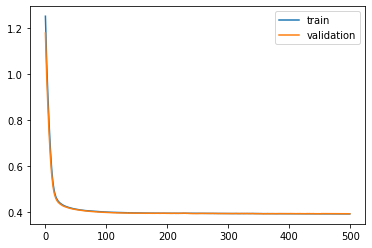

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 39s - loss: 1.2532 - val_loss: 1.1778

Epoch 00001: val_loss improved from inf to 1.17783, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.1458 - val_loss: 1.0823

Epoch 00002: val_loss improved from 1.17783 to 1.08234, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0561 - val_loss: 1.0019

Epoch 00003: val_loss improved from 1.08234 to 1.00190, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9792 - val_loss: 0.9311

Epoch 00004: val_loss improved from 1.00190 to 0.93106, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.9106 - val_loss: 0.8665

Epoch 00005: val_loss improved from 0.93106 to 0.86652, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8468 - val_loss: 0.8060

Epoch 00006: val_loss improved from 0.86652 to 0.80595, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7869 - val_loss: 0.7489

Epoch 00007: val_loss improved from 0.80595

 - 1s - loss: 0.4094 - val_loss: 0.4123

Epoch 00058: val_loss improved from 0.41255 to 0.41228, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4090 - val_loss: 0.4120

Epoch 00059: val_loss improved from 0.41228 to 0.41200, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4086 - val_loss: 0.4117

Epoch 00060: val_loss improved from 0.41200 to 0.41171, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4082 - val_loss: 0.4118

Epoch 00061: val_loss did not improve from 0.41171
Epoch 62/500
 - 1s - loss: 0.4079 - val_loss: 0.4114

Epoch 00062: val_loss improved from 0.41171 to 0.41140, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4075 - val_loss: 0.4112

Epoch 00063: val_loss improved from 0.41140 to 0.41117, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4072 - val_loss: 0.4111

Epoch 00064: val_loss improved from 0.41117 to 0.41107, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4068 - val_loss

 - 1s - loss: 0.3983 - val_loss: 0.4023

Epoch 00120: val_loss improved from 0.40259 to 0.40234, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.3981 - val_loss: 0.4025

Epoch 00121: val_loss did not improve from 0.40234
Epoch 122/500
 - 1s - loss: 0.3980 - val_loss: 0.4022

Epoch 00122: val_loss improved from 0.40234 to 0.40215, saving model to val_weights5.hdf5
Epoch 123/500
 - 1s - loss: 0.3979 - val_loss: 0.4022

Epoch 00123: val_loss did not improve from 0.40215
Epoch 124/500
 - 1s - loss: 0.3978 - val_loss: 0.4022

Epoch 00124: val_loss did not improve from 0.40215
Epoch 125/500
 - 1s - loss: 0.3978 - val_loss: 0.4024

Epoch 00125: val_loss did not improve from 0.40215
Epoch 126/500
 - 1s - loss: 0.3978 - val_loss: 0.4018

Epoch 00126: val_loss improved from 0.40215 to 0.40183, saving model to val_weights5.hdf5
Epoch 127/500
 - 1s - loss: 0.3976 - val_loss: 0.4019

Epoch 00127: val_loss did not improve from 0.40183
Epoch 128/500
 - 1s - loss: 0.3975 - val_loss: 0.

 - 1s - loss: 0.3950 - val_loss: 0.3987

Epoch 00190: val_loss improved from 0.39889 to 0.39871, saving model to val_weights5.hdf5
Epoch 191/500
 - 1s - loss: 0.3948 - val_loss: 0.3991

Epoch 00191: val_loss did not improve from 0.39871
Epoch 192/500
 - 1s - loss: 0.3949 - val_loss: 0.3994

Epoch 00192: val_loss did not improve from 0.39871
Epoch 193/500
 - 1s - loss: 0.3948 - val_loss: 0.3986

Epoch 00193: val_loss improved from 0.39871 to 0.39858, saving model to val_weights5.hdf5
Epoch 194/500
 - 1s - loss: 0.3948 - val_loss: 0.3990

Epoch 00194: val_loss did not improve from 0.39858
Epoch 195/500
 - 1s - loss: 0.3947 - val_loss: 0.3992

Epoch 00195: val_loss did not improve from 0.39858
Epoch 196/500
 - 1s - loss: 0.3947 - val_loss: 0.3988

Epoch 00196: val_loss did not improve from 0.39858
Epoch 197/500
 - 1s - loss: 0.3947 - val_loss: 0.3986

Epoch 00197: val_loss did not improve from 0.39858
Epoch 198/500
 - 1s - loss: 0.3947 - val_loss: 0.3989

Epoch 00198: val_loss did not imp

 - 1s - loss: 0.3937 - val_loss: 0.3978

Epoch 00263: val_loss did not improve from 0.39769
Epoch 264/500
 - 1s - loss: 0.3936 - val_loss: 0.3981

Epoch 00264: val_loss did not improve from 0.39769
Epoch 265/500
 - 1s - loss: 0.3936 - val_loss: 0.3980

Epoch 00265: val_loss did not improve from 0.39769
Epoch 266/500
 - 1s - loss: 0.3934 - val_loss: 0.3980

Epoch 00266: val_loss did not improve from 0.39769
Epoch 267/500
 - 1s - loss: 0.3935 - val_loss: 0.3980

Epoch 00267: val_loss did not improve from 0.39769
Epoch 268/500
 - 1s - loss: 0.3935 - val_loss: 0.3978

Epoch 00268: val_loss did not improve from 0.39769
Epoch 269/500
 - 1s - loss: 0.3934 - val_loss: 0.3979

Epoch 00269: val_loss did not improve from 0.39769
Epoch 270/500
 - 1s - loss: 0.3935 - val_loss: 0.3979

Epoch 00270: val_loss did not improve from 0.39769
Epoch 271/500
 - 1s - loss: 0.3935 - val_loss: 0.3979

Epoch 00271: val_loss did not improve from 0.39769
Epoch 272/500
 - 1s - loss: 0.3935 - val_loss: 0.3980

Epoch


Epoch 00338: val_loss did not improve from 0.39733
Epoch 339/500
 - 1s - loss: 0.3927 - val_loss: 0.3976

Epoch 00339: val_loss did not improve from 0.39733
Epoch 340/500
 - 1s - loss: 0.3929 - val_loss: 0.3977

Epoch 00340: val_loss did not improve from 0.39733
Epoch 341/500
 - 1s - loss: 0.3928 - val_loss: 0.3973

Epoch 00341: val_loss improved from 0.39733 to 0.39726, saving model to val_weights5.hdf5
Epoch 342/500
 - 1s - loss: 0.3927 - val_loss: 0.3975

Epoch 00342: val_loss did not improve from 0.39726
Epoch 343/500
 - 1s - loss: 0.3928 - val_loss: 0.3976

Epoch 00343: val_loss did not improve from 0.39726
Epoch 344/500
 - 1s - loss: 0.3927 - val_loss: 0.3976

Epoch 00344: val_loss did not improve from 0.39726
Epoch 345/500
 - 1s - loss: 0.3928 - val_loss: 0.3975

Epoch 00345: val_loss did not improve from 0.39726
Epoch 346/500
 - 1s - loss: 0.3927 - val_loss: 0.3977

Epoch 00346: val_loss did not improve from 0.39726
Epoch 347/500
 - 1s - loss: 0.3928 - val_loss: 0.3977

Epoch 

 - 1s - loss: 0.3923 - val_loss: 0.3972

Epoch 00415: val_loss did not improve from 0.39721
Epoch 416/500
 - 1s - loss: 0.3922 - val_loss: 0.3973

Epoch 00416: val_loss did not improve from 0.39721
Epoch 417/500
 - 1s - loss: 0.3922 - val_loss: 0.3975

Epoch 00417: val_loss did not improve from 0.39721
Epoch 418/500
 - 1s - loss: 0.3921 - val_loss: 0.3976

Epoch 00418: val_loss did not improve from 0.39721
Epoch 419/500
 - 1s - loss: 0.3921 - val_loss: 0.3977

Epoch 00419: val_loss did not improve from 0.39721
Epoch 420/500
 - 1s - loss: 0.3922 - val_loss: 0.3972

Epoch 00420: val_loss did not improve from 0.39721
Epoch 421/500
 - 1s - loss: 0.3922 - val_loss: 0.3971

Epoch 00421: val_loss improved from 0.39721 to 0.39714, saving model to val_weights5.hdf5
Epoch 422/500
 - 1s - loss: 0.3921 - val_loss: 0.3974

Epoch 00422: val_loss did not improve from 0.39714
Epoch 423/500
 - 1s - loss: 0.3921 - val_loss: 0.3976

Epoch 00423: val_loss did not improve from 0.39714
Epoch 424/500
 - 1s -


Epoch 00491: val_loss did not improve from 0.39711
Epoch 492/500
 - 1s - loss: 0.3918 - val_loss: 0.3977

Epoch 00492: val_loss did not improve from 0.39711
Epoch 493/500
 - 1s - loss: 0.3920 - val_loss: 0.3977

Epoch 00493: val_loss did not improve from 0.39711
Epoch 494/500
 - 1s - loss: 0.3918 - val_loss: 0.3973

Epoch 00494: val_loss did not improve from 0.39711
Epoch 495/500
 - 1s - loss: 0.3917 - val_loss: 0.3972

Epoch 00495: val_loss did not improve from 0.39711
Epoch 496/500
 - 1s - loss: 0.3918 - val_loss: 0.3979

Epoch 00496: val_loss did not improve from 0.39711
Epoch 497/500
 - 1s - loss: 0.3919 - val_loss: 0.3975

Epoch 00497: val_loss did not improve from 0.39711
Epoch 498/500
 - 1s - loss: 0.3918 - val_loss: 0.3972

Epoch 00498: val_loss did not improve from 0.39711
Epoch 499/500
 - 1s - loss: 0.3917 - val_loss: 0.3975

Epoch 00499: val_loss did not improve from 0.39711
Epoch 500/500
 - 1s - loss: 0.3918 - val_loss: 0.3976

Epoch 00500: val_loss did not improve from 0.

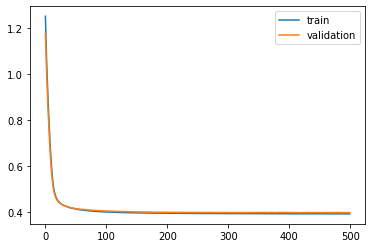

Time to train LSTM:  413.44121956825256
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 37s - loss: 1.2827 - val_loss: 1.2193

Epoch 00001: val_loss improved from inf to 1.21930, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.1708 - val_loss: 1.1171

Epoch 00002: val_loss improved from 1.21930 to 1.11711, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.0770 - val_loss: 1.0310

Epoch 00003: val_loss improved from 1.11711 to 1.03096, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9966 - val_loss: 0.9559

Epoch 00004: val_loss improved from 1.03096 to 0.95591, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.9249 - val_loss: 0.8876

Epoch 00005: val_loss improved from 0.95591 to 0.88757, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8585 - val_loss: 0.8241

Epoch 00006: val_loss improved from 0.88757 to 0.82414, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7959 - val_loss: 0.7644

Epo


Epoch 00057: val_loss improved from 0.41609 to 0.41565, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4093 - val_loss: 0.4154

Epoch 00058: val_loss improved from 0.41565 to 0.41539, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4088 - val_loss: 0.4148

Epoch 00059: val_loss improved from 0.41539 to 0.41476, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4085 - val_loss: 0.4147

Epoch 00060: val_loss improved from 0.41476 to 0.41468, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4081 - val_loss: 0.4141

Epoch 00061: val_loss improved from 0.41468 to 0.41410, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4079 - val_loss: 0.4135

Epoch 00062: val_loss improved from 0.41410 to 0.41353, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4075 - val_loss: 0.4133

Epoch 00063: val_loss improved from 0.41353 to 0.41333, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4072 - val_loss:

 - 1s - loss: 0.3980 - val_loss: 0.4022

Epoch 00119: val_loss improved from 0.40274 to 0.40222, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.3981 - val_loss: 0.4028

Epoch 00120: val_loss did not improve from 0.40222
Epoch 121/500
 - 1s - loss: 0.3980 - val_loss: 0.4025

Epoch 00121: val_loss did not improve from 0.40222
Epoch 122/500
 - 1s - loss: 0.3979 - val_loss: 0.4027

Epoch 00122: val_loss did not improve from 0.40222
Epoch 123/500
 - 1s - loss: 0.3979 - val_loss: 0.4025

Epoch 00123: val_loss did not improve from 0.40222
Epoch 124/500
 - 1s - loss: 0.3978 - val_loss: 0.4026

Epoch 00124: val_loss did not improve from 0.40222
Epoch 125/500
 - 1s - loss: 0.3976 - val_loss: 0.4021

Epoch 00125: val_loss improved from 0.40222 to 0.40214, saving model to val_weights1.hdf5
Epoch 126/500
 - 1s - loss: 0.3976 - val_loss: 0.4022

Epoch 00126: val_loss did not improve from 0.40214
Epoch 127/500
 - 1s - loss: 0.3975 - val_loss: 0.4019

Epoch 00127: val_loss improved fr


Epoch 00187: val_loss did not improve from 0.39915
Epoch 188/500
 - 1s - loss: 0.3951 - val_loss: 0.3995

Epoch 00188: val_loss did not improve from 0.39915
Epoch 189/500
 - 1s - loss: 0.3949 - val_loss: 0.3992

Epoch 00189: val_loss did not improve from 0.39915
Epoch 190/500
 - 1s - loss: 0.3950 - val_loss: 0.3997

Epoch 00190: val_loss did not improve from 0.39915
Epoch 191/500
 - 1s - loss: 0.3950 - val_loss: 0.3991

Epoch 00191: val_loss improved from 0.39915 to 0.39908, saving model to val_weights1.hdf5
Epoch 192/500
 - 1s - loss: 0.3949 - val_loss: 0.3994

Epoch 00192: val_loss did not improve from 0.39908
Epoch 193/500
 - 1s - loss: 0.3950 - val_loss: 0.3993

Epoch 00193: val_loss did not improve from 0.39908
Epoch 194/500
 - 1s - loss: 0.3950 - val_loss: 0.3990

Epoch 00194: val_loss improved from 0.39908 to 0.39899, saving model to val_weights1.hdf5
Epoch 195/500
 - 1s - loss: 0.3948 - val_loss: 0.3993

Epoch 00195: val_loss did not improve from 0.39899
Epoch 196/500
 - 1s - 


Epoch 00260: val_loss did not improve from 0.39823
Epoch 261/500
 - 1s - loss: 0.3937 - val_loss: 0.3986

Epoch 00261: val_loss did not improve from 0.39823
Epoch 262/500
 - 1s - loss: 0.3938 - val_loss: 0.3988

Epoch 00262: val_loss did not improve from 0.39823
Epoch 263/500
 - 1s - loss: 0.3939 - val_loss: 0.3986

Epoch 00263: val_loss did not improve from 0.39823
Epoch 264/500
 - 1s - loss: 0.3938 - val_loss: 0.3986

Epoch 00264: val_loss did not improve from 0.39823
Epoch 265/500
 - 1s - loss: 0.3939 - val_loss: 0.3984

Epoch 00265: val_loss did not improve from 0.39823
Epoch 266/500
 - 1s - loss: 0.3937 - val_loss: 0.3987

Epoch 00266: val_loss did not improve from 0.39823
Epoch 267/500
 - 1s - loss: 0.3938 - val_loss: 0.3984

Epoch 00267: val_loss did not improve from 0.39823
Epoch 268/500
 - 1s - loss: 0.3937 - val_loss: 0.3984

Epoch 00268: val_loss did not improve from 0.39823
Epoch 269/500
 - 1s - loss: 0.3937 - val_loss: 0.3989

Epoch 00269: val_loss did not improve from 0.

 - 1s - loss: 0.3934 - val_loss: 0.3980

Epoch 00336: val_loss did not improve from 0.39772
Epoch 337/500
 - 1s - loss: 0.3932 - val_loss: 0.3978

Epoch 00337: val_loss did not improve from 0.39772
Epoch 338/500
 - 1s - loss: 0.3932 - val_loss: 0.3980

Epoch 00338: val_loss did not improve from 0.39772
Epoch 339/500
 - 1s - loss: 0.3932 - val_loss: 0.3981

Epoch 00339: val_loss did not improve from 0.39772
Epoch 340/500
 - 1s - loss: 0.3932 - val_loss: 0.3979

Epoch 00340: val_loss did not improve from 0.39772
Epoch 341/500
 - 1s - loss: 0.3932 - val_loss: 0.3979

Epoch 00341: val_loss did not improve from 0.39772
Epoch 342/500
 - 1s - loss: 0.3932 - val_loss: 0.3983

Epoch 00342: val_loss did not improve from 0.39772
Epoch 343/500
 - 1s - loss: 0.3932 - val_loss: 0.3980

Epoch 00343: val_loss did not improve from 0.39772
Epoch 344/500
 - 1s - loss: 0.3931 - val_loss: 0.3977

Epoch 00344: val_loss improved from 0.39772 to 0.39766, saving model to val_weights1.hdf5
Epoch 345/500
 - 1s -


Epoch 00412: val_loss did not improve from 0.39731
Epoch 413/500
 - 1s - loss: 0.3928 - val_loss: 0.3976

Epoch 00413: val_loss did not improve from 0.39731
Epoch 414/500
 - 1s - loss: 0.3927 - val_loss: 0.3976

Epoch 00414: val_loss did not improve from 0.39731
Epoch 415/500
 - 1s - loss: 0.3926 - val_loss: 0.3976

Epoch 00415: val_loss did not improve from 0.39731
Epoch 416/500
 - 1s - loss: 0.3928 - val_loss: 0.3978

Epoch 00416: val_loss did not improve from 0.39731
Epoch 417/500
 - 1s - loss: 0.3926 - val_loss: 0.3973

Epoch 00417: val_loss did not improve from 0.39731
Epoch 418/500
 - 1s - loss: 0.3926 - val_loss: 0.3976

Epoch 00418: val_loss did not improve from 0.39731
Epoch 419/500
 - 1s - loss: 0.3926 - val_loss: 0.3975

Epoch 00419: val_loss did not improve from 0.39731
Epoch 420/500
 - 1s - loss: 0.3925 - val_loss: 0.3973

Epoch 00420: val_loss improved from 0.39731 to 0.39730, saving model to val_weights1.hdf5
Epoch 421/500
 - 1s - loss: 0.3927 - val_loss: 0.3975

Epoch 

 - 1s - loss: 0.3922 - val_loss: 0.3976

Epoch 00489: val_loss did not improve from 0.39717
Epoch 490/500
 - 1s - loss: 0.3921 - val_loss: 0.3971

Epoch 00490: val_loss improved from 0.39717 to 0.39713, saving model to val_weights1.hdf5
Epoch 491/500
 - 1s - loss: 0.3920 - val_loss: 0.3974

Epoch 00491: val_loss did not improve from 0.39713
Epoch 492/500
 - 1s - loss: 0.3919 - val_loss: 0.3971

Epoch 00492: val_loss improved from 0.39713 to 0.39712, saving model to val_weights1.hdf5
Epoch 493/500
 - 1s - loss: 0.3917 - val_loss: 0.3974

Epoch 00493: val_loss did not improve from 0.39712
Epoch 494/500
 - 1s - loss: 0.3921 - val_loss: 0.3974

Epoch 00494: val_loss did not improve from 0.39712
Epoch 495/500
 - 1s - loss: 0.3919 - val_loss: 0.3977

Epoch 00495: val_loss did not improve from 0.39712
Epoch 496/500
 - 1s - loss: 0.3922 - val_loss: 0.3973

Epoch 00496: val_loss did not improve from 0.39712
Epoch 497/500
 - 1s - loss: 0.3920 - val_loss: 0.3977

Epoch 00497: val_loss did not imp

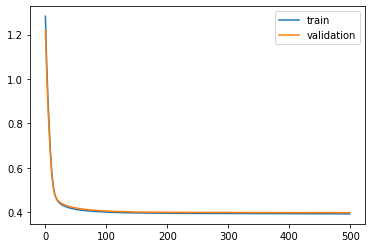

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 37s - loss: 1.2834 - val_loss: 1.2146

Epoch 00001: val_loss improved from inf to 1.21465, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.1713 - val_loss: 1.1154

Epoch 00002: val_loss improved from 1.21465 to 1.11538, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.0772 - val_loss: 1.0307

Epoch 00003: val_loss improved from 1.11538 to 1.03072, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9968 - val_loss: 0.9562

Epoch 00004: val_loss improved from 1.03072 to 0.95616, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.9250 - val_loss: 0.8873

Epoch 00005: val_loss improved from 0.95616 to 0.88726, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8587 - val_loss: 0.8222

Epoch 00006: val_loss improved from 0.88726 to 0.82218, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7963 - val_loss: 0.7615

Epoch 00007: val_loss improved from 0.82218

 - 1s - loss: 0.4097 - val_loss: 0.4062

Epoch 00058: val_loss improved from 0.40649 to 0.40625, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4094 - val_loss: 0.4062

Epoch 00059: val_loss improved from 0.40625 to 0.40621, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4090 - val_loss: 0.4059

Epoch 00060: val_loss improved from 0.40621 to 0.40587, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4087 - val_loss: 0.4056

Epoch 00061: val_loss improved from 0.40587 to 0.40562, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4083 - val_loss: 0.4051

Epoch 00062: val_loss improved from 0.40562 to 0.40513, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4080 - val_loss: 0.4050

Epoch 00063: val_loss improved from 0.40513 to 0.40502, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4078 - val_loss: 0.4047

Epoch 00064: val_loss improved from 0.40502 to 0.40471, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3983 - val_loss: 0.3968

Epoch 00121: val_loss improved from 0.39709 to 0.39680, saving model to val_weights2.hdf5
Epoch 122/500
 - 1s - loss: 0.3982 - val_loss: 0.3971

Epoch 00122: val_loss did not improve from 0.39680
Epoch 123/500
 - 1s - loss: 0.3983 - val_loss: 0.3968

Epoch 00123: val_loss improved from 0.39680 to 0.39678, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3982 - val_loss: 0.3968

Epoch 00124: val_loss improved from 0.39678 to 0.39676, saving model to val_weights2.hdf5
Epoch 125/500
 - 1s - loss: 0.3980 - val_loss: 0.3968

Epoch 00125: val_loss did not improve from 0.39676
Epoch 126/500
 - 1s - loss: 0.3980 - val_loss: 0.3970

Epoch 00126: val_loss did not improve from 0.39676
Epoch 127/500
 - 1s - loss: 0.3979 - val_loss: 0.3968

Epoch 00127: val_loss did not improve from 0.39676
Epoch 128/500
 - 1s - loss: 0.3979 - val_loss: 0.3967

Epoch 00128: val_loss improved from 0.39676 to 0.39668, saving model to val_weights2.hdf5
Epoch 129/


Epoch 00189: val_loss did not improve from 0.39423
Epoch 190/500
 - 1s - loss: 0.3955 - val_loss: 0.3943

Epoch 00190: val_loss did not improve from 0.39423
Epoch 191/500
 - 1s - loss: 0.3955 - val_loss: 0.3943

Epoch 00191: val_loss did not improve from 0.39423
Epoch 192/500
 - 1s - loss: 0.3955 - val_loss: 0.3942

Epoch 00192: val_loss improved from 0.39423 to 0.39417, saving model to val_weights2.hdf5
Epoch 193/500
 - 1s - loss: 0.3954 - val_loss: 0.3942

Epoch 00193: val_loss did not improve from 0.39417
Epoch 194/500
 - 1s - loss: 0.3952 - val_loss: 0.3944

Epoch 00194: val_loss did not improve from 0.39417
Epoch 195/500
 - 1s - loss: 0.3954 - val_loss: 0.3944

Epoch 00195: val_loss did not improve from 0.39417
Epoch 196/500
 - 1s - loss: 0.3954 - val_loss: 0.3941

Epoch 00196: val_loss improved from 0.39417 to 0.39407, saving model to val_weights2.hdf5
Epoch 197/500
 - 1s - loss: 0.3953 - val_loss: 0.3943

Epoch 00197: val_loss did not improve from 0.39407
Epoch 198/500
 - 1s - 


Epoch 00262: val_loss did not improve from 0.39309
Epoch 263/500
 - 1s - loss: 0.3943 - val_loss: 0.3936

Epoch 00263: val_loss did not improve from 0.39309
Epoch 264/500
 - 1s - loss: 0.3942 - val_loss: 0.3935

Epoch 00264: val_loss did not improve from 0.39309
Epoch 265/500
 - 1s - loss: 0.3942 - val_loss: 0.3934

Epoch 00265: val_loss did not improve from 0.39309
Epoch 266/500
 - 1s - loss: 0.3942 - val_loss: 0.3935

Epoch 00266: val_loss did not improve from 0.39309
Epoch 267/500
 - 1s - loss: 0.3941 - val_loss: 0.3931

Epoch 00267: val_loss improved from 0.39309 to 0.39308, saving model to val_weights2.hdf5
Epoch 268/500
 - 1s - loss: 0.3941 - val_loss: 0.3934

Epoch 00268: val_loss did not improve from 0.39308
Epoch 269/500
 - 1s - loss: 0.3941 - val_loss: 0.3935

Epoch 00269: val_loss did not improve from 0.39308
Epoch 270/500
 - 1s - loss: 0.3941 - val_loss: 0.3934

Epoch 00270: val_loss did not improve from 0.39308
Epoch 271/500
 - 1s - loss: 0.3942 - val_loss: 0.3935

Epoch 


Epoch 00338: val_loss did not improve from 0.39278
Epoch 339/500
 - 1s - loss: 0.3935 - val_loss: 0.3934

Epoch 00339: val_loss did not improve from 0.39278
Epoch 340/500
 - 1s - loss: 0.3936 - val_loss: 0.3928

Epoch 00340: val_loss improved from 0.39278 to 0.39277, saving model to val_weights2.hdf5
Epoch 341/500
 - 1s - loss: 0.3935 - val_loss: 0.3934

Epoch 00341: val_loss did not improve from 0.39277
Epoch 342/500
 - 1s - loss: 0.3935 - val_loss: 0.3928

Epoch 00342: val_loss did not improve from 0.39277
Epoch 343/500
 - 1s - loss: 0.3934 - val_loss: 0.3932

Epoch 00343: val_loss did not improve from 0.39277
Epoch 344/500
 - 1s - loss: 0.3934 - val_loss: 0.3927

Epoch 00344: val_loss improved from 0.39277 to 0.39271, saving model to val_weights2.hdf5
Epoch 345/500
 - 1s - loss: 0.3934 - val_loss: 0.3929

Epoch 00345: val_loss did not improve from 0.39271
Epoch 346/500
 - 1s - loss: 0.3933 - val_loss: 0.3929

Epoch 00346: val_loss did not improve from 0.39271
Epoch 347/500
 - 1s - 

 - 1s - loss: 0.3931 - val_loss: 0.3928

Epoch 00414: val_loss did not improve from 0.39247
Epoch 415/500
 - 1s - loss: 0.3930 - val_loss: 0.3929

Epoch 00415: val_loss did not improve from 0.39247
Epoch 416/500
 - 1s - loss: 0.3930 - val_loss: 0.3926

Epoch 00416: val_loss did not improve from 0.39247
Epoch 417/500
 - 1s - loss: 0.3931 - val_loss: 0.3927

Epoch 00417: val_loss did not improve from 0.39247
Epoch 418/500
 - 1s - loss: 0.3930 - val_loss: 0.3926

Epoch 00418: val_loss did not improve from 0.39247
Epoch 419/500
 - 1s - loss: 0.3930 - val_loss: 0.3930

Epoch 00419: val_loss did not improve from 0.39247
Epoch 420/500
 - 1s - loss: 0.3930 - val_loss: 0.3923

Epoch 00420: val_loss improved from 0.39247 to 0.39227, saving model to val_weights2.hdf5
Epoch 421/500
 - 1s - loss: 0.3931 - val_loss: 0.3929

Epoch 00421: val_loss did not improve from 0.39227
Epoch 422/500
 - 1s - loss: 0.3928 - val_loss: 0.3926

Epoch 00422: val_loss did not improve from 0.39227
Epoch 423/500
 - 1s -

 - 1s - loss: 0.3925 - val_loss: 0.3926

Epoch 00490: val_loss did not improve from 0.39212
Epoch 491/500
 - 1s - loss: 0.3926 - val_loss: 0.3924

Epoch 00491: val_loss did not improve from 0.39212
Epoch 492/500
 - 1s - loss: 0.3925 - val_loss: 0.3924

Epoch 00492: val_loss did not improve from 0.39212
Epoch 493/500
 - 1s - loss: 0.3924 - val_loss: 0.3926

Epoch 00493: val_loss did not improve from 0.39212
Epoch 494/500
 - 1s - loss: 0.3924 - val_loss: 0.3926

Epoch 00494: val_loss did not improve from 0.39212
Epoch 495/500
 - 1s - loss: 0.3925 - val_loss: 0.3923

Epoch 00495: val_loss did not improve from 0.39212
Epoch 496/500
 - 1s - loss: 0.3925 - val_loss: 0.3927

Epoch 00496: val_loss did not improve from 0.39212
Epoch 497/500
 - 1s - loss: 0.3925 - val_loss: 0.3925

Epoch 00497: val_loss did not improve from 0.39212
Epoch 498/500
 - 1s - loss: 0.3926 - val_loss: 0.3927

Epoch 00498: val_loss did not improve from 0.39212
Epoch 499/500
 - 1s - loss: 0.3926 - val_loss: 0.3922

Epoch

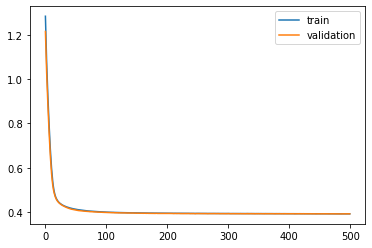

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 39s - loss: 1.2848 - val_loss: 1.2026

Epoch 00001: val_loss improved from inf to 1.20259, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.1730 - val_loss: 1.1017

Epoch 00002: val_loss improved from 1.20259 to 1.10167, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.0791 - val_loss: 1.0164

Epoch 00003: val_loss improved from 1.10167 to 1.01638, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9986 - val_loss: 0.9424

Epoch 00004: val_loss improved from 1.01638 to 0.94245, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.9266 - val_loss: 0.8750

Epoch 00005: val_loss improved from 0.94245 to 0.87500, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8600 - val_loss: 0.8122

Epoch 00006: val_loss improved from 0.87500 to 0.81221, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7974 - val_loss: 0.7543

Epoch 00007: val_loss improved from 0.81221

 - 1s - loss: 0.4092 - val_loss: 0.4158

Epoch 00058: val_loss improved from 0.41635 to 0.41582, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4088 - val_loss: 0.4155

Epoch 00059: val_loss improved from 0.41582 to 0.41554, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4084 - val_loss: 0.4153

Epoch 00060: val_loss improved from 0.41554 to 0.41531, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4081 - val_loss: 0.4149

Epoch 00061: val_loss improved from 0.41531 to 0.41494, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4077 - val_loss: 0.4147

Epoch 00062: val_loss improved from 0.41494 to 0.41473, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4074 - val_loss: 0.4142

Epoch 00063: val_loss improved from 0.41473 to 0.41423, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4071 - val_loss: 0.4144

Epoch 00064: val_loss did not improve from 0.41423
Epoch 65/500
 - 1s - loss: 0.4069 - val_loss

 - 1s - loss: 0.3975 - val_loss: 0.4064

Epoch 00123: val_loss improved from 0.40667 to 0.40643, saving model to val_weights3.hdf5
Epoch 124/500
 - 1s - loss: 0.3976 - val_loss: 0.4068

Epoch 00124: val_loss did not improve from 0.40643
Epoch 125/500
 - 1s - loss: 0.3973 - val_loss: 0.4061

Epoch 00125: val_loss improved from 0.40643 to 0.40606, saving model to val_weights3.hdf5
Epoch 126/500
 - 1s - loss: 0.3971 - val_loss: 0.4063

Epoch 00126: val_loss did not improve from 0.40606
Epoch 127/500
 - 1s - loss: 0.3971 - val_loss: 0.4063

Epoch 00127: val_loss did not improve from 0.40606
Epoch 128/500
 - 1s - loss: 0.3971 - val_loss: 0.4064

Epoch 00128: val_loss did not improve from 0.40606
Epoch 129/500
 - 1s - loss: 0.3971 - val_loss: 0.4065

Epoch 00129: val_loss did not improve from 0.40606
Epoch 130/500
 - 1s - loss: 0.3971 - val_loss: 0.4061

Epoch 00130: val_loss did not improve from 0.40606
Epoch 131/500
 - 1s - loss: 0.3969 - val_loss: 0.4064

Epoch 00131: val_loss did not imp

 - 1s - loss: 0.3946 - val_loss: 0.4042

Epoch 00193: val_loss did not improve from 0.40400
Epoch 194/500
 - 1s - loss: 0.3946 - val_loss: 0.4042

Epoch 00194: val_loss did not improve from 0.40400
Epoch 195/500
 - 1s - loss: 0.3944 - val_loss: 0.4044

Epoch 00195: val_loss did not improve from 0.40400
Epoch 196/500
 - 1s - loss: 0.3944 - val_loss: 0.4041

Epoch 00196: val_loss did not improve from 0.40400
Epoch 197/500
 - 1s - loss: 0.3944 - val_loss: 0.4042

Epoch 00197: val_loss did not improve from 0.40400
Epoch 198/500
 - 1s - loss: 0.3944 - val_loss: 0.4039

Epoch 00198: val_loss improved from 0.40400 to 0.40395, saving model to val_weights3.hdf5
Epoch 199/500
 - 1s - loss: 0.3944 - val_loss: 0.4042

Epoch 00199: val_loss did not improve from 0.40395
Epoch 200/500
 - 1s - loss: 0.3945 - val_loss: 0.4042

Epoch 00200: val_loss did not improve from 0.40395
Epoch 201/500
 - 1s - loss: 0.3943 - val_loss: 0.4042

Epoch 00201: val_loss did not improve from 0.40395
Epoch 202/500
 - 1s -


Epoch 00266: val_loss did not improve from 0.40304
Epoch 267/500
 - 1s - loss: 0.3934 - val_loss: 0.4032

Epoch 00267: val_loss did not improve from 0.40304
Epoch 268/500
 - 1s - loss: 0.3933 - val_loss: 0.4035

Epoch 00268: val_loss did not improve from 0.40304
Epoch 269/500
 - 1s - loss: 0.3934 - val_loss: 0.4034

Epoch 00269: val_loss did not improve from 0.40304
Epoch 270/500
 - 1s - loss: 0.3934 - val_loss: 0.4030

Epoch 00270: val_loss improved from 0.40304 to 0.40300, saving model to val_weights3.hdf5
Epoch 271/500
 - 1s - loss: 0.3933 - val_loss: 0.4030

Epoch 00271: val_loss improved from 0.40300 to 0.40299, saving model to val_weights3.hdf5
Epoch 272/500
 - 1s - loss: 0.3933 - val_loss: 0.4033

Epoch 00272: val_loss did not improve from 0.40299
Epoch 273/500
 - 1s - loss: 0.3932 - val_loss: 0.4030

Epoch 00273: val_loss did not improve from 0.40299
Epoch 274/500
 - 1s - loss: 0.3933 - val_loss: 0.4032

Epoch 00274: val_loss did not improve from 0.40299
Epoch 275/500
 - 1s - 

 - 1s - loss: 0.3927 - val_loss: 0.4023

Epoch 00340: val_loss did not improve from 0.40208
Epoch 341/500
 - 1s - loss: 0.3926 - val_loss: 0.4025

Epoch 00341: val_loss did not improve from 0.40208
Epoch 342/500
 - 1s - loss: 0.3926 - val_loss: 0.4026

Epoch 00342: val_loss did not improve from 0.40208
Epoch 343/500
 - 1s - loss: 0.3926 - val_loss: 0.4023

Epoch 00343: val_loss did not improve from 0.40208
Epoch 344/500
 - 1s - loss: 0.3926 - val_loss: 0.4025

Epoch 00344: val_loss did not improve from 0.40208
Epoch 345/500
 - 1s - loss: 0.3926 - val_loss: 0.4028

Epoch 00345: val_loss did not improve from 0.40208
Epoch 346/500
 - 1s - loss: 0.3926 - val_loss: 0.4023

Epoch 00346: val_loss did not improve from 0.40208
Epoch 347/500
 - 1s - loss: 0.3926 - val_loss: 0.4023

Epoch 00347: val_loss did not improve from 0.40208
Epoch 348/500
 - 1s - loss: 0.3927 - val_loss: 0.4027

Epoch 00348: val_loss did not improve from 0.40208
Epoch 349/500
 - 1s - loss: 0.3928 - val_loss: 0.4027

Epoch


Epoch 00415: val_loss did not improve from 0.40140
Epoch 416/500
 - 1s - loss: 0.3922 - val_loss: 0.4017

Epoch 00416: val_loss did not improve from 0.40140
Epoch 417/500
 - 1s - loss: 0.3923 - val_loss: 0.4019

Epoch 00417: val_loss did not improve from 0.40140
Epoch 418/500
 - 1s - loss: 0.3922 - val_loss: 0.4016

Epoch 00418: val_loss did not improve from 0.40140
Epoch 419/500
 - 1s - loss: 0.3923 - val_loss: 0.4013

Epoch 00419: val_loss improved from 0.40140 to 0.40133, saving model to val_weights3.hdf5
Epoch 420/500
 - 1s - loss: 0.3922 - val_loss: 0.4017

Epoch 00420: val_loss did not improve from 0.40133
Epoch 421/500
 - 1s - loss: 0.3921 - val_loss: 0.4016

Epoch 00421: val_loss did not improve from 0.40133
Epoch 422/500
 - 1s - loss: 0.3921 - val_loss: 0.4017

Epoch 00422: val_loss did not improve from 0.40133
Epoch 423/500
 - 1s - loss: 0.3921 - val_loss: 0.4018

Epoch 00423: val_loss did not improve from 0.40133
Epoch 424/500
 - 1s - loss: 0.3921 - val_loss: 0.4016

Epoch 

 - 1s - loss: 0.3917 - val_loss: 0.4016

Epoch 00492: val_loss did not improve from 0.40126
Epoch 493/500
 - 1s - loss: 0.3917 - val_loss: 0.4014

Epoch 00493: val_loss did not improve from 0.40126
Epoch 494/500
 - 1s - loss: 0.3917 - val_loss: 0.4021

Epoch 00494: val_loss did not improve from 0.40126
Epoch 495/500
 - 1s - loss: 0.3918 - val_loss: 0.4015

Epoch 00495: val_loss did not improve from 0.40126
Epoch 496/500
 - 1s - loss: 0.3917 - val_loss: 0.4015

Epoch 00496: val_loss did not improve from 0.40126
Epoch 497/500
 - 1s - loss: 0.3917 - val_loss: 0.4017

Epoch 00497: val_loss did not improve from 0.40126
Epoch 498/500
 - 1s - loss: 0.3916 - val_loss: 0.4016

Epoch 00498: val_loss did not improve from 0.40126
Epoch 499/500
 - 1s - loss: 0.3916 - val_loss: 0.4016

Epoch 00499: val_loss did not improve from 0.40126
Epoch 500/500
 - 1s - loss: 0.3916 - val_loss: 0.4014

Epoch 00500: val_loss did not improve from 0.40126
#################################
Number of units: 4
Batch s

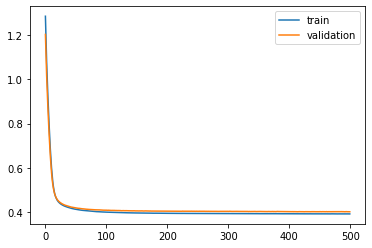

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 38s - loss: 1.2840 - val_loss: 1.2083

Epoch 00001: val_loss improved from inf to 1.20832, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.1723 - val_loss: 1.1069

Epoch 00002: val_loss improved from 1.20832 to 1.10688, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.0785 - val_loss: 1.0215

Epoch 00003: val_loss improved from 1.10688 to 1.02155, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9980 - val_loss: 0.9468

Epoch 00004: val_loss improved from 1.02155 to 0.94680, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.9261 - val_loss: 0.8784

Epoch 00005: val_loss improved from 0.94680 to 0.87837, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8596 - val_loss: 0.8141

Epoch 00006: val_loss improved from 0.87837 to 0.81413, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7973 - val_loss: 0.7540

Epoch 00007: val_loss improved from 0.81413

 - 1s - loss: 0.4100 - val_loss: 0.4085

Epoch 00058: val_loss improved from 0.40913 to 0.40849, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4096 - val_loss: 0.4083

Epoch 00059: val_loss improved from 0.40849 to 0.40828, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4093 - val_loss: 0.4078

Epoch 00060: val_loss improved from 0.40828 to 0.40785, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4089 - val_loss: 0.4076

Epoch 00061: val_loss improved from 0.40785 to 0.40757, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4086 - val_loss: 0.4074

Epoch 00062: val_loss improved from 0.40757 to 0.40736, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4082 - val_loss: 0.4067

Epoch 00063: val_loss improved from 0.40736 to 0.40671, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4079 - val_loss: 0.4065

Epoch 00064: val_loss improved from 0.40671 to 0.40654, saving model to val_weights4.hdf5
Epoch


Epoch 00120: val_loss improved from 0.39687 to 0.39679, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.3986 - val_loss: 0.3972

Epoch 00121: val_loss did not improve from 0.39679
Epoch 122/500
 - 1s - loss: 0.3985 - val_loss: 0.3968

Epoch 00122: val_loss improved from 0.39679 to 0.39676, saving model to val_weights4.hdf5
Epoch 123/500
 - 1s - loss: 0.3983 - val_loss: 0.3966

Epoch 00123: val_loss improved from 0.39676 to 0.39663, saving model to val_weights4.hdf5
Epoch 124/500
 - 1s - loss: 0.3982 - val_loss: 0.3965

Epoch 00124: val_loss improved from 0.39663 to 0.39647, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3982 - val_loss: 0.3964

Epoch 00125: val_loss improved from 0.39647 to 0.39637, saving model to val_weights4.hdf5
Epoch 126/500
 - 1s - loss: 0.3981 - val_loss: 0.3966

Epoch 00126: val_loss did not improve from 0.39637
Epoch 127/500
 - 1s - loss: 0.3980 - val_loss: 0.3967

Epoch 00127: val_loss did not improve from 0.39637
Epoch 128/5

 - 1s - loss: 0.3956 - val_loss: 0.3951

Epoch 00192: val_loss did not improve from 0.39486
Epoch 193/500
 - 1s - loss: 0.3955 - val_loss: 0.3952

Epoch 00193: val_loss did not improve from 0.39486
Epoch 194/500
 - 1s - loss: 0.3956 - val_loss: 0.3952

Epoch 00194: val_loss did not improve from 0.39486
Epoch 195/500
 - 1s - loss: 0.3956 - val_loss: 0.3950

Epoch 00195: val_loss did not improve from 0.39486
Epoch 196/500
 - 1s - loss: 0.3955 - val_loss: 0.3949

Epoch 00196: val_loss did not improve from 0.39486
Epoch 197/500
 - 1s - loss: 0.3954 - val_loss: 0.3953

Epoch 00197: val_loss did not improve from 0.39486
Epoch 198/500
 - 1s - loss: 0.3954 - val_loss: 0.3952

Epoch 00198: val_loss did not improve from 0.39486
Epoch 199/500
 - 1s - loss: 0.3955 - val_loss: 0.3950

Epoch 00199: val_loss did not improve from 0.39486
Epoch 200/500
 - 1s - loss: 0.3955 - val_loss: 0.3950

Epoch 00200: val_loss did not improve from 0.39486
Epoch 201/500
 - 1s - loss: 0.3955 - val_loss: 0.3950

Epoch


Epoch 00266: val_loss did not improve from 0.39396
Epoch 267/500
 - 1s - loss: 0.3944 - val_loss: 0.3943

Epoch 00267: val_loss did not improve from 0.39396
Epoch 268/500
 - 1s - loss: 0.3944 - val_loss: 0.3942

Epoch 00268: val_loss did not improve from 0.39396
Epoch 269/500
 - 1s - loss: 0.3944 - val_loss: 0.3941

Epoch 00269: val_loss did not improve from 0.39396
Epoch 270/500
 - 1s - loss: 0.3943 - val_loss: 0.3942

Epoch 00270: val_loss did not improve from 0.39396
Epoch 271/500
 - 1s - loss: 0.3946 - val_loss: 0.3943

Epoch 00271: val_loss did not improve from 0.39396
Epoch 272/500
 - 1s - loss: 0.3945 - val_loss: 0.3942

Epoch 00272: val_loss did not improve from 0.39396
Epoch 273/500
 - 1s - loss: 0.3946 - val_loss: 0.3944

Epoch 00273: val_loss did not improve from 0.39396
Epoch 274/500
 - 1s - loss: 0.3945 - val_loss: 0.3946

Epoch 00274: val_loss did not improve from 0.39396
Epoch 275/500
 - 1s - loss: 0.3946 - val_loss: 0.3948

Epoch 00275: val_loss did not improve from 0.

 - 1s - loss: 0.3942 - val_loss: 0.3939

Epoch 00343: val_loss did not improve from 0.39359
Epoch 344/500
 - 1s - loss: 0.3943 - val_loss: 0.3940

Epoch 00344: val_loss did not improve from 0.39359
Epoch 345/500
 - 1s - loss: 0.3943 - val_loss: 0.3937

Epoch 00345: val_loss did not improve from 0.39359
Epoch 346/500
 - 1s - loss: 0.3940 - val_loss: 0.3937

Epoch 00346: val_loss did not improve from 0.39359
Epoch 347/500
 - 1s - loss: 0.3941 - val_loss: 0.3936

Epoch 00347: val_loss improved from 0.39359 to 0.39356, saving model to val_weights4.hdf5
Epoch 348/500
 - 1s - loss: 0.3940 - val_loss: 0.3938

Epoch 00348: val_loss did not improve from 0.39356
Epoch 349/500
 - 1s - loss: 0.3939 - val_loss: 0.3934

Epoch 00349: val_loss improved from 0.39356 to 0.39342, saving model to val_weights4.hdf5
Epoch 350/500
 - 1s - loss: 0.3938 - val_loss: 0.3940

Epoch 00350: val_loss did not improve from 0.39342
Epoch 351/500
 - 1s - loss: 0.3938 - val_loss: 0.3935

Epoch 00351: val_loss did not imp

 - 1s - loss: 0.3932 - val_loss: 0.3939

Epoch 00419: val_loss did not improve from 0.39324
Epoch 420/500
 - 1s - loss: 0.3933 - val_loss: 0.3939

Epoch 00420: val_loss did not improve from 0.39324
Epoch 421/500
 - 1s - loss: 0.3933 - val_loss: 0.3937

Epoch 00421: val_loss did not improve from 0.39324
Epoch 422/500
 - 1s - loss: 0.3932 - val_loss: 0.3939

Epoch 00422: val_loss did not improve from 0.39324
Epoch 423/500
 - 1s - loss: 0.3931 - val_loss: 0.3936

Epoch 00423: val_loss did not improve from 0.39324
Epoch 424/500
 - 1s - loss: 0.3932 - val_loss: 0.3934

Epoch 00424: val_loss did not improve from 0.39324
Epoch 425/500
 - 1s - loss: 0.3931 - val_loss: 0.3936

Epoch 00425: val_loss did not improve from 0.39324
Epoch 426/500
 - 1s - loss: 0.3932 - val_loss: 0.3937

Epoch 00426: val_loss did not improve from 0.39324
Epoch 427/500
 - 1s - loss: 0.3931 - val_loss: 0.3939

Epoch 00427: val_loss did not improve from 0.39324
Epoch 428/500
 - 1s - loss: 0.3933 - val_loss: 0.3938

Epoch

 - 1s - loss: 0.3926 - val_loss: 0.3926

Epoch 00496: val_loss improved from 0.39287 to 0.39263, saving model to val_weights4.hdf5
Epoch 497/500
 - 1s - loss: 0.3927 - val_loss: 0.3930

Epoch 00497: val_loss did not improve from 0.39263
Epoch 498/500
 - 1s - loss: 0.3927 - val_loss: 0.3928

Epoch 00498: val_loss did not improve from 0.39263
Epoch 499/500
 - 1s - loss: 0.3927 - val_loss: 0.3933

Epoch 00499: val_loss did not improve from 0.39263
Epoch 500/500
 - 1s - loss: 0.3927 - val_loss: 0.3931

Epoch 00500: val_loss did not improve from 0.39263
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.014340005807823544
best val loss: 0.39263420785797964
#################################


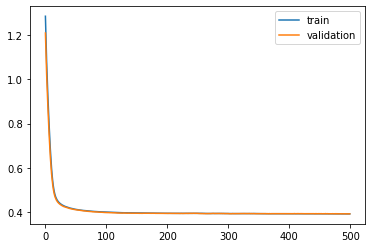

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 38s - loss: 1.2844 - val_loss: 1.2065

Epoch 00001: val_loss improved from inf to 1.20651, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.1726 - val_loss: 1.1067

Epoch 00002: val_loss improved from 1.20651 to 1.10673, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0787 - val_loss: 1.0224

Epoch 00003: val_loss improved from 1.10673 to 1.02237, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9982 - val_loss: 0.9481

Epoch 00004: val_loss improved from 1.02237 to 0.94810, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.9264 - val_loss: 0.8806

Epoch 00005: val_loss improved from 0.94810 to 0.88059, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8598 - val_loss: 0.8174

Epoch 00006: val_loss improved from 0.88059 to 0.81741, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7974 - val_loss: 0.7581

Epoch 00007: val_loss improved from 0.81741


Epoch 00058: val_loss improved from 0.41282 to 0.41251, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4092 - val_loss: 0.4123

Epoch 00059: val_loss improved from 0.41251 to 0.41228, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4088 - val_loss: 0.4122

Epoch 00060: val_loss improved from 0.41228 to 0.41216, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4084 - val_loss: 0.4117

Epoch 00061: val_loss improved from 0.41216 to 0.41173, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4080 - val_loss: 0.4115

Epoch 00062: val_loss improved from 0.41173 to 0.41150, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4078 - val_loss: 0.4116

Epoch 00063: val_loss did not improve from 0.41150
Epoch 64/500
 - 1s - loss: 0.4075 - val_loss: 0.4111

Epoch 00064: val_loss improved from 0.41150 to 0.41113, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4071 - val_loss: 0.4108

Epoch 00065: val_loss improved


Epoch 00120: val_loss improved from 0.40263 to 0.40256, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.3983 - val_loss: 0.4024

Epoch 00121: val_loss improved from 0.40256 to 0.40241, saving model to val_weights5.hdf5
Epoch 122/500
 - 1s - loss: 0.3981 - val_loss: 0.4025

Epoch 00122: val_loss did not improve from 0.40241
Epoch 123/500
 - 1s - loss: 0.3981 - val_loss: 0.4023

Epoch 00123: val_loss improved from 0.40241 to 0.40231, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3980 - val_loss: 0.4022

Epoch 00124: val_loss improved from 0.40231 to 0.40219, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3979 - val_loss: 0.4019

Epoch 00125: val_loss improved from 0.40219 to 0.40186, saving model to val_weights5.hdf5
Epoch 126/500
 - 1s - loss: 0.3979 - val_loss: 0.4022

Epoch 00126: val_loss did not improve from 0.40186
Epoch 127/500
 - 1s - loss: 0.3978 - val_loss: 0.4018

Epoch 00127: val_loss improved from 0.40186 to 0.40182, saving


Epoch 00189: val_loss improved from 0.39912 to 0.39911, saving model to val_weights5.hdf5
Epoch 190/500
 - 1s - loss: 0.3951 - val_loss: 0.3991

Epoch 00190: val_loss did not improve from 0.39911
Epoch 191/500
 - 1s - loss: 0.3950 - val_loss: 0.3996

Epoch 00191: val_loss did not improve from 0.39911
Epoch 192/500
 - 1s - loss: 0.3951 - val_loss: 0.3994

Epoch 00192: val_loss did not improve from 0.39911
Epoch 193/500
 - 1s - loss: 0.3951 - val_loss: 0.3993

Epoch 00193: val_loss did not improve from 0.39911
Epoch 194/500
 - 1s - loss: 0.3950 - val_loss: 0.3995

Epoch 00194: val_loss did not improve from 0.39911
Epoch 195/500
 - 1s - loss: 0.3951 - val_loss: 0.3992

Epoch 00195: val_loss did not improve from 0.39911
Epoch 196/500
 - 1s - loss: 0.3949 - val_loss: 0.3991

Epoch 00196: val_loss did not improve from 0.39911
Epoch 197/500
 - 1s - loss: 0.3949 - val_loss: 0.3992

Epoch 00197: val_loss did not improve from 0.39911
Epoch 198/500
 - 1s - loss: 0.3949 - val_loss: 0.3991

Epoch 

 - 1s - loss: 0.3939 - val_loss: 0.3980

Epoch 00262: val_loss did not improve from 0.39777
Epoch 263/500
 - 1s - loss: 0.3938 - val_loss: 0.3979

Epoch 00263: val_loss did not improve from 0.39777
Epoch 264/500
 - 1s - loss: 0.3937 - val_loss: 0.3978

Epoch 00264: val_loss did not improve from 0.39777
Epoch 265/500
 - 1s - loss: 0.3938 - val_loss: 0.3979

Epoch 00265: val_loss did not improve from 0.39777
Epoch 266/500
 - 1s - loss: 0.3937 - val_loss: 0.3979

Epoch 00266: val_loss did not improve from 0.39777
Epoch 267/500
 - 1s - loss: 0.3937 - val_loss: 0.3981

Epoch 00267: val_loss did not improve from 0.39777
Epoch 268/500
 - 1s - loss: 0.3937 - val_loss: 0.3980

Epoch 00268: val_loss did not improve from 0.39777
Epoch 269/500
 - 1s - loss: 0.3937 - val_loss: 0.3979

Epoch 00269: val_loss did not improve from 0.39777
Epoch 270/500
 - 1s - loss: 0.3937 - val_loss: 0.3979

Epoch 00270: val_loss did not improve from 0.39777
Epoch 271/500
 - 1s - loss: 0.3936 - val_loss: 0.3976

Epoch

 - 1s - loss: 0.3931 - val_loss: 0.3973

Epoch 00336: val_loss did not improve from 0.39697
Epoch 337/500
 - 1s - loss: 0.3931 - val_loss: 0.3970

Epoch 00337: val_loss did not improve from 0.39697
Epoch 338/500
 - 1s - loss: 0.3930 - val_loss: 0.3972

Epoch 00338: val_loss did not improve from 0.39697
Epoch 339/500
 - 1s - loss: 0.3928 - val_loss: 0.3972

Epoch 00339: val_loss did not improve from 0.39697
Epoch 340/500
 - 1s - loss: 0.3930 - val_loss: 0.3975

Epoch 00340: val_loss did not improve from 0.39697
Epoch 341/500
 - 1s - loss: 0.3929 - val_loss: 0.3969

Epoch 00341: val_loss improved from 0.39697 to 0.39692, saving model to val_weights5.hdf5
Epoch 342/500
 - 1s - loss: 0.3929 - val_loss: 0.3972

Epoch 00342: val_loss did not improve from 0.39692
Epoch 343/500
 - 1s - loss: 0.3930 - val_loss: 0.3976

Epoch 00343: val_loss did not improve from 0.39692
Epoch 344/500
 - 1s - loss: 0.3928 - val_loss: 0.3976

Epoch 00344: val_loss did not improve from 0.39692
Epoch 345/500
 - 1s -


Epoch 00411: val_loss did not improve from 0.39632
Epoch 412/500
 - 1s - loss: 0.3924 - val_loss: 0.3974

Epoch 00412: val_loss did not improve from 0.39632
Epoch 413/500
 - 1s - loss: 0.3924 - val_loss: 0.3970

Epoch 00413: val_loss did not improve from 0.39632
Epoch 414/500
 - 1s - loss: 0.3924 - val_loss: 0.3967

Epoch 00414: val_loss did not improve from 0.39632
Epoch 415/500
 - 1s - loss: 0.3925 - val_loss: 0.3968

Epoch 00415: val_loss did not improve from 0.39632
Epoch 416/500
 - 1s - loss: 0.3922 - val_loss: 0.3967

Epoch 00416: val_loss did not improve from 0.39632
Epoch 417/500
 - 1s - loss: 0.3923 - val_loss: 0.3970

Epoch 00417: val_loss did not improve from 0.39632
Epoch 418/500
 - 1s - loss: 0.3923 - val_loss: 0.3969

Epoch 00418: val_loss did not improve from 0.39632
Epoch 419/500
 - 1s - loss: 0.3925 - val_loss: 0.3968

Epoch 00419: val_loss did not improve from 0.39632
Epoch 420/500
 - 1s - loss: 0.3923 - val_loss: 0.3964

Epoch 00420: val_loss did not improve from 0.

 - 1s - loss: 0.3918 - val_loss: 0.3968

Epoch 00489: val_loss did not improve from 0.39632
Epoch 490/500
 - 1s - loss: 0.3918 - val_loss: 0.3966

Epoch 00490: val_loss did not improve from 0.39632
Epoch 491/500
 - 1s - loss: 0.3918 - val_loss: 0.3970

Epoch 00491: val_loss did not improve from 0.39632
Epoch 492/500
 - 1s - loss: 0.3919 - val_loss: 0.3967

Epoch 00492: val_loss did not improve from 0.39632
Epoch 493/500
 - 1s - loss: 0.3920 - val_loss: 0.3969

Epoch 00493: val_loss did not improve from 0.39632
Epoch 494/500
 - 1s - loss: 0.3919 - val_loss: 0.3961

Epoch 00494: val_loss improved from 0.39632 to 0.39606, saving model to val_weights5.hdf5
Epoch 495/500
 - 1s - loss: 0.3919 - val_loss: 0.3970

Epoch 00495: val_loss did not improve from 0.39606
Epoch 496/500
 - 1s - loss: 0.3920 - val_loss: 0.3966

Epoch 00496: val_loss did not improve from 0.39606
Epoch 497/500
 - 1s - loss: 0.3918 - val_loss: 0.3967

Epoch 00497: val_loss did not improve from 0.39606
Epoch 498/500
 - 1s -

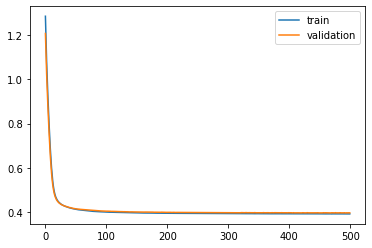

Time to train LSTM:  406.41602087020874
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 39s - loss: 1.1081 - val_loss: 1.0581

Epoch 00001: val_loss improved from inf to 1.05808, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0203 - val_loss: 0.9794

Epoch 00002: val_loss improved from 1.05808 to 0.97938, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9493 - val_loss: 0.9147

Epoch 00003: val_loss improved from 0.97938 to 0.91471, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.8897 - val_loss: 0.8591

Epoch 00004: val_loss improved from 0.91471 to 0.85911, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8360 - val_loss: 0.8076

Epoch 00005: val_loss improved from 0.85911 to 0.80758, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.7856 - val_loss: 0.7590

Epoch 00006: val_loss improved from 0.80758 to 0.75896, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7373 - val_loss: 0.7126

Epo


Epoch 00057: val_loss improved from 0.41591 to 0.41532, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4078 - val_loss: 0.4150

Epoch 00058: val_loss improved from 0.41532 to 0.41496, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4073 - val_loss: 0.4145

Epoch 00059: val_loss improved from 0.41496 to 0.41449, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4070 - val_loss: 0.4139

Epoch 00060: val_loss improved from 0.41449 to 0.41388, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4066 - val_loss: 0.4138

Epoch 00061: val_loss improved from 0.41388 to 0.41385, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4064 - val_loss: 0.4134

Epoch 00062: val_loss improved from 0.41385 to 0.41338, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4060 - val_loss: 0.4128

Epoch 00063: val_loss improved from 0.41338 to 0.41284, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4057 - val_loss:


Epoch 00118: val_loss improved from 0.40275 to 0.40271, saving model to val_weights1.hdf5
Epoch 119/500
 - 1s - loss: 0.3968 - val_loss: 0.4028

Epoch 00119: val_loss did not improve from 0.40271
Epoch 120/500
 - 1s - loss: 0.3967 - val_loss: 0.4024

Epoch 00120: val_loss improved from 0.40271 to 0.40241, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.3966 - val_loss: 0.4024

Epoch 00121: val_loss did not improve from 0.40241
Epoch 122/500
 - 1s - loss: 0.3966 - val_loss: 0.4023

Epoch 00122: val_loss improved from 0.40241 to 0.40232, saving model to val_weights1.hdf5
Epoch 123/500
 - 1s - loss: 0.3964 - val_loss: 0.4023

Epoch 00123: val_loss improved from 0.40232 to 0.40227, saving model to val_weights1.hdf5
Epoch 124/500
 - 1s - loss: 0.3965 - val_loss: 0.4021

Epoch 00124: val_loss improved from 0.40227 to 0.40213, saving model to val_weights1.hdf5
Epoch 125/500
 - 1s - loss: 0.3964 - val_loss: 0.4020

Epoch 00125: val_loss improved from 0.40213 to 0.40196, saving


Epoch 00185: val_loss improved from 0.39936 to 0.39893, saving model to val_weights1.hdf5
Epoch 186/500
 - 1s - loss: 0.3932 - val_loss: 0.3994

Epoch 00186: val_loss did not improve from 0.39893
Epoch 187/500
 - 1s - loss: 0.3933 - val_loss: 0.3991

Epoch 00187: val_loss did not improve from 0.39893
Epoch 188/500
 - 1s - loss: 0.3932 - val_loss: 0.3992

Epoch 00188: val_loss did not improve from 0.39893
Epoch 189/500
 - 1s - loss: 0.3932 - val_loss: 0.3993

Epoch 00189: val_loss did not improve from 0.39893
Epoch 190/500
 - 1s - loss: 0.3931 - val_loss: 0.3990

Epoch 00190: val_loss did not improve from 0.39893
Epoch 191/500
 - 1s - loss: 0.3930 - val_loss: 0.3993

Epoch 00191: val_loss did not improve from 0.39893
Epoch 192/500
 - 1s - loss: 0.3932 - val_loss: 0.3987

Epoch 00192: val_loss improved from 0.39893 to 0.39870, saving model to val_weights1.hdf5
Epoch 193/500
 - 1s - loss: 0.3931 - val_loss: 0.3993

Epoch 00193: val_loss did not improve from 0.39870
Epoch 194/500
 - 1s - 

 - 1s - loss: 0.3921 - val_loss: 0.3981

Epoch 00258: val_loss did not improve from 0.39777
Epoch 259/500
 - 1s - loss: 0.3921 - val_loss: 0.3980

Epoch 00259: val_loss did not improve from 0.39777
Epoch 260/500
 - 1s - loss: 0.3921 - val_loss: 0.3981

Epoch 00260: val_loss did not improve from 0.39777
Epoch 261/500
 - 1s - loss: 0.3921 - val_loss: 0.3980

Epoch 00261: val_loss did not improve from 0.39777
Epoch 262/500
 - 1s - loss: 0.3921 - val_loss: 0.3978

Epoch 00262: val_loss did not improve from 0.39777
Epoch 263/500
 - 1s - loss: 0.3920 - val_loss: 0.3978

Epoch 00263: val_loss did not improve from 0.39777
Epoch 264/500
 - 1s - loss: 0.3920 - val_loss: 0.3979

Epoch 00264: val_loss did not improve from 0.39777
Epoch 265/500
 - 1s - loss: 0.3921 - val_loss: 0.3978

Epoch 00265: val_loss did not improve from 0.39777
Epoch 266/500
 - 1s - loss: 0.3920 - val_loss: 0.3980

Epoch 00266: val_loss did not improve from 0.39777
Epoch 267/500
 - 1s - loss: 0.3919 - val_loss: 0.3982

Epoch

 - 1s - loss: 0.3917 - val_loss: 0.3981

Epoch 00333: val_loss did not improve from 0.39722
Epoch 334/500
 - 1s - loss: 0.3918 - val_loss: 0.3984

Epoch 00334: val_loss did not improve from 0.39722
Epoch 335/500
 - 1s - loss: 0.3918 - val_loss: 0.3979

Epoch 00335: val_loss did not improve from 0.39722
Epoch 336/500
 - 1s - loss: 0.3919 - val_loss: 0.3985

Epoch 00336: val_loss did not improve from 0.39722
Epoch 337/500
 - 1s - loss: 0.3921 - val_loss: 0.3990

Epoch 00337: val_loss did not improve from 0.39722
Epoch 338/500
 - 1s - loss: 0.3919 - val_loss: 0.3986

Epoch 00338: val_loss did not improve from 0.39722
Epoch 339/500
 - 1s - loss: 0.3919 - val_loss: 0.3992

Epoch 00339: val_loss did not improve from 0.39722
Epoch 340/500
 - 1s - loss: 0.3920 - val_loss: 0.3994

Epoch 00340: val_loss did not improve from 0.39722
Epoch 341/500
 - 1s - loss: 0.3922 - val_loss: 0.4002

Epoch 00341: val_loss did not improve from 0.39722
Epoch 342/500
 - 1s - loss: 0.3922 - val_loss: 0.4004

Epoch

 - 1s - loss: 0.3905 - val_loss: 0.3974

Epoch 00410: val_loss did not improve from 0.39718
Epoch 411/500
 - 1s - loss: 0.3904 - val_loss: 0.3974

Epoch 00411: val_loss did not improve from 0.39718
Epoch 412/500
 - 1s - loss: 0.3904 - val_loss: 0.3971

Epoch 00412: val_loss improved from 0.39718 to 0.39707, saving model to val_weights1.hdf5
Epoch 413/500
 - 1s - loss: 0.3903 - val_loss: 0.3973

Epoch 00413: val_loss did not improve from 0.39707
Epoch 414/500
 - 1s - loss: 0.3904 - val_loss: 0.3973

Epoch 00414: val_loss did not improve from 0.39707
Epoch 415/500
 - 1s - loss: 0.3904 - val_loss: 0.3972

Epoch 00415: val_loss did not improve from 0.39707
Epoch 416/500
 - 1s - loss: 0.3904 - val_loss: 0.3972

Epoch 00416: val_loss did not improve from 0.39707
Epoch 417/500
 - 1s - loss: 0.3904 - val_loss: 0.3969

Epoch 00417: val_loss improved from 0.39707 to 0.39695, saving model to val_weights1.hdf5
Epoch 418/500
 - 1s - loss: 0.3903 - val_loss: 0.3969

Epoch 00418: val_loss improved fr

 - 1s - loss: 0.3897 - val_loss: 0.3967

Epoch 00483: val_loss did not improve from 0.39642
Epoch 484/500
 - 1s - loss: 0.3897 - val_loss: 0.3968

Epoch 00484: val_loss did not improve from 0.39642
Epoch 485/500
 - 1s - loss: 0.3896 - val_loss: 0.3965

Epoch 00485: val_loss did not improve from 0.39642
Epoch 486/500
 - 1s - loss: 0.3896 - val_loss: 0.3967

Epoch 00486: val_loss did not improve from 0.39642
Epoch 487/500
 - 1s - loss: 0.3896 - val_loss: 0.3969

Epoch 00487: val_loss did not improve from 0.39642
Epoch 488/500
 - 1s - loss: 0.3897 - val_loss: 0.3965

Epoch 00488: val_loss did not improve from 0.39642
Epoch 489/500
 - 1s - loss: 0.3896 - val_loss: 0.3967

Epoch 00489: val_loss did not improve from 0.39642
Epoch 490/500
 - 1s - loss: 0.3897 - val_loss: 0.3971

Epoch 00490: val_loss did not improve from 0.39642
Epoch 491/500
 - 1s - loss: 0.3897 - val_loss: 0.3967

Epoch 00491: val_loss did not improve from 0.39642
Epoch 492/500
 - 1s - loss: 0.3896 - val_loss: 0.3968

Epoch

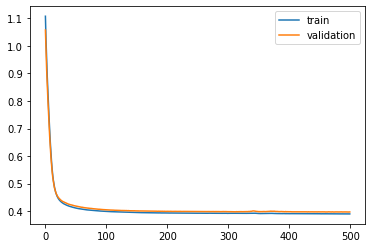

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 39s - loss: 1.1088 - val_loss: 1.0538

Epoch 00001: val_loss improved from inf to 1.05379, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0208 - val_loss: 0.9780

Epoch 00002: val_loss improved from 1.05379 to 0.97805, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9496 - val_loss: 0.9150

Epoch 00003: val_loss improved from 0.97805 to 0.91501, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.8897 - val_loss: 0.8593

Epoch 00004: val_loss improved from 0.91501 to 0.85933, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8358 - val_loss: 0.8071

Epoch 00005: val_loss improved from 0.85933 to 0.80711, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.7854 - val_loss: 0.7570

Epoch 00006: val_loss improved from 0.80711 to 0.75700, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7374 - val_loss: 0.7096

Epoch 00007: val_loss improved from 0.75700

 - 1s - loss: 0.4083 - val_loss: 0.4060

Epoch 00058: val_loss improved from 0.40637 to 0.40600, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4081 - val_loss: 0.4059

Epoch 00059: val_loss improved from 0.40600 to 0.40585, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4076 - val_loss: 0.4052

Epoch 00060: val_loss improved from 0.40585 to 0.40524, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4073 - val_loss: 0.4053

Epoch 00061: val_loss did not improve from 0.40524
Epoch 62/500
 - 1s - loss: 0.4069 - val_loss: 0.4046

Epoch 00062: val_loss improved from 0.40524 to 0.40460, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4065 - val_loss: 0.4045

Epoch 00063: val_loss improved from 0.40460 to 0.40446, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4062 - val_loss: 0.4041

Epoch 00064: val_loss improved from 0.40446 to 0.40411, saving model to val_weights2.hdf5
Epoch 65/500
 - 1s - loss: 0.4058 - val_loss


Epoch 00120: val_loss did not improve from 0.39658
Epoch 121/500
 - 1s - loss: 0.3972 - val_loss: 0.3966

Epoch 00121: val_loss did not improve from 0.39658
Epoch 122/500
 - 1s - loss: 0.3970 - val_loss: 0.3966

Epoch 00122: val_loss did not improve from 0.39658
Epoch 123/500
 - 1s - loss: 0.3970 - val_loss: 0.3965

Epoch 00123: val_loss improved from 0.39658 to 0.39646, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3969 - val_loss: 0.3965

Epoch 00124: val_loss did not improve from 0.39646
Epoch 125/500
 - 1s - loss: 0.3967 - val_loss: 0.3962

Epoch 00125: val_loss improved from 0.39646 to 0.39623, saving model to val_weights2.hdf5
Epoch 126/500
 - 1s - loss: 0.3967 - val_loss: 0.3963

Epoch 00126: val_loss did not improve from 0.39623
Epoch 127/500
 - 1s - loss: 0.3966 - val_loss: 0.3963

Epoch 00127: val_loss did not improve from 0.39623
Epoch 128/500
 - 1s - loss: 0.3966 - val_loss: 0.3961

Epoch 00128: val_loss improved from 0.39623 to 0.39614, saving model to v


Epoch 00188: val_loss improved from 0.39331 to 0.39325, saving model to val_weights2.hdf5
Epoch 189/500
 - 1s - loss: 0.3938 - val_loss: 0.3935

Epoch 00189: val_loss did not improve from 0.39325
Epoch 190/500
 - 1s - loss: 0.3938 - val_loss: 0.3932

Epoch 00190: val_loss improved from 0.39325 to 0.39321, saving model to val_weights2.hdf5
Epoch 191/500
 - 1s - loss: 0.3938 - val_loss: 0.3934

Epoch 00191: val_loss did not improve from 0.39321
Epoch 192/500
 - 1s - loss: 0.3937 - val_loss: 0.3936

Epoch 00192: val_loss did not improve from 0.39321
Epoch 193/500
 - 1s - loss: 0.3938 - val_loss: 0.3937

Epoch 00193: val_loss did not improve from 0.39321
Epoch 194/500
 - 1s - loss: 0.3937 - val_loss: 0.3935

Epoch 00194: val_loss did not improve from 0.39321
Epoch 195/500
 - 1s - loss: 0.3937 - val_loss: 0.3934

Epoch 00195: val_loss did not improve from 0.39321
Epoch 196/500
 - 1s - loss: 0.3935 - val_loss: 0.3935

Epoch 00196: val_loss did not improve from 0.39321
Epoch 197/500
 - 1s - 

 - 1s - loss: 0.3925 - val_loss: 0.3925

Epoch 00262: val_loss did not improve from 0.39247
Epoch 263/500
 - 1s - loss: 0.3925 - val_loss: 0.3928

Epoch 00263: val_loss did not improve from 0.39247
Epoch 264/500
 - 1s - loss: 0.3926 - val_loss: 0.3927

Epoch 00264: val_loss did not improve from 0.39247
Epoch 265/500
 - 1s - loss: 0.3924 - val_loss: 0.3925

Epoch 00265: val_loss did not improve from 0.39247
Epoch 266/500
 - 1s - loss: 0.3925 - val_loss: 0.3925

Epoch 00266: val_loss did not improve from 0.39247
Epoch 267/500
 - 1s - loss: 0.3924 - val_loss: 0.3926

Epoch 00267: val_loss did not improve from 0.39247
Epoch 268/500
 - 1s - loss: 0.3924 - val_loss: 0.3926

Epoch 00268: val_loss did not improve from 0.39247
Epoch 269/500
 - 1s - loss: 0.3924 - val_loss: 0.3926

Epoch 00269: val_loss did not improve from 0.39247
Epoch 270/500
 - 1s - loss: 0.3925 - val_loss: 0.3929

Epoch 00270: val_loss did not improve from 0.39247
Epoch 271/500
 - 1s - loss: 0.3924 - val_loss: 0.3923

Epoch


Epoch 00338: val_loss did not improve from 0.39210
Epoch 339/500
 - 1s - loss: 0.3916 - val_loss: 0.3925

Epoch 00339: val_loss did not improve from 0.39210
Epoch 340/500
 - 1s - loss: 0.3915 - val_loss: 0.3925

Epoch 00340: val_loss did not improve from 0.39210
Epoch 341/500
 - 1s - loss: 0.3916 - val_loss: 0.3924

Epoch 00341: val_loss did not improve from 0.39210
Epoch 342/500
 - 1s - loss: 0.3917 - val_loss: 0.3925

Epoch 00342: val_loss did not improve from 0.39210
Epoch 343/500
 - 1s - loss: 0.3915 - val_loss: 0.3924

Epoch 00343: val_loss did not improve from 0.39210
Epoch 344/500
 - 1s - loss: 0.3917 - val_loss: 0.3927

Epoch 00344: val_loss did not improve from 0.39210
Epoch 345/500
 - 1s - loss: 0.3915 - val_loss: 0.3925

Epoch 00345: val_loss did not improve from 0.39210
Epoch 346/500
 - 1s - loss: 0.3915 - val_loss: 0.3923

Epoch 00346: val_loss did not improve from 0.39210
Epoch 347/500
 - 1s - loss: 0.3916 - val_loss: 0.3928

Epoch 00347: val_loss did not improve from 0.

 - 1s - loss: 0.3908 - val_loss: 0.3922

Epoch 00415: val_loss did not improve from 0.39195
Epoch 416/500
 - 1s - loss: 0.3909 - val_loss: 0.3924

Epoch 00416: val_loss did not improve from 0.39195
Epoch 417/500
 - 1s - loss: 0.3909 - val_loss: 0.3922

Epoch 00417: val_loss did not improve from 0.39195
Epoch 418/500
 - 1s - loss: 0.3909 - val_loss: 0.3921

Epoch 00418: val_loss did not improve from 0.39195
Epoch 419/500
 - 1s - loss: 0.3909 - val_loss: 0.3921

Epoch 00419: val_loss did not improve from 0.39195
Epoch 420/500
 - 1s - loss: 0.3909 - val_loss: 0.3922

Epoch 00420: val_loss did not improve from 0.39195
Epoch 421/500
 - 1s - loss: 0.3907 - val_loss: 0.3922

Epoch 00421: val_loss did not improve from 0.39195
Epoch 422/500
 - 1s - loss: 0.3907 - val_loss: 0.3925

Epoch 00422: val_loss did not improve from 0.39195
Epoch 423/500
 - 1s - loss: 0.3908 - val_loss: 0.3922

Epoch 00423: val_loss did not improve from 0.39195
Epoch 424/500
 - 1s - loss: 0.3906 - val_loss: 0.3923

Epoch

 - 1s - loss: 0.3902 - val_loss: 0.3921

Epoch 00492: val_loss did not improve from 0.39187
Epoch 493/500
 - 1s - loss: 0.3902 - val_loss: 0.3922

Epoch 00493: val_loss did not improve from 0.39187
Epoch 494/500
 - 1s - loss: 0.3904 - val_loss: 0.3922

Epoch 00494: val_loss did not improve from 0.39187
Epoch 495/500
 - 1s - loss: 0.3903 - val_loss: 0.3920

Epoch 00495: val_loss did not improve from 0.39187
Epoch 496/500
 - 1s - loss: 0.3904 - val_loss: 0.3926

Epoch 00496: val_loss did not improve from 0.39187
Epoch 497/500
 - 1s - loss: 0.3904 - val_loss: 0.3920

Epoch 00497: val_loss did not improve from 0.39187
Epoch 498/500
 - 1s - loss: 0.3902 - val_loss: 0.3924

Epoch 00498: val_loss did not improve from 0.39187
Epoch 499/500
 - 1s - loss: 0.3901 - val_loss: 0.3921

Epoch 00499: val_loss did not improve from 0.39187
Epoch 500/500
 - 1s - loss: 0.3902 - val_loss: 0.3922

Epoch 00500: val_loss did not improve from 0.39187
#################################
Number of units: 4
Batch s

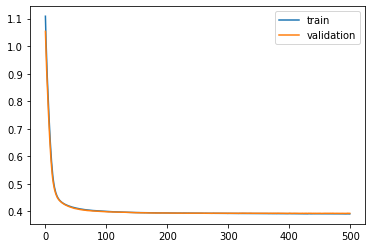

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 39s - loss: 1.1102 - val_loss: 1.0417

Epoch 00001: val_loss improved from inf to 1.04166, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0224 - val_loss: 0.9643

Epoch 00002: val_loss improved from 1.04166 to 0.96433, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9512 - val_loss: 0.9010

Epoch 00003: val_loss improved from 0.96433 to 0.90101, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.8913 - val_loss: 0.8463

Epoch 00004: val_loss improved from 0.90101 to 0.84630, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8374 - val_loss: 0.7958

Epoch 00005: val_loss improved from 0.84630 to 0.79583, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.7868 - val_loss: 0.7480

Epoch 00006: val_loss improved from 0.79583 to 0.74802, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7384 - val_loss: 0.7035

Epoch 00007: val_loss improved from 0.74802

 - 1s - loss: 0.4076 - val_loss: 0.4152

Epoch 00058: val_loss improved from 0.41562 to 0.41521, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4073 - val_loss: 0.4150

Epoch 00059: val_loss improved from 0.41521 to 0.41497, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4069 - val_loss: 0.4146

Epoch 00060: val_loss improved from 0.41497 to 0.41459, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4065 - val_loss: 0.4144

Epoch 00061: val_loss improved from 0.41459 to 0.41439, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4062 - val_loss: 0.4140

Epoch 00062: val_loss improved from 0.41439 to 0.41403, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4059 - val_loss: 0.4137

Epoch 00063: val_loss improved from 0.41403 to 0.41365, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4056 - val_loss: 0.4136

Epoch 00064: val_loss improved from 0.41365 to 0.41359, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.3965 - val_loss: 0.4063

Epoch 00119: val_loss improved from 0.40659 to 0.40626, saving model to val_weights3.hdf5
Epoch 120/500
 - 1s - loss: 0.3964 - val_loss: 0.4065

Epoch 00120: val_loss did not improve from 0.40626
Epoch 121/500
 - 1s - loss: 0.3963 - val_loss: 0.4062

Epoch 00121: val_loss improved from 0.40626 to 0.40617, saving model to val_weights3.hdf5
Epoch 122/500
 - 1s - loss: 0.3962 - val_loss: 0.4063

Epoch 00122: val_loss did not improve from 0.40617
Epoch 123/500
 - 1s - loss: 0.3960 - val_loss: 0.4062

Epoch 00123: val_loss did not improve from 0.40617
Epoch 124/500
 - 1s - loss: 0.3961 - val_loss: 0.4063

Epoch 00124: val_loss did not improve from 0.40617
Epoch 125/500
 - 1s - loss: 0.3960 - val_loss: 0.4061

Epoch 00125: val_loss improved from 0.40617 to 0.40611, saving model to val_weights3.hdf5
Epoch 126/500
 - 1s - loss: 0.3959 - val_loss: 0.4064

Epoch 00126: val_loss did not improve from 0.40611
Epoch 127/500
 - 1s - loss: 0.3957 - val_loss: 0.

 - 1s - loss: 0.3930 - val_loss: 0.4032

Epoch 00186: val_loss improved from 0.40327 to 0.40323, saving model to val_weights3.hdf5
Epoch 187/500
 - 1s - loss: 0.3930 - val_loss: 0.4030

Epoch 00187: val_loss improved from 0.40323 to 0.40305, saving model to val_weights3.hdf5
Epoch 188/500
 - 1s - loss: 0.3929 - val_loss: 0.4036

Epoch 00188: val_loss did not improve from 0.40305
Epoch 189/500
 - 1s - loss: 0.3929 - val_loss: 0.4033

Epoch 00189: val_loss did not improve from 0.40305
Epoch 190/500
 - 1s - loss: 0.3929 - val_loss: 0.4035

Epoch 00190: val_loss did not improve from 0.40305
Epoch 191/500
 - 1s - loss: 0.3929 - val_loss: 0.4032

Epoch 00191: val_loss did not improve from 0.40305
Epoch 192/500
 - 1s - loss: 0.3928 - val_loss: 0.4031

Epoch 00192: val_loss did not improve from 0.40305
Epoch 193/500
 - 1s - loss: 0.3928 - val_loss: 0.4032

Epoch 00193: val_loss did not improve from 0.40305
Epoch 194/500
 - 1s - loss: 0.3929 - val_loss: 0.4033

Epoch 00194: val_loss did not imp

 - 1s - loss: 0.3917 - val_loss: 0.4025

Epoch 00260: val_loss did not improve from 0.40218
Epoch 261/500
 - 1s - loss: 0.3917 - val_loss: 0.4027

Epoch 00261: val_loss did not improve from 0.40218
Epoch 262/500
 - 1s - loss: 0.3917 - val_loss: 0.4025

Epoch 00262: val_loss did not improve from 0.40218
Epoch 263/500
 - 1s - loss: 0.3917 - val_loss: 0.4019

Epoch 00263: val_loss improved from 0.40218 to 0.40192, saving model to val_weights3.hdf5
Epoch 264/500
 - 1s - loss: 0.3918 - val_loss: 0.4022

Epoch 00264: val_loss did not improve from 0.40192
Epoch 265/500
 - 1s - loss: 0.3918 - val_loss: 0.4025

Epoch 00265: val_loss did not improve from 0.40192
Epoch 266/500
 - 1s - loss: 0.3918 - val_loss: 0.4023

Epoch 00266: val_loss did not improve from 0.40192
Epoch 267/500
 - 1s - loss: 0.3919 - val_loss: 0.4028

Epoch 00267: val_loss did not improve from 0.40192
Epoch 268/500
 - 1s - loss: 0.3917 - val_loss: 0.4022

Epoch 00268: val_loss did not improve from 0.40192
Epoch 269/500
 - 1s -

 - 1s - loss: 0.3909 - val_loss: 0.4016

Epoch 00334: val_loss did not improve from 0.40154
Epoch 335/500
 - 1s - loss: 0.3910 - val_loss: 0.4021

Epoch 00335: val_loss did not improve from 0.40154
Epoch 336/500
 - 1s - loss: 0.3908 - val_loss: 0.4013

Epoch 00336: val_loss improved from 0.40154 to 0.40133, saving model to val_weights3.hdf5
Epoch 337/500
 - 1s - loss: 0.3909 - val_loss: 0.4020

Epoch 00337: val_loss did not improve from 0.40133
Epoch 338/500
 - 1s - loss: 0.3909 - val_loss: 0.4017

Epoch 00338: val_loss did not improve from 0.40133
Epoch 339/500
 - 1s - loss: 0.3909 - val_loss: 0.4018

Epoch 00339: val_loss did not improve from 0.40133
Epoch 340/500
 - 1s - loss: 0.3909 - val_loss: 0.4015

Epoch 00340: val_loss did not improve from 0.40133
Epoch 341/500
 - 1s - loss: 0.3907 - val_loss: 0.4015

Epoch 00341: val_loss did not improve from 0.40133
Epoch 342/500
 - 1s - loss: 0.3907 - val_loss: 0.4018

Epoch 00342: val_loss did not improve from 0.40133
Epoch 343/500
 - 1s -


Epoch 00409: val_loss did not improve from 0.40079
Epoch 410/500
 - 1s - loss: 0.3899 - val_loss: 0.4012

Epoch 00410: val_loss did not improve from 0.40079
Epoch 411/500
 - 1s - loss: 0.3900 - val_loss: 0.4013

Epoch 00411: val_loss did not improve from 0.40079
Epoch 412/500
 - 1s - loss: 0.3900 - val_loss: 0.4012

Epoch 00412: val_loss did not improve from 0.40079
Epoch 413/500
 - 1s - loss: 0.3901 - val_loss: 0.4011

Epoch 00413: val_loss did not improve from 0.40079
Epoch 414/500
 - 1s - loss: 0.3900 - val_loss: 0.4010

Epoch 00414: val_loss did not improve from 0.40079
Epoch 415/500
 - 1s - loss: 0.3899 - val_loss: 0.4007

Epoch 00415: val_loss improved from 0.40079 to 0.40074, saving model to val_weights3.hdf5
Epoch 416/500
 - 1s - loss: 0.3900 - val_loss: 0.4014

Epoch 00416: val_loss did not improve from 0.40074
Epoch 417/500
 - 1s - loss: 0.3901 - val_loss: 0.4019

Epoch 00417: val_loss did not improve from 0.40074
Epoch 418/500
 - 1s - loss: 0.3901 - val_loss: 0.4014

Epoch 

 - 1s - loss: 0.3894 - val_loss: 0.4010

Epoch 00486: val_loss did not improve from 0.40061
Epoch 487/500
 - 1s - loss: 0.3893 - val_loss: 0.4015

Epoch 00487: val_loss did not improve from 0.40061
Epoch 488/500
 - 1s - loss: 0.3895 - val_loss: 0.4011

Epoch 00488: val_loss did not improve from 0.40061
Epoch 489/500
 - 1s - loss: 0.3893 - val_loss: 0.4009

Epoch 00489: val_loss did not improve from 0.40061
Epoch 490/500
 - 1s - loss: 0.3892 - val_loss: 0.4009

Epoch 00490: val_loss did not improve from 0.40061
Epoch 491/500
 - 1s - loss: 0.3893 - val_loss: 0.4009

Epoch 00491: val_loss did not improve from 0.40061
Epoch 492/500
 - 1s - loss: 0.3894 - val_loss: 0.4012

Epoch 00492: val_loss did not improve from 0.40061
Epoch 493/500
 - 1s - loss: 0.3893 - val_loss: 0.4007

Epoch 00493: val_loss did not improve from 0.40061
Epoch 494/500
 - 1s - loss: 0.3893 - val_loss: 0.4013

Epoch 00494: val_loss did not improve from 0.40061
Epoch 495/500
 - 1s - loss: 0.3894 - val_loss: 0.4011

Epoch

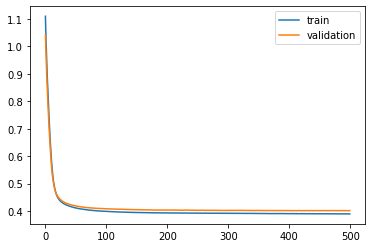

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 39s - loss: 1.1094 - val_loss: 1.0473

Epoch 00001: val_loss improved from inf to 1.04732, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0218 - val_loss: 0.9695

Epoch 00002: val_loss improved from 1.04732 to 0.96953, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9507 - val_loss: 0.9060

Epoch 00003: val_loss improved from 0.96953 to 0.90602, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.8908 - val_loss: 0.8504

Epoch 00004: val_loss improved from 0.90602 to 0.85041, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8369 - val_loss: 0.7984

Epoch 00005: val_loss improved from 0.85041 to 0.79840, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.7865 - val_loss: 0.7490

Epoch 00006: val_loss improved from 0.79840 to 0.74897, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7385 - val_loss: 0.7022

Epoch 00007: val_loss improved from 0.74897

 - 1s - loss: 0.4085 - val_loss: 0.4078

Epoch 00058: val_loss improved from 0.40836 to 0.40780, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4082 - val_loss: 0.4075

Epoch 00059: val_loss improved from 0.40780 to 0.40754, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4078 - val_loss: 0.4070

Epoch 00060: val_loss improved from 0.40754 to 0.40703, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4074 - val_loss: 0.4068

Epoch 00061: val_loss improved from 0.40703 to 0.40680, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4072 - val_loss: 0.4066

Epoch 00062: val_loss improved from 0.40680 to 0.40660, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4068 - val_loss: 0.4062

Epoch 00063: val_loss improved from 0.40660 to 0.40615, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4065 - val_loss: 0.4059

Epoch 00064: val_loss improved from 0.40615 to 0.40591, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.3972 - val_loss: 0.3966

Epoch 00120: val_loss did not improve from 0.39648
Epoch 121/500
 - 1s - loss: 0.3972 - val_loss: 0.3965

Epoch 00121: val_loss did not improve from 0.39648
Epoch 122/500
 - 1s - loss: 0.3971 - val_loss: 0.3966

Epoch 00122: val_loss did not improve from 0.39648
Epoch 123/500
 - 1s - loss: 0.3970 - val_loss: 0.3965

Epoch 00123: val_loss did not improve from 0.39648
Epoch 124/500
 - 1s - loss: 0.3970 - val_loss: 0.3963

Epoch 00124: val_loss improved from 0.39648 to 0.39635, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3969 - val_loss: 0.3962

Epoch 00125: val_loss improved from 0.39635 to 0.39617, saving model to val_weights4.hdf5
Epoch 126/500
 - 1s - loss: 0.3967 - val_loss: 0.3963

Epoch 00126: val_loss did not improve from 0.39617
Epoch 127/500
 - 1s - loss: 0.3967 - val_loss: 0.3962

Epoch 00127: val_loss did not improve from 0.39617
Epoch 128/500
 - 1s - loss: 0.3966 - val_loss: 0.3960

Epoch 00128: val_loss improved fr

 - 1s - loss: 0.3938 - val_loss: 0.3942

Epoch 00191: val_loss did not improve from 0.39390
Epoch 192/500
 - 1s - loss: 0.3938 - val_loss: 0.3938

Epoch 00192: val_loss improved from 0.39390 to 0.39382, saving model to val_weights4.hdf5
Epoch 193/500
 - 1s - loss: 0.3937 - val_loss: 0.3941

Epoch 00193: val_loss did not improve from 0.39382
Epoch 194/500
 - 1s - loss: 0.3939 - val_loss: 0.3940

Epoch 00194: val_loss did not improve from 0.39382
Epoch 195/500
 - 1s - loss: 0.3937 - val_loss: 0.3939

Epoch 00195: val_loss did not improve from 0.39382
Epoch 196/500
 - 1s - loss: 0.3937 - val_loss: 0.3939

Epoch 00196: val_loss did not improve from 0.39382
Epoch 197/500
 - 1s - loss: 0.3936 - val_loss: 0.3938

Epoch 00197: val_loss improved from 0.39382 to 0.39381, saving model to val_weights4.hdf5
Epoch 198/500
 - 1s - loss: 0.3937 - val_loss: 0.3941

Epoch 00198: val_loss did not improve from 0.39381
Epoch 199/500
 - 1s - loss: 0.3936 - val_loss: 0.3939

Epoch 00199: val_loss did not imp


Epoch 00266: val_loss did not improve from 0.39328
Epoch 267/500
 - 1s - loss: 0.3928 - val_loss: 0.3937

Epoch 00267: val_loss did not improve from 0.39328
Epoch 268/500
 - 1s - loss: 0.3928 - val_loss: 0.3937

Epoch 00268: val_loss did not improve from 0.39328
Epoch 269/500
 - 1s - loss: 0.3927 - val_loss: 0.3935

Epoch 00269: val_loss did not improve from 0.39328
Epoch 270/500
 - 1s - loss: 0.3929 - val_loss: 0.3938

Epoch 00270: val_loss did not improve from 0.39328
Epoch 271/500
 - 1s - loss: 0.3927 - val_loss: 0.3937

Epoch 00271: val_loss did not improve from 0.39328
Epoch 272/500
 - 1s - loss: 0.3928 - val_loss: 0.3936

Epoch 00272: val_loss did not improve from 0.39328
Epoch 273/500
 - 1s - loss: 0.3929 - val_loss: 0.3941

Epoch 00273: val_loss did not improve from 0.39328
Epoch 274/500
 - 1s - loss: 0.3927 - val_loss: 0.3935

Epoch 00274: val_loss did not improve from 0.39328
Epoch 275/500
 - 1s - loss: 0.3928 - val_loss: 0.3940

Epoch 00275: val_loss did not improve from 0.


Epoch 00342: val_loss did not improve from 0.39265
Epoch 343/500
 - 1s - loss: 0.3921 - val_loss: 0.3936

Epoch 00343: val_loss did not improve from 0.39265
Epoch 344/500
 - 1s - loss: 0.3921 - val_loss: 0.3932

Epoch 00344: val_loss did not improve from 0.39265
Epoch 345/500
 - 1s - loss: 0.3921 - val_loss: 0.3933

Epoch 00345: val_loss did not improve from 0.39265
Epoch 346/500
 - 1s - loss: 0.3921 - val_loss: 0.3932

Epoch 00346: val_loss did not improve from 0.39265
Epoch 347/500
 - 1s - loss: 0.3920 - val_loss: 0.3933

Epoch 00347: val_loss did not improve from 0.39265
Epoch 348/500
 - 1s - loss: 0.3920 - val_loss: 0.3928

Epoch 00348: val_loss did not improve from 0.39265
Epoch 349/500
 - 1s - loss: 0.3920 - val_loss: 0.3932

Epoch 00349: val_loss did not improve from 0.39265
Epoch 350/500
 - 1s - loss: 0.3920 - val_loss: 0.3932

Epoch 00350: val_loss did not improve from 0.39265
Epoch 351/500
 - 1s - loss: 0.3920 - val_loss: 0.3933

Epoch 00351: val_loss did not improve from 0.


Epoch 00418: val_loss did not improve from 0.39212
Epoch 419/500
 - 1s - loss: 0.3912 - val_loss: 0.3921

Epoch 00419: val_loss improved from 0.39212 to 0.39208, saving model to val_weights4.hdf5
Epoch 420/500
 - 1s - loss: 0.3913 - val_loss: 0.3922

Epoch 00420: val_loss did not improve from 0.39208
Epoch 421/500
 - 1s - loss: 0.3912 - val_loss: 0.3924

Epoch 00421: val_loss did not improve from 0.39208
Epoch 422/500
 - 1s - loss: 0.3913 - val_loss: 0.3924

Epoch 00422: val_loss did not improve from 0.39208
Epoch 423/500
 - 1s - loss: 0.3913 - val_loss: 0.3923

Epoch 00423: val_loss did not improve from 0.39208
Epoch 424/500
 - 1s - loss: 0.3915 - val_loss: 0.3923

Epoch 00424: val_loss did not improve from 0.39208
Epoch 425/500
 - 1s - loss: 0.3914 - val_loss: 0.3927

Epoch 00425: val_loss did not improve from 0.39208
Epoch 426/500
 - 1s - loss: 0.3914 - val_loss: 0.3923

Epoch 00426: val_loss did not improve from 0.39208
Epoch 427/500
 - 1s - loss: 0.3914 - val_loss: 0.3924

Epoch 


Epoch 00494: val_loss did not improve from 0.39169
Epoch 495/500
 - 1s - loss: 0.3906 - val_loss: 0.3919

Epoch 00495: val_loss did not improve from 0.39169
Epoch 496/500
 - 1s - loss: 0.3906 - val_loss: 0.3923

Epoch 00496: val_loss did not improve from 0.39169
Epoch 497/500
 - 1s - loss: 0.3906 - val_loss: 0.3920

Epoch 00497: val_loss did not improve from 0.39169
Epoch 498/500
 - 1s - loss: 0.3905 - val_loss: 0.3920

Epoch 00498: val_loss did not improve from 0.39169
Epoch 499/500
 - 1s - loss: 0.3905 - val_loss: 0.3920

Epoch 00499: val_loss did not improve from 0.39169
Epoch 500/500
 - 1s - loss: 0.3905 - val_loss: 0.3920

Epoch 00500: val_loss did not improve from 0.39169
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.008100909893974786
best val loss: 0.39169374903043114
#################################


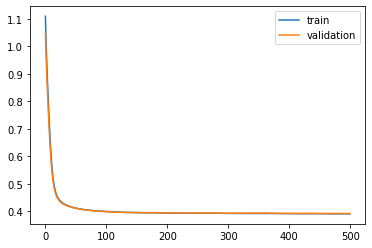

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 39s - loss: 1.1098 - val_loss: 1.0454

Epoch 00001: val_loss improved from inf to 1.04536, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0221 - val_loss: 0.9691

Epoch 00002: val_loss improved from 1.04536 to 0.96907, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9509 - val_loss: 0.9065

Epoch 00003: val_loss improved from 0.96907 to 0.90652, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.8910 - val_loss: 0.8515

Epoch 00004: val_loss improved from 0.90652 to 0.85149, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8370 - val_loss: 0.8011

Epoch 00005: val_loss improved from 0.85149 to 0.80106, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.7864 - val_loss: 0.7528

Epoch 00006: val_loss improved from 0.80106 to 0.75282, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7383 - val_loss: 0.7066

Epoch 00007: val_loss improved from 0.75282

 - 1s - loss: 0.4080 - val_loss: 0.4116

Epoch 00058: val_loss improved from 0.41233 to 0.41160, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4076 - val_loss: 0.4115

Epoch 00059: val_loss improved from 0.41160 to 0.41152, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4072 - val_loss: 0.4111

Epoch 00060: val_loss improved from 0.41152 to 0.41113, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4069 - val_loss: 0.4111

Epoch 00061: val_loss improved from 0.41113 to 0.41106, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4065 - val_loss: 0.4106

Epoch 00062: val_loss improved from 0.41106 to 0.41060, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4062 - val_loss: 0.4105

Epoch 00063: val_loss improved from 0.41060 to 0.41050, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4059 - val_loss: 0.4103

Epoch 00064: val_loss improved from 0.41050 to 0.41027, saving model to val_weights5.hdf5
Epoch

 - 1s - loss: 0.3971 - val_loss: 0.4025

Epoch 00119: val_loss did not improve from 0.40235
Epoch 120/500
 - 1s - loss: 0.3970 - val_loss: 0.4022

Epoch 00120: val_loss improved from 0.40235 to 0.40222, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.3969 - val_loss: 0.4022

Epoch 00121: val_loss improved from 0.40222 to 0.40217, saving model to val_weights5.hdf5
Epoch 122/500
 - 1s - loss: 0.3968 - val_loss: 0.4022

Epoch 00122: val_loss did not improve from 0.40217
Epoch 123/500
 - 1s - loss: 0.3968 - val_loss: 0.4017

Epoch 00123: val_loss improved from 0.40217 to 0.40173, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3967 - val_loss: 0.4019

Epoch 00124: val_loss did not improve from 0.40173
Epoch 125/500
 - 1s - loss: 0.3966 - val_loss: 0.4018

Epoch 00125: val_loss did not improve from 0.40173
Epoch 126/500
 - 1s - loss: 0.3965 - val_loss: 0.4017

Epoch 00126: val_loss improved from 0.40173 to 0.40173, saving model to val_weights5.hdf5
Epoch 127/

 - 1s - loss: 0.3939 - val_loss: 0.3986

Epoch 00186: val_loss did not improve from 0.39848
Epoch 187/500
 - 1s - loss: 0.3938 - val_loss: 0.3988

Epoch 00187: val_loss did not improve from 0.39848
Epoch 188/500
 - 1s - loss: 0.3939 - val_loss: 0.3984

Epoch 00188: val_loss improved from 0.39848 to 0.39838, saving model to val_weights5.hdf5
Epoch 189/500
 - 1s - loss: 0.3939 - val_loss: 0.3988

Epoch 00189: val_loss did not improve from 0.39838
Epoch 190/500
 - 1s - loss: 0.3937 - val_loss: 0.3984

Epoch 00190: val_loss improved from 0.39838 to 0.39838, saving model to val_weights5.hdf5
Epoch 191/500
 - 1s - loss: 0.3937 - val_loss: 0.3986

Epoch 00191: val_loss did not improve from 0.39838
Epoch 192/500
 - 1s - loss: 0.3937 - val_loss: 0.3986

Epoch 00192: val_loss did not improve from 0.39838
Epoch 193/500
 - 1s - loss: 0.3937 - val_loss: 0.3989

Epoch 00193: val_loss did not improve from 0.39838
Epoch 194/500
 - 1s - loss: 0.3937 - val_loss: 0.3985

Epoch 00194: val_loss did not imp


Epoch 00259: val_loss improved from 0.39777 to 0.39764, saving model to val_weights5.hdf5
Epoch 260/500
 - 1s - loss: 0.3923 - val_loss: 0.3978

Epoch 00260: val_loss did not improve from 0.39764
Epoch 261/500
 - 1s - loss: 0.3924 - val_loss: 0.3976

Epoch 00261: val_loss did not improve from 0.39764
Epoch 262/500
 - 1s - loss: 0.3922 - val_loss: 0.3976

Epoch 00262: val_loss improved from 0.39764 to 0.39763, saving model to val_weights5.hdf5
Epoch 263/500
 - 1s - loss: 0.3922 - val_loss: 0.3979

Epoch 00263: val_loss did not improve from 0.39763
Epoch 264/500
 - 1s - loss: 0.3923 - val_loss: 0.3976

Epoch 00264: val_loss improved from 0.39763 to 0.39759, saving model to val_weights5.hdf5
Epoch 265/500
 - 1s - loss: 0.3922 - val_loss: 0.3977

Epoch 00265: val_loss did not improve from 0.39759
Epoch 266/500
 - 1s - loss: 0.3923 - val_loss: 0.3972

Epoch 00266: val_loss improved from 0.39759 to 0.39724, saving model to val_weights5.hdf5
Epoch 267/500
 - 1s - loss: 0.3922 - val_loss: 0.3


Epoch 00334: val_loss did not improve from 0.39678
Epoch 335/500
 - 1s - loss: 0.3915 - val_loss: 0.3973

Epoch 00335: val_loss did not improve from 0.39678
Epoch 336/500
 - 1s - loss: 0.3915 - val_loss: 0.3971

Epoch 00336: val_loss did not improve from 0.39678
Epoch 337/500
 - 1s - loss: 0.3915 - val_loss: 0.3968

Epoch 00337: val_loss did not improve from 0.39678
Epoch 338/500
 - 1s - loss: 0.3916 - val_loss: 0.3970

Epoch 00338: val_loss did not improve from 0.39678
Epoch 339/500
 - 1s - loss: 0.3917 - val_loss: 0.3977

Epoch 00339: val_loss did not improve from 0.39678
Epoch 340/500
 - 1s - loss: 0.3917 - val_loss: 0.3969

Epoch 00340: val_loss did not improve from 0.39678
Epoch 341/500
 - 1s - loss: 0.3915 - val_loss: 0.3970

Epoch 00341: val_loss did not improve from 0.39678
Epoch 342/500
 - 1s - loss: 0.3915 - val_loss: 0.3974

Epoch 00342: val_loss did not improve from 0.39678
Epoch 343/500
 - 1s - loss: 0.3914 - val_loss: 0.3970

Epoch 00343: val_loss did not improve from 0.

 - 1s - loss: 0.3907 - val_loss: 0.3969

Epoch 00411: val_loss did not improve from 0.39654
Epoch 412/500
 - 1s - loss: 0.3908 - val_loss: 0.3970

Epoch 00412: val_loss did not improve from 0.39654
Epoch 413/500
 - 1s - loss: 0.3907 - val_loss: 0.3970

Epoch 00413: val_loss did not improve from 0.39654
Epoch 414/500
 - 1s - loss: 0.3907 - val_loss: 0.3968

Epoch 00414: val_loss did not improve from 0.39654
Epoch 415/500
 - 1s - loss: 0.3907 - val_loss: 0.3971

Epoch 00415: val_loss did not improve from 0.39654
Epoch 416/500
 - 1s - loss: 0.3906 - val_loss: 0.3969

Epoch 00416: val_loss did not improve from 0.39654
Epoch 417/500
 - 1s - loss: 0.3907 - val_loss: 0.3971

Epoch 00417: val_loss did not improve from 0.39654
Epoch 418/500
 - 1s - loss: 0.3908 - val_loss: 0.3971

Epoch 00418: val_loss did not improve from 0.39654
Epoch 419/500
 - 1s - loss: 0.3909 - val_loss: 0.3970

Epoch 00419: val_loss did not improve from 0.39654
Epoch 420/500
 - 1s - loss: 0.3907 - val_loss: 0.3973

Epoch


Epoch 00488: val_loss did not improve from 0.39654
Epoch 489/500
 - 1s - loss: 0.3901 - val_loss: 0.3971

Epoch 00489: val_loss did not improve from 0.39654
Epoch 490/500
 - 1s - loss: 0.3901 - val_loss: 0.3965

Epoch 00490: val_loss improved from 0.39654 to 0.39647, saving model to val_weights5.hdf5
Epoch 491/500
 - 1s - loss: 0.3900 - val_loss: 0.3969

Epoch 00491: val_loss did not improve from 0.39647
Epoch 492/500
 - 1s - loss: 0.3899 - val_loss: 0.3971

Epoch 00492: val_loss did not improve from 0.39647
Epoch 493/500
 - 1s - loss: 0.3900 - val_loss: 0.3968

Epoch 00493: val_loss did not improve from 0.39647
Epoch 494/500
 - 1s - loss: 0.3899 - val_loss: 0.3967

Epoch 00494: val_loss did not improve from 0.39647
Epoch 495/500
 - 1s - loss: 0.3899 - val_loss: 0.3967

Epoch 00495: val_loss did not improve from 0.39647
Epoch 496/500
 - 1s - loss: 0.3899 - val_loss: 0.3967

Epoch 00496: val_loss did not improve from 0.39647
Epoch 497/500
 - 1s - loss: 0.3899 - val_loss: 0.3970

Epoch 

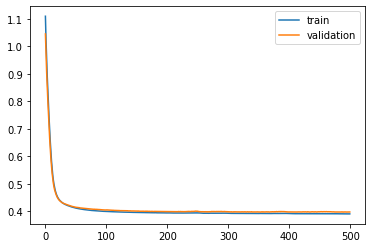

Time to train LSTM:  409.8034920692444
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 40s - loss: 1.1667 - val_loss: 1.1124

Epoch 00001: val_loss improved from inf to 1.11245, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0711 - val_loss: 1.0261

Epoch 00002: val_loss improved from 1.11245 to 1.02609, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9926 - val_loss: 0.9543

Epoch 00003: val_loss improved from 1.02609 to 0.95427, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9261 - val_loss: 0.8921

Epoch 00004: val_loss improved from 0.95427 to 0.89211, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8663 - val_loss: 0.8348

Epoch 00005: val_loss improved from 0.89211 to 0.83481, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8104 - val_loss: 0.7812

Epoch 00006: val_loss improved from 0.83481 to 0.78119, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7572 - val_loss: 0.7302

Epoc


Epoch 00057: val_loss improved from 0.41590 to 0.41518, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4082 - val_loss: 0.4149

Epoch 00058: val_loss improved from 0.41518 to 0.41494, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4078 - val_loss: 0.4144

Epoch 00059: val_loss improved from 0.41494 to 0.41441, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4075 - val_loss: 0.4142

Epoch 00060: val_loss improved from 0.41441 to 0.41418, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4072 - val_loss: 0.4137

Epoch 00061: val_loss improved from 0.41418 to 0.41366, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4068 - val_loss: 0.4136

Epoch 00062: val_loss improved from 0.41366 to 0.41357, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4066 - val_loss: 0.4130

Epoch 00063: val_loss improved from 0.41357 to 0.41300, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4062 - val_loss:


Epoch 00117: val_loss did not improve from 0.40267
Epoch 118/500
 - 1s - loss: 0.3975 - val_loss: 0.4027

Epoch 00118: val_loss improved from 0.40267 to 0.40266, saving model to val_weights1.hdf5
Epoch 119/500
 - 1s - loss: 0.3972 - val_loss: 0.4027

Epoch 00119: val_loss did not improve from 0.40266
Epoch 120/500
 - 1s - loss: 0.3974 - val_loss: 0.4026

Epoch 00120: val_loss improved from 0.40266 to 0.40257, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.3972 - val_loss: 0.4025

Epoch 00121: val_loss improved from 0.40257 to 0.40251, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3970 - val_loss: 0.4025

Epoch 00122: val_loss improved from 0.40251 to 0.40248, saving model to val_weights1.hdf5
Epoch 123/500
 - 1s - loss: 0.3971 - val_loss: 0.4028

Epoch 00123: val_loss did not improve from 0.40248
Epoch 124/500
 - 1s - loss: 0.3971 - val_loss: 0.4025

Epoch 00124: val_loss improved from 0.40248 to 0.40248, saving model to val_weights1.hdf5
Epoch 125/5

 - 1s - loss: 0.3940 - val_loss: 0.3993

Epoch 00185: val_loss did not improve from 0.39930
Epoch 186/500
 - 1s - loss: 0.3940 - val_loss: 0.3998

Epoch 00186: val_loss did not improve from 0.39930
Epoch 187/500
 - 1s - loss: 0.3940 - val_loss: 0.3993

Epoch 00187: val_loss did not improve from 0.39930
Epoch 188/500
 - 1s - loss: 0.3939 - val_loss: 0.3995

Epoch 00188: val_loss did not improve from 0.39930
Epoch 189/500
 - 1s - loss: 0.3940 - val_loss: 0.3995

Epoch 00189: val_loss did not improve from 0.39930
Epoch 190/500
 - 1s - loss: 0.3939 - val_loss: 0.3994

Epoch 00190: val_loss did not improve from 0.39930
Epoch 191/500
 - 1s - loss: 0.3939 - val_loss: 0.3994

Epoch 00191: val_loss did not improve from 0.39930
Epoch 192/500
 - 1s - loss: 0.3940 - val_loss: 0.3993

Epoch 00192: val_loss did not improve from 0.39930
Epoch 193/500
 - 1s - loss: 0.3937 - val_loss: 0.3993

Epoch 00193: val_loss improved from 0.39930 to 0.39927, saving model to val_weights1.hdf5
Epoch 194/500
 - 1s -

 - 1s - loss: 0.3927 - val_loss: 0.3977

Epoch 00257: val_loss improved from 0.39799 to 0.39774, saving model to val_weights1.hdf5
Epoch 258/500
 - 1s - loss: 0.3927 - val_loss: 0.3984

Epoch 00258: val_loss did not improve from 0.39774
Epoch 259/500
 - 1s - loss: 0.3929 - val_loss: 0.3983

Epoch 00259: val_loss did not improve from 0.39774
Epoch 260/500
 - 1s - loss: 0.3928 - val_loss: 0.3980

Epoch 00260: val_loss did not improve from 0.39774
Epoch 261/500
 - 1s - loss: 0.3928 - val_loss: 0.3984

Epoch 00261: val_loss did not improve from 0.39774
Epoch 262/500
 - 1s - loss: 0.3927 - val_loss: 0.3984

Epoch 00262: val_loss did not improve from 0.39774
Epoch 263/500
 - 1s - loss: 0.3928 - val_loss: 0.3981

Epoch 00263: val_loss did not improve from 0.39774
Epoch 264/500
 - 1s - loss: 0.3927 - val_loss: 0.3986

Epoch 00264: val_loss did not improve from 0.39774
Epoch 265/500
 - 1s - loss: 0.3927 - val_loss: 0.3981

Epoch 00265: val_loss did not improve from 0.39774
Epoch 266/500
 - 1s -

 - 1s - loss: 0.3922 - val_loss: 0.3977

Epoch 00333: val_loss did not improve from 0.39733
Epoch 334/500
 - 1s - loss: 0.3923 - val_loss: 0.3974

Epoch 00334: val_loss did not improve from 0.39733
Epoch 335/500
 - 1s - loss: 0.3921 - val_loss: 0.3975

Epoch 00335: val_loss did not improve from 0.39733
Epoch 336/500
 - 1s - loss: 0.3921 - val_loss: 0.3975

Epoch 00336: val_loss did not improve from 0.39733
Epoch 337/500
 - 1s - loss: 0.3919 - val_loss: 0.3971

Epoch 00337: val_loss improved from 0.39733 to 0.39706, saving model to val_weights1.hdf5
Epoch 338/500
 - 1s - loss: 0.3919 - val_loss: 0.3977

Epoch 00338: val_loss did not improve from 0.39706
Epoch 339/500
 - 1s - loss: 0.3920 - val_loss: 0.3973

Epoch 00339: val_loss did not improve from 0.39706
Epoch 340/500
 - 1s - loss: 0.3920 - val_loss: 0.3973

Epoch 00340: val_loss did not improve from 0.39706
Epoch 341/500
 - 1s - loss: 0.3921 - val_loss: 0.3979

Epoch 00341: val_loss did not improve from 0.39706
Epoch 342/500
 - 1s -


Epoch 00409: val_loss did not improve from 0.39695
Epoch 410/500
 - 1s - loss: 0.3911 - val_loss: 0.3969

Epoch 00410: val_loss improved from 0.39695 to 0.39693, saving model to val_weights1.hdf5
Epoch 411/500
 - 1s - loss: 0.3911 - val_loss: 0.3972

Epoch 00411: val_loss did not improve from 0.39693
Epoch 412/500
 - 1s - loss: 0.3911 - val_loss: 0.3969

Epoch 00412: val_loss improved from 0.39693 to 0.39691, saving model to val_weights1.hdf5
Epoch 413/500
 - 1s - loss: 0.3913 - val_loss: 0.3970

Epoch 00413: val_loss did not improve from 0.39691
Epoch 414/500
 - 1s - loss: 0.3911 - val_loss: 0.3973

Epoch 00414: val_loss did not improve from 0.39691
Epoch 415/500
 - 1s - loss: 0.3911 - val_loss: 0.3971

Epoch 00415: val_loss did not improve from 0.39691
Epoch 416/500
 - 1s - loss: 0.3911 - val_loss: 0.3972

Epoch 00416: val_loss did not improve from 0.39691
Epoch 417/500
 - 1s - loss: 0.3912 - val_loss: 0.3974

Epoch 00417: val_loss did not improve from 0.39691
Epoch 418/500
 - 1s - 

 - 1s - loss: 0.3908 - val_loss: 0.3968

Epoch 00485: val_loss did not improve from 0.39645
Epoch 486/500
 - 1s - loss: 0.3906 - val_loss: 0.3971

Epoch 00486: val_loss did not improve from 0.39645
Epoch 487/500
 - 1s - loss: 0.3904 - val_loss: 0.3969

Epoch 00487: val_loss did not improve from 0.39645
Epoch 488/500
 - 1s - loss: 0.3904 - val_loss: 0.3970

Epoch 00488: val_loss did not improve from 0.39645
Epoch 489/500
 - 1s - loss: 0.3905 - val_loss: 0.3971

Epoch 00489: val_loss did not improve from 0.39645
Epoch 490/500
 - 1s - loss: 0.3905 - val_loss: 0.3970

Epoch 00490: val_loss did not improve from 0.39645
Epoch 491/500
 - 1s - loss: 0.3905 - val_loss: 0.3971

Epoch 00491: val_loss did not improve from 0.39645
Epoch 492/500
 - 1s - loss: 0.3906 - val_loss: 0.3968

Epoch 00492: val_loss did not improve from 0.39645
Epoch 493/500
 - 1s - loss: 0.3904 - val_loss: 0.3970

Epoch 00493: val_loss did not improve from 0.39645
Epoch 494/500
 - 1s - loss: 0.3904 - val_loss: 0.3971

Epoch

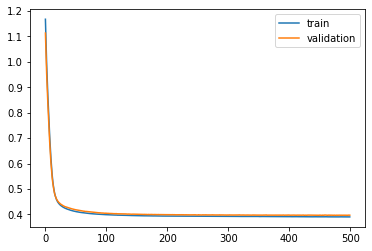

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 40s - loss: 1.1674 - val_loss: 1.1080

Epoch 00001: val_loss improved from inf to 1.10801, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0717 - val_loss: 1.0246

Epoch 00002: val_loss improved from 1.10801 to 1.02460, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9929 - val_loss: 0.9543

Epoch 00003: val_loss improved from 1.02460 to 0.95430, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9260 - val_loss: 0.8921

Epoch 00004: val_loss improved from 0.95430 to 0.89213, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8661 - val_loss: 0.8342

Epoch 00005: val_loss improved from 0.89213 to 0.83425, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8102 - val_loss: 0.7790

Epoch 00006: val_loss improved from 0.83425 to 0.77899, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7573 - val_loss: 0.7271

Epoch 00007: val_loss improved from 0.77899

 - 1s - loss: 0.4089 - val_loss: 0.4058

Epoch 00058: val_loss improved from 0.40651 to 0.40578, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4084 - val_loss: 0.4057

Epoch 00059: val_loss improved from 0.40578 to 0.40567, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4081 - val_loss: 0.4053

Epoch 00060: val_loss improved from 0.40567 to 0.40529, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4077 - val_loss: 0.4052

Epoch 00061: val_loss improved from 0.40529 to 0.40523, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4073 - val_loss: 0.4047

Epoch 00062: val_loss improved from 0.40523 to 0.40471, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4070 - val_loss: 0.4044

Epoch 00063: val_loss improved from 0.40471 to 0.40439, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4067 - val_loss: 0.4040

Epoch 00064: val_loss improved from 0.40439 to 0.40404, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3977 - val_loss: 0.3970

Epoch 00119: val_loss did not improve from 0.39684
Epoch 120/500
 - 1s - loss: 0.3976 - val_loss: 0.3970

Epoch 00120: val_loss did not improve from 0.39684
Epoch 121/500
 - 1s - loss: 0.3976 - val_loss: 0.3970

Epoch 00121: val_loss did not improve from 0.39684
Epoch 122/500
 - 1s - loss: 0.3976 - val_loss: 0.3965

Epoch 00122: val_loss improved from 0.39684 to 0.39650, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3974 - val_loss: 0.3970

Epoch 00123: val_loss did not improve from 0.39650
Epoch 124/500
 - 1s - loss: 0.3975 - val_loss: 0.3966

Epoch 00124: val_loss did not improve from 0.39650
Epoch 125/500
 - 1s - loss: 0.3974 - val_loss: 0.3965

Epoch 00125: val_loss did not improve from 0.39650
Epoch 126/500
 - 1s - loss: 0.3973 - val_loss: 0.3963

Epoch 00126: val_loss improved from 0.39650 to 0.39634, saving model to val_weights2.hdf5
Epoch 127/500
 - 1s - loss: 0.3972 - val_loss: 0.3965

Epoch 00127: val_loss did not imp

 - 1s - loss: 0.3946 - val_loss: 0.3937

Epoch 00188: val_loss did not improve from 0.39362
Epoch 189/500
 - 1s - loss: 0.3945 - val_loss: 0.3939

Epoch 00189: val_loss did not improve from 0.39362
Epoch 190/500
 - 1s - loss: 0.3945 - val_loss: 0.3936

Epoch 00190: val_loss did not improve from 0.39362
Epoch 191/500
 - 1s - loss: 0.3944 - val_loss: 0.3937

Epoch 00191: val_loss did not improve from 0.39362
Epoch 192/500
 - 1s - loss: 0.3945 - val_loss: 0.3938

Epoch 00192: val_loss did not improve from 0.39362
Epoch 193/500
 - 1s - loss: 0.3945 - val_loss: 0.3941

Epoch 00193: val_loss did not improve from 0.39362
Epoch 194/500
 - 1s - loss: 0.3945 - val_loss: 0.3936

Epoch 00194: val_loss did not improve from 0.39362
Epoch 195/500
 - 1s - loss: 0.3944 - val_loss: 0.3935

Epoch 00195: val_loss improved from 0.39362 to 0.39354, saving model to val_weights2.hdf5
Epoch 196/500
 - 1s - loss: 0.3944 - val_loss: 0.3937

Epoch 00196: val_loss did not improve from 0.39354
Epoch 197/500
 - 1s -

 - 1s - loss: 0.3935 - val_loss: 0.3928

Epoch 00259: val_loss did not improve from 0.39251
Epoch 260/500
 - 1s - loss: 0.3934 - val_loss: 0.3927

Epoch 00260: val_loss did not improve from 0.39251
Epoch 261/500
 - 1s - loss: 0.3934 - val_loss: 0.3926

Epoch 00261: val_loss did not improve from 0.39251
Epoch 262/500
 - 1s - loss: 0.3934 - val_loss: 0.3926

Epoch 00262: val_loss did not improve from 0.39251
Epoch 263/500
 - 1s - loss: 0.3933 - val_loss: 0.3924

Epoch 00263: val_loss improved from 0.39251 to 0.39241, saving model to val_weights2.hdf5
Epoch 264/500
 - 1s - loss: 0.3934 - val_loss: 0.3926

Epoch 00264: val_loss did not improve from 0.39241
Epoch 265/500
 - 1s - loss: 0.3935 - val_loss: 0.3926

Epoch 00265: val_loss did not improve from 0.39241
Epoch 266/500
 - 1s - loss: 0.3934 - val_loss: 0.3927

Epoch 00266: val_loss did not improve from 0.39241
Epoch 267/500
 - 1s - loss: 0.3932 - val_loss: 0.3922

Epoch 00267: val_loss improved from 0.39241 to 0.39222, saving model to 

 - 1s - loss: 0.3925 - val_loss: 0.3918

Epoch 00334: val_loss did not improve from 0.39168
Epoch 335/500
 - 1s - loss: 0.3926 - val_loss: 0.3921

Epoch 00335: val_loss did not improve from 0.39168
Epoch 336/500
 - 1s - loss: 0.3925 - val_loss: 0.3919

Epoch 00336: val_loss did not improve from 0.39168
Epoch 337/500
 - 1s - loss: 0.3926 - val_loss: 0.3919

Epoch 00337: val_loss did not improve from 0.39168
Epoch 338/500
 - 1s - loss: 0.3926 - val_loss: 0.3922

Epoch 00338: val_loss did not improve from 0.39168
Epoch 339/500
 - 1s - loss: 0.3926 - val_loss: 0.3919

Epoch 00339: val_loss did not improve from 0.39168
Epoch 340/500
 - 1s - loss: 0.3926 - val_loss: 0.3917

Epoch 00340: val_loss did not improve from 0.39168
Epoch 341/500
 - 1s - loss: 0.3924 - val_loss: 0.3920

Epoch 00341: val_loss did not improve from 0.39168
Epoch 342/500
 - 1s - loss: 0.3926 - val_loss: 0.3920

Epoch 00342: val_loss did not improve from 0.39168
Epoch 343/500
 - 1s - loss: 0.3925 - val_loss: 0.3922

Epoch


Epoch 00411: val_loss did not improve from 0.39168
Epoch 412/500
 - 1s - loss: 0.3918 - val_loss: 0.3921

Epoch 00412: val_loss did not improve from 0.39168
Epoch 413/500
 - 1s - loss: 0.3917 - val_loss: 0.3922

Epoch 00413: val_loss did not improve from 0.39168
Epoch 414/500
 - 1s - loss: 0.3917 - val_loss: 0.3923

Epoch 00414: val_loss did not improve from 0.39168
Epoch 415/500
 - 1s - loss: 0.3917 - val_loss: 0.3923

Epoch 00415: val_loss did not improve from 0.39168
Epoch 416/500
 - 1s - loss: 0.3918 - val_loss: 0.3921

Epoch 00416: val_loss did not improve from 0.39168
Epoch 417/500
 - 1s - loss: 0.3917 - val_loss: 0.3921

Epoch 00417: val_loss did not improve from 0.39168
Epoch 418/500
 - 1s - loss: 0.3917 - val_loss: 0.3922

Epoch 00418: val_loss did not improve from 0.39168
Epoch 419/500
 - 1s - loss: 0.3917 - val_loss: 0.3923

Epoch 00419: val_loss did not improve from 0.39168
Epoch 420/500
 - 1s - loss: 0.3917 - val_loss: 0.3923

Epoch 00420: val_loss did not improve from 0.

 - 1s - loss: 0.3911 - val_loss: 0.3923

Epoch 00489: val_loss did not improve from 0.39168
Epoch 490/500
 - 1s - loss: 0.3911 - val_loss: 0.3926

Epoch 00490: val_loss did not improve from 0.39168
Epoch 491/500
 - 1s - loss: 0.3911 - val_loss: 0.3925

Epoch 00491: val_loss did not improve from 0.39168
Epoch 492/500
 - 1s - loss: 0.3913 - val_loss: 0.3922

Epoch 00492: val_loss did not improve from 0.39168
Epoch 493/500
 - 1s - loss: 0.3910 - val_loss: 0.3922

Epoch 00493: val_loss did not improve from 0.39168
Epoch 494/500
 - 1s - loss: 0.3911 - val_loss: 0.3923

Epoch 00494: val_loss did not improve from 0.39168
Epoch 495/500
 - 1s - loss: 0.3910 - val_loss: 0.3924

Epoch 00495: val_loss did not improve from 0.39168
Epoch 496/500
 - 1s - loss: 0.3912 - val_loss: 0.3926

Epoch 00496: val_loss did not improve from 0.39168
Epoch 497/500
 - 1s - loss: 0.3910 - val_loss: 0.3923

Epoch 00497: val_loss did not improve from 0.39168
Epoch 498/500
 - 1s - loss: 0.3911 - val_loss: 0.3923

Epoch

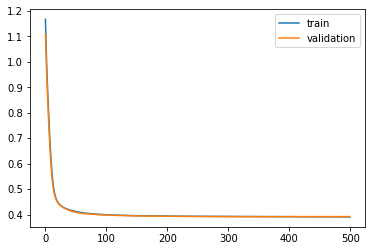

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 40s - loss: 1.1688 - val_loss: 1.0959

Epoch 00001: val_loss improved from inf to 1.09591, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0733 - val_loss: 1.0108

Epoch 00002: val_loss improved from 1.09591 to 1.01085, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9946 - val_loss: 0.9402

Epoch 00003: val_loss improved from 1.01085 to 0.94018, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9277 - val_loss: 0.8791

Epoch 00004: val_loss improved from 0.94018 to 0.87906, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8678 - val_loss: 0.8228

Epoch 00005: val_loss improved from 0.87906 to 0.82284, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8117 - val_loss: 0.7699

Epoch 00006: val_loss improved from 0.82284 to 0.76986, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7585 - val_loss: 0.7207

Epoch 00007: val_loss improved from 0.76986

 - 1s - loss: 0.4081 - val_loss: 0.4154

Epoch 00058: val_loss improved from 0.41583 to 0.41540, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4078 - val_loss: 0.4151

Epoch 00059: val_loss improved from 0.41540 to 0.41514, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4074 - val_loss: 0.4149

Epoch 00060: val_loss improved from 0.41514 to 0.41488, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4071 - val_loss: 0.4147

Epoch 00061: val_loss improved from 0.41488 to 0.41470, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4068 - val_loss: 0.4142

Epoch 00062: val_loss improved from 0.41470 to 0.41418, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4065 - val_loss: 0.4142

Epoch 00063: val_loss improved from 0.41418 to 0.41415, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4062 - val_loss: 0.4138

Epoch 00064: val_loss improved from 0.41415 to 0.41383, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.3970 - val_loss: 0.4067

Epoch 00120: val_loss did not improve from 0.40652
Epoch 121/500
 - 1s - loss: 0.3969 - val_loss: 0.4064

Epoch 00121: val_loss improved from 0.40652 to 0.40639, saving model to val_weights3.hdf5
Epoch 122/500
 - 1s - loss: 0.3969 - val_loss: 0.4064

Epoch 00122: val_loss did not improve from 0.40639
Epoch 123/500
 - 1s - loss: 0.3967 - val_loss: 0.4061

Epoch 00123: val_loss improved from 0.40639 to 0.40612, saving model to val_weights3.hdf5
Epoch 124/500
 - 1s - loss: 0.3967 - val_loss: 0.4064

Epoch 00124: val_loss did not improve from 0.40612
Epoch 125/500
 - 1s - loss: 0.3965 - val_loss: 0.4060

Epoch 00125: val_loss improved from 0.40612 to 0.40599, saving model to val_weights3.hdf5
Epoch 126/500
 - 1s - loss: 0.3965 - val_loss: 0.4061

Epoch 00126: val_loss did not improve from 0.40599
Epoch 127/500
 - 1s - loss: 0.3964 - val_loss: 0.4061

Epoch 00127: val_loss did not improve from 0.40599
Epoch 128/500
 - 1s - loss: 0.3963 - val_loss: 0.

 - 1s - loss: 0.3936 - val_loss: 0.4041

Epoch 00190: val_loss did not improve from 0.40359
Epoch 191/500
 - 1s - loss: 0.3936 - val_loss: 0.4037

Epoch 00191: val_loss did not improve from 0.40359
Epoch 192/500
 - 1s - loss: 0.3937 - val_loss: 0.4041

Epoch 00192: val_loss did not improve from 0.40359
Epoch 193/500
 - 1s - loss: 0.3937 - val_loss: 0.4038

Epoch 00193: val_loss did not improve from 0.40359
Epoch 194/500
 - 1s - loss: 0.3936 - val_loss: 0.4037

Epoch 00194: val_loss did not improve from 0.40359
Epoch 195/500
 - 1s - loss: 0.3935 - val_loss: 0.4037

Epoch 00195: val_loss did not improve from 0.40359
Epoch 196/500
 - 1s - loss: 0.3935 - val_loss: 0.4037

Epoch 00196: val_loss did not improve from 0.40359
Epoch 197/500
 - 1s - loss: 0.3935 - val_loss: 0.4038

Epoch 00197: val_loss did not improve from 0.40359
Epoch 198/500
 - 1s - loss: 0.3935 - val_loss: 0.4039

Epoch 00198: val_loss did not improve from 0.40359
Epoch 199/500
 - 1s - loss: 0.3934 - val_loss: 0.4034

Epoch

 - 1s - loss: 0.3925 - val_loss: 0.4028

Epoch 00264: val_loss did not improve from 0.40250
Epoch 265/500
 - 1s - loss: 0.3924 - val_loss: 0.4024

Epoch 00265: val_loss improved from 0.40250 to 0.40240, saving model to val_weights3.hdf5
Epoch 266/500
 - 1s - loss: 0.3924 - val_loss: 0.4029

Epoch 00266: val_loss did not improve from 0.40240
Epoch 267/500
 - 1s - loss: 0.3925 - val_loss: 0.4028

Epoch 00267: val_loss did not improve from 0.40240
Epoch 268/500
 - 1s - loss: 0.3923 - val_loss: 0.4029

Epoch 00268: val_loss did not improve from 0.40240
Epoch 269/500
 - 1s - loss: 0.3925 - val_loss: 0.4029

Epoch 00269: val_loss did not improve from 0.40240
Epoch 270/500
 - 1s - loss: 0.3923 - val_loss: 0.4031

Epoch 00270: val_loss did not improve from 0.40240
Epoch 271/500
 - 1s - loss: 0.3925 - val_loss: 0.4028

Epoch 00271: val_loss did not improve from 0.40240
Epoch 272/500
 - 1s - loss: 0.3924 - val_loss: 0.4030

Epoch 00272: val_loss did not improve from 0.40240
Epoch 273/500
 - 1s -

 - 1s - loss: 0.3916 - val_loss: 0.4019

Epoch 00338: val_loss did not improve from 0.40173
Epoch 339/500
 - 1s - loss: 0.3917 - val_loss: 0.4020

Epoch 00339: val_loss did not improve from 0.40173
Epoch 340/500
 - 1s - loss: 0.3916 - val_loss: 0.4019

Epoch 00340: val_loss did not improve from 0.40173
Epoch 341/500
 - 1s - loss: 0.3916 - val_loss: 0.4023

Epoch 00341: val_loss did not improve from 0.40173
Epoch 342/500
 - 1s - loss: 0.3916 - val_loss: 0.4017

Epoch 00342: val_loss did not improve from 0.40173
Epoch 343/500
 - 1s - loss: 0.3916 - val_loss: 0.4018

Epoch 00343: val_loss did not improve from 0.40173
Epoch 344/500
 - 1s - loss: 0.3916 - val_loss: 0.4018

Epoch 00344: val_loss did not improve from 0.40173
Epoch 345/500
 - 1s - loss: 0.3916 - val_loss: 0.4021

Epoch 00345: val_loss did not improve from 0.40173
Epoch 346/500
 - 1s - loss: 0.3916 - val_loss: 0.4020

Epoch 00346: val_loss did not improve from 0.40173
Epoch 347/500
 - 1s - loss: 0.3915 - val_loss: 0.4017

Epoch


Epoch 00414: val_loss improved from 0.40116 to 0.40069, saving model to val_weights3.hdf5
Epoch 415/500
 - 1s - loss: 0.3910 - val_loss: 0.4012

Epoch 00415: val_loss did not improve from 0.40069
Epoch 416/500
 - 1s - loss: 0.3909 - val_loss: 0.4014

Epoch 00416: val_loss did not improve from 0.40069
Epoch 417/500
 - 1s - loss: 0.3911 - val_loss: 0.4015

Epoch 00417: val_loss did not improve from 0.40069
Epoch 418/500
 - 1s - loss: 0.3909 - val_loss: 0.4013

Epoch 00418: val_loss did not improve from 0.40069
Epoch 419/500
 - 1s - loss: 0.3911 - val_loss: 0.4011

Epoch 00419: val_loss did not improve from 0.40069
Epoch 420/500
 - 1s - loss: 0.3909 - val_loss: 0.4010

Epoch 00420: val_loss did not improve from 0.40069
Epoch 421/500
 - 1s - loss: 0.3909 - val_loss: 0.4010

Epoch 00421: val_loss did not improve from 0.40069
Epoch 422/500
 - 1s - loss: 0.3907 - val_loss: 0.4015

Epoch 00422: val_loss did not improve from 0.40069
Epoch 423/500
 - 1s - loss: 0.3910 - val_loss: 0.4015

Epoch 

 - 1s - loss: 0.3903 - val_loss: 0.4009

Epoch 00491: val_loss did not improve from 0.40065
Epoch 492/500
 - 1s - loss: 0.3902 - val_loss: 0.4010

Epoch 00492: val_loss did not improve from 0.40065
Epoch 493/500
 - 1s - loss: 0.3904 - val_loss: 0.4009

Epoch 00493: val_loss did not improve from 0.40065
Epoch 494/500
 - 1s - loss: 0.3901 - val_loss: 0.4007

Epoch 00494: val_loss did not improve from 0.40065
Epoch 495/500
 - 1s - loss: 0.3904 - val_loss: 0.4009

Epoch 00495: val_loss did not improve from 0.40065
Epoch 496/500
 - 1s - loss: 0.3901 - val_loss: 0.4010

Epoch 00496: val_loss did not improve from 0.40065
Epoch 497/500
 - 1s - loss: 0.3903 - val_loss: 0.4009

Epoch 00497: val_loss did not improve from 0.40065
Epoch 498/500
 - 1s - loss: 0.3902 - val_loss: 0.4012

Epoch 00498: val_loss did not improve from 0.40065
Epoch 499/500
 - 1s - loss: 0.3905 - val_loss: 0.4012

Epoch 00499: val_loss did not improve from 0.40065
Epoch 500/500
 - 1s - loss: 0.3904 - val_loss: 0.4011

Epoch

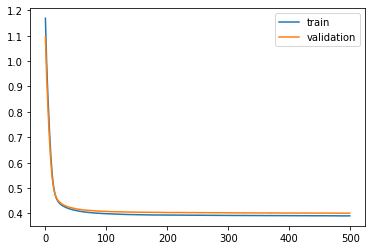

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 40s - loss: 1.1681 - val_loss: 1.1016

Epoch 00001: val_loss improved from inf to 1.10158, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0726 - val_loss: 1.0160

Epoch 00002: val_loss improved from 1.10158 to 1.01601, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9940 - val_loss: 0.9452

Epoch 00003: val_loss improved from 1.01601 to 0.94517, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9272 - val_loss: 0.8830

Epoch 00004: val_loss improved from 0.94517 to 0.88303, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8671 - val_loss: 0.8254

Epoch 00005: val_loss improved from 0.88303 to 0.82539, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8112 - val_loss: 0.7708

Epoch 00006: val_loss improved from 0.82539 to 0.77084, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7583 - val_loss: 0.7196

Epoch 00007: val_loss improved from 0.77084

 - 1s - loss: 0.4090 - val_loss: 0.4080

Epoch 00058: val_loss improved from 0.40863 to 0.40797, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4086 - val_loss: 0.4079

Epoch 00059: val_loss improved from 0.40797 to 0.40795, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4084 - val_loss: 0.4074

Epoch 00060: val_loss improved from 0.40795 to 0.40739, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4079 - val_loss: 0.4070

Epoch 00061: val_loss improved from 0.40739 to 0.40703, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4076 - val_loss: 0.4067

Epoch 00062: val_loss improved from 0.40703 to 0.40668, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4072 - val_loss: 0.4063

Epoch 00063: val_loss improved from 0.40668 to 0.40627, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4069 - val_loss: 0.4062

Epoch 00064: val_loss improved from 0.40627 to 0.40616, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.3979 - val_loss: 0.3965

Epoch 00120: val_loss improved from 0.39681 to 0.39645, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.3978 - val_loss: 0.3967

Epoch 00121: val_loss did not improve from 0.39645
Epoch 122/500
 - 1s - loss: 0.3976 - val_loss: 0.3963

Epoch 00122: val_loss improved from 0.39645 to 0.39634, saving model to val_weights4.hdf5
Epoch 123/500
 - 1s - loss: 0.3974 - val_loss: 0.3965

Epoch 00123: val_loss did not improve from 0.39634
Epoch 124/500
 - 1s - loss: 0.3975 - val_loss: 0.3963

Epoch 00124: val_loss did not improve from 0.39634
Epoch 125/500
 - 1s - loss: 0.3973 - val_loss: 0.3964

Epoch 00125: val_loss did not improve from 0.39634
Epoch 126/500
 - 1s - loss: 0.3974 - val_loss: 0.3963

Epoch 00126: val_loss improved from 0.39634 to 0.39627, saving model to val_weights4.hdf5
Epoch 127/500
 - 1s - loss: 0.3972 - val_loss: 0.3967

Epoch 00127: val_loss did not improve from 0.39627
Epoch 128/500
 - 1s - loss: 0.3973 - val_loss: 0.


Epoch 00190: val_loss improved from 0.39452 to 0.39444, saving model to val_weights4.hdf5
Epoch 191/500
 - 1s - loss: 0.3948 - val_loss: 0.3944

Epoch 00191: val_loss did not improve from 0.39444
Epoch 192/500
 - 1s - loss: 0.3947 - val_loss: 0.3944

Epoch 00192: val_loss improved from 0.39444 to 0.39437, saving model to val_weights4.hdf5
Epoch 193/500
 - 1s - loss: 0.3945 - val_loss: 0.3942

Epoch 00193: val_loss improved from 0.39437 to 0.39424, saving model to val_weights4.hdf5
Epoch 194/500
 - 1s - loss: 0.3944 - val_loss: 0.3946

Epoch 00194: val_loss did not improve from 0.39424
Epoch 195/500
 - 1s - loss: 0.3945 - val_loss: 0.3942

Epoch 00195: val_loss improved from 0.39424 to 0.39419, saving model to val_weights4.hdf5
Epoch 196/500
 - 1s - loss: 0.3943 - val_loss: 0.3943

Epoch 00196: val_loss did not improve from 0.39419
Epoch 197/500
 - 1s - loss: 0.3943 - val_loss: 0.3945

Epoch 00197: val_loss did not improve from 0.39419
Epoch 198/500
 - 1s - loss: 0.3943 - val_loss: 0.3

 - 1s - loss: 0.3936 - val_loss: 0.3944

Epoch 00264: val_loss did not improve from 0.39368
Epoch 265/500
 - 1s - loss: 0.3936 - val_loss: 0.3940

Epoch 00265: val_loss did not improve from 0.39368
Epoch 266/500
 - 1s - loss: 0.3937 - val_loss: 0.3942

Epoch 00266: val_loss did not improve from 0.39368
Epoch 267/500
 - 1s - loss: 0.3935 - val_loss: 0.3937

Epoch 00267: val_loss improved from 0.39368 to 0.39366, saving model to val_weights4.hdf5
Epoch 268/500
 - 1s - loss: 0.3934 - val_loss: 0.3942

Epoch 00268: val_loss did not improve from 0.39366
Epoch 269/500
 - 1s - loss: 0.3935 - val_loss: 0.3942

Epoch 00269: val_loss did not improve from 0.39366
Epoch 270/500
 - 1s - loss: 0.3935 - val_loss: 0.3940

Epoch 00270: val_loss did not improve from 0.39366
Epoch 271/500
 - 1s - loss: 0.3935 - val_loss: 0.3941

Epoch 00271: val_loss did not improve from 0.39366
Epoch 272/500
 - 1s - loss: 0.3935 - val_loss: 0.3938

Epoch 00272: val_loss did not improve from 0.39366
Epoch 273/500
 - 1s -


Epoch 00339: val_loss did not improve from 0.39297
Epoch 340/500
 - 1s - loss: 0.3929 - val_loss: 0.3935

Epoch 00340: val_loss did not improve from 0.39297
Epoch 341/500
 - 1s - loss: 0.3929 - val_loss: 0.3935

Epoch 00341: val_loss did not improve from 0.39297
Epoch 342/500
 - 1s - loss: 0.3929 - val_loss: 0.3936

Epoch 00342: val_loss did not improve from 0.39297
Epoch 343/500
 - 1s - loss: 0.3929 - val_loss: 0.3934

Epoch 00343: val_loss did not improve from 0.39297
Epoch 344/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00344: val_loss did not improve from 0.39297
Epoch 345/500
 - 1s - loss: 0.3930 - val_loss: 0.3936

Epoch 00345: val_loss did not improve from 0.39297
Epoch 346/500
 - 1s - loss: 0.3929 - val_loss: 0.3934

Epoch 00346: val_loss did not improve from 0.39297
Epoch 347/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00347: val_loss did not improve from 0.39297
Epoch 348/500
 - 1s - loss: 0.3929 - val_loss: 0.3936

Epoch 00348: val_loss did not improve from 0.


Epoch 00415: val_loss did not improve from 0.39262
Epoch 416/500
 - 1s - loss: 0.3923 - val_loss: 0.3933

Epoch 00416: val_loss did not improve from 0.39262
Epoch 417/500
 - 1s - loss: 0.3922 - val_loss: 0.3929

Epoch 00417: val_loss did not improve from 0.39262
Epoch 418/500
 - 1s - loss: 0.3922 - val_loss: 0.3933

Epoch 00418: val_loss did not improve from 0.39262
Epoch 419/500
 - 1s - loss: 0.3922 - val_loss: 0.3933

Epoch 00419: val_loss did not improve from 0.39262
Epoch 420/500
 - 1s - loss: 0.3921 - val_loss: 0.3930

Epoch 00420: val_loss did not improve from 0.39262
Epoch 421/500
 - 1s - loss: 0.3920 - val_loss: 0.3929

Epoch 00421: val_loss did not improve from 0.39262
Epoch 422/500
 - 1s - loss: 0.3921 - val_loss: 0.3934

Epoch 00422: val_loss did not improve from 0.39262
Epoch 423/500
 - 1s - loss: 0.3921 - val_loss: 0.3931

Epoch 00423: val_loss did not improve from 0.39262
Epoch 424/500
 - 1s - loss: 0.3921 - val_loss: 0.3933

Epoch 00424: val_loss did not improve from 0.

 - 1s - loss: 0.3915 - val_loss: 0.3923

Epoch 00491: val_loss did not improve from 0.39210
Epoch 492/500
 - 1s - loss: 0.3915 - val_loss: 0.3928

Epoch 00492: val_loss did not improve from 0.39210
Epoch 493/500
 - 1s - loss: 0.3915 - val_loss: 0.3927

Epoch 00493: val_loss did not improve from 0.39210
Epoch 494/500
 - 1s - loss: 0.3917 - val_loss: 0.3929

Epoch 00494: val_loss did not improve from 0.39210
Epoch 495/500
 - 1s - loss: 0.3914 - val_loss: 0.3926

Epoch 00495: val_loss did not improve from 0.39210
Epoch 496/500
 - 1s - loss: 0.3915 - val_loss: 0.3926

Epoch 00496: val_loss did not improve from 0.39210
Epoch 497/500
 - 1s - loss: 0.3917 - val_loss: 0.3928

Epoch 00497: val_loss did not improve from 0.39210
Epoch 498/500
 - 1s - loss: 0.3914 - val_loss: 0.3922

Epoch 00498: val_loss did not improve from 0.39210
Epoch 499/500
 - 1s - loss: 0.3915 - val_loss: 0.3928

Epoch 00499: val_loss did not improve from 0.39210
Epoch 500/500
 - 1s - loss: 0.3915 - val_loss: 0.3923

Epoch

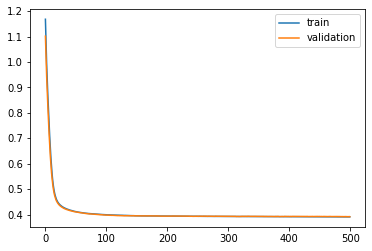

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 40s - loss: 1.1684 - val_loss: 1.0997

Epoch 00001: val_loss improved from inf to 1.09969, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0729 - val_loss: 1.0157

Epoch 00002: val_loss improved from 1.09969 to 1.01570, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9942 - val_loss: 0.9458

Epoch 00003: val_loss improved from 1.01570 to 0.94585, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9274 - val_loss: 0.8843

Epoch 00004: val_loss improved from 0.94585 to 0.88431, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8674 - val_loss: 0.8280

Epoch 00005: val_loss improved from 0.88431 to 0.82800, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8114 - val_loss: 0.7747

Epoch 00006: val_loss improved from 0.82800 to 0.77470, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7583 - val_loss: 0.7240

Epoch 00007: val_loss improved from 0.77470

 - 1s - loss: 0.4085 - val_loss: 0.4122

Epoch 00058: val_loss did not improve from 0.41206
Epoch 59/500
 - 1s - loss: 0.4082 - val_loss: 0.4117

Epoch 00059: val_loss improved from 0.41206 to 0.41173, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4078 - val_loss: 0.4116

Epoch 00060: val_loss improved from 0.41173 to 0.41162, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4074 - val_loss: 0.4114

Epoch 00061: val_loss improved from 0.41162 to 0.41139, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4071 - val_loss: 0.4108

Epoch 00062: val_loss improved from 0.41139 to 0.41081, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4068 - val_loss: 0.4109

Epoch 00063: val_loss did not improve from 0.41081
Epoch 64/500
 - 1s - loss: 0.4064 - val_loss: 0.4103

Epoch 00064: val_loss improved from 0.41081 to 0.41031, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4061 - val_loss: 0.4101

Epoch 00065: val_loss improve

 - 1s - loss: 0.3974 - val_loss: 0.4023

Epoch 00121: val_loss did not improve from 0.40222
Epoch 122/500
 - 1s - loss: 0.3974 - val_loss: 0.4021

Epoch 00122: val_loss improved from 0.40222 to 0.40212, saving model to val_weights5.hdf5
Epoch 123/500
 - 1s - loss: 0.3974 - val_loss: 0.4022

Epoch 00123: val_loss did not improve from 0.40212
Epoch 124/500
 - 1s - loss: 0.3971 - val_loss: 0.4016

Epoch 00124: val_loss improved from 0.40212 to 0.40160, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3971 - val_loss: 0.4020

Epoch 00125: val_loss did not improve from 0.40160
Epoch 126/500
 - 1s - loss: 0.3970 - val_loss: 0.4019

Epoch 00126: val_loss did not improve from 0.40160
Epoch 127/500
 - 1s - loss: 0.3970 - val_loss: 0.4015

Epoch 00127: val_loss improved from 0.40160 to 0.40152, saving model to val_weights5.hdf5
Epoch 128/500
 - 1s - loss: 0.3969 - val_loss: 0.4015

Epoch 00128: val_loss improved from 0.40152 to 0.40152, saving model to val_weights5.hdf5
Epoch 129/

 - 1s - loss: 0.3942 - val_loss: 0.3987

Epoch 00191: val_loss did not improve from 0.39858
Epoch 192/500
 - 1s - loss: 0.3942 - val_loss: 0.3987

Epoch 00192: val_loss did not improve from 0.39858
Epoch 193/500
 - 1s - loss: 0.3941 - val_loss: 0.3985

Epoch 00193: val_loss improved from 0.39858 to 0.39853, saving model to val_weights5.hdf5
Epoch 194/500
 - 1s - loss: 0.3942 - val_loss: 0.3986

Epoch 00194: val_loss did not improve from 0.39853
Epoch 195/500
 - 1s - loss: 0.3940 - val_loss: 0.3985

Epoch 00195: val_loss did not improve from 0.39853
Epoch 196/500
 - 1s - loss: 0.3940 - val_loss: 0.3983

Epoch 00196: val_loss improved from 0.39853 to 0.39833, saving model to val_weights5.hdf5
Epoch 197/500
 - 1s - loss: 0.3939 - val_loss: 0.3986

Epoch 00197: val_loss did not improve from 0.39833
Epoch 198/500
 - 1s - loss: 0.3940 - val_loss: 0.3984

Epoch 00198: val_loss did not improve from 0.39833
Epoch 199/500
 - 1s - loss: 0.3939 - val_loss: 0.3983

Epoch 00199: val_loss improved fr

 - 1s - loss: 0.3930 - val_loss: 0.3976

Epoch 00265: val_loss did not improve from 0.39759
Epoch 266/500
 - 1s - loss: 0.3931 - val_loss: 0.3979

Epoch 00266: val_loss did not improve from 0.39759
Epoch 267/500
 - 1s - loss: 0.3929 - val_loss: 0.3978

Epoch 00267: val_loss did not improve from 0.39759
Epoch 268/500
 - 1s - loss: 0.3929 - val_loss: 0.3978

Epoch 00268: val_loss did not improve from 0.39759
Epoch 269/500
 - 1s - loss: 0.3929 - val_loss: 0.3978

Epoch 00269: val_loss did not improve from 0.39759
Epoch 270/500
 - 1s - loss: 0.3928 - val_loss: 0.3978

Epoch 00270: val_loss did not improve from 0.39759
Epoch 271/500
 - 1s - loss: 0.3929 - val_loss: 0.3975

Epoch 00271: val_loss improved from 0.39759 to 0.39746, saving model to val_weights5.hdf5
Epoch 272/500
 - 1s - loss: 0.3927 - val_loss: 0.3980

Epoch 00272: val_loss did not improve from 0.39746
Epoch 273/500
 - 1s - loss: 0.3931 - val_loss: 0.3979

Epoch 00273: val_loss did not improve from 0.39746
Epoch 274/500
 - 1s -

 - 1s - loss: 0.3920 - val_loss: 0.3979

Epoch 00342: val_loss did not improve from 0.39746
Epoch 343/500
 - 1s - loss: 0.3922 - val_loss: 0.3981

Epoch 00343: val_loss did not improve from 0.39746
Epoch 344/500
 - 1s - loss: 0.3921 - val_loss: 0.3977

Epoch 00344: val_loss did not improve from 0.39746
Epoch 345/500
 - 1s - loss: 0.3921 - val_loss: 0.3979

Epoch 00345: val_loss did not improve from 0.39746
Epoch 346/500
 - 1s - loss: 0.3921 - val_loss: 0.3978

Epoch 00346: val_loss did not improve from 0.39746
Epoch 347/500
 - 1s - loss: 0.3921 - val_loss: 0.3980

Epoch 00347: val_loss did not improve from 0.39746
Epoch 348/500
 - 1s - loss: 0.3920 - val_loss: 0.3979

Epoch 00348: val_loss did not improve from 0.39746
Epoch 349/500
 - 1s - loss: 0.3921 - val_loss: 0.3986

Epoch 00349: val_loss did not improve from 0.39746
Epoch 350/500
 - 1s - loss: 0.3921 - val_loss: 0.3985

Epoch 00350: val_loss did not improve from 0.39746
Epoch 351/500
 - 1s - loss: 0.3923 - val_loss: 0.3980

Epoch

 - 1s - loss: 0.3921 - val_loss: 0.3988

Epoch 00419: val_loss did not improve from 0.39730
Epoch 420/500
 - 1s - loss: 0.3922 - val_loss: 0.3990

Epoch 00420: val_loss did not improve from 0.39730
Epoch 421/500
 - 1s - loss: 0.3922 - val_loss: 0.3994

Epoch 00421: val_loss did not improve from 0.39730
Epoch 422/500
 - 1s - loss: 0.3923 - val_loss: 0.3994

Epoch 00422: val_loss did not improve from 0.39730
Epoch 423/500
 - 1s - loss: 0.3922 - val_loss: 0.3991

Epoch 00423: val_loss did not improve from 0.39730
Epoch 424/500
 - 1s - loss: 0.3925 - val_loss: 0.3990

Epoch 00424: val_loss did not improve from 0.39730
Epoch 425/500
 - 1s - loss: 0.3921 - val_loss: 0.3988

Epoch 00425: val_loss did not improve from 0.39730
Epoch 426/500
 - 1s - loss: 0.3925 - val_loss: 0.3983

Epoch 00426: val_loss did not improve from 0.39730
Epoch 427/500
 - 1s - loss: 0.3922 - val_loss: 0.3985

Epoch 00427: val_loss did not improve from 0.39730
Epoch 428/500
 - 1s - loss: 0.3923 - val_loss: 0.3985

Epoch

 - 1s - loss: 0.3914 - val_loss: 0.3982

Epoch 00496: val_loss did not improve from 0.39689
Epoch 497/500
 - 1s - loss: 0.3915 - val_loss: 0.3984

Epoch 00497: val_loss did not improve from 0.39689
Epoch 498/500
 - 1s - loss: 0.3915 - val_loss: 0.3983

Epoch 00498: val_loss did not improve from 0.39689
Epoch 499/500
 - 1s - loss: 0.3915 - val_loss: 0.3986

Epoch 00499: val_loss did not improve from 0.39689
Epoch 500/500
 - 1s - loss: 0.3915 - val_loss: 0.3988

Epoch 00500: val_loss did not improve from 0.39689
#################################
Number of units: 4
Batch size: 8192
Fold: 4
L2: 0.01019216730492731
best val loss: 0.39688946941163805
#################################
[[4, 8192, 0.007921656789898646, 0, 0.3964275896019406], [4, 8192, 0.007921656789898646, 1, 0.3918810964955224], [4, 8192, 0.007921656789898646, 2, 0.40050656101438736], [4, 8192, 0.007921656789898646, 3, 0.3915418761041429], [4, 8192, 0.007921656789898646, 4, 0.3962737381988102], [4, 8192, 0.010351554082642968,

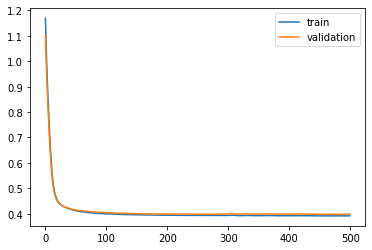

Time to train LSTM:  409.1868760585785
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 44s - loss: 1.1765 - val_loss: 1.1214

Epoch 00001: val_loss improved from inf to 1.12142, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0795 - val_loss: 1.0338

Epoch 00002: val_loss improved from 1.12142 to 1.03376, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9998 - val_loss: 0.9608

Epoch 00003: val_loss improved from 1.03376 to 0.96076, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9320 - val_loss: 0.8975

Epoch 00004: val_loss improved from 0.96076 to 0.89751, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8713 - val_loss: 0.8393

Epoch 00005: val_loss improved from 0.89751 to 0.83929, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8145 - val_loss: 0.7848

Epoch 00006: val_loss improved from 0.83929 to 0.78485, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7605 - val_loss: 0.7331

Epoc


Epoch 00057: val_loss improved from 0.41573 to 0.41546, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4083 - val_loss: 0.4150

Epoch 00058: val_loss improved from 0.41546 to 0.41496, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4080 - val_loss: 0.4144

Epoch 00059: val_loss improved from 0.41496 to 0.41436, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4076 - val_loss: 0.4144

Epoch 00060: val_loss did not improve from 0.41436
Epoch 61/500
 - 1s - loss: 0.4073 - val_loss: 0.4139

Epoch 00061: val_loss improved from 0.41436 to 0.41391, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4070 - val_loss: 0.4135

Epoch 00062: val_loss improved from 0.41391 to 0.41347, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4067 - val_loss: 0.4133

Epoch 00063: val_loss improved from 0.41347 to 0.41326, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4063 - val_loss: 0.4130

Epoch 00064: val_loss improved


Epoch 00119: val_loss did not improve from 0.40274
Epoch 120/500
 - 1s - loss: 0.3975 - val_loss: 0.4026

Epoch 00120: val_loss improved from 0.40274 to 0.40256, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.3974 - val_loss: 0.4026

Epoch 00121: val_loss did not improve from 0.40256
Epoch 122/500
 - 1s - loss: 0.3973 - val_loss: 0.4025

Epoch 00122: val_loss improved from 0.40256 to 0.40251, saving model to val_weights1.hdf5
Epoch 123/500
 - 1s - loss: 0.3973 - val_loss: 0.4027

Epoch 00123: val_loss did not improve from 0.40251
Epoch 124/500
 - 1s - loss: 0.3973 - val_loss: 0.4023

Epoch 00124: val_loss improved from 0.40251 to 0.40235, saving model to val_weights1.hdf5
Epoch 125/500
 - 1s - loss: 0.3973 - val_loss: 0.4027

Epoch 00125: val_loss did not improve from 0.40235
Epoch 126/500
 - 1s - loss: 0.3970 - val_loss: 0.4022

Epoch 00126: val_loss improved from 0.40235 to 0.40215, saving model to val_weights1.hdf5
Epoch 127/500
 - 1s - loss: 0.3970 - val_loss: 0.4

 - 1s - loss: 0.3942 - val_loss: 0.3996

Epoch 00189: val_loss did not improve from 0.39922
Epoch 190/500
 - 1s - loss: 0.3942 - val_loss: 0.3993

Epoch 00190: val_loss did not improve from 0.39922
Epoch 191/500
 - 1s - loss: 0.3940 - val_loss: 0.3994

Epoch 00191: val_loss did not improve from 0.39922
Epoch 192/500
 - 1s - loss: 0.3939 - val_loss: 0.3990

Epoch 00192: val_loss improved from 0.39922 to 0.39903, saving model to val_weights1.hdf5
Epoch 193/500
 - 1s - loss: 0.3939 - val_loss: 0.3995

Epoch 00193: val_loss did not improve from 0.39903
Epoch 194/500
 - 1s - loss: 0.3939 - val_loss: 0.3991

Epoch 00194: val_loss did not improve from 0.39903
Epoch 195/500
 - 1s - loss: 0.3939 - val_loss: 0.3992

Epoch 00195: val_loss did not improve from 0.39903
Epoch 196/500
 - 1s - loss: 0.3939 - val_loss: 0.3992

Epoch 00196: val_loss did not improve from 0.39903
Epoch 197/500
 - 1s - loss: 0.3939 - val_loss: 0.3993

Epoch 00197: val_loss did not improve from 0.39903
Epoch 198/500
 - 1s -

 - 1s - loss: 0.3928 - val_loss: 0.3984

Epoch 00264: val_loss did not improve from 0.39791
Epoch 265/500
 - 1s - loss: 0.3929 - val_loss: 0.3983

Epoch 00265: val_loss did not improve from 0.39791
Epoch 266/500
 - 1s - loss: 0.3929 - val_loss: 0.3979

Epoch 00266: val_loss improved from 0.39791 to 0.39788, saving model to val_weights1.hdf5
Epoch 267/500
 - 1s - loss: 0.3930 - val_loss: 0.3983

Epoch 00267: val_loss did not improve from 0.39788
Epoch 268/500
 - 1s - loss: 0.3927 - val_loss: 0.3984

Epoch 00268: val_loss did not improve from 0.39788
Epoch 269/500
 - 1s - loss: 0.3928 - val_loss: 0.3977

Epoch 00269: val_loss improved from 0.39788 to 0.39775, saving model to val_weights1.hdf5
Epoch 270/500
 - 1s - loss: 0.3926 - val_loss: 0.3980

Epoch 00270: val_loss did not improve from 0.39775
Epoch 271/500
 - 1s - loss: 0.3928 - val_loss: 0.3982

Epoch 00271: val_loss did not improve from 0.39775
Epoch 272/500
 - 1s - loss: 0.3928 - val_loss: 0.3982

Epoch 00272: val_loss did not imp

 - 1s - loss: 0.3920 - val_loss: 0.3974

Epoch 00339: val_loss did not improve from 0.39705
Epoch 340/500
 - 1s - loss: 0.3922 - val_loss: 0.3980

Epoch 00340: val_loss did not improve from 0.39705
Epoch 341/500
 - 1s - loss: 0.3922 - val_loss: 0.3974

Epoch 00341: val_loss did not improve from 0.39705
Epoch 342/500
 - 1s - loss: 0.3922 - val_loss: 0.3982

Epoch 00342: val_loss did not improve from 0.39705
Epoch 343/500
 - 1s - loss: 0.3923 - val_loss: 0.3978

Epoch 00343: val_loss did not improve from 0.39705
Epoch 344/500
 - 1s - loss: 0.3922 - val_loss: 0.3974

Epoch 00344: val_loss did not improve from 0.39705
Epoch 345/500
 - 1s - loss: 0.3922 - val_loss: 0.3977

Epoch 00345: val_loss did not improve from 0.39705
Epoch 346/500
 - 1s - loss: 0.3921 - val_loss: 0.3973

Epoch 00346: val_loss did not improve from 0.39705
Epoch 347/500
 - 1s - loss: 0.3920 - val_loss: 0.3976

Epoch 00347: val_loss did not improve from 0.39705
Epoch 348/500
 - 1s - loss: 0.3920 - val_loss: 0.3974

Epoch


Epoch 00415: val_loss did not improve from 0.39677
Epoch 416/500
 - 1s - loss: 0.3913 - val_loss: 0.3971

Epoch 00416: val_loss did not improve from 0.39677
Epoch 417/500
 - 1s - loss: 0.3913 - val_loss: 0.3975

Epoch 00417: val_loss did not improve from 0.39677
Epoch 418/500
 - 1s - loss: 0.3911 - val_loss: 0.3971

Epoch 00418: val_loss did not improve from 0.39677
Epoch 419/500
 - 1s - loss: 0.3913 - val_loss: 0.3973

Epoch 00419: val_loss did not improve from 0.39677
Epoch 420/500
 - 1s - loss: 0.3909 - val_loss: 0.3971

Epoch 00420: val_loss did not improve from 0.39677
Epoch 421/500
 - 1s - loss: 0.3912 - val_loss: 0.3972

Epoch 00421: val_loss did not improve from 0.39677
Epoch 422/500
 - 1s - loss: 0.3912 - val_loss: 0.3973

Epoch 00422: val_loss did not improve from 0.39677
Epoch 423/500
 - 1s - loss: 0.3913 - val_loss: 0.3975

Epoch 00423: val_loss did not improve from 0.39677
Epoch 424/500
 - 1s - loss: 0.3911 - val_loss: 0.3972

Epoch 00424: val_loss did not improve from 0.

 - 1s - loss: 0.3906 - val_loss: 0.3971

Epoch 00492: val_loss did not improve from 0.39660
Epoch 493/500
 - 1s - loss: 0.3907 - val_loss: 0.3969

Epoch 00493: val_loss did not improve from 0.39660
Epoch 494/500
 - 1s - loss: 0.3906 - val_loss: 0.3971

Epoch 00494: val_loss did not improve from 0.39660
Epoch 495/500
 - 1s - loss: 0.3906 - val_loss: 0.3975

Epoch 00495: val_loss did not improve from 0.39660
Epoch 496/500
 - 1s - loss: 0.3906 - val_loss: 0.3968

Epoch 00496: val_loss did not improve from 0.39660
Epoch 497/500
 - 1s - loss: 0.3905 - val_loss: 0.3970

Epoch 00497: val_loss did not improve from 0.39660
Epoch 498/500
 - 1s - loss: 0.3905 - val_loss: 0.3971

Epoch 00498: val_loss did not improve from 0.39660
Epoch 499/500
 - 1s - loss: 0.3905 - val_loss: 0.3967

Epoch 00499: val_loss did not improve from 0.39660
Epoch 500/500
 - 1s - loss: 0.3906 - val_loss: 0.3968

Epoch 00500: val_loss did not improve from 0.39660
#################################
Number of units: 4
Batch s

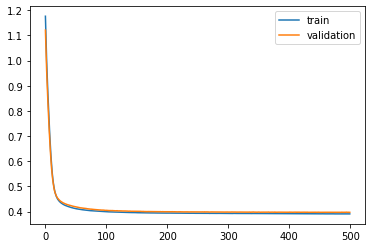

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 42s - loss: 1.1771 - val_loss: 1.1169

Epoch 00001: val_loss improved from inf to 1.11694, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0800 - val_loss: 1.0322

Epoch 00002: val_loss improved from 1.11694 to 1.03224, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.0000 - val_loss: 0.9608

Epoch 00003: val_loss improved from 1.03224 to 0.96079, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9320 - val_loss: 0.8976

Epoch 00004: val_loss improved from 0.96079 to 0.89759, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8712 - val_loss: 0.8388

Epoch 00005: val_loss improved from 0.89759 to 0.83879, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8144 - val_loss: 0.7827

Epoch 00006: val_loss improved from 0.83879 to 0.78267, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7607 - val_loss: 0.7300

Epoch 00007: val_loss improved from 0.78267

 - 1s - loss: 0.4089 - val_loss: 0.4060

Epoch 00058: val_loss improved from 0.40652 to 0.40602, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4084 - val_loss: 0.4056

Epoch 00059: val_loss improved from 0.40602 to 0.40562, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4081 - val_loss: 0.4055

Epoch 00060: val_loss improved from 0.40562 to 0.40549, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4077 - val_loss: 0.4050

Epoch 00061: val_loss improved from 0.40549 to 0.40500, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4075 - val_loss: 0.4047

Epoch 00062: val_loss improved from 0.40500 to 0.40470, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4071 - val_loss: 0.4045

Epoch 00063: val_loss improved from 0.40470 to 0.40450, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4068 - val_loss: 0.4043

Epoch 00064: val_loss improved from 0.40450 to 0.40432, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3978 - val_loss: 0.3972

Epoch 00121: val_loss did not improve from 0.39697
Epoch 122/500
 - 1s - loss: 0.3977 - val_loss: 0.3969

Epoch 00122: val_loss improved from 0.39697 to 0.39695, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3975 - val_loss: 0.3966

Epoch 00123: val_loss improved from 0.39695 to 0.39661, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3974 - val_loss: 0.3964

Epoch 00124: val_loss improved from 0.39661 to 0.39644, saving model to val_weights2.hdf5
Epoch 125/500
 - 1s - loss: 0.3973 - val_loss: 0.3967

Epoch 00125: val_loss did not improve from 0.39644
Epoch 126/500
 - 1s - loss: 0.3973 - val_loss: 0.3963

Epoch 00126: val_loss improved from 0.39644 to 0.39635, saving model to val_weights2.hdf5
Epoch 127/500
 - 1s - loss: 0.3973 - val_loss: 0.3964

Epoch 00127: val_loss did not improve from 0.39635
Epoch 128/500
 - 1s - loss: 0.3972 - val_loss: 0.3964

Epoch 00128: val_loss did not improve from 0.39635
Epoch 129/

 - 1s - loss: 0.3946 - val_loss: 0.3945

Epoch 00189: val_loss did not improve from 0.39369
Epoch 190/500
 - 1s - loss: 0.3945 - val_loss: 0.3937

Epoch 00190: val_loss did not improve from 0.39369
Epoch 191/500
 - 1s - loss: 0.3947 - val_loss: 0.3936

Epoch 00191: val_loss improved from 0.39369 to 0.39360, saving model to val_weights2.hdf5
Epoch 192/500
 - 1s - loss: 0.3947 - val_loss: 0.3939

Epoch 00192: val_loss did not improve from 0.39360
Epoch 193/500
 - 1s - loss: 0.3946 - val_loss: 0.3939

Epoch 00193: val_loss did not improve from 0.39360
Epoch 194/500
 - 1s - loss: 0.3945 - val_loss: 0.3936

Epoch 00194: val_loss improved from 0.39360 to 0.39356, saving model to val_weights2.hdf5
Epoch 195/500
 - 1s - loss: 0.3945 - val_loss: 0.3940

Epoch 00195: val_loss did not improve from 0.39356
Epoch 196/500
 - 1s - loss: 0.3944 - val_loss: 0.3938

Epoch 00196: val_loss did not improve from 0.39356
Epoch 197/500
 - 1s - loss: 0.3944 - val_loss: 0.3942

Epoch 00197: val_loss did not imp

 - 1s - loss: 0.3933 - val_loss: 0.3926

Epoch 00262: val_loss did not improve from 0.39254
Epoch 263/500
 - 1s - loss: 0.3934 - val_loss: 0.3927

Epoch 00263: val_loss did not improve from 0.39254
Epoch 264/500
 - 1s - loss: 0.3934 - val_loss: 0.3927

Epoch 00264: val_loss did not improve from 0.39254
Epoch 265/500
 - 1s - loss: 0.3934 - val_loss: 0.3927

Epoch 00265: val_loss did not improve from 0.39254
Epoch 266/500
 - 1s - loss: 0.3934 - val_loss: 0.3925

Epoch 00266: val_loss improved from 0.39254 to 0.39250, saving model to val_weights2.hdf5
Epoch 267/500
 - 1s - loss: 0.3934 - val_loss: 0.3925

Epoch 00267: val_loss improved from 0.39250 to 0.39249, saving model to val_weights2.hdf5
Epoch 268/500
 - 1s - loss: 0.3933 - val_loss: 0.3928

Epoch 00268: val_loss did not improve from 0.39249
Epoch 269/500
 - 1s - loss: 0.3934 - val_loss: 0.3924

Epoch 00269: val_loss improved from 0.39249 to 0.39241, saving model to val_weights2.hdf5
Epoch 270/500
 - 1s - loss: 0.3932 - val_loss: 0.

 - 1s - loss: 0.3926 - val_loss: 0.3922

Epoch 00334: val_loss did not improve from 0.39147
Epoch 335/500
 - 1s - loss: 0.3928 - val_loss: 0.3919

Epoch 00335: val_loss did not improve from 0.39147
Epoch 336/500
 - 1s - loss: 0.3927 - val_loss: 0.3921

Epoch 00336: val_loss did not improve from 0.39147
Epoch 337/500
 - 1s - loss: 0.3927 - val_loss: 0.3917

Epoch 00337: val_loss did not improve from 0.39147
Epoch 338/500
 - 1s - loss: 0.3926 - val_loss: 0.3918

Epoch 00338: val_loss did not improve from 0.39147
Epoch 339/500
 - 1s - loss: 0.3926 - val_loss: 0.3920

Epoch 00339: val_loss did not improve from 0.39147
Epoch 340/500
 - 1s - loss: 0.3926 - val_loss: 0.3918

Epoch 00340: val_loss did not improve from 0.39147
Epoch 341/500
 - 1s - loss: 0.3926 - val_loss: 0.3916

Epoch 00341: val_loss did not improve from 0.39147
Epoch 342/500
 - 1s - loss: 0.3926 - val_loss: 0.3923

Epoch 00342: val_loss did not improve from 0.39147
Epoch 343/500
 - 1s - loss: 0.3926 - val_loss: 0.3917

Epoch


Epoch 00410: val_loss did not improve from 0.39129
Epoch 411/500
 - 1s - loss: 0.3920 - val_loss: 0.3920

Epoch 00411: val_loss did not improve from 0.39129
Epoch 412/500
 - 1s - loss: 0.3919 - val_loss: 0.3922

Epoch 00412: val_loss did not improve from 0.39129
Epoch 413/500
 - 1s - loss: 0.3920 - val_loss: 0.3919

Epoch 00413: val_loss did not improve from 0.39129
Epoch 414/500
 - 1s - loss: 0.3918 - val_loss: 0.3923

Epoch 00414: val_loss did not improve from 0.39129
Epoch 415/500
 - 1s - loss: 0.3920 - val_loss: 0.3922

Epoch 00415: val_loss did not improve from 0.39129
Epoch 416/500
 - 1s - loss: 0.3919 - val_loss: 0.3924

Epoch 00416: val_loss did not improve from 0.39129
Epoch 417/500
 - 1s - loss: 0.3918 - val_loss: 0.3920

Epoch 00417: val_loss did not improve from 0.39129
Epoch 418/500
 - 1s - loss: 0.3918 - val_loss: 0.3922

Epoch 00418: val_loss did not improve from 0.39129
Epoch 419/500
 - 1s - loss: 0.3919 - val_loss: 0.3919

Epoch 00419: val_loss did not improve from 0.

 - 1s - loss: 0.3912 - val_loss: 0.3922

Epoch 00488: val_loss did not improve from 0.39129
Epoch 489/500
 - 1s - loss: 0.3914 - val_loss: 0.3924

Epoch 00489: val_loss did not improve from 0.39129
Epoch 490/500
 - 1s - loss: 0.3913 - val_loss: 0.3922

Epoch 00490: val_loss did not improve from 0.39129
Epoch 491/500
 - 1s - loss: 0.3912 - val_loss: 0.3920

Epoch 00491: val_loss did not improve from 0.39129
Epoch 492/500
 - 1s - loss: 0.3911 - val_loss: 0.3923

Epoch 00492: val_loss did not improve from 0.39129
Epoch 493/500
 - 1s - loss: 0.3913 - val_loss: 0.3921

Epoch 00493: val_loss did not improve from 0.39129
Epoch 494/500
 - 1s - loss: 0.3913 - val_loss: 0.3922

Epoch 00494: val_loss did not improve from 0.39129
Epoch 495/500
 - 1s - loss: 0.3913 - val_loss: 0.3923

Epoch 00495: val_loss did not improve from 0.39129
Epoch 496/500
 - 1s - loss: 0.3913 - val_loss: 0.3924

Epoch 00496: val_loss did not improve from 0.39129
Epoch 497/500
 - 1s - loss: 0.3914 - val_loss: 0.3924

Epoch

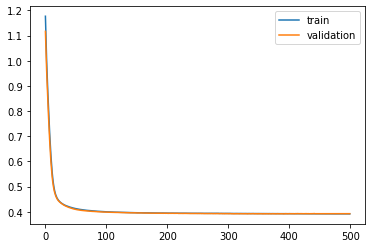

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 42s - loss: 1.1785 - val_loss: 1.1049

Epoch 00001: val_loss improved from inf to 1.10486, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0817 - val_loss: 1.0185

Epoch 00002: val_loss improved from 1.10486 to 1.01850, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.0017 - val_loss: 0.9466

Epoch 00003: val_loss improved from 1.01850 to 0.94660, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9337 - val_loss: 0.8844

Epoch 00004: val_loss improved from 0.94660 to 0.88440, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8728 - val_loss: 0.8272

Epoch 00005: val_loss improved from 0.88440 to 0.82723, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8158 - val_loss: 0.7734

Epoch 00006: val_loss improved from 0.82723 to 0.77340, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7618 - val_loss: 0.7235

Epoch 00007: val_loss improved from 0.77340

 - 1s - loss: 0.4082 - val_loss: 0.4154

Epoch 00058: val_loss improved from 0.41569 to 0.41538, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4080 - val_loss: 0.4150

Epoch 00059: val_loss improved from 0.41538 to 0.41503, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4077 - val_loss: 0.4147

Epoch 00060: val_loss improved from 0.41503 to 0.41474, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4072 - val_loss: 0.4145

Epoch 00061: val_loss improved from 0.41474 to 0.41450, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4069 - val_loss: 0.4142

Epoch 00062: val_loss improved from 0.41450 to 0.41422, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4066 - val_loss: 0.4139

Epoch 00063: val_loss improved from 0.41422 to 0.41394, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4061 - val_loss: 0.4137

Epoch 00064: val_loss improved from 0.41394 to 0.41366, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.3970 - val_loss: 0.4065

Epoch 00120: val_loss improved from 0.40655 to 0.40655, saving model to val_weights3.hdf5
Epoch 121/500
 - 1s - loss: 0.3971 - val_loss: 0.4065

Epoch 00121: val_loss improved from 0.40655 to 0.40650, saving model to val_weights3.hdf5
Epoch 122/500
 - 1s - loss: 0.3969 - val_loss: 0.4062

Epoch 00122: val_loss improved from 0.40650 to 0.40622, saving model to val_weights3.hdf5
Epoch 123/500
 - 1s - loss: 0.3968 - val_loss: 0.4060

Epoch 00123: val_loss improved from 0.40622 to 0.40598, saving model to val_weights3.hdf5
Epoch 124/500
 - 1s - loss: 0.3966 - val_loss: 0.4061

Epoch 00124: val_loss did not improve from 0.40598
Epoch 125/500
 - 1s - loss: 0.3967 - val_loss: 0.4065

Epoch 00125: val_loss did not improve from 0.40598
Epoch 126/500
 - 1s - loss: 0.3965 - val_loss: 0.4061

Epoch 00126: val_loss did not improve from 0.40598
Epoch 127/500
 - 1s - loss: 0.3965 - val_loss: 0.4063

Epoch 00127: val_loss did not improve from 0.40598
Epoch 128/


Epoch 00189: val_loss did not improve from 0.40389
Epoch 190/500
 - 1s - loss: 0.3939 - val_loss: 0.4039

Epoch 00190: val_loss did not improve from 0.40389
Epoch 191/500
 - 1s - loss: 0.3939 - val_loss: 0.4043

Epoch 00191: val_loss did not improve from 0.40389
Epoch 192/500
 - 1s - loss: 0.3937 - val_loss: 0.4038

Epoch 00192: val_loss improved from 0.40389 to 0.40382, saving model to val_weights3.hdf5
Epoch 193/500
 - 1s - loss: 0.3936 - val_loss: 0.4040

Epoch 00193: val_loss did not improve from 0.40382
Epoch 194/500
 - 1s - loss: 0.3936 - val_loss: 0.4037

Epoch 00194: val_loss improved from 0.40382 to 0.40369, saving model to val_weights3.hdf5
Epoch 195/500
 - 1s - loss: 0.3937 - val_loss: 0.4044

Epoch 00195: val_loss did not improve from 0.40369
Epoch 196/500
 - 1s - loss: 0.3937 - val_loss: 0.4040

Epoch 00196: val_loss did not improve from 0.40369
Epoch 197/500
 - 1s - loss: 0.3935 - val_loss: 0.4038

Epoch 00197: val_loss did not improve from 0.40369
Epoch 198/500
 - 1s - 

 - 1s - loss: 0.3924 - val_loss: 0.4030

Epoch 00263: val_loss did not improve from 0.40277
Epoch 264/500
 - 1s - loss: 0.3926 - val_loss: 0.4030

Epoch 00264: val_loss did not improve from 0.40277
Epoch 265/500
 - 1s - loss: 0.3925 - val_loss: 0.4032

Epoch 00265: val_loss did not improve from 0.40277
Epoch 266/500
 - 1s - loss: 0.3925 - val_loss: 0.4030

Epoch 00266: val_loss did not improve from 0.40277
Epoch 267/500
 - 1s - loss: 0.3926 - val_loss: 0.4031

Epoch 00267: val_loss did not improve from 0.40277
Epoch 268/500
 - 1s - loss: 0.3925 - val_loss: 0.4027

Epoch 00268: val_loss improved from 0.40277 to 0.40266, saving model to val_weights3.hdf5
Epoch 269/500
 - 1s - loss: 0.3924 - val_loss: 0.4029

Epoch 00269: val_loss did not improve from 0.40266
Epoch 270/500
 - 1s - loss: 0.3924 - val_loss: 0.4026

Epoch 00270: val_loss improved from 0.40266 to 0.40260, saving model to val_weights3.hdf5
Epoch 271/500
 - 1s - loss: 0.3924 - val_loss: 0.4031

Epoch 00271: val_loss did not imp

 - 1s - loss: 0.3918 - val_loss: 0.4021

Epoch 00336: val_loss did not improve from 0.40179
Epoch 337/500
 - 1s - loss: 0.3918 - val_loss: 0.4019

Epoch 00337: val_loss did not improve from 0.40179
Epoch 338/500
 - 1s - loss: 0.3918 - val_loss: 0.4024

Epoch 00338: val_loss did not improve from 0.40179
Epoch 339/500
 - 1s - loss: 0.3917 - val_loss: 0.4019

Epoch 00339: val_loss did not improve from 0.40179
Epoch 340/500
 - 1s - loss: 0.3917 - val_loss: 0.4022

Epoch 00340: val_loss did not improve from 0.40179
Epoch 341/500
 - 1s - loss: 0.3918 - val_loss: 0.4020

Epoch 00341: val_loss did not improve from 0.40179
Epoch 342/500
 - 1s - loss: 0.3917 - val_loss: 0.4021

Epoch 00342: val_loss did not improve from 0.40179
Epoch 343/500
 - 1s - loss: 0.3916 - val_loss: 0.4021

Epoch 00343: val_loss did not improve from 0.40179
Epoch 344/500
 - 1s - loss: 0.3917 - val_loss: 0.4022

Epoch 00344: val_loss did not improve from 0.40179
Epoch 345/500
 - 1s - loss: 0.3918 - val_loss: 0.4020

Epoch

 - 1s - loss: 0.3912 - val_loss: 0.4015

Epoch 00412: val_loss did not improve from 0.40107
Epoch 413/500
 - 1s - loss: 0.3912 - val_loss: 0.4014

Epoch 00413: val_loss did not improve from 0.40107
Epoch 414/500
 - 1s - loss: 0.3911 - val_loss: 0.4014

Epoch 00414: val_loss did not improve from 0.40107
Epoch 415/500
 - 1s - loss: 0.3910 - val_loss: 0.4009

Epoch 00415: val_loss improved from 0.40107 to 0.40092, saving model to val_weights3.hdf5
Epoch 416/500
 - 1s - loss: 0.3911 - val_loss: 0.4015

Epoch 00416: val_loss did not improve from 0.40092
Epoch 417/500
 - 1s - loss: 0.3912 - val_loss: 0.4014

Epoch 00417: val_loss did not improve from 0.40092
Epoch 418/500
 - 1s - loss: 0.3912 - val_loss: 0.4015

Epoch 00418: val_loss did not improve from 0.40092
Epoch 419/500
 - 1s - loss: 0.3911 - val_loss: 0.4011

Epoch 00419: val_loss did not improve from 0.40092
Epoch 420/500
 - 1s - loss: 0.3911 - val_loss: 0.4013

Epoch 00420: val_loss did not improve from 0.40092
Epoch 421/500
 - 1s -

 - 1s - loss: 0.3905 - val_loss: 0.4010

Epoch 00488: val_loss did not improve from 0.40050
Epoch 489/500
 - 1s - loss: 0.3907 - val_loss: 0.4013

Epoch 00489: val_loss did not improve from 0.40050
Epoch 490/500
 - 1s - loss: 0.3904 - val_loss: 0.4008

Epoch 00490: val_loss did not improve from 0.40050
Epoch 491/500
 - 1s - loss: 0.3905 - val_loss: 0.4013

Epoch 00491: val_loss did not improve from 0.40050
Epoch 492/500
 - 1s - loss: 0.3906 - val_loss: 0.4013

Epoch 00492: val_loss did not improve from 0.40050
Epoch 493/500
 - 1s - loss: 0.3905 - val_loss: 0.4010

Epoch 00493: val_loss did not improve from 0.40050
Epoch 494/500
 - 1s - loss: 0.3907 - val_loss: 0.4013

Epoch 00494: val_loss did not improve from 0.40050
Epoch 495/500
 - 1s - loss: 0.3905 - val_loss: 0.4009

Epoch 00495: val_loss did not improve from 0.40050
Epoch 496/500
 - 1s - loss: 0.3904 - val_loss: 0.4011

Epoch 00496: val_loss did not improve from 0.40050
Epoch 497/500
 - 1s - loss: 0.3904 - val_loss: 0.4013

Epoch

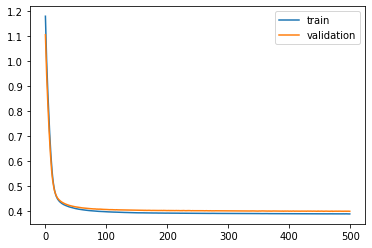

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 42s - loss: 1.1777 - val_loss: 1.1105

Epoch 00001: val_loss improved from inf to 1.11052, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0810 - val_loss: 1.0236

Epoch 00002: val_loss improved from 1.11052 to 1.02363, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.0011 - val_loss: 0.9516

Epoch 00003: val_loss improved from 1.02363 to 0.95158, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9331 - val_loss: 0.8884

Epoch 00004: val_loss improved from 0.95158 to 0.88838, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8721 - val_loss: 0.8298

Epoch 00005: val_loss improved from 0.88838 to 0.82980, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8152 - val_loss: 0.7744

Epoch 00006: val_loss improved from 0.82980 to 0.77442, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7615 - val_loss: 0.7223

Epoch 00007: val_loss improved from 0.77442

 - 1s - loss: 0.4092 - val_loss: 0.4083

Epoch 00058: val_loss improved from 0.40856 to 0.40826, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4087 - val_loss: 0.4077

Epoch 00059: val_loss improved from 0.40826 to 0.40773, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4084 - val_loss: 0.4071

Epoch 00060: val_loss improved from 0.40773 to 0.40715, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4080 - val_loss: 0.4070

Epoch 00061: val_loss improved from 0.40715 to 0.40701, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4078 - val_loss: 0.4066

Epoch 00062: val_loss improved from 0.40701 to 0.40661, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4074 - val_loss: 0.4061

Epoch 00063: val_loss improved from 0.40661 to 0.40610, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4070 - val_loss: 0.4062

Epoch 00064: val_loss did not improve from 0.40610
Epoch 65/500
 - 1s - loss: 0.4068 - val_loss

 - 1s - loss: 0.3978 - val_loss: 0.3966

Epoch 00120: val_loss improved from 0.39669 to 0.39660, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.3978 - val_loss: 0.3966

Epoch 00121: val_loss improved from 0.39660 to 0.39659, saving model to val_weights4.hdf5
Epoch 122/500
 - 1s - loss: 0.3976 - val_loss: 0.3966

Epoch 00122: val_loss improved from 0.39659 to 0.39657, saving model to val_weights4.hdf5
Epoch 123/500
 - 1s - loss: 0.3976 - val_loss: 0.3967

Epoch 00123: val_loss did not improve from 0.39657
Epoch 124/500
 - 1s - loss: 0.3976 - val_loss: 0.3965

Epoch 00124: val_loss improved from 0.39657 to 0.39654, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3975 - val_loss: 0.3963

Epoch 00125: val_loss improved from 0.39654 to 0.39634, saving model to val_weights4.hdf5
Epoch 126/500
 - 1s - loss: 0.3975 - val_loss: 0.3964

Epoch 00126: val_loss did not improve from 0.39634
Epoch 127/500
 - 1s - loss: 0.3973 - val_loss: 0.3964

Epoch 00127: val_loss 

 - 1s - loss: 0.3951 - val_loss: 0.3953

Epoch 00191: val_loss did not improve from 0.39503
Epoch 192/500
 - 1s - loss: 0.3951 - val_loss: 0.3957

Epoch 00192: val_loss did not improve from 0.39503
Epoch 193/500
 - 1s - loss: 0.3952 - val_loss: 0.3951

Epoch 00193: val_loss did not improve from 0.39503
Epoch 194/500
 - 1s - loss: 0.3952 - val_loss: 0.3953

Epoch 00194: val_loss did not improve from 0.39503
Epoch 195/500
 - 1s - loss: 0.3952 - val_loss: 0.3951

Epoch 00195: val_loss did not improve from 0.39503
Epoch 196/500
 - 1s - loss: 0.3952 - val_loss: 0.3950

Epoch 00196: val_loss improved from 0.39503 to 0.39501, saving model to val_weights4.hdf5
Epoch 197/500
 - 1s - loss: 0.3950 - val_loss: 0.3946

Epoch 00197: val_loss improved from 0.39501 to 0.39458, saving model to val_weights4.hdf5
Epoch 198/500
 - 1s - loss: 0.3951 - val_loss: 0.3947

Epoch 00198: val_loss did not improve from 0.39458
Epoch 199/500
 - 1s - loss: 0.3949 - val_loss: 0.3942

Epoch 00199: val_loss improved fr

 - 1s - loss: 0.3936 - val_loss: 0.3941

Epoch 00265: val_loss did not improve from 0.39358
Epoch 266/500
 - 1s - loss: 0.3935 - val_loss: 0.3941

Epoch 00266: val_loss did not improve from 0.39358
Epoch 267/500
 - 1s - loss: 0.3937 - val_loss: 0.3939

Epoch 00267: val_loss did not improve from 0.39358
Epoch 268/500
 - 1s - loss: 0.3936 - val_loss: 0.3940

Epoch 00268: val_loss did not improve from 0.39358
Epoch 269/500
 - 1s - loss: 0.3936 - val_loss: 0.3937

Epoch 00269: val_loss did not improve from 0.39358
Epoch 270/500
 - 1s - loss: 0.3935 - val_loss: 0.3938

Epoch 00270: val_loss did not improve from 0.39358
Epoch 271/500
 - 1s - loss: 0.3934 - val_loss: 0.3940

Epoch 00271: val_loss did not improve from 0.39358
Epoch 272/500
 - 1s - loss: 0.3936 - val_loss: 0.3938

Epoch 00272: val_loss did not improve from 0.39358
Epoch 273/500
 - 1s - loss: 0.3935 - val_loss: 0.3941

Epoch 00273: val_loss did not improve from 0.39358
Epoch 274/500
 - 1s - loss: 0.3936 - val_loss: 0.3939

Epoch

 - 1s - loss: 0.3929 - val_loss: 0.3934

Epoch 00341: val_loss did not improve from 0.39283
Epoch 342/500
 - 1s - loss: 0.3929 - val_loss: 0.3935

Epoch 00342: val_loss did not improve from 0.39283
Epoch 343/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00343: val_loss did not improve from 0.39283
Epoch 344/500
 - 1s - loss: 0.3929 - val_loss: 0.3936

Epoch 00344: val_loss did not improve from 0.39283
Epoch 345/500
 - 1s - loss: 0.3928 - val_loss: 0.3934

Epoch 00345: val_loss did not improve from 0.39283
Epoch 346/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00346: val_loss did not improve from 0.39283
Epoch 347/500
 - 1s - loss: 0.3929 - val_loss: 0.3935

Epoch 00347: val_loss did not improve from 0.39283
Epoch 348/500
 - 1s - loss: 0.3928 - val_loss: 0.3939

Epoch 00348: val_loss did not improve from 0.39283
Epoch 349/500
 - 1s - loss: 0.3930 - val_loss: 0.3931

Epoch 00349: val_loss did not improve from 0.39283
Epoch 350/500
 - 1s - loss: 0.3927 - val_loss: 0.3935

Epoch


Epoch 00417: val_loss did not improve from 0.39265
Epoch 418/500
 - 1s - loss: 0.3923 - val_loss: 0.3926

Epoch 00418: val_loss improved from 0.39265 to 0.39259, saving model to val_weights4.hdf5
Epoch 419/500
 - 1s - loss: 0.3922 - val_loss: 0.3934

Epoch 00419: val_loss did not improve from 0.39259
Epoch 420/500
 - 1s - loss: 0.3920 - val_loss: 0.3930

Epoch 00420: val_loss did not improve from 0.39259
Epoch 421/500
 - 1s - loss: 0.3922 - val_loss: 0.3933

Epoch 00421: val_loss did not improve from 0.39259
Epoch 422/500
 - 1s - loss: 0.3921 - val_loss: 0.3928

Epoch 00422: val_loss did not improve from 0.39259
Epoch 423/500
 - 1s - loss: 0.3920 - val_loss: 0.3933

Epoch 00423: val_loss did not improve from 0.39259
Epoch 424/500
 - 1s - loss: 0.3921 - val_loss: 0.3928

Epoch 00424: val_loss did not improve from 0.39259
Epoch 425/500
 - 1s - loss: 0.3920 - val_loss: 0.3932

Epoch 00425: val_loss did not improve from 0.39259
Epoch 426/500
 - 1s - loss: 0.3921 - val_loss: 0.3929

Epoch 


Epoch 00493: val_loss improved from 0.39236 to 0.39232, saving model to val_weights4.hdf5
Epoch 494/500
 - 1s - loss: 0.3916 - val_loss: 0.3926

Epoch 00494: val_loss did not improve from 0.39232
Epoch 495/500
 - 1s - loss: 0.3915 - val_loss: 0.3923

Epoch 00495: val_loss improved from 0.39232 to 0.39226, saving model to val_weights4.hdf5
Epoch 496/500
 - 1s - loss: 0.3916 - val_loss: 0.3925

Epoch 00496: val_loss did not improve from 0.39226
Epoch 497/500
 - 1s - loss: 0.3917 - val_loss: 0.3926

Epoch 00497: val_loss did not improve from 0.39226
Epoch 498/500
 - 1s - loss: 0.3917 - val_loss: 0.3929

Epoch 00498: val_loss did not improve from 0.39226
Epoch 499/500
 - 1s - loss: 0.3915 - val_loss: 0.3926

Epoch 00499: val_loss did not improve from 0.39226
Epoch 500/500
 - 1s - loss: 0.3914 - val_loss: 0.3926

Epoch 00500: val_loss did not improve from 0.39226
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.010538784320277803
best val loss: 0.39226431

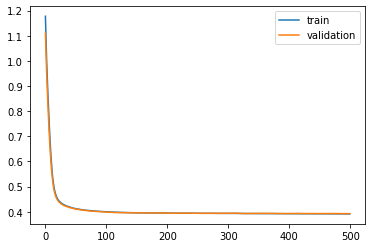

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 43s - loss: 1.1781 - val_loss: 1.1087

Epoch 00001: val_loss improved from inf to 1.10866, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0813 - val_loss: 1.0234

Epoch 00002: val_loss improved from 1.10866 to 1.02337, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0014 - val_loss: 0.9523

Epoch 00003: val_loss improved from 1.02337 to 0.95230, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9334 - val_loss: 0.8897

Epoch 00004: val_loss improved from 0.95230 to 0.88970, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8724 - val_loss: 0.8324

Epoch 00005: val_loss improved from 0.88970 to 0.83243, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8154 - val_loss: 0.7783

Epoch 00006: val_loss improved from 0.83243 to 0.77829, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7616 - val_loss: 0.7268

Epoch 00007: val_loss improved from 0.77829

 - 1s - loss: 0.4086 - val_loss: 0.4120

Epoch 00058: val_loss improved from 0.41202 to 0.41200, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4083 - val_loss: 0.4117

Epoch 00059: val_loss improved from 0.41200 to 0.41173, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4078 - val_loss: 0.4114

Epoch 00060: val_loss improved from 0.41173 to 0.41140, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4076 - val_loss: 0.4113

Epoch 00061: val_loss improved from 0.41140 to 0.41125, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4072 - val_loss: 0.4109

Epoch 00062: val_loss improved from 0.41125 to 0.41089, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4069 - val_loss: 0.4110

Epoch 00063: val_loss did not improve from 0.41089
Epoch 64/500
 - 1s - loss: 0.4066 - val_loss: 0.4106

Epoch 00064: val_loss improved from 0.41089 to 0.41061, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4063 - val_loss

 - 1s - loss: 0.3978 - val_loss: 0.4022

Epoch 00119: val_loss improved from 0.40240 to 0.40223, saving model to val_weights5.hdf5
Epoch 120/500
 - 1s - loss: 0.3977 - val_loss: 0.4023

Epoch 00120: val_loss did not improve from 0.40223
Epoch 121/500
 - 1s - loss: 0.3976 - val_loss: 0.4024

Epoch 00121: val_loss did not improve from 0.40223
Epoch 122/500
 - 1s - loss: 0.3974 - val_loss: 0.4024

Epoch 00122: val_loss did not improve from 0.40223
Epoch 123/500
 - 1s - loss: 0.3973 - val_loss: 0.4021

Epoch 00123: val_loss improved from 0.40223 to 0.40211, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3973 - val_loss: 0.4017

Epoch 00124: val_loss improved from 0.40211 to 0.40174, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3971 - val_loss: 0.4016

Epoch 00125: val_loss improved from 0.40174 to 0.40163, saving model to val_weights5.hdf5
Epoch 126/500
 - 1s - loss: 0.3972 - val_loss: 0.4017

Epoch 00126: val_loss did not improve from 0.40163
Epoch 127/

 - 1s - loss: 0.3944 - val_loss: 0.3991

Epoch 00188: val_loss did not improve from 0.39852
Epoch 189/500
 - 1s - loss: 0.3944 - val_loss: 0.3987

Epoch 00189: val_loss did not improve from 0.39852
Epoch 190/500
 - 1s - loss: 0.3943 - val_loss: 0.3989

Epoch 00190: val_loss did not improve from 0.39852
Epoch 191/500
 - 1s - loss: 0.3942 - val_loss: 0.3984

Epoch 00191: val_loss improved from 0.39852 to 0.39835, saving model to val_weights5.hdf5
Epoch 192/500
 - 1s - loss: 0.3942 - val_loss: 0.3989

Epoch 00192: val_loss did not improve from 0.39835
Epoch 193/500
 - 1s - loss: 0.3944 - val_loss: 0.3988

Epoch 00193: val_loss did not improve from 0.39835
Epoch 194/500
 - 1s - loss: 0.3943 - val_loss: 0.3986

Epoch 00194: val_loss did not improve from 0.39835
Epoch 195/500
 - 1s - loss: 0.3942 - val_loss: 0.3983

Epoch 00195: val_loss improved from 0.39835 to 0.39835, saving model to val_weights5.hdf5
Epoch 196/500
 - 1s - loss: 0.3943 - val_loss: 0.3984

Epoch 00196: val_loss did not imp

 - 1s - loss: 0.3930 - val_loss: 0.3977

Epoch 00262: val_loss did not improve from 0.39737
Epoch 263/500
 - 1s - loss: 0.3930 - val_loss: 0.3977

Epoch 00263: val_loss did not improve from 0.39737
Epoch 264/500
 - 1s - loss: 0.3929 - val_loss: 0.3977

Epoch 00264: val_loss did not improve from 0.39737
Epoch 265/500
 - 1s - loss: 0.3930 - val_loss: 0.3981

Epoch 00265: val_loss did not improve from 0.39737
Epoch 266/500
 - 1s - loss: 0.3930 - val_loss: 0.3978

Epoch 00266: val_loss did not improve from 0.39737
Epoch 267/500
 - 1s - loss: 0.3928 - val_loss: 0.3980

Epoch 00267: val_loss did not improve from 0.39737
Epoch 268/500
 - 1s - loss: 0.3931 - val_loss: 0.3976

Epoch 00268: val_loss did not improve from 0.39737
Epoch 269/500
 - 1s - loss: 0.3928 - val_loss: 0.3979

Epoch 00269: val_loss did not improve from 0.39737
Epoch 270/500
 - 1s - loss: 0.3930 - val_loss: 0.3977

Epoch 00270: val_loss did not improve from 0.39737
Epoch 271/500
 - 1s - loss: 0.3929 - val_loss: 0.3980

Epoch


Epoch 00339: val_loss did not improve from 0.39737
Epoch 340/500
 - 1s - loss: 0.3924 - val_loss: 0.3989

Epoch 00340: val_loss did not improve from 0.39737
Epoch 341/500
 - 1s - loss: 0.3924 - val_loss: 0.3984

Epoch 00341: val_loss did not improve from 0.39737
Epoch 342/500
 - 1s - loss: 0.3924 - val_loss: 0.3988

Epoch 00342: val_loss did not improve from 0.39737
Epoch 343/500
 - 1s - loss: 0.3925 - val_loss: 0.3988

Epoch 00343: val_loss did not improve from 0.39737
Epoch 344/500
 - 1s - loss: 0.3925 - val_loss: 0.3991

Epoch 00344: val_loss did not improve from 0.39737
Epoch 345/500
 - 1s - loss: 0.3926 - val_loss: 0.3994

Epoch 00345: val_loss did not improve from 0.39737
Epoch 346/500
 - 1s - loss: 0.3927 - val_loss: 0.3991

Epoch 00346: val_loss did not improve from 0.39737
Epoch 347/500
 - 1s - loss: 0.3927 - val_loss: 0.3997

Epoch 00347: val_loss did not improve from 0.39737
Epoch 348/500
 - 1s - loss: 0.3928 - val_loss: 0.3993

Epoch 00348: val_loss did not improve from 0.

 - 1s - loss: 0.3919 - val_loss: 0.3987

Epoch 00417: val_loss did not improve from 0.39737
Epoch 418/500
 - 1s - loss: 0.3918 - val_loss: 0.3987

Epoch 00418: val_loss did not improve from 0.39737
Epoch 419/500
 - 1s - loss: 0.3921 - val_loss: 0.3986

Epoch 00419: val_loss did not improve from 0.39737
Epoch 420/500
 - 1s - loss: 0.3921 - val_loss: 0.3984

Epoch 00420: val_loss did not improve from 0.39737
Epoch 421/500
 - 1s - loss: 0.3920 - val_loss: 0.3982

Epoch 00421: val_loss did not improve from 0.39737
Epoch 422/500
 - 1s - loss: 0.3919 - val_loss: 0.3985

Epoch 00422: val_loss did not improve from 0.39737
Epoch 423/500
 - 1s - loss: 0.3920 - val_loss: 0.3984

Epoch 00423: val_loss did not improve from 0.39737
Epoch 424/500
 - 1s - loss: 0.3920 - val_loss: 0.3984

Epoch 00424: val_loss did not improve from 0.39737
Epoch 425/500
 - 1s - loss: 0.3921 - val_loss: 0.3983

Epoch 00425: val_loss did not improve from 0.39737
Epoch 426/500
 - 1s - loss: 0.3920 - val_loss: 0.3988

Epoch


Epoch 00494: val_loss did not improve from 0.39737
Epoch 495/500
 - 1s - loss: 0.3915 - val_loss: 0.3985

Epoch 00495: val_loss did not improve from 0.39737
Epoch 496/500
 - 1s - loss: 0.3914 - val_loss: 0.3982

Epoch 00496: val_loss did not improve from 0.39737
Epoch 497/500
 - 1s - loss: 0.3914 - val_loss: 0.3983

Epoch 00497: val_loss did not improve from 0.39737
Epoch 498/500
 - 1s - loss: 0.3914 - val_loss: 0.3984

Epoch 00498: val_loss did not improve from 0.39737
Epoch 499/500
 - 1s - loss: 0.3916 - val_loss: 0.3987

Epoch 00499: val_loss did not improve from 0.39737
Epoch 500/500
 - 1s - loss: 0.3916 - val_loss: 0.3980

Epoch 00500: val_loss did not improve from 0.39737
#################################
Number of units: 4
Batch size: 8192
Fold: 4
L2: 0.010538784320277803
best val loss: 0.39737294205029805
#################################
[[4, 8192, 0.007921656789898646, 0, 0.3964275896019406], [4, 8192, 0.007921656789898646, 1, 0.3918810964955224], [4, 8192, 0.007921656789898

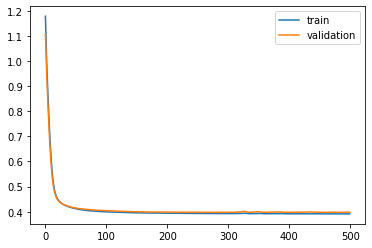

Time to train LSTM:  410.67048597335815
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 47s - loss: 1.2997 - val_loss: 1.2349

Epoch 00001: val_loss improved from inf to 1.23488, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.1853 - val_loss: 1.1304

Epoch 00002: val_loss improved from 1.23488 to 1.13036, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.0893 - val_loss: 1.0421

Epoch 00003: val_loss improved from 1.13036 to 1.04214, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 1.0069 - val_loss: 0.9652

Epoch 00004: val_loss improved from 1.04214 to 0.96522, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.9334 - val_loss: 0.8953

Epoch 00005: val_loss improved from 0.96522 to 0.89527, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8655 - val_loss: 0.8304

Epoch 00006: val_loss improved from 0.89527 to 0.83040, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.8016 - val_loss: 0.7694

Epo


Epoch 00057: val_loss improved from 0.41594 to 0.41575, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4093 - val_loss: 0.4154

Epoch 00058: val_loss improved from 0.41575 to 0.41544, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4089 - val_loss: 0.4149

Epoch 00059: val_loss improved from 0.41544 to 0.41485, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4086 - val_loss: 0.4145

Epoch 00060: val_loss improved from 0.41485 to 0.41448, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4083 - val_loss: 0.4144

Epoch 00061: val_loss improved from 0.41448 to 0.41438, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4079 - val_loss: 0.4138

Epoch 00062: val_loss improved from 0.41438 to 0.41380, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4077 - val_loss: 0.4134

Epoch 00063: val_loss improved from 0.41380 to 0.41341, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4073 - val_loss:

 - 1s - loss: 0.3982 - val_loss: 0.4029

Epoch 00118: val_loss improved from 0.40302 to 0.40287, saving model to val_weights1.hdf5
Epoch 119/500
 - 1s - loss: 0.3982 - val_loss: 0.4027

Epoch 00119: val_loss improved from 0.40287 to 0.40266, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.3981 - val_loss: 0.4026

Epoch 00120: val_loss improved from 0.40266 to 0.40261, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.3981 - val_loss: 0.4027

Epoch 00121: val_loss did not improve from 0.40261
Epoch 122/500
 - 1s - loss: 0.3981 - val_loss: 0.4026

Epoch 00122: val_loss improved from 0.40261 to 0.40257, saving model to val_weights1.hdf5
Epoch 123/500
 - 1s - loss: 0.3981 - val_loss: 0.4026

Epoch 00123: val_loss improved from 0.40257 to 0.40257, saving model to val_weights1.hdf5
Epoch 124/500
 - 1s - loss: 0.3979 - val_loss: 0.4025

Epoch 00124: val_loss improved from 0.40257 to 0.40249, saving model to val_weights1.hdf5
Epoch 125/500
 - 1s - loss: 0.3979 - v


Epoch 00185: val_loss did not improve from 0.39933
Epoch 186/500
 - 1s - loss: 0.3953 - val_loss: 0.3995

Epoch 00186: val_loss did not improve from 0.39933
Epoch 187/500
 - 1s - loss: 0.3952 - val_loss: 0.3991

Epoch 00187: val_loss improved from 0.39933 to 0.39914, saving model to val_weights1.hdf5
Epoch 188/500
 - 1s - loss: 0.3954 - val_loss: 0.3996

Epoch 00188: val_loss did not improve from 0.39914
Epoch 189/500
 - 1s - loss: 0.3952 - val_loss: 0.3992

Epoch 00189: val_loss did not improve from 0.39914
Epoch 190/500
 - 1s - loss: 0.3952 - val_loss: 0.3994

Epoch 00190: val_loss did not improve from 0.39914
Epoch 191/500
 - 1s - loss: 0.3952 - val_loss: 0.3991

Epoch 00191: val_loss improved from 0.39914 to 0.39906, saving model to val_weights1.hdf5
Epoch 192/500
 - 1s - loss: 0.3951 - val_loss: 0.3998

Epoch 00192: val_loss did not improve from 0.39906
Epoch 193/500
 - 1s - loss: 0.3952 - val_loss: 0.3991

Epoch 00193: val_loss did not improve from 0.39906
Epoch 194/500
 - 1s - 

 - 1s - loss: 0.3940 - val_loss: 0.3982

Epoch 00259: val_loss did not improve from 0.39809
Epoch 260/500
 - 1s - loss: 0.3940 - val_loss: 0.3982

Epoch 00260: val_loss did not improve from 0.39809
Epoch 261/500
 - 1s - loss: 0.3941 - val_loss: 0.3983

Epoch 00261: val_loss did not improve from 0.39809
Epoch 262/500
 - 1s - loss: 0.3939 - val_loss: 0.3983

Epoch 00262: val_loss did not improve from 0.39809
Epoch 263/500
 - 1s - loss: 0.3940 - val_loss: 0.3983

Epoch 00263: val_loss did not improve from 0.39809
Epoch 264/500
 - 1s - loss: 0.3939 - val_loss: 0.3982

Epoch 00264: val_loss did not improve from 0.39809
Epoch 265/500
 - 1s - loss: 0.3939 - val_loss: 0.3983

Epoch 00265: val_loss did not improve from 0.39809
Epoch 266/500
 - 1s - loss: 0.3939 - val_loss: 0.3981

Epoch 00266: val_loss did not improve from 0.39809
Epoch 267/500
 - 1s - loss: 0.3939 - val_loss: 0.3985

Epoch 00267: val_loss did not improve from 0.39809
Epoch 268/500
 - 1s - loss: 0.3939 - val_loss: 0.3980

Epoch

 - 1s - loss: 0.3934 - val_loss: 0.3979

Epoch 00334: val_loss did not improve from 0.39759
Epoch 335/500
 - 1s - loss: 0.3935 - val_loss: 0.3980

Epoch 00335: val_loss did not improve from 0.39759
Epoch 336/500
 - 1s - loss: 0.3935 - val_loss: 0.3979

Epoch 00336: val_loss did not improve from 0.39759
Epoch 337/500
 - 1s - loss: 0.3935 - val_loss: 0.3984

Epoch 00337: val_loss did not improve from 0.39759
Epoch 338/500
 - 1s - loss: 0.3933 - val_loss: 0.3976

Epoch 00338: val_loss did not improve from 0.39759
Epoch 339/500
 - 1s - loss: 0.3935 - val_loss: 0.3983

Epoch 00339: val_loss did not improve from 0.39759
Epoch 340/500
 - 1s - loss: 0.3933 - val_loss: 0.3976

Epoch 00340: val_loss did not improve from 0.39759
Epoch 341/500
 - 1s - loss: 0.3932 - val_loss: 0.3978

Epoch 00341: val_loss did not improve from 0.39759
Epoch 342/500
 - 1s - loss: 0.3933 - val_loss: 0.3979

Epoch 00342: val_loss did not improve from 0.39759
Epoch 343/500
 - 1s - loss: 0.3933 - val_loss: 0.3981

Epoch

 - 1s - loss: 0.3929 - val_loss: 0.3975

Epoch 00410: val_loss did not improve from 0.39728
Epoch 411/500
 - 1s - loss: 0.3927 - val_loss: 0.3973

Epoch 00411: val_loss improved from 0.39728 to 0.39725, saving model to val_weights1.hdf5
Epoch 412/500
 - 1s - loss: 0.3927 - val_loss: 0.3974

Epoch 00412: val_loss did not improve from 0.39725
Epoch 413/500
 - 1s - loss: 0.3928 - val_loss: 0.3979

Epoch 00413: val_loss did not improve from 0.39725
Epoch 414/500
 - 1s - loss: 0.3931 - val_loss: 0.3973

Epoch 00414: val_loss did not improve from 0.39725
Epoch 415/500
 - 1s - loss: 0.3929 - val_loss: 0.3973

Epoch 00415: val_loss did not improve from 0.39725
Epoch 416/500
 - 1s - loss: 0.3929 - val_loss: 0.3978

Epoch 00416: val_loss did not improve from 0.39725
Epoch 417/500
 - 1s - loss: 0.3928 - val_loss: 0.3978

Epoch 00417: val_loss did not improve from 0.39725
Epoch 418/500
 - 1s - loss: 0.3929 - val_loss: 0.3977

Epoch 00418: val_loss did not improve from 0.39725
Epoch 419/500
 - 1s -

 - 1s - loss: 0.3922 - val_loss: 0.3972

Epoch 00487: val_loss did not improve from 0.39709
Epoch 488/500
 - 1s - loss: 0.3923 - val_loss: 0.3974

Epoch 00488: val_loss did not improve from 0.39709
Epoch 489/500
 - 1s - loss: 0.3922 - val_loss: 0.3976

Epoch 00489: val_loss did not improve from 0.39709
Epoch 490/500
 - 1s - loss: 0.3923 - val_loss: 0.3974

Epoch 00490: val_loss did not improve from 0.39709
Epoch 491/500
 - 1s - loss: 0.3921 - val_loss: 0.3975

Epoch 00491: val_loss did not improve from 0.39709
Epoch 492/500
 - 1s - loss: 0.3922 - val_loss: 0.3976

Epoch 00492: val_loss did not improve from 0.39709
Epoch 493/500
 - 1s - loss: 0.3923 - val_loss: 0.3973

Epoch 00493: val_loss did not improve from 0.39709
Epoch 494/500
 - 1s - loss: 0.3923 - val_loss: 0.3973

Epoch 00494: val_loss did not improve from 0.39709
Epoch 495/500
 - 1s - loss: 0.3923 - val_loss: 0.3976

Epoch 00495: val_loss did not improve from 0.39709
Epoch 496/500
 - 1s - loss: 0.3922 - val_loss: 0.3972

Epoch

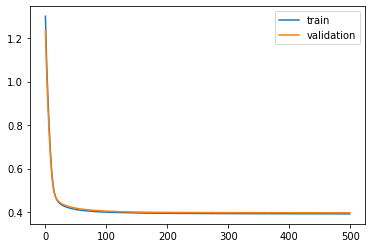

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 44s - loss: 1.3003 - val_loss: 1.2302

Epoch 00001: val_loss improved from inf to 1.23022, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.1858 - val_loss: 1.1286

Epoch 00002: val_loss improved from 1.23022 to 1.12860, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.0895 - val_loss: 1.0418

Epoch 00003: val_loss improved from 1.12860 to 1.04178, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 1.0070 - val_loss: 0.9654

Epoch 00004: val_loss improved from 1.04178 to 0.96539, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.9335 - val_loss: 0.8949

Epoch 00005: val_loss improved from 0.96539 to 0.89486, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8656 - val_loss: 0.8284

Epoch 00006: val_loss improved from 0.89486 to 0.82838, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.8020 - val_loss: 0.7664

Epoch 00007: val_loss improved from 0.82838

 - 1s - loss: 0.4100 - val_loss: 0.4067

Epoch 00058: val_loss improved from 0.40674 to 0.40667, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4095 - val_loss: 0.4061

Epoch 00059: val_loss improved from 0.40667 to 0.40611, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4093 - val_loss: 0.4057

Epoch 00060: val_loss improved from 0.40611 to 0.40573, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4089 - val_loss: 0.4055

Epoch 00061: val_loss improved from 0.40573 to 0.40549, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4086 - val_loss: 0.4055

Epoch 00062: val_loss improved from 0.40549 to 0.40548, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4081 - val_loss: 0.4050

Epoch 00063: val_loss improved from 0.40548 to 0.40503, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4079 - val_loss: 0.4047

Epoch 00064: val_loss improved from 0.40503 to 0.40474, saving model to val_weights2.hdf5
Epoch


Epoch 00119: val_loss did not improve from 0.39730
Epoch 120/500
 - 1s - loss: 0.3985 - val_loss: 0.3974

Epoch 00120: val_loss did not improve from 0.39730
Epoch 121/500
 - 1s - loss: 0.3985 - val_loss: 0.3972

Epoch 00121: val_loss improved from 0.39730 to 0.39715, saving model to val_weights2.hdf5
Epoch 122/500
 - 1s - loss: 0.3984 - val_loss: 0.3969

Epoch 00122: val_loss improved from 0.39715 to 0.39686, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3984 - val_loss: 0.3971

Epoch 00123: val_loss did not improve from 0.39686
Epoch 124/500
 - 1s - loss: 0.3982 - val_loss: 0.3966

Epoch 00124: val_loss improved from 0.39686 to 0.39657, saving model to val_weights2.hdf5
Epoch 125/500
 - 1s - loss: 0.3983 - val_loss: 0.3972

Epoch 00125: val_loss did not improve from 0.39657
Epoch 126/500
 - 1s - loss: 0.3982 - val_loss: 0.3966

Epoch 00126: val_loss did not improve from 0.39657
Epoch 127/500
 - 1s - loss: 0.3981 - val_loss: 0.3969

Epoch 00127: val_loss did not impr

 - 1s - loss: 0.3957 - val_loss: 0.3945

Epoch 00189: val_loss did not improve from 0.39433
Epoch 190/500
 - 1s - loss: 0.3957 - val_loss: 0.3944

Epoch 00190: val_loss did not improve from 0.39433
Epoch 191/500
 - 1s - loss: 0.3956 - val_loss: 0.3945

Epoch 00191: val_loss did not improve from 0.39433
Epoch 192/500
 - 1s - loss: 0.3955 - val_loss: 0.3948

Epoch 00192: val_loss did not improve from 0.39433
Epoch 193/500
 - 1s - loss: 0.3956 - val_loss: 0.3942

Epoch 00193: val_loss improved from 0.39433 to 0.39420, saving model to val_weights2.hdf5
Epoch 194/500
 - 1s - loss: 0.3955 - val_loss: 0.3947

Epoch 00194: val_loss did not improve from 0.39420
Epoch 195/500
 - 1s - loss: 0.3954 - val_loss: 0.3942

Epoch 00195: val_loss did not improve from 0.39420
Epoch 196/500
 - 1s - loss: 0.3954 - val_loss: 0.3944

Epoch 00196: val_loss did not improve from 0.39420
Epoch 197/500
 - 1s - loss: 0.3954 - val_loss: 0.3948

Epoch 00197: val_loss did not improve from 0.39420
Epoch 198/500
 - 1s -


Epoch 00263: val_loss did not improve from 0.39333
Epoch 264/500
 - 1s - loss: 0.3944 - val_loss: 0.3942

Epoch 00264: val_loss did not improve from 0.39333
Epoch 265/500
 - 1s - loss: 0.3944 - val_loss: 0.3936

Epoch 00265: val_loss did not improve from 0.39333
Epoch 266/500
 - 1s - loss: 0.3943 - val_loss: 0.3936

Epoch 00266: val_loss did not improve from 0.39333
Epoch 267/500
 - 1s - loss: 0.3945 - val_loss: 0.3934

Epoch 00267: val_loss did not improve from 0.39333
Epoch 268/500
 - 1s - loss: 0.3944 - val_loss: 0.3936

Epoch 00268: val_loss did not improve from 0.39333
Epoch 269/500
 - 1s - loss: 0.3944 - val_loss: 0.3936

Epoch 00269: val_loss did not improve from 0.39333
Epoch 270/500
 - 1s - loss: 0.3944 - val_loss: 0.3934

Epoch 00270: val_loss did not improve from 0.39333
Epoch 271/500
 - 1s - loss: 0.3945 - val_loss: 0.3936

Epoch 00271: val_loss did not improve from 0.39333
Epoch 272/500
 - 1s - loss: 0.3943 - val_loss: 0.3933

Epoch 00272: val_loss did not improve from 0.


Epoch 00339: val_loss did not improve from 0.39280
Epoch 340/500
 - 1s - loss: 0.3936 - val_loss: 0.3930

Epoch 00340: val_loss did not improve from 0.39280
Epoch 341/500
 - 1s - loss: 0.3934 - val_loss: 0.3933

Epoch 00341: val_loss did not improve from 0.39280
Epoch 342/500
 - 1s - loss: 0.3937 - val_loss: 0.3931

Epoch 00342: val_loss did not improve from 0.39280
Epoch 343/500
 - 1s - loss: 0.3936 - val_loss: 0.3933

Epoch 00343: val_loss did not improve from 0.39280
Epoch 344/500
 - 1s - loss: 0.3937 - val_loss: 0.3931

Epoch 00344: val_loss did not improve from 0.39280
Epoch 345/500
 - 1s - loss: 0.3935 - val_loss: 0.3930

Epoch 00345: val_loss did not improve from 0.39280
Epoch 346/500
 - 1s - loss: 0.3936 - val_loss: 0.3936

Epoch 00346: val_loss did not improve from 0.39280
Epoch 347/500
 - 1s - loss: 0.3937 - val_loss: 0.3926

Epoch 00347: val_loss improved from 0.39280 to 0.39264, saving model to val_weights2.hdf5
Epoch 348/500
 - 1s - loss: 0.3936 - val_loss: 0.3934

Epoch 

 - 1s - loss: 0.3931 - val_loss: 0.3929

Epoch 00415: val_loss did not improve from 0.39246
Epoch 416/500
 - 1s - loss: 0.3932 - val_loss: 0.3925

Epoch 00416: val_loss did not improve from 0.39246
Epoch 417/500
 - 1s - loss: 0.3931 - val_loss: 0.3929

Epoch 00417: val_loss did not improve from 0.39246
Epoch 418/500
 - 1s - loss: 0.3931 - val_loss: 0.3926

Epoch 00418: val_loss did not improve from 0.39246
Epoch 419/500
 - 1s - loss: 0.3931 - val_loss: 0.3925

Epoch 00419: val_loss did not improve from 0.39246
Epoch 420/500
 - 1s - loss: 0.3930 - val_loss: 0.3930

Epoch 00420: val_loss did not improve from 0.39246
Epoch 421/500
 - 1s - loss: 0.3931 - val_loss: 0.3927

Epoch 00421: val_loss did not improve from 0.39246
Epoch 422/500
 - 1s - loss: 0.3932 - val_loss: 0.3929

Epoch 00422: val_loss did not improve from 0.39246
Epoch 423/500
 - 1s - loss: 0.3930 - val_loss: 0.3925

Epoch 00423: val_loss did not improve from 0.39246
Epoch 424/500
 - 1s - loss: 0.3930 - val_loss: 0.3928

Epoch

 - 1s - loss: 0.3927 - val_loss: 0.3923

Epoch 00491: val_loss did not improve from 0.39206
Epoch 492/500
 - 1s - loss: 0.3926 - val_loss: 0.3924

Epoch 00492: val_loss did not improve from 0.39206
Epoch 493/500
 - 1s - loss: 0.3925 - val_loss: 0.3926

Epoch 00493: val_loss did not improve from 0.39206
Epoch 494/500
 - 1s - loss: 0.3927 - val_loss: 0.3925

Epoch 00494: val_loss did not improve from 0.39206
Epoch 495/500
 - 1s - loss: 0.3926 - val_loss: 0.3922

Epoch 00495: val_loss did not improve from 0.39206
Epoch 496/500
 - 1s - loss: 0.3926 - val_loss: 0.3926

Epoch 00496: val_loss did not improve from 0.39206
Epoch 497/500
 - 1s - loss: 0.3926 - val_loss: 0.3925

Epoch 00497: val_loss did not improve from 0.39206
Epoch 498/500
 - 1s - loss: 0.3924 - val_loss: 0.3924

Epoch 00498: val_loss did not improve from 0.39206
Epoch 499/500
 - 1s - loss: 0.3927 - val_loss: 0.3925

Epoch 00499: val_loss did not improve from 0.39206
Epoch 500/500
 - 1s - loss: 0.3926 - val_loss: 0.3923

Epoch

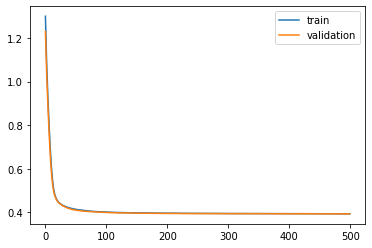

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 43s - loss: 1.3017 - val_loss: 1.2182

Epoch 00001: val_loss improved from inf to 1.21816, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.1875 - val_loss: 1.1149

Epoch 00002: val_loss improved from 1.21816 to 1.11489, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.0913 - val_loss: 1.0275

Epoch 00003: val_loss improved from 1.11489 to 1.02746, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 1.0089 - val_loss: 0.9517

Epoch 00004: val_loss improved from 1.02746 to 0.95168, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.9352 - val_loss: 0.8827

Epoch 00005: val_loss improved from 0.95168 to 0.88269, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8671 - val_loss: 0.8185

Epoch 00006: val_loss improved from 0.88269 to 0.81846, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.8032 - val_loss: 0.7593

Epoch 00007: val_loss improved from 0.81846

 - 1s - loss: 0.4092 - val_loss: 0.4160

Epoch 00058: val_loss improved from 0.41614 to 0.41599, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4088 - val_loss: 0.4155

Epoch 00059: val_loss improved from 0.41599 to 0.41547, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4085 - val_loss: 0.4153

Epoch 00060: val_loss improved from 0.41547 to 0.41526, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4082 - val_loss: 0.4151

Epoch 00061: val_loss improved from 0.41526 to 0.41507, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4078 - val_loss: 0.4147

Epoch 00062: val_loss improved from 0.41507 to 0.41471, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4075 - val_loss: 0.4145

Epoch 00063: val_loss improved from 0.41471 to 0.41453, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4071 - val_loss: 0.4142

Epoch 00064: val_loss improved from 0.41453 to 0.41416, saving model to val_weights3.hdf5
Epoch


Epoch 00119: val_loss improved from 0.40692 to 0.40687, saving model to val_weights3.hdf5
Epoch 120/500
 - 1s - loss: 0.3978 - val_loss: 0.4068

Epoch 00120: val_loss improved from 0.40687 to 0.40675, saving model to val_weights3.hdf5
Epoch 121/500
 - 1s - loss: 0.3977 - val_loss: 0.4067

Epoch 00121: val_loss improved from 0.40675 to 0.40668, saving model to val_weights3.hdf5
Epoch 122/500
 - 1s - loss: 0.3976 - val_loss: 0.4067

Epoch 00122: val_loss improved from 0.40668 to 0.40665, saving model to val_weights3.hdf5
Epoch 123/500
 - 1s - loss: 0.3976 - val_loss: 0.4068

Epoch 00123: val_loss did not improve from 0.40665
Epoch 124/500
 - 1s - loss: 0.3975 - val_loss: 0.4065

Epoch 00124: val_loss improved from 0.40665 to 0.40652, saving model to val_weights3.hdf5
Epoch 125/500
 - 1s - loss: 0.3973 - val_loss: 0.4064

Epoch 00125: val_loss improved from 0.40652 to 0.40640, saving model to val_weights3.hdf5
Epoch 126/500
 - 1s - loss: 0.3974 - val_loss: 0.4066

Epoch 00126: val_loss d

 - 1s - loss: 0.3948 - val_loss: 0.4044

Epoch 00188: val_loss did not improve from 0.40414
Epoch 189/500
 - 1s - loss: 0.3947 - val_loss: 0.4044

Epoch 00189: val_loss did not improve from 0.40414
Epoch 190/500
 - 1s - loss: 0.3949 - val_loss: 0.4044

Epoch 00190: val_loss did not improve from 0.40414
Epoch 191/500
 - 1s - loss: 0.3947 - val_loss: 0.4044

Epoch 00191: val_loss did not improve from 0.40414
Epoch 192/500
 - 1s - loss: 0.3946 - val_loss: 0.4041

Epoch 00192: val_loss improved from 0.40414 to 0.40411, saving model to val_weights3.hdf5
Epoch 193/500
 - 1s - loss: 0.3946 - val_loss: 0.4045

Epoch 00193: val_loss did not improve from 0.40411
Epoch 194/500
 - 1s - loss: 0.3946 - val_loss: 0.4043

Epoch 00194: val_loss did not improve from 0.40411
Epoch 195/500
 - 1s - loss: 0.3947 - val_loss: 0.4042

Epoch 00195: val_loss did not improve from 0.40411
Epoch 196/500
 - 1s - loss: 0.3945 - val_loss: 0.4043

Epoch 00196: val_loss did not improve from 0.40411
Epoch 197/500
 - 1s -


Epoch 00261: val_loss did not improve from 0.40320
Epoch 262/500
 - 1s - loss: 0.3935 - val_loss: 0.4031

Epoch 00262: val_loss improved from 0.40320 to 0.40311, saving model to val_weights3.hdf5
Epoch 263/500
 - 1s - loss: 0.3935 - val_loss: 0.4037

Epoch 00263: val_loss did not improve from 0.40311
Epoch 264/500
 - 1s - loss: 0.3935 - val_loss: 0.4034

Epoch 00264: val_loss did not improve from 0.40311
Epoch 265/500
 - 1s - loss: 0.3935 - val_loss: 0.4035

Epoch 00265: val_loss did not improve from 0.40311
Epoch 266/500
 - 1s - loss: 0.3934 - val_loss: 0.4031

Epoch 00266: val_loss improved from 0.40311 to 0.40309, saving model to val_weights3.hdf5
Epoch 267/500
 - 1s - loss: 0.3935 - val_loss: 0.4034

Epoch 00267: val_loss did not improve from 0.40309
Epoch 268/500
 - 1s - loss: 0.3935 - val_loss: 0.4035

Epoch 00268: val_loss did not improve from 0.40309
Epoch 269/500
 - 1s - loss: 0.3934 - val_loss: 0.4036

Epoch 00269: val_loss did not improve from 0.40309
Epoch 270/500
 - 1s - 

 - 1s - loss: 0.3929 - val_loss: 0.4028

Epoch 00336: val_loss did not improve from 0.40250
Epoch 337/500
 - 1s - loss: 0.3929 - val_loss: 0.4028

Epoch 00337: val_loss did not improve from 0.40250
Epoch 338/500
 - 1s - loss: 0.3928 - val_loss: 0.4025

Epoch 00338: val_loss did not improve from 0.40250
Epoch 339/500
 - 1s - loss: 0.3927 - val_loss: 0.4028

Epoch 00339: val_loss did not improve from 0.40250
Epoch 340/500
 - 1s - loss: 0.3929 - val_loss: 0.4027

Epoch 00340: val_loss did not improve from 0.40250
Epoch 341/500
 - 1s - loss: 0.3929 - val_loss: 0.4029

Epoch 00341: val_loss did not improve from 0.40250
Epoch 342/500
 - 1s - loss: 0.3931 - val_loss: 0.4028

Epoch 00342: val_loss did not improve from 0.40250
Epoch 343/500
 - 1s - loss: 0.3929 - val_loss: 0.4030

Epoch 00343: val_loss did not improve from 0.40250
Epoch 344/500
 - 1s - loss: 0.3930 - val_loss: 0.4026

Epoch 00344: val_loss did not improve from 0.40250
Epoch 345/500
 - 1s - loss: 0.3928 - val_loss: 0.4029

Epoch

 - 1s - loss: 0.3924 - val_loss: 0.4020

Epoch 00412: val_loss did not improve from 0.40165
Epoch 413/500
 - 1s - loss: 0.3923 - val_loss: 0.4023

Epoch 00413: val_loss did not improve from 0.40165
Epoch 414/500
 - 1s - loss: 0.3923 - val_loss: 0.4018

Epoch 00414: val_loss did not improve from 0.40165
Epoch 415/500
 - 1s - loss: 0.3923 - val_loss: 0.4020

Epoch 00415: val_loss did not improve from 0.40165
Epoch 416/500
 - 1s - loss: 0.3923 - val_loss: 0.4017

Epoch 00416: val_loss did not improve from 0.40165
Epoch 417/500
 - 1s - loss: 0.3924 - val_loss: 0.4020

Epoch 00417: val_loss did not improve from 0.40165
Epoch 418/500
 - 1s - loss: 0.3925 - val_loss: 0.4019

Epoch 00418: val_loss did not improve from 0.40165
Epoch 419/500
 - 1s - loss: 0.3925 - val_loss: 0.4019

Epoch 00419: val_loss did not improve from 0.40165
Epoch 420/500
 - 1s - loss: 0.3922 - val_loss: 0.4018

Epoch 00420: val_loss did not improve from 0.40165
Epoch 421/500
 - 1s - loss: 0.3924 - val_loss: 0.4018

Epoch


Epoch 00487: val_loss did not improve from 0.40103
Epoch 488/500
 - 1s - loss: 0.3917 - val_loss: 0.4015

Epoch 00488: val_loss did not improve from 0.40103
Epoch 489/500
 - 1s - loss: 0.3918 - val_loss: 0.4018

Epoch 00489: val_loss did not improve from 0.40103
Epoch 490/500
 - 1s - loss: 0.3918 - val_loss: 0.4011

Epoch 00490: val_loss did not improve from 0.40103
Epoch 491/500
 - 1s - loss: 0.3919 - val_loss: 0.4018

Epoch 00491: val_loss did not improve from 0.40103
Epoch 492/500
 - 1s - loss: 0.3917 - val_loss: 0.4014

Epoch 00492: val_loss did not improve from 0.40103
Epoch 493/500
 - 1s - loss: 0.3918 - val_loss: 0.4014

Epoch 00493: val_loss did not improve from 0.40103
Epoch 494/500
 - 1s - loss: 0.3918 - val_loss: 0.4016

Epoch 00494: val_loss did not improve from 0.40103
Epoch 495/500
 - 1s - loss: 0.3918 - val_loss: 0.4015

Epoch 00495: val_loss did not improve from 0.40103
Epoch 496/500
 - 1s - loss: 0.3917 - val_loss: 0.4012

Epoch 00496: val_loss did not improve from 0.

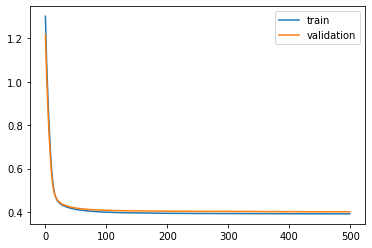

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 43s - loss: 1.3010 - val_loss: 1.2239

Epoch 00001: val_loss improved from inf to 1.22386, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.1868 - val_loss: 1.1200

Epoch 00002: val_loss improved from 1.22386 to 1.12003, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.0907 - val_loss: 1.0325

Epoch 00003: val_loss improved from 1.12003 to 1.03253, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 1.0081 - val_loss: 0.9559

Epoch 00004: val_loss improved from 1.03253 to 0.95589, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.9344 - val_loss: 0.8859

Epoch 00005: val_loss improved from 0.95589 to 0.88585, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8664 - val_loss: 0.8202

Epoch 00006: val_loss improved from 0.88585 to 0.82016, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.8027 - val_loss: 0.7588

Epoch 00007: val_loss improved from 0.82016

 - 1s - loss: 0.4102 - val_loss: 0.4088

Epoch 00058: val_loss improved from 0.40905 to 0.40882, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4097 - val_loss: 0.4083

Epoch 00059: val_loss improved from 0.40882 to 0.40828, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4094 - val_loss: 0.4079

Epoch 00060: val_loss improved from 0.40828 to 0.40795, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4091 - val_loss: 0.4073

Epoch 00061: val_loss improved from 0.40795 to 0.40733, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4087 - val_loss: 0.4073

Epoch 00062: val_loss improved from 0.40733 to 0.40731, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4083 - val_loss: 0.4070

Epoch 00063: val_loss improved from 0.40731 to 0.40703, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4081 - val_loss: 0.4066

Epoch 00064: val_loss improved from 0.40703 to 0.40657, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.3988 - val_loss: 0.3973

Epoch 00118: val_loss improved from 0.39748 to 0.39728, saving model to val_weights4.hdf5
Epoch 119/500
 - 1s - loss: 0.3989 - val_loss: 0.3971

Epoch 00119: val_loss improved from 0.39728 to 0.39710, saving model to val_weights4.hdf5
Epoch 120/500
 - 1s - loss: 0.3987 - val_loss: 0.3969

Epoch 00120: val_loss improved from 0.39710 to 0.39686, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.3987 - val_loss: 0.3969

Epoch 00121: val_loss did not improve from 0.39686
Epoch 122/500
 - 1s - loss: 0.3986 - val_loss: 0.3968

Epoch 00122: val_loss improved from 0.39686 to 0.39676, saving model to val_weights4.hdf5
Epoch 123/500
 - 1s - loss: 0.3984 - val_loss: 0.3969

Epoch 00123: val_loss did not improve from 0.39676
Epoch 124/500
 - 1s - loss: 0.3985 - val_loss: 0.3966

Epoch 00124: val_loss improved from 0.39676 to 0.39658, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3983 - val_loss: 0.3969

Epoch 00125: val_loss 

 - 1s - loss: 0.3956 - val_loss: 0.3948

Epoch 00190: val_loss did not improve from 0.39482
Epoch 191/500
 - 1s - loss: 0.3957 - val_loss: 0.3951

Epoch 00191: val_loss did not improve from 0.39482
Epoch 192/500
 - 1s - loss: 0.3957 - val_loss: 0.3951

Epoch 00192: val_loss did not improve from 0.39482
Epoch 193/500
 - 1s - loss: 0.3956 - val_loss: 0.3950

Epoch 00193: val_loss did not improve from 0.39482
Epoch 194/500
 - 1s - loss: 0.3956 - val_loss: 0.3949

Epoch 00194: val_loss did not improve from 0.39482
Epoch 195/500
 - 1s - loss: 0.3957 - val_loss: 0.3950

Epoch 00195: val_loss did not improve from 0.39482
Epoch 196/500
 - 1s - loss: 0.3956 - val_loss: 0.3949

Epoch 00196: val_loss did not improve from 0.39482
Epoch 197/500
 - 1s - loss: 0.3957 - val_loss: 0.3952

Epoch 00197: val_loss did not improve from 0.39482
Epoch 198/500
 - 1s - loss: 0.3956 - val_loss: 0.3952

Epoch 00198: val_loss did not improve from 0.39482
Epoch 199/500
 - 1s - loss: 0.3957 - val_loss: 0.3952

Epoch

 - 1s - loss: 0.3951 - val_loss: 0.3952

Epoch 00266: val_loss did not improve from 0.39444
Epoch 267/500
 - 1s - loss: 0.3952 - val_loss: 0.3954

Epoch 00267: val_loss did not improve from 0.39444
Epoch 268/500
 - 1s - loss: 0.3953 - val_loss: 0.3953

Epoch 00268: val_loss did not improve from 0.39444
Epoch 269/500
 - 1s - loss: 0.3954 - val_loss: 0.3951

Epoch 00269: val_loss did not improve from 0.39444
Epoch 270/500
 - 1s - loss: 0.3954 - val_loss: 0.3953

Epoch 00270: val_loss did not improve from 0.39444
Epoch 271/500
 - 1s - loss: 0.3955 - val_loss: 0.3949

Epoch 00271: val_loss did not improve from 0.39444
Epoch 272/500
 - 1s - loss: 0.3954 - val_loss: 0.3947

Epoch 00272: val_loss did not improve from 0.39444
Epoch 273/500
 - 1s - loss: 0.3955 - val_loss: 0.3945

Epoch 00273: val_loss did not improve from 0.39444
Epoch 274/500
 - 1s - loss: 0.3954 - val_loss: 0.3944

Epoch 00274: val_loss improved from 0.39444 to 0.39441, saving model to val_weights4.hdf5
Epoch 275/500
 - 1s -


Epoch 00340: val_loss did not improve from 0.39353
Epoch 341/500
 - 1s - loss: 0.3941 - val_loss: 0.3940

Epoch 00341: val_loss did not improve from 0.39353
Epoch 342/500
 - 1s - loss: 0.3942 - val_loss: 0.3937

Epoch 00342: val_loss did not improve from 0.39353
Epoch 343/500
 - 1s - loss: 0.3941 - val_loss: 0.3941

Epoch 00343: val_loss did not improve from 0.39353
Epoch 344/500
 - 1s - loss: 0.3941 - val_loss: 0.3937

Epoch 00344: val_loss did not improve from 0.39353
Epoch 345/500
 - 1s - loss: 0.3940 - val_loss: 0.3939

Epoch 00345: val_loss did not improve from 0.39353
Epoch 346/500
 - 1s - loss: 0.3941 - val_loss: 0.3941

Epoch 00346: val_loss did not improve from 0.39353
Epoch 347/500
 - 1s - loss: 0.3941 - val_loss: 0.3939

Epoch 00347: val_loss did not improve from 0.39353
Epoch 348/500
 - 1s - loss: 0.3941 - val_loss: 0.3940

Epoch 00348: val_loss did not improve from 0.39353
Epoch 349/500
 - 1s - loss: 0.3942 - val_loss: 0.3938

Epoch 00349: val_loss did not improve from 0.

 - 1s - loss: 0.3934 - val_loss: 0.3937

Epoch 00416: val_loss did not improve from 0.39312
Epoch 417/500
 - 1s - loss: 0.3934 - val_loss: 0.3937

Epoch 00417: val_loss did not improve from 0.39312
Epoch 418/500
 - 1s - loss: 0.3933 - val_loss: 0.3938

Epoch 00418: val_loss did not improve from 0.39312
Epoch 419/500
 - 1s - loss: 0.3934 - val_loss: 0.3935

Epoch 00419: val_loss did not improve from 0.39312
Epoch 420/500
 - 1s - loss: 0.3934 - val_loss: 0.3939

Epoch 00420: val_loss did not improve from 0.39312
Epoch 421/500
 - 1s - loss: 0.3934 - val_loss: 0.3938

Epoch 00421: val_loss did not improve from 0.39312
Epoch 422/500
 - 1s - loss: 0.3934 - val_loss: 0.3936

Epoch 00422: val_loss did not improve from 0.39312
Epoch 423/500
 - 1s - loss: 0.3932 - val_loss: 0.3939

Epoch 00423: val_loss did not improve from 0.39312
Epoch 424/500
 - 1s - loss: 0.3933 - val_loss: 0.3936

Epoch 00424: val_loss did not improve from 0.39312
Epoch 425/500
 - 1s - loss: 0.3934 - val_loss: 0.3937

Epoch

 - 1s - loss: 0.3929 - val_loss: 0.3931

Epoch 00492: val_loss did not improve from 0.39279
Epoch 493/500
 - 1s - loss: 0.3930 - val_loss: 0.3930

Epoch 00493: val_loss did not improve from 0.39279
Epoch 494/500
 - 1s - loss: 0.3929 - val_loss: 0.3932

Epoch 00494: val_loss did not improve from 0.39279
Epoch 495/500
 - 1s - loss: 0.3929 - val_loss: 0.3932

Epoch 00495: val_loss did not improve from 0.39279
Epoch 496/500
 - 1s - loss: 0.3928 - val_loss: 0.3936

Epoch 00496: val_loss did not improve from 0.39279
Epoch 497/500
 - 1s - loss: 0.3929 - val_loss: 0.3931

Epoch 00497: val_loss did not improve from 0.39279
Epoch 498/500
 - 1s - loss: 0.3928 - val_loss: 0.3932

Epoch 00498: val_loss did not improve from 0.39279
Epoch 499/500
 - 1s - loss: 0.3929 - val_loss: 0.3934

Epoch 00499: val_loss did not improve from 0.39279
Epoch 500/500
 - 1s - loss: 0.3927 - val_loss: 0.3930

Epoch 00500: val_loss did not improve from 0.39279
#################################
Number of units: 4
Batch s

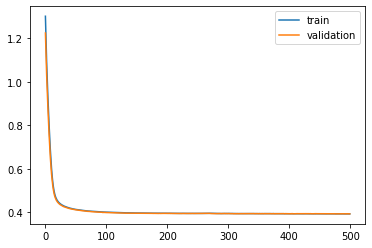

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 43s - loss: 1.3013 - val_loss: 1.2221

Epoch 00001: val_loss improved from inf to 1.22209, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.1871 - val_loss: 1.1200

Epoch 00002: val_loss improved from 1.22209 to 1.11995, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0910 - val_loss: 1.0335

Epoch 00003: val_loss improved from 1.11995 to 1.03347, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 1.0085 - val_loss: 0.9573

Epoch 00004: val_loss improved from 1.03347 to 0.95732, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.9349 - val_loss: 0.8882

Epoch 00005: val_loss improved from 0.95732 to 0.88817, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8668 - val_loss: 0.8236

Epoch 00006: val_loss improved from 0.88817 to 0.82358, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.8030 - val_loss: 0.7630

Epoch 00007: val_loss improved from 0.82358

 - 1s - loss: 0.4098 - val_loss: 0.4129

Epoch 00058: val_loss improved from 0.41291 to 0.41288, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4093 - val_loss: 0.4127

Epoch 00059: val_loss improved from 0.41288 to 0.41270, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4091 - val_loss: 0.4120

Epoch 00060: val_loss improved from 0.41270 to 0.41202, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4086 - val_loss: 0.4121

Epoch 00061: val_loss did not improve from 0.41202
Epoch 62/500
 - 1s - loss: 0.4083 - val_loss: 0.4115

Epoch 00062: val_loss improved from 0.41202 to 0.41151, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4079 - val_loss: 0.4114

Epoch 00063: val_loss improved from 0.41151 to 0.41139, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4076 - val_loss: 0.4112

Epoch 00064: val_loss improved from 0.41139 to 0.41117, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4073 - val_loss

 - 1s - loss: 0.3985 - val_loss: 0.4024

Epoch 00120: val_loss improved from 0.40263 to 0.40239, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.3984 - val_loss: 0.4024

Epoch 00121: val_loss improved from 0.40239 to 0.40237, saving model to val_weights5.hdf5
Epoch 122/500
 - 1s - loss: 0.3983 - val_loss: 0.4021

Epoch 00122: val_loss improved from 0.40237 to 0.40210, saving model to val_weights5.hdf5
Epoch 123/500
 - 1s - loss: 0.3982 - val_loss: 0.4026

Epoch 00123: val_loss did not improve from 0.40210
Epoch 124/500
 - 1s - loss: 0.3982 - val_loss: 0.4022

Epoch 00124: val_loss did not improve from 0.40210
Epoch 125/500
 - 1s - loss: 0.3981 - val_loss: 0.4021

Epoch 00125: val_loss improved from 0.40210 to 0.40207, saving model to val_weights5.hdf5
Epoch 126/500
 - 1s - loss: 0.3979 - val_loss: 0.4019

Epoch 00126: val_loss improved from 0.40207 to 0.40187, saving model to val_weights5.hdf5
Epoch 127/500
 - 1s - loss: 0.3980 - val_loss: 0.4020

Epoch 00127: val_loss 


Epoch 00189: val_loss did not improve from 0.39930
Epoch 190/500
 - 1s - loss: 0.3954 - val_loss: 0.3990

Epoch 00190: val_loss improved from 0.39930 to 0.39904, saving model to val_weights5.hdf5
Epoch 191/500
 - 1s - loss: 0.3952 - val_loss: 0.3994

Epoch 00191: val_loss did not improve from 0.39904
Epoch 192/500
 - 1s - loss: 0.3952 - val_loss: 0.3989

Epoch 00192: val_loss improved from 0.39904 to 0.39895, saving model to val_weights5.hdf5
Epoch 193/500
 - 1s - loss: 0.3952 - val_loss: 0.3995

Epoch 00193: val_loss did not improve from 0.39895
Epoch 194/500
 - 1s - loss: 0.3953 - val_loss: 0.3995

Epoch 00194: val_loss did not improve from 0.39895
Epoch 195/500
 - 1s - loss: 0.3952 - val_loss: 0.3993

Epoch 00195: val_loss did not improve from 0.39895
Epoch 196/500
 - 1s - loss: 0.3951 - val_loss: 0.3989

Epoch 00196: val_loss improved from 0.39895 to 0.39894, saving model to val_weights5.hdf5
Epoch 197/500
 - 1s - loss: 0.3950 - val_loss: 0.3990

Epoch 00197: val_loss did not impr

 - 1s - loss: 0.3940 - val_loss: 0.3979

Epoch 00262: val_loss did not improve from 0.39767
Epoch 263/500
 - 1s - loss: 0.3938 - val_loss: 0.3981

Epoch 00263: val_loss did not improve from 0.39767
Epoch 264/500
 - 1s - loss: 0.3939 - val_loss: 0.3981

Epoch 00264: val_loss did not improve from 0.39767
Epoch 265/500
 - 1s - loss: 0.3940 - val_loss: 0.3981

Epoch 00265: val_loss did not improve from 0.39767
Epoch 266/500
 - 1s - loss: 0.3939 - val_loss: 0.3976

Epoch 00266: val_loss improved from 0.39767 to 0.39759, saving model to val_weights5.hdf5
Epoch 267/500
 - 1s - loss: 0.3939 - val_loss: 0.3979

Epoch 00267: val_loss did not improve from 0.39759
Epoch 268/500
 - 1s - loss: 0.3937 - val_loss: 0.3982

Epoch 00268: val_loss did not improve from 0.39759
Epoch 269/500
 - 1s - loss: 0.3939 - val_loss: 0.3979

Epoch 00269: val_loss did not improve from 0.39759
Epoch 270/500
 - 1s - loss: 0.3937 - val_loss: 0.3979

Epoch 00270: val_loss did not improve from 0.39759
Epoch 271/500
 - 1s -

 - 1s - loss: 0.3932 - val_loss: 0.3973

Epoch 00337: val_loss did not improve from 0.39698
Epoch 338/500
 - 1s - loss: 0.3932 - val_loss: 0.3973

Epoch 00338: val_loss did not improve from 0.39698
Epoch 339/500
 - 1s - loss: 0.3931 - val_loss: 0.3970

Epoch 00339: val_loss did not improve from 0.39698
Epoch 340/500
 - 1s - loss: 0.3930 - val_loss: 0.3978

Epoch 00340: val_loss did not improve from 0.39698
Epoch 341/500
 - 1s - loss: 0.3929 - val_loss: 0.3973

Epoch 00341: val_loss did not improve from 0.39698
Epoch 342/500
 - 1s - loss: 0.3930 - val_loss: 0.3972

Epoch 00342: val_loss did not improve from 0.39698
Epoch 343/500
 - 1s - loss: 0.3930 - val_loss: 0.3971

Epoch 00343: val_loss did not improve from 0.39698
Epoch 344/500
 - 1s - loss: 0.3929 - val_loss: 0.3971

Epoch 00344: val_loss did not improve from 0.39698
Epoch 345/500
 - 1s - loss: 0.3931 - val_loss: 0.3971

Epoch 00345: val_loss did not improve from 0.39698
Epoch 346/500
 - 1s - loss: 0.3929 - val_loss: 0.3977

Epoch

 - 1s - loss: 0.3924 - val_loss: 0.3967

Epoch 00413: val_loss did not improve from 0.39653
Epoch 414/500
 - 1s - loss: 0.3925 - val_loss: 0.3973

Epoch 00414: val_loss did not improve from 0.39653
Epoch 415/500
 - 1s - loss: 0.3925 - val_loss: 0.3967

Epoch 00415: val_loss did not improve from 0.39653
Epoch 416/500
 - 1s - loss: 0.3924 - val_loss: 0.3970

Epoch 00416: val_loss did not improve from 0.39653
Epoch 417/500
 - 1s - loss: 0.3924 - val_loss: 0.3966

Epoch 00417: val_loss did not improve from 0.39653
Epoch 418/500
 - 1s - loss: 0.3924 - val_loss: 0.3971

Epoch 00418: val_loss did not improve from 0.39653
Epoch 419/500
 - 1s - loss: 0.3923 - val_loss: 0.3971

Epoch 00419: val_loss did not improve from 0.39653
Epoch 420/500
 - 1s - loss: 0.3923 - val_loss: 0.3972

Epoch 00420: val_loss did not improve from 0.39653
Epoch 421/500
 - 1s - loss: 0.3923 - val_loss: 0.3967

Epoch 00421: val_loss did not improve from 0.39653
Epoch 422/500
 - 1s - loss: 0.3924 - val_loss: 0.3967

Epoch

 - 1s - loss: 0.3920 - val_loss: 0.3972

Epoch 00489: val_loss did not improve from 0.39633
Epoch 490/500
 - 1s - loss: 0.3921 - val_loss: 0.3968

Epoch 00490: val_loss did not improve from 0.39633
Epoch 491/500
 - 1s - loss: 0.3921 - val_loss: 0.3967

Epoch 00491: val_loss did not improve from 0.39633
Epoch 492/500
 - 1s - loss: 0.3920 - val_loss: 0.3966

Epoch 00492: val_loss did not improve from 0.39633
Epoch 493/500
 - 1s - loss: 0.3920 - val_loss: 0.3972

Epoch 00493: val_loss did not improve from 0.39633
Epoch 494/500
 - 1s - loss: 0.3920 - val_loss: 0.3966

Epoch 00494: val_loss did not improve from 0.39633
Epoch 495/500
 - 1s - loss: 0.3919 - val_loss: 0.3967

Epoch 00495: val_loss did not improve from 0.39633
Epoch 496/500
 - 1s - loss: 0.3920 - val_loss: 0.3966

Epoch 00496: val_loss did not improve from 0.39633
Epoch 497/500
 - 1s - loss: 0.3919 - val_loss: 0.3970

Epoch 00497: val_loss did not improve from 0.39633
Epoch 498/500
 - 1s - loss: 0.3919 - val_loss: 0.3968

Epoch

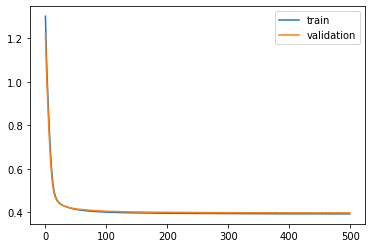

Time to train LSTM:  412.57107496261597
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 43s - loss: 1.1367 - val_loss: 1.0846

Epoch 00001: val_loss improved from inf to 1.08464, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0451 - val_loss: 1.0023

Epoch 00002: val_loss improved from 1.08464 to 1.00226, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9706 - val_loss: 0.9341

Epoch 00003: val_loss improved from 1.00226 to 0.93412, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9075 - val_loss: 0.8753

Epoch 00004: val_loss improved from 0.93412 to 0.87533, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8509 - val_loss: 0.8210

Epoch 00005: val_loss improved from 0.87533 to 0.82099, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.7978 - val_loss: 0.7699

Epoch 00006: val_loss improved from 0.82099 to 0.76993, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7471 - val_loss: 0.7213

Epo

 - 1s - loss: 0.4080 - val_loss: 0.4149

Epoch 00058: val_loss improved from 0.41546 to 0.41491, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4075 - val_loss: 0.4146

Epoch 00059: val_loss improved from 0.41491 to 0.41463, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4073 - val_loss: 0.4143

Epoch 00060: val_loss improved from 0.41463 to 0.41428, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4069 - val_loss: 0.4136

Epoch 00061: val_loss improved from 0.41428 to 0.41363, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4066 - val_loss: 0.4134

Epoch 00062: val_loss improved from 0.41363 to 0.41337, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4062 - val_loss: 0.4131

Epoch 00063: val_loss improved from 0.41337 to 0.41308, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4060 - val_loss: 0.4128

Epoch 00064: val_loss improved from 0.41308 to 0.41280, saving model to val_weights1.hdf5
Epoch

 - 1s - loss: 0.3971 - val_loss: 0.4026

Epoch 00119: val_loss did not improve from 0.40263
Epoch 120/500
 - 1s - loss: 0.3970 - val_loss: 0.4025

Epoch 00120: val_loss improved from 0.40263 to 0.40251, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.3969 - val_loss: 0.4023

Epoch 00121: val_loss improved from 0.40251 to 0.40233, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3968 - val_loss: 0.4028

Epoch 00122: val_loss did not improve from 0.40233
Epoch 123/500
 - 1s - loss: 0.3967 - val_loss: 0.4021

Epoch 00123: val_loss improved from 0.40233 to 0.40209, saving model to val_weights1.hdf5
Epoch 124/500
 - 1s - loss: 0.3967 - val_loss: 0.4023

Epoch 00124: val_loss did not improve from 0.40209
Epoch 125/500
 - 1s - loss: 0.3966 - val_loss: 0.4022

Epoch 00125: val_loss did not improve from 0.40209
Epoch 126/500
 - 1s - loss: 0.3965 - val_loss: 0.4020

Epoch 00126: val_loss improved from 0.40209 to 0.40204, saving model to val_weights1.hdf5
Epoch 127/


Epoch 00186: val_loss did not improve from 0.39919
Epoch 187/500
 - 1s - loss: 0.3937 - val_loss: 0.3995

Epoch 00187: val_loss did not improve from 0.39919
Epoch 188/500
 - 1s - loss: 0.3935 - val_loss: 0.3992

Epoch 00188: val_loss did not improve from 0.39919
Epoch 189/500
 - 1s - loss: 0.3936 - val_loss: 0.3994

Epoch 00189: val_loss did not improve from 0.39919
Epoch 190/500
 - 1s - loss: 0.3936 - val_loss: 0.3992

Epoch 00190: val_loss did not improve from 0.39919
Epoch 191/500
 - 1s - loss: 0.3935 - val_loss: 0.3991

Epoch 00191: val_loss improved from 0.39919 to 0.39909, saving model to val_weights1.hdf5
Epoch 192/500
 - 1s - loss: 0.3935 - val_loss: 0.3991

Epoch 00192: val_loss did not improve from 0.39909
Epoch 193/500
 - 1s - loss: 0.3934 - val_loss: 0.3991

Epoch 00193: val_loss did not improve from 0.39909
Epoch 194/500
 - 1s - loss: 0.3934 - val_loss: 0.3989

Epoch 00194: val_loss improved from 0.39909 to 0.39893, saving model to val_weights1.hdf5
Epoch 195/500
 - 1s - 

 - 1s - loss: 0.3924 - val_loss: 0.3981

Epoch 00259: val_loss did not improve from 0.39772
Epoch 260/500
 - 1s - loss: 0.3925 - val_loss: 0.3981

Epoch 00260: val_loss did not improve from 0.39772
Epoch 261/500
 - 1s - loss: 0.3923 - val_loss: 0.3980

Epoch 00261: val_loss did not improve from 0.39772
Epoch 262/500
 - 1s - loss: 0.3924 - val_loss: 0.3980

Epoch 00262: val_loss did not improve from 0.39772
Epoch 263/500
 - 1s - loss: 0.3923 - val_loss: 0.3982

Epoch 00263: val_loss did not improve from 0.39772
Epoch 264/500
 - 1s - loss: 0.3924 - val_loss: 0.3977

Epoch 00264: val_loss improved from 0.39772 to 0.39766, saving model to val_weights1.hdf5
Epoch 265/500
 - 1s - loss: 0.3922 - val_loss: 0.3980

Epoch 00265: val_loss did not improve from 0.39766
Epoch 266/500
 - 1s - loss: 0.3923 - val_loss: 0.3979

Epoch 00266: val_loss did not improve from 0.39766
Epoch 267/500
 - 1s - loss: 0.3923 - val_loss: 0.3983

Epoch 00267: val_loss did not improve from 0.39766
Epoch 268/500
 - 1s -


Epoch 00333: val_loss did not improve from 0.39688
Epoch 334/500
 - 1s - loss: 0.3916 - val_loss: 0.3973

Epoch 00334: val_loss did not improve from 0.39688
Epoch 335/500
 - 1s - loss: 0.3915 - val_loss: 0.3972

Epoch 00335: val_loss did not improve from 0.39688
Epoch 336/500
 - 1s - loss: 0.3916 - val_loss: 0.3972

Epoch 00336: val_loss did not improve from 0.39688
Epoch 337/500
 - 1s - loss: 0.3917 - val_loss: 0.3974

Epoch 00337: val_loss did not improve from 0.39688
Epoch 338/500
 - 1s - loss: 0.3917 - val_loss: 0.3976

Epoch 00338: val_loss did not improve from 0.39688
Epoch 339/500
 - 1s - loss: 0.3916 - val_loss: 0.3973

Epoch 00339: val_loss did not improve from 0.39688
Epoch 340/500
 - 1s - loss: 0.3915 - val_loss: 0.3974

Epoch 00340: val_loss did not improve from 0.39688
Epoch 341/500
 - 1s - loss: 0.3915 - val_loss: 0.3973

Epoch 00341: val_loss did not improve from 0.39688
Epoch 342/500
 - 1s - loss: 0.3915 - val_loss: 0.3973

Epoch 00342: val_loss did not improve from 0.

 - 1s - loss: 0.3907 - val_loss: 0.3970

Epoch 00409: val_loss did not improve from 0.39671
Epoch 410/500
 - 1s - loss: 0.3907 - val_loss: 0.3968

Epoch 00410: val_loss did not improve from 0.39671
Epoch 411/500
 - 1s - loss: 0.3906 - val_loss: 0.3967

Epoch 00411: val_loss improved from 0.39671 to 0.39667, saving model to val_weights1.hdf5
Epoch 412/500
 - 1s - loss: 0.3907 - val_loss: 0.3967

Epoch 00412: val_loss did not improve from 0.39667
Epoch 413/500
 - 1s - loss: 0.3907 - val_loss: 0.3968

Epoch 00413: val_loss did not improve from 0.39667
Epoch 414/500
 - 1s - loss: 0.3907 - val_loss: 0.3973

Epoch 00414: val_loss did not improve from 0.39667
Epoch 415/500
 - 1s - loss: 0.3909 - val_loss: 0.3969

Epoch 00415: val_loss did not improve from 0.39667
Epoch 416/500
 - 1s - loss: 0.3907 - val_loss: 0.3962

Epoch 00416: val_loss improved from 0.39667 to 0.39621, saving model to val_weights1.hdf5
Epoch 417/500
 - 1s - loss: 0.3905 - val_loss: 0.3969

Epoch 00417: val_loss did not imp

 - 1s - loss: 0.3900 - val_loss: 0.3964

Epoch 00486: val_loss did not improve from 0.39621
Epoch 487/500
 - 1s - loss: 0.3902 - val_loss: 0.3967

Epoch 00487: val_loss did not improve from 0.39621
Epoch 488/500
 - 1s - loss: 0.3903 - val_loss: 0.3969

Epoch 00488: val_loss did not improve from 0.39621
Epoch 489/500
 - 1s - loss: 0.3902 - val_loss: 0.3966

Epoch 00489: val_loss did not improve from 0.39621
Epoch 490/500
 - 1s - loss: 0.3901 - val_loss: 0.3968

Epoch 00490: val_loss did not improve from 0.39621
Epoch 491/500
 - 1s - loss: 0.3900 - val_loss: 0.3964

Epoch 00491: val_loss did not improve from 0.39621
Epoch 492/500
 - 1s - loss: 0.3898 - val_loss: 0.3963

Epoch 00492: val_loss did not improve from 0.39621
Epoch 493/500
 - 1s - loss: 0.3899 - val_loss: 0.3965

Epoch 00493: val_loss did not improve from 0.39621
Epoch 494/500
 - 1s - loss: 0.3899 - val_loss: 0.3965

Epoch 00494: val_loss did not improve from 0.39621
Epoch 495/500
 - 1s - loss: 0.3900 - val_loss: 0.3963

Epoch

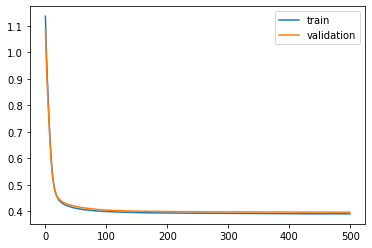

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 44s - loss: 1.1374 - val_loss: 1.0803

Epoch 00001: val_loss improved from inf to 1.08026, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0457 - val_loss: 1.0008

Epoch 00002: val_loss improved from 1.08026 to 1.00081, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9708 - val_loss: 0.9342

Epoch 00003: val_loss improved from 1.00081 to 0.93423, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9075 - val_loss: 0.8754

Epoch 00004: val_loss improved from 0.93423 to 0.87540, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8506 - val_loss: 0.8204

Epoch 00005: val_loss improved from 0.87540 to 0.82041, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.7975 - val_loss: 0.7678

Epoch 00006: val_loss improved from 0.82041 to 0.76777, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7471 - val_loss: 0.7182

Epoch 00007: val_loss improved from 0.76777

 - 1s - loss: 0.4085 - val_loss: 0.4061

Epoch 00058: val_loss improved from 0.40652 to 0.40606, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4081 - val_loss: 0.4057

Epoch 00059: val_loss improved from 0.40606 to 0.40570, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4078 - val_loss: 0.4055

Epoch 00060: val_loss improved from 0.40570 to 0.40550, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4074 - val_loss: 0.4049

Epoch 00061: val_loss improved from 0.40550 to 0.40489, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4072 - val_loss: 0.4048

Epoch 00062: val_loss improved from 0.40489 to 0.40482, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4068 - val_loss: 0.4045

Epoch 00063: val_loss improved from 0.40482 to 0.40448, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4064 - val_loss: 0.4041

Epoch 00064: val_loss improved from 0.40448 to 0.40412, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3975 - val_loss: 0.3969

Epoch 00119: val_loss did not improve from 0.39654
Epoch 120/500
 - 1s - loss: 0.3977 - val_loss: 0.3972

Epoch 00120: val_loss did not improve from 0.39654
Epoch 121/500
 - 1s - loss: 0.3975 - val_loss: 0.3968

Epoch 00121: val_loss did not improve from 0.39654
Epoch 122/500
 - 1s - loss: 0.3973 - val_loss: 0.3970

Epoch 00122: val_loss did not improve from 0.39654
Epoch 123/500
 - 1s - loss: 0.3974 - val_loss: 0.3962

Epoch 00123: val_loss improved from 0.39654 to 0.39618, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3973 - val_loss: 0.3966

Epoch 00124: val_loss did not improve from 0.39618
Epoch 125/500
 - 1s - loss: 0.3972 - val_loss: 0.3963

Epoch 00125: val_loss did not improve from 0.39618
Epoch 126/500
 - 1s - loss: 0.3970 - val_loss: 0.3966

Epoch 00126: val_loss did not improve from 0.39618
Epoch 127/500
 - 1s - loss: 0.3971 - val_loss: 0.3963

Epoch 00127: val_loss did not improve from 0.39618
Epoch 128/500
 - 1s -


Epoch 00188: val_loss improved from 0.39354 to 0.39323, saving model to val_weights2.hdf5
Epoch 189/500
 - 1s - loss: 0.3942 - val_loss: 0.3936

Epoch 00189: val_loss did not improve from 0.39323
Epoch 190/500
 - 1s - loss: 0.3942 - val_loss: 0.3932

Epoch 00190: val_loss improved from 0.39323 to 0.39321, saving model to val_weights2.hdf5
Epoch 191/500
 - 1s - loss: 0.3942 - val_loss: 0.3937

Epoch 00191: val_loss did not improve from 0.39321
Epoch 192/500
 - 1s - loss: 0.3941 - val_loss: 0.3934

Epoch 00192: val_loss did not improve from 0.39321
Epoch 193/500
 - 1s - loss: 0.3940 - val_loss: 0.3937

Epoch 00193: val_loss did not improve from 0.39321
Epoch 194/500
 - 1s - loss: 0.3941 - val_loss: 0.3934

Epoch 00194: val_loss did not improve from 0.39321
Epoch 195/500
 - 1s - loss: 0.3939 - val_loss: 0.3936

Epoch 00195: val_loss did not improve from 0.39321
Epoch 196/500
 - 1s - loss: 0.3940 - val_loss: 0.3933

Epoch 00196: val_loss did not improve from 0.39321
Epoch 197/500
 - 1s - 


Epoch 00260: val_loss did not improve from 0.39232
Epoch 261/500
 - 1s - loss: 0.3930 - val_loss: 0.3924

Epoch 00261: val_loss did not improve from 0.39232
Epoch 262/500
 - 1s - loss: 0.3929 - val_loss: 0.3926

Epoch 00262: val_loss did not improve from 0.39232
Epoch 263/500
 - 1s - loss: 0.3929 - val_loss: 0.3924

Epoch 00263: val_loss did not improve from 0.39232
Epoch 264/500
 - 1s - loss: 0.3928 - val_loss: 0.3923

Epoch 00264: val_loss did not improve from 0.39232
Epoch 265/500
 - 1s - loss: 0.3930 - val_loss: 0.3923

Epoch 00265: val_loss did not improve from 0.39232
Epoch 266/500
 - 1s - loss: 0.3929 - val_loss: 0.3925

Epoch 00266: val_loss did not improve from 0.39232
Epoch 267/500
 - 1s - loss: 0.3930 - val_loss: 0.3923

Epoch 00267: val_loss improved from 0.39232 to 0.39230, saving model to val_weights2.hdf5
Epoch 268/500
 - 1s - loss: 0.3929 - val_loss: 0.3925

Epoch 00268: val_loss did not improve from 0.39230
Epoch 269/500
 - 1s - loss: 0.3929 - val_loss: 0.3922

Epoch 


Epoch 00335: val_loss did not improve from 0.39174
Epoch 336/500
 - 1s - loss: 0.3922 - val_loss: 0.3920

Epoch 00336: val_loss did not improve from 0.39174
Epoch 337/500
 - 1s - loss: 0.3922 - val_loss: 0.3923

Epoch 00337: val_loss did not improve from 0.39174
Epoch 338/500
 - 1s - loss: 0.3921 - val_loss: 0.3919

Epoch 00338: val_loss did not improve from 0.39174
Epoch 339/500
 - 1s - loss: 0.3920 - val_loss: 0.3921

Epoch 00339: val_loss did not improve from 0.39174
Epoch 340/500
 - 1s - loss: 0.3921 - val_loss: 0.3918

Epoch 00340: val_loss did not improve from 0.39174
Epoch 341/500
 - 1s - loss: 0.3920 - val_loss: 0.3923

Epoch 00341: val_loss did not improve from 0.39174
Epoch 342/500
 - 1s - loss: 0.3921 - val_loss: 0.3921

Epoch 00342: val_loss did not improve from 0.39174
Epoch 343/500
 - 1s - loss: 0.3919 - val_loss: 0.3923

Epoch 00343: val_loss did not improve from 0.39174
Epoch 344/500
 - 1s - loss: 0.3921 - val_loss: 0.3919

Epoch 00344: val_loss did not improve from 0.

 - 1s - loss: 0.3915 - val_loss: 0.3924

Epoch 00413: val_loss did not improve from 0.39174
Epoch 414/500
 - 1s - loss: 0.3914 - val_loss: 0.3924

Epoch 00414: val_loss did not improve from 0.39174
Epoch 415/500
 - 1s - loss: 0.3913 - val_loss: 0.3922

Epoch 00415: val_loss did not improve from 0.39174
Epoch 416/500
 - 1s - loss: 0.3913 - val_loss: 0.3924

Epoch 00416: val_loss did not improve from 0.39174
Epoch 417/500
 - 1s - loss: 0.3912 - val_loss: 0.3924

Epoch 00417: val_loss did not improve from 0.39174
Epoch 418/500
 - 1s - loss: 0.3912 - val_loss: 0.3924

Epoch 00418: val_loss did not improve from 0.39174
Epoch 419/500
 - 1s - loss: 0.3914 - val_loss: 0.3926

Epoch 00419: val_loss did not improve from 0.39174
Epoch 420/500
 - 1s - loss: 0.3914 - val_loss: 0.3925

Epoch 00420: val_loss did not improve from 0.39174
Epoch 421/500
 - 1s - loss: 0.3912 - val_loss: 0.3924

Epoch 00421: val_loss did not improve from 0.39174
Epoch 422/500
 - 1s - loss: 0.3914 - val_loss: 0.3923

Epoch


Epoch 00490: val_loss did not improve from 0.39174
Epoch 491/500
 - 1s - loss: 0.3910 - val_loss: 0.3925

Epoch 00491: val_loss did not improve from 0.39174
Epoch 492/500
 - 1s - loss: 0.3910 - val_loss: 0.3923

Epoch 00492: val_loss did not improve from 0.39174
Epoch 493/500
 - 1s - loss: 0.3909 - val_loss: 0.3927

Epoch 00493: val_loss did not improve from 0.39174
Epoch 494/500
 - 1s - loss: 0.3911 - val_loss: 0.3930

Epoch 00494: val_loss did not improve from 0.39174
Epoch 495/500
 - 1s - loss: 0.3911 - val_loss: 0.3931

Epoch 00495: val_loss did not improve from 0.39174
Epoch 496/500
 - 1s - loss: 0.3912 - val_loss: 0.3926

Epoch 00496: val_loss did not improve from 0.39174
Epoch 497/500
 - 1s - loss: 0.3910 - val_loss: 0.3928

Epoch 00497: val_loss did not improve from 0.39174
Epoch 498/500
 - 1s - loss: 0.3909 - val_loss: 0.3930

Epoch 00498: val_loss did not improve from 0.39174
Epoch 499/500
 - 1s - loss: 0.3911 - val_loss: 0.3930

Epoch 00499: val_loss did not improve from 0.

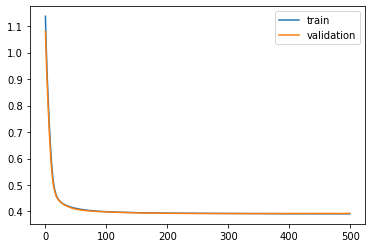

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 44s - loss: 1.1388 - val_loss: 1.0682

Epoch 00001: val_loss improved from inf to 1.06818, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0473 - val_loss: 0.9871

Epoch 00002: val_loss improved from 1.06818 to 0.98713, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9725 - val_loss: 0.9202

Epoch 00003: val_loss improved from 0.98713 to 0.92023, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9092 - val_loss: 0.8624

Epoch 00004: val_loss improved from 0.92023 to 0.86239, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8523 - val_loss: 0.8091

Epoch 00005: val_loss improved from 0.86239 to 0.80911, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.7990 - val_loss: 0.7587

Epoch 00006: val_loss improved from 0.80911 to 0.75873, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7482 - val_loss: 0.7120

Epoch 00007: val_loss improved from 0.75873

 - 1s - loss: 0.4080 - val_loss: 0.4153

Epoch 00058: val_loss improved from 0.41580 to 0.41530, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4075 - val_loss: 0.4152

Epoch 00059: val_loss improved from 0.41530 to 0.41519, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4073 - val_loss: 0.4148

Epoch 00060: val_loss improved from 0.41519 to 0.41481, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4068 - val_loss: 0.4145

Epoch 00061: val_loss improved from 0.41481 to 0.41452, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4067 - val_loss: 0.4141

Epoch 00062: val_loss improved from 0.41452 to 0.41410, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4061 - val_loss: 0.4139

Epoch 00063: val_loss improved from 0.41410 to 0.41391, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4059 - val_loss: 0.4137

Epoch 00064: val_loss improved from 0.41391 to 0.41368, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.3966 - val_loss: 0.4065

Epoch 00122: val_loss did not improve from 0.40630
Epoch 123/500
 - 1s - loss: 0.3965 - val_loss: 0.4064

Epoch 00123: val_loss did not improve from 0.40630
Epoch 124/500
 - 1s - loss: 0.3964 - val_loss: 0.4063

Epoch 00124: val_loss did not improve from 0.40630
Epoch 125/500
 - 1s - loss: 0.3963 - val_loss: 0.4064

Epoch 00125: val_loss did not improve from 0.40630
Epoch 126/500
 - 1s - loss: 0.3961 - val_loss: 0.4060

Epoch 00126: val_loss improved from 0.40630 to 0.40598, saving model to val_weights3.hdf5
Epoch 127/500
 - 1s - loss: 0.3962 - val_loss: 0.4061

Epoch 00127: val_loss did not improve from 0.40598
Epoch 128/500
 - 1s - loss: 0.3960 - val_loss: 0.4061

Epoch 00128: val_loss did not improve from 0.40598
Epoch 129/500
 - 1s - loss: 0.3961 - val_loss: 0.4059

Epoch 00129: val_loss improved from 0.40598 to 0.40588, saving model to val_weights3.hdf5
Epoch 130/500
 - 1s - loss: 0.3958 - val_loss: 0.4058

Epoch 00130: val_loss improved fr

 - 1s - loss: 0.3932 - val_loss: 0.4034

Epoch 00192: val_loss improved from 0.40345 to 0.40342, saving model to val_weights3.hdf5
Epoch 193/500
 - 1s - loss: 0.3932 - val_loss: 0.4032

Epoch 00193: val_loss improved from 0.40342 to 0.40316, saving model to val_weights3.hdf5
Epoch 194/500
 - 1s - loss: 0.3933 - val_loss: 0.4038

Epoch 00194: val_loss did not improve from 0.40316
Epoch 195/500
 - 1s - loss: 0.3933 - val_loss: 0.4035

Epoch 00195: val_loss did not improve from 0.40316
Epoch 196/500
 - 1s - loss: 0.3931 - val_loss: 0.4034

Epoch 00196: val_loss did not improve from 0.40316
Epoch 197/500
 - 1s - loss: 0.3931 - val_loss: 0.4034

Epoch 00197: val_loss did not improve from 0.40316
Epoch 198/500
 - 1s - loss: 0.3932 - val_loss: 0.4036

Epoch 00198: val_loss did not improve from 0.40316
Epoch 199/500
 - 1s - loss: 0.3931 - val_loss: 0.4034

Epoch 00199: val_loss did not improve from 0.40316
Epoch 200/500
 - 1s - loss: 0.3932 - val_loss: 0.4037

Epoch 00200: val_loss did not imp

 - 1s - loss: 0.3921 - val_loss: 0.4023

Epoch 00266: val_loss improved from 0.40247 to 0.40234, saving model to val_weights3.hdf5
Epoch 267/500
 - 1s - loss: 0.3921 - val_loss: 0.4028

Epoch 00267: val_loss did not improve from 0.40234
Epoch 268/500
 - 1s - loss: 0.3921 - val_loss: 0.4024

Epoch 00268: val_loss did not improve from 0.40234
Epoch 269/500
 - 1s - loss: 0.3922 - val_loss: 0.4026

Epoch 00269: val_loss did not improve from 0.40234
Epoch 270/500
 - 1s - loss: 0.3920 - val_loss: 0.4024

Epoch 00270: val_loss did not improve from 0.40234
Epoch 271/500
 - 1s - loss: 0.3920 - val_loss: 0.4026

Epoch 00271: val_loss did not improve from 0.40234
Epoch 272/500
 - 1s - loss: 0.3921 - val_loss: 0.4023

Epoch 00272: val_loss improved from 0.40234 to 0.40233, saving model to val_weights3.hdf5
Epoch 273/500
 - 1s - loss: 0.3921 - val_loss: 0.4028

Epoch 00273: val_loss did not improve from 0.40233
Epoch 274/500
 - 1s - loss: 0.3921 - val_loss: 0.4025

Epoch 00274: val_loss did not imp


Epoch 00339: val_loss did not improve from 0.40145
Epoch 340/500
 - 1s - loss: 0.3914 - val_loss: 0.4016

Epoch 00340: val_loss did not improve from 0.40145
Epoch 341/500
 - 1s - loss: 0.3913 - val_loss: 0.4017

Epoch 00341: val_loss did not improve from 0.40145
Epoch 342/500
 - 1s - loss: 0.3913 - val_loss: 0.4015

Epoch 00342: val_loss did not improve from 0.40145
Epoch 343/500
 - 1s - loss: 0.3913 - val_loss: 0.4017

Epoch 00343: val_loss did not improve from 0.40145
Epoch 344/500
 - 1s - loss: 0.3912 - val_loss: 0.4015

Epoch 00344: val_loss did not improve from 0.40145
Epoch 345/500
 - 1s - loss: 0.3912 - val_loss: 0.4018

Epoch 00345: val_loss did not improve from 0.40145
Epoch 346/500
 - 1s - loss: 0.3912 - val_loss: 0.4014

Epoch 00346: val_loss improved from 0.40145 to 0.40137, saving model to val_weights3.hdf5
Epoch 347/500
 - 1s - loss: 0.3911 - val_loss: 0.4019

Epoch 00347: val_loss did not improve from 0.40137
Epoch 348/500
 - 1s - loss: 0.3912 - val_loss: 0.4015

Epoch 

 - 1s - loss: 0.3905 - val_loss: 0.4013

Epoch 00414: val_loss did not improve from 0.40096
Epoch 415/500
 - 1s - loss: 0.3907 - val_loss: 0.4016

Epoch 00415: val_loss did not improve from 0.40096
Epoch 416/500
 - 1s - loss: 0.3907 - val_loss: 0.4017

Epoch 00416: val_loss did not improve from 0.40096
Epoch 417/500
 - 1s - loss: 0.3907 - val_loss: 0.4012

Epoch 00417: val_loss did not improve from 0.40096
Epoch 418/500
 - 1s - loss: 0.3906 - val_loss: 0.4012

Epoch 00418: val_loss did not improve from 0.40096
Epoch 419/500
 - 1s - loss: 0.3906 - val_loss: 0.4013

Epoch 00419: val_loss did not improve from 0.40096
Epoch 420/500
 - 1s - loss: 0.3907 - val_loss: 0.4013

Epoch 00420: val_loss did not improve from 0.40096
Epoch 421/500
 - 1s - loss: 0.3905 - val_loss: 0.4012

Epoch 00421: val_loss did not improve from 0.40096
Epoch 422/500
 - 1s - loss: 0.3905 - val_loss: 0.4011

Epoch 00422: val_loss did not improve from 0.40096
Epoch 423/500
 - 1s - loss: 0.3904 - val_loss: 0.4010

Epoch

 - 1s - loss: 0.3898 - val_loss: 0.4011

Epoch 00489: val_loss did not improve from 0.40049
Epoch 490/500
 - 1s - loss: 0.3900 - val_loss: 0.4009

Epoch 00490: val_loss did not improve from 0.40049
Epoch 491/500
 - 1s - loss: 0.3899 - val_loss: 0.4011

Epoch 00491: val_loss did not improve from 0.40049
Epoch 492/500
 - 1s - loss: 0.3900 - val_loss: 0.4008

Epoch 00492: val_loss did not improve from 0.40049
Epoch 493/500
 - 1s - loss: 0.3900 - val_loss: 0.4010

Epoch 00493: val_loss did not improve from 0.40049
Epoch 494/500
 - 1s - loss: 0.3898 - val_loss: 0.4006

Epoch 00494: val_loss did not improve from 0.40049
Epoch 495/500
 - 1s - loss: 0.3900 - val_loss: 0.4009

Epoch 00495: val_loss did not improve from 0.40049
Epoch 496/500
 - 1s - loss: 0.3898 - val_loss: 0.4009

Epoch 00496: val_loss did not improve from 0.40049
Epoch 497/500
 - 1s - loss: 0.3899 - val_loss: 0.4009

Epoch 00497: val_loss did not improve from 0.40049
Epoch 498/500
 - 1s - loss: 0.3898 - val_loss: 0.4008

Epoch

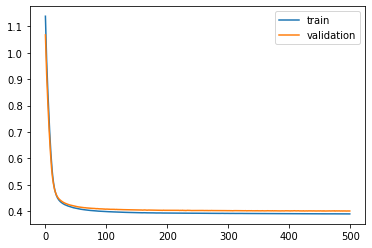

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 44s - loss: 1.1380 - val_loss: 1.0738

Epoch 00001: val_loss improved from inf to 1.07384, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0467 - val_loss: 0.9923

Epoch 00002: val_loss improved from 1.07384 to 0.99231, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9720 - val_loss: 0.9252

Epoch 00003: val_loss improved from 0.99231 to 0.92525, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9087 - val_loss: 0.8665

Epoch 00004: val_loss improved from 0.92525 to 0.86649, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8518 - val_loss: 0.8117

Epoch 00005: val_loss improved from 0.86649 to 0.81173, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.7986 - val_loss: 0.7598

Epoch 00006: val_loss improved from 0.81173 to 0.75979, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7482 - val_loss: 0.7108

Epoch 00007: val_loss improved from 0.75979

 - 1s - loss: 0.4087 - val_loss: 0.4080

Epoch 00058: val_loss improved from 0.40832 to 0.40800, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4084 - val_loss: 0.4079

Epoch 00059: val_loss improved from 0.40800 to 0.40790, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4081 - val_loss: 0.4071

Epoch 00060: val_loss improved from 0.40790 to 0.40713, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4077 - val_loss: 0.4072

Epoch 00061: val_loss did not improve from 0.40713
Epoch 62/500
 - 1s - loss: 0.4074 - val_loss: 0.4064

Epoch 00062: val_loss improved from 0.40713 to 0.40642, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4070 - val_loss: 0.4063

Epoch 00063: val_loss improved from 0.40642 to 0.40633, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4067 - val_loss: 0.4057

Epoch 00064: val_loss improved from 0.40633 to 0.40574, saving model to val_weights4.hdf5
Epoch 65/500
 - 1s - loss: 0.4064 - val_loss

 - 1s - loss: 0.3976 - val_loss: 0.3970

Epoch 00119: val_loss did not improve from 0.39666
Epoch 120/500
 - 1s - loss: 0.3976 - val_loss: 0.3967

Epoch 00120: val_loss did not improve from 0.39666
Epoch 121/500
 - 1s - loss: 0.3974 - val_loss: 0.3968

Epoch 00121: val_loss did not improve from 0.39666
Epoch 122/500
 - 1s - loss: 0.3974 - val_loss: 0.3965

Epoch 00122: val_loss improved from 0.39666 to 0.39650, saving model to val_weights4.hdf5
Epoch 123/500
 - 1s - loss: 0.3973 - val_loss: 0.3967

Epoch 00123: val_loss did not improve from 0.39650
Epoch 124/500
 - 1s - loss: 0.3971 - val_loss: 0.3963

Epoch 00124: val_loss improved from 0.39650 to 0.39630, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3971 - val_loss: 0.3964

Epoch 00125: val_loss did not improve from 0.39630
Epoch 126/500
 - 1s - loss: 0.3970 - val_loss: 0.3962

Epoch 00126: val_loss improved from 0.39630 to 0.39621, saving model to val_weights4.hdf5
Epoch 127/500
 - 1s - loss: 0.3969 - val_loss: 0.


Epoch 00189: val_loss did not improve from 0.39457
Epoch 190/500
 - 1s - loss: 0.3947 - val_loss: 0.3948

Epoch 00190: val_loss did not improve from 0.39457
Epoch 191/500
 - 1s - loss: 0.3948 - val_loss: 0.3944

Epoch 00191: val_loss improved from 0.39457 to 0.39439, saving model to val_weights4.hdf5
Epoch 192/500
 - 1s - loss: 0.3947 - val_loss: 0.3945

Epoch 00192: val_loss did not improve from 0.39439
Epoch 193/500
 - 1s - loss: 0.3946 - val_loss: 0.3945

Epoch 00193: val_loss did not improve from 0.39439
Epoch 194/500
 - 1s - loss: 0.3945 - val_loss: 0.3943

Epoch 00194: val_loss improved from 0.39439 to 0.39426, saving model to val_weights4.hdf5
Epoch 195/500
 - 1s - loss: 0.3944 - val_loss: 0.3943

Epoch 00195: val_loss did not improve from 0.39426
Epoch 196/500
 - 1s - loss: 0.3943 - val_loss: 0.3945

Epoch 00196: val_loss did not improve from 0.39426
Epoch 197/500
 - 1s - loss: 0.3943 - val_loss: 0.3941

Epoch 00197: val_loss improved from 0.39426 to 0.39409, saving model to v


Epoch 00263: val_loss did not improve from 0.39347
Epoch 264/500
 - 1s - loss: 0.3931 - val_loss: 0.3938

Epoch 00264: val_loss did not improve from 0.39347
Epoch 265/500
 - 1s - loss: 0.3932 - val_loss: 0.3940

Epoch 00265: val_loss did not improve from 0.39347
Epoch 266/500
 - 1s - loss: 0.3932 - val_loss: 0.3939

Epoch 00266: val_loss did not improve from 0.39347
Epoch 267/500
 - 1s - loss: 0.3932 - val_loss: 0.3935

Epoch 00267: val_loss did not improve from 0.39347
Epoch 268/500
 - 1s - loss: 0.3931 - val_loss: 0.3940

Epoch 00268: val_loss did not improve from 0.39347
Epoch 269/500
 - 1s - loss: 0.3931 - val_loss: 0.3935

Epoch 00269: val_loss did not improve from 0.39347
Epoch 270/500
 - 1s - loss: 0.3931 - val_loss: 0.3938

Epoch 00270: val_loss did not improve from 0.39347
Epoch 271/500
 - 1s - loss: 0.3931 - val_loss: 0.3938

Epoch 00271: val_loss did not improve from 0.39347
Epoch 272/500
 - 1s - loss: 0.3931 - val_loss: 0.3939

Epoch 00272: val_loss did not improve from 0.


Epoch 00339: val_loss did not improve from 0.39278
Epoch 340/500
 - 1s - loss: 0.3925 - val_loss: 0.3934

Epoch 00340: val_loss did not improve from 0.39278
Epoch 341/500
 - 1s - loss: 0.3924 - val_loss: 0.3934

Epoch 00341: val_loss did not improve from 0.39278
Epoch 342/500
 - 1s - loss: 0.3925 - val_loss: 0.3933

Epoch 00342: val_loss did not improve from 0.39278
Epoch 343/500
 - 1s - loss: 0.3924 - val_loss: 0.3930

Epoch 00343: val_loss did not improve from 0.39278
Epoch 344/500
 - 1s - loss: 0.3924 - val_loss: 0.3932

Epoch 00344: val_loss did not improve from 0.39278
Epoch 345/500
 - 1s - loss: 0.3924 - val_loss: 0.3931

Epoch 00345: val_loss did not improve from 0.39278
Epoch 346/500
 - 1s - loss: 0.3923 - val_loss: 0.3933

Epoch 00346: val_loss did not improve from 0.39278
Epoch 347/500
 - 1s - loss: 0.3926 - val_loss: 0.3934

Epoch 00347: val_loss did not improve from 0.39278
Epoch 348/500
 - 1s - loss: 0.3924 - val_loss: 0.3934

Epoch 00348: val_loss did not improve from 0.

 - 1s - loss: 0.3917 - val_loss: 0.3928

Epoch 00416: val_loss did not improve from 0.39225
Epoch 417/500
 - 1s - loss: 0.3917 - val_loss: 0.3927

Epoch 00417: val_loss did not improve from 0.39225
Epoch 418/500
 - 1s - loss: 0.3918 - val_loss: 0.3926

Epoch 00418: val_loss did not improve from 0.39225
Epoch 419/500
 - 1s - loss: 0.3916 - val_loss: 0.3932

Epoch 00419: val_loss did not improve from 0.39225
Epoch 420/500
 - 1s - loss: 0.3917 - val_loss: 0.3925

Epoch 00420: val_loss did not improve from 0.39225
Epoch 421/500
 - 1s - loss: 0.3917 - val_loss: 0.3930

Epoch 00421: val_loss did not improve from 0.39225
Epoch 422/500
 - 1s - loss: 0.3916 - val_loss: 0.3926

Epoch 00422: val_loss did not improve from 0.39225
Epoch 423/500
 - 1s - loss: 0.3917 - val_loss: 0.3929

Epoch 00423: val_loss did not improve from 0.39225
Epoch 424/500
 - 1s - loss: 0.3917 - val_loss: 0.3928

Epoch 00424: val_loss did not improve from 0.39225
Epoch 425/500
 - 1s - loss: 0.3917 - val_loss: 0.3928

Epoch

 - 1s - loss: 0.3916 - val_loss: 0.3926

Epoch 00493: val_loss did not improve from 0.39212
Epoch 494/500
 - 1s - loss: 0.3914 - val_loss: 0.3925

Epoch 00494: val_loss did not improve from 0.39212
Epoch 495/500
 - 1s - loss: 0.3915 - val_loss: 0.3923

Epoch 00495: val_loss did not improve from 0.39212
Epoch 496/500
 - 1s - loss: 0.3912 - val_loss: 0.3923

Epoch 00496: val_loss did not improve from 0.39212
Epoch 497/500
 - 1s - loss: 0.3914 - val_loss: 0.3923

Epoch 00497: val_loss did not improve from 0.39212
Epoch 498/500
 - 1s - loss: 0.3915 - val_loss: 0.3925

Epoch 00498: val_loss did not improve from 0.39212
Epoch 499/500
 - 1s - loss: 0.3915 - val_loss: 0.3922

Epoch 00499: val_loss did not improve from 0.39212
Epoch 500/500
 - 1s - loss: 0.3915 - val_loss: 0.3925

Epoch 00500: val_loss did not improve from 0.39212
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.009120805423153206
best val loss: 0.39212348432011074
############################

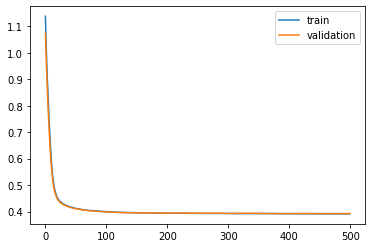

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 45s - loss: 1.1384 - val_loss: 1.0719

Epoch 00001: val_loss improved from inf to 1.07191, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0470 - val_loss: 0.9919

Epoch 00002: val_loss improved from 1.07191 to 0.99190, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9721 - val_loss: 0.9258

Epoch 00003: val_loss improved from 0.99190 to 0.92577, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9088 - val_loss: 0.8676

Epoch 00004: val_loss improved from 0.92577 to 0.86755, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8519 - val_loss: 0.8142

Epoch 00005: val_loss improved from 0.86755 to 0.81423, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.7986 - val_loss: 0.7635

Epoch 00006: val_loss improved from 0.81423 to 0.76352, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7480 - val_loss: 0.7150

Epoch 00007: val_loss improved from 0.76352

 - 1s - loss: 0.4082 - val_loss: 0.4117

Epoch 00058: val_loss improved from 0.41198 to 0.41173, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4078 - val_loss: 0.4116

Epoch 00059: val_loss improved from 0.41173 to 0.41163, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4074 - val_loss: 0.4111

Epoch 00060: val_loss improved from 0.41163 to 0.41111, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4071 - val_loss: 0.4111

Epoch 00061: val_loss did not improve from 0.41111
Epoch 62/500
 - 1s - loss: 0.4068 - val_loss: 0.4106

Epoch 00062: val_loss improved from 0.41111 to 0.41063, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4065 - val_loss: 0.4104

Epoch 00063: val_loss improved from 0.41063 to 0.41037, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4061 - val_loss: 0.4103

Epoch 00064: val_loss improved from 0.41037 to 0.41031, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4058 - val_loss

 - 1s - loss: 0.3973 - val_loss: 0.4020

Epoch 00121: val_loss improved from 0.40238 to 0.40204, saving model to val_weights5.hdf5
Epoch 122/500
 - 1s - loss: 0.3972 - val_loss: 0.4021

Epoch 00122: val_loss did not improve from 0.40204
Epoch 123/500
 - 1s - loss: 0.3971 - val_loss: 0.4019

Epoch 00123: val_loss improved from 0.40204 to 0.40187, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3970 - val_loss: 0.4022

Epoch 00124: val_loss did not improve from 0.40187
Epoch 125/500
 - 1s - loss: 0.3969 - val_loss: 0.4018

Epoch 00125: val_loss improved from 0.40187 to 0.40184, saving model to val_weights5.hdf5
Epoch 126/500
 - 1s - loss: 0.3968 - val_loss: 0.4018

Epoch 00126: val_loss improved from 0.40184 to 0.40181, saving model to val_weights5.hdf5
Epoch 127/500
 - 1s - loss: 0.3968 - val_loss: 0.4016

Epoch 00127: val_loss improved from 0.40181 to 0.40164, saving model to val_weights5.hdf5
Epoch 128/500
 - 1s - loss: 0.3966 - val_loss: 0.4018

Epoch 00128: val_loss 


Epoch 00188: val_loss did not improve from 0.39832
Epoch 189/500
 - 1s - loss: 0.3940 - val_loss: 0.3987

Epoch 00189: val_loss did not improve from 0.39832
Epoch 190/500
 - 1s - loss: 0.3940 - val_loss: 0.3985

Epoch 00190: val_loss did not improve from 0.39832
Epoch 191/500
 - 1s - loss: 0.3941 - val_loss: 0.3988

Epoch 00191: val_loss did not improve from 0.39832
Epoch 192/500
 - 1s - loss: 0.3940 - val_loss: 0.3982

Epoch 00192: val_loss improved from 0.39832 to 0.39819, saving model to val_weights5.hdf5
Epoch 193/500
 - 1s - loss: 0.3940 - val_loss: 0.3986

Epoch 00193: val_loss did not improve from 0.39819
Epoch 194/500
 - 1s - loss: 0.3940 - val_loss: 0.3983

Epoch 00194: val_loss did not improve from 0.39819
Epoch 195/500
 - 1s - loss: 0.3938 - val_loss: 0.3987

Epoch 00195: val_loss did not improve from 0.39819
Epoch 196/500
 - 1s - loss: 0.3938 - val_loss: 0.3985

Epoch 00196: val_loss did not improve from 0.39819
Epoch 197/500
 - 1s - loss: 0.3939 - val_loss: 0.3985

Epoch 

 - 1s - loss: 0.3926 - val_loss: 0.3974

Epoch 00261: val_loss did not improve from 0.39704
Epoch 262/500
 - 1s - loss: 0.3926 - val_loss: 0.3976

Epoch 00262: val_loss did not improve from 0.39704
Epoch 263/500
 - 1s - loss: 0.3926 - val_loss: 0.3976

Epoch 00263: val_loss did not improve from 0.39704
Epoch 264/500
 - 1s - loss: 0.3927 - val_loss: 0.3974

Epoch 00264: val_loss did not improve from 0.39704
Epoch 265/500
 - 1s - loss: 0.3926 - val_loss: 0.3972

Epoch 00265: val_loss did not improve from 0.39704
Epoch 266/500
 - 1s - loss: 0.3925 - val_loss: 0.3974

Epoch 00266: val_loss did not improve from 0.39704
Epoch 267/500
 - 1s - loss: 0.3927 - val_loss: 0.3976

Epoch 00267: val_loss did not improve from 0.39704
Epoch 268/500
 - 1s - loss: 0.3927 - val_loss: 0.3974

Epoch 00268: val_loss did not improve from 0.39704
Epoch 269/500
 - 1s - loss: 0.3926 - val_loss: 0.3973

Epoch 00269: val_loss did not improve from 0.39704
Epoch 270/500
 - 1s - loss: 0.3924 - val_loss: 0.3973

Epoch

 - 1s - loss: 0.3920 - val_loss: 0.3972

Epoch 00338: val_loss did not improve from 0.39683
Epoch 339/500
 - 1s - loss: 0.3920 - val_loss: 0.3977

Epoch 00339: val_loss did not improve from 0.39683
Epoch 340/500
 - 1s - loss: 0.3921 - val_loss: 0.3978

Epoch 00340: val_loss did not improve from 0.39683
Epoch 341/500
 - 1s - loss: 0.3921 - val_loss: 0.3978

Epoch 00341: val_loss did not improve from 0.39683
Epoch 342/500
 - 1s - loss: 0.3922 - val_loss: 0.3983

Epoch 00342: val_loss did not improve from 0.39683
Epoch 343/500
 - 1s - loss: 0.3922 - val_loss: 0.3976

Epoch 00343: val_loss did not improve from 0.39683
Epoch 344/500
 - 1s - loss: 0.3921 - val_loss: 0.3984

Epoch 00344: val_loss did not improve from 0.39683
Epoch 345/500
 - 1s - loss: 0.3923 - val_loss: 0.3980

Epoch 00345: val_loss did not improve from 0.39683
Epoch 346/500
 - 1s - loss: 0.3923 - val_loss: 0.3987

Epoch 00346: val_loss did not improve from 0.39683
Epoch 347/500
 - 1s - loss: 0.3924 - val_loss: 0.3982

Epoch


Epoch 00415: val_loss did not improve from 0.39683
Epoch 416/500
 - 1s - loss: 0.3912 - val_loss: 0.3973

Epoch 00416: val_loss did not improve from 0.39683
Epoch 417/500
 - 1s - loss: 0.3913 - val_loss: 0.3975

Epoch 00417: val_loss did not improve from 0.39683
Epoch 418/500
 - 1s - loss: 0.3913 - val_loss: 0.3972

Epoch 00418: val_loss did not improve from 0.39683
Epoch 419/500
 - 1s - loss: 0.3913 - val_loss: 0.3974

Epoch 00419: val_loss did not improve from 0.39683
Epoch 420/500
 - 1s - loss: 0.3913 - val_loss: 0.3967

Epoch 00420: val_loss improved from 0.39683 to 0.39669, saving model to val_weights5.hdf5
Epoch 421/500
 - 1s - loss: 0.3912 - val_loss: 0.3975

Epoch 00421: val_loss did not improve from 0.39669
Epoch 422/500
 - 1s - loss: 0.3913 - val_loss: 0.3971

Epoch 00422: val_loss did not improve from 0.39669
Epoch 423/500
 - 1s - loss: 0.3913 - val_loss: 0.3975

Epoch 00423: val_loss did not improve from 0.39669
Epoch 424/500
 - 1s - loss: 0.3913 - val_loss: 0.3972

Epoch 


Epoch 00492: val_loss did not improve from 0.39669
Epoch 493/500
 - 1s - loss: 0.3907 - val_loss: 0.3976

Epoch 00493: val_loss did not improve from 0.39669
Epoch 494/500
 - 1s - loss: 0.3908 - val_loss: 0.3971

Epoch 00494: val_loss did not improve from 0.39669
Epoch 495/500
 - 1s - loss: 0.3906 - val_loss: 0.3970

Epoch 00495: val_loss did not improve from 0.39669
Epoch 496/500
 - 1s - loss: 0.3908 - val_loss: 0.3972

Epoch 00496: val_loss did not improve from 0.39669
Epoch 497/500
 - 1s - loss: 0.3907 - val_loss: 0.3968

Epoch 00497: val_loss did not improve from 0.39669
Epoch 498/500
 - 1s - loss: 0.3906 - val_loss: 0.3972

Epoch 00498: val_loss did not improve from 0.39669
Epoch 499/500
 - 1s - loss: 0.3907 - val_loss: 0.3976

Epoch 00499: val_loss did not improve from 0.39669
Epoch 500/500
 - 1s - loss: 0.3907 - val_loss: 0.3976

Epoch 00500: val_loss did not improve from 0.39669
#################################
Number of units: 4
Batch size: 8192
Fold: 4
L2: 0.0091208054231532

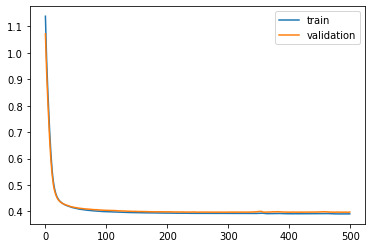

Time to train LSTM:  414.58443236351013
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 44s - loss: 1.1210 - val_loss: 1.0701

Epoch 00001: val_loss improved from inf to 1.07007, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0315 - val_loss: 0.9897

Epoch 00002: val_loss improved from 1.07007 to 0.98973, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9589 - val_loss: 0.9235

Epoch 00003: val_loss improved from 0.98973 to 0.92350, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.8978 - val_loss: 0.8665

Epoch 00004: val_loss improved from 0.92350 to 0.86647, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8428 - val_loss: 0.8137

Epoch 00005: val_loss improved from 0.86647 to 0.81368, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.7911 - val_loss: 0.7640

Epoch 00006: val_loss improved from 0.81368 to 0.76395, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7417 - val_loss: 0.7166

Epo


Epoch 00057: val_loss improved from 0.41595 to 0.41513, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4079 - val_loss: 0.4150

Epoch 00058: val_loss improved from 0.41513 to 0.41499, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4075 - val_loss: 0.4145

Epoch 00059: val_loss improved from 0.41499 to 0.41452, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4072 - val_loss: 0.4142

Epoch 00060: val_loss improved from 0.41452 to 0.41419, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4067 - val_loss: 0.4136

Epoch 00061: val_loss improved from 0.41419 to 0.41359, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4064 - val_loss: 0.4132

Epoch 00062: val_loss improved from 0.41359 to 0.41320, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4061 - val_loss: 0.4130

Epoch 00063: val_loss improved from 0.41320 to 0.41298, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4058 - val_loss:


Epoch 00116: val_loss improved from 0.40296 to 0.40273, saving model to val_weights1.hdf5
Epoch 117/500
 - 1s - loss: 0.3972 - val_loss: 0.4028

Epoch 00117: val_loss did not improve from 0.40273
Epoch 118/500
 - 1s - loss: 0.3971 - val_loss: 0.4025

Epoch 00118: val_loss improved from 0.40273 to 0.40253, saving model to val_weights1.hdf5
Epoch 119/500
 - 1s - loss: 0.3970 - val_loss: 0.4027

Epoch 00119: val_loss did not improve from 0.40253
Epoch 120/500
 - 1s - loss: 0.3970 - val_loss: 0.4025

Epoch 00120: val_loss improved from 0.40253 to 0.40250, saving model to val_weights1.hdf5
Epoch 121/500
 - 1s - loss: 0.3968 - val_loss: 0.4025

Epoch 00121: val_loss did not improve from 0.40250
Epoch 122/500
 - 1s - loss: 0.3967 - val_loss: 0.4022

Epoch 00122: val_loss improved from 0.40250 to 0.40220, saving model to val_weights1.hdf5
Epoch 123/500
 - 1s - loss: 0.3967 - val_loss: 0.4023

Epoch 00123: val_loss did not improve from 0.40220
Epoch 124/500
 - 1s - loss: 0.3966 - val_loss: 0.4


Epoch 00184: val_loss did not improve from 0.39940
Epoch 185/500
 - 1s - loss: 0.3935 - val_loss: 0.3993

Epoch 00185: val_loss improved from 0.39940 to 0.39925, saving model to val_weights1.hdf5
Epoch 186/500
 - 1s - loss: 0.3934 - val_loss: 0.3992

Epoch 00186: val_loss improved from 0.39925 to 0.39924, saving model to val_weights1.hdf5
Epoch 187/500
 - 1s - loss: 0.3934 - val_loss: 0.3995

Epoch 00187: val_loss did not improve from 0.39924
Epoch 188/500
 - 1s - loss: 0.3933 - val_loss: 0.3991

Epoch 00188: val_loss improved from 0.39924 to 0.39912, saving model to val_weights1.hdf5
Epoch 189/500
 - 1s - loss: 0.3933 - val_loss: 0.3993

Epoch 00189: val_loss did not improve from 0.39912
Epoch 190/500
 - 1s - loss: 0.3935 - val_loss: 0.3990

Epoch 00190: val_loss improved from 0.39912 to 0.39896, saving model to val_weights1.hdf5
Epoch 191/500
 - 1s - loss: 0.3935 - val_loss: 0.3995

Epoch 00191: val_loss did not improve from 0.39896
Epoch 192/500
 - 1s - loss: 0.3935 - val_loss: 0.3

 - 1s - loss: 0.3924 - val_loss: 0.3983

Epoch 00257: val_loss did not improve from 0.39790
Epoch 258/500
 - 1s - loss: 0.3923 - val_loss: 0.3983

Epoch 00258: val_loss did not improve from 0.39790
Epoch 259/500
 - 1s - loss: 0.3922 - val_loss: 0.3980

Epoch 00259: val_loss did not improve from 0.39790
Epoch 260/500
 - 1s - loss: 0.3922 - val_loss: 0.3982

Epoch 00260: val_loss did not improve from 0.39790
Epoch 261/500
 - 1s - loss: 0.3923 - val_loss: 0.3980

Epoch 00261: val_loss did not improve from 0.39790
Epoch 262/500
 - 1s - loss: 0.3923 - val_loss: 0.3983

Epoch 00262: val_loss did not improve from 0.39790
Epoch 263/500
 - 1s - loss: 0.3922 - val_loss: 0.3978

Epoch 00263: val_loss improved from 0.39790 to 0.39778, saving model to val_weights1.hdf5
Epoch 264/500
 - 1s - loss: 0.3924 - val_loss: 0.3981

Epoch 00264: val_loss did not improve from 0.39778
Epoch 265/500
 - 1s - loss: 0.3924 - val_loss: 0.3980

Epoch 00265: val_loss did not improve from 0.39778
Epoch 266/500
 - 1s -

 - 1s - loss: 0.3918 - val_loss: 0.3974

Epoch 00332: val_loss did not improve from 0.39689
Epoch 333/500
 - 1s - loss: 0.3917 - val_loss: 0.3974

Epoch 00333: val_loss did not improve from 0.39689
Epoch 334/500
 - 1s - loss: 0.3917 - val_loss: 0.3976

Epoch 00334: val_loss did not improve from 0.39689
Epoch 335/500
 - 1s - loss: 0.3919 - val_loss: 0.3978

Epoch 00335: val_loss did not improve from 0.39689
Epoch 336/500
 - 1s - loss: 0.3919 - val_loss: 0.3974

Epoch 00336: val_loss did not improve from 0.39689
Epoch 337/500
 - 1s - loss: 0.3918 - val_loss: 0.3978

Epoch 00337: val_loss did not improve from 0.39689
Epoch 338/500
 - 1s - loss: 0.3917 - val_loss: 0.3976

Epoch 00338: val_loss did not improve from 0.39689
Epoch 339/500
 - 1s - loss: 0.3917 - val_loss: 0.3980

Epoch 00339: val_loss did not improve from 0.39689
Epoch 340/500
 - 1s - loss: 0.3916 - val_loss: 0.3978

Epoch 00340: val_loss did not improve from 0.39689
Epoch 341/500
 - 1s - loss: 0.3916 - val_loss: 0.3976

Epoch


Epoch 00409: val_loss did not improve from 0.39689
Epoch 410/500
 - 1s - loss: 0.3908 - val_loss: 0.3976

Epoch 00410: val_loss did not improve from 0.39689
Epoch 411/500
 - 1s - loss: 0.3908 - val_loss: 0.3976

Epoch 00411: val_loss did not improve from 0.39689
Epoch 412/500
 - 1s - loss: 0.3909 - val_loss: 0.3974

Epoch 00412: val_loss did not improve from 0.39689
Epoch 413/500
 - 1s - loss: 0.3907 - val_loss: 0.3973

Epoch 00413: val_loss did not improve from 0.39689
Epoch 414/500
 - 1s - loss: 0.3907 - val_loss: 0.3971

Epoch 00414: val_loss did not improve from 0.39689
Epoch 415/500
 - 1s - loss: 0.3906 - val_loss: 0.3977

Epoch 00415: val_loss did not improve from 0.39689
Epoch 416/500
 - 1s - loss: 0.3907 - val_loss: 0.3975

Epoch 00416: val_loss did not improve from 0.39689
Epoch 417/500
 - 1s - loss: 0.3907 - val_loss: 0.3974

Epoch 00417: val_loss did not improve from 0.39689
Epoch 418/500
 - 1s - loss: 0.3907 - val_loss: 0.3979

Epoch 00418: val_loss did not improve from 0.

 - 1s - loss: 0.3899 - val_loss: 0.3973

Epoch 00486: val_loss did not improve from 0.39665
Epoch 487/500
 - 1s - loss: 0.3899 - val_loss: 0.3964

Epoch 00487: val_loss improved from 0.39665 to 0.39643, saving model to val_weights1.hdf5
Epoch 488/500
 - 1s - loss: 0.3898 - val_loss: 0.3969

Epoch 00488: val_loss did not improve from 0.39643
Epoch 489/500
 - 1s - loss: 0.3898 - val_loss: 0.3968

Epoch 00489: val_loss did not improve from 0.39643
Epoch 490/500
 - 1s - loss: 0.3897 - val_loss: 0.3968

Epoch 00490: val_loss did not improve from 0.39643
Epoch 491/500
 - 1s - loss: 0.3898 - val_loss: 0.3968

Epoch 00491: val_loss did not improve from 0.39643
Epoch 492/500
 - 1s - loss: 0.3899 - val_loss: 0.3968

Epoch 00492: val_loss did not improve from 0.39643
Epoch 493/500
 - 1s - loss: 0.3899 - val_loss: 0.3968

Epoch 00493: val_loss did not improve from 0.39643
Epoch 494/500
 - 1s - loss: 0.3899 - val_loss: 0.3969

Epoch 00494: val_loss did not improve from 0.39643
Epoch 495/500
 - 1s -

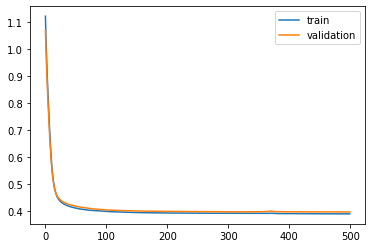

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 46s - loss: 1.1217 - val_loss: 1.0657

Epoch 00001: val_loss improved from inf to 1.06574, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0321 - val_loss: 0.9884

Epoch 00002: val_loss improved from 1.06574 to 0.98835, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9591 - val_loss: 0.9237

Epoch 00003: val_loss improved from 0.98835 to 0.92370, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.8977 - val_loss: 0.8666

Epoch 00004: val_loss improved from 0.92370 to 0.86657, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8425 - val_loss: 0.8131

Epoch 00005: val_loss improved from 0.86657 to 0.81309, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.7909 - val_loss: 0.7618

Epoch 00006: val_loss improved from 0.81309 to 0.76183, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7418 - val_loss: 0.7135

Epoch 00007: val_loss improved from 0.76183

 - 1s - loss: 0.4084 - val_loss: 0.4059

Epoch 00058: val_loss improved from 0.40652 to 0.40588, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4080 - val_loss: 0.4057

Epoch 00059: val_loss improved from 0.40588 to 0.40567, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4076 - val_loss: 0.4052

Epoch 00060: val_loss improved from 0.40567 to 0.40525, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4073 - val_loss: 0.4050

Epoch 00061: val_loss improved from 0.40525 to 0.40497, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4069 - val_loss: 0.4046

Epoch 00062: val_loss improved from 0.40497 to 0.40462, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4067 - val_loss: 0.4043

Epoch 00063: val_loss improved from 0.40462 to 0.40432, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4063 - val_loss: 0.4042

Epoch 00064: val_loss improved from 0.40432 to 0.40418, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3974 - val_loss: 0.3966

Epoch 00120: val_loss improved from 0.39668 to 0.39660, saving model to val_weights2.hdf5
Epoch 121/500
 - 1s - loss: 0.3972 - val_loss: 0.3968

Epoch 00121: val_loss did not improve from 0.39660
Epoch 122/500
 - 1s - loss: 0.3972 - val_loss: 0.3966

Epoch 00122: val_loss improved from 0.39660 to 0.39658, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3971 - val_loss: 0.3964

Epoch 00123: val_loss improved from 0.39658 to 0.39640, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3971 - val_loss: 0.3964

Epoch 00124: val_loss did not improve from 0.39640
Epoch 125/500
 - 1s - loss: 0.3970 - val_loss: 0.3967

Epoch 00125: val_loss did not improve from 0.39640
Epoch 126/500
 - 1s - loss: 0.3970 - val_loss: 0.3964

Epoch 00126: val_loss did not improve from 0.39640
Epoch 127/500
 - 1s - loss: 0.3968 - val_loss: 0.3963

Epoch 00127: val_loss improved from 0.39640 to 0.39631, saving model to val_weights2.hdf5
Epoch 128/


Epoch 00186: val_loss did not improve from 0.39329
Epoch 187/500
 - 1s - loss: 0.3941 - val_loss: 0.3933

Epoch 00187: val_loss did not improve from 0.39329
Epoch 188/500
 - 1s - loss: 0.3939 - val_loss: 0.3936

Epoch 00188: val_loss did not improve from 0.39329
Epoch 189/500
 - 1s - loss: 0.3939 - val_loss: 0.3933

Epoch 00189: val_loss did not improve from 0.39329
Epoch 190/500
 - 1s - loss: 0.3938 - val_loss: 0.3933

Epoch 00190: val_loss did not improve from 0.39329
Epoch 191/500
 - 1s - loss: 0.3940 - val_loss: 0.3933

Epoch 00191: val_loss did not improve from 0.39329
Epoch 192/500
 - 1s - loss: 0.3939 - val_loss: 0.3937

Epoch 00192: val_loss did not improve from 0.39329
Epoch 193/500
 - 1s - loss: 0.3939 - val_loss: 0.3935

Epoch 00193: val_loss did not improve from 0.39329
Epoch 194/500
 - 1s - loss: 0.3937 - val_loss: 0.3931

Epoch 00194: val_loss improved from 0.39329 to 0.39305, saving model to val_weights2.hdf5
Epoch 195/500
 - 1s - loss: 0.3938 - val_loss: 0.3935

Epoch 

 - 1s - loss: 0.3928 - val_loss: 0.3927

Epoch 00261: val_loss did not improve from 0.39248
Epoch 262/500
 - 1s - loss: 0.3928 - val_loss: 0.3929

Epoch 00262: val_loss did not improve from 0.39248
Epoch 263/500
 - 1s - loss: 0.3928 - val_loss: 0.3926

Epoch 00263: val_loss did not improve from 0.39248
Epoch 264/500
 - 1s - loss: 0.3927 - val_loss: 0.3927

Epoch 00264: val_loss did not improve from 0.39248
Epoch 265/500
 - 1s - loss: 0.3927 - val_loss: 0.3928

Epoch 00265: val_loss did not improve from 0.39248
Epoch 266/500
 - 1s - loss: 0.3925 - val_loss: 0.3926

Epoch 00266: val_loss did not improve from 0.39248
Epoch 267/500
 - 1s - loss: 0.3927 - val_loss: 0.3926

Epoch 00267: val_loss did not improve from 0.39248
Epoch 268/500
 - 1s - loss: 0.3926 - val_loss: 0.3928

Epoch 00268: val_loss did not improve from 0.39248
Epoch 269/500
 - 1s - loss: 0.3926 - val_loss: 0.3927

Epoch 00269: val_loss did not improve from 0.39248
Epoch 270/500
 - 1s - loss: 0.3927 - val_loss: 0.3929

Epoch

 - 1s - loss: 0.3918 - val_loss: 0.3928

Epoch 00337: val_loss did not improve from 0.39211
Epoch 338/500
 - 1s - loss: 0.3918 - val_loss: 0.3924

Epoch 00338: val_loss did not improve from 0.39211
Epoch 339/500
 - 1s - loss: 0.3917 - val_loss: 0.3924

Epoch 00339: val_loss did not improve from 0.39211
Epoch 340/500
 - 1s - loss: 0.3919 - val_loss: 0.3928

Epoch 00340: val_loss did not improve from 0.39211
Epoch 341/500
 - 1s - loss: 0.3919 - val_loss: 0.3923

Epoch 00341: val_loss did not improve from 0.39211
Epoch 342/500
 - 1s - loss: 0.3918 - val_loss: 0.3927

Epoch 00342: val_loss did not improve from 0.39211
Epoch 343/500
 - 1s - loss: 0.3918 - val_loss: 0.3924

Epoch 00343: val_loss did not improve from 0.39211
Epoch 344/500
 - 1s - loss: 0.3916 - val_loss: 0.3925

Epoch 00344: val_loss did not improve from 0.39211
Epoch 345/500
 - 1s - loss: 0.3916 - val_loss: 0.3922

Epoch 00345: val_loss did not improve from 0.39211
Epoch 346/500
 - 1s - loss: 0.3917 - val_loss: 0.3923

Epoch

 - 1s - loss: 0.3911 - val_loss: 0.3923

Epoch 00414: val_loss did not improve from 0.39204
Epoch 415/500
 - 1s - loss: 0.3911 - val_loss: 0.3921

Epoch 00415: val_loss did not improve from 0.39204
Epoch 416/500
 - 1s - loss: 0.3911 - val_loss: 0.3925

Epoch 00416: val_loss did not improve from 0.39204
Epoch 417/500
 - 1s - loss: 0.3910 - val_loss: 0.3920

Epoch 00417: val_loss improved from 0.39204 to 0.39200, saving model to val_weights2.hdf5
Epoch 418/500
 - 1s - loss: 0.3909 - val_loss: 0.3923

Epoch 00418: val_loss did not improve from 0.39200
Epoch 419/500
 - 1s - loss: 0.3909 - val_loss: 0.3921

Epoch 00419: val_loss did not improve from 0.39200
Epoch 420/500
 - 1s - loss: 0.3910 - val_loss: 0.3925

Epoch 00420: val_loss did not improve from 0.39200
Epoch 421/500
 - 1s - loss: 0.3911 - val_loss: 0.3922

Epoch 00421: val_loss did not improve from 0.39200
Epoch 422/500
 - 1s - loss: 0.3911 - val_loss: 0.3923

Epoch 00422: val_loss did not improve from 0.39200
Epoch 423/500
 - 1s -

 - 1s - loss: 0.3905 - val_loss: 0.3923

Epoch 00491: val_loss did not improve from 0.39192
Epoch 492/500
 - 1s - loss: 0.3905 - val_loss: 0.3922

Epoch 00492: val_loss did not improve from 0.39192
Epoch 493/500
 - 1s - loss: 0.3905 - val_loss: 0.3923

Epoch 00493: val_loss did not improve from 0.39192
Epoch 494/500
 - 1s - loss: 0.3906 - val_loss: 0.3922

Epoch 00494: val_loss did not improve from 0.39192
Epoch 495/500
 - 1s - loss: 0.3906 - val_loss: 0.3924

Epoch 00495: val_loss did not improve from 0.39192
Epoch 496/500
 - 1s - loss: 0.3907 - val_loss: 0.3924

Epoch 00496: val_loss did not improve from 0.39192
Epoch 497/500
 - 1s - loss: 0.3905 - val_loss: 0.3923

Epoch 00497: val_loss did not improve from 0.39192
Epoch 498/500
 - 1s - loss: 0.3905 - val_loss: 0.3921

Epoch 00498: val_loss did not improve from 0.39192
Epoch 499/500
 - 1s - loss: 0.3905 - val_loss: 0.3925

Epoch 00499: val_loss did not improve from 0.39192
Epoch 500/500
 - 1s - loss: 0.3906 - val_loss: 0.3920

Epoch

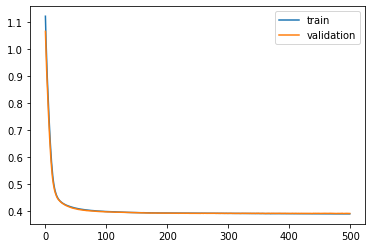

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 45s - loss: 1.1231 - val_loss: 1.0536

Epoch 00001: val_loss improved from inf to 1.05363, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0337 - val_loss: 0.9746

Epoch 00002: val_loss improved from 1.05363 to 0.97464, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9608 - val_loss: 0.9097

Epoch 00003: val_loss improved from 0.97464 to 0.90969, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.8994 - val_loss: 0.8536

Epoch 00004: val_loss improved from 0.90969 to 0.85356, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8441 - val_loss: 0.8018

Epoch 00005: val_loss improved from 0.85356 to 0.80180, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.7923 - val_loss: 0.7528

Epoch 00006: val_loss improved from 0.80180 to 0.75282, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7428 - val_loss: 0.7073

Epoch 00007: val_loss improved from 0.75282

 - 1s - loss: 0.4078 - val_loss: 0.4152

Epoch 00058: val_loss improved from 0.41573 to 0.41524, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4075 - val_loss: 0.4150

Epoch 00059: val_loss improved from 0.41524 to 0.41502, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4071 - val_loss: 0.4147

Epoch 00060: val_loss improved from 0.41502 to 0.41473, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4067 - val_loss: 0.4143

Epoch 00061: val_loss improved from 0.41473 to 0.41430, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4063 - val_loss: 0.4140

Epoch 00062: val_loss improved from 0.41430 to 0.41397, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4060 - val_loss: 0.4138

Epoch 00063: val_loss improved from 0.41397 to 0.41381, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4056 - val_loss: 0.4135

Epoch 00064: val_loss improved from 0.41381 to 0.41354, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.3964 - val_loss: 0.4063

Epoch 00121: val_loss did not improve from 0.40620
Epoch 122/500
 - 1s - loss: 0.3964 - val_loss: 0.4063

Epoch 00122: val_loss did not improve from 0.40620
Epoch 123/500
 - 1s - loss: 0.3963 - val_loss: 0.4061

Epoch 00123: val_loss improved from 0.40620 to 0.40614, saving model to val_weights3.hdf5
Epoch 124/500
 - 1s - loss: 0.3960 - val_loss: 0.4063

Epoch 00124: val_loss did not improve from 0.40614
Epoch 125/500
 - 1s - loss: 0.3960 - val_loss: 0.4062

Epoch 00125: val_loss did not improve from 0.40614
Epoch 126/500
 - 1s - loss: 0.3960 - val_loss: 0.4060

Epoch 00126: val_loss improved from 0.40614 to 0.40603, saving model to val_weights3.hdf5
Epoch 127/500
 - 1s - loss: 0.3958 - val_loss: 0.4057

Epoch 00127: val_loss improved from 0.40603 to 0.40574, saving model to val_weights3.hdf5
Epoch 128/500
 - 1s - loss: 0.3958 - val_loss: 0.4061

Epoch 00128: val_loss did not improve from 0.40574
Epoch 129/500
 - 1s - loss: 0.3958 - val_loss: 0.

 - 1s - loss: 0.3931 - val_loss: 0.4039

Epoch 00190: val_loss did not improve from 0.40311
Epoch 191/500
 - 1s - loss: 0.3930 - val_loss: 0.4032

Epoch 00191: val_loss did not improve from 0.40311
Epoch 192/500
 - 1s - loss: 0.3931 - val_loss: 0.4035

Epoch 00192: val_loss did not improve from 0.40311
Epoch 193/500
 - 1s - loss: 0.3930 - val_loss: 0.4035

Epoch 00193: val_loss did not improve from 0.40311
Epoch 194/500
 - 1s - loss: 0.3930 - val_loss: 0.4033

Epoch 00194: val_loss did not improve from 0.40311
Epoch 195/500
 - 1s - loss: 0.3928 - val_loss: 0.4034

Epoch 00195: val_loss did not improve from 0.40311
Epoch 196/500
 - 1s - loss: 0.3929 - val_loss: 0.4034

Epoch 00196: val_loss did not improve from 0.40311
Epoch 197/500
 - 1s - loss: 0.3928 - val_loss: 0.4033

Epoch 00197: val_loss did not improve from 0.40311
Epoch 198/500
 - 1s - loss: 0.3928 - val_loss: 0.4032

Epoch 00198: val_loss did not improve from 0.40311
Epoch 199/500
 - 1s - loss: 0.3928 - val_loss: 0.4033

Epoch


Epoch 00265: val_loss did not improve from 0.40235
Epoch 266/500
 - 1s - loss: 0.3919 - val_loss: 0.4026

Epoch 00266: val_loss did not improve from 0.40235
Epoch 267/500
 - 1s - loss: 0.3919 - val_loss: 0.4023

Epoch 00267: val_loss improved from 0.40235 to 0.40231, saving model to val_weights3.hdf5
Epoch 268/500
 - 1s - loss: 0.3918 - val_loss: 0.4028

Epoch 00268: val_loss did not improve from 0.40231
Epoch 269/500
 - 1s - loss: 0.3919 - val_loss: 0.4023

Epoch 00269: val_loss did not improve from 0.40231
Epoch 270/500
 - 1s - loss: 0.3919 - val_loss: 0.4022

Epoch 00270: val_loss improved from 0.40231 to 0.40221, saving model to val_weights3.hdf5
Epoch 271/500
 - 1s - loss: 0.3918 - val_loss: 0.4023

Epoch 00271: val_loss did not improve from 0.40221
Epoch 272/500
 - 1s - loss: 0.3918 - val_loss: 0.4025

Epoch 00272: val_loss did not improve from 0.40221
Epoch 273/500
 - 1s - loss: 0.3917 - val_loss: 0.4023

Epoch 00273: val_loss did not improve from 0.40221
Epoch 274/500
 - 1s - 

 - 1s - loss: 0.3911 - val_loss: 0.4016

Epoch 00338: val_loss did not improve from 0.40126
Epoch 339/500
 - 1s - loss: 0.3909 - val_loss: 0.4014

Epoch 00339: val_loss did not improve from 0.40126
Epoch 340/500
 - 1s - loss: 0.3909 - val_loss: 0.4016

Epoch 00340: val_loss did not improve from 0.40126
Epoch 341/500
 - 1s - loss: 0.3909 - val_loss: 0.4013

Epoch 00341: val_loss did not improve from 0.40126
Epoch 342/500
 - 1s - loss: 0.3909 - val_loss: 0.4014

Epoch 00342: val_loss did not improve from 0.40126
Epoch 343/500
 - 1s - loss: 0.3909 - val_loss: 0.4015

Epoch 00343: val_loss did not improve from 0.40126
Epoch 344/500
 - 1s - loss: 0.3910 - val_loss: 0.4016

Epoch 00344: val_loss did not improve from 0.40126
Epoch 345/500
 - 1s - loss: 0.3911 - val_loss: 0.4013

Epoch 00345: val_loss did not improve from 0.40126
Epoch 346/500
 - 1s - loss: 0.3911 - val_loss: 0.4018

Epoch 00346: val_loss did not improve from 0.40126
Epoch 347/500
 - 1s - loss: 0.3910 - val_loss: 0.4016

Epoch

 - 1s - loss: 0.3903 - val_loss: 0.4013

Epoch 00414: val_loss did not improve from 0.40095
Epoch 415/500
 - 1s - loss: 0.3903 - val_loss: 0.4011

Epoch 00415: val_loss did not improve from 0.40095
Epoch 416/500
 - 1s - loss: 0.3903 - val_loss: 0.4011

Epoch 00416: val_loss did not improve from 0.40095
Epoch 417/500
 - 1s - loss: 0.3902 - val_loss: 0.4008

Epoch 00417: val_loss improved from 0.40095 to 0.40083, saving model to val_weights3.hdf5
Epoch 418/500
 - 1s - loss: 0.3903 - val_loss: 0.4012

Epoch 00418: val_loss did not improve from 0.40083
Epoch 419/500
 - 1s - loss: 0.3903 - val_loss: 0.4014

Epoch 00419: val_loss did not improve from 0.40083
Epoch 420/500
 - 1s - loss: 0.3904 - val_loss: 0.4012

Epoch 00420: val_loss did not improve from 0.40083
Epoch 421/500
 - 1s - loss: 0.3904 - val_loss: 0.4014

Epoch 00421: val_loss did not improve from 0.40083
Epoch 422/500
 - 1s - loss: 0.3903 - val_loss: 0.4010

Epoch 00422: val_loss did not improve from 0.40083
Epoch 423/500
 - 1s -

 - 1s - loss: 0.3896 - val_loss: 0.4007

Epoch 00490: val_loss improved from 0.40067 to 0.40065, saving model to val_weights3.hdf5
Epoch 491/500
 - 1s - loss: 0.3896 - val_loss: 0.4010

Epoch 00491: val_loss did not improve from 0.40065
Epoch 492/500
 - 1s - loss: 0.3896 - val_loss: 0.4005

Epoch 00492: val_loss improved from 0.40065 to 0.40048, saving model to val_weights3.hdf5
Epoch 493/500
 - 1s - loss: 0.3896 - val_loss: 0.4011

Epoch 00493: val_loss did not improve from 0.40048
Epoch 494/500
 - 1s - loss: 0.3895 - val_loss: 0.4009

Epoch 00494: val_loss did not improve from 0.40048
Epoch 495/500
 - 1s - loss: 0.3896 - val_loss: 0.4009

Epoch 00495: val_loss did not improve from 0.40048
Epoch 496/500
 - 1s - loss: 0.3897 - val_loss: 0.4012

Epoch 00496: val_loss did not improve from 0.40048
Epoch 497/500
 - 1s - loss: 0.3896 - val_loss: 0.4010

Epoch 00497: val_loss did not improve from 0.40048
Epoch 498/500
 - 1s - loss: 0.3895 - val_loss: 0.4010

Epoch 00498: val_loss did not imp

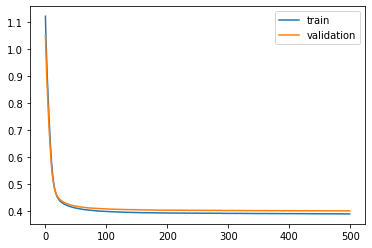

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7fa24381a828>>
Traceback (most recent call last):
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/home/whsu014/.conda/envs/whsuphd/lib/python3.6/site-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.CancelledError: Session has been closed.


Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 45s - loss: 1.1223 - val_loss: 1.0593

Epoch 00001: val_loss improved from inf to 1.05930, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0330 - val_loss: 0.9798

Epoch 00002: val_loss improved from 1.05930 to 0.97983, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9603 - val_loss: 0.9147

Epoch 00003: val_loss improved from 0.97983 to 0.91472, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.8989 - val_loss: 0.8577

Epoch 00004: val_loss improved from 0.91472 to 0.85770, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8437 - val_loss: 0.8044

Epoch 00005: val_loss improved from 0.85770 to 0.80445, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.7920 - val_loss: 0.7539

Epoch 00006: val_loss improved from 0.80445 to 0.75388, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7429 - val_loss: 0.7061

Epoch 00007: val_loss improved from 0.75388

 - 1s - loss: 0.4086 - val_loss: 0.4081

Epoch 00058: val_loss improved from 0.40821 to 0.40805, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4081 - val_loss: 0.4075

Epoch 00059: val_loss improved from 0.40805 to 0.40747, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4079 - val_loss: 0.4073

Epoch 00060: val_loss improved from 0.40747 to 0.40731, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4075 - val_loss: 0.4069

Epoch 00061: val_loss improved from 0.40731 to 0.40686, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4072 - val_loss: 0.4064

Epoch 00062: val_loss improved from 0.40686 to 0.40636, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4069 - val_loss: 0.4059

Epoch 00063: val_loss improved from 0.40636 to 0.40589, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4065 - val_loss: 0.4060

Epoch 00064: val_loss did not improve from 0.40589
Epoch 65/500
 - 1s - loss: 0.4063 - val_loss

 - 1s - loss: 0.3973 - val_loss: 0.3965

Epoch 00119: val_loss improved from 0.39668 to 0.39648, saving model to val_weights4.hdf5
Epoch 120/500
 - 1s - loss: 0.3974 - val_loss: 0.3964

Epoch 00120: val_loss improved from 0.39648 to 0.39644, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.3972 - val_loss: 0.3964

Epoch 00121: val_loss did not improve from 0.39644
Epoch 122/500
 - 1s - loss: 0.3972 - val_loss: 0.3968

Epoch 00122: val_loss did not improve from 0.39644
Epoch 123/500
 - 1s - loss: 0.3971 - val_loss: 0.3963

Epoch 00123: val_loss improved from 0.39644 to 0.39630, saving model to val_weights4.hdf5
Epoch 124/500
 - 1s - loss: 0.3970 - val_loss: 0.3967

Epoch 00124: val_loss did not improve from 0.39630
Epoch 125/500
 - 1s - loss: 0.3969 - val_loss: 0.3964

Epoch 00125: val_loss did not improve from 0.39630
Epoch 126/500
 - 1s - loss: 0.3969 - val_loss: 0.3964

Epoch 00126: val_loss did not improve from 0.39630
Epoch 127/500
 - 1s - loss: 0.3967 - val_loss: 0.


Epoch 00189: val_loss improved from 0.39473 to 0.39451, saving model to val_weights4.hdf5
Epoch 190/500
 - 1s - loss: 0.3946 - val_loss: 0.3948

Epoch 00190: val_loss did not improve from 0.39451
Epoch 191/500
 - 1s - loss: 0.3945 - val_loss: 0.3945

Epoch 00191: val_loss improved from 0.39451 to 0.39445, saving model to val_weights4.hdf5
Epoch 192/500
 - 1s - loss: 0.3946 - val_loss: 0.3944

Epoch 00192: val_loss improved from 0.39445 to 0.39439, saving model to val_weights4.hdf5
Epoch 193/500
 - 1s - loss: 0.3942 - val_loss: 0.3942

Epoch 00193: val_loss improved from 0.39439 to 0.39421, saving model to val_weights4.hdf5
Epoch 194/500
 - 1s - loss: 0.3942 - val_loss: 0.3941

Epoch 00194: val_loss improved from 0.39421 to 0.39408, saving model to val_weights4.hdf5
Epoch 195/500
 - 1s - loss: 0.3940 - val_loss: 0.3940

Epoch 00195: val_loss improved from 0.39408 to 0.39401, saving model to val_weights4.hdf5
Epoch 196/500
 - 1s - loss: 0.3940 - val_loss: 0.3943

Epoch 00196: val_loss d


Epoch 00261: val_loss did not improve from 0.39342
Epoch 262/500
 - 1s - loss: 0.3929 - val_loss: 0.3936

Epoch 00262: val_loss did not improve from 0.39342
Epoch 263/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00263: val_loss did not improve from 0.39342
Epoch 264/500
 - 1s - loss: 0.3930 - val_loss: 0.3935

Epoch 00264: val_loss did not improve from 0.39342
Epoch 265/500
 - 1s - loss: 0.3928 - val_loss: 0.3936

Epoch 00265: val_loss did not improve from 0.39342
Epoch 266/500
 - 1s - loss: 0.3927 - val_loss: 0.3938

Epoch 00266: val_loss did not improve from 0.39342
Epoch 267/500
 - 1s - loss: 0.3928 - val_loss: 0.3933

Epoch 00267: val_loss improved from 0.39342 to 0.39335, saving model to val_weights4.hdf5
Epoch 268/500
 - 1s - loss: 0.3927 - val_loss: 0.3939

Epoch 00268: val_loss did not improve from 0.39335
Epoch 269/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00269: val_loss did not improve from 0.39335
Epoch 270/500
 - 1s - loss: 0.3929 - val_loss: 0.3936

Epoch 

 - 1s - loss: 0.3922 - val_loss: 0.3934

Epoch 00336: val_loss did not improve from 0.39260
Epoch 337/500
 - 1s - loss: 0.3923 - val_loss: 0.3930

Epoch 00337: val_loss did not improve from 0.39260
Epoch 338/500
 - 1s - loss: 0.3921 - val_loss: 0.3931

Epoch 00338: val_loss did not improve from 0.39260
Epoch 339/500
 - 1s - loss: 0.3922 - val_loss: 0.3929

Epoch 00339: val_loss did not improve from 0.39260
Epoch 340/500
 - 1s - loss: 0.3921 - val_loss: 0.3934

Epoch 00340: val_loss did not improve from 0.39260
Epoch 341/500
 - 1s - loss: 0.3922 - val_loss: 0.3926

Epoch 00341: val_loss did not improve from 0.39260
Epoch 342/500
 - 1s - loss: 0.3922 - val_loss: 0.3930

Epoch 00342: val_loss did not improve from 0.39260
Epoch 343/500
 - 1s - loss: 0.3923 - val_loss: 0.3930

Epoch 00343: val_loss did not improve from 0.39260
Epoch 344/500
 - 1s - loss: 0.3921 - val_loss: 0.3932

Epoch 00344: val_loss did not improve from 0.39260
Epoch 345/500
 - 1s - loss: 0.3921 - val_loss: 0.3929

Epoch


Epoch 00411: val_loss did not improve from 0.39219
Epoch 412/500
 - 1s - loss: 0.3920 - val_loss: 0.3925

Epoch 00412: val_loss did not improve from 0.39219
Epoch 413/500
 - 1s - loss: 0.3919 - val_loss: 0.3924

Epoch 00413: val_loss did not improve from 0.39219
Epoch 414/500
 - 1s - loss: 0.3918 - val_loss: 0.3924

Epoch 00414: val_loss did not improve from 0.39219
Epoch 415/500
 - 1s - loss: 0.3919 - val_loss: 0.3926

Epoch 00415: val_loss did not improve from 0.39219
Epoch 416/500
 - 1s - loss: 0.3917 - val_loss: 0.3921

Epoch 00416: val_loss improved from 0.39219 to 0.39207, saving model to val_weights4.hdf5
Epoch 417/500
 - 1s - loss: 0.3916 - val_loss: 0.3924

Epoch 00417: val_loss did not improve from 0.39207
Epoch 418/500
 - 1s - loss: 0.3916 - val_loss: 0.3920

Epoch 00418: val_loss improved from 0.39207 to 0.39204, saving model to val_weights4.hdf5
Epoch 419/500
 - 1s - loss: 0.3915 - val_loss: 0.3921

Epoch 00419: val_loss did not improve from 0.39204
Epoch 420/500
 - 1s - 


Epoch 00487: val_loss did not improve from 0.39194
Epoch 488/500
 - 1s - loss: 0.3911 - val_loss: 0.3924

Epoch 00488: val_loss did not improve from 0.39194
Epoch 489/500
 - 1s - loss: 0.3911 - val_loss: 0.3922

Epoch 00489: val_loss did not improve from 0.39194
Epoch 490/500
 - 1s - loss: 0.3910 - val_loss: 0.3927

Epoch 00490: val_loss did not improve from 0.39194
Epoch 491/500
 - 1s - loss: 0.3912 - val_loss: 0.3921

Epoch 00491: val_loss did not improve from 0.39194
Epoch 492/500
 - 1s - loss: 0.3910 - val_loss: 0.3926

Epoch 00492: val_loss did not improve from 0.39194
Epoch 493/500
 - 1s - loss: 0.3909 - val_loss: 0.3920

Epoch 00493: val_loss did not improve from 0.39194
Epoch 494/500
 - 1s - loss: 0.3910 - val_loss: 0.3926

Epoch 00494: val_loss did not improve from 0.39194
Epoch 495/500
 - 1s - loss: 0.3910 - val_loss: 0.3921

Epoch 00495: val_loss did not improve from 0.39194
Epoch 496/500
 - 1s - loss: 0.3909 - val_loss: 0.3927

Epoch 00496: val_loss did not improve from 0.

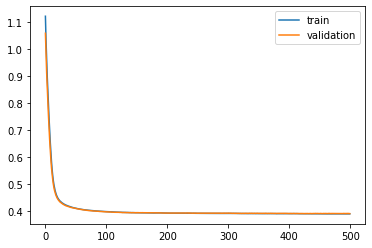

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 45s - loss: 1.1227 - val_loss: 1.0573

Epoch 00001: val_loss improved from inf to 1.05734, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0333 - val_loss: 0.9794

Epoch 00002: val_loss improved from 1.05734 to 0.97938, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9605 - val_loss: 0.9152

Epoch 00003: val_loss improved from 0.97938 to 0.91522, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.8990 - val_loss: 0.8588

Epoch 00004: val_loss improved from 0.91522 to 0.85877, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8438 - val_loss: 0.8070

Epoch 00005: val_loss improved from 0.85877 to 0.80703, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.7919 - val_loss: 0.7577

Epoch 00006: val_loss improved from 0.80703 to 0.75765, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7427 - val_loss: 0.7104

Epoch 00007: val_loss improved from 0.75765

 - 1s - loss: 0.4080 - val_loss: 0.4118

Epoch 00058: val_loss improved from 0.41227 to 0.41178, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4078 - val_loss: 0.4117

Epoch 00059: val_loss improved from 0.41178 to 0.41169, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4074 - val_loss: 0.4113

Epoch 00060: val_loss improved from 0.41169 to 0.41130, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4070 - val_loss: 0.4112

Epoch 00061: val_loss improved from 0.41130 to 0.41123, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4066 - val_loss: 0.4108

Epoch 00062: val_loss improved from 0.41123 to 0.41080, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4062 - val_loss: 0.4104

Epoch 00063: val_loss improved from 0.41080 to 0.41044, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4059 - val_loss: 0.4101

Epoch 00064: val_loss improved from 0.41044 to 0.41010, saving model to val_weights5.hdf5
Epoch

 - 1s - loss: 0.3971 - val_loss: 0.4022

Epoch 00121: val_loss improved from 0.40223 to 0.40223, saving model to val_weights5.hdf5
Epoch 122/500
 - 1s - loss: 0.3970 - val_loss: 0.4023

Epoch 00122: val_loss did not improve from 0.40223
Epoch 123/500
 - 1s - loss: 0.3969 - val_loss: 0.4022

Epoch 00123: val_loss did not improve from 0.40223
Epoch 124/500
 - 1s - loss: 0.3968 - val_loss: 0.4016

Epoch 00124: val_loss improved from 0.40223 to 0.40164, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3967 - val_loss: 0.4017

Epoch 00125: val_loss did not improve from 0.40164
Epoch 126/500
 - 1s - loss: 0.3966 - val_loss: 0.4016

Epoch 00126: val_loss improved from 0.40164 to 0.40156, saving model to val_weights5.hdf5
Epoch 127/500
 - 1s - loss: 0.3966 - val_loss: 0.4016

Epoch 00127: val_loss did not improve from 0.40156
Epoch 128/500
 - 1s - loss: 0.3966 - val_loss: 0.4016

Epoch 00128: val_loss did not improve from 0.40156
Epoch 129/500
 - 1s - loss: 0.3965 - val_loss: 0.

 - 1s - loss: 0.3938 - val_loss: 0.3982

Epoch 00188: val_loss did not improve from 0.39809
Epoch 189/500
 - 1s - loss: 0.3938 - val_loss: 0.3982

Epoch 00189: val_loss did not improve from 0.39809
Epoch 190/500
 - 1s - loss: 0.3938 - val_loss: 0.3981

Epoch 00190: val_loss did not improve from 0.39809
Epoch 191/500
 - 1s - loss: 0.3938 - val_loss: 0.3984

Epoch 00191: val_loss did not improve from 0.39809
Epoch 192/500
 - 1s - loss: 0.3939 - val_loss: 0.3985

Epoch 00192: val_loss did not improve from 0.39809
Epoch 193/500
 - 1s - loss: 0.3939 - val_loss: 0.3980

Epoch 00193: val_loss improved from 0.39809 to 0.39796, saving model to val_weights5.hdf5
Epoch 194/500
 - 1s - loss: 0.3937 - val_loss: 0.3981

Epoch 00194: val_loss did not improve from 0.39796
Epoch 195/500
 - 1s - loss: 0.3938 - val_loss: 0.3984

Epoch 00195: val_loss did not improve from 0.39796
Epoch 196/500
 - 1s - loss: 0.3938 - val_loss: 0.3979

Epoch 00196: val_loss improved from 0.39796 to 0.39795, saving model to 


Epoch 00263: val_loss did not improve from 0.39755
Epoch 264/500
 - 1s - loss: 0.3928 - val_loss: 0.3986

Epoch 00264: val_loss did not improve from 0.39755
Epoch 265/500
 - 1s - loss: 0.3930 - val_loss: 0.3983

Epoch 00265: val_loss did not improve from 0.39755
Epoch 266/500
 - 1s - loss: 0.3931 - val_loss: 0.3980

Epoch 00266: val_loss did not improve from 0.39755
Epoch 267/500
 - 1s - loss: 0.3930 - val_loss: 0.3985

Epoch 00267: val_loss did not improve from 0.39755
Epoch 268/500
 - 1s - loss: 0.3932 - val_loss: 0.3989

Epoch 00268: val_loss did not improve from 0.39755
Epoch 269/500
 - 1s - loss: 0.3932 - val_loss: 0.3993

Epoch 00269: val_loss did not improve from 0.39755
Epoch 270/500
 - 1s - loss: 0.3933 - val_loss: 0.3998

Epoch 00270: val_loss did not improve from 0.39755
Epoch 271/500
 - 1s - loss: 0.3933 - val_loss: 0.3997

Epoch 00271: val_loss did not improve from 0.39755
Epoch 272/500
 - 1s - loss: 0.3935 - val_loss: 0.3997

Epoch 00272: val_loss did not improve from 0.

 - 1s - loss: 0.3916 - val_loss: 0.3973

Epoch 00338: val_loss did not improve from 0.39677
Epoch 339/500
 - 1s - loss: 0.3918 - val_loss: 0.3971

Epoch 00339: val_loss did not improve from 0.39677
Epoch 340/500
 - 1s - loss: 0.3916 - val_loss: 0.3967

Epoch 00340: val_loss improved from 0.39677 to 0.39665, saving model to val_weights5.hdf5
Epoch 341/500
 - 1s - loss: 0.3916 - val_loss: 0.3969

Epoch 00341: val_loss did not improve from 0.39665
Epoch 342/500
 - 1s - loss: 0.3917 - val_loss: 0.3970

Epoch 00342: val_loss did not improve from 0.39665
Epoch 343/500
 - 1s - loss: 0.3917 - val_loss: 0.3969

Epoch 00343: val_loss did not improve from 0.39665
Epoch 344/500
 - 1s - loss: 0.3918 - val_loss: 0.3973

Epoch 00344: val_loss did not improve from 0.39665
Epoch 345/500
 - 1s - loss: 0.3918 - val_loss: 0.3967

Epoch 00345: val_loss did not improve from 0.39665
Epoch 346/500
 - 1s - loss: 0.3917 - val_loss: 0.3973

Epoch 00346: val_loss did not improve from 0.39665
Epoch 347/500
 - 1s -

 - 1s - loss: 0.3910 - val_loss: 0.3970

Epoch 00415: val_loss did not improve from 0.39665
Epoch 416/500
 - 1s - loss: 0.3912 - val_loss: 0.3971

Epoch 00416: val_loss did not improve from 0.39665
Epoch 417/500
 - 1s - loss: 0.3911 - val_loss: 0.3969

Epoch 00417: val_loss did not improve from 0.39665
Epoch 418/500
 - 1s - loss: 0.3910 - val_loss: 0.3975

Epoch 00418: val_loss did not improve from 0.39665
Epoch 419/500
 - 1s - loss: 0.3910 - val_loss: 0.3973

Epoch 00419: val_loss did not improve from 0.39665
Epoch 420/500
 - 1s - loss: 0.3910 - val_loss: 0.3965

Epoch 00420: val_loss improved from 0.39665 to 0.39649, saving model to val_weights5.hdf5
Epoch 421/500
 - 1s - loss: 0.3910 - val_loss: 0.3967

Epoch 00421: val_loss did not improve from 0.39649
Epoch 422/500
 - 1s - loss: 0.3910 - val_loss: 0.3971

Epoch 00422: val_loss did not improve from 0.39649
Epoch 423/500
 - 1s - loss: 0.3909 - val_loss: 0.3972

Epoch 00423: val_loss did not improve from 0.39649
Epoch 424/500
 - 1s -

 - 1s - loss: 0.3911 - val_loss: 0.3985

Epoch 00492: val_loss did not improve from 0.39649
Epoch 493/500
 - 1s - loss: 0.3910 - val_loss: 0.3986

Epoch 00493: val_loss did not improve from 0.39649
Epoch 494/500
 - 1s - loss: 0.3911 - val_loss: 0.3990

Epoch 00494: val_loss did not improve from 0.39649
Epoch 495/500
 - 1s - loss: 0.3910 - val_loss: 0.3987

Epoch 00495: val_loss did not improve from 0.39649
Epoch 496/500
 - 1s - loss: 0.3912 - val_loss: 0.3989

Epoch 00496: val_loss did not improve from 0.39649
Epoch 497/500
 - 1s - loss: 0.3912 - val_loss: 0.3983

Epoch 00497: val_loss did not improve from 0.39649
Epoch 498/500
 - 1s - loss: 0.3911 - val_loss: 0.3986

Epoch 00498: val_loss did not improve from 0.39649
Epoch 499/500
 - 1s - loss: 0.3912 - val_loss: 0.3983

Epoch 00499: val_loss did not improve from 0.39649
Epoch 500/500
 - 1s - loss: 0.3913 - val_loss: 0.3980

Epoch 00500: val_loss did not improve from 0.39649
#################################
Number of units: 4
Batch s

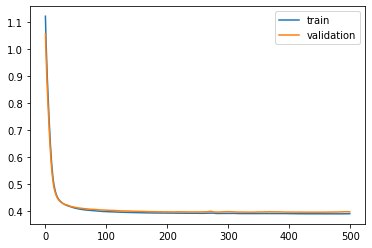

Time to train LSTM:  432.6699306964874
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 47s - loss: 1.1903 - val_loss: 1.1342

Epoch 00001: val_loss improved from inf to 1.13422, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0915 - val_loss: 1.0447

Epoch 00002: val_loss improved from 1.13422 to 1.04469, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 1.0099 - val_loss: 0.9700

Epoch 00003: val_loss improved from 1.04469 to 0.96998, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.9405 - val_loss: 0.9052

Epoch 00004: val_loss improved from 0.96998 to 0.90518, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8783 - val_loss: 0.8456

Epoch 00005: val_loss improved from 0.90518 to 0.84560, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.8202 - val_loss: 0.7900

Epoch 00006: val_loss improved from 0.84560 to 0.78996, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7651 - val_loss: 0.7372

Epoc


Epoch 00057: val_loss improved from 0.41594 to 0.41538, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4084 - val_loss: 0.4150

Epoch 00058: val_loss improved from 0.41538 to 0.41503, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4080 - val_loss: 0.4146

Epoch 00059: val_loss improved from 0.41503 to 0.41465, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4078 - val_loss: 0.4140

Epoch 00060: val_loss improved from 0.41465 to 0.41399, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4074 - val_loss: 0.4138

Epoch 00061: val_loss improved from 0.41399 to 0.41381, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4072 - val_loss: 0.4136

Epoch 00062: val_loss improved from 0.41381 to 0.41359, saving model to val_weights1.hdf5
Epoch 63/500
 - 1s - loss: 0.4067 - val_loss: 0.4132

Epoch 00063: val_loss improved from 0.41359 to 0.41316, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4065 - val_loss:


Epoch 00118: val_loss did not improve from 0.40270
Epoch 119/500
 - 1s - loss: 0.3976 - val_loss: 0.4026

Epoch 00119: val_loss improved from 0.40270 to 0.40257, saving model to val_weights1.hdf5
Epoch 120/500
 - 1s - loss: 0.3975 - val_loss: 0.4028

Epoch 00120: val_loss did not improve from 0.40257
Epoch 121/500
 - 1s - loss: 0.3975 - val_loss: 0.4026

Epoch 00121: val_loss improved from 0.40257 to 0.40256, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3973 - val_loss: 0.4028

Epoch 00122: val_loss did not improve from 0.40256
Epoch 123/500
 - 1s - loss: 0.3973 - val_loss: 0.4024

Epoch 00123: val_loss improved from 0.40256 to 0.40241, saving model to val_weights1.hdf5
Epoch 124/500
 - 1s - loss: 0.3974 - val_loss: 0.4029

Epoch 00124: val_loss did not improve from 0.40241
Epoch 125/500
 - 1s - loss: 0.3971 - val_loss: 0.4023

Epoch 00125: val_loss improved from 0.40241 to 0.40227, saving model to val_weights1.hdf5
Epoch 126/500
 - 1s - loss: 0.3971 - val_loss: 0.4

 - 1s - loss: 0.3944 - val_loss: 0.3996

Epoch 00186: val_loss did not improve from 0.39939
Epoch 187/500
 - 1s - loss: 0.3945 - val_loss: 0.3995

Epoch 00187: val_loss did not improve from 0.39939
Epoch 188/500
 - 1s - loss: 0.3942 - val_loss: 0.3997

Epoch 00188: val_loss did not improve from 0.39939
Epoch 189/500
 - 1s - loss: 0.3941 - val_loss: 0.3995

Epoch 00189: val_loss did not improve from 0.39939
Epoch 190/500
 - 1s - loss: 0.3942 - val_loss: 0.3997

Epoch 00190: val_loss did not improve from 0.39939
Epoch 191/500
 - 1s - loss: 0.3942 - val_loss: 0.3994

Epoch 00191: val_loss improved from 0.39939 to 0.39938, saving model to val_weights1.hdf5
Epoch 192/500
 - 1s - loss: 0.3941 - val_loss: 0.3995

Epoch 00192: val_loss did not improve from 0.39938
Epoch 193/500
 - 1s - loss: 0.3941 - val_loss: 0.3994

Epoch 00193: val_loss improved from 0.39938 to 0.39936, saving model to val_weights1.hdf5
Epoch 194/500
 - 1s - loss: 0.3942 - val_loss: 0.3995

Epoch 00194: val_loss did not imp

 - 1s - loss: 0.3932 - val_loss: 0.3982

Epoch 00259: val_loss improved from 0.39822 to 0.39821, saving model to val_weights1.hdf5
Epoch 260/500
 - 1s - loss: 0.3931 - val_loss: 0.3984

Epoch 00260: val_loss did not improve from 0.39821
Epoch 261/500
 - 1s - loss: 0.3930 - val_loss: 0.3982

Epoch 00261: val_loss improved from 0.39821 to 0.39815, saving model to val_weights1.hdf5
Epoch 262/500
 - 1s - loss: 0.3931 - val_loss: 0.3982

Epoch 00262: val_loss did not improve from 0.39815
Epoch 263/500
 - 1s - loss: 0.3930 - val_loss: 0.3984

Epoch 00263: val_loss did not improve from 0.39815
Epoch 264/500
 - 1s - loss: 0.3930 - val_loss: 0.3986

Epoch 00264: val_loss did not improve from 0.39815
Epoch 265/500
 - 1s - loss: 0.3930 - val_loss: 0.3979

Epoch 00265: val_loss improved from 0.39815 to 0.39789, saving model to val_weights1.hdf5
Epoch 266/500
 - 1s - loss: 0.3930 - val_loss: 0.3982

Epoch 00266: val_loss did not improve from 0.39789
Epoch 267/500
 - 1s - loss: 0.3929 - val_loss: 0.

 - 1s - loss: 0.3924 - val_loss: 0.3974

Epoch 00333: val_loss improved from 0.39742 to 0.39736, saving model to val_weights1.hdf5
Epoch 334/500
 - 1s - loss: 0.3924 - val_loss: 0.3981

Epoch 00334: val_loss did not improve from 0.39736
Epoch 335/500
 - 1s - loss: 0.3925 - val_loss: 0.3977

Epoch 00335: val_loss did not improve from 0.39736
Epoch 336/500
 - 1s - loss: 0.3924 - val_loss: 0.3979

Epoch 00336: val_loss did not improve from 0.39736
Epoch 337/500
 - 1s - loss: 0.3924 - val_loss: 0.3974

Epoch 00337: val_loss did not improve from 0.39736
Epoch 338/500
 - 1s - loss: 0.3924 - val_loss: 0.3978

Epoch 00338: val_loss did not improve from 0.39736
Epoch 339/500
 - 1s - loss: 0.3924 - val_loss: 0.3977

Epoch 00339: val_loss did not improve from 0.39736
Epoch 340/500
 - 1s - loss: 0.3923 - val_loss: 0.3978

Epoch 00340: val_loss did not improve from 0.39736
Epoch 341/500
 - 1s - loss: 0.3923 - val_loss: 0.3978

Epoch 00341: val_loss did not improve from 0.39736
Epoch 342/500
 - 1s -


Epoch 00408: val_loss did not improve from 0.39705
Epoch 409/500
 - 1s - loss: 0.3915 - val_loss: 0.3973

Epoch 00409: val_loss did not improve from 0.39705
Epoch 410/500
 - 1s - loss: 0.3916 - val_loss: 0.3974

Epoch 00410: val_loss did not improve from 0.39705
Epoch 411/500
 - 1s - loss: 0.3915 - val_loss: 0.3975

Epoch 00411: val_loss did not improve from 0.39705
Epoch 412/500
 - 1s - loss: 0.3916 - val_loss: 0.3974

Epoch 00412: val_loss did not improve from 0.39705
Epoch 413/500
 - 1s - loss: 0.3916 - val_loss: 0.3975

Epoch 00413: val_loss did not improve from 0.39705
Epoch 414/500
 - 1s - loss: 0.3915 - val_loss: 0.3975

Epoch 00414: val_loss did not improve from 0.39705
Epoch 415/500
 - 1s - loss: 0.3916 - val_loss: 0.3974

Epoch 00415: val_loss did not improve from 0.39705
Epoch 416/500
 - 1s - loss: 0.3916 - val_loss: 0.3970

Epoch 00416: val_loss improved from 0.39705 to 0.39704, saving model to val_weights1.hdf5
Epoch 417/500
 - 1s - loss: 0.3915 - val_loss: 0.3973

Epoch 

 - 1s - loss: 0.3908 - val_loss: 0.3970

Epoch 00484: val_loss did not improve from 0.39682
Epoch 485/500
 - 1s - loss: 0.3908 - val_loss: 0.3964

Epoch 00485: val_loss improved from 0.39682 to 0.39639, saving model to val_weights1.hdf5
Epoch 486/500
 - 1s - loss: 0.3908 - val_loss: 0.3970

Epoch 00486: val_loss did not improve from 0.39639
Epoch 487/500
 - 1s - loss: 0.3909 - val_loss: 0.3967

Epoch 00487: val_loss did not improve from 0.39639
Epoch 488/500
 - 1s - loss: 0.3908 - val_loss: 0.3977

Epoch 00488: val_loss did not improve from 0.39639
Epoch 489/500
 - 1s - loss: 0.3909 - val_loss: 0.3971

Epoch 00489: val_loss did not improve from 0.39639
Epoch 490/500
 - 1s - loss: 0.3907 - val_loss: 0.3974

Epoch 00490: val_loss did not improve from 0.39639
Epoch 491/500
 - 1s - loss: 0.3908 - val_loss: 0.3971

Epoch 00491: val_loss did not improve from 0.39639
Epoch 492/500
 - 1s - loss: 0.3908 - val_loss: 0.3969

Epoch 00492: val_loss did not improve from 0.39639
Epoch 493/500
 - 1s -

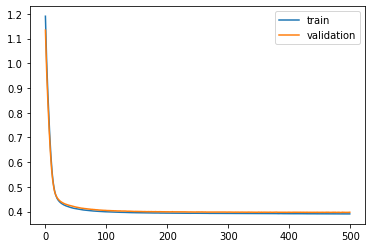

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 47s - loss: 1.1910 - val_loss: 1.1297

Epoch 00001: val_loss improved from inf to 1.12972, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0920 - val_loss: 1.0431

Epoch 00002: val_loss improved from 1.12972 to 1.04314, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 1.0101 - val_loss: 0.9700

Epoch 00003: val_loss improved from 1.04314 to 0.97000, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.9405 - val_loss: 0.9054

Epoch 00004: val_loss improved from 0.97000 to 0.90535, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8783 - val_loss: 0.8453

Epoch 00005: val_loss improved from 0.90535 to 0.84528, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.8202 - val_loss: 0.7879

Epoch 00006: val_loss improved from 0.84528 to 0.78790, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7654 - val_loss: 0.7342

Epoch 00007: val_loss improved from 0.78790

 - 1s - loss: 0.4090 - val_loss: 0.4061

Epoch 00058: val_loss improved from 0.40635 to 0.40609, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4087 - val_loss: 0.4058

Epoch 00059: val_loss improved from 0.40609 to 0.40578, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4083 - val_loss: 0.4054

Epoch 00060: val_loss improved from 0.40578 to 0.40544, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4080 - val_loss: 0.4051

Epoch 00061: val_loss improved from 0.40544 to 0.40510, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4076 - val_loss: 0.4049

Epoch 00062: val_loss improved from 0.40510 to 0.40494, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4072 - val_loss: 0.4043

Epoch 00063: val_loss improved from 0.40494 to 0.40429, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4069 - val_loss: 0.4042

Epoch 00064: val_loss improved from 0.40429 to 0.40421, saving model to val_weights2.hdf5
Epoch


Epoch 00120: val_loss improved from 0.39699 to 0.39690, saving model to val_weights2.hdf5
Epoch 121/500
 - 1s - loss: 0.3978 - val_loss: 0.3970

Epoch 00121: val_loss did not improve from 0.39690
Epoch 122/500
 - 1s - loss: 0.3976 - val_loss: 0.3968

Epoch 00122: val_loss improved from 0.39690 to 0.39681, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3975 - val_loss: 0.3968

Epoch 00123: val_loss improved from 0.39681 to 0.39675, saving model to val_weights2.hdf5
Epoch 124/500
 - 1s - loss: 0.3974 - val_loss: 0.3965

Epoch 00124: val_loss improved from 0.39675 to 0.39654, saving model to val_weights2.hdf5
Epoch 125/500
 - 1s - loss: 0.3974 - val_loss: 0.3969

Epoch 00125: val_loss did not improve from 0.39654
Epoch 126/500
 - 1s - loss: 0.3973 - val_loss: 0.3965

Epoch 00126: val_loss improved from 0.39654 to 0.39647, saving model to val_weights2.hdf5
Epoch 127/500
 - 1s - loss: 0.3973 - val_loss: 0.3966

Epoch 00127: val_loss did not improve from 0.39647
Epoch 128/5


Epoch 00187: val_loss did not improve from 0.39392
Epoch 188/500
 - 1s - loss: 0.3947 - val_loss: 0.3940

Epoch 00188: val_loss did not improve from 0.39392
Epoch 189/500
 - 1s - loss: 0.3948 - val_loss: 0.3941

Epoch 00189: val_loss did not improve from 0.39392
Epoch 190/500
 - 1s - loss: 0.3948 - val_loss: 0.3940

Epoch 00190: val_loss did not improve from 0.39392
Epoch 191/500
 - 1s - loss: 0.3947 - val_loss: 0.3940

Epoch 00191: val_loss did not improve from 0.39392
Epoch 192/500
 - 1s - loss: 0.3946 - val_loss: 0.3939

Epoch 00192: val_loss did not improve from 0.39392
Epoch 193/500
 - 1s - loss: 0.3946 - val_loss: 0.3941

Epoch 00193: val_loss did not improve from 0.39392
Epoch 194/500
 - 1s - loss: 0.3946 - val_loss: 0.3939

Epoch 00194: val_loss improved from 0.39392 to 0.39389, saving model to val_weights2.hdf5
Epoch 195/500
 - 1s - loss: 0.3947 - val_loss: 0.3941

Epoch 00195: val_loss did not improve from 0.39389
Epoch 196/500
 - 1s - loss: 0.3946 - val_loss: 0.3940

Epoch 

 - 1s - loss: 0.3937 - val_loss: 0.3929

Epoch 00260: val_loss did not improve from 0.39265
Epoch 261/500
 - 1s - loss: 0.3936 - val_loss: 0.3929

Epoch 00261: val_loss did not improve from 0.39265
Epoch 262/500
 - 1s - loss: 0.3936 - val_loss: 0.3926

Epoch 00262: val_loss improved from 0.39265 to 0.39260, saving model to val_weights2.hdf5
Epoch 263/500
 - 1s - loss: 0.3935 - val_loss: 0.3932

Epoch 00263: val_loss did not improve from 0.39260
Epoch 264/500
 - 1s - loss: 0.3936 - val_loss: 0.3926

Epoch 00264: val_loss did not improve from 0.39260
Epoch 265/500
 - 1s - loss: 0.3936 - val_loss: 0.3928

Epoch 00265: val_loss did not improve from 0.39260
Epoch 266/500
 - 1s - loss: 0.3936 - val_loss: 0.3926

Epoch 00266: val_loss did not improve from 0.39260
Epoch 267/500
 - 1s - loss: 0.3935 - val_loss: 0.3929

Epoch 00267: val_loss did not improve from 0.39260
Epoch 268/500
 - 1s - loss: 0.3936 - val_loss: 0.3928

Epoch 00268: val_loss did not improve from 0.39260
Epoch 269/500
 - 1s -

 - 1s - loss: 0.3928 - val_loss: 0.3927

Epoch 00336: val_loss did not improve from 0.39228
Epoch 337/500
 - 1s - loss: 0.3928 - val_loss: 0.3925

Epoch 00337: val_loss did not improve from 0.39228
Epoch 338/500
 - 1s - loss: 0.3927 - val_loss: 0.3925

Epoch 00338: val_loss did not improve from 0.39228
Epoch 339/500
 - 1s - loss: 0.3927 - val_loss: 0.3927

Epoch 00339: val_loss did not improve from 0.39228
Epoch 340/500
 - 1s - loss: 0.3928 - val_loss: 0.3925

Epoch 00340: val_loss did not improve from 0.39228
Epoch 341/500
 - 1s - loss: 0.3928 - val_loss: 0.3927

Epoch 00341: val_loss did not improve from 0.39228
Epoch 342/500
 - 1s - loss: 0.3927 - val_loss: 0.3927

Epoch 00342: val_loss did not improve from 0.39228
Epoch 343/500
 - 1s - loss: 0.3928 - val_loss: 0.3925

Epoch 00343: val_loss did not improve from 0.39228
Epoch 344/500
 - 1s - loss: 0.3928 - val_loss: 0.3929

Epoch 00344: val_loss did not improve from 0.39228
Epoch 345/500
 - 1s - loss: 0.3929 - val_loss: 0.3924

Epoch

 - 1s - loss: 0.3922 - val_loss: 0.3927

Epoch 00413: val_loss did not improve from 0.39216
Epoch 414/500
 - 1s - loss: 0.3923 - val_loss: 0.3925

Epoch 00414: val_loss did not improve from 0.39216
Epoch 415/500
 - 1s - loss: 0.3921 - val_loss: 0.3926

Epoch 00415: val_loss did not improve from 0.39216
Epoch 416/500
 - 1s - loss: 0.3925 - val_loss: 0.3924

Epoch 00416: val_loss did not improve from 0.39216
Epoch 417/500
 - 1s - loss: 0.3922 - val_loss: 0.3926

Epoch 00417: val_loss did not improve from 0.39216
Epoch 418/500
 - 1s - loss: 0.3922 - val_loss: 0.3926

Epoch 00418: val_loss did not improve from 0.39216
Epoch 419/500
 - 1s - loss: 0.3920 - val_loss: 0.3924

Epoch 00419: val_loss did not improve from 0.39216
Epoch 420/500
 - 1s - loss: 0.3922 - val_loss: 0.3925

Epoch 00420: val_loss did not improve from 0.39216
Epoch 421/500
 - 1s - loss: 0.3921 - val_loss: 0.3925

Epoch 00421: val_loss did not improve from 0.39216
Epoch 422/500
 - 1s - loss: 0.3920 - val_loss: 0.3926

Epoch

 - 1s - loss: 0.3916 - val_loss: 0.3925

Epoch 00490: val_loss did not improve from 0.39214
Epoch 491/500
 - 1s - loss: 0.3918 - val_loss: 0.3925

Epoch 00491: val_loss did not improve from 0.39214
Epoch 492/500
 - 1s - loss: 0.3916 - val_loss: 0.3924

Epoch 00492: val_loss did not improve from 0.39214
Epoch 493/500
 - 1s - loss: 0.3917 - val_loss: 0.3928

Epoch 00493: val_loss did not improve from 0.39214
Epoch 494/500
 - 1s - loss: 0.3917 - val_loss: 0.3928

Epoch 00494: val_loss did not improve from 0.39214
Epoch 495/500
 - 1s - loss: 0.3917 - val_loss: 0.3925

Epoch 00495: val_loss did not improve from 0.39214
Epoch 496/500
 - 1s - loss: 0.3915 - val_loss: 0.3925

Epoch 00496: val_loss did not improve from 0.39214
Epoch 497/500
 - 1s - loss: 0.3916 - val_loss: 0.3926

Epoch 00497: val_loss did not improve from 0.39214
Epoch 498/500
 - 1s - loss: 0.3916 - val_loss: 0.3927

Epoch 00498: val_loss did not improve from 0.39214
Epoch 499/500
 - 1s - loss: 0.3917 - val_loss: 0.3925

Epoch

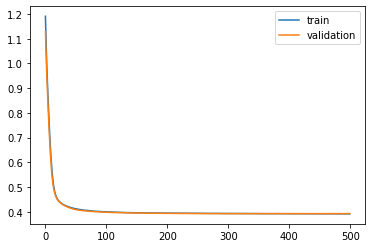

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 47s - loss: 1.1924 - val_loss: 1.1176

Epoch 00001: val_loss improved from inf to 1.11764, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0936 - val_loss: 1.0294

Epoch 00002: val_loss improved from 1.11764 to 1.02939, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 1.0119 - val_loss: 0.9558

Epoch 00003: val_loss improved from 1.02939 to 0.95575, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.9422 - val_loss: 0.8920

Epoch 00004: val_loss improved from 0.95575 to 0.89202, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8798 - val_loss: 0.8335

Epoch 00005: val_loss improved from 0.89202 to 0.83350, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.8216 - val_loss: 0.7785

Epoch 00006: val_loss improved from 0.83350 to 0.77849, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7664 - val_loss: 0.7275

Epoch 00007: val_loss improved from 0.77849

 - 1s - loss: 0.4084 - val_loss: 0.4155

Epoch 00058: val_loss improved from 0.41563 to 0.41550, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4080 - val_loss: 0.4150

Epoch 00059: val_loss improved from 0.41550 to 0.41503, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4076 - val_loss: 0.4149

Epoch 00060: val_loss improved from 0.41503 to 0.41495, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4072 - val_loss: 0.4145

Epoch 00061: val_loss improved from 0.41495 to 0.41448, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4068 - val_loss: 0.4144

Epoch 00062: val_loss improved from 0.41448 to 0.41442, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4066 - val_loss: 0.4139

Epoch 00063: val_loss improved from 0.41442 to 0.41387, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4062 - val_loss: 0.4140

Epoch 00064: val_loss did not improve from 0.41387
Epoch 65/500
 - 1s - loss: 0.4060 - val_loss


Epoch 00120: val_loss did not improve from 0.40642
Epoch 121/500
 - 1s - loss: 0.3971 - val_loss: 0.4065

Epoch 00121: val_loss did not improve from 0.40642
Epoch 122/500
 - 1s - loss: 0.3970 - val_loss: 0.4063

Epoch 00122: val_loss improved from 0.40642 to 0.40631, saving model to val_weights3.hdf5
Epoch 123/500
 - 1s - loss: 0.3969 - val_loss: 0.4061

Epoch 00123: val_loss improved from 0.40631 to 0.40615, saving model to val_weights3.hdf5
Epoch 124/500
 - 1s - loss: 0.3969 - val_loss: 0.4061

Epoch 00124: val_loss improved from 0.40615 to 0.40605, saving model to val_weights3.hdf5
Epoch 125/500
 - 1s - loss: 0.3968 - val_loss: 0.4061

Epoch 00125: val_loss did not improve from 0.40605
Epoch 126/500
 - 1s - loss: 0.3969 - val_loss: 0.4060

Epoch 00126: val_loss improved from 0.40605 to 0.40596, saving model to val_weights3.hdf5
Epoch 127/500
 - 1s - loss: 0.3967 - val_loss: 0.4060

Epoch 00127: val_loss did not improve from 0.40596
Epoch 128/500
 - 1s - loss: 0.3966 - val_loss: 0.4

 - 1s - loss: 0.3938 - val_loss: 0.4040

Epoch 00191: val_loss did not improve from 0.40372
Epoch 192/500
 - 1s - loss: 0.3937 - val_loss: 0.4038

Epoch 00192: val_loss did not improve from 0.40372
Epoch 193/500
 - 1s - loss: 0.3937 - val_loss: 0.4040

Epoch 00193: val_loss did not improve from 0.40372
Epoch 194/500
 - 1s - loss: 0.3939 - val_loss: 0.4041

Epoch 00194: val_loss did not improve from 0.40372
Epoch 195/500
 - 1s - loss: 0.3938 - val_loss: 0.4040

Epoch 00195: val_loss did not improve from 0.40372
Epoch 196/500
 - 1s - loss: 0.3937 - val_loss: 0.4039

Epoch 00196: val_loss did not improve from 0.40372
Epoch 197/500
 - 1s - loss: 0.3937 - val_loss: 0.4038

Epoch 00197: val_loss did not improve from 0.40372
Epoch 198/500
 - 1s - loss: 0.3937 - val_loss: 0.4040

Epoch 00198: val_loss did not improve from 0.40372
Epoch 199/500
 - 1s - loss: 0.3937 - val_loss: 0.4038

Epoch 00199: val_loss did not improve from 0.40372
Epoch 200/500
 - 1s - loss: 0.3935 - val_loss: 0.4038

Epoch


Epoch 00264: val_loss did not improve from 0.40279
Epoch 265/500
 - 1s - loss: 0.3926 - val_loss: 0.4030

Epoch 00265: val_loss did not improve from 0.40279
Epoch 266/500
 - 1s - loss: 0.3925 - val_loss: 0.4028

Epoch 00266: val_loss did not improve from 0.40279
Epoch 267/500
 - 1s - loss: 0.3926 - val_loss: 0.4030

Epoch 00267: val_loss did not improve from 0.40279
Epoch 268/500
 - 1s - loss: 0.3927 - val_loss: 0.4031

Epoch 00268: val_loss did not improve from 0.40279
Epoch 269/500
 - 1s - loss: 0.3926 - val_loss: 0.4028

Epoch 00269: val_loss improved from 0.40279 to 0.40278, saving model to val_weights3.hdf5
Epoch 270/500
 - 1s - loss: 0.3927 - val_loss: 0.4030

Epoch 00270: val_loss did not improve from 0.40278
Epoch 271/500
 - 1s - loss: 0.3925 - val_loss: 0.4029

Epoch 00271: val_loss did not improve from 0.40278
Epoch 272/500
 - 1s - loss: 0.3926 - val_loss: 0.4026

Epoch 00272: val_loss improved from 0.40278 to 0.40264, saving model to val_weights3.hdf5
Epoch 273/500
 - 1s - 

 - 1s - loss: 0.3918 - val_loss: 0.4020

Epoch 00338: val_loss improved from 0.40199 to 0.40197, saving model to val_weights3.hdf5
Epoch 339/500
 - 1s - loss: 0.3919 - val_loss: 0.4019

Epoch 00339: val_loss improved from 0.40197 to 0.40192, saving model to val_weights3.hdf5
Epoch 340/500
 - 1s - loss: 0.3919 - val_loss: 0.4020

Epoch 00340: val_loss did not improve from 0.40192
Epoch 341/500
 - 1s - loss: 0.3919 - val_loss: 0.4019

Epoch 00341: val_loss improved from 0.40192 to 0.40191, saving model to val_weights3.hdf5
Epoch 342/500
 - 1s - loss: 0.3919 - val_loss: 0.4022

Epoch 00342: val_loss did not improve from 0.40191
Epoch 343/500
 - 1s - loss: 0.3919 - val_loss: 0.4019

Epoch 00343: val_loss did not improve from 0.40191
Epoch 344/500
 - 1s - loss: 0.3919 - val_loss: 0.4020

Epoch 00344: val_loss did not improve from 0.40191
Epoch 345/500
 - 1s - loss: 0.3919 - val_loss: 0.4023

Epoch 00345: val_loss did not improve from 0.40191
Epoch 346/500
 - 1s - loss: 0.3919 - val_loss: 0.

 - 1s - loss: 0.3914 - val_loss: 0.4018

Epoch 00412: val_loss did not improve from 0.40117
Epoch 413/500
 - 1s - loss: 0.3914 - val_loss: 0.4014

Epoch 00413: val_loss did not improve from 0.40117
Epoch 414/500
 - 1s - loss: 0.3914 - val_loss: 0.4020

Epoch 00414: val_loss did not improve from 0.40117
Epoch 415/500
 - 1s - loss: 0.3913 - val_loss: 0.4010

Epoch 00415: val_loss improved from 0.40117 to 0.40102, saving model to val_weights3.hdf5
Epoch 416/500
 - 1s - loss: 0.3912 - val_loss: 0.4016

Epoch 00416: val_loss did not improve from 0.40102
Epoch 417/500
 - 1s - loss: 0.3914 - val_loss: 0.4011

Epoch 00417: val_loss did not improve from 0.40102
Epoch 418/500
 - 1s - loss: 0.3911 - val_loss: 0.4015

Epoch 00418: val_loss did not improve from 0.40102
Epoch 419/500
 - 1s - loss: 0.3914 - val_loss: 0.4015

Epoch 00419: val_loss did not improve from 0.40102
Epoch 420/500
 - 1s - loss: 0.3912 - val_loss: 0.4014

Epoch 00420: val_loss did not improve from 0.40102
Epoch 421/500
 - 1s -

 - 1s - loss: 0.3907 - val_loss: 0.4014

Epoch 00488: val_loss did not improve from 0.40074
Epoch 489/500
 - 1s - loss: 0.3907 - val_loss: 0.4016

Epoch 00489: val_loss did not improve from 0.40074
Epoch 490/500
 - 1s - loss: 0.3909 - val_loss: 0.4015

Epoch 00490: val_loss did not improve from 0.40074
Epoch 491/500
 - 1s - loss: 0.3909 - val_loss: 0.4010

Epoch 00491: val_loss did not improve from 0.40074
Epoch 492/500
 - 1s - loss: 0.3908 - val_loss: 0.4015

Epoch 00492: val_loss did not improve from 0.40074
Epoch 493/500
 - 1s - loss: 0.3907 - val_loss: 0.4008

Epoch 00493: val_loss did not improve from 0.40074
Epoch 494/500
 - 1s - loss: 0.3907 - val_loss: 0.4017

Epoch 00494: val_loss did not improve from 0.40074
Epoch 495/500
 - 1s - loss: 0.3908 - val_loss: 0.4012

Epoch 00495: val_loss did not improve from 0.40074
Epoch 496/500
 - 1s - loss: 0.3907 - val_loss: 0.4014

Epoch 00496: val_loss did not improve from 0.40074
Epoch 497/500
 - 1s - loss: 0.3907 - val_loss: 0.4011

Epoch

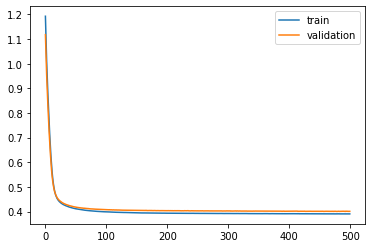

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 47s - loss: 1.1916 - val_loss: 1.1233

Epoch 00001: val_loss improved from inf to 1.12331, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0929 - val_loss: 1.0345

Epoch 00002: val_loss improved from 1.12331 to 1.03454, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 1.0113 - val_loss: 0.9608

Epoch 00003: val_loss improved from 1.03454 to 0.96075, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.9416 - val_loss: 0.8960

Epoch 00004: val_loss improved from 0.96075 to 0.89604, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8792 - val_loss: 0.8362

Epoch 00005: val_loss improved from 0.89604 to 0.83620, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.8210 - val_loss: 0.7796

Epoch 00006: val_loss improved from 0.83620 to 0.77964, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7662 - val_loss: 0.7265

Epoch 00007: val_loss improved from 0.77964

 - 1s - loss: 0.4092 - val_loss: 0.4081

Epoch 00058: val_loss improved from 0.40877 to 0.40805, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4089 - val_loss: 0.4078

Epoch 00059: val_loss improved from 0.40805 to 0.40775, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4085 - val_loss: 0.4075

Epoch 00060: val_loss improved from 0.40775 to 0.40747, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4082 - val_loss: 0.4074

Epoch 00061: val_loss improved from 0.40747 to 0.40735, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4079 - val_loss: 0.4066

Epoch 00062: val_loss improved from 0.40735 to 0.40659, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4075 - val_loss: 0.4066

Epoch 00063: val_loss improved from 0.40659 to 0.40658, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4072 - val_loss: 0.4059

Epoch 00064: val_loss improved from 0.40658 to 0.40594, saving model to val_weights4.hdf5
Epoch


Epoch 00119: val_loss did not improve from 0.39682
Epoch 120/500
 - 1s - loss: 0.3979 - val_loss: 0.3962

Epoch 00120: val_loss improved from 0.39682 to 0.39620, saving model to val_weights4.hdf5
Epoch 121/500
 - 1s - loss: 0.3979 - val_loss: 0.3970

Epoch 00121: val_loss did not improve from 0.39620
Epoch 122/500
 - 1s - loss: 0.3980 - val_loss: 0.3967

Epoch 00122: val_loss did not improve from 0.39620
Epoch 123/500
 - 1s - loss: 0.3978 - val_loss: 0.3967

Epoch 00123: val_loss did not improve from 0.39620
Epoch 124/500
 - 1s - loss: 0.3976 - val_loss: 0.3964

Epoch 00124: val_loss did not improve from 0.39620
Epoch 125/500
 - 1s - loss: 0.3974 - val_loss: 0.3965

Epoch 00125: val_loss did not improve from 0.39620
Epoch 126/500
 - 1s - loss: 0.3975 - val_loss: 0.3963

Epoch 00126: val_loss did not improve from 0.39620
Epoch 127/500
 - 1s - loss: 0.3974 - val_loss: 0.3965

Epoch 00127: val_loss did not improve from 0.39620
Epoch 128/500
 - 1s - loss: 0.3974 - val_loss: 0.3963

Epoch 

 - 1s - loss: 0.3949 - val_loss: 0.3951

Epoch 00192: val_loss did not improve from 0.39491
Epoch 193/500
 - 1s - loss: 0.3949 - val_loss: 0.3951

Epoch 00193: val_loss did not improve from 0.39491
Epoch 194/500
 - 1s - loss: 0.3948 - val_loss: 0.3954

Epoch 00194: val_loss did not improve from 0.39491
Epoch 195/500
 - 1s - loss: 0.3949 - val_loss: 0.3951

Epoch 00195: val_loss did not improve from 0.39491
Epoch 196/500
 - 1s - loss: 0.3949 - val_loss: 0.3950

Epoch 00196: val_loss did not improve from 0.39491
Epoch 197/500
 - 1s - loss: 0.3947 - val_loss: 0.3949

Epoch 00197: val_loss improved from 0.39491 to 0.39487, saving model to val_weights4.hdf5
Epoch 198/500
 - 1s - loss: 0.3947 - val_loss: 0.3950

Epoch 00198: val_loss did not improve from 0.39487
Epoch 199/500
 - 1s - loss: 0.3949 - val_loss: 0.3956

Epoch 00199: val_loss did not improve from 0.39487
Epoch 200/500
 - 1s - loss: 0.3948 - val_loss: 0.3950

Epoch 00200: val_loss did not improve from 0.39487
Epoch 201/500
 - 1s -

 - 1s - loss: 0.3939 - val_loss: 0.3938

Epoch 00268: val_loss did not improve from 0.39372
Epoch 269/500
 - 1s - loss: 0.3940 - val_loss: 0.3938

Epoch 00269: val_loss did not improve from 0.39372
Epoch 270/500
 - 1s - loss: 0.3939 - val_loss: 0.3937

Epoch 00270: val_loss improved from 0.39372 to 0.39372, saving model to val_weights4.hdf5
Epoch 271/500
 - 1s - loss: 0.3937 - val_loss: 0.3937

Epoch 00271: val_loss improved from 0.39372 to 0.39367, saving model to val_weights4.hdf5
Epoch 272/500
 - 1s - loss: 0.3937 - val_loss: 0.3940

Epoch 00272: val_loss did not improve from 0.39367
Epoch 273/500
 - 1s - loss: 0.3937 - val_loss: 0.3937

Epoch 00273: val_loss did not improve from 0.39367
Epoch 274/500
 - 1s - loss: 0.3937 - val_loss: 0.3937

Epoch 00274: val_loss improved from 0.39367 to 0.39366, saving model to val_weights4.hdf5
Epoch 275/500
 - 1s - loss: 0.3938 - val_loss: 0.3939

Epoch 00275: val_loss did not improve from 0.39366
Epoch 276/500
 - 1s - loss: 0.3936 - val_loss: 0.

 - 1s - loss: 0.3929 - val_loss: 0.3931

Epoch 00343: val_loss did not improve from 0.39277
Epoch 344/500
 - 1s - loss: 0.3928 - val_loss: 0.3932

Epoch 00344: val_loss did not improve from 0.39277
Epoch 345/500
 - 1s - loss: 0.3928 - val_loss: 0.3934

Epoch 00345: val_loss did not improve from 0.39277
Epoch 346/500
 - 1s - loss: 0.3929 - val_loss: 0.3931

Epoch 00346: val_loss did not improve from 0.39277
Epoch 347/500
 - 1s - loss: 0.3929 - val_loss: 0.3934

Epoch 00347: val_loss did not improve from 0.39277
Epoch 348/500
 - 1s - loss: 0.3930 - val_loss: 0.3928

Epoch 00348: val_loss did not improve from 0.39277
Epoch 349/500
 - 1s - loss: 0.3930 - val_loss: 0.3936

Epoch 00349: val_loss did not improve from 0.39277
Epoch 350/500
 - 1s - loss: 0.3930 - val_loss: 0.3936

Epoch 00350: val_loss did not improve from 0.39277
Epoch 351/500
 - 1s - loss: 0.3930 - val_loss: 0.3934

Epoch 00351: val_loss did not improve from 0.39277
Epoch 352/500
 - 1s - loss: 0.3929 - val_loss: 0.3936

Epoch

 - 1s - loss: 0.3923 - val_loss: 0.3934

Epoch 00420: val_loss did not improve from 0.39257
Epoch 421/500
 - 1s - loss: 0.3923 - val_loss: 0.3931

Epoch 00421: val_loss did not improve from 0.39257
Epoch 422/500
 - 1s - loss: 0.3924 - val_loss: 0.3932

Epoch 00422: val_loss did not improve from 0.39257
Epoch 423/500
 - 1s - loss: 0.3925 - val_loss: 0.3935

Epoch 00423: val_loss did not improve from 0.39257
Epoch 424/500
 - 1s - loss: 0.3924 - val_loss: 0.3933

Epoch 00424: val_loss did not improve from 0.39257
Epoch 425/500
 - 1s - loss: 0.3924 - val_loss: 0.3931

Epoch 00425: val_loss did not improve from 0.39257
Epoch 426/500
 - 1s - loss: 0.3923 - val_loss: 0.3933

Epoch 00426: val_loss did not improve from 0.39257
Epoch 427/500
 - 1s - loss: 0.3922 - val_loss: 0.3930

Epoch 00427: val_loss did not improve from 0.39257
Epoch 428/500
 - 1s - loss: 0.3923 - val_loss: 0.3934

Epoch 00428: val_loss did not improve from 0.39257
Epoch 429/500
 - 1s - loss: 0.3924 - val_loss: 0.3932

Epoch

 - 1s - loss: 0.3918 - val_loss: 0.3929

Epoch 00497: val_loss did not improve from 0.39239
Epoch 498/500
 - 1s - loss: 0.3919 - val_loss: 0.3931

Epoch 00498: val_loss did not improve from 0.39239
Epoch 499/500
 - 1s - loss: 0.3918 - val_loss: 0.3928

Epoch 00499: val_loss did not improve from 0.39239
Epoch 500/500
 - 1s - loss: 0.3917 - val_loss: 0.3923

Epoch 00500: val_loss improved from 0.39239 to 0.39235, saving model to val_weights4.hdf5
#################################
Number of units: 4
Batch size: 8192
Fold: 3
L2: 0.011033833681339
best val loss: 0.3923475056754218
#################################


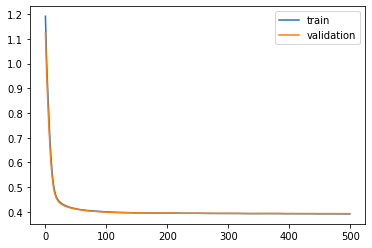

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 47s - loss: 1.1920 - val_loss: 1.1214

Epoch 00001: val_loss improved from inf to 1.12144, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0932 - val_loss: 1.0343

Epoch 00002: val_loss improved from 1.12144 to 1.03428, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 1.0115 - val_loss: 0.9615

Epoch 00003: val_loss improved from 1.03428 to 0.96146, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.9419 - val_loss: 0.8973

Epoch 00004: val_loss improved from 0.96146 to 0.89734, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8795 - val_loss: 0.8387

Epoch 00005: val_loss improved from 0.89734 to 0.83870, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.8212 - val_loss: 0.7834

Epoch 00006: val_loss improved from 0.83870 to 0.78335, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7662 - val_loss: 0.7308

Epoch 00007: val_loss improved from 0.78335

 - 1s - loss: 0.4087 - val_loss: 0.4118

Epoch 00058: val_loss improved from 0.41247 to 0.41185, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4085 - val_loss: 0.4119

Epoch 00059: val_loss did not improve from 0.41185
Epoch 60/500
 - 1s - loss: 0.4080 - val_loss: 0.4116

Epoch 00060: val_loss improved from 0.41185 to 0.41160, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4077 - val_loss: 0.4115

Epoch 00061: val_loss improved from 0.41160 to 0.41154, saving model to val_weights5.hdf5
Epoch 62/500
 - 1s - loss: 0.4073 - val_loss: 0.4111

Epoch 00062: val_loss improved from 0.41154 to 0.41109, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4070 - val_loss: 0.4108

Epoch 00063: val_loss improved from 0.41109 to 0.41079, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4066 - val_loss: 0.4107

Epoch 00064: val_loss improved from 0.41079 to 0.41070, saving model to val_weights5.hdf5
Epoch 65/500
 - 1s - loss: 0.4063 - val_loss

 - 1s - loss: 0.3975 - val_loss: 0.4023

Epoch 00121: val_loss improved from 0.40246 to 0.40225, saving model to val_weights5.hdf5
Epoch 122/500
 - 1s - loss: 0.3976 - val_loss: 0.4025

Epoch 00122: val_loss did not improve from 0.40225
Epoch 123/500
 - 1s - loss: 0.3974 - val_loss: 0.4019

Epoch 00123: val_loss improved from 0.40225 to 0.40192, saving model to val_weights5.hdf5
Epoch 124/500
 - 1s - loss: 0.3973 - val_loss: 0.4025

Epoch 00124: val_loss did not improve from 0.40192
Epoch 125/500
 - 1s - loss: 0.3972 - val_loss: 0.4018

Epoch 00125: val_loss improved from 0.40192 to 0.40185, saving model to val_weights5.hdf5
Epoch 126/500
 - 1s - loss: 0.3972 - val_loss: 0.4021

Epoch 00126: val_loss did not improve from 0.40185
Epoch 127/500
 - 1s - loss: 0.3971 - val_loss: 0.4016

Epoch 00127: val_loss improved from 0.40185 to 0.40157, saving model to val_weights5.hdf5
Epoch 128/500
 - 1s - loss: 0.3970 - val_loss: 0.4018

Epoch 00128: val_loss did not improve from 0.40157
Epoch 129/


Epoch 00189: val_loss did not improve from 0.39855
Epoch 190/500
 - 1s - loss: 0.3945 - val_loss: 0.3984

Epoch 00190: val_loss improved from 0.39855 to 0.39842, saving model to val_weights5.hdf5
Epoch 191/500
 - 1s - loss: 0.3943 - val_loss: 0.3990

Epoch 00191: val_loss did not improve from 0.39842
Epoch 192/500
 - 1s - loss: 0.3944 - val_loss: 0.3988

Epoch 00192: val_loss did not improve from 0.39842
Epoch 193/500
 - 1s - loss: 0.3944 - val_loss: 0.3990

Epoch 00193: val_loss did not improve from 0.39842
Epoch 194/500
 - 1s - loss: 0.3944 - val_loss: 0.3984

Epoch 00194: val_loss improved from 0.39842 to 0.39836, saving model to val_weights5.hdf5
Epoch 195/500
 - 1s - loss: 0.3943 - val_loss: 0.3986

Epoch 00195: val_loss did not improve from 0.39836
Epoch 196/500
 - 1s - loss: 0.3943 - val_loss: 0.3988

Epoch 00196: val_loss did not improve from 0.39836
Epoch 197/500
 - 1s - loss: 0.3943 - val_loss: 0.3986

Epoch 00197: val_loss did not improve from 0.39836
Epoch 198/500
 - 1s - 

 - 1s - loss: 0.3931 - val_loss: 0.3980

Epoch 00263: val_loss did not improve from 0.39754
Epoch 264/500
 - 1s - loss: 0.3931 - val_loss: 0.3978

Epoch 00264: val_loss did not improve from 0.39754
Epoch 265/500
 - 1s - loss: 0.3930 - val_loss: 0.3978

Epoch 00265: val_loss did not improve from 0.39754
Epoch 266/500
 - 1s - loss: 0.3932 - val_loss: 0.3977

Epoch 00266: val_loss did not improve from 0.39754
Epoch 267/500
 - 1s - loss: 0.3930 - val_loss: 0.3975

Epoch 00267: val_loss improved from 0.39754 to 0.39746, saving model to val_weights5.hdf5
Epoch 268/500
 - 1s - loss: 0.3932 - val_loss: 0.3981

Epoch 00268: val_loss did not improve from 0.39746
Epoch 269/500
 - 1s - loss: 0.3931 - val_loss: 0.3978

Epoch 00269: val_loss did not improve from 0.39746
Epoch 270/500
 - 1s - loss: 0.3930 - val_loss: 0.3979

Epoch 00270: val_loss did not improve from 0.39746
Epoch 271/500
 - 1s - loss: 0.3929 - val_loss: 0.3980

Epoch 00271: val_loss did not improve from 0.39746
Epoch 272/500
 - 1s -

 - 1s - loss: 0.3925 - val_loss: 0.3982

Epoch 00340: val_loss did not improve from 0.39743
Epoch 341/500
 - 1s - loss: 0.3926 - val_loss: 0.3989

Epoch 00341: val_loss did not improve from 0.39743
Epoch 342/500
 - 1s - loss: 0.3926 - val_loss: 0.3990

Epoch 00342: val_loss did not improve from 0.39743
Epoch 343/500
 - 1s - loss: 0.3927 - val_loss: 0.3990

Epoch 00343: val_loss did not improve from 0.39743
Epoch 344/500
 - 1s - loss: 0.3926 - val_loss: 0.3993

Epoch 00344: val_loss did not improve from 0.39743
Epoch 345/500
 - 1s - loss: 0.3927 - val_loss: 0.3993

Epoch 00345: val_loss did not improve from 0.39743
Epoch 346/500
 - 1s - loss: 0.3927 - val_loss: 0.3994

Epoch 00346: val_loss did not improve from 0.39743
Epoch 347/500
 - 1s - loss: 0.3929 - val_loss: 0.3993

Epoch 00347: val_loss did not improve from 0.39743
Epoch 348/500
 - 1s - loss: 0.3929 - val_loss: 0.3997

Epoch 00348: val_loss did not improve from 0.39743
Epoch 349/500
 - 1s - loss: 0.3929 - val_loss: 0.3999

Epoch


Epoch 00417: val_loss did not improve from 0.39743
Epoch 418/500
 - 1s - loss: 0.3919 - val_loss: 0.3976

Epoch 00418: val_loss did not improve from 0.39743
Epoch 419/500
 - 1s - loss: 0.3918 - val_loss: 0.3983

Epoch 00419: val_loss did not improve from 0.39743
Epoch 420/500
 - 1s - loss: 0.3920 - val_loss: 0.3976

Epoch 00420: val_loss did not improve from 0.39743
Epoch 421/500
 - 1s - loss: 0.3918 - val_loss: 0.3977

Epoch 00421: val_loss did not improve from 0.39743
Epoch 422/500
 - 1s - loss: 0.3918 - val_loss: 0.3976

Epoch 00422: val_loss did not improve from 0.39743
Epoch 423/500
 - 1s - loss: 0.3918 - val_loss: 0.3977

Epoch 00423: val_loss did not improve from 0.39743
Epoch 424/500
 - 1s - loss: 0.3918 - val_loss: 0.3982

Epoch 00424: val_loss did not improve from 0.39743
Epoch 425/500
 - 1s - loss: 0.3919 - val_loss: 0.3976

Epoch 00425: val_loss did not improve from 0.39743
Epoch 426/500
 - 1s - loss: 0.3918 - val_loss: 0.3974

Epoch 00426: val_loss did not improve from 0.

 - 1s - loss: 0.3913 - val_loss: 0.3982

Epoch 00495: val_loss did not improve from 0.39743
Epoch 496/500
 - 1s - loss: 0.3913 - val_loss: 0.3983

Epoch 00496: val_loss did not improve from 0.39743
Epoch 497/500
 - 1s - loss: 0.3915 - val_loss: 0.3980

Epoch 00497: val_loss did not improve from 0.39743
Epoch 498/500
 - 1s - loss: 0.3914 - val_loss: 0.3981

Epoch 00498: val_loss did not improve from 0.39743
Epoch 499/500
 - 1s - loss: 0.3915 - val_loss: 0.3982

Epoch 00499: val_loss did not improve from 0.39743
Epoch 500/500
 - 1s - loss: 0.3915 - val_loss: 0.3983

Epoch 00500: val_loss did not improve from 0.39743
#################################
Number of units: 4
Batch size: 8192
Fold: 4
L2: 0.011033833681339
best val loss: 0.3974274119006263
#################################
[[4, 8192, 0.007921656789898646, 0, 0.3964275896019406], [4, 8192, 0.007921656789898646, 1, 0.3918810964955224], [4, 8192, 0.007921656789898646, 2, 0.40050656101438736], [4, 8192, 0.007921656789898646, 3, 0.391

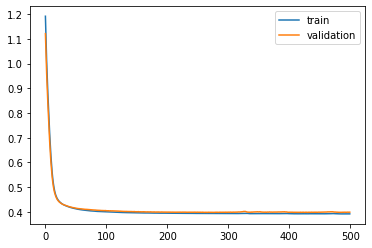

Time to train LSTM:  426.57533049583435
Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 47s - loss: 1.1089 - val_loss: 1.0589

Epoch 00001: val_loss improved from inf to 1.05886, saving model to val_weights1.hdf5
Epoch 2/500
 - 1s - loss: 1.0210 - val_loss: 0.9801

Epoch 00002: val_loss improved from 1.05886 to 0.98006, saving model to val_weights1.hdf5
Epoch 3/500
 - 1s - loss: 0.9500 - val_loss: 0.9153

Epoch 00003: val_loss improved from 0.98006 to 0.91529, saving model to val_weights1.hdf5
Epoch 4/500
 - 1s - loss: 0.8902 - val_loss: 0.8596

Epoch 00004: val_loss improved from 0.91529 to 0.85959, saving model to val_weights1.hdf5
Epoch 5/500
 - 1s - loss: 0.8364 - val_loss: 0.8080

Epoch 00005: val_loss improved from 0.85959 to 0.80798, saving model to val_weights1.hdf5
Epoch 6/500
 - 1s - loss: 0.7859 - val_loss: 0.7593

Epoch 00006: val_loss improved from 0.80798 to 0.75927, saving model to val_weights1.hdf5
Epoch 7/500
 - 1s - loss: 0.7375 - val_loss: 0.7129

Epo


Epoch 00057: val_loss improved from 0.41595 to 0.41552, saving model to val_weights1.hdf5
Epoch 58/500
 - 1s - loss: 0.4077 - val_loss: 0.4147

Epoch 00058: val_loss improved from 0.41552 to 0.41469, saving model to val_weights1.hdf5
Epoch 59/500
 - 1s - loss: 0.4073 - val_loss: 0.4146

Epoch 00059: val_loss improved from 0.41469 to 0.41458, saving model to val_weights1.hdf5
Epoch 60/500
 - 1s - loss: 0.4070 - val_loss: 0.4141

Epoch 00060: val_loss improved from 0.41458 to 0.41414, saving model to val_weights1.hdf5
Epoch 61/500
 - 1s - loss: 0.4066 - val_loss: 0.4135

Epoch 00061: val_loss improved from 0.41414 to 0.41353, saving model to val_weights1.hdf5
Epoch 62/500
 - 1s - loss: 0.4064 - val_loss: 0.4135

Epoch 00062: val_loss did not improve from 0.41353
Epoch 63/500
 - 1s - loss: 0.4060 - val_loss: 0.4128

Epoch 00063: val_loss improved from 0.41353 to 0.41278, saving model to val_weights1.hdf5
Epoch 64/500
 - 1s - loss: 0.4057 - val_loss: 0.4129

Epoch 00064: val_loss did not 


Epoch 00118: val_loss did not improve from 0.40249
Epoch 119/500
 - 1s - loss: 0.3969 - val_loss: 0.4025

Epoch 00119: val_loss did not improve from 0.40249
Epoch 120/500
 - 1s - loss: 0.3968 - val_loss: 0.4028

Epoch 00120: val_loss did not improve from 0.40249
Epoch 121/500
 - 1s - loss: 0.3967 - val_loss: 0.4023

Epoch 00121: val_loss improved from 0.40249 to 0.40231, saving model to val_weights1.hdf5
Epoch 122/500
 - 1s - loss: 0.3965 - val_loss: 0.4024

Epoch 00122: val_loss did not improve from 0.40231
Epoch 123/500
 - 1s - loss: 0.3965 - val_loss: 0.4019

Epoch 00123: val_loss improved from 0.40231 to 0.40191, saving model to val_weights1.hdf5
Epoch 124/500
 - 1s - loss: 0.3965 - val_loss: 0.4021

Epoch 00124: val_loss did not improve from 0.40191
Epoch 125/500
 - 1s - loss: 0.3963 - val_loss: 0.4020

Epoch 00125: val_loss did not improve from 0.40191
Epoch 126/500
 - 1s - loss: 0.3963 - val_loss: 0.4019

Epoch 00126: val_loss improved from 0.40191 to 0.40186, saving model to v

 - 1s - loss: 0.3932 - val_loss: 0.3995

Epoch 00188: val_loss did not improve from 0.39919
Epoch 189/500
 - 1s - loss: 0.3932 - val_loss: 0.3991

Epoch 00189: val_loss improved from 0.39919 to 0.39908, saving model to val_weights1.hdf5
Epoch 190/500
 - 1s - loss: 0.3932 - val_loss: 0.3991

Epoch 00190: val_loss did not improve from 0.39908
Epoch 191/500
 - 1s - loss: 0.3930 - val_loss: 0.3990

Epoch 00191: val_loss improved from 0.39908 to 0.39901, saving model to val_weights1.hdf5
Epoch 192/500
 - 1s - loss: 0.3931 - val_loss: 0.3990

Epoch 00192: val_loss improved from 0.39901 to 0.39901, saving model to val_weights1.hdf5
Epoch 193/500
 - 1s - loss: 0.3930 - val_loss: 0.3992

Epoch 00193: val_loss did not improve from 0.39901
Epoch 194/500
 - 1s - loss: 0.3931 - val_loss: 0.3988

Epoch 00194: val_loss improved from 0.39901 to 0.39885, saving model to val_weights1.hdf5
Epoch 195/500
 - 1s - loss: 0.3931 - val_loss: 0.3990

Epoch 00195: val_loss did not improve from 0.39885
Epoch 196/

 - 1s - loss: 0.3921 - val_loss: 0.3981

Epoch 00262: val_loss did not improve from 0.39768
Epoch 263/500
 - 1s - loss: 0.3920 - val_loss: 0.3980

Epoch 00263: val_loss did not improve from 0.39768
Epoch 264/500
 - 1s - loss: 0.3920 - val_loss: 0.3979

Epoch 00264: val_loss did not improve from 0.39768
Epoch 265/500
 - 1s - loss: 0.3921 - val_loss: 0.3981

Epoch 00265: val_loss did not improve from 0.39768
Epoch 266/500
 - 1s - loss: 0.3919 - val_loss: 0.3982

Epoch 00266: val_loss did not improve from 0.39768
Epoch 267/500
 - 1s - loss: 0.3921 - val_loss: 0.3980

Epoch 00267: val_loss did not improve from 0.39768
Epoch 268/500
 - 1s - loss: 0.3919 - val_loss: 0.3980

Epoch 00268: val_loss did not improve from 0.39768
Epoch 269/500
 - 1s - loss: 0.3920 - val_loss: 0.3980

Epoch 00269: val_loss did not improve from 0.39768
Epoch 270/500
 - 1s - loss: 0.3919 - val_loss: 0.3983

Epoch 00270: val_loss did not improve from 0.39768
Epoch 271/500
 - 1s - loss: 0.3920 - val_loss: 0.3981

Epoch


Epoch 00337: val_loss did not improve from 0.39717
Epoch 338/500
 - 1s - loss: 0.3916 - val_loss: 0.3975

Epoch 00338: val_loss did not improve from 0.39717
Epoch 339/500
 - 1s - loss: 0.3914 - val_loss: 0.3975

Epoch 00339: val_loss did not improve from 0.39717
Epoch 340/500
 - 1s - loss: 0.3913 - val_loss: 0.3978

Epoch 00340: val_loss did not improve from 0.39717
Epoch 341/500
 - 1s - loss: 0.3913 - val_loss: 0.3981

Epoch 00341: val_loss did not improve from 0.39717
Epoch 342/500
 - 1s - loss: 0.3915 - val_loss: 0.3982

Epoch 00342: val_loss did not improve from 0.39717
Epoch 343/500
 - 1s - loss: 0.3916 - val_loss: 0.3977

Epoch 00343: val_loss did not improve from 0.39717
Epoch 344/500
 - 1s - loss: 0.3915 - val_loss: 0.3981

Epoch 00344: val_loss did not improve from 0.39717
Epoch 345/500
 - 1s - loss: 0.3913 - val_loss: 0.3976

Epoch 00345: val_loss did not improve from 0.39717
Epoch 346/500
 - 1s - loss: 0.3912 - val_loss: 0.3977

Epoch 00346: val_loss did not improve from 0.

 - 1s - loss: 0.3905 - val_loss: 0.3980

Epoch 00415: val_loss did not improve from 0.39717
Epoch 416/500
 - 1s - loss: 0.3906 - val_loss: 0.3975

Epoch 00416: val_loss did not improve from 0.39717
Epoch 417/500
 - 1s - loss: 0.3905 - val_loss: 0.3980

Epoch 00417: val_loss did not improve from 0.39717
Epoch 418/500
 - 1s - loss: 0.3906 - val_loss: 0.3977

Epoch 00418: val_loss did not improve from 0.39717
Epoch 419/500
 - 1s - loss: 0.3905 - val_loss: 0.3980

Epoch 00419: val_loss did not improve from 0.39717
Epoch 420/500
 - 1s - loss: 0.3904 - val_loss: 0.3975

Epoch 00420: val_loss did not improve from 0.39717
Epoch 421/500
 - 1s - loss: 0.3903 - val_loss: 0.3980

Epoch 00421: val_loss did not improve from 0.39717
Epoch 422/500
 - 1s - loss: 0.3905 - val_loss: 0.3978

Epoch 00422: val_loss did not improve from 0.39717
Epoch 423/500
 - 1s - loss: 0.3905 - val_loss: 0.3979

Epoch 00423: val_loss did not improve from 0.39717
Epoch 424/500
 - 1s - loss: 0.3905 - val_loss: 0.3978

Epoch

 - 1s - loss: 0.3898 - val_loss: 0.3968

Epoch 00489: val_loss did not improve from 0.39643
Epoch 490/500
 - 1s - loss: 0.3896 - val_loss: 0.3970

Epoch 00490: val_loss did not improve from 0.39643
Epoch 491/500
 - 1s - loss: 0.3895 - val_loss: 0.3968

Epoch 00491: val_loss did not improve from 0.39643
Epoch 492/500
 - 1s - loss: 0.3896 - val_loss: 0.3971

Epoch 00492: val_loss did not improve from 0.39643
Epoch 493/500
 - 1s - loss: 0.3895 - val_loss: 0.3966

Epoch 00493: val_loss did not improve from 0.39643
Epoch 494/500
 - 1s - loss: 0.3895 - val_loss: 0.3967

Epoch 00494: val_loss did not improve from 0.39643
Epoch 495/500
 - 1s - loss: 0.3897 - val_loss: 0.3966

Epoch 00495: val_loss did not improve from 0.39643
Epoch 496/500
 - 1s - loss: 0.3896 - val_loss: 0.3967

Epoch 00496: val_loss did not improve from 0.39643
Epoch 497/500
 - 1s - loss: 0.3896 - val_loss: 0.3969

Epoch 00497: val_loss did not improve from 0.39643
Epoch 498/500
 - 1s - loss: 0.3896 - val_loss: 0.3972

Epoch

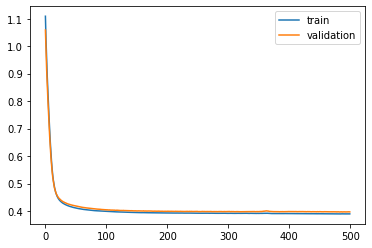

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 47s - loss: 1.1096 - val_loss: 1.0546

Epoch 00001: val_loss improved from inf to 1.05457, saving model to val_weights2.hdf5
Epoch 2/500
 - 1s - loss: 1.0216 - val_loss: 0.9787

Epoch 00002: val_loss improved from 1.05457 to 0.97872, saving model to val_weights2.hdf5
Epoch 3/500
 - 1s - loss: 0.9502 - val_loss: 0.9156

Epoch 00003: val_loss improved from 0.97872 to 0.91557, saving model to val_weights2.hdf5
Epoch 4/500
 - 1s - loss: 0.8902 - val_loss: 0.8598

Epoch 00004: val_loss improved from 0.91557 to 0.85979, saving model to val_weights2.hdf5
Epoch 5/500
 - 1s - loss: 0.8363 - val_loss: 0.8075

Epoch 00005: val_loss improved from 0.85979 to 0.80749, saving model to val_weights2.hdf5
Epoch 6/500
 - 1s - loss: 0.7858 - val_loss: 0.7573

Epoch 00006: val_loss improved from 0.80749 to 0.75731, saving model to val_weights2.hdf5
Epoch 7/500
 - 1s - loss: 0.7377 - val_loss: 0.7099

Epoch 00007: val_loss improved from 0.75731

 - 1s - loss: 0.4084 - val_loss: 0.4059

Epoch 00058: val_loss improved from 0.40639 to 0.40595, saving model to val_weights2.hdf5
Epoch 59/500
 - 1s - loss: 0.4080 - val_loss: 0.4057

Epoch 00059: val_loss improved from 0.40595 to 0.40573, saving model to val_weights2.hdf5
Epoch 60/500
 - 1s - loss: 0.4077 - val_loss: 0.4054

Epoch 00060: val_loss improved from 0.40573 to 0.40540, saving model to val_weights2.hdf5
Epoch 61/500
 - 1s - loss: 0.4072 - val_loss: 0.4050

Epoch 00061: val_loss improved from 0.40540 to 0.40502, saving model to val_weights2.hdf5
Epoch 62/500
 - 1s - loss: 0.4069 - val_loss: 0.4046

Epoch 00062: val_loss improved from 0.40502 to 0.40455, saving model to val_weights2.hdf5
Epoch 63/500
 - 1s - loss: 0.4065 - val_loss: 0.4045

Epoch 00063: val_loss improved from 0.40455 to 0.40450, saving model to val_weights2.hdf5
Epoch 64/500
 - 1s - loss: 0.4062 - val_loss: 0.4040

Epoch 00064: val_loss improved from 0.40450 to 0.40395, saving model to val_weights2.hdf5
Epoch

 - 1s - loss: 0.3972 - val_loss: 0.3965

Epoch 00120: val_loss improved from 0.39671 to 0.39647, saving model to val_weights2.hdf5
Epoch 121/500
 - 1s - loss: 0.3971 - val_loss: 0.3966

Epoch 00121: val_loss did not improve from 0.39647
Epoch 122/500
 - 1s - loss: 0.3970 - val_loss: 0.3964

Epoch 00122: val_loss improved from 0.39647 to 0.39641, saving model to val_weights2.hdf5
Epoch 123/500
 - 1s - loss: 0.3969 - val_loss: 0.3964

Epoch 00123: val_loss did not improve from 0.39641
Epoch 124/500
 - 1s - loss: 0.3969 - val_loss: 0.3964

Epoch 00124: val_loss improved from 0.39641 to 0.39637, saving model to val_weights2.hdf5
Epoch 125/500
 - 1s - loss: 0.3968 - val_loss: 0.3965

Epoch 00125: val_loss did not improve from 0.39637
Epoch 126/500
 - 1s - loss: 0.3969 - val_loss: 0.3963

Epoch 00126: val_loss improved from 0.39637 to 0.39633, saving model to val_weights2.hdf5
Epoch 127/500
 - 1s - loss: 0.3966 - val_loss: 0.3964

Epoch 00127: val_loss did not improve from 0.39633
Epoch 128/

 - 1s - loss: 0.3938 - val_loss: 0.3935

Epoch 00189: val_loss did not improve from 0.39330
Epoch 190/500
 - 1s - loss: 0.3938 - val_loss: 0.3935

Epoch 00190: val_loss did not improve from 0.39330
Epoch 191/500
 - 1s - loss: 0.3938 - val_loss: 0.3935

Epoch 00191: val_loss did not improve from 0.39330
Epoch 192/500
 - 1s - loss: 0.3939 - val_loss: 0.3931

Epoch 00192: val_loss improved from 0.39330 to 0.39312, saving model to val_weights2.hdf5
Epoch 193/500
 - 1s - loss: 0.3936 - val_loss: 0.3932

Epoch 00193: val_loss did not improve from 0.39312
Epoch 194/500
 - 1s - loss: 0.3935 - val_loss: 0.3931

Epoch 00194: val_loss improved from 0.39312 to 0.39310, saving model to val_weights2.hdf5
Epoch 195/500
 - 1s - loss: 0.3936 - val_loss: 0.3933

Epoch 00195: val_loss did not improve from 0.39310
Epoch 196/500
 - 1s - loss: 0.3935 - val_loss: 0.3934

Epoch 00196: val_loss did not improve from 0.39310
Epoch 197/500
 - 1s - loss: 0.3937 - val_loss: 0.3932

Epoch 00197: val_loss did not imp

 - 1s - loss: 0.3927 - val_loss: 0.3928

Epoch 00262: val_loss did not improve from 0.39240
Epoch 263/500
 - 1s - loss: 0.3926 - val_loss: 0.3927

Epoch 00263: val_loss did not improve from 0.39240
Epoch 264/500
 - 1s - loss: 0.3925 - val_loss: 0.3927

Epoch 00264: val_loss did not improve from 0.39240
Epoch 265/500
 - 1s - loss: 0.3925 - val_loss: 0.3927

Epoch 00265: val_loss did not improve from 0.39240
Epoch 266/500
 - 1s - loss: 0.3924 - val_loss: 0.3926

Epoch 00266: val_loss did not improve from 0.39240
Epoch 267/500
 - 1s - loss: 0.3925 - val_loss: 0.3925

Epoch 00267: val_loss did not improve from 0.39240
Epoch 268/500
 - 1s - loss: 0.3926 - val_loss: 0.3926

Epoch 00268: val_loss did not improve from 0.39240
Epoch 269/500
 - 1s - loss: 0.3925 - val_loss: 0.3925

Epoch 00269: val_loss did not improve from 0.39240
Epoch 270/500
 - 1s - loss: 0.3926 - val_loss: 0.3928

Epoch 00270: val_loss did not improve from 0.39240
Epoch 271/500
 - 1s - loss: 0.3926 - val_loss: 0.3926

Epoch

 - 1s - loss: 0.3916 - val_loss: 0.3927

Epoch 00338: val_loss did not improve from 0.39199
Epoch 339/500
 - 1s - loss: 0.3916 - val_loss: 0.3926

Epoch 00339: val_loss did not improve from 0.39199
Epoch 340/500
 - 1s - loss: 0.3915 - val_loss: 0.3923

Epoch 00340: val_loss did not improve from 0.39199
Epoch 341/500
 - 1s - loss: 0.3915 - val_loss: 0.3926

Epoch 00341: val_loss did not improve from 0.39199
Epoch 342/500
 - 1s - loss: 0.3915 - val_loss: 0.3923

Epoch 00342: val_loss did not improve from 0.39199
Epoch 343/500
 - 1s - loss: 0.3915 - val_loss: 0.3925

Epoch 00343: val_loss did not improve from 0.39199
Epoch 344/500
 - 1s - loss: 0.3917 - val_loss: 0.3925

Epoch 00344: val_loss did not improve from 0.39199
Epoch 345/500
 - 1s - loss: 0.3917 - val_loss: 0.3925

Epoch 00345: val_loss did not improve from 0.39199
Epoch 346/500
 - 1s - loss: 0.3916 - val_loss: 0.3924

Epoch 00346: val_loss did not improve from 0.39199
Epoch 347/500
 - 1s - loss: 0.3917 - val_loss: 0.3924

Epoch

 - 1s - loss: 0.3907 - val_loss: 0.3920

Epoch 00415: val_loss did not improve from 0.39194
Epoch 416/500
 - 1s - loss: 0.3909 - val_loss: 0.3926

Epoch 00416: val_loss did not improve from 0.39194
Epoch 417/500
 - 1s - loss: 0.3910 - val_loss: 0.3925

Epoch 00417: val_loss did not improve from 0.39194
Epoch 418/500
 - 1s - loss: 0.3911 - val_loss: 0.3925

Epoch 00418: val_loss did not improve from 0.39194
Epoch 419/500
 - 1s - loss: 0.3910 - val_loss: 0.3924

Epoch 00419: val_loss did not improve from 0.39194
Epoch 420/500
 - 1s - loss: 0.3908 - val_loss: 0.3924

Epoch 00420: val_loss did not improve from 0.39194
Epoch 421/500
 - 1s - loss: 0.3908 - val_loss: 0.3920

Epoch 00421: val_loss did not improve from 0.39194
Epoch 422/500
 - 1s - loss: 0.3908 - val_loss: 0.3924

Epoch 00422: val_loss did not improve from 0.39194
Epoch 423/500
 - 1s - loss: 0.3908 - val_loss: 0.3921

Epoch 00423: val_loss did not improve from 0.39194
Epoch 424/500
 - 1s - loss: 0.3909 - val_loss: 0.3922

Epoch


Epoch 00491: val_loss did not improve from 0.39190
Epoch 492/500
 - 1s - loss: 0.3904 - val_loss: 0.3925

Epoch 00492: val_loss did not improve from 0.39190
Epoch 493/500
 - 1s - loss: 0.3905 - val_loss: 0.3922

Epoch 00493: val_loss did not improve from 0.39190
Epoch 494/500
 - 1s - loss: 0.3903 - val_loss: 0.3922

Epoch 00494: val_loss did not improve from 0.39190
Epoch 495/500
 - 1s - loss: 0.3904 - val_loss: 0.3920

Epoch 00495: val_loss did not improve from 0.39190
Epoch 496/500
 - 1s - loss: 0.3901 - val_loss: 0.3924

Epoch 00496: val_loss did not improve from 0.39190
Epoch 497/500
 - 1s - loss: 0.3903 - val_loss: 0.3923

Epoch 00497: val_loss did not improve from 0.39190
Epoch 498/500
 - 1s - loss: 0.3903 - val_loss: 0.3923

Epoch 00498: val_loss did not improve from 0.39190
Epoch 499/500
 - 1s - loss: 0.3903 - val_loss: 0.3920

Epoch 00499: val_loss did not improve from 0.39190
Epoch 500/500
 - 1s - loss: 0.3903 - val_loss: 0.3924

Epoch 00500: val_loss did not improve from 0.

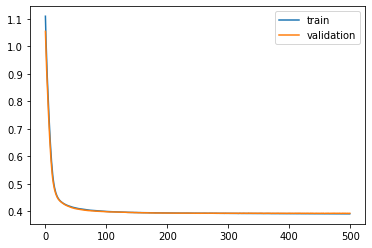

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 48s - loss: 1.1110 - val_loss: 1.0424

Epoch 00001: val_loss improved from inf to 1.04244, saving model to val_weights3.hdf5
Epoch 2/500
 - 1s - loss: 1.0232 - val_loss: 0.9650

Epoch 00002: val_loss improved from 1.04244 to 0.96501, saving model to val_weights3.hdf5
Epoch 3/500
 - 1s - loss: 0.9519 - val_loss: 0.9016

Epoch 00003: val_loss improved from 0.96501 to 0.90158, saving model to val_weights3.hdf5
Epoch 4/500
 - 1s - loss: 0.8918 - val_loss: 0.8468

Epoch 00004: val_loss improved from 0.90158 to 0.84677, saving model to val_weights3.hdf5
Epoch 5/500
 - 1s - loss: 0.8378 - val_loss: 0.7962

Epoch 00005: val_loss improved from 0.84677 to 0.79622, saving model to val_weights3.hdf5
Epoch 6/500
 - 1s - loss: 0.7871 - val_loss: 0.7483

Epoch 00006: val_loss improved from 0.79622 to 0.74833, saving model to val_weights3.hdf5
Epoch 7/500
 - 1s - loss: 0.7387 - val_loss: 0.7037

Epoch 00007: val_loss improved from 0.74833

 - 1s - loss: 0.4077 - val_loss: 0.4153

Epoch 00058: val_loss improved from 0.41576 to 0.41527, saving model to val_weights3.hdf5
Epoch 59/500
 - 1s - loss: 0.4074 - val_loss: 0.4150

Epoch 00059: val_loss improved from 0.41527 to 0.41499, saving model to val_weights3.hdf5
Epoch 60/500
 - 1s - loss: 0.4069 - val_loss: 0.4146

Epoch 00060: val_loss improved from 0.41499 to 0.41457, saving model to val_weights3.hdf5
Epoch 61/500
 - 1s - loss: 0.4066 - val_loss: 0.4145

Epoch 00061: val_loss improved from 0.41457 to 0.41448, saving model to val_weights3.hdf5
Epoch 62/500
 - 1s - loss: 0.4062 - val_loss: 0.4139

Epoch 00062: val_loss improved from 0.41448 to 0.41395, saving model to val_weights3.hdf5
Epoch 63/500
 - 1s - loss: 0.4059 - val_loss: 0.4139

Epoch 00063: val_loss improved from 0.41395 to 0.41392, saving model to val_weights3.hdf5
Epoch 64/500
 - 1s - loss: 0.4056 - val_loss: 0.4135

Epoch 00064: val_loss improved from 0.41392 to 0.41353, saving model to val_weights3.hdf5
Epoch

 - 1s - loss: 0.3963 - val_loss: 0.4063

Epoch 00121: val_loss did not improve from 0.40597
Epoch 122/500
 - 1s - loss: 0.3962 - val_loss: 0.4062

Epoch 00122: val_loss did not improve from 0.40597
Epoch 123/500
 - 1s - loss: 0.3960 - val_loss: 0.4061

Epoch 00123: val_loss did not improve from 0.40597
Epoch 124/500
 - 1s - loss: 0.3960 - val_loss: 0.4062

Epoch 00124: val_loss did not improve from 0.40597
Epoch 125/500
 - 1s - loss: 0.3959 - val_loss: 0.4059

Epoch 00125: val_loss improved from 0.40597 to 0.40588, saving model to val_weights3.hdf5
Epoch 126/500
 - 1s - loss: 0.3959 - val_loss: 0.4058

Epoch 00126: val_loss improved from 0.40588 to 0.40581, saving model to val_weights3.hdf5
Epoch 127/500
 - 1s - loss: 0.3958 - val_loss: 0.4057

Epoch 00127: val_loss improved from 0.40581 to 0.40568, saving model to val_weights3.hdf5
Epoch 128/500
 - 1s - loss: 0.3956 - val_loss: 0.4059

Epoch 00128: val_loss did not improve from 0.40568
Epoch 129/500
 - 1s - loss: 0.3957 - val_loss: 0.


Epoch 00189: val_loss did not improve from 0.40315
Epoch 190/500
 - 1s - loss: 0.3930 - val_loss: 0.4036

Epoch 00190: val_loss did not improve from 0.40315
Epoch 191/500
 - 1s - loss: 0.3929 - val_loss: 0.4032

Epoch 00191: val_loss did not improve from 0.40315
Epoch 192/500
 - 1s - loss: 0.3927 - val_loss: 0.4034

Epoch 00192: val_loss did not improve from 0.40315
Epoch 193/500
 - 1s - loss: 0.3927 - val_loss: 0.4029

Epoch 00193: val_loss improved from 0.40315 to 0.40295, saving model to val_weights3.hdf5
Epoch 194/500
 - 1s - loss: 0.3927 - val_loss: 0.4035

Epoch 00194: val_loss did not improve from 0.40295
Epoch 195/500
 - 1s - loss: 0.3927 - val_loss: 0.4028

Epoch 00195: val_loss improved from 0.40295 to 0.40285, saving model to val_weights3.hdf5
Epoch 196/500
 - 1s - loss: 0.3927 - val_loss: 0.4030

Epoch 00196: val_loss did not improve from 0.40285
Epoch 197/500
 - 1s - loss: 0.3929 - val_loss: 0.4032

Epoch 00197: val_loss did not improve from 0.40285
Epoch 198/500
 - 1s - 


Epoch 00263: val_loss did not improve from 0.40227
Epoch 264/500
 - 1s - loss: 0.3916 - val_loss: 0.4024

Epoch 00264: val_loss did not improve from 0.40227
Epoch 265/500
 - 1s - loss: 0.3917 - val_loss: 0.4024

Epoch 00265: val_loss did not improve from 0.40227
Epoch 266/500
 - 1s - loss: 0.3917 - val_loss: 0.4025

Epoch 00266: val_loss did not improve from 0.40227
Epoch 267/500
 - 1s - loss: 0.3917 - val_loss: 0.4026

Epoch 00267: val_loss did not improve from 0.40227
Epoch 268/500
 - 1s - loss: 0.3916 - val_loss: 0.4024

Epoch 00268: val_loss did not improve from 0.40227
Epoch 269/500
 - 1s - loss: 0.3916 - val_loss: 0.4025

Epoch 00269: val_loss did not improve from 0.40227
Epoch 270/500
 - 1s - loss: 0.3916 - val_loss: 0.4027

Epoch 00270: val_loss did not improve from 0.40227
Epoch 271/500
 - 1s - loss: 0.3915 - val_loss: 0.4025

Epoch 00271: val_loss did not improve from 0.40227
Epoch 272/500
 - 1s - loss: 0.3916 - val_loss: 0.4026

Epoch 00272: val_loss did not improve from 0.

 - 1s - loss: 0.3908 - val_loss: 0.4018

Epoch 00337: val_loss did not improve from 0.40151
Epoch 338/500
 - 1s - loss: 0.3909 - val_loss: 0.4021

Epoch 00338: val_loss did not improve from 0.40151
Epoch 339/500
 - 1s - loss: 0.3906 - val_loss: 0.4015

Epoch 00339: val_loss improved from 0.40151 to 0.40147, saving model to val_weights3.hdf5
Epoch 340/500
 - 1s - loss: 0.3907 - val_loss: 0.4018

Epoch 00340: val_loss did not improve from 0.40147
Epoch 341/500
 - 1s - loss: 0.3906 - val_loss: 0.4015

Epoch 00341: val_loss improved from 0.40147 to 0.40145, saving model to val_weights3.hdf5
Epoch 342/500
 - 1s - loss: 0.3907 - val_loss: 0.4021

Epoch 00342: val_loss did not improve from 0.40145
Epoch 343/500
 - 1s - loss: 0.3907 - val_loss: 0.4014

Epoch 00343: val_loss improved from 0.40145 to 0.40144, saving model to val_weights3.hdf5
Epoch 344/500
 - 1s - loss: 0.3905 - val_loss: 0.4021

Epoch 00344: val_loss did not improve from 0.40144
Epoch 345/500
 - 1s - loss: 0.3907 - val_loss: 0.

 - 1s - loss: 0.3900 - val_loss: 0.4011

Epoch 00410: val_loss did not improve from 0.40074
Epoch 411/500
 - 1s - loss: 0.3901 - val_loss: 0.4013

Epoch 00411: val_loss did not improve from 0.40074
Epoch 412/500
 - 1s - loss: 0.3900 - val_loss: 0.4014

Epoch 00412: val_loss did not improve from 0.40074
Epoch 413/500
 - 1s - loss: 0.3901 - val_loss: 0.4013

Epoch 00413: val_loss did not improve from 0.40074
Epoch 414/500
 - 1s - loss: 0.3899 - val_loss: 0.4012

Epoch 00414: val_loss did not improve from 0.40074
Epoch 415/500
 - 1s - loss: 0.3899 - val_loss: 0.4009

Epoch 00415: val_loss did not improve from 0.40074
Epoch 416/500
 - 1s - loss: 0.3899 - val_loss: 0.4015

Epoch 00416: val_loss did not improve from 0.40074
Epoch 417/500
 - 1s - loss: 0.3900 - val_loss: 0.4013

Epoch 00417: val_loss did not improve from 0.40074
Epoch 418/500
 - 1s - loss: 0.3899 - val_loss: 0.4011

Epoch 00418: val_loss did not improve from 0.40074
Epoch 419/500
 - 1s - loss: 0.3899 - val_loss: 0.4009

Epoch


Epoch 00487: val_loss did not improve from 0.40074
Epoch 488/500
 - 1s - loss: 0.3894 - val_loss: 0.4010

Epoch 00488: val_loss did not improve from 0.40074
Epoch 489/500
 - 1s - loss: 0.3894 - val_loss: 0.4015

Epoch 00489: val_loss did not improve from 0.40074
Epoch 490/500
 - 1s - loss: 0.3893 - val_loss: 0.4008

Epoch 00490: val_loss did not improve from 0.40074
Epoch 491/500
 - 1s - loss: 0.3891 - val_loss: 0.4008

Epoch 00491: val_loss did not improve from 0.40074
Epoch 492/500
 - 1s - loss: 0.3893 - val_loss: 0.4009

Epoch 00492: val_loss did not improve from 0.40074
Epoch 493/500
 - 1s - loss: 0.3893 - val_loss: 0.4014

Epoch 00493: val_loss did not improve from 0.40074
Epoch 494/500
 - 1s - loss: 0.3893 - val_loss: 0.4009

Epoch 00494: val_loss did not improve from 0.40074
Epoch 495/500
 - 1s - loss: 0.3893 - val_loss: 0.4012

Epoch 00495: val_loss did not improve from 0.40074
Epoch 496/500
 - 1s - loss: 0.3892 - val_loss: 0.4007

Epoch 00496: val_loss improved from 0.40074 t

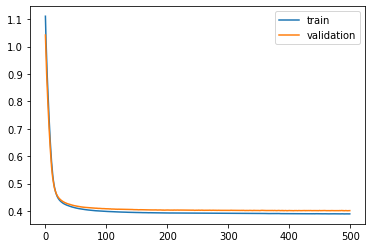

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 51s - loss: 1.1102 - val_loss: 1.0481

Epoch 00001: val_loss improved from inf to 1.04809, saving model to val_weights4.hdf5
Epoch 2/500
 - 1s - loss: 1.0225 - val_loss: 0.9702

Epoch 00002: val_loss improved from 1.04809 to 0.97020, saving model to val_weights4.hdf5
Epoch 3/500
 - 1s - loss: 0.9513 - val_loss: 0.9066

Epoch 00003: val_loss improved from 0.97020 to 0.90658, saving model to val_weights4.hdf5
Epoch 4/500
 - 1s - loss: 0.8913 - val_loss: 0.8509

Epoch 00004: val_loss improved from 0.90658 to 0.85088, saving model to val_weights4.hdf5
Epoch 5/500
 - 1s - loss: 0.8374 - val_loss: 0.7988

Epoch 00005: val_loss improved from 0.85088 to 0.79879, saving model to val_weights4.hdf5
Epoch 6/500
 - 1s - loss: 0.7868 - val_loss: 0.7493

Epoch 00006: val_loss improved from 0.79879 to 0.74928, saving model to val_weights4.hdf5
Epoch 7/500
 - 1s - loss: 0.7387 - val_loss: 0.7025

Epoch 00007: val_loss improved from 0.74928

 - 1s - loss: 0.4085 - val_loss: 0.4079

Epoch 00058: val_loss improved from 0.40820 to 0.40789, saving model to val_weights4.hdf5
Epoch 59/500
 - 1s - loss: 0.4081 - val_loss: 0.4076

Epoch 00059: val_loss improved from 0.40789 to 0.40761, saving model to val_weights4.hdf5
Epoch 60/500
 - 1s - loss: 0.4077 - val_loss: 0.4072

Epoch 00060: val_loss improved from 0.40761 to 0.40718, saving model to val_weights4.hdf5
Epoch 61/500
 - 1s - loss: 0.4074 - val_loss: 0.4067

Epoch 00061: val_loss improved from 0.40718 to 0.40673, saving model to val_weights4.hdf5
Epoch 62/500
 - 1s - loss: 0.4070 - val_loss: 0.4065

Epoch 00062: val_loss improved from 0.40673 to 0.40655, saving model to val_weights4.hdf5
Epoch 63/500
 - 1s - loss: 0.4067 - val_loss: 0.4063

Epoch 00063: val_loss improved from 0.40655 to 0.40632, saving model to val_weights4.hdf5
Epoch 64/500
 - 1s - loss: 0.4064 - val_loss: 0.4057

Epoch 00064: val_loss improved from 0.40632 to 0.40567, saving model to val_weights4.hdf5
Epoch

 - 1s - loss: 0.3973 - val_loss: 0.3965

Epoch 00119: val_loss did not improve from 0.39628
Epoch 120/500
 - 1s - loss: 0.3972 - val_loss: 0.3964

Epoch 00120: val_loss did not improve from 0.39628
Epoch 121/500
 - 1s - loss: 0.3972 - val_loss: 0.3965

Epoch 00121: val_loss did not improve from 0.39628
Epoch 122/500
 - 1s - loss: 0.3970 - val_loss: 0.3965

Epoch 00122: val_loss did not improve from 0.39628
Epoch 123/500
 - 1s - loss: 0.3970 - val_loss: 0.3962

Epoch 00123: val_loss improved from 0.39628 to 0.39619, saving model to val_weights4.hdf5
Epoch 124/500
 - 1s - loss: 0.3968 - val_loss: 0.3961

Epoch 00124: val_loss improved from 0.39619 to 0.39612, saving model to val_weights4.hdf5
Epoch 125/500
 - 1s - loss: 0.3967 - val_loss: 0.3960

Epoch 00125: val_loss improved from 0.39612 to 0.39596, saving model to val_weights4.hdf5
Epoch 126/500
 - 1s - loss: 0.3967 - val_loss: 0.3960

Epoch 00126: val_loss did not improve from 0.39596
Epoch 127/500
 - 1s - loss: 0.3966 - val_loss: 0.


Epoch 00188: val_loss did not improve from 0.39463
Epoch 189/500
 - 1s - loss: 0.3943 - val_loss: 0.3948

Epoch 00189: val_loss did not improve from 0.39463
Epoch 190/500
 - 1s - loss: 0.3943 - val_loss: 0.3949

Epoch 00190: val_loss did not improve from 0.39463
Epoch 191/500
 - 1s - loss: 0.3945 - val_loss: 0.3948

Epoch 00191: val_loss did not improve from 0.39463
Epoch 192/500
 - 1s - loss: 0.3944 - val_loss: 0.3946

Epoch 00192: val_loss improved from 0.39463 to 0.39463, saving model to val_weights4.hdf5
Epoch 193/500
 - 1s - loss: 0.3944 - val_loss: 0.3943

Epoch 00193: val_loss improved from 0.39463 to 0.39425, saving model to val_weights4.hdf5
Epoch 194/500
 - 1s - loss: 0.3944 - val_loss: 0.3942

Epoch 00194: val_loss improved from 0.39425 to 0.39424, saving model to val_weights4.hdf5
Epoch 195/500
 - 1s - loss: 0.3945 - val_loss: 0.3941

Epoch 00195: val_loss improved from 0.39424 to 0.39407, saving model to val_weights4.hdf5
Epoch 196/500
 - 1s - loss: 0.3942 - val_loss: 0.3

 - 1s - loss: 0.3928 - val_loss: 0.3933

Epoch 00262: val_loss did not improve from 0.39304
Epoch 263/500
 - 1s - loss: 0.3927 - val_loss: 0.3935

Epoch 00263: val_loss did not improve from 0.39304
Epoch 264/500
 - 1s - loss: 0.3927 - val_loss: 0.3935

Epoch 00264: val_loss did not improve from 0.39304
Epoch 265/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00265: val_loss did not improve from 0.39304
Epoch 266/500
 - 1s - loss: 0.3928 - val_loss: 0.3935

Epoch 00266: val_loss did not improve from 0.39304
Epoch 267/500
 - 1s - loss: 0.3927 - val_loss: 0.3937

Epoch 00267: val_loss did not improve from 0.39304
Epoch 268/500
 - 1s - loss: 0.3928 - val_loss: 0.3933

Epoch 00268: val_loss did not improve from 0.39304
Epoch 269/500
 - 1s - loss: 0.3927 - val_loss: 0.3934

Epoch 00269: val_loss did not improve from 0.39304
Epoch 270/500
 - 1s - loss: 0.3928 - val_loss: 0.3933

Epoch 00270: val_loss did not improve from 0.39304
Epoch 271/500
 - 1s - loss: 0.3928 - val_loss: 0.3936

Epoch

 - 1s - loss: 0.3923 - val_loss: 0.3933

Epoch 00339: val_loss did not improve from 0.39297
Epoch 340/500
 - 1s - loss: 0.3922 - val_loss: 0.3937

Epoch 00340: val_loss did not improve from 0.39297
Epoch 341/500
 - 1s - loss: 0.3924 - val_loss: 0.3933

Epoch 00341: val_loss did not improve from 0.39297
Epoch 342/500
 - 1s - loss: 0.3923 - val_loss: 0.3933

Epoch 00342: val_loss did not improve from 0.39297
Epoch 343/500
 - 1s - loss: 0.3925 - val_loss: 0.3930

Epoch 00343: val_loss did not improve from 0.39297
Epoch 344/500
 - 1s - loss: 0.3925 - val_loss: 0.3932

Epoch 00344: val_loss did not improve from 0.39297
Epoch 345/500
 - 1s - loss: 0.3924 - val_loss: 0.3930

Epoch 00345: val_loss did not improve from 0.39297
Epoch 346/500
 - 1s - loss: 0.3924 - val_loss: 0.3931

Epoch 00346: val_loss did not improve from 0.39297
Epoch 347/500
 - 1s - loss: 0.3924 - val_loss: 0.3927

Epoch 00347: val_loss improved from 0.39297 to 0.39273, saving model to val_weights4.hdf5
Epoch 348/500
 - 1s -


Epoch 00414: val_loss did not improve from 0.39226
Epoch 415/500
 - 1s - loss: 0.3916 - val_loss: 0.3921

Epoch 00415: val_loss improved from 0.39226 to 0.39213, saving model to val_weights4.hdf5
Epoch 416/500
 - 1s - loss: 0.3915 - val_loss: 0.3926

Epoch 00416: val_loss did not improve from 0.39213
Epoch 417/500
 - 1s - loss: 0.3914 - val_loss: 0.3922

Epoch 00417: val_loss did not improve from 0.39213
Epoch 418/500
 - 1s - loss: 0.3914 - val_loss: 0.3927

Epoch 00418: val_loss did not improve from 0.39213
Epoch 419/500
 - 1s - loss: 0.3915 - val_loss: 0.3927

Epoch 00419: val_loss did not improve from 0.39213
Epoch 420/500
 - 1s - loss: 0.3916 - val_loss: 0.3925

Epoch 00420: val_loss did not improve from 0.39213
Epoch 421/500
 - 1s - loss: 0.3915 - val_loss: 0.3925

Epoch 00421: val_loss did not improve from 0.39213
Epoch 422/500
 - 1s - loss: 0.3916 - val_loss: 0.3924

Epoch 00422: val_loss did not improve from 0.39213
Epoch 423/500
 - 1s - loss: 0.3916 - val_loss: 0.3923

Epoch 


Epoch 00489: val_loss did not improve from 0.39170
Epoch 490/500
 - 1s - loss: 0.3909 - val_loss: 0.3922

Epoch 00490: val_loss did not improve from 0.39170
Epoch 491/500
 - 1s - loss: 0.3907 - val_loss: 0.3920

Epoch 00491: val_loss did not improve from 0.39170
Epoch 492/500
 - 1s - loss: 0.3910 - val_loss: 0.3921

Epoch 00492: val_loss did not improve from 0.39170
Epoch 493/500
 - 1s - loss: 0.3909 - val_loss: 0.3923

Epoch 00493: val_loss did not improve from 0.39170
Epoch 494/500
 - 1s - loss: 0.3909 - val_loss: 0.3925

Epoch 00494: val_loss did not improve from 0.39170
Epoch 495/500
 - 1s - loss: 0.3908 - val_loss: 0.3921

Epoch 00495: val_loss did not improve from 0.39170
Epoch 496/500
 - 1s - loss: 0.3908 - val_loss: 0.3925

Epoch 00496: val_loss did not improve from 0.39170
Epoch 497/500
 - 1s - loss: 0.3909 - val_loss: 0.3923

Epoch 00497: val_loss did not improve from 0.39170
Epoch 498/500
 - 1s - loss: 0.3908 - val_loss: 0.3924

Epoch 00498: val_loss did not improve from 0.

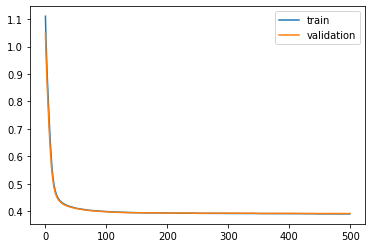

Train on 81000 samples, validate on 9000 samples
Epoch 1/500
 - 48s - loss: 1.1106 - val_loss: 1.0461

Epoch 00001: val_loss improved from inf to 1.04614, saving model to val_weights5.hdf5
Epoch 2/500
 - 1s - loss: 1.0228 - val_loss: 0.9697

Epoch 00002: val_loss improved from 1.04614 to 0.96974, saving model to val_weights5.hdf5
Epoch 3/500
 - 1s - loss: 0.9515 - val_loss: 0.9071

Epoch 00003: val_loss improved from 0.96974 to 0.90710, saving model to val_weights5.hdf5
Epoch 4/500
 - 1s - loss: 0.8915 - val_loss: 0.8520

Epoch 00004: val_loss improved from 0.90710 to 0.85198, saving model to val_weights5.hdf5
Epoch 5/500
 - 1s - loss: 0.8375 - val_loss: 0.8015

Epoch 00005: val_loss improved from 0.85198 to 0.80147, saving model to val_weights5.hdf5
Epoch 6/500
 - 1s - loss: 0.7868 - val_loss: 0.7531

Epoch 00006: val_loss improved from 0.80147 to 0.75314, saving model to val_weights5.hdf5
Epoch 7/500
 - 1s - loss: 0.7386 - val_loss: 0.7069

Epoch 00007: val_loss improved from 0.75314


Epoch 00058: val_loss improved from 0.41200 to 0.41164, saving model to val_weights5.hdf5
Epoch 59/500
 - 1s - loss: 0.4076 - val_loss: 0.4114

Epoch 00059: val_loss improved from 0.41164 to 0.41138, saving model to val_weights5.hdf5
Epoch 60/500
 - 1s - loss: 0.4072 - val_loss: 0.4112

Epoch 00060: val_loss improved from 0.41138 to 0.41124, saving model to val_weights5.hdf5
Epoch 61/500
 - 1s - loss: 0.4069 - val_loss: 0.4113

Epoch 00061: val_loss did not improve from 0.41124
Epoch 62/500
 - 1s - loss: 0.4065 - val_loss: 0.4108

Epoch 00062: val_loss improved from 0.41124 to 0.41080, saving model to val_weights5.hdf5
Epoch 63/500
 - 1s - loss: 0.4062 - val_loss: 0.4105

Epoch 00063: val_loss improved from 0.41080 to 0.41046, saving model to val_weights5.hdf5
Epoch 64/500
 - 1s - loss: 0.4058 - val_loss: 0.4106

Epoch 00064: val_loss did not improve from 0.41046
Epoch 65/500
 - 1s - loss: 0.4056 - val_loss: 0.4101

Epoch 00065: val_loss improved from 0.41046 to 0.41007, saving model 


Epoch 00120: val_loss improved from 0.40262 to 0.40234, saving model to val_weights5.hdf5
Epoch 121/500
 - 1s - loss: 0.3971 - val_loss: 0.4026

Epoch 00121: val_loss did not improve from 0.40234
Epoch 122/500
 - 1s - loss: 0.3969 - val_loss: 0.4023

Epoch 00122: val_loss improved from 0.40234 to 0.40232, saving model to val_weights5.hdf5
Epoch 123/500
 - 1s - loss: 0.3969 - val_loss: 0.4024

Epoch 00123: val_loss did not improve from 0.40232
Epoch 124/500
 - 1s - loss: 0.3968 - val_loss: 0.4021

Epoch 00124: val_loss improved from 0.40232 to 0.40209, saving model to val_weights5.hdf5
Epoch 125/500
 - 1s - loss: 0.3967 - val_loss: 0.4020

Epoch 00125: val_loss improved from 0.40209 to 0.40204, saving model to val_weights5.hdf5
Epoch 126/500
 - 1s - loss: 0.3966 - val_loss: 0.4019

Epoch 00126: val_loss improved from 0.40204 to 0.40193, saving model to val_weights5.hdf5
Epoch 127/500
 - 1s - loss: 0.3965 - val_loss: 0.4020

Epoch 00127: val_loss did not improve from 0.40193
Epoch 128/5


Epoch 00187: val_loss improved from 0.39839 to 0.39827, saving model to val_weights5.hdf5
Epoch 188/500
 - 1s - loss: 0.3939 - val_loss: 0.3985

Epoch 00188: val_loss did not improve from 0.39827
Epoch 189/500
 - 1s - loss: 0.3938 - val_loss: 0.3985

Epoch 00189: val_loss did not improve from 0.39827
Epoch 190/500
 - 1s - loss: 0.3938 - val_loss: 0.3987

Epoch 00190: val_loss did not improve from 0.39827
Epoch 191/500
 - 1s - loss: 0.3936 - val_loss: 0.3988

Epoch 00191: val_loss did not improve from 0.39827
Epoch 192/500
 - 1s - loss: 0.3936 - val_loss: 0.3985

Epoch 00192: val_loss did not improve from 0.39827
Epoch 193/500
 - 1s - loss: 0.3936 - val_loss: 0.3985

Epoch 00193: val_loss did not improve from 0.39827
Epoch 194/500
 - 1s - loss: 0.3938 - val_loss: 0.3981

Epoch 00194: val_loss improved from 0.39827 to 0.39809, saving model to val_weights5.hdf5
Epoch 195/500
 - 1s - loss: 0.3935 - val_loss: 0.3985

Epoch 00195: val_loss did not improve from 0.39809
Epoch 196/500
 - 1s - 

 - 1s - loss: 0.3925 - val_loss: 0.3981

Epoch 00262: val_loss did not improve from 0.39749
Epoch 263/500
 - 1s - loss: 0.3926 - val_loss: 0.3980

Epoch 00263: val_loss did not improve from 0.39749
Epoch 264/500
 - 1s - loss: 0.3925 - val_loss: 0.3976

Epoch 00264: val_loss did not improve from 0.39749
Epoch 265/500
 - 1s - loss: 0.3925 - val_loss: 0.3982

Epoch 00265: val_loss did not improve from 0.39749
Epoch 266/500
 - 1s - loss: 0.3927 - val_loss: 0.3983

Epoch 00266: val_loss did not improve from 0.39749
Epoch 267/500
 - 1s - loss: 0.3926 - val_loss: 0.3979

Epoch 00267: val_loss did not improve from 0.39749
Epoch 268/500
 - 1s - loss: 0.3927 - val_loss: 0.3987

Epoch 00268: val_loss did not improve from 0.39749
Epoch 269/500
 - 1s - loss: 0.3929 - val_loss: 0.3984

Epoch 00269: val_loss did not improve from 0.39749
Epoch 270/500
 - 1s - loss: 0.3929 - val_loss: 0.3986

Epoch 00270: val_loss did not improve from 0.39749
Epoch 271/500
 - 1s - loss: 0.3928 - val_loss: 0.3985

Epoch


Epoch 00337: val_loss did not improve from 0.39683
Epoch 338/500
 - 1s - loss: 0.3916 - val_loss: 0.3974

Epoch 00338: val_loss did not improve from 0.39683
Epoch 339/500
 - 1s - loss: 0.3916 - val_loss: 0.3972

Epoch 00339: val_loss did not improve from 0.39683
Epoch 340/500
 - 1s - loss: 0.3915 - val_loss: 0.3975

Epoch 00340: val_loss did not improve from 0.39683
Epoch 341/500
 - 1s - loss: 0.3915 - val_loss: 0.3973

Epoch 00341: val_loss did not improve from 0.39683
Epoch 342/500
 - 1s - loss: 0.3915 - val_loss: 0.3969

Epoch 00342: val_loss did not improve from 0.39683
Epoch 343/500
 - 1s - loss: 0.3914 - val_loss: 0.3971

Epoch 00343: val_loss did not improve from 0.39683
Epoch 344/500
 - 1s - loss: 0.3914 - val_loss: 0.3969

Epoch 00344: val_loss did not improve from 0.39683
Epoch 345/500
 - 1s - loss: 0.3913 - val_loss: 0.3971

Epoch 00345: val_loss did not improve from 0.39683
Epoch 346/500
 - 1s - loss: 0.3914 - val_loss: 0.3969

Epoch 00346: val_loss did not improve from 0.

 - 1s - loss: 0.3912 - val_loss: 0.3979

Epoch 00414: val_loss did not improve from 0.39652
Epoch 415/500
 - 1s - loss: 0.3911 - val_loss: 0.3981

Epoch 00415: val_loss did not improve from 0.39652
Epoch 416/500
 - 1s - loss: 0.3913 - val_loss: 0.3979

Epoch 00416: val_loss did not improve from 0.39652
Epoch 417/500
 - 1s - loss: 0.3912 - val_loss: 0.3983

Epoch 00417: val_loss did not improve from 0.39652
Epoch 418/500
 - 1s - loss: 0.3913 - val_loss: 0.3982

Epoch 00418: val_loss did not improve from 0.39652
Epoch 419/500
 - 1s - loss: 0.3913 - val_loss: 0.3982

Epoch 00419: val_loss did not improve from 0.39652
Epoch 420/500
 - 1s - loss: 0.3913 - val_loss: 0.3985

Epoch 00420: val_loss did not improve from 0.39652
Epoch 421/500
 - 1s - loss: 0.3915 - val_loss: 0.3988

Epoch 00421: val_loss did not improve from 0.39652
Epoch 422/500
 - 1s - loss: 0.3914 - val_loss: 0.3983

Epoch 00422: val_loss did not improve from 0.39652
Epoch 423/500
 - 1s - loss: 0.3915 - val_loss: 0.3984

Epoch


Epoch 00490: val_loss did not improve from 0.39634
Epoch 491/500
 - 1s - loss: 0.3903 - val_loss: 0.3979

Epoch 00491: val_loss did not improve from 0.39634
Epoch 492/500
 - 1s - loss: 0.3903 - val_loss: 0.3985

Epoch 00492: val_loss did not improve from 0.39634
Epoch 493/500
 - 1s - loss: 0.3904 - val_loss: 0.3979

Epoch 00493: val_loss did not improve from 0.39634
Epoch 494/500
 - 1s - loss: 0.3903 - val_loss: 0.3980

Epoch 00494: val_loss did not improve from 0.39634
Epoch 495/500
 - 1s - loss: 0.3904 - val_loss: 0.3973

Epoch 00495: val_loss did not improve from 0.39634
Epoch 496/500
 - 1s - loss: 0.3905 - val_loss: 0.3977

Epoch 00496: val_loss did not improve from 0.39634
Epoch 497/500
 - 1s - loss: 0.3904 - val_loss: 0.3983

Epoch 00497: val_loss did not improve from 0.39634
Epoch 498/500
 - 1s - loss: 0.3904 - val_loss: 0.3980

Epoch 00498: val_loss did not improve from 0.39634
Epoch 499/500
 - 1s - loss: 0.3905 - val_loss: 0.3976

Epoch 00499: val_loss did not improve from 0.

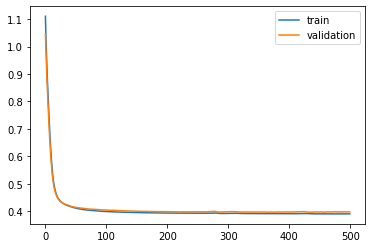

Time to train LSTM:  425.86946201324463
Entire process took:  50917.87882089615
Experiment record:
[[4, 8192, 0.007921656789898646, 0, 0.3964275896019406], [4, 8192, 0.007921656789898646, 1, 0.3918810964955224], [4, 8192, 0.007921656789898646, 2, 0.40050656101438736], [4, 8192, 0.007921656789898646, 3, 0.3915418761041429], [4, 8192, 0.007921656789898646, 4, 0.3962737381988102], [4, 8192, 0.010351554082642968, 0, 0.39633653055297], [4, 8192, 0.010351554082642968, 1, 0.3915295256773631], [4, 8192, 0.010351554082642968, 2, 0.40056833521525065], [4, 8192, 0.010351554082642968, 3, 0.3922834428151449], [4, 8192, 0.010351554082642968, 4, 0.3972017029391395], [4, 8192, 0.007298684687678438, 0, 0.39609155933062234], [4, 8192, 0.007298684687678438, 1, 0.3919682493739658], [4, 8192, 0.007298684687678438, 2, 0.40062965125507777], [4, 8192, 0.007298684687678438, 3, 0.3914709494378832], [4, 8192, 0.007298684687678438, 4, 0.39586787803967793], [4, 8192, 0.008736982766374824, 0, 0.39652940191162955], 

In [38]:
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)

num_per_fold = x_train.shape[0]//10
print(num_per_fold)

units = 4
batch_s = 8192


start_time = time.time()

exp_record = []

for L2 in L2_list:
    for f in range(5):#10
        #start = f*num_per_fold
        end = (f+1)*num_per_fold
        train1_x = x_train[:end, ]
        train2_x = x_train[end:, ]
        train_x_lstm = np.append(train2_x, train1_x, axis=0) 
        train1_y = y_train[:end, ]
        train2_y = y_train[end:, ]
        train_y_lstm = np.append(train2_y, train1_y, axis=0)

        start_time_inner = time.time()
        #config = tf.ConfigProto(log_device_placement = True)
        #config.gpu_options.visible_device_list='1'
        with tf.Session(config = tf.ConfigProto(log_device_placement = True)):
            seed(1)
            set_random_seed(1)
            model = Sequential()
            model.add(CuDNNLSTM(units, #CuDNNLSTM
                                kernel_regularizer=regularizers.l2(L2),
                                #dropout=0.5, #recurrent_dropout=0.5,
                                #recurrent_regularizer=regularizers.l2(0.01),
                                #bias_regularizer=regularizers.l2(0.01),
                                #activity_regularizer=regularizers.l2(0.01),
                                #return_sequences=True, 
                                input_shape=(8, 182))) #20 , 27
            model.add((Dense(1)))
            #adam = optimizers.Adam(lr=0.0015) #decay=1e-4
            #sgdm = optimizers.SGD(lr=0.001, momentum=0.9, decay=1e-7) 
            model.compile(loss='mae', optimizer='adam')#'adam'
            val_weight = "val_weights" + str(f+1) + ".hdf5"
            val_checkpointer = ModelCheckpoint(filepath=val_weight,
                                            monitor='val_loss', verbose=1,
                                            save_best_only=True)
            history = model.fit(train_x_lstm, train_y_lstm, batch_size=batch_s, 
                                epochs=500, validation_split=0.1, 
                                callbacks=[val_checkpointer], 
                                verbose=2, 
                                shuffle=False) 
            print("#################################")
            print("Number of units:", units)
            print("Batch size:", batch_s)
            print("Fold:", f)
            print("L2:", L2)
            print("best val loss:", min(history.history['val_loss']))
            exp_record.append([units, batch_s, L2, f, min(history.history['val_loss'])])
            print("#################################")
            if(f==4):
                print(exp_record)
            pyplot.plot(history.history['loss'], label='train')
            pyplot.plot(history.history['val_loss'], label='validation')
            pyplot.legend()
            pyplot.show()
    end_time = time.time()
    print("Time to train LSTM: ", time.time() - start_time_inner)
print("Entire process took: ", time.time() - start_time)

print("Experiment record:")
print(exp_record)

In [39]:
complete_v = np.array(exp_record)
print(complete_v.shape)

val_loss_list = []
for i in range(25):
    h_params = complete_v[(i*5):((i+1)*5), :]
    print("###############################")
    print("Units:", h_params[0, 0])
    print("Batch size:", h_params[0, 1])
    print("L2 1:", h_params[0, 2])
    #print("Val loss (mean):", np.mean(h_params[:, 5]))
    #print("Val loss (std):", np.std(h_params[:, 5]))
    print("Val loss (mean):", 
          np.round(np.mean(h_params[:, 4]), decimals=5))
    print("Val loss (std):", 
          np.round(np.std(h_params[:, 4]), decimals=5))
    print("###############################")
    val_loss_list.append(np.mean(h_params[:, 4]))
print(min(val_loss_list))
print("max L2:", max(complete_v[:, 2]))
print("min L2", min(complete_v[:, 2]))

(125, 5)
###############################
Units: 4.0
Batch size: 8192.0
L2 1: 0.007921656789898646
Val loss (mean): 0.39533
Val loss (std): 0.00332
###############################
###############################
Units: 4.0
Batch size: 8192.0
L2 1: 0.010351554082642968
Val loss (mean): 0.39558
Val loss (std): 0.00333
###############################
###############################
Units: 4.0
Batch size: 8192.0
L2 1: 0.007298684687678438
Val loss (mean): 0.39521
Val loss (std): 0.00332
###############################
###############################
Units: 4.0
Batch size: 8192.0
L2 1: 0.008736982766374824
Val loss (mean): 0.39558
Val loss (std): 0.00328
###############################
###############################
Units: 4.0
Batch size: 8192.0
L2 1: 0.0109263667375467
Val loss (mean): 0.39579
Val loss (std): 0.00322
###############################
###############################
Units: 4.0
Batch size: 8192.0
L2 1: 0.013953442360305133
Val loss (mean): 0.39573
Val loss (std): 0.0031
######

 ## Hyperparameter search (units and batch sizes) surface plot

In [8]:
# LSTM
x = np.array([2, 4, 8, 16])
y = np.array([2048, 4096, 8192, 16384])
complete_list = [[0.39901, 0.39776, 0.39918, 0.40335], 
                 [0.39775, 0.39575, 0.39809, 0.40214], 
                 [0.39774, 0.39545, 0.39747, 0.40073],
                 [0.40117, 0.39584, 0.39633, 0.40096]]

(4, 4)
(4, 4)
(4, 4)


<IPython.core.display.Javascript object>


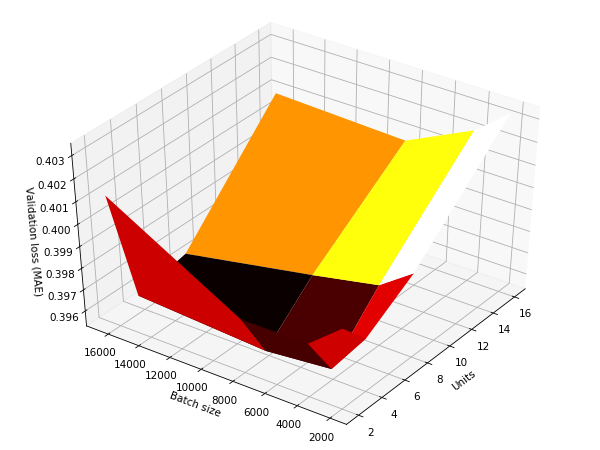

In [9]:
%matplotlib notebook
from mpl_toolkits.mplot3d import axes3d    
from mpl_toolkits import mplot3d

#x = np.array([4,8,16,32,64])
#y = np.array([64,128,256,512,1024])
X,Y = np.meshgrid(x, y)
z = np.array(complete_list)
print(X.shape)
print(Y.shape)
print(z.shape)
fig = pyplot.figure(figsize=(8, 6))
ax = pyplot.axes(projection='3d')
#ax.plot_surface(X, Y, z,cmap='viridis', edgecolor='none')
#ax.plot_wireframe(X, Y, z, color='g')
ax.set_xlabel('Units')
ax.set_ylabel('Batch size')
ax.set_zlabel('Validation loss (MAE)')
#ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, z, rstride=1, cstride=1,
                cmap='hot', edgecolor='none') #'winter''
#ax.set_title('GRU hyperparameter search (units and batch size)')
pyplot.show()

In [10]:
filename = "/home/whsu014/plots/mean_TCHDL_LSTM_HyperparameterSearch_unit_batch_size_no_title.png"
pyplot.savefig(filename)
pyplot.tight_layout()